In [1]:
import torch
import torch.nn as nn
from pathlib import Path
import torchvision.transforms as transforms
import torch.optim as optim
import numpy as np
from math import *
from random import gauss,seed
import torch.nn.functional as F
import math

In [2]:
import sys 
sys.path.insert(0,'/home/mohit.kumargupta/deep_boltzmann')
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from IPython.display import SVG
from deep_boltzmann.models import ParticleDimer
md = ParticleDimer()

/home/mohit.kumargupta/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/mohit.kumargupta/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/mohit.kumargupta/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/mohit.kumargupta/.local/lib/python3.6/site-packages/ten

In [3]:
trajdict = np.load('output.npz')
import ast
#params = ast.literal_eval(str(trajdict['params']))
traj_closed_train = trajdict['traj_closed_train_hungarian']
traj_open_train = trajdict['traj_open_train_hungarian']
traj_closed_test = trajdict['traj_closed_test_hungarian']
traj_open_test = trajdict['traj_open_test_hungarian']
x = np.vstack([traj_closed_train, traj_open_train])
xval = np.vstack([traj_closed_test, traj_open_test])

In [37]:
dataSet = []
j=0
sz = 16

In [23]:
for Snapshot in train_set:
    print(j)
    x = -3.25
    box = []
    while x< 3.25:
        y = -3.25
        while(y<3.25):
            cn=0
            for  i in range(36):
                if(Snapshot[2*i+4] > x and Snapshot[2*i+4] <= x+ 3.25*2/sz and Snapshot[2*i+1 +4] > y and Snapshot[2*i +1 +4] <= y+ 3.25*2/sz ):
                    cn+=1
                    
            y+= 3.25*2/sz
            #print(cn)
            box.append(cn)
        x+=3.25*2/sz
    dataSet.append(box)
    j+=1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

KeyboardInterrupt: 

In [1]:
number= 0
k=0
for Snapshot in train_set:
    print(number)
    number +=1
    k=0
    x = -3.25
    box = []
    t=0
    while x< 3.25:
        y = -3.25
        while(y<3.25):
            k+=1
            pointx = x + (3.25)/sz
            pointy = y + 3.25/sz
            vol = (3.25*2)/sz * (3.25*2)/sz
            sm=0
            for i in range(36):
                dist =  pow(Snapshot[2*i + 4] - pointx,2) + pow( Snapshot[2*i + 4 + 1] -pointy,2)
                sm += exp(-0.5*dist/.81)/(2*pi*0.81 )
            dataSet.append(vol *sm )
            #print(sm*vol)
            t+= sm*vol
            y += (3.25*2)/sz
        x += (3.25*2)/sz
    print(k)
    print(t)

NameError: name 'train_set' is not defined

In [5]:
batch_size = 100
train_set = np.vstack([traj_open_train[1000:81000:2], traj_closed_train[1000:81000:2] ] )

In [8]:
dataSet32 = np.load('DataSet32.npy')

In [9]:
dataSet16 = np.load('DataSet16.npy')

In [10]:
dataSet16 = torch.from_numpy(dataSet16[:70000]).type('torch.FloatTensor').to('cuda')

In [11]:
dataSet32 = torch.from_numpy(dataSet32[:70000]).type('torch.FloatTensor').to('cuda')

In [52]:
trainAtomPositions = torch.from_numpy(train_set[:,:4]).type('torch.FloatTensor').to('cuda')

In [101]:
dataSet8 = torch.from_numpy( np.load('DataSet8.npy') ).type('torch.FloatTensor').to('cuda')

In [143]:
print(dataSet8.shape)

torch.Size([80000, 64])


In [7]:
class DensityEstimator(nn.Module):
    def __init__(self,dimer_atoms,output_dim):
        super(DensityEstimator, self).__init__()
        self.dimer_atoms = dimer_atoms
        self.hidden_dim = 16
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.fc1 = nn.Linear(self.dimer_atoms, self.hidden_dim)
        self.fc2 = nn.Linear(self.hidden_dim, self.hidden_dim*4)
        self.fc3 = nn.Linear(self.hidden_dim*4, self.hidden_dim*4*4)
        #self.lstm = nn.LSTM(hidden_dim, output_dim)
        #self.fc3 = nn.Linear(self.hidden_dim*4*4, hidden_dim*4)
        self.fc4 = nn.Linear(self.hidden_dim*4*4, output_dim)
    
    def forward(self,x):
        out = self.fc1(x)
        out = self.relu(out)
        #out,_ = self.lstm(out.view(self.boxes,1,-1))
        out = self.relu(self.fc2(out))
        out = self.relu(self.fc3(out) )
        out = self.relu(self.fc4(out))
        out = 36*torch.softmax(out,1)
        print(out)
        return out

In [99]:
train_loader = torch.utils.data.DataLoader(trainAtomPositions[:70000], batch_size=batch_size)

In [86]:
label_loader = torch.utils.data.DataLoader(dataSet8[:70000], batch_size = batch_size)

In [108]:
dataSet8 = 36*torch.softmax(dataSet8,1)

tensor([36., 36., 36.,  ..., 36., 36., 36.], device='cuda:0')

In [33]:
model = DensityEstimator(4,dataSet8.shape[1]).to('cuda')
adOptimizer = optim.Adam(model.parameters(),lr =0.001)

NameError: name 'dataSet8' is not defined

In [106]:
Epochs = 1000
ls = []

In [109]:
for epoch in range(Epochs):
    print(epoch)
    totalLoss = 0.0
    for i, data in enumerate(train_loader, 1):
        adOptimizer.zero_grad()
        out = model(data)
        #print(x_hat[-1])
        loss = torch.sqrt( nn.MSELoss()(out,dataSet8[(i-1)*batch_size:i*batch_size]) )
        totalLoss += loss.item()
        print(i,loss)
        loss.backward()
        adOptimizer.step()
    #break
    print(totalLoss)
    ls.append(totalLoss)

0
tensor([[0.3785, 0.4597, 0.5036,  ..., 0.4892, 0.4403, 0.3626],
        [0.3785, 0.4597, 0.5036,  ..., 0.4892, 0.4403, 0.3626],
        [0.3785, 0.4597, 0.5036,  ..., 0.4892, 0.4403, 0.3626],
        ...,
        [0.3780, 0.4598, 0.5037,  ..., 0.4893, 0.4406, 0.3623],
        [0.3780, 0.4598, 0.5037,  ..., 0.4893, 0.4406, 0.3623],
        [0.3780, 0.4598, 0.5037,  ..., 0.4893, 0.4406, 0.3623]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0468, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.3810, 0.4617, 0.5050,  ..., 0.4907, 0.4428, 0.3652],
        [0.3810, 0.4617, 0.5050,  ..., 0.4907, 0.4428, 0.3652],
        [0.3810, 0.4617, 0.5050,  ..., 0.4907, 0.4428, 0.3652],
        ...,
        [0.3812, 0.4617, 0.5049,  ..., 0.4906, 0.4427, 0.3654],
        [0.3812, 0.4617, 0.5049,  ..., 0.4906, 0.4427, 0.3654],
        [0.3812, 0.4617, 0.5049,  ..., 0.4906, 0.4427, 0.3654]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0450, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4650, 0.5030, 0.5270,  ..., 0.5260, 0.5022, 0.4599],
        [0.4650, 0.5030, 0.5270,  ..., 0.5260, 0.5022, 0.4599],
        [0.4650, 0.5030, 0.5270,  ..., 0.5260, 0.5022, 0.4599],
        ...,
        [0.4652, 0.5030, 0.5270,  ..., 0.5261, 0.5022, 0.4601],
        [0.4652, 0.5030, 0.5270,  ..., 0.5261, 0.5022, 0.4601],
        [0.4652, 0.5030, 0.5270,  ..., 0.5261, 0.5022, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.5017, 0.5262,  ..., 0.5252, 0.5005, 0.4581],
        [0.4635, 0.5017, 0.5262,  ..., 0.5252, 0.5005, 0.4581],
        [0.4636, 0.5016, 0.5261,  ..., 0.5251, 0.5003, 0.4581],
        ...,
        [0.4636, 0.5017, 0.5261,  ..., 0.5252, 0.5006, 0.4584],
        [0.4636, 0.5017, 0.5261,  ..., 0.5252, 0.5006, 0.4584],
        [0.4636, 0.5017, 0.5261,  ..., 0.5252, 0.5006, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4623, 0.4970, 0.5212,  ..., 0.5211, 0.4922, 0.4547],
        [0.4623, 0.4970, 0.5212,  ..., 0.5211, 0.4922, 0.4547],
        [0.4623, 0.4970, 0.5212,  ..., 0.5211, 0.4922, 0.4547],
        ...,
        [0.4625, 0.4973, 0.5213,  ..., 0.5213, 0.4925, 0.4551],
        [0.4623, 0.4972, 0.5213,  ..., 0.5213, 0.4925, 0.4550],
        [0.4623, 0.4972, 0.5214,  ..., 0.5213, 0.4925, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4969, 0.5211,  ..., 0.5208, 0.4917, 0.4542],
        [0.4618, 0.4969, 0.5211,  ..., 0.5208, 0.4917, 0.4542],
        [0.4618, 0.4970, 0.5211,  ..., 0.5208, 0.4918, 0.4542],
        ...,
        [0.4614, 0.4968, 0.5212,  ..., 0.5207, 0.4916, 0.4538],
        [0.4614, 0.4968, 0.5212,  ..., 0.5207, 0.4916, 0.4538],
        [0.4614, 0.4969, 0.5213,  ..., 0.5209, 0.4918, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4557, 0.4907, 0.5150,  ..., 0.5189, 0.4970, 0.4592],
        [0.4557, 0.4907, 0.5150,  ..., 0.5189, 0.4970, 0.4592],
        [0.4557, 0.4907, 0.5150,  ..., 0.5189, 0.4970, 0.4592],
        ...,
        [0.4558, 0.4903, 0.5143,  ..., 0.5187, 0.4972, 0.4597],
        [0.4558, 0.4903, 0.5143,  ..., 0.5187, 0.4972, 0.4597],
        [0.4558, 0.4903, 0.5143,  ..., 0.5187, 0.4972, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
102 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4900, 0.5139,  ..., 0.5189, 0.4975, 0.4605],
        [0.4560, 0.4900, 0.5139,  ..., 0.5189, 0.4975, 0.4605],
        [0.4560, 0.4900, 0.5139,  ..., 0.5189, 0.4975, 0.4605],
        ...,
        [0.4560, 0.4902, 0.5140,  ..., 0.5189, 0.4976, 0.4603],
        [0.4560, 0.4902, 0.5140,  ..., 0.5189, 0.4976, 0.4603],
        [0.4560, 0.4902, 0.5140,  ..., 0.5189, 0.4976, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4528, 0.4889, 0.5148,  ..., 0.5226, 0.4971, 0.4576],
        [0.4527, 0.4888, 0.5147,  ..., 0.5226, 0.4971, 0.4576],
        [0.4527, 0.4891, 0.5150,  ..., 0.5228, 0.4974, 0.4576],
        ...,
        [0.4526, 0.4890, 0.5151,  ..., 0.5226, 0.4971, 0.4573],
        [0.4531, 0.4891, 0.5154,  ..., 0.5227, 0.4972, 0.4576],
        [0.4531, 0.4891, 0.5154,  ..., 0.5227, 0.4972, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
136 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4902, 0.5162,  ..., 0.5237, 0.4989, 0.4598],
        [0.4548, 0.4903, 0.5162,  ..., 0.5238, 0.4990, 0.4598],
        [0.4548, 0.4903, 0.5162,  ..., 0.5238, 0.4990, 0.4598],
        ...,
        [0.4561, 0.4905, 0.5172,  ..., 0.5244, 0.4999, 0.4611],
        [0.4561, 0.4905, 0.5172,  ..., 0.5244, 0.4999, 0.4611],
        [0.4561, 0.4905, 0.5172,  ..., 0.5244, 0.4999, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
137 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4432, 0.4784, 0.5032,  ..., 0.5258, 0.5026, 0.4623],
        [0.4432, 0.4784, 0.5032,  ..., 0.5258, 0.5026, 0.4623],
        [0.4432, 0.4784, 0.5032,  ..., 0.5258, 0.5026, 0.4623],
        ...,
        [0.4431, 0.4786, 0.5032,  ..., 0.5260, 0.5028, 0.4624],
        [0.4431, 0.4786, 0.5032,  ..., 0.5260, 0.5028, 0.4624],
        [0.4431, 0.4785, 0.5031,  ..., 0.5260, 0.5028, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
170 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4440, 0.4794, 0.5040,  ..., 0.5265, 0.5036, 0.4632],
        [0.4440, 0.4795, 0.5041,  ..., 0.5265, 0.5036, 0.4631],
        [0.4440, 0.4795, 0.5041,  ..., 0.5265, 0.5036, 0.4631],
        ...,
        [0.4437, 0.4790, 0.5036,  ..., 0.5263, 0.5032, 0.4629],
        [0.4439, 0.4790, 0.5035,  ..., 0.5263, 0.5032, 0.4631],
        [0.4439, 0.4790, 0.5035,  ..., 0.5263, 0.5032, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
171 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

203 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4977, 0.5215,  ..., 0.5293, 0.5047, 0.4649],
        [0.4578, 0.4977, 0.5215,  ..., 0.5293, 0.5047, 0.4649],
        [0.4578, 0.4977, 0.5215,  ..., 0.5293, 0.5047, 0.4649],
        ...,
        [0.4576, 0.4977, 0.5216,  ..., 0.5292, 0.5045, 0.4646],
        [0.4577, 0.4977, 0.5216,  ..., 0.5292, 0.5045, 0.4647],
        [0.4577, 0.4977, 0.5216,  ..., 0.5292, 0.5045, 0.4647]],
       device='cuda:0', grad_fn=<MulBackward0>)
204 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4980, 0.5216,  ..., 0.5292, 0.5045, 0.4650],
        [0.4582, 0.4980, 0.5216,  ..., 0.5292, 0.5045, 0.4650],
        [0.4582, 0.4980, 0.5216,  ..., 0.5292, 0.5045, 0.4650],
        ...,
        [0.4584, 0.4982, 0.5217,  ..., 0.5293, 0.5050, 0.4655],
        [0.4584, 0.4982, 0.5217,  ..., 0.5293, 0.5050, 0.4655],
        [0.4584, 0.4982, 0.5217,  ..., 0.5293, 0.5050, 0.4655]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4541, 0.4947, 0.5174,  ..., 0.5237, 0.4974, 0.4567],
        [0.4541, 0.4947, 0.5174,  ..., 0.5237, 0.4974, 0.4567],
        [0.4541, 0.4947, 0.5174,  ..., 0.5237, 0.4974, 0.4567],
        ...,
        [0.4539, 0.4947, 0.5173,  ..., 0.5234, 0.4970, 0.4562],
        [0.4539, 0.4948, 0.5174,  ..., 0.5235, 0.4971, 0.4562],
        [0.4539, 0.4948, 0.5174,  ..., 0.5235, 0.4971, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
237 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4956, 0.5181,  ..., 0.5237, 0.4975, 0.4569],
        [0.4550, 0.4956, 0.5181,  ..., 0.5237, 0.4975, 0.4569],
        [0.4550, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4569],
        ...,
        [0.4549, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4568],
        [0.4549, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4568],
        [0.4549, 0.4955, 0.5181,  ..., 0.5236, 0.4973, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
238 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

270 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.4989, 0.5225,  ..., 0.5235, 0.4997, 0.4641],
        [0.4651, 0.4989, 0.5225,  ..., 0.5235, 0.4997, 0.4641],
        [0.4653, 0.4989, 0.5226,  ..., 0.5235, 0.4998, 0.4642],
        ...,
        [0.4650, 0.4988, 0.5225,  ..., 0.5238, 0.5000, 0.4644],
        [0.4653, 0.4989, 0.5226,  ..., 0.5238, 0.5001, 0.4646],
        [0.4654, 0.4989, 0.5226,  ..., 0.5239, 0.5002, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
271 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4647, 0.4982, 0.5221,  ..., 0.5238, 0.5001, 0.4644],
        [0.4650, 0.4983, 0.5221,  ..., 0.5238, 0.5001, 0.4646],
        [0.4650, 0.4983, 0.5221,  ..., 0.5238, 0.5001, 0.4646],
        ...,
        [0.4634, 0.4978, 0.5216,  ..., 0.5236, 0.4997, 0.4635],
        [0.4634, 0.4978, 0.5216,  ..., 0.5236, 0.4997, 0.4635],
        [0.4634, 0.4978, 0.5216,  ..., 0.5236, 0.4997, 0.4635]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4685, 0.5022, 0.5238,  ..., 0.5272, 0.5039, 0.4692],
        [0.4684, 0.5022, 0.5238,  ..., 0.5272, 0.5038, 0.4691],
        [0.4684, 0.5022, 0.5238,  ..., 0.5272, 0.5038, 0.4691],
        ...,
        [0.4687, 0.5023, 0.5238,  ..., 0.5272, 0.5039, 0.4694],
        [0.4687, 0.5023, 0.5238,  ..., 0.5272, 0.5039, 0.4694],
        [0.4688, 0.5023, 0.5238,  ..., 0.5273, 0.5040, 0.4695]],
       device='cuda:0', grad_fn=<MulBackward0>)
304 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4698, 0.5029, 0.5242,  ..., 0.5276, 0.5045, 0.4703],
        [0.4698, 0.5029, 0.5242,  ..., 0.5276, 0.5045, 0.4703],
        [0.4698, 0.5029, 0.5242,  ..., 0.5276, 0.5045, 0.4703],
        ...,
        [0.4690, 0.5028, 0.5242,  ..., 0.5275, 0.5044, 0.4696],
        [0.4690, 0.5028, 0.5242,  ..., 0.5275, 0.5044, 0.4696],
        [0.4690, 0.5028, 0.5242,  ..., 0.5275, 0.5044, 0.4696]],
       device='cuda:0', grad_fn=<MulBackward0>)
305 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4996, 0.5201,  ..., 0.5235, 0.4955, 0.4552],
        [0.4604, 0.4996, 0.5201,  ..., 0.5235, 0.4955, 0.4552],
        [0.4604, 0.4996, 0.5201,  ..., 0.5235, 0.4955, 0.4552],
        ...,
        [0.4605, 0.4995, 0.5199,  ..., 0.5235, 0.4955, 0.4553],
        [0.4605, 0.4995, 0.5199,  ..., 0.5235, 0.4955, 0.4553],
        [0.4605, 0.4995, 0.5199,  ..., 0.5235, 0.4955, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
338 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4988, 0.5194,  ..., 0.5230, 0.4947, 0.4542],
        [0.4596, 0.4989, 0.5194,  ..., 0.5230, 0.4947, 0.4543],
        [0.4596, 0.4989, 0.5194,  ..., 0.5230, 0.4947, 0.4543],
        ...,
        [0.4592, 0.4988, 0.5196,  ..., 0.5228, 0.4945, 0.4537],
        [0.4592, 0.4988, 0.5196,  ..., 0.5228, 0.4945, 0.4537],
        [0.4592, 0.4988, 0.5196,  ..., 0.5228, 0.4945, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
339 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

371 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4966, 0.5195,  ..., 0.5279, 0.5031, 0.4645],
        [0.4613, 0.4966, 0.5195,  ..., 0.5279, 0.5031, 0.4645],
        [0.4613, 0.4966, 0.5195,  ..., 0.5279, 0.5031, 0.4645],
        ...,
        [0.4614, 0.4967, 0.5195,  ..., 0.5280, 0.5032, 0.4648],
        [0.4614, 0.4967, 0.5195,  ..., 0.5280, 0.5032, 0.4648],
        [0.4614, 0.4967, 0.5195,  ..., 0.5280, 0.5032, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
372 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4963, 0.5192,  ..., 0.5277, 0.5026, 0.4639],
        [0.4605, 0.4963, 0.5192,  ..., 0.5277, 0.5026, 0.4639],
        [0.4605, 0.4963, 0.5192,  ..., 0.5277, 0.5026, 0.4639],
        ...,
        [0.4605, 0.4963, 0.5193,  ..., 0.5277, 0.5027, 0.4638],
        [0.4605, 0.4963, 0.5193,  ..., 0.5277, 0.5027, 0.4638],
        [0.4605, 0.4963, 0.5193,  ..., 0.5277, 0.5027, 0.4638]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4583, 0.4949, 0.5184,  ..., 0.5286, 0.5027, 0.4631],
        [0.4583, 0.4949, 0.5184,  ..., 0.5286, 0.5027, 0.4631],
        [0.4583, 0.4949, 0.5184,  ..., 0.5286, 0.5027, 0.4631],
        ...,
        [0.4576, 0.4947, 0.5186,  ..., 0.5283, 0.5023, 0.4621],
        [0.4576, 0.4947, 0.5186,  ..., 0.5283, 0.5023, 0.4621],
        [0.4576, 0.4947, 0.5186,  ..., 0.5283, 0.5023, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0106, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4967, 0.5199,  ..., 0.5293, 0.5041, 0.4652],
        [0.4608, 0.4967, 0.5199,  ..., 0.5293, 0.5041, 0.4652],
        [0.4608, 0.4967, 0.5199,  ..., 0.5293, 0.5041, 0.4652],
        ...,
        [0.4609, 0.4965, 0.5200,  ..., 0.5292, 0.5041, 0.4652],
        [0.4609, 0.4965, 0.5200,  ..., 0.5292, 0.5041, 0.4652],
        [0.4609, 0.4965, 0.5200,  ..., 0.5292, 0.5041, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
406 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4947, 0.5196,  ..., 0.5211, 0.4939, 0.4577],
        [0.4600, 0.4947, 0.5196,  ..., 0.5211, 0.4939, 0.4577],
        [0.4600, 0.4947, 0.5196,  ..., 0.5211, 0.4939, 0.4577],
        ...,
        [0.4603, 0.4949, 0.5198,  ..., 0.5209, 0.4938, 0.4578],
        [0.4603, 0.4949, 0.5198,  ..., 0.5209, 0.4938, 0.4578],
        [0.4603, 0.4949, 0.5198,  ..., 0.5209, 0.4938, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
439 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4942, 0.5191,  ..., 0.5201, 0.4927, 0.4561],
        [0.4586, 0.4942, 0.5191,  ..., 0.5201, 0.4927, 0.4560],
        [0.4586, 0.4942, 0.5191,  ..., 0.5201, 0.4927, 0.4560],
        ...,
        [0.4587, 0.4941, 0.5191,  ..., 0.5201, 0.4926, 0.4559],
        [0.4587, 0.4941, 0.5191,  ..., 0.5201, 0.4926, 0.4559],
        [0.4587, 0.4941, 0.5191,  ..., 0.5201, 0.4926, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
440 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

472 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4655, 0.4978, 0.5187,  ..., 0.5236, 0.5019, 0.4673],
        [0.4658, 0.4980, 0.5188,  ..., 0.5236, 0.5020, 0.4675],
        [0.4658, 0.4980, 0.5188,  ..., 0.5236, 0.5020, 0.4675],
        ...,
        [0.4657, 0.4979, 0.5189,  ..., 0.5236, 0.5021, 0.4673],
        [0.4657, 0.4979, 0.5189,  ..., 0.5236, 0.5021, 0.4673],
        [0.4656, 0.4979, 0.5189,  ..., 0.5237, 0.5021, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
473 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4659, 0.4980, 0.5188,  ..., 0.5235, 0.5019, 0.4674],
        [0.4659, 0.4980, 0.5188,  ..., 0.5235, 0.5019, 0.4674],
        [0.4658, 0.4979, 0.5188,  ..., 0.5234, 0.5019, 0.4673],
        ...,
        [0.4652, 0.4976, 0.5184,  ..., 0.5234, 0.5017, 0.4671],
        [0.4652, 0.4976, 0.5184,  ..., 0.5234, 0.5017, 0.4671],
        [0.4652, 0.4976, 0.5184,  ..., 0.5234, 0.5017, 0.4671]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4707, 0.5058, 0.5269,  ..., 0.5231, 0.5020, 0.4694],
        [0.4707, 0.5058, 0.5269,  ..., 0.5231, 0.5020, 0.4694],
        [0.4707, 0.5058, 0.5269,  ..., 0.5231, 0.5020, 0.4694],
        ...,
        [0.4705, 0.5057, 0.5268,  ..., 0.5231, 0.5021, 0.4693],
        [0.4705, 0.5057, 0.5268,  ..., 0.5231, 0.5021, 0.4693],
        [0.4705, 0.5057, 0.5268,  ..., 0.5231, 0.5021, 0.4693]],
       device='cuda:0', grad_fn=<MulBackward0>)
506 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5019, 0.4688],
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5019, 0.4688],
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5019, 0.4688],
        ...,
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5020, 0.4689],
        [0.4698, 0.5055, 0.5268,  ..., 0.5232, 0.5020, 0.4689],
        [0.4698, 0.5054, 0.5268,  ..., 0.5232, 0.5020, 0.4689]],
       device='cuda:0', grad_fn=<MulBackward0>)
507 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

540 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4529, 0.4922, 0.5187,  ..., 0.5191, 0.4901, 0.4493],
        [0.4529, 0.4922, 0.5187,  ..., 0.5191, 0.4901, 0.4493],
        [0.4529, 0.4921, 0.5187,  ..., 0.5191, 0.4901, 0.4493],
        ...,
        [0.4528, 0.4922, 0.5188,  ..., 0.5191, 0.4901, 0.4492],
        [0.4526, 0.4920, 0.5187,  ..., 0.5189, 0.4898, 0.4489],
        [0.4526, 0.4920, 0.5187,  ..., 0.5189, 0.4898, 0.4489]],
       device='cuda:0', grad_fn=<MulBackward0>)
541 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4527, 0.4920, 0.5186,  ..., 0.5187, 0.4894, 0.4486],
        [0.4527, 0.4920, 0.5186,  ..., 0.5187, 0.4894, 0.4486],
        [0.4527, 0.4920, 0.5186,  ..., 0.5187, 0.4894, 0.4486],
        ...,
        [0.4532, 0.4922, 0.5187,  ..., 0.5194, 0.4903, 0.4496],
        [0.4531, 0.4923, 0.5188,  ..., 0.5194, 0.4904, 0.4496],
        [0.4526, 0.4918, 0.5185,  ..., 0.5188, 0.4894, 0.4485]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4569, 0.4962, 0.5195,  ..., 0.5193, 0.4930, 0.4535],
        [0.4569, 0.4962, 0.5195,  ..., 0.5193, 0.4930, 0.4535],
        [0.4569, 0.4962, 0.5195,  ..., 0.5193, 0.4930, 0.4535],
        ...,
        [0.4567, 0.4961, 0.5194,  ..., 0.5192, 0.4928, 0.4532],
        [0.4567, 0.4961, 0.5194,  ..., 0.5192, 0.4928, 0.4532],
        [0.4566, 0.4962, 0.5194,  ..., 0.5192, 0.4929, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
574 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4564, 0.4964, 0.5197,  ..., 0.5191, 0.4927, 0.4528],
        [0.4564, 0.4964, 0.5197,  ..., 0.5191, 0.4927, 0.4528],
        [0.4564, 0.4963, 0.5196,  ..., 0.5190, 0.4926, 0.4527],
        ...,
        [0.4567, 0.4961, 0.5197,  ..., 0.5187, 0.4922, 0.4527],
        [0.4567, 0.4960, 0.5197,  ..., 0.5186, 0.4920, 0.4526],
        [0.4567, 0.4960, 0.5197,  ..., 0.5187, 0.4921, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
575 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4710, 0.5086, 0.5307,  ..., 0.5235, 0.5006, 0.4632],
        [0.4710, 0.5086, 0.5307,  ..., 0.5235, 0.5006, 0.4632],
        [0.4710, 0.5086, 0.5307,  ..., 0.5235, 0.5006, 0.4632],
        ...,
        [0.4710, 0.5085, 0.5306,  ..., 0.5235, 0.5005, 0.4632],
        [0.4710, 0.5086, 0.5306,  ..., 0.5235, 0.5005, 0.4632],
        [0.4710, 0.5086, 0.5306,  ..., 0.5235, 0.5005, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
608 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4717, 0.5090, 0.5309,  ..., 0.5240, 0.5012, 0.4640],
        [0.4717, 0.5090, 0.5309,  ..., 0.5240, 0.5012, 0.4640],
        [0.4717, 0.5090, 0.5309,  ..., 0.5240, 0.5012, 0.4640],
        ...,
        [0.4719, 0.5092, 0.5312,  ..., 0.5242, 0.5016, 0.4643],
        [0.4719, 0.5092, 0.5312,  ..., 0.5242, 0.5017, 0.4644],
        [0.4719, 0.5092, 0.5312,  ..., 0.5242, 0.5016, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
609 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.4972, 0.5199,  ..., 0.5244, 0.4957, 0.4559],
        [0.4639, 0.4972, 0.5199,  ..., 0.5244, 0.4957, 0.4559],
        [0.4639, 0.4972, 0.5199,  ..., 0.5244, 0.4957, 0.4559],
        ...,
        [0.4641, 0.4974, 0.5199,  ..., 0.5244, 0.4957, 0.4561],
        [0.4641, 0.4974, 0.5199,  ..., 0.5244, 0.4957, 0.4561],
        [0.4637, 0.4972, 0.5197,  ..., 0.5244, 0.4956, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
642 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4645, 0.4974, 0.5198,  ..., 0.5250, 0.4964, 0.4569],
        [0.4645, 0.4974, 0.5198,  ..., 0.5250, 0.4964, 0.4569],
        [0.4645, 0.4974, 0.5199,  ..., 0.5250, 0.4964, 0.4568],
        ...,
        [0.4639, 0.4971, 0.5197,  ..., 0.5250, 0.4963, 0.4563],
        [0.4639, 0.4971, 0.5197,  ..., 0.5250, 0.4963, 0.4563],
        [0.4639, 0.4971, 0.5197,  ..., 0.5250, 0.4963, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
643 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4904, 0.5139,  ..., 0.5269, 0.4990, 0.4600],
        [0.4572, 0.4905, 0.5140,  ..., 0.5269, 0.4990, 0.4601],
        [0.4572, 0.4905, 0.5140,  ..., 0.5269, 0.4990, 0.4601],
        ...,
        [0.4576, 0.4906, 0.5140,  ..., 0.5271, 0.4990, 0.4601],
        [0.4576, 0.4906, 0.5140,  ..., 0.5271, 0.4990, 0.4601],
        [0.4574, 0.4905, 0.5140,  ..., 0.5271, 0.4990, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
676 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4574, 0.4907, 0.5142,  ..., 0.5269, 0.4989, 0.4602],
        [0.4574, 0.4907, 0.5142,  ..., 0.5269, 0.4989, 0.4602],
        [0.4574, 0.4907, 0.5142,  ..., 0.5269, 0.4989, 0.4602],
        ...,
        [0.4563, 0.4902, 0.5138,  ..., 0.5268, 0.4988, 0.4595],
        [0.4563, 0.4902, 0.5139,  ..., 0.5268, 0.4988, 0.4595],
        [0.4562, 0.4902, 0.5139,  ..., 0.5267, 0.4988, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
677 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4559, 0.4920, 0.5147,  ..., 0.5295, 0.5047, 0.4646],
        [0.4559, 0.4920, 0.5147,  ..., 0.5295, 0.5047, 0.4646],
        [0.4559, 0.4920, 0.5147,  ..., 0.5296, 0.5048, 0.4647],
        ...,
        [0.4577, 0.4932, 0.5154,  ..., 0.5298, 0.5057, 0.4669],
        [0.4584, 0.4934, 0.5156,  ..., 0.5298, 0.5058, 0.4674],
        [0.4584, 0.4934, 0.5156,  ..., 0.5298, 0.5058, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
10 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4942, 0.5161,  ..., 0.5301, 0.5061, 0.4675],
        [0.4594, 0.4942, 0.5161,  ..., 0.5301, 0.5061, 0.4675],
        [0.4593, 0.4941, 0.5161,  ..., 0.5301, 0.5061, 0.4675],
        ...,
        [0.4584, 0.4939, 0.5158,  ..., 0.5295, 0.5051, 0.4655],
        [0.4584, 0.4939, 0.5158,  ..., 0.5295, 0.5051, 0.4655],
        [0.4584, 0.4939, 0.5158,  ..., 0.5295, 0.5051, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
11 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4549, 0.4945, 0.5176,  ..., 0.5227, 0.4931, 0.4520],
        [0.4549, 0.4945, 0.5176,  ..., 0.5227, 0.4931, 0.4520],
        [0.4549, 0.4945, 0.5176,  ..., 0.5227, 0.4931, 0.4520],
        ...,
        [0.4552, 0.4946, 0.5177,  ..., 0.5221, 0.4925, 0.4515],
        [0.4552, 0.4946, 0.5177,  ..., 0.5221, 0.4925, 0.4515],
        [0.4552, 0.4946, 0.5177,  ..., 0.5221, 0.4925, 0.4515]],
       device='cuda:0', grad_fn=<MulBackward0>)
44 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4939, 0.5172,  ..., 0.5213, 0.4914, 0.4499],
        [0.4539, 0.4939, 0.5172,  ..., 0.5213, 0.4914, 0.4499],
        [0.4539, 0.4939, 0.5172,  ..., 0.5213, 0.4914, 0.4499],
        ...,
        [0.4537, 0.4938, 0.5171,  ..., 0.5206, 0.4905, 0.4490],
        [0.4538, 0.4938, 0.5172,  ..., 0.5206, 0.4906, 0.4491],
        [0.4538, 0.4938, 0.5172,  ..., 0.5206, 0.4906, 0.4491]],
       device='cuda:0', grad_fn=<MulBackward0>)
45 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4564, 0.4951, 0.5199,  ..., 0.5171, 0.4875, 0.4498],
        [0.4564, 0.4951, 0.5199,  ..., 0.5171, 0.4875, 0.4498],
        [0.4565, 0.4953, 0.5199,  ..., 0.5171, 0.4877, 0.4499],
        ...,
        [0.4563, 0.4950, 0.5199,  ..., 0.5170, 0.4875, 0.4497],
        [0.4561, 0.4948, 0.5198,  ..., 0.5169, 0.4872, 0.4493],
        [0.4561, 0.4948, 0.5198,  ..., 0.5169, 0.4872, 0.4493]],
       device='cuda:0', grad_fn=<MulBackward0>)
78 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4570, 0.4956, 0.5205,  ..., 0.5172, 0.4878, 0.4502],
        [0.4570, 0.4956, 0.5205,  ..., 0.5172, 0.4878, 0.4502],
        [0.4570, 0.4956, 0.5205,  ..., 0.5172, 0.4878, 0.4502],
        ...,
        [0.4571, 0.4957, 0.5205,  ..., 0.5174, 0.4882, 0.4505],
        [0.4571, 0.4957, 0.5205,  ..., 0.5174, 0.4882, 0.4505],
        [0.4572, 0.4958, 0.5205,  ..., 0.5173, 0.4882, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
79 tensor(0.0071, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4522, 0.4882, 0.5134,  ..., 0.5203, 0.4964, 0.4574],
        [0.4522, 0.4882, 0.5134,  ..., 0.5204, 0.4965, 0.4575],
        [0.4522, 0.4882, 0.5134,  ..., 0.5204, 0.4965, 0.4575],
        ...,
        [0.4518, 0.4881, 0.5132,  ..., 0.5204, 0.4965, 0.4573],
        [0.4516, 0.4879, 0.5132,  ..., 0.5204, 0.4966, 0.4573],
        [0.4516, 0.4879, 0.5132,  ..., 0.5204, 0.4966, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
112 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4515, 0.4877, 0.5129,  ..., 0.5204, 0.4965, 0.4574],
        [0.4515, 0.4877, 0.5129,  ..., 0.5204, 0.4965, 0.4574],
        [0.4515, 0.4877, 0.5129,  ..., 0.5204, 0.4965, 0.4574],
        ...,
        [0.4525, 0.4884, 0.5134,  ..., 0.5203, 0.4965, 0.4576],
        [0.4525, 0.4884, 0.5134,  ..., 0.5203, 0.4965, 0.4576],
        [0.4525, 0.4884, 0.5134,  ..., 0.5203, 0.4965, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
113 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4929, 0.5167,  ..., 0.5275, 0.5044, 0.4669],
        [0.4598, 0.4929, 0.5167,  ..., 0.5275, 0.5044, 0.4669],
        [0.4598, 0.4929, 0.5167,  ..., 0.5275, 0.5044, 0.4669],
        ...,
        [0.4595, 0.4928, 0.5166,  ..., 0.5275, 0.5043, 0.4666],
        [0.4595, 0.4928, 0.5166,  ..., 0.5275, 0.5043, 0.4666],
        [0.4595, 0.4928, 0.5166,  ..., 0.5275, 0.5043, 0.4666]],
       device='cuda:0', grad_fn=<MulBackward0>)
146 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4926, 0.5164,  ..., 0.5275, 0.5043, 0.4665],
        [0.4592, 0.4926, 0.5164,  ..., 0.5275, 0.5043, 0.4665],
        [0.4592, 0.4926, 0.5164,  ..., 0.5275, 0.5043, 0.4665],
        ...,
        [0.4597, 0.4930, 0.5165,  ..., 0.5275, 0.5043, 0.4669],
        [0.4597, 0.4930, 0.5165,  ..., 0.5275, 0.5043, 0.4669],
        [0.4597, 0.4930, 0.5165,  ..., 0.5275, 0.5043, 0.4669]],
       device='cuda:0', grad_fn=<MulBackward0>)
147 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4486, 0.4827, 0.5070,  ..., 0.5283, 0.5062, 0.4684],
        [0.4486, 0.4827, 0.5070,  ..., 0.5283, 0.5062, 0.4684],
        [0.4486, 0.4827, 0.5070,  ..., 0.5283, 0.5062, 0.4684],
        ...,
        [0.4479, 0.4822, 0.5066,  ..., 0.5285, 0.5062, 0.4682],
        [0.4479, 0.4822, 0.5066,  ..., 0.5285, 0.5062, 0.4682],
        [0.4479, 0.4822, 0.5066,  ..., 0.5285, 0.5062, 0.4682]],
       device='cuda:0', grad_fn=<MulBackward0>)
180 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4473, 0.4820, 0.5064,  ..., 0.5282, 0.5058, 0.4676],
        [0.4472, 0.4819, 0.5063,  ..., 0.5282, 0.5057, 0.4675],
        [0.4472, 0.4819, 0.5063,  ..., 0.5282, 0.5057, 0.4675],
        ...,
        [0.4478, 0.4824, 0.5067,  ..., 0.5280, 0.5057, 0.4676],
        [0.4478, 0.4824, 0.5067,  ..., 0.5280, 0.5057, 0.4676],
        [0.4477, 0.4823, 0.5066,  ..., 0.5280, 0.5057, 0.4675]],
       device='cuda:0', grad_fn=<MulBackward0>)
181 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4587, 0.4963, 0.5190,  ..., 0.5260, 0.5007, 0.4618],
        [0.4587, 0.4963, 0.5190,  ..., 0.5260, 0.5007, 0.4618],
        [0.4587, 0.4963, 0.5190,  ..., 0.5260, 0.5007, 0.4618],
        ...,
        [0.4585, 0.4961, 0.5191,  ..., 0.5258, 0.5005, 0.4615],
        [0.4585, 0.4961, 0.5191,  ..., 0.5258, 0.5005, 0.4615],
        [0.4585, 0.4961, 0.5191,  ..., 0.5258, 0.5005, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
214 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4952, 0.5184,  ..., 0.5252, 0.4994, 0.4598],
        [0.4571, 0.4952, 0.5184,  ..., 0.5252, 0.4994, 0.4598],
        [0.4571, 0.4952, 0.5184,  ..., 0.5252, 0.4994, 0.4598],
        ...,
        [0.4577, 0.4956, 0.5184,  ..., 0.5255, 0.5000, 0.4609],
        [0.4577, 0.4956, 0.5184,  ..., 0.5255, 0.5000, 0.4609],
        [0.4577, 0.4956, 0.5184,  ..., 0.5255, 0.5000, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
215 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4685, 0.5033, 0.5245,  ..., 0.5257, 0.5024, 0.4683],
        [0.4685, 0.5034, 0.5245,  ..., 0.5257, 0.5024, 0.4683],
        [0.4685, 0.5034, 0.5245,  ..., 0.5257, 0.5024, 0.4683],
        ...,
        [0.4685, 0.5034, 0.5245,  ..., 0.5256, 0.5024, 0.4682],
        [0.4685, 0.5034, 0.5245,  ..., 0.5256, 0.5024, 0.4682],
        [0.4685, 0.5034, 0.5245,  ..., 0.5256, 0.5024, 0.4682]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4685, 0.5034, 0.5246,  ..., 0.5252, 0.5020, 0.4679],
        [0.4685, 0.5034, 0.5246,  ..., 0.5252, 0.5020, 0.4679],
        [0.4685, 0.5034, 0.5246,  ..., 0.5252, 0.5020, 0.4679],
        ...,
        [0.4683, 0.5033, 0.5245,  ..., 0.5252, 0.5018, 0.4677],
        [0.4683, 0.5033, 0.5245,  ..., 0.5252, 0.5019, 0.4677],
        [0.4683, 0.5033, 0.5245,  ..., 0.5253, 0.5019, 0.4678]],
       device='cuda:0', grad_fn=<MulBackward0>)
249 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4952, 0.5189,  ..., 0.5246, 0.4999, 0.4626],
        [0.4605, 0.4953, 0.5189,  ..., 0.5246, 0.4999, 0.4627],
        [0.4604, 0.4952, 0.5189,  ..., 0.5246, 0.4999, 0.4626],
        ...,
        [0.4604, 0.4952, 0.5190,  ..., 0.5247, 0.5000, 0.4627],
        [0.4604, 0.4952, 0.5190,  ..., 0.5247, 0.5000, 0.4627],
        [0.4604, 0.4952, 0.5190,  ..., 0.5247, 0.5000, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4951, 0.5188,  ..., 0.5246, 0.4998, 0.4624],
        [0.4600, 0.4951, 0.5188,  ..., 0.5246, 0.4998, 0.4624],
        [0.4600, 0.4951, 0.5188,  ..., 0.5246, 0.4998, 0.4624],
        ...,
        [0.4596, 0.4947, 0.5186,  ..., 0.5247, 0.4998, 0.4622],
        [0.4596, 0.4947, 0.5186,  ..., 0.5247, 0.4998, 0.4622],
        [0.4596, 0.4947, 0.5186,  ..., 0.5247, 0.4998, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4585, 0.4970, 0.5198,  ..., 0.5235, 0.4980, 0.4581],
        [0.4585, 0.4970, 0.5198,  ..., 0.5235, 0.4980, 0.4581],
        [0.4585, 0.4969, 0.5198,  ..., 0.5235, 0.4979, 0.4581],
        ...,
        [0.4582, 0.4965, 0.5197,  ..., 0.5234, 0.4975, 0.4577],
        [0.4582, 0.4965, 0.5197,  ..., 0.5234, 0.4975, 0.4577],
        [0.4582, 0.4965, 0.5197,  ..., 0.5234, 0.4975, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4965, 0.5197,  ..., 0.5235, 0.4974, 0.4575],
        [0.4582, 0.4965, 0.5197,  ..., 0.5235, 0.4974, 0.4575],
        [0.4582, 0.4965, 0.5197,  ..., 0.5235, 0.4974, 0.4575],
        ...,
        [0.4587, 0.4971, 0.5197,  ..., 0.5236, 0.4980, 0.4583],
        [0.4587, 0.4971, 0.5197,  ..., 0.5236, 0.4980, 0.4583],
        [0.4586, 0.4970, 0.5197,  ..., 0.5236, 0.4980, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4640, 0.5001, 0.5211,  ..., 0.5256, 0.4987, 0.4600],
        [0.4640, 0.5001, 0.5211,  ..., 0.5256, 0.4987, 0.4600],
        [0.4641, 0.5001, 0.5211,  ..., 0.5256, 0.4987, 0.4601],
        ...,
        [0.4641, 0.5002, 0.5212,  ..., 0.5256, 0.4987, 0.4600],
        [0.4641, 0.5002, 0.5212,  ..., 0.5256, 0.4987, 0.4600],
        [0.4641, 0.5002, 0.5212,  ..., 0.5256, 0.4987, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
350 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5000, 0.5211,  ..., 0.5258, 0.4991, 0.4604],
        [0.4643, 0.5001, 0.5211,  ..., 0.5258, 0.4991, 0.4605],
        [0.4643, 0.5001, 0.5211,  ..., 0.5257, 0.4991, 0.4605],
        ...,
        [0.4641, 0.5000, 0.5210,  ..., 0.5259, 0.4991, 0.4605],
        [0.4641, 0.5000, 0.5210,  ..., 0.5259, 0.4991, 0.4605],
        [0.4640, 0.4999, 0.5210,  ..., 0.5259, 0.4992, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4946, 0.5183,  ..., 0.5277, 0.5008, 0.4604],
        [0.4570, 0.4946, 0.5183,  ..., 0.5277, 0.5008, 0.4604],
        [0.4570, 0.4946, 0.5183,  ..., 0.5277, 0.5008, 0.4604],
        ...,
        [0.4566, 0.4944, 0.5182,  ..., 0.5277, 0.5009, 0.4601],
        [0.4566, 0.4944, 0.5182,  ..., 0.5277, 0.5009, 0.4601],
        [0.4566, 0.4944, 0.5182,  ..., 0.5277, 0.5009, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
384 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4943, 0.5182,  ..., 0.5280, 0.5012, 0.4605],
        [0.4568, 0.4943, 0.5182,  ..., 0.5280, 0.5012, 0.4605],
        [0.4568, 0.4943, 0.5182,  ..., 0.5280, 0.5012, 0.4605],
        ...,
        [0.4572, 0.4946, 0.5184,  ..., 0.5280, 0.5012, 0.4607],
        [0.4572, 0.4946, 0.5184,  ..., 0.5280, 0.5012, 0.4607],
        [0.4572, 0.4946, 0.5184,  ..., 0.5280, 0.5012, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
385 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4651, 0.4992, 0.5210,  ..., 0.5265, 0.5006, 0.4665],
        [0.4651, 0.4992, 0.5210,  ..., 0.5265, 0.5006, 0.4665],
        [0.4651, 0.4992, 0.5210,  ..., 0.5265, 0.5006, 0.4665],
        ...,
        [0.4648, 0.4990, 0.5210,  ..., 0.5265, 0.5004, 0.4663],
        [0.4648, 0.4990, 0.5210,  ..., 0.5265, 0.5004, 0.4663],
        [0.4648, 0.4990, 0.5210,  ..., 0.5265, 0.5004, 0.4663]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0091, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.4982, 0.5205,  ..., 0.5255, 0.4991, 0.4645],
        [0.4632, 0.4982, 0.5205,  ..., 0.5255, 0.4991, 0.4645],
        [0.4631, 0.4982, 0.5205,  ..., 0.5255, 0.4990, 0.4645],
        ...,
        [0.4621, 0.4977, 0.5207,  ..., 0.5249, 0.4983, 0.4634],
        [0.4621, 0.4977, 0.5207,  ..., 0.5249, 0.4983, 0.4634],
        [0.4620, 0.4975, 0.5205,  ..., 0.5248, 0.4980, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
419 tensor(0.0082, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4950, 0.5182,  ..., 0.5179, 0.4926, 0.4545],
        [0.4586, 0.4950, 0.5182,  ..., 0.5179, 0.4926, 0.4545],
        [0.4586, 0.4950, 0.5182,  ..., 0.5179, 0.4926, 0.4545],
        ...,
        [0.4584, 0.4951, 0.5185,  ..., 0.5177, 0.4927, 0.4543],
        [0.4584, 0.4951, 0.5185,  ..., 0.5177, 0.4927, 0.4543],
        [0.4584, 0.4951, 0.5185,  ..., 0.5177, 0.4927, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
452 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4953, 0.5186,  ..., 0.5181, 0.4936, 0.4554],
        [0.4592, 0.4953, 0.5186,  ..., 0.5181, 0.4936, 0.4554],
        [0.4592, 0.4953, 0.5186,  ..., 0.5181, 0.4936, 0.4554],
        ...,
        [0.4582, 0.4948, 0.5182,  ..., 0.5182, 0.4931, 0.4548],
        [0.4582, 0.4948, 0.5182,  ..., 0.5182, 0.4931, 0.4548],
        [0.4582, 0.4948, 0.5182,  ..., 0.5182, 0.4931, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
453 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4943, 0.5169,  ..., 0.5183, 0.4928, 0.4573],
        [0.4586, 0.4943, 0.5169,  ..., 0.5183, 0.4928, 0.4573],
        [0.4587, 0.4944, 0.5169,  ..., 0.5183, 0.4928, 0.4573],
        ...,
        [0.4586, 0.4946, 0.5170,  ..., 0.5184, 0.4930, 0.4574],
        [0.4586, 0.4946, 0.5170,  ..., 0.5184, 0.4930, 0.4574],
        [0.4586, 0.4946, 0.5170,  ..., 0.5184, 0.4930, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
486 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4946, 0.5171,  ..., 0.5180, 0.4926, 0.4569],
        [0.4582, 0.4946, 0.5171,  ..., 0.5180, 0.4926, 0.4569],
        [0.4582, 0.4946, 0.5171,  ..., 0.5180, 0.4926, 0.4569],
        ...,
        [0.4588, 0.4947, 0.5173,  ..., 0.5180, 0.4929, 0.4572],
        [0.4588, 0.4947, 0.5173,  ..., 0.5180, 0.4929, 0.4572],
        [0.4589, 0.4948, 0.5173,  ..., 0.5179, 0.4929, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
487 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

520 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4981, 0.5223,  ..., 0.5205, 0.4968, 0.4579],
        [0.4579, 0.4981, 0.5224,  ..., 0.5206, 0.4969, 0.4580],
        [0.4579, 0.4981, 0.5224,  ..., 0.5206, 0.4969, 0.4580],
        ...,
        [0.4575, 0.4979, 0.5222,  ..., 0.5206, 0.4970, 0.4579],
        [0.4575, 0.4979, 0.5222,  ..., 0.5206, 0.4970, 0.4579],
        [0.4575, 0.4979, 0.5222,  ..., 0.5206, 0.4970, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
521 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4977, 0.5221,  ..., 0.5208, 0.4970, 0.4580],
        [0.4575, 0.4976, 0.5221,  ..., 0.5207, 0.4970, 0.4580],
        [0.4576, 0.4977, 0.5220,  ..., 0.5207, 0.4970, 0.4580],
        ...,
        [0.4582, 0.4981, 0.5224,  ..., 0.5207, 0.4971, 0.4582],
        [0.4583, 0.4981, 0.5225,  ..., 0.5208, 0.4971, 0.4582],
        [0.4580, 0.4980, 0.5224,  ..., 0.5207, 0.4971, 0.4581]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4541, 0.4923, 0.5165,  ..., 0.5166, 0.4869, 0.4477],
        [0.4541, 0.4923, 0.5166,  ..., 0.5167, 0.4871, 0.4478],
        [0.4541, 0.4923, 0.5166,  ..., 0.5167, 0.4871, 0.4478],
        ...,
        [0.4546, 0.4923, 0.5166,  ..., 0.5172, 0.4878, 0.4489],
        [0.4546, 0.4923, 0.5166,  ..., 0.5172, 0.4879, 0.4490],
        [0.4545, 0.4923, 0.5166,  ..., 0.5172, 0.4879, 0.4489]],
       device='cuda:0', grad_fn=<MulBackward0>)
554 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4928, 0.5169,  ..., 0.5176, 0.4886, 0.4499],
        [0.4555, 0.4928, 0.5169,  ..., 0.5176, 0.4886, 0.4499],
        [0.4555, 0.4928, 0.5169,  ..., 0.5176, 0.4886, 0.4499],
        ...,
        [0.4558, 0.4928, 0.5169,  ..., 0.5177, 0.4890, 0.4503],
        [0.4558, 0.4928, 0.5169,  ..., 0.5177, 0.4890, 0.4503],
        [0.4558, 0.4928, 0.5169,  ..., 0.5177, 0.4890, 0.4503]],
       device='cuda:0', grad_fn=<MulBackward0>)
555 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

588 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.5026, 0.5260,  ..., 0.5201, 0.4950, 0.4573],
        [0.4632, 0.5026, 0.5260,  ..., 0.5201, 0.4950, 0.4573],
        [0.4632, 0.5026, 0.5260,  ..., 0.5201, 0.4950, 0.4573],
        ...,
        [0.4631, 0.5025, 0.5258,  ..., 0.5202, 0.4951, 0.4574],
        [0.4631, 0.5025, 0.5258,  ..., 0.5202, 0.4951, 0.4574],
        [0.4631, 0.5025, 0.5258,  ..., 0.5202, 0.4951, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
589 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.5026, 0.5260,  ..., 0.5200, 0.4950, 0.4572],
        [0.4631, 0.5025, 0.5260,  ..., 0.5200, 0.4950, 0.4572],
        [0.4631, 0.5025, 0.5260,  ..., 0.5200, 0.4950, 0.4572],
        ...,
        [0.4631, 0.5024, 0.5258,  ..., 0.5198, 0.4946, 0.4568],
        [0.4631, 0.5024, 0.5258,  ..., 0.5198, 0.4946, 0.4568],
        [0.4631, 0.5024, 0.5258,  ..., 0.5198, 0.4946, 0.4568]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4656, 0.5048, 0.5270,  ..., 0.5235, 0.4980, 0.4585],
        [0.4656, 0.5048, 0.5270,  ..., 0.5235, 0.4980, 0.4585],
        [0.4656, 0.5048, 0.5270,  ..., 0.5235, 0.4980, 0.4585],
        ...,
        [0.4650, 0.5048, 0.5269,  ..., 0.5228, 0.4972, 0.4575],
        [0.4650, 0.5048, 0.5269,  ..., 0.5228, 0.4972, 0.4575],
        [0.4650, 0.5048, 0.5269,  ..., 0.5228, 0.4972, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
622 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4629, 0.5034, 0.5259,  ..., 0.5220, 0.4958, 0.4553],
        [0.4629, 0.5034, 0.5259,  ..., 0.5220, 0.4958, 0.4553],
        [0.4629, 0.5034, 0.5259,  ..., 0.5220, 0.4958, 0.4553],
        ...,
        [0.4636, 0.5035, 0.5262,  ..., 0.5220, 0.4959, 0.4559],
        [0.4636, 0.5035, 0.5262,  ..., 0.5220, 0.4959, 0.4559],
        [0.4636, 0.5035, 0.5262,  ..., 0.5220, 0.4959, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
623 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4693, 0.4989, 0.5194,  ..., 0.5322, 0.5054, 0.4671],
        [0.4693, 0.4989, 0.5194,  ..., 0.5322, 0.5054, 0.4671],
        [0.4693, 0.4989, 0.5194,  ..., 0.5322, 0.5054, 0.4671],
        ...,
        [0.4686, 0.4988, 0.5194,  ..., 0.5321, 0.5053, 0.4665],
        [0.4686, 0.4988, 0.5194,  ..., 0.5321, 0.5053, 0.4665],
        [0.4690, 0.4989, 0.5195,  ..., 0.5321, 0.5054, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
656 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4682, 0.4984, 0.5191,  ..., 0.5320, 0.5052, 0.4662],
        [0.4684, 0.4986, 0.5192,  ..., 0.5320, 0.5052, 0.4663],
        [0.4684, 0.4986, 0.5192,  ..., 0.5320, 0.5052, 0.4663],
        ...,
        [0.4681, 0.4984, 0.5191,  ..., 0.5320, 0.5052, 0.4662],
        [0.4681, 0.4984, 0.5191,  ..., 0.5320, 0.5052, 0.4662],
        [0.4680, 0.4984, 0.5191,  ..., 0.5320, 0.5051, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
657 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4504, 0.4853, 0.5125,  ..., 0.5224, 0.4956, 0.4555],
        [0.4503, 0.4853, 0.5125,  ..., 0.5224, 0.4956, 0.4555],
        [0.4503, 0.4853, 0.5125,  ..., 0.5224, 0.4956, 0.4555],
        ...,
        [0.4508, 0.4852, 0.5126,  ..., 0.5223, 0.4954, 0.4557],
        [0.4508, 0.4852, 0.5126,  ..., 0.5223, 0.4954, 0.4557],
        [0.4508, 0.4852, 0.5126,  ..., 0.5223, 0.4954, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
690 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4498, 0.4845, 0.5123,  ..., 0.5218, 0.4952, 0.4555],
        [0.4498, 0.4845, 0.5123,  ..., 0.5218, 0.4952, 0.4555],
        [0.4498, 0.4845, 0.5123,  ..., 0.5218, 0.4952, 0.4555],
        ...,
        [0.4485, 0.4847, 0.5119,  ..., 0.5221, 0.4954, 0.4546],
        [0.4488, 0.4848, 0.5120,  ..., 0.5221, 0.4954, 0.4548],
        [0.4488, 0.4848, 0.5120,  ..., 0.5221, 0.4954, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
691 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4953, 0.5161,  ..., 0.5268, 0.5020, 0.4637],
        [0.4602, 0.4955, 0.5163,  ..., 0.5268, 0.5021, 0.4639],
        [0.4601, 0.4955, 0.5163,  ..., 0.5267, 0.5020, 0.4638],
        ...,
        [0.4573, 0.4939, 0.5154,  ..., 0.5261, 0.5004, 0.4610],
        [0.4572, 0.4939, 0.5153,  ..., 0.5260, 0.5003, 0.4609],
        [0.4572, 0.4939, 0.5153,  ..., 0.5260, 0.5003, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
24 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4948, 0.5160,  ..., 0.5257, 0.4998, 0.4611],
        [0.4587, 0.4948, 0.5160,  ..., 0.5257, 0.4998, 0.4611],
        [0.4586, 0.4946, 0.5160,  ..., 0.5256, 0.4996, 0.4608],
        ...,
        [0.4580, 0.4943, 0.5157,  ..., 0.5260, 0.4998, 0.4610],
        [0.4580, 0.4943, 0.5157,  ..., 0.5260, 0.4998, 0.4610],
        [0.4582, 0.4945, 0.5157,  ..., 0.5262, 0.5001, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
25 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

58 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4921, 0.5167,  ..., 0.5218, 0.4925, 0.4524],
        [0.4555, 0.4921, 0.5167,  ..., 0.5218, 0.4925, 0.4524],
        [0.4555, 0.4921, 0.5167,  ..., 0.5218, 0.4925, 0.4524],
        ...,
        [0.4550, 0.4917, 0.5166,  ..., 0.5221, 0.4926, 0.4525],
        [0.4550, 0.4917, 0.5166,  ..., 0.5221, 0.4926, 0.4525],
        [0.4550, 0.4917, 0.5166,  ..., 0.5221, 0.4926, 0.4525]],
       device='cuda:0', grad_fn=<MulBackward0>)
59 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4923, 0.5170,  ..., 0.5228, 0.4937, 0.4539],
        [0.4561, 0.4923, 0.5170,  ..., 0.5229, 0.4938, 0.4540],
        [0.4561, 0.4923, 0.5170,  ..., 0.5229, 0.4938, 0.4540],
        ...,
        [0.4557, 0.4920, 0.5168,  ..., 0.5229, 0.4936, 0.4536],
        [0.4557, 0.4920, 0.5168,  ..., 0.5229, 0.4936, 0.4536],
        [0.4557, 0.4920, 0.5168,  ..., 0.5229, 0.4936, 0.4536]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4611, 0.4973, 0.5217,  ..., 0.5214, 0.4953, 0.4578],
        [0.4612, 0.4974, 0.5217,  ..., 0.5215, 0.4954, 0.4580],
        [0.4612, 0.4974, 0.5217,  ..., 0.5215, 0.4954, 0.4580],
        ...,
        [0.4603, 0.4968, 0.5213,  ..., 0.5213, 0.4949, 0.4571],
        [0.4600, 0.4965, 0.5212,  ..., 0.5211, 0.4947, 0.4566],
        [0.4600, 0.4965, 0.5212,  ..., 0.5211, 0.4947, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
92 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4961, 0.5208,  ..., 0.5214, 0.4951, 0.4569],
        [0.4596, 0.4962, 0.5208,  ..., 0.5214, 0.4951, 0.4570],
        [0.4600, 0.4965, 0.5210,  ..., 0.5215, 0.4954, 0.4574],
        ...,
        [0.4592, 0.4958, 0.5205,  ..., 0.5215, 0.4952, 0.4568],
        [0.4593, 0.4959, 0.5206,  ..., 0.5215, 0.4952, 0.4570],
        [0.4593, 0.4959, 0.5206,  ..., 0.5215, 0.4952, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
93 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4497, 0.4874, 0.5126,  ..., 0.5199, 0.4946, 0.4547],
        [0.4496, 0.4874, 0.5126,  ..., 0.5199, 0.4946, 0.4547],
        [0.4496, 0.4874, 0.5126,  ..., 0.5199, 0.4946, 0.4547],
        ...,
        [0.4502, 0.4874, 0.5128,  ..., 0.5200, 0.4947, 0.4553],
        [0.4502, 0.4874, 0.5128,  ..., 0.5200, 0.4947, 0.4553],
        [0.4502, 0.4874, 0.5128,  ..., 0.5200, 0.4947, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4873, 0.5126,  ..., 0.5199, 0.4944, 0.4546],
        [0.4495, 0.4873, 0.5126,  ..., 0.5199, 0.4944, 0.4546],
        [0.4494, 0.4872, 0.5125,  ..., 0.5199, 0.4944, 0.4545],
        ...,
        [0.4491, 0.4871, 0.5124,  ..., 0.5198, 0.4943, 0.4542],
        [0.4491, 0.4870, 0.5124,  ..., 0.5198, 0.4943, 0.4542],
        [0.4491, 0.4870, 0.5123,  ..., 0.5198, 0.4943, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

160 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4422, 0.4799, 0.5057,  ..., 0.5250, 0.4984, 0.4561],
        [0.4422, 0.4799, 0.5057,  ..., 0.5250, 0.4984, 0.4561],
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4985, 0.4562],
        ...,
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4984, 0.4562],
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4984, 0.4562],
        [0.4424, 0.4800, 0.5058,  ..., 0.5250, 0.4984, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
161 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4406, 0.4787, 0.5047,  ..., 0.5248, 0.4979, 0.4551],
        [0.4406, 0.4787, 0.5047,  ..., 0.5248, 0.4979, 0.4551],
        [0.4406, 0.4787, 0.5047,  ..., 0.5248, 0.4979, 0.4551],
        ...,
        [0.4415, 0.4795, 0.5054,  ..., 0.5247, 0.4983, 0.4556],
        [0.4413, 0.4794, 0.5052,  ..., 0.5247, 0.4981, 0.4554],
        [0.4413, 0.4794, 0.5052,  ..., 0.5247, 0.4981, 0.4554]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4614, 0.4943, 0.5168,  ..., 0.5302, 0.5094, 0.4740],
        [0.4614, 0.4943, 0.5167,  ..., 0.5302, 0.5094, 0.4741],
        [0.4614, 0.4943, 0.5167,  ..., 0.5302, 0.5094, 0.4741],
        ...,
        [0.4604, 0.4938, 0.5165,  ..., 0.5301, 0.5091, 0.4737],
        [0.4604, 0.4938, 0.5165,  ..., 0.5301, 0.5091, 0.4737],
        [0.4604, 0.4938, 0.5165,  ..., 0.5301, 0.5091, 0.4737]],
       device='cuda:0', grad_fn=<MulBackward0>)
194 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4950, 0.5173,  ..., 0.5305, 0.5097, 0.4745],
        [0.4617, 0.4950, 0.5173,  ..., 0.5305, 0.5097, 0.4745],
        [0.4617, 0.4950, 0.5173,  ..., 0.5305, 0.5097, 0.4745],
        ...,
        [0.4616, 0.4949, 0.5171,  ..., 0.5306, 0.5098, 0.4746],
        [0.4616, 0.4949, 0.5171,  ..., 0.5306, 0.5098, 0.4746],
        [0.4613, 0.4947, 0.5170,  ..., 0.5306, 0.5098, 0.4745]],
       device='cuda:0', grad_fn=<MulBackward0>)
195 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4656, 0.5007, 0.5212,  ..., 0.5287, 0.5065, 0.4708],
        [0.4656, 0.5007, 0.5212,  ..., 0.5287, 0.5065, 0.4708],
        [0.4656, 0.5007, 0.5212,  ..., 0.5287, 0.5065, 0.4708],
        ...,
        [0.4663, 0.5010, 0.5214,  ..., 0.5283, 0.5064, 0.4709],
        [0.4663, 0.5010, 0.5214,  ..., 0.5283, 0.5064, 0.4709],
        [0.4663, 0.5010, 0.5214,  ..., 0.5283, 0.5064, 0.4709]],
       device='cuda:0', grad_fn=<MulBackward0>)
228 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4649, 0.5004, 0.5209,  ..., 0.5277, 0.5054, 0.4694],
        [0.4649, 0.5004, 0.5209,  ..., 0.5277, 0.5054, 0.4694],
        [0.4649, 0.5004, 0.5209,  ..., 0.5277, 0.5054, 0.4694],
        ...,
        [0.4651, 0.5005, 0.5210,  ..., 0.5278, 0.5055, 0.4696],
        [0.4651, 0.5005, 0.5210,  ..., 0.5278, 0.5055, 0.4696],
        [0.4651, 0.5005, 0.5210,  ..., 0.5278, 0.5055, 0.4696]],
       device='cuda:0', grad_fn=<MulBackward0>)
229 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

262 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4952, 0.5196,  ..., 0.5192, 0.4938, 0.4558],
        [0.4577, 0.4952, 0.5196,  ..., 0.5191, 0.4938, 0.4558],
        [0.4577, 0.4952, 0.5196,  ..., 0.5191, 0.4938, 0.4558],
        ...,
        [0.4583, 0.4953, 0.5197,  ..., 0.5188, 0.4937, 0.4560],
        [0.4583, 0.4953, 0.5197,  ..., 0.5188, 0.4937, 0.4560],
        [0.4585, 0.4953, 0.5197,  ..., 0.5187, 0.4936, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
263 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4606, 0.4961, 0.5203,  ..., 0.5195, 0.4950, 0.4582],
        [0.4606, 0.4961, 0.5203,  ..., 0.5195, 0.4950, 0.4582],
        [0.4602, 0.4961, 0.5202,  ..., 0.5198, 0.4951, 0.4581],
        ...,
        [0.4596, 0.4958, 0.5200,  ..., 0.5203, 0.4954, 0.4582],
        [0.4596, 0.4958, 0.5200,  ..., 0.5203, 0.4954, 0.4582],
        [0.4596, 0.4958, 0.5200,  ..., 0.5203, 0.4954, 0.4582]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4568, 0.4940, 0.5178,  ..., 0.5230, 0.4971, 0.4586],
        [0.4568, 0.4940, 0.5178,  ..., 0.5230, 0.4971, 0.4586],
        [0.4568, 0.4940, 0.5178,  ..., 0.5230, 0.4971, 0.4586],
        ...,
        [0.4560, 0.4935, 0.5175,  ..., 0.5230, 0.4970, 0.4580],
        [0.4561, 0.4934, 0.5175,  ..., 0.5230, 0.4970, 0.4580],
        [0.4561, 0.4934, 0.5175,  ..., 0.5230, 0.4970, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
296 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4939, 0.5179,  ..., 0.5231, 0.4972, 0.4585],
        [0.4566, 0.4939, 0.5179,  ..., 0.5231, 0.4972, 0.4585],
        [0.4566, 0.4939, 0.5179,  ..., 0.5231, 0.4972, 0.4585],
        ...,
        [0.4563, 0.4940, 0.5177,  ..., 0.5228, 0.4969, 0.4580],
        [0.4563, 0.4940, 0.5177,  ..., 0.5228, 0.4969, 0.4580],
        [0.4563, 0.4940, 0.5177,  ..., 0.5228, 0.4969, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
297 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

329 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5009, 0.5217,  ..., 0.5261, 0.4999, 0.4612],
        [0.4641, 0.5009, 0.5217,  ..., 0.5261, 0.4999, 0.4612],
        [0.4641, 0.5009, 0.5217,  ..., 0.5261, 0.4999, 0.4612],
        ...,
        [0.4642, 0.5010, 0.5218,  ..., 0.5259, 0.4997, 0.4610],
        [0.4642, 0.5010, 0.5218,  ..., 0.5259, 0.4997, 0.4610],
        [0.4642, 0.5010, 0.5218,  ..., 0.5259, 0.4997, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
330 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5014, 0.5221,  ..., 0.5261, 0.4999, 0.4614],
        [0.4648, 0.5014, 0.5221,  ..., 0.5261, 0.4999, 0.4614],
        [0.4648, 0.5014, 0.5221,  ..., 0.5261, 0.4999, 0.4614],
        ...,
        [0.4647, 0.5014, 0.5220,  ..., 0.5261, 0.4999, 0.4613],
        [0.4647, 0.5014, 0.5220,  ..., 0.5261, 0.4999, 0.4613],
        [0.4647, 0.5014, 0.5220,  ..., 0.5261, 0.4999, 0.4613]],
       device='cuda:0', grad_fn=<Mul

362 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4938, 0.5169,  ..., 0.5263, 0.4996, 0.4598],
        [0.4575, 0.4938, 0.5169,  ..., 0.5263, 0.4996, 0.4598],
        [0.4575, 0.4938, 0.5169,  ..., 0.5263, 0.4996, 0.4598],
        ...,
        [0.4578, 0.4939, 0.5169,  ..., 0.5263, 0.4996, 0.4600],
        [0.4577, 0.4939, 0.5169,  ..., 0.5263, 0.4996, 0.4600],
        [0.4577, 0.4939, 0.5169,  ..., 0.5263, 0.4996, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
363 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4942, 0.5172,  ..., 0.5267, 0.5003, 0.4610],
        [0.4583, 0.4942, 0.5172,  ..., 0.5267, 0.5003, 0.4610],
        [0.4583, 0.4942, 0.5172,  ..., 0.5267, 0.5003, 0.4610],
        ...,
        [0.4584, 0.4942, 0.5172,  ..., 0.5267, 0.5002, 0.4610],
        [0.4584, 0.4942, 0.5172,  ..., 0.5267, 0.5002, 0.4610],
        [0.4584, 0.4942, 0.5172,  ..., 0.5267, 0.5002, 0.4610]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4532, 0.4911, 0.5156,  ..., 0.5274, 0.4995, 0.4582],
        [0.4532, 0.4911, 0.5156,  ..., 0.5274, 0.4995, 0.4582],
        [0.4532, 0.4911, 0.5156,  ..., 0.5274, 0.4995, 0.4582],
        ...,
        [0.4531, 0.4910, 0.5157,  ..., 0.5276, 0.4996, 0.4581],
        [0.4531, 0.4910, 0.5157,  ..., 0.5276, 0.4996, 0.4581],
        [0.4531, 0.4910, 0.5157,  ..., 0.5276, 0.4996, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4522, 0.4904, 0.5152,  ..., 0.5273, 0.4991, 0.4574],
        [0.4522, 0.4904, 0.5152,  ..., 0.5273, 0.4991, 0.4574],
        [0.4521, 0.4905, 0.5152,  ..., 0.5272, 0.4991, 0.4573],
        ...,
        [0.4522, 0.4906, 0.5152,  ..., 0.5272, 0.4990, 0.4574],
        [0.4522, 0.4906, 0.5152,  ..., 0.5272, 0.4990, 0.4573],
        [0.4522, 0.4906, 0.5152,  ..., 0.5272, 0.4990, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
396 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4917, 0.5163,  ..., 0.5173, 0.4914, 0.4529],
        [0.4553, 0.4917, 0.5163,  ..., 0.5173, 0.4914, 0.4529],
        [0.4553, 0.4917, 0.5163,  ..., 0.5173, 0.4914, 0.4529],
        ...,
        [0.4557, 0.4920, 0.5165,  ..., 0.5172, 0.4916, 0.4531],
        [0.4557, 0.4920, 0.5165,  ..., 0.5172, 0.4916, 0.4531],
        [0.4557, 0.4920, 0.5165,  ..., 0.5172, 0.4916, 0.4531]],
       device='cuda:0', grad_fn=<MulBackward0>)
429 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4923, 0.5169,  ..., 0.5179, 0.4920, 0.4537],
        [0.4561, 0.4923, 0.5169,  ..., 0.5179, 0.4920, 0.4537],
        [0.4561, 0.4923, 0.5169,  ..., 0.5179, 0.4920, 0.4537],
        ...,
        [0.4569, 0.4932, 0.5175,  ..., 0.5189, 0.4928, 0.4550],
        [0.4569, 0.4932, 0.5175,  ..., 0.5189, 0.4928, 0.4550],
        [0.4569, 0.4932, 0.5175,  ..., 0.5189, 0.4928, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
430 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4949, 0.5173,  ..., 0.5216, 0.4976, 0.4610],
        [0.4598, 0.4949, 0.5173,  ..., 0.5216, 0.4976, 0.4610],
        [0.4598, 0.4949, 0.5173,  ..., 0.5216, 0.4976, 0.4610],
        ...,
        [0.4605, 0.4952, 0.5176,  ..., 0.5218, 0.4979, 0.4616],
        [0.4607, 0.4953, 0.5176,  ..., 0.5218, 0.4980, 0.4618],
        [0.4607, 0.4953, 0.5176,  ..., 0.5218, 0.4980, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
463 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4948, 0.5171,  ..., 0.5218, 0.4976, 0.4610],
        [0.4597, 0.4948, 0.5171,  ..., 0.5218, 0.4976, 0.4610],
        [0.4597, 0.4948, 0.5171,  ..., 0.5218, 0.4976, 0.4610],
        ...,
        [0.4597, 0.4947, 0.5171,  ..., 0.5218, 0.4974, 0.4609],
        [0.4597, 0.4947, 0.5171,  ..., 0.5218, 0.4974, 0.4609],
        [0.4597, 0.4947, 0.5171,  ..., 0.5218, 0.4974, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
464 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4992, 0.5211,  ..., 0.5177, 0.4951, 0.4592],
        [0.4623, 0.4992, 0.5211,  ..., 0.5177, 0.4951, 0.4592],
        [0.4622, 0.4991, 0.5211,  ..., 0.5178, 0.4951, 0.4592],
        ...,
        [0.4625, 0.4995, 0.5210,  ..., 0.5175, 0.4951, 0.4594],
        [0.4624, 0.4994, 0.5210,  ..., 0.5175, 0.4951, 0.4594],
        [0.4624, 0.4994, 0.5210,  ..., 0.5175, 0.4951, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
497 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4637, 0.5004, 0.5217,  ..., 0.5179, 0.4960, 0.4606],
        [0.4637, 0.5004, 0.5217,  ..., 0.5179, 0.4960, 0.4606],
        [0.4636, 0.5003, 0.5217,  ..., 0.5180, 0.4961, 0.4606],
        ...,
        [0.4637, 0.5004, 0.5218,  ..., 0.5180, 0.4961, 0.4606],
        [0.4637, 0.5004, 0.5218,  ..., 0.5180, 0.4961, 0.4606],
        [0.4637, 0.5004, 0.5218,  ..., 0.5180, 0.4961, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
498 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

529 tensor(0.0104, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4975, 0.5218,  ..., 0.5216, 0.4973, 0.4591],
        [0.4595, 0.4975, 0.5218,  ..., 0.5216, 0.4973, 0.4591],
        [0.4594, 0.4975, 0.5218,  ..., 0.5216, 0.4973, 0.4590],
        ...,
        [0.4600, 0.4978, 0.5221,  ..., 0.5215, 0.4973, 0.4592],
        [0.4598, 0.4977, 0.5220,  ..., 0.5216, 0.4973, 0.4591],
        [0.4598, 0.4977, 0.5220,  ..., 0.5216, 0.4973, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
530 tensor(0.0095, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4979, 0.5221,  ..., 0.5217, 0.4975, 0.4596],
        [0.4604, 0.4979, 0.5221,  ..., 0.5217, 0.4975, 0.4596],
        [0.4605, 0.4980, 0.5222,  ..., 0.5217, 0.4975, 0.4596],
        ...,
        [0.4606, 0.4980, 0.5222,  ..., 0.5217, 0.4975, 0.4597],
        [0.4606, 0.4980, 0.5222,  ..., 0.5217, 0.4975, 0.4597],
        [0.4606, 0.4981, 0.5223,  ..., 0.5217, 0.4974, 0.4596]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4608, 0.4963, 0.5196,  ..., 0.5200, 0.4939, 0.4569],
        [0.4608, 0.4963, 0.5196,  ..., 0.5200, 0.4939, 0.4569],
        [0.4608, 0.4963, 0.5196,  ..., 0.5200, 0.4939, 0.4569],
        ...,
        [0.4608, 0.4962, 0.5195,  ..., 0.5199, 0.4937, 0.4568],
        [0.4608, 0.4962, 0.5195,  ..., 0.5199, 0.4937, 0.4568],
        [0.4608, 0.4962, 0.5195,  ..., 0.5199, 0.4937, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4967, 0.5199,  ..., 0.5204, 0.4944, 0.4577],
        [0.4617, 0.4967, 0.5199,  ..., 0.5204, 0.4944, 0.4577],
        [0.4617, 0.4967, 0.5199,  ..., 0.5204, 0.4944, 0.4577],
        ...,
        [0.4615, 0.4966, 0.5197,  ..., 0.5204, 0.4945, 0.4577],
        [0.4615, 0.4966, 0.5197,  ..., 0.5204, 0.4945, 0.4577],
        [0.4616, 0.4966, 0.5198,  ..., 0.5204, 0.4946, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
564 tensor(0.0101, device='cuda:0', grad_fn=<Sqr

tensor([[0.4647, 0.5032, 0.5272,  ..., 0.5192, 0.4948, 0.4571],
        [0.4648, 0.5033, 0.5272,  ..., 0.5192, 0.4948, 0.4571],
        [0.4648, 0.5033, 0.5272,  ..., 0.5192, 0.4948, 0.4571],
        ...,
        [0.4648, 0.5033, 0.5273,  ..., 0.5194, 0.4951, 0.4573],
        [0.4648, 0.5034, 0.5273,  ..., 0.5194, 0.4951, 0.4573],
        [0.4648, 0.5033, 0.5273,  ..., 0.5194, 0.4951, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5036, 0.5275,  ..., 0.5195, 0.4953, 0.4574],
        [0.4651, 0.5036, 0.5275,  ..., 0.5195, 0.4953, 0.4574],
        [0.4650, 0.5035, 0.5274,  ..., 0.5194, 0.4953, 0.4574],
        ...,
        [0.4652, 0.5037, 0.5276,  ..., 0.5196, 0.4954, 0.4575],
        [0.4652, 0.5037, 0.5276,  ..., 0.5196, 0.4954, 0.4575],
        [0.4652, 0.5037, 0.5276,  ..., 0.5196, 0.4954, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4625, 0.5015, 0.5237,  ..., 0.5225, 0.4938, 0.4534],
        [0.4625, 0.5015, 0.5237,  ..., 0.5225, 0.4938, 0.4534],
        [0.4624, 0.5014, 0.5237,  ..., 0.5226, 0.4938, 0.4534],
        ...,
        [0.4618, 0.5011, 0.5234,  ..., 0.5227, 0.4941, 0.4535],
        [0.4618, 0.5011, 0.5234,  ..., 0.5225, 0.4940, 0.4534],
        [0.4618, 0.5011, 0.5234,  ..., 0.5225, 0.4940, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.5014, 0.5234,  ..., 0.5230, 0.4944, 0.4541],
        [0.4627, 0.5014, 0.5234,  ..., 0.5230, 0.4944, 0.4541],
        [0.4628, 0.5014, 0.5234,  ..., 0.5229, 0.4944, 0.4541],
        ...,
        [0.4627, 0.5013, 0.5233,  ..., 0.5229, 0.4944, 0.4541],
        [0.4627, 0.5013, 0.5233,  ..., 0.5229, 0.4944, 0.4541],
        [0.4626, 0.5013, 0.5233,  ..., 0.5228, 0.4944, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

665 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4537, 0.4871, 0.5127,  ..., 0.5301, 0.5001, 0.4571],
        [0.4537, 0.4871, 0.5127,  ..., 0.5301, 0.5001, 0.4571],
        [0.4537, 0.4871, 0.5127,  ..., 0.5301, 0.5001, 0.4571],
        ...,
        [0.4522, 0.4855, 0.5121,  ..., 0.5300, 0.4996, 0.4563],
        [0.4522, 0.4855, 0.5121,  ..., 0.5300, 0.4996, 0.4563],
        [0.4522, 0.4855, 0.5121,  ..., 0.5300, 0.4996, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4521, 0.4854, 0.5121,  ..., 0.5293, 0.4991, 0.4561],
        [0.4515, 0.4849, 0.5119,  ..., 0.5293, 0.4990, 0.4560],
        [0.4515, 0.4849, 0.5119,  ..., 0.5293, 0.4990, 0.4560],
        ...,
        [0.4531, 0.4874, 0.5128,  ..., 0.5291, 0.4993, 0.4564],
        [0.4531, 0.4874, 0.5128,  ..., 0.5291, 0.4993, 0.4564],
        [0.4531, 0.4874, 0.5128,  ..., 0.5291, 0.4993, 0.4564]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4501, 0.4878, 0.5136,  ..., 0.5278, 0.5058, 0.4662],
        [0.4501, 0.4878, 0.5136,  ..., 0.5278, 0.5058, 0.4662],
        [0.4501, 0.4878, 0.5136,  ..., 0.5278, 0.5058, 0.4662],
        ...,
        [0.4522, 0.4892, 0.5146,  ..., 0.5280, 0.5060, 0.4670],
        [0.4522, 0.4892, 0.5146,  ..., 0.5280, 0.5060, 0.4670],
        [0.4522, 0.4892, 0.5146,  ..., 0.5280, 0.5060, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
699 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4532, 0.4895, 0.5144,  ..., 0.5289, 0.5073, 0.4685],
        [0.4532, 0.4895, 0.5144,  ..., 0.5289, 0.5073, 0.4685],
        [0.4533, 0.4896, 0.5145,  ..., 0.5289, 0.5072, 0.4683],
        ...,
        [0.4526, 0.4887, 0.5139,  ..., 0.5290, 0.5075, 0.4690],
        [0.4526, 0.4887, 0.5139,  ..., 0.5290, 0.5075, 0.4690],
        [0.4526, 0.4887, 0.5139,  ..., 0.5290, 0.5075, 0.4690]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4636, 0.4985, 0.5187,  ..., 0.5275, 0.5009, 0.4622],
        [0.4636, 0.4985, 0.5187,  ..., 0.5275, 0.5009, 0.4622],
        [0.4636, 0.4985, 0.5188,  ..., 0.5275, 0.5009, 0.4622],
        ...,
        [0.4632, 0.4982, 0.5185,  ..., 0.5276, 0.5009, 0.4620],
        [0.4632, 0.4982, 0.5185,  ..., 0.5276, 0.5009, 0.4620],
        [0.4632, 0.4982, 0.5185,  ..., 0.5276, 0.5009, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
33 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4628, 0.4982, 0.5186,  ..., 0.5272, 0.5003, 0.4614],
        [0.4628, 0.4982, 0.5186,  ..., 0.5272, 0.5003, 0.4614],
        [0.4628, 0.4982, 0.5186,  ..., 0.5272, 0.5003, 0.4614],
        ...,
        [0.4626, 0.4981, 0.5185,  ..., 0.5271, 0.5001, 0.4612],
        [0.4626, 0.4981, 0.5185,  ..., 0.5271, 0.5001, 0.4612],
        [0.4626, 0.4981, 0.5185,  ..., 0.5271, 0.5001, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4641, 0.4969, 0.5202,  ..., 0.5219, 0.4953, 0.4601],
        [0.4641, 0.4969, 0.5202,  ..., 0.5219, 0.4952, 0.4601],
        [0.4641, 0.4969, 0.5202,  ..., 0.5219, 0.4952, 0.4601],
        ...,
        [0.4639, 0.4973, 0.5203,  ..., 0.5217, 0.4949, 0.4596],
        [0.4639, 0.4973, 0.5203,  ..., 0.5217, 0.4949, 0.4596],
        [0.4638, 0.4972, 0.5202,  ..., 0.5216, 0.4948, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
67 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.4973, 0.5204,  ..., 0.5214, 0.4946, 0.4592],
        [0.4638, 0.4973, 0.5204,  ..., 0.5214, 0.4946, 0.4592],
        [0.4638, 0.4973, 0.5204,  ..., 0.5214, 0.4946, 0.4592],
        ...,
        [0.4637, 0.4973, 0.5203,  ..., 0.5214, 0.4944, 0.4590],
        [0.4637, 0.4973, 0.5203,  ..., 0.5214, 0.4945, 0.4591],
        [0.4637, 0.4973, 0.5203,  ..., 0.5214, 0.4945, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4544, 0.4912, 0.5161,  ..., 0.5216, 0.4969, 0.4569],
        [0.4544, 0.4912, 0.5161,  ..., 0.5216, 0.4969, 0.4569],
        [0.4544, 0.4912, 0.5161,  ..., 0.5216, 0.4969, 0.4569],
        ...,
        [0.4547, 0.4908, 0.5159,  ..., 0.5224, 0.4981, 0.4583],
        [0.4547, 0.4908, 0.5159,  ..., 0.5224, 0.4981, 0.4583],
        [0.4547, 0.4908, 0.5159,  ..., 0.5224, 0.4981, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
101 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4907, 0.5157,  ..., 0.5224, 0.4980, 0.4583],
        [0.4546, 0.4907, 0.5157,  ..., 0.5224, 0.4980, 0.4583],
        [0.4546, 0.4907, 0.5157,  ..., 0.5224, 0.4980, 0.4583],
        ...,
        [0.4536, 0.4904, 0.5154,  ..., 0.5219, 0.4972, 0.4569],
        [0.4536, 0.4904, 0.5154,  ..., 0.5219, 0.4972, 0.4569],
        [0.4536, 0.4904, 0.5154,  ..., 0.5219, 0.4972, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
102 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4497, 0.4875, 0.5129,  ..., 0.5209, 0.4955, 0.4550],
        [0.4497, 0.4875, 0.5129,  ..., 0.5209, 0.4955, 0.4550],
        [0.4497, 0.4875, 0.5129,  ..., 0.5209, 0.4955, 0.4550],
        ...,
        [0.4495, 0.4877, 0.5127,  ..., 0.5204, 0.4948, 0.4543],
        [0.4495, 0.4877, 0.5127,  ..., 0.5204, 0.4948, 0.4543],
        [0.4495, 0.4877, 0.5128,  ..., 0.5204, 0.4948, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
135 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4506, 0.4883, 0.5132,  ..., 0.5211, 0.4957, 0.4556],
        [0.4507, 0.4884, 0.5132,  ..., 0.5210, 0.4956, 0.4556],
        [0.4507, 0.4883, 0.5132,  ..., 0.5211, 0.4957, 0.4556],
        ...,
        [0.4505, 0.4883, 0.5133,  ..., 0.5212, 0.4959, 0.4557],
        [0.4505, 0.4882, 0.5133,  ..., 0.5213, 0.4961, 0.4558],
        [0.4505, 0.4882, 0.5133,  ..., 0.5213, 0.4961, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
136 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

169 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4424, 0.4777, 0.5035,  ..., 0.5278, 0.5025, 0.4609],
        [0.4424, 0.4777, 0.5035,  ..., 0.5278, 0.5025, 0.4609],
        [0.4424, 0.4777, 0.5035,  ..., 0.5278, 0.5025, 0.4609],
        ...,
        [0.4419, 0.4775, 0.5032,  ..., 0.5277, 0.5022, 0.4604],
        [0.4419, 0.4775, 0.5032,  ..., 0.5277, 0.5022, 0.4604],
        [0.4420, 0.4776, 0.5033,  ..., 0.5276, 0.5021, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
170 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4435, 0.4783, 0.5037,  ..., 0.5285, 0.5035, 0.4626],
        [0.4435, 0.4783, 0.5038,  ..., 0.5285, 0.5035, 0.4626],
        [0.4435, 0.4783, 0.5038,  ..., 0.5285, 0.5035, 0.4626],
        ...,
        [0.4432, 0.4788, 0.5042,  ..., 0.5276, 0.5022, 0.4611],
        [0.4432, 0.4788, 0.5042,  ..., 0.5275, 0.5021, 0.4610],
        [0.4432, 0.4788, 0.5042,  ..., 0.5275, 0.5021, 0.4610]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4609, 0.4962, 0.5190,  ..., 0.5283, 0.5059, 0.4704],
        [0.4610, 0.4962, 0.5191,  ..., 0.5283, 0.5059, 0.4705],
        [0.4611, 0.4962, 0.5191,  ..., 0.5283, 0.5060, 0.4706],
        ...,
        [0.4594, 0.4958, 0.5185,  ..., 0.5268, 0.5036, 0.4676],
        [0.4593, 0.4958, 0.5185,  ..., 0.5267, 0.5034, 0.4674],
        [0.4593, 0.4958, 0.5185,  ..., 0.5267, 0.5034, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
203 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4589, 0.4958, 0.5186,  ..., 0.5264, 0.5029, 0.4666],
        [0.4589, 0.4958, 0.5186,  ..., 0.5264, 0.5029, 0.4666],
        [0.4589, 0.4958, 0.5186,  ..., 0.5264, 0.5029, 0.4666],
        ...,
        [0.4594, 0.4961, 0.5187,  ..., 0.5266, 0.5034, 0.4672],
        [0.4594, 0.4961, 0.5187,  ..., 0.5267, 0.5034, 0.4673],
        [0.4594, 0.4961, 0.5187,  ..., 0.5267, 0.5034, 0.4673]],
       device='cuda:0', grad_fn=<MulBackward0>)
204 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

237 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4553, 0.4949, 0.5175,  ..., 0.5228, 0.4972, 0.4580],
        [0.4553, 0.4949, 0.5175,  ..., 0.5228, 0.4972, 0.4580],
        [0.4552, 0.4948, 0.5175,  ..., 0.5228, 0.4971, 0.4579],
        ...,
        [0.4551, 0.4947, 0.5174,  ..., 0.5228, 0.4972, 0.4578],
        [0.4551, 0.4947, 0.5174,  ..., 0.5228, 0.4972, 0.4578],
        [0.4551, 0.4947, 0.5174,  ..., 0.5228, 0.4972, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
238 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4952, 0.5178,  ..., 0.5228, 0.4973, 0.4582],
        [0.4557, 0.4952, 0.5178,  ..., 0.5228, 0.4973, 0.4582],
        [0.4557, 0.4952, 0.5178,  ..., 0.5228, 0.4973, 0.4582],
        ...,
        [0.4561, 0.4953, 0.5179,  ..., 0.5227, 0.4972, 0.4584],
        [0.4561, 0.4953, 0.5179,  ..., 0.5227, 0.4972, 0.4584],
        [0.4560, 0.4953, 0.5179,  ..., 0.5227, 0.4972, 0.4583]],
       device='cuda:0', grad_fn=<Mul

271 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4630, 0.4972, 0.5202,  ..., 0.5227, 0.4995, 0.4636],
        [0.4633, 0.4973, 0.5202,  ..., 0.5225, 0.4994, 0.4637],
        [0.4633, 0.4973, 0.5202,  ..., 0.5225, 0.4994, 0.4637],
        ...,
        [0.4619, 0.4967, 0.5198,  ..., 0.5230, 0.4995, 0.4631],
        [0.4619, 0.4967, 0.5198,  ..., 0.5230, 0.4995, 0.4631],
        [0.4619, 0.4967, 0.5198,  ..., 0.5230, 0.4995, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
272 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.4965, 0.5196,  ..., 0.5232, 0.4998, 0.4634],
        [0.4621, 0.4965, 0.5197,  ..., 0.5232, 0.4998, 0.4634],
        [0.4623, 0.4967, 0.5197,  ..., 0.5231, 0.4998, 0.4635],
        ...,
        [0.4615, 0.4962, 0.5195,  ..., 0.5232, 0.4998, 0.4629],
        [0.4615, 0.4963, 0.5195,  ..., 0.5232, 0.4998, 0.4630],
        [0.4615, 0.4963, 0.5195,  ..., 0.5232, 0.4998, 0.4630]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4676, 0.5006, 0.5225,  ..., 0.5257, 0.5029, 0.4682],
        [0.4676, 0.5006, 0.5225,  ..., 0.5257, 0.5029, 0.4682],
        [0.4676, 0.5006, 0.5225,  ..., 0.5257, 0.5029, 0.4682],
        ...,
        [0.4670, 0.5003, 0.5223,  ..., 0.5257, 0.5028, 0.4676],
        [0.4670, 0.5003, 0.5223,  ..., 0.5257, 0.5028, 0.4676],
        [0.4670, 0.5003, 0.5223,  ..., 0.5257, 0.5028, 0.4676]],
       device='cuda:0', grad_fn=<MulBackward0>)
305 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4681, 0.5010, 0.5228,  ..., 0.5260, 0.5034, 0.4687],
        [0.4681, 0.5010, 0.5228,  ..., 0.5260, 0.5034, 0.4687],
        [0.4681, 0.5010, 0.5227,  ..., 0.5261, 0.5035, 0.4688],
        ...,
        [0.4679, 0.5009, 0.5228,  ..., 0.5258, 0.5031, 0.4682],
        [0.4679, 0.5009, 0.5228,  ..., 0.5258, 0.5031, 0.4682],
        [0.4680, 0.5010, 0.5228,  ..., 0.5259, 0.5032, 0.4684]],
       device='cuda:0', grad_fn=<MulBackward0>)
306 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4999, 0.5207,  ..., 0.5236, 0.4961, 0.4560],
        [0.4616, 0.5000, 0.5208,  ..., 0.5236, 0.4960, 0.4561],
        [0.4616, 0.5000, 0.5208,  ..., 0.5236, 0.4960, 0.4561],
        ...,
        [0.4606, 0.4999, 0.5207,  ..., 0.5240, 0.4960, 0.4556],
        [0.4606, 0.4999, 0.5207,  ..., 0.5240, 0.4960, 0.4556],
        [0.4606, 0.4999, 0.5207,  ..., 0.5240, 0.4960, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
339 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4991, 0.5202,  ..., 0.5236, 0.4953, 0.4543],
        [0.4594, 0.4991, 0.5202,  ..., 0.5236, 0.4953, 0.4543],
        [0.4594, 0.4991, 0.5202,  ..., 0.5236, 0.4953, 0.4543],
        ...,
        [0.4592, 0.4990, 0.5201,  ..., 0.5238, 0.4954, 0.4542],
        [0.4592, 0.4990, 0.5201,  ..., 0.5238, 0.4954, 0.4542],
        [0.4591, 0.4989, 0.5201,  ..., 0.5238, 0.4954, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
340 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4961, 0.5191,  ..., 0.5287, 0.5029, 0.4639],
        [0.4602, 0.4961, 0.5191,  ..., 0.5287, 0.5029, 0.4639],
        [0.4602, 0.4961, 0.5191,  ..., 0.5287, 0.5029, 0.4639],
        ...,
        [0.4599, 0.4960, 0.5191,  ..., 0.5287, 0.5028, 0.4636],
        [0.4599, 0.4960, 0.5191,  ..., 0.5287, 0.5028, 0.4636],
        [0.4599, 0.4960, 0.5191,  ..., 0.5287, 0.5028, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
373 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4627],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4627],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4627],
        ...,
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4626],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4626],
        [0.4590, 0.4956, 0.5188,  ..., 0.5284, 0.5022, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
374 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

407 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.4972, 0.5193,  ..., 0.5287, 0.5032, 0.4674],
        [0.4635, 0.4972, 0.5193,  ..., 0.5287, 0.5032, 0.4674],
        [0.4634, 0.4972, 0.5192,  ..., 0.5287, 0.5032, 0.4673],
        ...,
        [0.4636, 0.4971, 0.5193,  ..., 0.5288, 0.5032, 0.4675],
        [0.4636, 0.4971, 0.5193,  ..., 0.5288, 0.5032, 0.4675],
        [0.4636, 0.4972, 0.5193,  ..., 0.5287, 0.5032, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
408 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4654, 0.4982, 0.5200,  ..., 0.5289, 0.5038, 0.4689],
        [0.4654, 0.4982, 0.5200,  ..., 0.5289, 0.5038, 0.4689],
        [0.4654, 0.4982, 0.5200,  ..., 0.5289, 0.5038, 0.4689],
        ...,
        [0.4652, 0.4980, 0.5199,  ..., 0.5288, 0.5037, 0.4686],
        [0.4652, 0.4980, 0.5199,  ..., 0.5288, 0.5037, 0.4686],
        [0.4652, 0.4980, 0.5200,  ..., 0.5288, 0.5037, 0.4687]],
       device='cuda:0', grad_fn=<Mul

441 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4958, 0.5196,  ..., 0.5197, 0.4939, 0.4590],
        [0.4615, 0.4958, 0.5196,  ..., 0.5197, 0.4939, 0.4590],
        [0.4615, 0.4958, 0.5196,  ..., 0.5197, 0.4939, 0.4590],
        ...,
        [0.4616, 0.4958, 0.5196,  ..., 0.5197, 0.4940, 0.4592],
        [0.4618, 0.4959, 0.5197,  ..., 0.5197, 0.4940, 0.4593],
        [0.4618, 0.4959, 0.5197,  ..., 0.5197, 0.4940, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4956, 0.5195,  ..., 0.5192, 0.4933, 0.4585],
        [0.4614, 0.4956, 0.5195,  ..., 0.5192, 0.4933, 0.4585],
        [0.4614, 0.4956, 0.5195,  ..., 0.5192, 0.4933, 0.4585],
        ...,
        [0.4611, 0.4955, 0.5194,  ..., 0.5192, 0.4933, 0.4584],
        [0.4611, 0.4955, 0.5194,  ..., 0.5192, 0.4933, 0.4584],
        [0.4611, 0.4955, 0.5194,  ..., 0.5192, 0.4933, 0.4584]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4648, 0.4982, 0.5190,  ..., 0.5232, 0.5004, 0.4656],
        [0.4648, 0.4982, 0.5190,  ..., 0.5232, 0.5004, 0.4656],
        [0.4648, 0.4982, 0.5190,  ..., 0.5232, 0.5004, 0.4656],
        ...,
        [0.4647, 0.4981, 0.5190,  ..., 0.5232, 0.5003, 0.4655],
        [0.4647, 0.4981, 0.5190,  ..., 0.5232, 0.5003, 0.4655],
        [0.4647, 0.4981, 0.5190,  ..., 0.5232, 0.5003, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
475 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.4982, 0.5190,  ..., 0.5230, 0.5001, 0.4655],
        [0.4648, 0.4982, 0.5190,  ..., 0.5230, 0.5001, 0.4655],
        [0.4649, 0.4982, 0.5191,  ..., 0.5230, 0.5001, 0.4655],
        ...,
        [0.4646, 0.4980, 0.5189,  ..., 0.5230, 0.5001, 0.4652],
        [0.4648, 0.4981, 0.5189,  ..., 0.5230, 0.5001, 0.4654],
        [0.4647, 0.4981, 0.5190,  ..., 0.5230, 0.5001, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4689, 0.5044, 0.5262,  ..., 0.5220, 0.5014, 0.4677],
        [0.4689, 0.5044, 0.5262,  ..., 0.5220, 0.5014, 0.4677],
        [0.4689, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677],
        ...,
        [0.4691, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677],
        [0.4691, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677],
        [0.4691, 0.5045, 0.5263,  ..., 0.5220, 0.5014, 0.4677]],
       device='cuda:0', grad_fn=<MulBackward0>)
509 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4680, 0.5041, 0.5261,  ..., 0.5218, 0.5010, 0.4668],
        [0.4680, 0.5041, 0.5261,  ..., 0.5218, 0.5010, 0.4668],
        [0.4680, 0.5041, 0.5261,  ..., 0.5218, 0.5010, 0.4668],
        ...,
        [0.4679, 0.5040, 0.5261,  ..., 0.5218, 0.5009, 0.4667],
        [0.4679, 0.5040, 0.5261,  ..., 0.5219, 0.5010, 0.4668],
        [0.4679, 0.5040, 0.5261,  ..., 0.5219, 0.5010, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4523, 0.4934, 0.5178,  ..., 0.5166, 0.4908, 0.4488],
        [0.4523, 0.4934, 0.5178,  ..., 0.5166, 0.4908, 0.4488],
        [0.4523, 0.4934, 0.5178,  ..., 0.5166, 0.4908, 0.4488],
        ...,
        [0.4543, 0.4944, 0.5185,  ..., 0.5172, 0.4916, 0.4507],
        [0.4542, 0.4943, 0.5184,  ..., 0.5171, 0.4915, 0.4506],
        [0.4542, 0.4943, 0.5184,  ..., 0.5171, 0.4915, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
543 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4534, 0.4938, 0.5179,  ..., 0.5164, 0.4906, 0.4493],
        [0.4534, 0.4938, 0.5179,  ..., 0.5164, 0.4906, 0.4493],
        [0.4533, 0.4937, 0.5178,  ..., 0.5164, 0.4905, 0.4492],
        ...,
        [0.4518, 0.4930, 0.5172,  ..., 0.5156, 0.4897, 0.4476],
        [0.4518, 0.4930, 0.5172,  ..., 0.5156, 0.4897, 0.4476],
        [0.4523, 0.4933, 0.5174,  ..., 0.5159, 0.4899, 0.4481]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4968, 0.5216,  ..., 0.5215, 0.4937, 0.4542],
        [0.4576, 0.4967, 0.5215,  ..., 0.5215, 0.4936, 0.4541],
        [0.4576, 0.4967, 0.5215,  ..., 0.5215, 0.4936, 0.4541],
        ...,
        [0.4576, 0.4967, 0.5215,  ..., 0.5218, 0.4940, 0.4543],
        [0.4576, 0.4967, 0.5215,  ..., 0.5218, 0.4940, 0.4543],
        [0.4576, 0.4967, 0.5215,  ..., 0.5218, 0.4940, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
577 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4973, 0.5220,  ..., 0.5218, 0.4941, 0.4547],
        [0.4581, 0.4973, 0.5220,  ..., 0.5218, 0.4941, 0.4547],
        [0.4581, 0.4973, 0.5220,  ..., 0.5218, 0.4941, 0.4547],
        ...,
        [0.4580, 0.4972, 0.5220,  ..., 0.5217, 0.4939, 0.4545],
        [0.4580, 0.4972, 0.5220,  ..., 0.5217, 0.4939, 0.4545],
        [0.4580, 0.4972, 0.5220,  ..., 0.5217, 0.4939, 0.4545]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4757, 0.5113, 0.5324,  ..., 0.5260, 0.5027, 0.4664],
        [0.4757, 0.5113, 0.5324,  ..., 0.5260, 0.5028, 0.4665],
        [0.4757, 0.5113, 0.5324,  ..., 0.5260, 0.5028, 0.4665],
        ...,
        [0.4766, 0.5119, 0.5326,  ..., 0.5258, 0.5028, 0.4668],
        [0.4766, 0.5119, 0.5326,  ..., 0.5258, 0.5028, 0.4668],
        [0.4766, 0.5119, 0.5326,  ..., 0.5258, 0.5028, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
611 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4767, 0.5120, 0.5325,  ..., 0.5262, 0.5030, 0.4671],
        [0.4767, 0.5120, 0.5325,  ..., 0.5262, 0.5030, 0.4671],
        [0.4767, 0.5120, 0.5325,  ..., 0.5262, 0.5030, 0.4671],
        ...,
        [0.4761, 0.5117, 0.5324,  ..., 0.5264, 0.5030, 0.4669],
        [0.4761, 0.5117, 0.5324,  ..., 0.5264, 0.5030, 0.4669],
        [0.4764, 0.5119, 0.5324,  ..., 0.5263, 0.5030, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4631, 0.4971, 0.5181,  ..., 0.5263, 0.4975, 0.4568],
        [0.4631, 0.4971, 0.5181,  ..., 0.5263, 0.4975, 0.4568],
        [0.4631, 0.4971, 0.5181,  ..., 0.5263, 0.4975, 0.4568],
        ...,
        [0.4630, 0.4969, 0.5182,  ..., 0.5264, 0.4975, 0.4567],
        [0.4630, 0.4969, 0.5182,  ..., 0.5264, 0.4975, 0.4567],
        [0.4630, 0.4969, 0.5182,  ..., 0.5264, 0.4975, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
645 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4639, 0.4972, 0.5184,  ..., 0.5271, 0.4984, 0.4580],
        [0.4639, 0.4972, 0.5184,  ..., 0.5271, 0.4984, 0.4580],
        [0.4638, 0.4972, 0.5184,  ..., 0.5271, 0.4985, 0.4580],
        ...,
        [0.4637, 0.4973, 0.5182,  ..., 0.5269, 0.4984, 0.4578],
        [0.4637, 0.4973, 0.5182,  ..., 0.5269, 0.4984, 0.4578],
        [0.4637, 0.4973, 0.5182,  ..., 0.5269, 0.4984, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
646 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4505, 0.4865, 0.5132,  ..., 0.5235, 0.4989, 0.4575],
        [0.4503, 0.4864, 0.5132,  ..., 0.5234, 0.4989, 0.4574],
        [0.4503, 0.4864, 0.5132,  ..., 0.5234, 0.4989, 0.4574],
        ...,
        [0.4497, 0.4861, 0.5128,  ..., 0.5233, 0.4988, 0.4571],
        [0.4497, 0.4861, 0.5128,  ..., 0.5233, 0.4988, 0.4571],
        [0.4497, 0.4861, 0.5128,  ..., 0.5233, 0.4988, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
679 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4476, 0.4850, 0.5124,  ..., 0.5224, 0.4977, 0.4559],
        [0.4476, 0.4850, 0.5124,  ..., 0.5224, 0.4977, 0.4559],
        [0.4476, 0.4850, 0.5124,  ..., 0.5224, 0.4977, 0.4559],
        ...,
        [0.4469, 0.4845, 0.5122,  ..., 0.5223, 0.4979, 0.4562],
        [0.4469, 0.4845, 0.5122,  ..., 0.5223, 0.4979, 0.4562],
        [0.4469, 0.4845, 0.5122,  ..., 0.5223, 0.4979, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
680 tensor(0.0039, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4947, 0.5164,  ..., 0.5274, 0.5015, 0.4640],
        [0.4603, 0.4946, 0.5164,  ..., 0.5274, 0.5015, 0.4639],
        [0.4602, 0.4945, 0.5163,  ..., 0.5277, 0.5019, 0.4644],
        ...,
        [0.4605, 0.4948, 0.5165,  ..., 0.5274, 0.5015, 0.4640],
        [0.4605, 0.4948, 0.5165,  ..., 0.5274, 0.5015, 0.4640],
        [0.4605, 0.4948, 0.5165,  ..., 0.5273, 0.5014, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
13 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4944, 0.5161,  ..., 0.5274, 0.5013, 0.4635],
        [0.4598, 0.4944, 0.5161,  ..., 0.5272, 0.5010, 0.4631],
        [0.4598, 0.4944, 0.5161,  ..., 0.5272, 0.5010, 0.4631],
        ...,
        [0.4598, 0.4944, 0.5161,  ..., 0.5272, 0.5010, 0.4630],
        [0.4600, 0.4945, 0.5161,  ..., 0.5273, 0.5013, 0.4635],
        [0.4602, 0.4946, 0.5162,  ..., 0.5272, 0.5012, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
14 tensor(0.0047, device='cuda:0', grad_fn=<SqrtB

47 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4937, 0.5176,  ..., 0.5205, 0.4899, 0.4480],
        [0.4545, 0.4938, 0.5176,  ..., 0.5204, 0.4898, 0.4480],
        [0.4544, 0.4937, 0.5175,  ..., 0.5205, 0.4899, 0.4480],
        ...,
        [0.4542, 0.4936, 0.5176,  ..., 0.5201, 0.4893, 0.4472],
        [0.4542, 0.4937, 0.5176,  ..., 0.5200, 0.4892, 0.4471],
        [0.4542, 0.4937, 0.5176,  ..., 0.5200, 0.4892, 0.4471]],
       device='cuda:0', grad_fn=<MulBackward0>)
48 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4559, 0.4945, 0.5182,  ..., 0.5201, 0.4897, 0.4484],
        [0.4559, 0.4945, 0.5182,  ..., 0.5201, 0.4897, 0.4484],
        [0.4559, 0.4945, 0.5182,  ..., 0.5201, 0.4897, 0.4484],
        ...,
        [0.4556, 0.4942, 0.5178,  ..., 0.5211, 0.4911, 0.4498],
        [0.4556, 0.4942, 0.5178,  ..., 0.5211, 0.4911, 0.4498],
        [0.4556, 0.4942, 0.5178,  ..., 0.5209, 0.4909, 0.4495]],
       device='cuda:0', grad_fn=<MulBa

81 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4968, 0.5211,  ..., 0.5176, 0.4901, 0.4527],
        [0.4584, 0.4968, 0.5211,  ..., 0.5176, 0.4901, 0.4527],
        [0.4584, 0.4968, 0.5211,  ..., 0.5176, 0.4902, 0.4527],
        ...,
        [0.4585, 0.4969, 0.5212,  ..., 0.5175, 0.4900, 0.4526],
        [0.4585, 0.4969, 0.5212,  ..., 0.5175, 0.4900, 0.4526],
        [0.4585, 0.4969, 0.5212,  ..., 0.5175, 0.4900, 0.4526]],
       device='cuda:0', grad_fn=<MulBackward0>)
82 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4971, 0.5214,  ..., 0.5175, 0.4901, 0.4528],
        [0.4587, 0.4971, 0.5214,  ..., 0.5175, 0.4901, 0.4528],
        [0.4586, 0.4970, 0.5213,  ..., 0.5175, 0.4902, 0.4528],
        ...,
        [0.4585, 0.4970, 0.5213,  ..., 0.5175, 0.4901, 0.4527],
        [0.4585, 0.4970, 0.5213,  ..., 0.5175, 0.4901, 0.4527],
        [0.4585, 0.4970, 0.5213,  ..., 0.5175, 0.4901, 0.4527]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4530, 0.4896, 0.5138,  ..., 0.5223, 0.4979, 0.4590],
        [0.4530, 0.4896, 0.5138,  ..., 0.5223, 0.4979, 0.4590],
        [0.4530, 0.4896, 0.5138,  ..., 0.5223, 0.4979, 0.4590],
        ...,
        [0.4529, 0.4896, 0.5138,  ..., 0.5221, 0.4977, 0.4588],
        [0.4529, 0.4895, 0.5138,  ..., 0.5221, 0.4977, 0.4587],
        [0.4529, 0.4895, 0.5138,  ..., 0.5221, 0.4976, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
115 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4901, 0.5141,  ..., 0.5224, 0.4982, 0.4597],
        [0.4539, 0.4901, 0.5141,  ..., 0.5224, 0.4982, 0.4597],
        [0.4539, 0.4901, 0.5141,  ..., 0.5224, 0.4982, 0.4597],
        ...,
        [0.4539, 0.4901, 0.5141,  ..., 0.5223, 0.4981, 0.4595],
        [0.4539, 0.4901, 0.5141,  ..., 0.5223, 0.4981, 0.4595],
        [0.4539, 0.4901, 0.5141,  ..., 0.5223, 0.4981, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
116 tensor(0.0037, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4941, 0.5166,  ..., 0.5274, 0.5034, 0.4677],
        [0.4618, 0.4941, 0.5166,  ..., 0.5275, 0.5035, 0.4678],
        [0.4618, 0.4941, 0.5166,  ..., 0.5275, 0.5035, 0.4678],
        ...,
        [0.4612, 0.4938, 0.5163,  ..., 0.5272, 0.5029, 0.4670],
        [0.4612, 0.4938, 0.5163,  ..., 0.5272, 0.5029, 0.4670],
        [0.4612, 0.4938, 0.5163,  ..., 0.5272, 0.5029, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
149 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4935, 0.5161,  ..., 0.5273, 0.5029, 0.4669],
        [0.4608, 0.4935, 0.5161,  ..., 0.5273, 0.5029, 0.4669],
        [0.4608, 0.4935, 0.5160,  ..., 0.5273, 0.5029, 0.4668],
        ...,
        [0.4606, 0.4934, 0.5160,  ..., 0.5275, 0.5032, 0.4670],
        [0.4606, 0.4934, 0.5160,  ..., 0.5275, 0.5032, 0.4670],
        [0.4606, 0.4934, 0.5160,  ..., 0.5275, 0.5032, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
150 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4465, 0.4835, 0.5087,  ..., 0.5275, 0.5035, 0.4635],
        [0.4465, 0.4835, 0.5087,  ..., 0.5275, 0.5035, 0.4635],
        [0.4465, 0.4835, 0.5087,  ..., 0.5275, 0.5035, 0.4635],
        ...,
        [0.4462, 0.4834, 0.5085,  ..., 0.5280, 0.5040, 0.4640],
        [0.4462, 0.4834, 0.5085,  ..., 0.5280, 0.5040, 0.4640],
        [0.4461, 0.4832, 0.5085,  ..., 0.5279, 0.5039, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
183 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4460, 0.4834, 0.5087,  ..., 0.5277, 0.5036, 0.4636],
        [0.4463, 0.4836, 0.5088,  ..., 0.5275, 0.5036, 0.4636],
        [0.4463, 0.4835, 0.5088,  ..., 0.5274, 0.5034, 0.4634],
        ...,
        [0.4459, 0.4833, 0.5086,  ..., 0.5274, 0.5032, 0.4631],
        [0.4459, 0.4833, 0.5086,  ..., 0.5274, 0.5032, 0.4631],
        [0.4459, 0.4833, 0.5086,  ..., 0.5274, 0.5032, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
184 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4937, 0.5173,  ..., 0.5242, 0.4992, 0.4606],
        [0.4566, 0.4937, 0.5172,  ..., 0.5245, 0.4996, 0.4609],
        [0.4566, 0.4937, 0.5172,  ..., 0.5245, 0.4996, 0.4609],
        ...,
        [0.4564, 0.4937, 0.5172,  ..., 0.5246, 0.4996, 0.4609],
        [0.4564, 0.4937, 0.5172,  ..., 0.5246, 0.4997, 0.4610],
        [0.4564, 0.4937, 0.5172,  ..., 0.5246, 0.4997, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
217 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4939, 0.5172,  ..., 0.5249, 0.5000, 0.4613],
        [0.4568, 0.4939, 0.5172,  ..., 0.5249, 0.5000, 0.4613],
        [0.4568, 0.4939, 0.5172,  ..., 0.5249, 0.5001, 0.4614],
        ...,
        [0.4565, 0.4938, 0.5171,  ..., 0.5250, 0.5002, 0.4613],
        [0.4565, 0.4938, 0.5171,  ..., 0.5250, 0.5002, 0.4613],
        [0.4565, 0.4938, 0.5171,  ..., 0.5250, 0.5002, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
218 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

251 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4691, 0.5027, 0.5244,  ..., 0.5213, 0.4994, 0.4665],
        [0.4691, 0.5027, 0.5244,  ..., 0.5213, 0.4994, 0.4665],
        [0.4691, 0.5027, 0.5244,  ..., 0.5213, 0.4994, 0.4665],
        ...,
        [0.4682, 0.5022, 0.5241,  ..., 0.5220, 0.5000, 0.4665],
        [0.4682, 0.5022, 0.5241,  ..., 0.5220, 0.5000, 0.4665],
        [0.4682, 0.5022, 0.5241,  ..., 0.5220, 0.5000, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
252 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4675, 0.5017, 0.5239,  ..., 0.5217, 0.4995, 0.4658],
        [0.4675, 0.5017, 0.5239,  ..., 0.5218, 0.4996, 0.4659],
        [0.4675, 0.5017, 0.5239,  ..., 0.5218, 0.4996, 0.4659],
        ...,
        [0.4678, 0.5018, 0.5239,  ..., 0.5214, 0.4992, 0.4657],
        [0.4678, 0.5018, 0.5239,  ..., 0.5214, 0.4992, 0.4657],
        [0.4679, 0.5019, 0.5239,  ..., 0.5213, 0.4991, 0.4657]],
       device='cuda:0', grad_fn=<Mul

285 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4945, 0.5179,  ..., 0.5247, 0.4999, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5247, 0.4999, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5247, 0.4999, 0.4620],
        ...,
        [0.4592, 0.4945, 0.5179,  ..., 0.5249, 0.5000, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5249, 0.5000, 0.4620],
        [0.4592, 0.4945, 0.5179,  ..., 0.5249, 0.5000, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
286 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4941, 0.5177,  ..., 0.5246, 0.4996, 0.4613],
        [0.4586, 0.4942, 0.5177,  ..., 0.5246, 0.4996, 0.4614],
        [0.4586, 0.4942, 0.5177,  ..., 0.5246, 0.4996, 0.4614],
        ...,
        [0.4584, 0.4941, 0.5176,  ..., 0.5246, 0.4995, 0.4612],
        [0.4584, 0.4941, 0.5176,  ..., 0.5246, 0.4995, 0.4612],
        [0.4584, 0.4941, 0.5176,  ..., 0.5246, 0.4995, 0.4612]],
       device='cuda:0', grad_fn=<Mul

319 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4971, 0.5199,  ..., 0.5246, 0.4984, 0.4590],
        [0.4592, 0.4971, 0.5199,  ..., 0.5245, 0.4984, 0.4590],
        [0.4592, 0.4970, 0.5199,  ..., 0.5245, 0.4984, 0.4589],
        ...,
        [0.4597, 0.4973, 0.5200,  ..., 0.5246, 0.4985, 0.4593],
        [0.4597, 0.4973, 0.5200,  ..., 0.5246, 0.4985, 0.4593],
        [0.4597, 0.4973, 0.5200,  ..., 0.5246, 0.4985, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
320 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4974, 0.5200,  ..., 0.5245, 0.4983, 0.4590],
        [0.4597, 0.4974, 0.5200,  ..., 0.5245, 0.4983, 0.4590],
        [0.4597, 0.4974, 0.5200,  ..., 0.5245, 0.4983, 0.4590],
        ...,
        [0.4587, 0.4968, 0.5197,  ..., 0.5244, 0.4980, 0.4582],
        [0.4587, 0.4968, 0.5197,  ..., 0.5244, 0.4980, 0.4582],
        [0.4587, 0.4968, 0.5197,  ..., 0.5244, 0.4980, 0.4582]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4606, 0.4975, 0.5191,  ..., 0.5252, 0.4982, 0.4580],
        [0.4606, 0.4975, 0.5191,  ..., 0.5252, 0.4982, 0.4580],
        [0.4606, 0.4975, 0.5191,  ..., 0.5252, 0.4982, 0.4580],
        ...,
        [0.4608, 0.4976, 0.5192,  ..., 0.5252, 0.4982, 0.4582],
        [0.4608, 0.4976, 0.5192,  ..., 0.5252, 0.4982, 0.4582],
        [0.4608, 0.4976, 0.5192,  ..., 0.5252, 0.4982, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4970, 0.5188,  ..., 0.5252, 0.4982, 0.4580],
        [0.4602, 0.4970, 0.5188,  ..., 0.5252, 0.4982, 0.4580],
        [0.4602, 0.4970, 0.5188,  ..., 0.5252, 0.4982, 0.4580],
        ...,
        [0.4602, 0.4970, 0.5188,  ..., 0.5251, 0.4981, 0.4579],
        [0.4602, 0.4970, 0.5188,  ..., 0.5251, 0.4981, 0.4579],
        [0.4601, 0.4970, 0.5187,  ..., 0.5252, 0.4981, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4944, 0.5180,  ..., 0.5282, 0.5010, 0.4609],
        [0.4575, 0.4944, 0.5180,  ..., 0.5282, 0.5010, 0.4609],
        [0.4575, 0.4944, 0.5180,  ..., 0.5282, 0.5009, 0.4609],
        ...,
        [0.4574, 0.4944, 0.5180,  ..., 0.5281, 0.5008, 0.4608],
        [0.4574, 0.4944, 0.5180,  ..., 0.5281, 0.5008, 0.4608],
        [0.4574, 0.4944, 0.5180,  ..., 0.5281, 0.5008, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4942, 0.5178,  ..., 0.5282, 0.5009, 0.4608],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4608],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4608],
        ...,
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4607],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4607],
        [0.4573, 0.4942, 0.5178,  ..., 0.5281, 0.5008, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4661, 0.4985, 0.5202,  ..., 0.5250, 0.5010, 0.4660],
        [0.4661, 0.4985, 0.5202,  ..., 0.5250, 0.5010, 0.4660],
        [0.4662, 0.4986, 0.5202,  ..., 0.5249, 0.5009, 0.4659],
        ...,
        [0.4663, 0.4988, 0.5205,  ..., 0.5251, 0.5009, 0.4662],
        [0.4663, 0.4988, 0.5205,  ..., 0.5251, 0.5009, 0.4662],
        [0.4663, 0.4988, 0.5205,  ..., 0.5251, 0.5009, 0.4662]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4644, 0.4978, 0.5199,  ..., 0.5244, 0.4997, 0.4642],
        [0.4644, 0.4978, 0.5199,  ..., 0.5244, 0.4997, 0.4642],
        [0.4644, 0.4978, 0.5199,  ..., 0.5244, 0.4997, 0.4642],
        ...,
        [0.4649, 0.4984, 0.5203,  ..., 0.5244, 0.4997, 0.4646],
        [0.4649, 0.4984, 0.5203,  ..., 0.5244, 0.4997, 0.4646],
        [0.4649, 0.4983, 0.5203,  ..., 0.5244, 0.4996, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4945, 0.5177,  ..., 0.5169, 0.4938, 0.4573],
        [0.4586, 0.4945, 0.5177,  ..., 0.5169, 0.4938, 0.4573],
        [0.4586, 0.4945, 0.5177,  ..., 0.5169, 0.4938, 0.4573],
        ...,
        [0.4585, 0.4945, 0.5177,  ..., 0.5170, 0.4939, 0.4573],
        [0.4585, 0.4945, 0.5177,  ..., 0.5170, 0.4939, 0.4573],
        [0.4585, 0.4945, 0.5177,  ..., 0.5170, 0.4939, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4586, 0.4944, 0.5176,  ..., 0.5174, 0.4945, 0.4579],
        [0.4586, 0.4944, 0.5176,  ..., 0.5175, 0.4946, 0.4580],
        [0.4586, 0.4944, 0.5176,  ..., 0.5175, 0.4946, 0.4580],
        ...,
        [0.4582, 0.4943, 0.5176,  ..., 0.5177, 0.4948, 0.4579],
        [0.4582, 0.4942, 0.5176,  ..., 0.5177, 0.4948, 0.4579],
        [0.4583, 0.4943, 0.5176,  ..., 0.5176, 0.4947, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4962, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4601, 0.4962, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4601, 0.4962, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        ...,
        [0.4599, 0.4961, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4599, 0.4961, 0.5189,  ..., 0.5184, 0.4941, 0.4585],
        [0.4599, 0.4961, 0.5189,  ..., 0.5184, 0.4941, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4961, 0.5189,  ..., 0.5182, 0.4938, 0.4581],
        [0.4596, 0.4962, 0.5189,  ..., 0.5182, 0.4939, 0.4581],
        [0.4596, 0.4962, 0.5189,  ..., 0.5182, 0.4939, 0.4581],
        ...,
        [0.4597, 0.4962, 0.5189,  ..., 0.5180, 0.4937, 0.4580],
        [0.4597, 0.4962, 0.5189,  ..., 0.5180, 0.4937, 0.4580],
        [0.4597, 0.4962, 0.5189,  ..., 0.5180, 0.4937, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4968, 0.5216,  ..., 0.5196, 0.4951, 0.4558],
        [0.4568, 0.4968, 0.5216,  ..., 0.5197, 0.4951, 0.4558],
        [0.4568, 0.4968, 0.5216,  ..., 0.5197, 0.4951, 0.4558],
        ...,
        [0.4567, 0.4967, 0.5216,  ..., 0.5195, 0.4949, 0.4555],
        [0.4567, 0.4967, 0.5216,  ..., 0.5195, 0.4949, 0.4555],
        [0.4567, 0.4967, 0.5216,  ..., 0.5195, 0.4949, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4963, 0.5212,  ..., 0.5194, 0.4947, 0.4551],
        [0.4563, 0.4963, 0.5212,  ..., 0.5194, 0.4947, 0.4551],
        [0.4564, 0.4963, 0.5212,  ..., 0.5194, 0.4946, 0.4552],
        ...,
        [0.4563, 0.4963, 0.5212,  ..., 0.5195, 0.4947, 0.4552],
        [0.4563, 0.4963, 0.5212,  ..., 0.5195, 0.4947, 0.4552],
        [0.4563, 0.4963, 0.5212,  ..., 0.5195, 0.4947, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

557 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4940, 0.5178,  ..., 0.5172, 0.4916, 0.4539],
        [0.4580, 0.4940, 0.5178,  ..., 0.5172, 0.4916, 0.4539],
        [0.4580, 0.4940, 0.5178,  ..., 0.5172, 0.4916, 0.4539],
        ...,
        [0.4580, 0.4940, 0.5177,  ..., 0.5171, 0.4915, 0.4539],
        [0.4581, 0.4940, 0.5178,  ..., 0.5171, 0.4915, 0.4539],
        [0.4581, 0.4940, 0.5178,  ..., 0.5171, 0.4915, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4942, 0.5179,  ..., 0.5175, 0.4921, 0.4545],
        [0.4582, 0.4942, 0.5179,  ..., 0.5175, 0.4921, 0.4545],
        [0.4582, 0.4942, 0.5179,  ..., 0.5175, 0.4921, 0.4545],
        ...,
        [0.4578, 0.4941, 0.5178,  ..., 0.5175, 0.4920, 0.4542],
        [0.4578, 0.4941, 0.5178,  ..., 0.5175, 0.4920, 0.4542],
        [0.4578, 0.4941, 0.5178,  ..., 0.5175, 0.4920, 0.4542]],
       device='cuda:0', grad_fn=<Mul

591 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.5030, 0.5267,  ..., 0.5199, 0.4952, 0.4581],
        [0.4638, 0.5030, 0.5267,  ..., 0.5199, 0.4952, 0.4581],
        [0.4638, 0.5030, 0.5267,  ..., 0.5199, 0.4952, 0.4581],
        ...,
        [0.4640, 0.5031, 0.5268,  ..., 0.5200, 0.4953, 0.4583],
        [0.4640, 0.5031, 0.5268,  ..., 0.5200, 0.4953, 0.4583],
        [0.4640, 0.5031, 0.5268,  ..., 0.5200, 0.4953, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
592 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5032, 0.5269,  ..., 0.5198, 0.4952, 0.4582],
        [0.4641, 0.5032, 0.5269,  ..., 0.5198, 0.4952, 0.4582],
        [0.4641, 0.5032, 0.5269,  ..., 0.5198, 0.4952, 0.4582],
        ...,
        [0.4642, 0.5033, 0.5271,  ..., 0.5200, 0.4956, 0.4585],
        [0.4642, 0.5033, 0.5270,  ..., 0.5200, 0.4955, 0.4584],
        [0.4642, 0.5033, 0.5270,  ..., 0.5200, 0.4956, 0.4585]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4605, 0.5017, 0.5248,  ..., 0.5221, 0.4943, 0.4526],
        [0.4605, 0.5017, 0.5248,  ..., 0.5221, 0.4943, 0.4526],
        [0.4605, 0.5017, 0.5248,  ..., 0.5221, 0.4943, 0.4526],
        ...,
        [0.4613, 0.5023, 0.5253,  ..., 0.5232, 0.4957, 0.4545],
        [0.4613, 0.5023, 0.5253,  ..., 0.5232, 0.4957, 0.4545],
        [0.4613, 0.5023, 0.5253,  ..., 0.5231, 0.4956, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
625 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        ...,
        [0.4601, 0.5013, 0.5245,  ..., 0.5227, 0.4947, 0.4531],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4532],
        [0.4602, 0.5014, 0.5245,  ..., 0.5227, 0.4947, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
626 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.4978, 0.5183,  ..., 0.5321, 0.5048, 0.4654],
        [0.4649, 0.4978, 0.5183,  ..., 0.5321, 0.5048, 0.4654],
        [0.4649, 0.4978, 0.5183,  ..., 0.5321, 0.5048, 0.4654],
        ...,
        [0.4642, 0.4975, 0.5182,  ..., 0.5322, 0.5049, 0.4653],
        [0.4642, 0.4975, 0.5182,  ..., 0.5322, 0.5049, 0.4653],
        [0.4642, 0.4975, 0.5182,  ..., 0.5322, 0.5049, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
659 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4625, 0.4966, 0.5176,  ..., 0.5322, 0.5046, 0.4643],
        [0.4627, 0.4968, 0.5176,  ..., 0.5322, 0.5047, 0.4646],
        [0.4623, 0.4965, 0.5176,  ..., 0.5321, 0.5046, 0.4642],
        ...,
        [0.4622, 0.4965, 0.5176,  ..., 0.5322, 0.5047, 0.4644],
        [0.4622, 0.4965, 0.5176,  ..., 0.5322, 0.5047, 0.4644],
        [0.4622, 0.4965, 0.5176,  ..., 0.5322, 0.5047, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
660 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4443, 0.4847, 0.5133,  ..., 0.5225, 0.4981, 0.4578],
        [0.4443, 0.4847, 0.5133,  ..., 0.5225, 0.4981, 0.4578],
        [0.4443, 0.4847, 0.5133,  ..., 0.5225, 0.4981, 0.4578],
        ...,
        [0.4433, 0.4842, 0.5132,  ..., 0.5223, 0.4980, 0.4579],
        [0.4433, 0.4842, 0.5132,  ..., 0.5223, 0.4980, 0.4579],
        [0.4433, 0.4842, 0.5132,  ..., 0.5223, 0.4980, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
693 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4435, 0.4837, 0.5127,  ..., 0.5223, 0.4989, 0.4601],
        [0.4435, 0.4837, 0.5127,  ..., 0.5223, 0.4989, 0.4601],
        [0.4434, 0.4836, 0.5126,  ..., 0.5222, 0.4989, 0.4601],
        ...,
        [0.4433, 0.4836, 0.5127,  ..., 0.5226, 0.4988, 0.4593],
        [0.4433, 0.4836, 0.5127,  ..., 0.5226, 0.4988, 0.4593],
        [0.4429, 0.4834, 0.5126,  ..., 0.5225, 0.4987, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
694 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4948, 0.5156,  ..., 0.5283, 0.5011, 0.4613],
        [0.4608, 0.4948, 0.5156,  ..., 0.5283, 0.5011, 0.4613],
        [0.4607, 0.4948, 0.5156,  ..., 0.5284, 0.5011, 0.4613],
        ...,
        [0.4611, 0.4950, 0.5157,  ..., 0.5284, 0.5012, 0.4617],
        [0.4610, 0.4949, 0.5157,  ..., 0.5285, 0.5014, 0.4618],
        [0.4610, 0.4949, 0.5157,  ..., 0.5285, 0.5014, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
27 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4957, 0.5163,  ..., 0.5284, 0.5014, 0.4623],
        [0.4619, 0.4957, 0.5163,  ..., 0.5284, 0.5014, 0.4623],
        [0.4621, 0.4957, 0.5163,  ..., 0.5284, 0.5014, 0.4624],
        ...,
        [0.4617, 0.4955, 0.5162,  ..., 0.5281, 0.5009, 0.4616],
        [0.4616, 0.4955, 0.5162,  ..., 0.5282, 0.5009, 0.4617],
        [0.4616, 0.4955, 0.5162,  ..., 0.5282, 0.5009, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
28 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

61 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4953, 0.5184,  ..., 0.5212, 0.4934, 0.4555],
        [0.4596, 0.4953, 0.5184,  ..., 0.5212, 0.4934, 0.4555],
        [0.4596, 0.4953, 0.5184,  ..., 0.5212, 0.4934, 0.4555],
        ...,
        [0.4603, 0.4956, 0.5187,  ..., 0.5208, 0.4931, 0.4557],
        [0.4603, 0.4956, 0.5187,  ..., 0.5208, 0.4931, 0.4557],
        [0.4603, 0.4956, 0.5187,  ..., 0.5210, 0.4934, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
62 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4961, 0.5191,  ..., 0.5212, 0.4938, 0.4568],
        [0.4612, 0.4961, 0.5191,  ..., 0.5212, 0.4938, 0.4568],
        [0.4612, 0.4961, 0.5191,  ..., 0.5212, 0.4938, 0.4568],
        ...,
        [0.4612, 0.4962, 0.5191,  ..., 0.5215, 0.4942, 0.4572],
        [0.4613, 0.4962, 0.5191,  ..., 0.5214, 0.4942, 0.4572],
        [0.4613, 0.4962, 0.5191,  ..., 0.5214, 0.4942, 0.4572]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4599, 0.4967, 0.5206,  ..., 0.5202, 0.4953, 0.4572],
        [0.4599, 0.4966, 0.5206,  ..., 0.5199, 0.4948, 0.4567],
        [0.4599, 0.4966, 0.5206,  ..., 0.5199, 0.4948, 0.4567],
        ...,
        [0.4597, 0.4966, 0.5206,  ..., 0.5209, 0.4961, 0.4580],
        [0.4597, 0.4966, 0.5206,  ..., 0.5209, 0.4961, 0.4580],
        [0.4597, 0.4966, 0.5206,  ..., 0.5209, 0.4961, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
95 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4961, 0.5202,  ..., 0.5211, 0.4965, 0.4582],
        [0.4592, 0.4961, 0.5202,  ..., 0.5211, 0.4965, 0.4582],
        [0.4592, 0.4961, 0.5202,  ..., 0.5211, 0.4965, 0.4582],
        ...,
        [0.4593, 0.4962, 0.5202,  ..., 0.5209, 0.4962, 0.4580],
        [0.4593, 0.4962, 0.5202,  ..., 0.5209, 0.4962, 0.4580],
        [0.4593, 0.4962, 0.5202,  ..., 0.5209, 0.4962, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
96 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

129 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4479, 0.4873, 0.5124,  ..., 0.5208, 0.4944, 0.4536],
        [0.4479, 0.4873, 0.5124,  ..., 0.5208, 0.4944, 0.4536],
        [0.4479, 0.4873, 0.5124,  ..., 0.5208, 0.4944, 0.4536],
        ...,
        [0.4479, 0.4873, 0.5123,  ..., 0.5206, 0.4942, 0.4533],
        [0.4479, 0.4873, 0.5123,  ..., 0.5206, 0.4942, 0.4533],
        [0.4480, 0.4873, 0.5123,  ..., 0.5205, 0.4940, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
130 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4477, 0.4871, 0.5121,  ..., 0.5205, 0.4937, 0.4527],
        [0.4477, 0.4871, 0.5121,  ..., 0.5205, 0.4937, 0.4527],
        [0.4477, 0.4871, 0.5121,  ..., 0.5205, 0.4937, 0.4527],
        ...,
        [0.4474, 0.4870, 0.5121,  ..., 0.5206, 0.4938, 0.4526],
        [0.4474, 0.4870, 0.5121,  ..., 0.5206, 0.4938, 0.4526],
        [0.4474, 0.4870, 0.5121,  ..., 0.5206, 0.4939, 0.4527]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4412, 0.4797, 0.5050,  ..., 0.5249, 0.4985, 0.4550],
        [0.4412, 0.4797, 0.5050,  ..., 0.5249, 0.4985, 0.4550],
        [0.4412, 0.4797, 0.5050,  ..., 0.5249, 0.4985, 0.4550],
        ...,
        [0.4409, 0.4795, 0.5048,  ..., 0.5249, 0.4984, 0.4548],
        [0.4409, 0.4795, 0.5048,  ..., 0.5249, 0.4984, 0.4548],
        [0.4409, 0.4795, 0.5048,  ..., 0.5250, 0.4986, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
163 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4399, 0.4787, 0.5043,  ..., 0.5250, 0.4987, 0.4549],
        [0.4397, 0.4785, 0.5041,  ..., 0.5249, 0.4985, 0.4546],
        [0.4397, 0.4784, 0.5041,  ..., 0.5249, 0.4985, 0.4546],
        ...,
        [0.4390, 0.4779, 0.5036,  ..., 0.5249, 0.4986, 0.4543],
        [0.4390, 0.4779, 0.5036,  ..., 0.5249, 0.4986, 0.4543],
        [0.4393, 0.4782, 0.5038,  ..., 0.5249, 0.4986, 0.4545]],
       device='cuda:0', grad_fn=<MulBackward0>)
164 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4936, 0.5182,  ..., 0.5282, 0.5050, 0.4699],
        [0.4589, 0.4936, 0.5181,  ..., 0.5282, 0.5050, 0.4699],
        [0.4588, 0.4935, 0.5180,  ..., 0.5280, 0.5047, 0.4696],
        ...,
        [0.4590, 0.4937, 0.5183,  ..., 0.5288, 0.5060, 0.4709],
        [0.4590, 0.4937, 0.5183,  ..., 0.5288, 0.5060, 0.4709],
        [0.4590, 0.4937, 0.5183,  ..., 0.5288, 0.5060, 0.4709]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4937, 0.5184,  ..., 0.5284, 0.5052, 0.4697],
        [0.4588, 0.4937, 0.5184,  ..., 0.5285, 0.5053, 0.4698],
        [0.4589, 0.4938, 0.5184,  ..., 0.5285, 0.5053, 0.4698],
        ...,
        [0.4590, 0.4937, 0.5184,  ..., 0.5282, 0.5047, 0.4694],
        [0.4590, 0.4937, 0.5184,  ..., 0.5282, 0.5047, 0.4694],
        [0.4590, 0.4937, 0.5184,  ..., 0.5282, 0.5047, 0.4694]],
       device='cuda:0', grad_fn=<MulBackward0>)
198 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4628, 0.4980, 0.5197,  ..., 0.5264, 0.5028, 0.4662],
        [0.4628, 0.4980, 0.5197,  ..., 0.5264, 0.5028, 0.4662],
        [0.4628, 0.4980, 0.5197,  ..., 0.5264, 0.5028, 0.4662],
        ...,
        [0.4628, 0.4980, 0.5197,  ..., 0.5267, 0.5030, 0.4664],
        [0.4628, 0.4980, 0.5197,  ..., 0.5267, 0.5030, 0.4664],
        [0.4627, 0.4980, 0.5197,  ..., 0.5268, 0.5031, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
231 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4974, 0.5194,  ..., 0.5262, 0.5022, 0.4651],
        [0.4617, 0.4975, 0.5194,  ..., 0.5262, 0.5023, 0.4652],
        [0.4617, 0.4975, 0.5194,  ..., 0.5262, 0.5023, 0.4652],
        ...,
        [0.4613, 0.4971, 0.5192,  ..., 0.5254, 0.5013, 0.4640],
        [0.4613, 0.4971, 0.5192,  ..., 0.5254, 0.5013, 0.4640],
        [0.4613, 0.4971, 0.5192,  ..., 0.5254, 0.5013, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

265 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4966, 0.5198,  ..., 0.5212, 0.4972, 0.4593],
        [0.4591, 0.4966, 0.5198,  ..., 0.5212, 0.4972, 0.4593],
        [0.4591, 0.4966, 0.5198,  ..., 0.5212, 0.4972, 0.4593],
        ...,
        [0.4588, 0.4964, 0.5197,  ..., 0.5205, 0.4963, 0.4583],
        [0.4588, 0.4964, 0.5197,  ..., 0.5205, 0.4963, 0.4583],
        [0.4588, 0.4964, 0.5197,  ..., 0.5205, 0.4963, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4967, 0.5199,  ..., 0.5209, 0.4970, 0.4593],
        [0.4596, 0.4967, 0.5199,  ..., 0.5209, 0.4970, 0.4593],
        [0.4596, 0.4967, 0.5199,  ..., 0.5209, 0.4970, 0.4593],
        ...,
        [0.4596, 0.4965, 0.5198,  ..., 0.5203, 0.4962, 0.4586],
        [0.4596, 0.4965, 0.5198,  ..., 0.5203, 0.4962, 0.4586],
        [0.4596, 0.4965, 0.5198,  ..., 0.5203, 0.4962, 0.4586]],
       device='cuda:0', grad_fn=<Mul

299 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4952, 0.5189,  ..., 0.5231, 0.4979, 0.4597],
        [0.4585, 0.4952, 0.5189,  ..., 0.5231, 0.4979, 0.4597],
        [0.4585, 0.4952, 0.5189,  ..., 0.5231, 0.4979, 0.4597],
        ...,
        [0.4585, 0.4952, 0.5188,  ..., 0.5232, 0.4980, 0.4598],
        [0.4585, 0.4952, 0.5188,  ..., 0.5232, 0.4980, 0.4598],
        [0.4585, 0.4952, 0.5188,  ..., 0.5233, 0.4980, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4960, 0.5194,  ..., 0.5237, 0.4988, 0.4611],
        [0.4598, 0.4961, 0.5195,  ..., 0.5236, 0.4988, 0.4611],
        [0.4598, 0.4961, 0.5195,  ..., 0.5236, 0.4988, 0.4611],
        ...,
        [0.4597, 0.4960, 0.5194,  ..., 0.5238, 0.4989, 0.4612],
        [0.4598, 0.4960, 0.5194,  ..., 0.5238, 0.4989, 0.4612],
        [0.4598, 0.4960, 0.5194,  ..., 0.5238, 0.4989, 0.4612]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4638, 0.5005, 0.5217,  ..., 0.5256, 0.4991, 0.4605],
        [0.4638, 0.5005, 0.5217,  ..., 0.5256, 0.4991, 0.4605],
        [0.4638, 0.5005, 0.5217,  ..., 0.5256, 0.4991, 0.4606],
        ...,
        [0.4640, 0.5006, 0.5217,  ..., 0.5255, 0.4991, 0.4607],
        [0.4640, 0.5006, 0.5217,  ..., 0.5255, 0.4991, 0.4607],
        [0.4640, 0.5006, 0.5217,  ..., 0.5255, 0.4991, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
333 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4644, 0.5009, 0.5219,  ..., 0.5256, 0.4992, 0.4609],
        [0.4644, 0.5009, 0.5219,  ..., 0.5256, 0.4992, 0.4609],
        [0.4644, 0.5009, 0.5219,  ..., 0.5256, 0.4992, 0.4609],
        ...,
        [0.4646, 0.5009, 0.5219,  ..., 0.5255, 0.4991, 0.4609],
        [0.4646, 0.5009, 0.5219,  ..., 0.5255, 0.4991, 0.4609],
        [0.4646, 0.5009, 0.5219,  ..., 0.5255, 0.4991, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

367 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        [0.4587, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        [0.4587, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        ...,
        [0.4586, 0.4957, 0.5184,  ..., 0.5282, 0.5019, 0.4624],
        [0.4586, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624],
        [0.4586, 0.4957, 0.5184,  ..., 0.5281, 0.5019, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0091, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4960, 0.5187,  ..., 0.5284, 0.5023, 0.4629],
        [0.4590, 0.4960, 0.5187,  ..., 0.5284, 0.5023, 0.4629],
        [0.4590, 0.4960, 0.5187,  ..., 0.5284, 0.5023, 0.4629],
        ...,
        [0.4591, 0.4960, 0.5187,  ..., 0.5286, 0.5025, 0.4632],
        [0.4591, 0.4960, 0.5187,  ..., 0.5286, 0.5025, 0.4632],
        [0.4591, 0.4960, 0.5187,  ..., 0.5286, 0.5025, 0.4632]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4519, 0.4905, 0.5149,  ..., 0.5269, 0.4985, 0.4568],
        [0.4519, 0.4905, 0.5149,  ..., 0.5269, 0.4985, 0.4568],
        [0.4519, 0.4905, 0.5149,  ..., 0.5269, 0.4985, 0.4569],
        ...,
        [0.4518, 0.4905, 0.5150,  ..., 0.5268, 0.4985, 0.4568],
        [0.4518, 0.4904, 0.5149,  ..., 0.5269, 0.4985, 0.4568],
        [0.4518, 0.4904, 0.5149,  ..., 0.5269, 0.4985, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
401 tensor(0.0116, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4527, 0.4909, 0.5152,  ..., 0.5268, 0.4987, 0.4575],
        [0.4527, 0.4909, 0.5152,  ..., 0.5268, 0.4987, 0.4575],
        [0.4527, 0.4909, 0.5152,  ..., 0.5268, 0.4987, 0.4575],
        ...,
        [0.4525, 0.4908, 0.5152,  ..., 0.5271, 0.4993, 0.4579],
        [0.4525, 0.4908, 0.5152,  ..., 0.5271, 0.4993, 0.4579],
        [0.4525, 0.4908, 0.5152,  ..., 0.5271, 0.4993, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
402 tensor(0.0120, device='cuda:0', grad_fn=<Sqr

tensor([[0.4558, 0.4929, 0.5179,  ..., 0.5204, 0.4936, 0.4547],
        [0.4558, 0.4929, 0.5179,  ..., 0.5204, 0.4936, 0.4547],
        [0.4558, 0.4929, 0.5179,  ..., 0.5204, 0.4936, 0.4547],
        ...,
        [0.4554, 0.4926, 0.5177,  ..., 0.5202, 0.4933, 0.4541],
        [0.4554, 0.4926, 0.5177,  ..., 0.5202, 0.4933, 0.4541],
        [0.4554, 0.4926, 0.5177,  ..., 0.5202, 0.4933, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
435 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4935, 0.5184,  ..., 0.5204, 0.4937, 0.4553],
        [0.4569, 0.4935, 0.5184,  ..., 0.5204, 0.4937, 0.4553],
        [0.4569, 0.4935, 0.5184,  ..., 0.5204, 0.4937, 0.4553],
        ...,
        [0.4567, 0.4934, 0.5183,  ..., 0.5204, 0.4937, 0.4552],
        [0.4567, 0.4933, 0.5183,  ..., 0.5203, 0.4935, 0.4550],
        [0.4567, 0.4933, 0.5183,  ..., 0.5203, 0.4935, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
436 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4960, 0.5173,  ..., 0.5211, 0.4979, 0.4625],
        [0.4615, 0.4960, 0.5173,  ..., 0.5211, 0.4979, 0.4625],
        [0.4615, 0.4960, 0.5173,  ..., 0.5211, 0.4979, 0.4625],
        ...,
        [0.4617, 0.4962, 0.5175,  ..., 0.5212, 0.4981, 0.4627],
        [0.4618, 0.4963, 0.5175,  ..., 0.5212, 0.4981, 0.4628],
        [0.4618, 0.4963, 0.5175,  ..., 0.5212, 0.4981, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
469 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4967, 0.5178,  ..., 0.5215, 0.4986, 0.4636],
        [0.4626, 0.4967, 0.5178,  ..., 0.5215, 0.4986, 0.4636],
        [0.4626, 0.4967, 0.5178,  ..., 0.5215, 0.4985, 0.4636],
        ...,
        [0.4623, 0.4964, 0.5176,  ..., 0.5213, 0.4983, 0.4632],
        [0.4623, 0.4964, 0.5176,  ..., 0.5213, 0.4983, 0.4632],
        [0.4623, 0.4964, 0.5176,  ..., 0.5213, 0.4983, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
470 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4688, 0.5041, 0.5258,  ..., 0.5206, 0.5000, 0.4672],
        [0.4688, 0.5041, 0.5258,  ..., 0.5206, 0.5000, 0.4672],
        [0.4688, 0.5041, 0.5258,  ..., 0.5206, 0.5000, 0.4672],
        ...,
        [0.4685, 0.5039, 0.5257,  ..., 0.5208, 0.5001, 0.4671],
        [0.4684, 0.5038, 0.5256,  ..., 0.5207, 0.5001, 0.4670],
        [0.4684, 0.5038, 0.5256,  ..., 0.5207, 0.5001, 0.4670]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4699, 0.5050, 0.5266,  ..., 0.5215, 0.5012, 0.4686],
        [0.4699, 0.5050, 0.5266,  ..., 0.5215, 0.5012, 0.4686],
        [0.4699, 0.5050, 0.5266,  ..., 0.5215, 0.5012, 0.4686],
        ...,
        [0.4698, 0.5050, 0.5266,  ..., 0.5216, 0.5013, 0.4687],
        [0.4698, 0.5050, 0.5266,  ..., 0.5216, 0.5013, 0.4687],
        [0.4698, 0.5050, 0.5266,  ..., 0.5216, 0.5013, 0.4687]],
       device='cuda:0', grad_fn=<MulBackward0>)
504 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4951, 0.5195,  ..., 0.5204, 0.4944, 0.4549],
        [0.4568, 0.4951, 0.5195,  ..., 0.5204, 0.4944, 0.4549],
        [0.4568, 0.4951, 0.5195,  ..., 0.5204, 0.4944, 0.4549],
        ...,
        [0.4568, 0.4952, 0.5195,  ..., 0.5203, 0.4943, 0.4548],
        [0.4568, 0.4952, 0.5195,  ..., 0.5203, 0.4943, 0.4548],
        [0.4568, 0.4952, 0.5195,  ..., 0.5203, 0.4943, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
537 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4947, 0.5191,  ..., 0.5200, 0.4937, 0.4537],
        [0.4561, 0.4948, 0.5191,  ..., 0.5201, 0.4937, 0.4538],
        [0.4561, 0.4948, 0.5191,  ..., 0.5201, 0.4937, 0.4538],
        ...,
        [0.4560, 0.4946, 0.5190,  ..., 0.5204, 0.4942, 0.4543],
        [0.4560, 0.4946, 0.5190,  ..., 0.5204, 0.4942, 0.4543],
        [0.4560, 0.4946, 0.5190,  ..., 0.5204, 0.4942, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
538 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4973, 0.5213,  ..., 0.5207, 0.4950, 0.4572],
        [0.4602, 0.4973, 0.5213,  ..., 0.5207, 0.4950, 0.4572],
        [0.4602, 0.4973, 0.5213,  ..., 0.5207, 0.4950, 0.4572],
        ...,
        [0.4602, 0.4973, 0.5213,  ..., 0.5208, 0.4951, 0.4573],
        [0.4602, 0.4973, 0.5213,  ..., 0.5208, 0.4951, 0.4573],
        [0.4602, 0.4973, 0.5213,  ..., 0.5208, 0.4951, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
571 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4972, 0.5215,  ..., 0.5206, 0.4948, 0.4566],
        [0.4596, 0.4972, 0.5215,  ..., 0.5206, 0.4948, 0.4566],
        [0.4596, 0.4972, 0.5215,  ..., 0.5206, 0.4948, 0.4566],
        ...,
        [0.4596, 0.4971, 0.5214,  ..., 0.5209, 0.4950, 0.4568],
        [0.4596, 0.4971, 0.5214,  ..., 0.5209, 0.4950, 0.4568],
        [0.4596, 0.4972, 0.5215,  ..., 0.5209, 0.4951, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
572 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

605 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4680, 0.5074, 0.5306,  ..., 0.5223, 0.4975, 0.4602],
        [0.4680, 0.5074, 0.5306,  ..., 0.5223, 0.4975, 0.4602],
        [0.4680, 0.5074, 0.5306,  ..., 0.5223, 0.4975, 0.4602],
        ...,
        [0.4678, 0.5070, 0.5303,  ..., 0.5221, 0.4971, 0.4600],
        [0.4678, 0.5070, 0.5303,  ..., 0.5221, 0.4971, 0.4600],
        [0.4678, 0.5070, 0.5303,  ..., 0.5221, 0.4971, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
606 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4687, 0.5076, 0.5307,  ..., 0.5227, 0.4978, 0.4609],
        [0.4687, 0.5076, 0.5307,  ..., 0.5227, 0.4978, 0.4609],
        [0.4687, 0.5076, 0.5307,  ..., 0.5227, 0.4978, 0.4609],
        ...,
        [0.4690, 0.5080, 0.5309,  ..., 0.5227, 0.4980, 0.4611],
        [0.4690, 0.5079, 0.5309,  ..., 0.5228, 0.4981, 0.4611],
        [0.4690, 0.5079, 0.5309,  ..., 0.5228, 0.4981, 0.4611]],
       device='cuda:0', grad_fn=<Mul

639 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.4981, 0.5196,  ..., 0.5241, 0.4949, 0.4547],
        [0.4632, 0.4981, 0.5196,  ..., 0.5241, 0.4949, 0.4547],
        [0.4632, 0.4981, 0.5196,  ..., 0.5241, 0.4949, 0.4547],
        ...,
        [0.4634, 0.4982, 0.5196,  ..., 0.5241, 0.4949, 0.4548],
        [0.4634, 0.4981, 0.5195,  ..., 0.5241, 0.4949, 0.4547],
        [0.4634, 0.4981, 0.5195,  ..., 0.5241, 0.4949, 0.4547]],
       device='cuda:0', grad_fn=<MulBackward0>)
640 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.4978, 0.5193,  ..., 0.5243, 0.4951, 0.4549],
        [0.4634, 0.4978, 0.5193,  ..., 0.5243, 0.4951, 0.4549],
        [0.4634, 0.4979, 0.5193,  ..., 0.5243, 0.4951, 0.4550],
        ...,
        [0.4631, 0.4978, 0.5192,  ..., 0.5243, 0.4950, 0.4546],
        [0.4631, 0.4978, 0.5192,  ..., 0.5243, 0.4950, 0.4546],
        [0.4631, 0.4978, 0.5192,  ..., 0.5243, 0.4950, 0.4546]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4510, 0.4874, 0.5116,  ..., 0.5273, 0.4996, 0.4577],
        [0.4510, 0.4874, 0.5116,  ..., 0.5273, 0.4996, 0.4577],
        [0.4510, 0.4874, 0.5116,  ..., 0.5273, 0.4996, 0.4577],
        ...,
        [0.4513, 0.4876, 0.5116,  ..., 0.5273, 0.4994, 0.4575],
        [0.4513, 0.4876, 0.5116,  ..., 0.5273, 0.4994, 0.4575],
        [0.4514, 0.4876, 0.5116,  ..., 0.5272, 0.4994, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
673 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4527, 0.4885, 0.5125,  ..., 0.5266, 0.4993, 0.4582],
        [0.4527, 0.4885, 0.5125,  ..., 0.5266, 0.4993, 0.4582],
        [0.4527, 0.4885, 0.5125,  ..., 0.5266, 0.4993, 0.4582],
        ...,
        [0.4525, 0.4885, 0.5125,  ..., 0.5266, 0.4994, 0.4583],
        [0.4526, 0.4885, 0.5125,  ..., 0.5266, 0.4994, 0.4583],
        [0.4526, 0.4885, 0.5125,  ..., 0.5266, 0.4994, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
674 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4912, 0.5142,  ..., 0.5292, 0.5040, 0.4627],
        [0.4562, 0.4912, 0.5142,  ..., 0.5292, 0.5040, 0.4627],
        [0.4562, 0.4912, 0.5142,  ..., 0.5292, 0.5040, 0.4627],
        ...,
        [0.4565, 0.4913, 0.5142,  ..., 0.5290, 0.5036, 0.4625],
        [0.4565, 0.4913, 0.5142,  ..., 0.5290, 0.5036, 0.4625],
        [0.4565, 0.4913, 0.5142,  ..., 0.5290, 0.5036, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
7 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4921, 0.5146,  ..., 0.5288, 0.5032, 0.4622],
        [0.4577, 0.4921, 0.5146,  ..., 0.5288, 0.5032, 0.4622],
        [0.4577, 0.4921, 0.5146,  ..., 0.5288, 0.5031, 0.4621],
        ...,
        [0.4573, 0.4919, 0.5145,  ..., 0.5288, 0.5029, 0.4617],
        [0.4573, 0.4919, 0.5145,  ..., 0.5288, 0.5029, 0.4617],
        [0.4573, 0.4919, 0.5145,  ..., 0.5288, 0.5029, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
8 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBac

41 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4971, 0.5189,  ..., 0.5244, 0.4974, 0.4579],
        [0.4601, 0.4971, 0.5189,  ..., 0.5244, 0.4974, 0.4579],
        [0.4601, 0.4971, 0.5189,  ..., 0.5244, 0.4974, 0.4579],
        ...,
        [0.4602, 0.4972, 0.5191,  ..., 0.5245, 0.4974, 0.4578],
        [0.4602, 0.4972, 0.5191,  ..., 0.5245, 0.4974, 0.4578],
        [0.4602, 0.4972, 0.5191,  ..., 0.5245, 0.4974, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
42 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4965, 0.5186,  ..., 0.5239, 0.4964, 0.4564],
        [0.4588, 0.4965, 0.5186,  ..., 0.5239, 0.4964, 0.4564],
        [0.4588, 0.4965, 0.5186,  ..., 0.5240, 0.4965, 0.4565],
        ...,
        [0.4581, 0.4961, 0.5183,  ..., 0.5238, 0.4962, 0.4560],
        [0.4581, 0.4961, 0.5183,  ..., 0.5237, 0.4961, 0.4559],
        [0.4581, 0.4961, 0.5183,  ..., 0.5237, 0.4961, 0.4559]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4580, 0.4951, 0.5192,  ..., 0.5191, 0.4917, 0.4529],
        [0.4580, 0.4951, 0.5192,  ..., 0.5191, 0.4917, 0.4529],
        [0.4580, 0.4951, 0.5192,  ..., 0.5191, 0.4917, 0.4529],
        ...,
        [0.4578, 0.4950, 0.5191,  ..., 0.5192, 0.4916, 0.4527],
        [0.4578, 0.4950, 0.5191,  ..., 0.5192, 0.4916, 0.4527],
        [0.4578, 0.4950, 0.5191,  ..., 0.5192, 0.4916, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
75 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4949, 0.5192,  ..., 0.5188, 0.4911, 0.4521],
        [0.4576, 0.4949, 0.5192,  ..., 0.5188, 0.4911, 0.4521],
        [0.4576, 0.4949, 0.5192,  ..., 0.5188, 0.4911, 0.4521],
        ...,
        [0.4577, 0.4949, 0.5191,  ..., 0.5186, 0.4910, 0.4521],
        [0.4577, 0.4949, 0.5191,  ..., 0.5186, 0.4910, 0.4521],
        [0.4577, 0.4949, 0.5191,  ..., 0.5186, 0.4910, 0.4521]],
       device='cuda:0', grad_fn=<MulBackward0>)
76 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4519, 0.4893, 0.5138,  ..., 0.5218, 0.4965, 0.4564],
        [0.4519, 0.4893, 0.5139,  ..., 0.5218, 0.4965, 0.4564],
        [0.4519, 0.4893, 0.5139,  ..., 0.5218, 0.4965, 0.4564],
        ...,
        [0.4522, 0.4895, 0.5140,  ..., 0.5218, 0.4965, 0.4565],
        [0.4523, 0.4896, 0.5140,  ..., 0.5218, 0.4965, 0.4566],
        [0.4523, 0.4896, 0.5140,  ..., 0.5218, 0.4965, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
109 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4520, 0.4893, 0.5139,  ..., 0.5215, 0.4962, 0.4562],
        [0.4519, 0.4893, 0.5139,  ..., 0.5216, 0.4963, 0.4563],
        [0.4519, 0.4893, 0.5139,  ..., 0.5216, 0.4963, 0.4563],
        ...,
        [0.4514, 0.4890, 0.5138,  ..., 0.5222, 0.4967, 0.4561],
        [0.4514, 0.4890, 0.5138,  ..., 0.5222, 0.4967, 0.4561],
        [0.4514, 0.4890, 0.5137,  ..., 0.5221, 0.4966, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
110 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4628, 0.4943, 0.5164,  ..., 0.5296, 0.5058, 0.4705],
        [0.4628, 0.4943, 0.5164,  ..., 0.5296, 0.5058, 0.4705],
        [0.4628, 0.4943, 0.5164,  ..., 0.5296, 0.5058, 0.4705],
        ...,
        [0.4609, 0.4934, 0.5162,  ..., 0.5278, 0.5035, 0.4675],
        [0.4604, 0.4933, 0.5161,  ..., 0.5273, 0.5029, 0.4667],
        [0.4604, 0.4933, 0.5162,  ..., 0.5273, 0.5029, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4929, 0.5159,  ..., 0.5272, 0.5027, 0.4660],
        [0.4596, 0.4929, 0.5159,  ..., 0.5272, 0.5027, 0.4660],
        [0.4599, 0.4930, 0.5159,  ..., 0.5275, 0.5030, 0.4664],
        ...,
        [0.4607, 0.4931, 0.5157,  ..., 0.5289, 0.5045, 0.4683],
        [0.4608, 0.4932, 0.5157,  ..., 0.5290, 0.5047, 0.4685],
        [0.4604, 0.4931, 0.5157,  ..., 0.5285, 0.5041, 0.4677]],
       device='cuda:0', grad_fn=<MulBackward0>)
144 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4505, 0.4865, 0.5110,  ..., 0.5258, 0.5014, 0.4631],
        [0.4505, 0.4865, 0.5110,  ..., 0.5258, 0.5014, 0.4631],
        [0.4507, 0.4867, 0.5112,  ..., 0.5253, 0.5009, 0.4626],
        ...,
        [0.4504, 0.4865, 0.5110,  ..., 0.5259, 0.5016, 0.4633],
        [0.4505, 0.4865, 0.5110,  ..., 0.5261, 0.5018, 0.4636],
        [0.4505, 0.4865, 0.5110,  ..., 0.5261, 0.5018, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4500, 0.4862, 0.5108,  ..., 0.5261, 0.5018, 0.4634],
        [0.4500, 0.4862, 0.5108,  ..., 0.5261, 0.5018, 0.4634],
        [0.4499, 0.4862, 0.5108,  ..., 0.5261, 0.5017, 0.4634],
        ...,
        [0.4500, 0.4862, 0.5109,  ..., 0.5260, 0.5017, 0.4634],
        [0.4500, 0.4862, 0.5109,  ..., 0.5260, 0.5017, 0.4634],
        [0.4500, 0.4862, 0.5109,  ..., 0.5260, 0.5017, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4622, 0.4975, 0.5198,  ..., 0.5267, 0.5033, 0.4662],
        [0.4622, 0.4975, 0.5198,  ..., 0.5267, 0.5033, 0.4662],
        [0.4622, 0.4975, 0.5198,  ..., 0.5267, 0.5033, 0.4662],
        ...,
        [0.4623, 0.4974, 0.5199,  ..., 0.5261, 0.5028, 0.4657],
        [0.4623, 0.4974, 0.5199,  ..., 0.5261, 0.5028, 0.4657],
        [0.4623, 0.4974, 0.5199,  ..., 0.5261, 0.5028, 0.4657]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4970, 0.5195,  ..., 0.5259, 0.5024, 0.4651],
        [0.4619, 0.4970, 0.5195,  ..., 0.5259, 0.5024, 0.4651],
        [0.4619, 0.4970, 0.5195,  ..., 0.5259, 0.5024, 0.4651],
        ...,
        [0.4621, 0.4973, 0.5196,  ..., 0.5263, 0.5028, 0.4656],
        [0.4621, 0.4973, 0.5196,  ..., 0.5263, 0.5028, 0.4656],
        [0.4621, 0.4973, 0.5196,  ..., 0.5263, 0.5028, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0071, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4981, 0.5208,  ..., 0.5220, 0.4983, 0.4622],
        [0.4620, 0.4981, 0.5208,  ..., 0.5220, 0.4983, 0.4622],
        [0.4620, 0.4981, 0.5208,  ..., 0.5220, 0.4983, 0.4622],
        ...,
        [0.4621, 0.4982, 0.5208,  ..., 0.5220, 0.4982, 0.4621],
        [0.4621, 0.4982, 0.5208,  ..., 0.5220, 0.4982, 0.4621],
        [0.4621, 0.4982, 0.5208,  ..., 0.5220, 0.4982, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
245 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.4988, 0.5213,  ..., 0.5219, 0.4984, 0.4629],
        [0.4631, 0.4988, 0.5213,  ..., 0.5219, 0.4984, 0.4629],
        [0.4631, 0.4988, 0.5213,  ..., 0.5219, 0.4984, 0.4629],
        ...,
        [0.4630, 0.4987, 0.5213,  ..., 0.5220, 0.4985, 0.4629],
        [0.4630, 0.4987, 0.5213,  ..., 0.5220, 0.4985, 0.4629],
        [0.4630, 0.4987, 0.5213,  ..., 0.5220, 0.4985, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4950, 0.5187,  ..., 0.5238, 0.4996, 0.4628],
        [0.4600, 0.4950, 0.5187,  ..., 0.5238, 0.4996, 0.4628],
        [0.4601, 0.4950, 0.5187,  ..., 0.5238, 0.4997, 0.4629],
        ...,
        [0.4600, 0.4949, 0.5185,  ..., 0.5235, 0.4993, 0.4625],
        [0.4600, 0.4949, 0.5185,  ..., 0.5235, 0.4993, 0.4625],
        [0.4600, 0.4949, 0.5185,  ..., 0.5235, 0.4993, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
279 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4949, 0.5185,  ..., 0.5238, 0.4995, 0.4628],
        [0.4602, 0.4949, 0.5185,  ..., 0.5238, 0.4995, 0.4628],
        [0.4602, 0.4949, 0.5185,  ..., 0.5238, 0.4995, 0.4628],
        ...,
        [0.4603, 0.4948, 0.5184,  ..., 0.5238, 0.4995, 0.4629],
        [0.4603, 0.4948, 0.5184,  ..., 0.5238, 0.4995, 0.4629],
        [0.4603, 0.4947, 0.5183,  ..., 0.5237, 0.4994, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
280 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5000, 0.5220,  ..., 0.5253, 0.5013, 0.4650],
        [0.4649, 0.5000, 0.5220,  ..., 0.5253, 0.5013, 0.4650],
        [0.4649, 0.5000, 0.5220,  ..., 0.5253, 0.5013, 0.4650],
        ...,
        [0.4651, 0.5001, 0.5220,  ..., 0.5254, 0.5014, 0.4653],
        [0.4651, 0.5001, 0.5220,  ..., 0.5254, 0.5014, 0.4653],
        [0.4651, 0.5001, 0.5220,  ..., 0.5254, 0.5014, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4645, 0.4999, 0.5219,  ..., 0.5254, 0.5011, 0.4646],
        [0.4645, 0.4999, 0.5219,  ..., 0.5254, 0.5011, 0.4646],
        [0.4645, 0.4999, 0.5219,  ..., 0.5253, 0.5011, 0.4645],
        ...,
        [0.4647, 0.5000, 0.5219,  ..., 0.5254, 0.5012, 0.4648],
        [0.4647, 0.5000, 0.5219,  ..., 0.5255, 0.5013, 0.4648],
        [0.4647, 0.5000, 0.5219,  ..., 0.5255, 0.5013, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4987, 0.5201,  ..., 0.5241, 0.4962, 0.4565],
        [0.4614, 0.4987, 0.5201,  ..., 0.5241, 0.4962, 0.4565],
        [0.4613, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566],
        ...,
        [0.4615, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566],
        [0.4615, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566],
        [0.4614, 0.4987, 0.5201,  ..., 0.5242, 0.4963, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
347 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4986, 0.5200,  ..., 0.5243, 0.4965, 0.4569],
        [0.4617, 0.4986, 0.5200,  ..., 0.5242, 0.4965, 0.4569],
        [0.4617, 0.4986, 0.5200,  ..., 0.5242, 0.4965, 0.4569],
        ...,
        [0.4615, 0.4986, 0.5200,  ..., 0.5243, 0.4965, 0.4569],
        [0.4615, 0.4986, 0.5200,  ..., 0.5243, 0.4965, 0.4569],
        [0.4615, 0.4986, 0.5200,  ..., 0.5242, 0.4964, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4951, 0.5184,  ..., 0.5281, 0.5011, 0.4614],
        [0.4577, 0.4951, 0.5184,  ..., 0.5281, 0.5010, 0.4613],
        [0.4577, 0.4951, 0.5184,  ..., 0.5281, 0.5010, 0.4613],
        ...,
        [0.4579, 0.4953, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        [0.4579, 0.4953, 0.5184,  ..., 0.5283, 0.5013, 0.4618],
        [0.4579, 0.4953, 0.5184,  ..., 0.5283, 0.5012, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
381 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4952, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        [0.4580, 0.4952, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        [0.4580, 0.4952, 0.5184,  ..., 0.5284, 0.5013, 0.4618],
        ...,
        [0.4580, 0.4952, 0.5184,  ..., 0.5285, 0.5014, 0.4620],
        [0.4580, 0.4952, 0.5184,  ..., 0.5285, 0.5014, 0.4620],
        [0.4580, 0.4952, 0.5184,  ..., 0.5285, 0.5014, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
382 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

415 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4678, 0.4991, 0.5201,  ..., 0.5284, 0.5071, 0.4726],
        [0.4678, 0.4991, 0.5201,  ..., 0.5284, 0.5071, 0.4726],
        [0.4678, 0.4991, 0.5201,  ..., 0.5284, 0.5071, 0.4726],
        ...,
        [0.4678, 0.4993, 0.5205,  ..., 0.5278, 0.5055, 0.4711],
        [0.4678, 0.4993, 0.5205,  ..., 0.5278, 0.5055, 0.4711],
        [0.4678, 0.4993, 0.5205,  ..., 0.5278, 0.5055, 0.4711]],
       device='cuda:0', grad_fn=<MulBackward0>)
416 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4677, 0.4993, 0.5204,  ..., 0.5275, 0.5052, 0.4708],
        [0.4677, 0.4993, 0.5204,  ..., 0.5276, 0.5053, 0.4710],
        [0.4677, 0.4993, 0.5204,  ..., 0.5276, 0.5053, 0.4710],
        ...,
        [0.4675, 0.4993, 0.5204,  ..., 0.5272, 0.5043, 0.4699],
        [0.4675, 0.4993, 0.5204,  ..., 0.5272, 0.5043, 0.4699],
        [0.4675, 0.4993, 0.5204,  ..., 0.5272, 0.5043, 0.4699]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4583, 0.4949, 0.5188,  ..., 0.5168, 0.4922, 0.4552],
        [0.4583, 0.4949, 0.5188,  ..., 0.5168, 0.4922, 0.4552],
        [0.4583, 0.4949, 0.5188,  ..., 0.5168, 0.4922, 0.4552],
        ...,
        [0.4585, 0.4949, 0.5188,  ..., 0.5164, 0.4919, 0.4552],
        [0.4585, 0.4949, 0.5188,  ..., 0.5164, 0.4919, 0.4552],
        [0.4585, 0.4949, 0.5188,  ..., 0.5166, 0.4920, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
449 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4949, 0.5186,  ..., 0.5166, 0.4922, 0.4552],
        [0.4582, 0.4949, 0.5186,  ..., 0.5166, 0.4922, 0.4552],
        [0.4582, 0.4949, 0.5186,  ..., 0.5165, 0.4922, 0.4552],
        ...,
        [0.4583, 0.4949, 0.5186,  ..., 0.5161, 0.4918, 0.4550],
        [0.4583, 0.4949, 0.5186,  ..., 0.5161, 0.4918, 0.4550],
        [0.4583, 0.4949, 0.5186,  ..., 0.5161, 0.4918, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
450 tensor(0.0037, device='cuda:0', grad_fn=<Sqr

tensor([[0.4635, 0.4963, 0.5184,  ..., 0.5203, 0.4976, 0.4627],
        [0.4635, 0.4963, 0.5184,  ..., 0.5203, 0.4976, 0.4627],
        [0.4635, 0.4964, 0.5184,  ..., 0.5203, 0.4976, 0.4628],
        ...,
        [0.4637, 0.4964, 0.5184,  ..., 0.5202, 0.4976, 0.4629],
        [0.4637, 0.4964, 0.5184,  ..., 0.5202, 0.4976, 0.4629],
        [0.4637, 0.4964, 0.5184,  ..., 0.5202, 0.4976, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
483 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4630, 0.4961, 0.5183,  ..., 0.5198, 0.4970, 0.4621],
        [0.4630, 0.4961, 0.5183,  ..., 0.5198, 0.4970, 0.4621],
        [0.4630, 0.4961, 0.5183,  ..., 0.5198, 0.4970, 0.4621],
        ...,
        [0.4630, 0.4961, 0.5183,  ..., 0.5199, 0.4971, 0.4621],
        [0.4629, 0.4961, 0.5183,  ..., 0.5199, 0.4971, 0.4621],
        [0.4630, 0.4961, 0.5183,  ..., 0.5199, 0.4971, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
484 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4621, 0.5012, 0.5247,  ..., 0.5212, 0.4980, 0.4609],
        [0.4620, 0.5012, 0.5246,  ..., 0.5212, 0.4980, 0.4609],
        [0.4620, 0.5012, 0.5247,  ..., 0.5212, 0.4980, 0.4609],
        ...,
        [0.4620, 0.5011, 0.5247,  ..., 0.5212, 0.4979, 0.4608],
        [0.4620, 0.5012, 0.5247,  ..., 0.5212, 0.4979, 0.4608],
        [0.4620, 0.5012, 0.5247,  ..., 0.5212, 0.4979, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
517 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.5008, 0.5244,  ..., 0.5211, 0.4976, 0.4603],
        [0.4615, 0.5008, 0.5244,  ..., 0.5210, 0.4975, 0.4603],
        [0.4615, 0.5008, 0.5244,  ..., 0.5210, 0.4975, 0.4603],
        ...,
        [0.4616, 0.5007, 0.5243,  ..., 0.5211, 0.4975, 0.4604],
        [0.4616, 0.5007, 0.5243,  ..., 0.5211, 0.4975, 0.4604],
        [0.4616, 0.5007, 0.5243,  ..., 0.5211, 0.4975, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
518 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4534, 0.4929, 0.5169,  ..., 0.5149, 0.4863, 0.4469],
        [0.4534, 0.4929, 0.5169,  ..., 0.5149, 0.4863, 0.4469],
        [0.4534, 0.4929, 0.5169,  ..., 0.5148, 0.4863, 0.4469],
        ...,
        [0.4531, 0.4928, 0.5168,  ..., 0.5143, 0.4856, 0.4462],
        [0.4531, 0.4928, 0.5168,  ..., 0.5143, 0.4856, 0.4462],
        [0.4531, 0.4928, 0.5168,  ..., 0.5143, 0.4856, 0.4462]],
       device='cuda:0', grad_fn=<MulBackward0>)
551 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4532, 0.4926, 0.5166,  ..., 0.5146, 0.4859, 0.4467],
        [0.4532, 0.4926, 0.5166,  ..., 0.5146, 0.4859, 0.4467],
        [0.4533, 0.4927, 0.5166,  ..., 0.5147, 0.4862, 0.4470],
        ...,
        [0.4534, 0.4929, 0.5167,  ..., 0.5143, 0.4857, 0.4466],
        [0.4534, 0.4929, 0.5167,  ..., 0.5143, 0.4857, 0.4466],
        [0.4534, 0.4929, 0.5167,  ..., 0.5143, 0.4857, 0.4466]],
       device='cuda:0', grad_fn=<MulBackward0>)
552 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.5005, 0.5249,  ..., 0.5205, 0.4953, 0.4574],
        [0.4619, 0.5006, 0.5249,  ..., 0.5205, 0.4954, 0.4575],
        [0.4617, 0.5005, 0.5249,  ..., 0.5205, 0.4952, 0.4573],
        ...,
        [0.4617, 0.5004, 0.5248,  ..., 0.5203, 0.4949, 0.4570],
        [0.4617, 0.5004, 0.5248,  ..., 0.5203, 0.4949, 0.4570],
        [0.4617, 0.5004, 0.5248,  ..., 0.5203, 0.4949, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
585 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.5006, 0.5250,  ..., 0.5203, 0.4949, 0.4572],
        [0.4620, 0.5006, 0.5250,  ..., 0.5203, 0.4949, 0.4572],
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4950, 0.4572],
        ...,
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4949, 0.4572],
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4949, 0.4572],
        [0.4621, 0.5007, 0.5251,  ..., 0.5203, 0.4949, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
586 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4724, 0.5086, 0.5303,  ..., 0.5266, 0.5020, 0.4652],
        [0.4724, 0.5086, 0.5303,  ..., 0.5266, 0.5020, 0.4652],
        [0.4724, 0.5086, 0.5303,  ..., 0.5266, 0.5020, 0.4652],
        ...,
        [0.4725, 0.5087, 0.5304,  ..., 0.5266, 0.5020, 0.4653],
        [0.4725, 0.5087, 0.5304,  ..., 0.5266, 0.5020, 0.4653],
        [0.4725, 0.5087, 0.5304,  ..., 0.5266, 0.5021, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
619 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4716, 0.5079, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4716, 0.5079, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4716, 0.5079, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        ...,
        [0.4717, 0.5080, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4717, 0.5080, 0.5298,  ..., 0.5264, 0.5015, 0.4645],
        [0.4717, 0.5080, 0.5298,  ..., 0.5264, 0.5015, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
620 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4681, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4653],
        [0.4681, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        [0.4681, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        ...,
        [0.4680, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        [0.4680, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652],
        [0.4680, 0.4989, 0.5194,  ..., 0.5301, 0.5029, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
653 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4676, 0.4988, 0.5193,  ..., 0.5304, 0.5032, 0.4653],
        [0.4676, 0.4988, 0.5193,  ..., 0.5304, 0.5032, 0.4653],
        [0.4680, 0.4989, 0.5194,  ..., 0.5304, 0.5031, 0.4653],
        ...,
        [0.4684, 0.4991, 0.5195,  ..., 0.5303, 0.5031, 0.4655],
        [0.4685, 0.4991, 0.5195,  ..., 0.5303, 0.5031, 0.4655],
        [0.4685, 0.4991, 0.5195,  ..., 0.5303, 0.5031, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
654 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4451, 0.4854, 0.5136,  ..., 0.5212, 0.4964, 0.4561],
        [0.4451, 0.4854, 0.5136,  ..., 0.5212, 0.4964, 0.4561],
        [0.4451, 0.4854, 0.5136,  ..., 0.5212, 0.4964, 0.4561],
        ...,
        [0.4453, 0.4855, 0.5136,  ..., 0.5213, 0.4963, 0.4558],
        [0.4453, 0.4855, 0.5136,  ..., 0.5213, 0.4963, 0.4558],
        [0.4453, 0.4855, 0.5136,  ..., 0.5213, 0.4963, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
687 tensor(0.0033, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4455, 0.4857, 0.5138,  ..., 0.5216, 0.4967, 0.4562],
        [0.4455, 0.4857, 0.5138,  ..., 0.5216, 0.4967, 0.4562],
        [0.4455, 0.4857, 0.5138,  ..., 0.5216, 0.4967, 0.4562],
        ...,
        [0.4449, 0.4854, 0.5137,  ..., 0.5213, 0.4970, 0.4567],
        [0.4449, 0.4853, 0.5137,  ..., 0.5213, 0.4970, 0.4567],
        [0.4449, 0.4853, 0.5137,  ..., 0.5213, 0.4970, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
688 tensor(0.0026, device='cuda:0', grad_fn=<Sqr

21 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4916, 0.5138,  ..., 0.5291, 0.4998, 0.4571],
        [0.4545, 0.4916, 0.5138,  ..., 0.5291, 0.4998, 0.4571],
        [0.4545, 0.4916, 0.5138,  ..., 0.5291, 0.4998, 0.4571],
        ...,
        [0.4549, 0.4918, 0.5140,  ..., 0.5291, 0.4999, 0.4574],
        [0.4549, 0.4918, 0.5140,  ..., 0.5291, 0.4999, 0.4574],
        [0.4549, 0.4918, 0.5140,  ..., 0.5291, 0.4999, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4918, 0.5141,  ..., 0.5286, 0.4994, 0.4569],
        [0.4549, 0.4918, 0.5141,  ..., 0.5286, 0.4994, 0.4569],
        [0.4549, 0.4918, 0.5141,  ..., 0.5286, 0.4994, 0.4569],
        ...,
        [0.4558, 0.4921, 0.5141,  ..., 0.5286, 0.4998, 0.4577],
        [0.4558, 0.4921, 0.5141,  ..., 0.5286, 0.4997, 0.4577],
        [0.4558, 0.4921, 0.5141,  ..., 0.5286, 0.4997, 0.4577]],
       device='cuda:0', grad_fn=<MulBa

55 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4537, 0.4924, 0.5162,  ..., 0.5200, 0.4911, 0.4504],
        [0.4537, 0.4924, 0.5162,  ..., 0.5200, 0.4911, 0.4504],
        [0.4537, 0.4924, 0.5162,  ..., 0.5200, 0.4911, 0.4504],
        ...,
        [0.4536, 0.4924, 0.5162,  ..., 0.5203, 0.4914, 0.4507],
        [0.4536, 0.4924, 0.5162,  ..., 0.5203, 0.4914, 0.4507],
        [0.4536, 0.4924, 0.5162,  ..., 0.5203, 0.4914, 0.4507]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4538, 0.4923, 0.5161,  ..., 0.5205, 0.4917, 0.4510],
        [0.4538, 0.4923, 0.5161,  ..., 0.5205, 0.4917, 0.4510],
        [0.4538, 0.4923, 0.5161,  ..., 0.5205, 0.4917, 0.4510],
        ...,
        [0.4540, 0.4925, 0.5162,  ..., 0.5200, 0.4913, 0.4506],
        [0.4540, 0.4925, 0.5162,  ..., 0.5200, 0.4913, 0.4506],
        [0.4540, 0.4925, 0.5162,  ..., 0.5200, 0.4913, 0.4506]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4601, 0.4966, 0.5205,  ..., 0.5189, 0.4932, 0.4559],
        [0.4601, 0.4966, 0.5205,  ..., 0.5189, 0.4932, 0.4559],
        [0.4601, 0.4966, 0.5205,  ..., 0.5189, 0.4932, 0.4559],
        ...,
        [0.4601, 0.4967, 0.5205,  ..., 0.5189, 0.4931, 0.4559],
        [0.4601, 0.4967, 0.5205,  ..., 0.5189, 0.4931, 0.4559],
        [0.4601, 0.4967, 0.5205,  ..., 0.5189, 0.4931, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
89 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4966, 0.5205,  ..., 0.5192, 0.4936, 0.4563],
        [0.4602, 0.4966, 0.5205,  ..., 0.5192, 0.4936, 0.4563],
        [0.4602, 0.4966, 0.5205,  ..., 0.5192, 0.4935, 0.4563],
        ...,
        [0.4601, 0.4966, 0.5205,  ..., 0.5193, 0.4936, 0.4564],
        [0.4601, 0.4966, 0.5205,  ..., 0.5193, 0.4936, 0.4564],
        [0.4601, 0.4966, 0.5205,  ..., 0.5193, 0.4936, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0041, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4537, 0.4901, 0.5144,  ..., 0.5204, 0.4955, 0.4571],
        [0.4537, 0.4901, 0.5144,  ..., 0.5204, 0.4955, 0.4571],
        [0.4537, 0.4901, 0.5144,  ..., 0.5204, 0.4955, 0.4571],
        ...,
        [0.4536, 0.4901, 0.5144,  ..., 0.5204, 0.4957, 0.4571],
        [0.4536, 0.4901, 0.5144,  ..., 0.5205, 0.4957, 0.4572],
        [0.4536, 0.4901, 0.5144,  ..., 0.5205, 0.4957, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
123 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4531, 0.4898, 0.5143,  ..., 0.5204, 0.4953, 0.4565],
        [0.4531, 0.4898, 0.5143,  ..., 0.5204, 0.4953, 0.4565],
        [0.4531, 0.4898, 0.5143,  ..., 0.5204, 0.4953, 0.4565],
        ...,
        [0.4533, 0.4900, 0.5142,  ..., 0.5200, 0.4951, 0.4563],
        [0.4533, 0.4900, 0.5142,  ..., 0.5200, 0.4951, 0.4563],
        [0.4533, 0.4900, 0.5142,  ..., 0.5200, 0.4951, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

157 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4536, 0.4876, 0.5123,  ..., 0.5290, 0.5043, 0.4645],
        [0.4536, 0.4876, 0.5124,  ..., 0.5289, 0.5042, 0.4645],
        [0.4536, 0.4876, 0.5124,  ..., 0.5289, 0.5042, 0.4645],
        ...,
        [0.4537, 0.4876, 0.5124,  ..., 0.5289, 0.5041, 0.4644],
        [0.4536, 0.4876, 0.5123,  ..., 0.5290, 0.5042, 0.4645],
        [0.4537, 0.4877, 0.5124,  ..., 0.5288, 0.5040, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4863, 0.5114,  ..., 0.5286, 0.5036, 0.4634],
        [0.4517, 0.4863, 0.5114,  ..., 0.5286, 0.5036, 0.4634],
        [0.4517, 0.4863, 0.5114,  ..., 0.5286, 0.5036, 0.4634],
        ...,
        [0.4517, 0.4862, 0.5113,  ..., 0.5288, 0.5038, 0.4634],
        [0.4520, 0.4865, 0.5115,  ..., 0.5285, 0.5035, 0.4633],
        [0.4520, 0.4865, 0.5115,  ..., 0.5285, 0.5035, 0.4633]],
       device='cuda:0', grad_fn=<Mul

191 tensor(0.0089, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4917, 0.5152,  ..., 0.5289, 0.5061, 0.4701],
        [0.4557, 0.4917, 0.5152,  ..., 0.5289, 0.5061, 0.4701],
        [0.4557, 0.4917, 0.5152,  ..., 0.5289, 0.5061, 0.4701],
        ...,
        [0.4557, 0.4916, 0.5153,  ..., 0.5283, 0.5053, 0.4692],
        [0.4558, 0.4916, 0.5153,  ..., 0.5283, 0.5053, 0.4692],
        [0.4558, 0.4916, 0.5153,  ..., 0.5283, 0.5053, 0.4692]],
       device='cuda:0', grad_fn=<MulBackward0>)
192 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4928, 0.5161,  ..., 0.5287, 0.5062, 0.4705],
        [0.4572, 0.4928, 0.5161,  ..., 0.5287, 0.5062, 0.4705],
        [0.4572, 0.4928, 0.5161,  ..., 0.5287, 0.5062, 0.4705],
        ...,
        [0.4574, 0.4928, 0.5162,  ..., 0.5281, 0.5057, 0.4701],
        [0.4574, 0.4928, 0.5162,  ..., 0.5281, 0.5057, 0.4701],
        [0.4574, 0.4928, 0.5162,  ..., 0.5281, 0.5057, 0.4701]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4616, 0.4970, 0.5183,  ..., 0.5273, 0.5037, 0.4668],
        [0.4616, 0.4970, 0.5183,  ..., 0.5273, 0.5037, 0.4668],
        [0.4616, 0.4970, 0.5183,  ..., 0.5273, 0.5037, 0.4668],
        ...,
        [0.4616, 0.4967, 0.5180,  ..., 0.5269, 0.5033, 0.4666],
        [0.4616, 0.4967, 0.5180,  ..., 0.5269, 0.5033, 0.4666],
        [0.4616, 0.4968, 0.5181,  ..., 0.5271, 0.5034, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
225 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4972, 0.5184,  ..., 0.5271, 0.5037, 0.4670],
        [0.4621, 0.4972, 0.5184,  ..., 0.5271, 0.5037, 0.4670],
        [0.4621, 0.4972, 0.5184,  ..., 0.5272, 0.5038, 0.4672],
        ...,
        [0.4621, 0.4973, 0.5185,  ..., 0.5268, 0.5034, 0.4667],
        [0.4621, 0.4973, 0.5185,  ..., 0.5268, 0.5034, 0.4667],
        [0.4621, 0.4973, 0.5185,  ..., 0.5268, 0.5034, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
226 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

259 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4959, 0.5198,  ..., 0.5194, 0.4950, 0.4581],
        [0.4593, 0.4960, 0.5198,  ..., 0.5198, 0.4954, 0.4587],
        [0.4593, 0.4960, 0.5198,  ..., 0.5198, 0.4954, 0.4587],
        ...,
        [0.4587, 0.4956, 0.5195,  ..., 0.5189, 0.4943, 0.4573],
        [0.4587, 0.4956, 0.5195,  ..., 0.5189, 0.4943, 0.4573],
        [0.4587, 0.4956, 0.5195,  ..., 0.5189, 0.4943, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4950, 0.5191,  ..., 0.5185, 0.4937, 0.4564],
        [0.4579, 0.4950, 0.5191,  ..., 0.5185, 0.4937, 0.4564],
        [0.4579, 0.4950, 0.5191,  ..., 0.5185, 0.4937, 0.4564],
        ...,
        [0.4578, 0.4949, 0.5189,  ..., 0.5184, 0.4936, 0.4563],
        [0.4578, 0.4949, 0.5189,  ..., 0.5184, 0.4936, 0.4563],
        [0.4578, 0.4949, 0.5189,  ..., 0.5184, 0.4936, 0.4563]],
       device='cuda:0', grad_fn=<Mul

293 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4929, 0.5168,  ..., 0.5234, 0.4977, 0.4585],
        [0.4557, 0.4929, 0.5168,  ..., 0.5234, 0.4977, 0.4585],
        [0.4557, 0.4929, 0.5168,  ..., 0.5233, 0.4977, 0.4585],
        ...,
        [0.4557, 0.4929, 0.5169,  ..., 0.5235, 0.4979, 0.4586],
        [0.4557, 0.4929, 0.5169,  ..., 0.5235, 0.4979, 0.4586],
        [0.4557, 0.4929, 0.5169,  ..., 0.5235, 0.4979, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
294 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4556, 0.4931, 0.5171,  ..., 0.5234, 0.4978, 0.4584],
        [0.4556, 0.4931, 0.5171,  ..., 0.5234, 0.4978, 0.4584],
        [0.4556, 0.4931, 0.5171,  ..., 0.5234, 0.4977, 0.4584],
        ...,
        [0.4555, 0.4929, 0.5169,  ..., 0.5232, 0.4975, 0.4581],
        [0.4554, 0.4928, 0.5169,  ..., 0.5232, 0.4975, 0.4581],
        [0.4554, 0.4929, 0.5169,  ..., 0.5233, 0.4976, 0.4581]],
       device='cuda:0', grad_fn=<Mul

327 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4992, 0.5209,  ..., 0.5249, 0.4981, 0.4583],
        [0.4603, 0.4992, 0.5209,  ..., 0.5249, 0.4981, 0.4583],
        [0.4602, 0.4992, 0.5209,  ..., 0.5249, 0.4981, 0.4583],
        ...,
        [0.4599, 0.4989, 0.5207,  ..., 0.5247, 0.4978, 0.4578],
        [0.4599, 0.4989, 0.5207,  ..., 0.5247, 0.4978, 0.4578],
        [0.4599, 0.4989, 0.5207,  ..., 0.5247, 0.4978, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
328 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4992, 0.5209,  ..., 0.5247, 0.4978, 0.4579],
        [0.4602, 0.4992, 0.5209,  ..., 0.5248, 0.4979, 0.4579],
        [0.4601, 0.4992, 0.5209,  ..., 0.5247, 0.4978, 0.4578],
        ...,
        [0.4605, 0.4994, 0.5211,  ..., 0.5251, 0.4983, 0.4584],
        [0.4605, 0.4994, 0.5211,  ..., 0.5251, 0.4983, 0.4584],
        [0.4605, 0.4994, 0.5211,  ..., 0.5251, 0.4983, 0.4584]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4572, 0.4937, 0.5166,  ..., 0.5252, 0.4976, 0.4576],
        [0.4572, 0.4937, 0.5166,  ..., 0.5252, 0.4976, 0.4576],
        [0.4572, 0.4937, 0.5166,  ..., 0.5252, 0.4976, 0.4575],
        ...,
        [0.4573, 0.4939, 0.5167,  ..., 0.5254, 0.4979, 0.4579],
        [0.4574, 0.4939, 0.5168,  ..., 0.5254, 0.4979, 0.4579],
        [0.4573, 0.4939, 0.5167,  ..., 0.5255, 0.4980, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
361 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4939, 0.5168,  ..., 0.5258, 0.4985, 0.4586],
        [0.4575, 0.4939, 0.5168,  ..., 0.5258, 0.4985, 0.4586],
        [0.4575, 0.4939, 0.5168,  ..., 0.5258, 0.4985, 0.4585],
        ...,
        [0.4574, 0.4938, 0.5167,  ..., 0.5256, 0.4983, 0.4583],
        [0.4574, 0.4938, 0.5167,  ..., 0.5256, 0.4983, 0.4583],
        [0.4574, 0.4938, 0.5167,  ..., 0.5256, 0.4983, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
362 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4535, 0.4912, 0.5156,  ..., 0.5276, 0.4989, 0.4575],
        [0.4535, 0.4912, 0.5156,  ..., 0.5276, 0.4989, 0.4575],
        [0.4535, 0.4912, 0.5156,  ..., 0.5276, 0.4989, 0.4575],
        ...,
        [0.4534, 0.4912, 0.5156,  ..., 0.5277, 0.4990, 0.4576],
        [0.4534, 0.4912, 0.5156,  ..., 0.5277, 0.4990, 0.4576],
        [0.4534, 0.4912, 0.5156,  ..., 0.5277, 0.4990, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
394 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4526, 0.4907, 0.5153,  ..., 0.5275, 0.4986, 0.4570],
        [0.4526, 0.4907, 0.5153,  ..., 0.5275, 0.4986, 0.4570],
        [0.4526, 0.4907, 0.5153,  ..., 0.5275, 0.4986, 0.4570],
        ...,
        [0.4523, 0.4905, 0.5151,  ..., 0.5276, 0.4987, 0.4568],
        [0.4523, 0.4905, 0.5151,  ..., 0.5276, 0.4987, 0.4568],
        [0.4523, 0.4905, 0.5151,  ..., 0.5276, 0.4987, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4644, 0.4974, 0.5189,  ..., 0.5251, 0.5022, 0.4675],
        [0.4644, 0.4974, 0.5189,  ..., 0.5251, 0.5022, 0.4675],
        [0.4644, 0.4974, 0.5188,  ..., 0.5249, 0.5020, 0.4672],
        ...,
        [0.4641, 0.4974, 0.5190,  ..., 0.5248, 0.5015, 0.4665],
        [0.4641, 0.4974, 0.5190,  ..., 0.5248, 0.5015, 0.4665],
        [0.4641, 0.4974, 0.5190,  ..., 0.5248, 0.5015, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4966, 0.5185,  ..., 0.5240, 0.5003, 0.4648],
        [0.4627, 0.4966, 0.5185,  ..., 0.5240, 0.5003, 0.4648],
        [0.4627, 0.4966, 0.5185,  ..., 0.5240, 0.5003, 0.4648],
        ...,
        [0.4633, 0.4971, 0.5190,  ..., 0.5242, 0.5004, 0.4649],
        [0.4633, 0.4971, 0.5190,  ..., 0.5242, 0.5004, 0.4649],
        [0.4633, 0.4971, 0.5190,  ..., 0.5241, 0.5004, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4587, 0.4954, 0.5195,  ..., 0.5145, 0.4903, 0.4539],
        [0.4585, 0.4954, 0.5195,  ..., 0.5144, 0.4901, 0.4538],
        [0.4585, 0.4954, 0.5195,  ..., 0.5144, 0.4901, 0.4538],
        ...,
        [0.4585, 0.4954, 0.5195,  ..., 0.5144, 0.4902, 0.4538],
        [0.4586, 0.4954, 0.5195,  ..., 0.5145, 0.4902, 0.4539],
        [0.4586, 0.4954, 0.5195,  ..., 0.5145, 0.4902, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
448 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4956, 0.5194,  ..., 0.5148, 0.4907, 0.4544],
        [0.4591, 0.4956, 0.5194,  ..., 0.5148, 0.4907, 0.4544],
        [0.4591, 0.4956, 0.5194,  ..., 0.5148, 0.4907, 0.4544],
        ...,
        [0.4595, 0.4958, 0.5194,  ..., 0.5151, 0.4911, 0.4550],
        [0.4595, 0.4958, 0.5194,  ..., 0.5151, 0.4911, 0.4550],
        [0.4594, 0.4957, 0.5194,  ..., 0.5151, 0.4910, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
449 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4640, 0.4973, 0.5190,  ..., 0.5227, 0.4992, 0.4640],
        [0.4640, 0.4973, 0.5190,  ..., 0.5227, 0.4992, 0.4640],
        [0.4640, 0.4973, 0.5190,  ..., 0.5227, 0.4992, 0.4640],
        ...,
        [0.4639, 0.4971, 0.5188,  ..., 0.5227, 0.4992, 0.4641],
        [0.4639, 0.4971, 0.5188,  ..., 0.5227, 0.4992, 0.4641],
        [0.4639, 0.4971, 0.5188,  ..., 0.5226, 0.4992, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
475 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4640, 0.4972, 0.5189,  ..., 0.5225, 0.4991, 0.4640],
        [0.4640, 0.4972, 0.5189,  ..., 0.5225, 0.4991, 0.4640],
        [0.4640, 0.4973, 0.5190,  ..., 0.5226, 0.4991, 0.4640],
        ...,
        [0.4639, 0.4970, 0.5186,  ..., 0.5225, 0.4992, 0.4640],
        [0.4639, 0.4970, 0.5187,  ..., 0.5225, 0.4991, 0.4639],
        [0.4639, 0.4971, 0.5188,  ..., 0.5225, 0.4991, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5010, 0.5234,  ..., 0.5198, 0.4991, 0.4636],
        [0.4652, 0.5010, 0.5234,  ..., 0.5198, 0.4991, 0.4636],
        [0.4653, 0.5010, 0.5235,  ..., 0.5199, 0.4991, 0.4637],
        ...,
        [0.4653, 0.5010, 0.5234,  ..., 0.5197, 0.4989, 0.4635],
        [0.4652, 0.5009, 0.5234,  ..., 0.5196, 0.4987, 0.4634],
        [0.4652, 0.5009, 0.5234,  ..., 0.5196, 0.4987, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
502 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4662, 0.5018, 0.5241,  ..., 0.5201, 0.4996, 0.4645],
        [0.4662, 0.5018, 0.5241,  ..., 0.5201, 0.4996, 0.4645],
        [0.4662, 0.5018, 0.5241,  ..., 0.5201, 0.4996, 0.4645],
        ...,
        [0.4661, 0.5018, 0.5241,  ..., 0.5203, 0.4997, 0.4645],
        [0.4662, 0.5018, 0.5242,  ..., 0.5203, 0.4999, 0.4647],
        [0.4662, 0.5018, 0.5242,  ..., 0.5203, 0.4999, 0.4647]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4957, 0.5199,  ..., 0.5195, 0.4937, 0.4542],
        [0.4553, 0.4957, 0.5199,  ..., 0.5195, 0.4937, 0.4542],
        [0.4553, 0.4957, 0.5199,  ..., 0.5195, 0.4937, 0.4542],
        ...,
        [0.4552, 0.4956, 0.5198,  ..., 0.5193, 0.4936, 0.4540],
        [0.4552, 0.4956, 0.5198,  ..., 0.5193, 0.4936, 0.4540],
        [0.4552, 0.4956, 0.5198,  ..., 0.5193, 0.4936, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
529 tensor(0.0100, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4552, 0.4955, 0.5197,  ..., 0.5194, 0.4936, 0.4540],
        [0.4552, 0.4955, 0.5197,  ..., 0.5194, 0.4936, 0.4540],
        [0.4552, 0.4955, 0.5197,  ..., 0.5194, 0.4936, 0.4541],
        ...,
        [0.4551, 0.4953, 0.5193,  ..., 0.5187, 0.4928, 0.4533],
        [0.4552, 0.4953, 0.5195,  ..., 0.5189, 0.4930, 0.4535],
        [0.4552, 0.4953, 0.5195,  ..., 0.5189, 0.4930, 0.4535]],
       device='cuda:0', grad_fn=<MulBackward0>)
530 tensor(0.0092, device='cuda:0', grad_fn=<Sqr

tensor([[0.4541, 0.4918, 0.5160,  ..., 0.5152, 0.4876, 0.4483],
        [0.4541, 0.4918, 0.5160,  ..., 0.5152, 0.4876, 0.4483],
        [0.4541, 0.4918, 0.5160,  ..., 0.5152, 0.4876, 0.4483],
        ...,
        [0.4546, 0.4921, 0.5160,  ..., 0.5152, 0.4879, 0.4488],
        [0.4546, 0.4921, 0.5160,  ..., 0.5152, 0.4879, 0.4488],
        [0.4546, 0.4921, 0.5160,  ..., 0.5152, 0.4879, 0.4488]],
       device='cuda:0', grad_fn=<MulBackward0>)
556 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4552, 0.4924, 0.5163,  ..., 0.5158, 0.4886, 0.4497],
        [0.4552, 0.4924, 0.5163,  ..., 0.5158, 0.4886, 0.4497],
        [0.4552, 0.4924, 0.5163,  ..., 0.5158, 0.4886, 0.4497],
        ...,
        [0.4550, 0.4922, 0.5163,  ..., 0.5157, 0.4883, 0.4494],
        [0.4550, 0.4922, 0.5163,  ..., 0.5157, 0.4883, 0.4494],
        [0.4550, 0.4922, 0.5163,  ..., 0.5157, 0.4883, 0.4494]],
       device='cuda:0', grad_fn=<MulBackward0>)
557 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4653, 0.5039, 0.5276,  ..., 0.5206, 0.4954, 0.4584],
        [0.4653, 0.5039, 0.5276,  ..., 0.5206, 0.4954, 0.4584],
        [0.4653, 0.5039, 0.5276,  ..., 0.5206, 0.4954, 0.4584],
        ...,
        [0.4654, 0.5040, 0.5277,  ..., 0.5206, 0.4955, 0.4585],
        [0.4654, 0.5040, 0.5277,  ..., 0.5206, 0.4955, 0.4585],
        [0.4654, 0.5040, 0.5277,  ..., 0.5206, 0.4955, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
583 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5037, 0.5276,  ..., 0.5203, 0.4952, 0.4581],
        [0.4651, 0.5037, 0.5276,  ..., 0.5203, 0.4952, 0.4581],
        [0.4651, 0.5037, 0.5276,  ..., 0.5203, 0.4952, 0.4581],
        ...,
        [0.4645, 0.5032, 0.5272,  ..., 0.5205, 0.4951, 0.4580],
        [0.4645, 0.5032, 0.5272,  ..., 0.5205, 0.4951, 0.4580],
        [0.4647, 0.5034, 0.5274,  ..., 0.5205, 0.4952, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
584 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4738, 0.5101, 0.5312,  ..., 0.5252, 0.5015, 0.4650],
        [0.4738, 0.5101, 0.5312,  ..., 0.5252, 0.5015, 0.4650],
        [0.4737, 0.5100, 0.5312,  ..., 0.5252, 0.5015, 0.4651],
        ...,
        [0.4738, 0.5101, 0.5312,  ..., 0.5253, 0.5015, 0.4651],
        [0.4738, 0.5101, 0.5312,  ..., 0.5253, 0.5015, 0.4651],
        [0.4738, 0.5101, 0.5312,  ..., 0.5253, 0.5015, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
610 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4738, 0.5101, 0.5312,  ..., 0.5259, 0.5020, 0.4654],
        [0.4736, 0.5099, 0.5311,  ..., 0.5259, 0.5019, 0.4652],
        [0.4736, 0.5099, 0.5311,  ..., 0.5259, 0.5019, 0.4652],
        ...,
        [0.4742, 0.5104, 0.5314,  ..., 0.5257, 0.5017, 0.4650],
        [0.4742, 0.5104, 0.5314,  ..., 0.5257, 0.5017, 0.4650],
        [0.4742, 0.5104, 0.5314,  ..., 0.5257, 0.5017, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
611 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4634, 0.4986, 0.5195,  ..., 0.5230, 0.4942, 0.4547],
        [0.4634, 0.4986, 0.5195,  ..., 0.5230, 0.4942, 0.4547],
        [0.4634, 0.4986, 0.5195,  ..., 0.5230, 0.4942, 0.4547],
        ...,
        [0.4630, 0.4985, 0.5195,  ..., 0.5231, 0.4942, 0.4546],
        [0.4630, 0.4985, 0.5195,  ..., 0.5231, 0.4942, 0.4546],
        [0.4630, 0.4985, 0.5195,  ..., 0.5231, 0.4942, 0.4546]],
       device='cuda:0', grad_fn=<MulBackward0>)
637 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4980, 0.5190,  ..., 0.5232, 0.4941, 0.4544],
        [0.4626, 0.4980, 0.5190,  ..., 0.5232, 0.4941, 0.4544],
        [0.4625, 0.4980, 0.5190,  ..., 0.5232, 0.4941, 0.4543],
        ...,
        [0.4630, 0.4981, 0.5189,  ..., 0.5230, 0.4941, 0.4546],
        [0.4630, 0.4981, 0.5189,  ..., 0.5230, 0.4941, 0.4546],
        [0.4630, 0.4981, 0.5189,  ..., 0.5230, 0.4941, 0.4546]],
       device='cuda:0', grad_fn=<MulBackward0>)
638 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4635, 0.4956, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        [0.4635, 0.4956, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        [0.4635, 0.4956, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        ...,
        [0.4638, 0.4958, 0.5163,  ..., 0.5300, 0.5031, 0.4654],
        [0.4640, 0.4958, 0.5163,  ..., 0.5301, 0.5032, 0.4656],
        [0.4640, 0.4958, 0.5163,  ..., 0.5301, 0.5032, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4629, 0.4950, 0.5157,  ..., 0.5298, 0.5027, 0.4650],
        [0.4629, 0.4950, 0.5157,  ..., 0.5298, 0.5027, 0.4650],
        [0.4627, 0.4950, 0.5157,  ..., 0.5298, 0.5027, 0.4648],
        ...,
        [0.4636, 0.4951, 0.5155,  ..., 0.5298, 0.5032, 0.4658],
        [0.4636, 0.4951, 0.5155,  ..., 0.5298, 0.5032, 0.4658],
        [0.4636, 0.4951, 0.5155,  ..., 0.5299, 0.5033, 0.4658]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4461, 0.4857, 0.5138,  ..., 0.5214, 0.4974, 0.4577],
        [0.4461, 0.4857, 0.5138,  ..., 0.5214, 0.4974, 0.4577],
        [0.4461, 0.4857, 0.5138,  ..., 0.5214, 0.4974, 0.4577],
        ...,
        [0.4458, 0.4858, 0.5140,  ..., 0.5217, 0.4972, 0.4573],
        [0.4459, 0.4858, 0.5140,  ..., 0.5217, 0.4972, 0.4573],
        [0.4459, 0.4858, 0.5140,  ..., 0.5217, 0.4972, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
691 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4458, 0.4856, 0.5139,  ..., 0.5215, 0.4974, 0.4578],
        [0.4458, 0.4856, 0.5139,  ..., 0.5215, 0.4974, 0.4578],
        [0.4458, 0.4856, 0.5139,  ..., 0.5215, 0.4974, 0.4578],
        ...,
        [0.4460, 0.4857, 0.5139,  ..., 0.5216, 0.4972, 0.4576],
        [0.4460, 0.4857, 0.5139,  ..., 0.5216, 0.4972, 0.4576],
        [0.4460, 0.4857, 0.5139,  ..., 0.5216, 0.4972, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
692 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4923, 0.5149,  ..., 0.5305, 0.5026, 0.4615],
        [0.4569, 0.4923, 0.5149,  ..., 0.5304, 0.5025, 0.4615],
        [0.4569, 0.4923, 0.5149,  ..., 0.5304, 0.5025, 0.4615],
        ...,
        [0.4572, 0.4925, 0.5150,  ..., 0.5306, 0.5029, 0.4620],
        [0.4572, 0.4925, 0.5150,  ..., 0.5306, 0.5029, 0.4620],
        [0.4572, 0.4925, 0.5150,  ..., 0.5306, 0.5029, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
18 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4923, 0.5148,  ..., 0.5304, 0.5025, 0.4613],
        [0.4567, 0.4923, 0.5148,  ..., 0.5304, 0.5025, 0.4613],
        [0.4566, 0.4922, 0.5148,  ..., 0.5304, 0.5023, 0.4611],
        ...,
        [0.4564, 0.4920, 0.5146,  ..., 0.5301, 0.5018, 0.4604],
        [0.4564, 0.4920, 0.5146,  ..., 0.5301, 0.5018, 0.4604],
        [0.4564, 0.4920, 0.5146,  ..., 0.5301, 0.5018, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
19 tensor(0.0037, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4609, 0.4970, 0.5209,  ..., 0.5226, 0.4949, 0.4567],
        [0.4609, 0.4970, 0.5209,  ..., 0.5226, 0.4949, 0.4567],
        [0.4609, 0.4970, 0.5209,  ..., 0.5226, 0.4949, 0.4567],
        ...,
        [0.4614, 0.4973, 0.5211,  ..., 0.5222, 0.4947, 0.4568],
        [0.4614, 0.4973, 0.5210,  ..., 0.5222, 0.4948, 0.4569],
        [0.4614, 0.4973, 0.5210,  ..., 0.5222, 0.4948, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
45 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4969, 0.5210,  ..., 0.5216, 0.4938, 0.4557],
        [0.4605, 0.4969, 0.5210,  ..., 0.5216, 0.4938, 0.4557],
        [0.4605, 0.4969, 0.5210,  ..., 0.5216, 0.4938, 0.4557],
        ...,
        [0.4600, 0.4967, 0.5209,  ..., 0.5217, 0.4937, 0.4554],
        [0.4601, 0.4968, 0.5210,  ..., 0.5216, 0.4935, 0.4553],
        [0.4601, 0.4968, 0.5210,  ..., 0.5216, 0.4935, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
46 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4586, 0.4958, 0.5187,  ..., 0.5203, 0.4934, 0.4547],
        [0.4586, 0.4958, 0.5187,  ..., 0.5203, 0.4934, 0.4547],
        [0.4587, 0.4958, 0.5187,  ..., 0.5203, 0.4933, 0.4547],
        ...,
        [0.4585, 0.4957, 0.5186,  ..., 0.5206, 0.4937, 0.4550],
        [0.4585, 0.4957, 0.5186,  ..., 0.5206, 0.4937, 0.4550],
        [0.4585, 0.4957, 0.5186,  ..., 0.5206, 0.4938, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0041, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4933, 0.4545],
        [0.4583, 0.4958, 0.5188,  ..., 0.5203, 0.4934, 0.4546],
        [0.4583, 0.4958, 0.5188,  ..., 0.5203, 0.4934, 0.4546],
        ...,
        [0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4932, 0.4544],
        [0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4932, 0.4544],
        [0.4583, 0.4958, 0.5188,  ..., 0.5202, 0.4932, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4589, 0.4947, 0.5181,  ..., 0.5222, 0.4976, 0.4598],
        [0.4589, 0.4948, 0.5182,  ..., 0.5222, 0.4975, 0.4596],
        [0.4589, 0.4947, 0.5181,  ..., 0.5222, 0.4975, 0.4596],
        ...,
        [0.4589, 0.4948, 0.5181,  ..., 0.5223, 0.4977, 0.4599],
        [0.4589, 0.4948, 0.5181,  ..., 0.5223, 0.4977, 0.4599],
        [0.4589, 0.4948, 0.5181,  ..., 0.5223, 0.4977, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
98 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4944, 0.5177,  ..., 0.5224, 0.4979, 0.4601],
        [0.4585, 0.4944, 0.5177,  ..., 0.5224, 0.4980, 0.4602],
        [0.4585, 0.4944, 0.5177,  ..., 0.5224, 0.4980, 0.4602],
        ...,
        [0.4585, 0.4944, 0.5178,  ..., 0.5221, 0.4974, 0.4594],
        [0.4586, 0.4945, 0.5178,  ..., 0.5220, 0.4973, 0.4594],
        [0.4586, 0.4945, 0.5178,  ..., 0.5220, 0.4973, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
99 tensor(0.0064, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4518, 0.4892, 0.5138,  ..., 0.5210, 0.4958, 0.4557],
        [0.4518, 0.4892, 0.5138,  ..., 0.5210, 0.4958, 0.4557],
        [0.4518, 0.4892, 0.5138,  ..., 0.5210, 0.4958, 0.4557],
        ...,
        [0.4519, 0.4892, 0.5138,  ..., 0.5211, 0.4958, 0.4559],
        [0.4519, 0.4892, 0.5138,  ..., 0.5211, 0.4958, 0.4559],
        [0.4519, 0.4892, 0.5138,  ..., 0.5211, 0.4958, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
125 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4891, 0.5138,  ..., 0.5211, 0.4957, 0.4556],
        [0.4517, 0.4891, 0.5138,  ..., 0.5211, 0.4957, 0.4557],
        [0.4517, 0.4891, 0.5138,  ..., 0.5211, 0.4957, 0.4557],
        ...,
        [0.4516, 0.4891, 0.5137,  ..., 0.5212, 0.4959, 0.4558],
        [0.4516, 0.4891, 0.5137,  ..., 0.5212, 0.4959, 0.4558],
        [0.4516, 0.4891, 0.5137,  ..., 0.5212, 0.4959, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4938, 0.5153,  ..., 0.5297, 0.5057, 0.4694],
        [0.4617, 0.4938, 0.5153,  ..., 0.5297, 0.5057, 0.4694],
        [0.4617, 0.4938, 0.5153,  ..., 0.5297, 0.5057, 0.4694],
        ...,
        [0.4616, 0.4938, 0.5154,  ..., 0.5295, 0.5053, 0.4691],
        [0.4616, 0.4938, 0.5154,  ..., 0.5295, 0.5053, 0.4691],
        [0.4617, 0.4938, 0.5154,  ..., 0.5295, 0.5054, 0.4691]],
       device='cuda:0', grad_fn=<MulBackward0>)
152 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4935, 0.5151,  ..., 0.5296, 0.5054, 0.4692],
        [0.4615, 0.4935, 0.5151,  ..., 0.5296, 0.5054, 0.4692],
        [0.4615, 0.4935, 0.5151,  ..., 0.5296, 0.5054, 0.4692],
        ...,
        [0.4616, 0.4936, 0.5151,  ..., 0.5295, 0.5052, 0.4691],
        [0.4616, 0.4936, 0.5151,  ..., 0.5295, 0.5052, 0.4691],
        [0.4614, 0.4935, 0.5151,  ..., 0.5293, 0.5050, 0.4688]],
       device='cuda:0', grad_fn=<MulBackward0>)
153 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4471, 0.4833, 0.5090,  ..., 0.5272, 0.5027, 0.4640],
        [0.4471, 0.4833, 0.5090,  ..., 0.5272, 0.5027, 0.4640],
        [0.4472, 0.4834, 0.5091,  ..., 0.5271, 0.5026, 0.4638],
        ...,
        [0.4470, 0.4832, 0.5090,  ..., 0.5270, 0.5024, 0.4636],
        [0.4470, 0.4832, 0.5090,  ..., 0.5270, 0.5024, 0.4636],
        [0.4470, 0.4832, 0.5090,  ..., 0.5270, 0.5024, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
179 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4477, 0.4836, 0.5093,  ..., 0.5271, 0.5027, 0.4644],
        [0.4477, 0.4836, 0.5093,  ..., 0.5271, 0.5027, 0.4644],
        [0.4477, 0.4836, 0.5093,  ..., 0.5271, 0.5027, 0.4644],
        ...,
        [0.4478, 0.4837, 0.5094,  ..., 0.5272, 0.5028, 0.4646],
        [0.4478, 0.4837, 0.5094,  ..., 0.5272, 0.5028, 0.4646],
        [0.4478, 0.4837, 0.5094,  ..., 0.5272, 0.5028, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
180 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4990, 0.5209,  ..., 0.5273, 0.5040, 0.4676],
        [0.4624, 0.4990, 0.5209,  ..., 0.5273, 0.5040, 0.4676],
        [0.4624, 0.4990, 0.5209,  ..., 0.5273, 0.5040, 0.4676],
        ...,
        [0.4624, 0.4990, 0.5208,  ..., 0.5270, 0.5036, 0.4671],
        [0.4624, 0.4990, 0.5208,  ..., 0.5270, 0.5036, 0.4671],
        [0.4624, 0.4989, 0.5208,  ..., 0.5270, 0.5036, 0.4671]],
       device='cuda:0', grad_fn=<MulBackward0>)
206 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        [0.4617, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        [0.4617, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        ...,
        [0.4618, 0.4987, 0.5206,  ..., 0.5271, 0.5034, 0.4665],
        [0.4615, 0.4985, 0.5205,  ..., 0.5269, 0.5031, 0.4660],
        [0.4614, 0.4983, 0.5204,  ..., 0.5267, 0.5028, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
207 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4963, 0.5191,  ..., 0.5254, 0.5015, 0.4633],
        [0.4589, 0.4963, 0.5191,  ..., 0.5254, 0.5015, 0.4633],
        [0.4589, 0.4963, 0.5191,  ..., 0.5254, 0.5015, 0.4633],
        ...,
        [0.4590, 0.4964, 0.5192,  ..., 0.5255, 0.5015, 0.4634],
        [0.4590, 0.4964, 0.5192,  ..., 0.5255, 0.5015, 0.4634],
        [0.4591, 0.4965, 0.5192,  ..., 0.5255, 0.5016, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
233 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4963, 0.5191,  ..., 0.5250, 0.5009, 0.4627],
        [0.4587, 0.4963, 0.5191,  ..., 0.5250, 0.5009, 0.4627],
        [0.4586, 0.4962, 0.5191,  ..., 0.5249, 0.5007, 0.4624],
        ...,
        [0.4583, 0.4959, 0.5189,  ..., 0.5245, 0.5002, 0.4617],
        [0.4583, 0.4959, 0.5189,  ..., 0.5245, 0.5002, 0.4617],
        [0.4585, 0.4961, 0.5190,  ..., 0.5247, 0.5005, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
234 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4962, 0.5205,  ..., 0.5193, 0.4948, 0.4582],
        [0.4600, 0.4963, 0.5206,  ..., 0.5196, 0.4952, 0.4586],
        [0.4600, 0.4963, 0.5206,  ..., 0.5196, 0.4952, 0.4586],
        ...,
        [0.4595, 0.4958, 0.5203,  ..., 0.5187, 0.4942, 0.4574],
        [0.4595, 0.4958, 0.5203,  ..., 0.5187, 0.4942, 0.4574],
        [0.4595, 0.4958, 0.5203,  ..., 0.5187, 0.4942, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4954, 0.5201,  ..., 0.5186, 0.4939, 0.4567],
        [0.4588, 0.4954, 0.5201,  ..., 0.5186, 0.4939, 0.4567],
        [0.4588, 0.4954, 0.5201,  ..., 0.5186, 0.4939, 0.4567],
        ...,
        [0.4588, 0.4954, 0.5201,  ..., 0.5188, 0.4941, 0.4569],
        [0.4588, 0.4954, 0.5201,  ..., 0.5188, 0.4941, 0.4569],
        [0.4588, 0.4954, 0.5201,  ..., 0.5188, 0.4941, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
261 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606],
        ...,
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
287 tensor(0.0026, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4940, 0.5176,  ..., 0.5237, 0.4986, 0.4604],
        [0.4584, 0.4940, 0.5176,  ..., 0.5237, 0.4986, 0.4604],
        [0.4584, 0.4940, 0.5176,  ..., 0.5237, 0.4986, 0.4604],
        ...,
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4941, 0.5176,  ..., 0.5238, 0.4987, 0.4607],
        [0.4586, 0.4942, 0.5177,  ..., 0.5238, 0.4988, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
288 tensor(0.0031, device='cuda:0', grad_fn=<Sqr

tensor([[0.4641, 0.4995, 0.5216,  ..., 0.5255, 0.5016, 0.4650],
        [0.4641, 0.4995, 0.5216,  ..., 0.5255, 0.5016, 0.4650],
        [0.4641, 0.4994, 0.5216,  ..., 0.5255, 0.5016, 0.4649],
        ...,
        [0.4643, 0.4996, 0.5217,  ..., 0.5256, 0.5017, 0.4652],
        [0.4643, 0.4996, 0.5217,  ..., 0.5256, 0.5017, 0.4652],
        [0.4643, 0.4996, 0.5217,  ..., 0.5256, 0.5017, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.4996, 0.5217,  ..., 0.5257, 0.5017, 0.4649],
        [0.4641, 0.4996, 0.5217,  ..., 0.5257, 0.5017, 0.4649],
        [0.4641, 0.4996, 0.5217,  ..., 0.5257, 0.5017, 0.4650],
        ...,
        [0.4640, 0.4995, 0.5217,  ..., 0.5256, 0.5015, 0.4647],
        [0.4640, 0.4995, 0.5217,  ..., 0.5256, 0.5015, 0.4647],
        [0.4640, 0.4995, 0.5217,  ..., 0.5257, 0.5016, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
315 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4996, 0.5212,  ..., 0.5239, 0.4959, 0.4548],
        [0.4607, 0.4996, 0.5212,  ..., 0.5239, 0.4959, 0.4548],
        [0.4607, 0.4996, 0.5212,  ..., 0.5239, 0.4959, 0.4548],
        ...,
        [0.4603, 0.4994, 0.5210,  ..., 0.5238, 0.4956, 0.4544],
        [0.4603, 0.4994, 0.5210,  ..., 0.5238, 0.4956, 0.4544],
        [0.4603, 0.4994, 0.5210,  ..., 0.5238, 0.4956, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
341 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4991, 0.5208,  ..., 0.5236, 0.4953, 0.4541],
        [0.4602, 0.4991, 0.5208,  ..., 0.5236, 0.4954, 0.4541],
        [0.4602, 0.4991, 0.5208,  ..., 0.5236, 0.4954, 0.4541],
        ...,
        [0.4604, 0.4991, 0.5210,  ..., 0.5235, 0.4953, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5235, 0.4953, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5235, 0.4953, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
342 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4576, 0.4944, 0.5175,  ..., 0.5274, 0.5007, 0.4610],
        [0.4576, 0.4944, 0.5175,  ..., 0.5274, 0.5007, 0.4610],
        [0.4576, 0.4944, 0.5175,  ..., 0.5274, 0.5007, 0.4610],
        ...,
        [0.4576, 0.4945, 0.5175,  ..., 0.5275, 0.5008, 0.4611],
        [0.4576, 0.4945, 0.5175,  ..., 0.5275, 0.5007, 0.4610],
        [0.4576, 0.4945, 0.5175,  ..., 0.5275, 0.5007, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0089, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4947, 0.5177,  ..., 0.5277, 0.5010, 0.4613],
        [0.4578, 0.4947, 0.5177,  ..., 0.5277, 0.5010, 0.4613],
        [0.4578, 0.4947, 0.5177,  ..., 0.5277, 0.5010, 0.4613],
        ...,
        [0.4579, 0.4948, 0.5178,  ..., 0.5277, 0.5010, 0.4614],
        [0.4579, 0.4948, 0.5178,  ..., 0.5277, 0.5010, 0.4614],
        [0.4579, 0.4948, 0.5178,  ..., 0.5277, 0.5010, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
369 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4539, 0.4916, 0.5158,  ..., 0.5275, 0.4990, 0.4582],
        [0.4539, 0.4916, 0.5158,  ..., 0.5275, 0.4990, 0.4582],
        [0.4539, 0.4916, 0.5158,  ..., 0.5275, 0.4990, 0.4582],
        ...,
        [0.4539, 0.4917, 0.5158,  ..., 0.5277, 0.4993, 0.4584],
        [0.4539, 0.4917, 0.5158,  ..., 0.5277, 0.4993, 0.4584],
        [0.4539, 0.4917, 0.5158,  ..., 0.5277, 0.4993, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4990, 0.4579],
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4990, 0.4579],
        [0.4534, 0.4913, 0.5155,  ..., 0.5275, 0.4990, 0.4579],
        ...,
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4989, 0.4578],
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4989, 0.4579],
        [0.4533, 0.4913, 0.5155,  ..., 0.5275, 0.4989, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
396 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4935, 0.5175,  ..., 0.5235, 0.4970, 0.4603],
        [0.4586, 0.4935, 0.5175,  ..., 0.5235, 0.4970, 0.4603],
        [0.4586, 0.4935, 0.5175,  ..., 0.5235, 0.4970, 0.4603],
        ...,
        [0.4592, 0.4941, 0.5180,  ..., 0.5235, 0.4973, 0.4604],
        [0.4592, 0.4941, 0.5180,  ..., 0.5235, 0.4973, 0.4604],
        [0.4591, 0.4941, 0.5180,  ..., 0.5235, 0.4973, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4933, 0.5176,  ..., 0.5226, 0.4959, 0.4585],
        [0.4577, 0.4933, 0.5176,  ..., 0.5227, 0.4959, 0.4586],
        [0.4577, 0.4933, 0.5176,  ..., 0.5226, 0.4959, 0.4586],
        ...,
        [0.4572, 0.4928, 0.5171,  ..., 0.5224, 0.4954, 0.4582],
        [0.4572, 0.4928, 0.5171,  ..., 0.5224, 0.4954, 0.4582],
        [0.4573, 0.4929, 0.5172,  ..., 0.5225, 0.4955, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

449 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4969, 0.5208,  ..., 0.5152, 0.4899, 0.4553],
        [0.4600, 0.4969, 0.5208,  ..., 0.5152, 0.4899, 0.4553],
        [0.4600, 0.4969, 0.5208,  ..., 0.5152, 0.4899, 0.4554],
        ...,
        [0.4602, 0.4969, 0.5207,  ..., 0.5150, 0.4899, 0.4554],
        [0.4602, 0.4969, 0.5207,  ..., 0.5150, 0.4899, 0.4554],
        [0.4602, 0.4969, 0.5207,  ..., 0.5150, 0.4899, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
450 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4967, 0.5203,  ..., 0.5153, 0.4903, 0.4555],
        [0.4598, 0.4966, 0.5204,  ..., 0.5154, 0.4904, 0.4556],
        [0.4598, 0.4966, 0.5204,  ..., 0.5154, 0.4904, 0.4556],
        ...,
        [0.4598, 0.4967, 0.5205,  ..., 0.5155, 0.4905, 0.4557],
        [0.4599, 0.4967, 0.5204,  ..., 0.5155, 0.4905, 0.4557],
        [0.4599, 0.4967, 0.5204,  ..., 0.5155, 0.4905, 0.4557]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4633, 0.4967, 0.5174,  ..., 0.5222, 0.4998, 0.4639],
        [0.4633, 0.4967, 0.5174,  ..., 0.5222, 0.4998, 0.4639],
        [0.4633, 0.4968, 0.5175,  ..., 0.5222, 0.4998, 0.4639],
        ...,
        [0.4635, 0.4965, 0.5171,  ..., 0.5221, 0.5000, 0.4641],
        [0.4635, 0.4965, 0.5171,  ..., 0.5221, 0.4998, 0.4640],
        [0.4633, 0.4967, 0.5173,  ..., 0.5222, 0.4998, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.4968, 0.5174,  ..., 0.5220, 0.4997, 0.4639],
        [0.4634, 0.4968, 0.5174,  ..., 0.5220, 0.4997, 0.4639],
        [0.4635, 0.4967, 0.5172,  ..., 0.5219, 0.4996, 0.4638],
        ...,
        [0.4632, 0.4965, 0.5172,  ..., 0.5220, 0.4998, 0.4639],
        [0.4632, 0.4965, 0.5172,  ..., 0.5220, 0.4998, 0.4639],
        [0.4632, 0.4965, 0.5172,  ..., 0.5220, 0.4998, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5020, 0.5240,  ..., 0.5196, 0.4991, 0.4639],
        [0.4652, 0.5020, 0.5240,  ..., 0.5196, 0.4991, 0.4639],
        [0.4652, 0.5020, 0.5240,  ..., 0.5196, 0.4991, 0.4639],
        ...,
        [0.4651, 0.5020, 0.5241,  ..., 0.5198, 0.4992, 0.4640],
        [0.4650, 0.5020, 0.5240,  ..., 0.5198, 0.4992, 0.4639],
        [0.4650, 0.5020, 0.5240,  ..., 0.5198, 0.4992, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4657, 0.5027, 0.5247,  ..., 0.5203, 0.4999, 0.4647],
        [0.4657, 0.5027, 0.5247,  ..., 0.5203, 0.4999, 0.4647],
        [0.4657, 0.5027, 0.5247,  ..., 0.5203, 0.4999, 0.4647],
        ...,
        [0.4658, 0.5027, 0.5248,  ..., 0.5204, 0.5000, 0.4649],
        [0.4658, 0.5027, 0.5248,  ..., 0.5204, 0.5000, 0.4649],
        [0.4658, 0.5027, 0.5248,  ..., 0.5204, 0.5000, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
504 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4949, 0.5198,  ..., 0.5202, 0.4942, 0.4547],
        [0.4560, 0.4949, 0.5198,  ..., 0.5202, 0.4942, 0.4547],
        [0.4560, 0.4949, 0.5198,  ..., 0.5202, 0.4943, 0.4547],
        ...,
        [0.4560, 0.4946, 0.5195,  ..., 0.5194, 0.4934, 0.4538],
        [0.4560, 0.4947, 0.5196,  ..., 0.5197, 0.4936, 0.4541],
        [0.4560, 0.4947, 0.5196,  ..., 0.5197, 0.4936, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
530 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4945, 0.5194,  ..., 0.5193, 0.4932, 0.4537],
        [0.4561, 0.4945, 0.5194,  ..., 0.5193, 0.4932, 0.4537],
        [0.4561, 0.4945, 0.5194,  ..., 0.5193, 0.4932, 0.4538],
        ...,
        [0.4561, 0.4944, 0.5194,  ..., 0.5191, 0.4931, 0.4536],
        [0.4561, 0.4944, 0.5194,  ..., 0.5191, 0.4931, 0.4536],
        [0.4563, 0.4944, 0.5193,  ..., 0.5189, 0.4929, 0.4536]],
       device='cuda:0', grad_fn=<MulBackward0>)
531 tensor(0.0100, device='cuda:0', grad_fn=<Sqr

tensor([[0.4545, 0.4923, 0.5162,  ..., 0.5172, 0.4897, 0.4494],
        [0.4545, 0.4923, 0.5162,  ..., 0.5172, 0.4897, 0.4494],
        [0.4545, 0.4923, 0.5162,  ..., 0.5172, 0.4897, 0.4494],
        ...,
        [0.4544, 0.4922, 0.5161,  ..., 0.5170, 0.4895, 0.4492],
        [0.4544, 0.4922, 0.5161,  ..., 0.5170, 0.4895, 0.4492],
        [0.4544, 0.4922, 0.5161,  ..., 0.5170, 0.4895, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
557 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4925, 0.5163,  ..., 0.5175, 0.4902, 0.4502],
        [0.4550, 0.4925, 0.5163,  ..., 0.5175, 0.4902, 0.4502],
        [0.4550, 0.4925, 0.5163,  ..., 0.5175, 0.4902, 0.4502],
        ...,
        [0.4549, 0.4924, 0.5163,  ..., 0.5175, 0.4902, 0.4501],
        [0.4549, 0.4924, 0.5163,  ..., 0.5175, 0.4902, 0.4501],
        [0.4549, 0.4924, 0.5163,  ..., 0.5175, 0.4902, 0.4501]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4996, 0.5241,  ..., 0.5211, 0.4953, 0.4567],
        [0.4608, 0.4996, 0.5241,  ..., 0.5211, 0.4953, 0.4567],
        [0.4608, 0.4996, 0.5241,  ..., 0.5211, 0.4953, 0.4567],
        ...,
        [0.4608, 0.4996, 0.5240,  ..., 0.5212, 0.4954, 0.4567],
        [0.4608, 0.4996, 0.5240,  ..., 0.5212, 0.4954, 0.4567],
        [0.4608, 0.4996, 0.5240,  ..., 0.5212, 0.4954, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
584 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4610, 0.4998, 0.5243,  ..., 0.5211, 0.4954, 0.4569],
        [0.4610, 0.4998, 0.5243,  ..., 0.5211, 0.4954, 0.4569],
        [0.4610, 0.4998, 0.5243,  ..., 0.5211, 0.4954, 0.4569],
        ...,
        [0.4610, 0.4998, 0.5243,  ..., 0.5209, 0.4952, 0.4567],
        [0.4610, 0.4998, 0.5243,  ..., 0.5209, 0.4952, 0.4567],
        [0.4610, 0.4998, 0.5243,  ..., 0.5209, 0.4952, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
585 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4720, 0.5095, 0.5305,  ..., 0.5256, 0.5014, 0.4639],
        [0.4721, 0.5096, 0.5305,  ..., 0.5255, 0.5014, 0.4639],
        [0.4721, 0.5096, 0.5305,  ..., 0.5255, 0.5014, 0.4639],
        ...,
        [0.4723, 0.5097, 0.5306,  ..., 0.5254, 0.5012, 0.4637],
        [0.4723, 0.5097, 0.5306,  ..., 0.5254, 0.5012, 0.4637],
        [0.4723, 0.5097, 0.5306,  ..., 0.5254, 0.5012, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
611 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4727, 0.5099, 0.5307,  ..., 0.5258, 0.5016, 0.4642],
        [0.4728, 0.5100, 0.5307,  ..., 0.5258, 0.5016, 0.4642],
        [0.4728, 0.5100, 0.5307,  ..., 0.5258, 0.5016, 0.4642],
        ...,
        [0.4725, 0.5098, 0.5307,  ..., 0.5259, 0.5016, 0.4642],
        [0.4725, 0.5098, 0.5307,  ..., 0.5259, 0.5016, 0.4642],
        [0.4726, 0.5099, 0.5307,  ..., 0.5259, 0.5016, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4985, 0.5191,  ..., 0.5238, 0.4942, 0.4542],
        [0.4624, 0.4985, 0.5191,  ..., 0.5238, 0.4942, 0.4542],
        [0.4625, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4542],
        ...,
        [0.4625, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4543],
        [0.4626, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4543],
        [0.4626, 0.4986, 0.5191,  ..., 0.5238, 0.4943, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
638 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4981, 0.5186,  ..., 0.5239, 0.4942, 0.4540],
        [0.4621, 0.4981, 0.5186,  ..., 0.5239, 0.4942, 0.4540],
        [0.4621, 0.4981, 0.5186,  ..., 0.5239, 0.4942, 0.4540],
        ...,
        [0.4623, 0.4983, 0.5186,  ..., 0.5241, 0.4944, 0.4541],
        [0.4623, 0.4982, 0.5186,  ..., 0.5241, 0.4944, 0.4541],
        [0.4623, 0.4982, 0.5186,  ..., 0.5241, 0.4944, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
639 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4952, 0.5165,  ..., 0.5299, 0.5035, 0.4631],
        [0.4615, 0.4952, 0.5165,  ..., 0.5299, 0.5035, 0.4631],
        [0.4614, 0.4952, 0.5165,  ..., 0.5300, 0.5035, 0.4630],
        ...,
        [0.4617, 0.4953, 0.5165,  ..., 0.5299, 0.5034, 0.4631],
        [0.4617, 0.4953, 0.5165,  ..., 0.5299, 0.5034, 0.4631],
        [0.4616, 0.4953, 0.5164,  ..., 0.5299, 0.5034, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4943, 0.5155,  ..., 0.5298, 0.5034, 0.4628],
        [0.4603, 0.4943, 0.5155,  ..., 0.5298, 0.5034, 0.4628],
        [0.4603, 0.4943, 0.5155,  ..., 0.5298, 0.5034, 0.4628],
        ...,
        [0.4592, 0.4936, 0.5151,  ..., 0.5302, 0.5037, 0.4627],
        [0.4592, 0.4936, 0.5151,  ..., 0.5302, 0.5037, 0.4627],
        [0.4592, 0.4936, 0.5151,  ..., 0.5302, 0.5037, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

692 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4454, 0.4853, 0.5134,  ..., 0.5219, 0.4982, 0.4586],
        [0.4454, 0.4853, 0.5134,  ..., 0.5219, 0.4982, 0.4586],
        [0.4454, 0.4853, 0.5134,  ..., 0.5219, 0.4982, 0.4586],
        ...,
        [0.4445, 0.4847, 0.5130,  ..., 0.5218, 0.4983, 0.4589],
        [0.4445, 0.4847, 0.5130,  ..., 0.5218, 0.4983, 0.4589],
        [0.4445, 0.4847, 0.5130,  ..., 0.5218, 0.4983, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
693 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4440, 0.4839, 0.5120,  ..., 0.5216, 0.4990, 0.4602],
        [0.4440, 0.4839, 0.5120,  ..., 0.5216, 0.4990, 0.4602],
        [0.4440, 0.4838, 0.5120,  ..., 0.5216, 0.4990, 0.4602],
        ...,
        [0.4437, 0.4836, 0.5119,  ..., 0.5216, 0.4990, 0.4604],
        [0.4437, 0.4836, 0.5119,  ..., 0.5216, 0.4990, 0.4604],
        [0.4435, 0.4835, 0.5118,  ..., 0.5216, 0.4992, 0.4605]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4566, 0.4930, 0.5157,  ..., 0.5286, 0.5016, 0.4603],
        [0.4566, 0.4930, 0.5157,  ..., 0.5286, 0.5016, 0.4603],
        [0.4566, 0.4930, 0.5157,  ..., 0.5287, 0.5018, 0.4605],
        ...,
        [0.4566, 0.4929, 0.5158,  ..., 0.5285, 0.5015, 0.4601],
        [0.4566, 0.4930, 0.5158,  ..., 0.5285, 0.5015, 0.4601],
        [0.4566, 0.4930, 0.5158,  ..., 0.5285, 0.5015, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
19 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4928, 0.5156,  ..., 0.5282, 0.5008, 0.4593],
        [0.4563, 0.4928, 0.5156,  ..., 0.5282, 0.5008, 0.4593],
        [0.4563, 0.4928, 0.5156,  ..., 0.5282, 0.5008, 0.4593],
        ...,
        [0.4565, 0.4929, 0.5156,  ..., 0.5283, 0.5010, 0.4596],
        [0.4564, 0.4929, 0.5155,  ..., 0.5283, 0.5009, 0.4594],
        [0.4564, 0.4929, 0.5155,  ..., 0.5284, 0.5011, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
20 tensor(0.0043, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4584, 0.4960, 0.5199,  ..., 0.5221, 0.4939, 0.4542],
        [0.4584, 0.4960, 0.5199,  ..., 0.5221, 0.4939, 0.4542],
        [0.4584, 0.4960, 0.5199,  ..., 0.5221, 0.4939, 0.4542],
        ...,
        [0.4578, 0.4955, 0.5194,  ..., 0.5230, 0.4948, 0.4546],
        [0.4578, 0.4955, 0.5194,  ..., 0.5230, 0.4947, 0.4545],
        [0.4578, 0.4955, 0.5194,  ..., 0.5230, 0.4947, 0.4545]],
       device='cuda:0', grad_fn=<MulBackward0>)
46 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4541],
        [0.4577, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4541],
        [0.4577, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4541],
        ...,
        [0.4576, 0.4954, 0.5194,  ..., 0.5225, 0.4941, 0.4540],
        [0.4575, 0.4954, 0.5194,  ..., 0.5224, 0.4940, 0.4538],
        [0.4575, 0.4954, 0.5193,  ..., 0.5227, 0.4943, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
47 tensor(0.0074, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4604, 0.4955, 0.5192,  ..., 0.5212, 0.4944, 0.4568],
        [0.4604, 0.4955, 0.5192,  ..., 0.5212, 0.4944, 0.4568],
        [0.4604, 0.4955, 0.5192,  ..., 0.5212, 0.4944, 0.4568],
        ...,
        [0.4609, 0.4959, 0.5193,  ..., 0.5218, 0.4953, 0.4580],
        [0.4606, 0.4957, 0.5192,  ..., 0.5216, 0.4950, 0.4575],
        [0.4606, 0.4957, 0.5192,  ..., 0.5216, 0.4950, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4957, 0.5193,  ..., 0.5213, 0.4945, 0.4569],
        [0.4603, 0.4957, 0.5193,  ..., 0.5213, 0.4945, 0.4569],
        [0.4603, 0.4957, 0.5193,  ..., 0.5213, 0.4945, 0.4569],
        ...,
        [0.4605, 0.4958, 0.5194,  ..., 0.5216, 0.4949, 0.4574],
        [0.4604, 0.4958, 0.5194,  ..., 0.5216, 0.4948, 0.4573],
        [0.4604, 0.4958, 0.5194,  ..., 0.5216, 0.4948, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
74 tensor(0.0054, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4570, 0.4929, 0.5170,  ..., 0.5218, 0.4970, 0.4591],
        [0.4570, 0.4929, 0.5170,  ..., 0.5217, 0.4968, 0.4589],
        [0.4570, 0.4929, 0.5170,  ..., 0.5217, 0.4968, 0.4589],
        ...,
        [0.4567, 0.4927, 0.5168,  ..., 0.5222, 0.4975, 0.4596],
        [0.4567, 0.4927, 0.5168,  ..., 0.5222, 0.4975, 0.4596],
        [0.4567, 0.4927, 0.5168,  ..., 0.5222, 0.4975, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
100 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4923, 0.5165,  ..., 0.5222, 0.4974, 0.4593],
        [0.4563, 0.4923, 0.5165,  ..., 0.5222, 0.4974, 0.4593],
        [0.4563, 0.4923, 0.5165,  ..., 0.5222, 0.4974, 0.4593],
        ...,
        [0.4554, 0.4915, 0.5154,  ..., 0.5240, 0.4997, 0.4619],
        [0.4554, 0.4915, 0.5154,  ..., 0.5240, 0.4997, 0.4619],
        [0.4554, 0.4915, 0.5154,  ..., 0.5240, 0.4997, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
101 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4524, 0.4900, 0.5141,  ..., 0.5207, 0.4953, 0.4559],
        [0.4524, 0.4900, 0.5141,  ..., 0.5207, 0.4954, 0.4560],
        [0.4525, 0.4900, 0.5141,  ..., 0.5207, 0.4954, 0.4560],
        ...,
        [0.4526, 0.4901, 0.5142,  ..., 0.5206, 0.4953, 0.4559],
        [0.4526, 0.4902, 0.5142,  ..., 0.5206, 0.4952, 0.4559],
        [0.4526, 0.4902, 0.5142,  ..., 0.5206, 0.4952, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4523, 0.4900, 0.5141,  ..., 0.5206, 0.4951, 0.4555],
        [0.4523, 0.4900, 0.5141,  ..., 0.5206, 0.4950, 0.4555],
        [0.4523, 0.4900, 0.5141,  ..., 0.5206, 0.4950, 0.4555],
        ...,
        [0.4521, 0.4899, 0.5140,  ..., 0.5208, 0.4952, 0.4556],
        [0.4521, 0.4899, 0.5140,  ..., 0.5208, 0.4952, 0.4556],
        [0.4521, 0.4899, 0.5140,  ..., 0.5208, 0.4952, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
128 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4914, 0.5151,  ..., 0.5277, 0.5034, 0.4657],
        [0.4586, 0.4914, 0.5151,  ..., 0.5277, 0.5034, 0.4657],
        [0.4586, 0.4914, 0.5151,  ..., 0.5277, 0.5034, 0.4657],
        ...,
        [0.4591, 0.4915, 0.5147,  ..., 0.5288, 0.5047, 0.4672],
        [0.4591, 0.4915, 0.5147,  ..., 0.5288, 0.5047, 0.4672],
        [0.4591, 0.4915, 0.5147,  ..., 0.5288, 0.5047, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
154 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4909, 0.5142,  ..., 0.5287, 0.5044, 0.4668],
        [0.4583, 0.4909, 0.5142,  ..., 0.5287, 0.5044, 0.4668],
        [0.4585, 0.4909, 0.5141,  ..., 0.5288, 0.5047, 0.4671],
        ...,
        [0.4586, 0.4909, 0.5141,  ..., 0.5289, 0.5048, 0.4672],
        [0.4586, 0.4909, 0.5141,  ..., 0.5289, 0.5048, 0.4672],
        [0.4586, 0.4909, 0.5141,  ..., 0.5289, 0.5048, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
155 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4461, 0.4837, 0.5098,  ..., 0.5265, 0.5019, 0.4628],
        [0.4461, 0.4837, 0.5098,  ..., 0.5264, 0.5018, 0.4627],
        [0.4461, 0.4837, 0.5098,  ..., 0.5264, 0.5018, 0.4627],
        ...,
        [0.4464, 0.4841, 0.5103,  ..., 0.5253, 0.5006, 0.4614],
        [0.4464, 0.4841, 0.5103,  ..., 0.5253, 0.5006, 0.4614],
        [0.4464, 0.4841, 0.5102,  ..., 0.5254, 0.5006, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
181 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4470, 0.4845, 0.5106,  ..., 0.5257, 0.5012, 0.4624],
        [0.4470, 0.4845, 0.5106,  ..., 0.5257, 0.5012, 0.4624],
        [0.4470, 0.4845, 0.5106,  ..., 0.5257, 0.5012, 0.4624],
        ...,
        [0.4462, 0.4839, 0.5098,  ..., 0.5272, 0.5028, 0.4636],
        [0.4462, 0.4839, 0.5098,  ..., 0.5272, 0.5028, 0.4636],
        [0.4462, 0.4839, 0.5098,  ..., 0.5272, 0.5028, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
182 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4993, 0.5214,  ..., 0.5266, 0.5015, 0.4634],
        [0.4620, 0.4993, 0.5214,  ..., 0.5266, 0.5015, 0.4634],
        [0.4620, 0.4993, 0.5214,  ..., 0.5266, 0.5015, 0.4634],
        ...,
        [0.4620, 0.4993, 0.5214,  ..., 0.5271, 0.5023, 0.4642],
        [0.4620, 0.4993, 0.5214,  ..., 0.5271, 0.5023, 0.4642],
        [0.4620, 0.4993, 0.5214,  ..., 0.5271, 0.5023, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4988, 0.5210,  ..., 0.5273, 0.5025, 0.4642],
        [0.4616, 0.4988, 0.5210,  ..., 0.5273, 0.5025, 0.4642],
        [0.4616, 0.4988, 0.5210,  ..., 0.5273, 0.5025, 0.4642],
        ...,
        [0.4611, 0.4982, 0.5204,  ..., 0.5278, 0.5031, 0.4647],
        [0.4611, 0.4982, 0.5204,  ..., 0.5278, 0.5030, 0.4646],
        [0.4611, 0.4982, 0.5204,  ..., 0.5278, 0.5031, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4610, 0.4966, 0.5192,  ..., 0.5221, 0.4981, 0.4622],
        [0.4611, 0.4967, 0.5193,  ..., 0.5224, 0.4984, 0.4625],
        [0.4609, 0.4966, 0.5192,  ..., 0.5228, 0.4988, 0.4628],
        ...,
        [0.4603, 0.4960, 0.5185,  ..., 0.5237, 0.4994, 0.4632],
        [0.4603, 0.4960, 0.5185,  ..., 0.5237, 0.4994, 0.4632],
        [0.4603, 0.4960, 0.5185,  ..., 0.5237, 0.4994, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
235 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4960, 0.5185,  ..., 0.5233, 0.4989, 0.4625],
        [0.4600, 0.4960, 0.5185,  ..., 0.5233, 0.4989, 0.4625],
        [0.4600, 0.4960, 0.5185,  ..., 0.5233, 0.4989, 0.4625],
        ...,
        [0.4602, 0.4962, 0.5188,  ..., 0.5237, 0.4995, 0.4631],
        [0.4601, 0.4962, 0.5187,  ..., 0.5239, 0.4997, 0.4632],
        [0.4601, 0.4962, 0.5187,  ..., 0.5239, 0.4997, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
236 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4975, 0.5210,  ..., 0.5181, 0.4954, 0.4580],
        [0.4612, 0.4975, 0.5210,  ..., 0.5181, 0.4954, 0.4580],
        [0.4611, 0.4974, 0.5208,  ..., 0.5187, 0.4959, 0.4584],
        ...,
        [0.4610, 0.4975, 0.5208,  ..., 0.5191, 0.4962, 0.4588],
        [0.4610, 0.4975, 0.5208,  ..., 0.5191, 0.4962, 0.4588],
        [0.4610, 0.4975, 0.5208,  ..., 0.5192, 0.4962, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
262 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4973, 0.5206,  ..., 0.5194, 0.4965, 0.4589],
        [0.4608, 0.4973, 0.5206,  ..., 0.5194, 0.4964, 0.4588],
        [0.4608, 0.4973, 0.5206,  ..., 0.5194, 0.4964, 0.4588],
        ...,
        [0.4609, 0.4974, 0.5209,  ..., 0.5187, 0.4958, 0.4582],
        [0.4609, 0.4974, 0.5209,  ..., 0.5187, 0.4958, 0.4582],
        [0.4610, 0.4974, 0.5210,  ..., 0.5184, 0.4956, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
263 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4581, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4581, 0.4936, 0.5166,  ..., 0.5248, 0.4993, 0.4620],
        ...,
        [0.4581, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4581, 0.4936, 0.5166,  ..., 0.5248, 0.4994, 0.4621],
        [0.4582, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
289 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4936, 0.5166,  ..., 0.5247, 0.4992, 0.4619],
        [0.4581, 0.4936, 0.5166,  ..., 0.5247, 0.4992, 0.4619],
        [0.4581, 0.4936, 0.5166,  ..., 0.5247, 0.4992, 0.4619],
        ...,
        [0.4580, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4580, 0.4936, 0.5166,  ..., 0.5249, 0.4994, 0.4621],
        [0.4580, 0.4936, 0.5166,  ..., 0.5248, 0.4993, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
290 tensor(0.0030, device='cuda:0', grad_fn=<Sqr

tensor([[0.4638, 0.4991, 0.5215,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5215,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5215,  ..., 0.5256, 0.5009, 0.4642],
        ...,
        [0.4638, 0.4991, 0.5214,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5214,  ..., 0.5256, 0.5009, 0.4642],
        [0.4638, 0.4991, 0.5214,  ..., 0.5256, 0.5009, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.4990, 0.5214,  ..., 0.5256, 0.5007, 0.4639],
        [0.4636, 0.4990, 0.5214,  ..., 0.5256, 0.5007, 0.4639],
        [0.4636, 0.4990, 0.5214,  ..., 0.5256, 0.5007, 0.4639],
        ...,
        [0.4637, 0.4992, 0.5216,  ..., 0.5256, 0.5008, 0.4639],
        [0.4637, 0.4992, 0.5216,  ..., 0.5256, 0.5008, 0.4639],
        [0.4636, 0.4992, 0.5215,  ..., 0.5256, 0.5007, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4991, 0.5210,  ..., 0.5234, 0.4951, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5234, 0.4951, 0.4540],
        [0.4604, 0.4991, 0.5210,  ..., 0.5234, 0.4951, 0.4540],
        ...,
        [0.4604, 0.4992, 0.5211,  ..., 0.5234, 0.4951, 0.4540],
        [0.4604, 0.4992, 0.5211,  ..., 0.5234, 0.4951, 0.4540],
        [0.4603, 0.4991, 0.5212,  ..., 0.5233, 0.4950, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
343 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4989, 0.5210,  ..., 0.5232, 0.4951, 0.4539],
        [0.4603, 0.4989, 0.5210,  ..., 0.5232, 0.4951, 0.4539],
        [0.4603, 0.4989, 0.5210,  ..., 0.5232, 0.4951, 0.4539],
        ...,
        [0.4599, 0.4986, 0.5209,  ..., 0.5230, 0.4946, 0.4532],
        [0.4599, 0.4986, 0.5209,  ..., 0.5230, 0.4946, 0.4532],
        [0.4599, 0.4986, 0.5209,  ..., 0.5230, 0.4946, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
344 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4944, 0.5176,  ..., 0.5292, 0.5021, 0.4619],
        [0.4567, 0.4944, 0.5176,  ..., 0.5292, 0.5021, 0.4619],
        [0.4567, 0.4944, 0.5176,  ..., 0.5292, 0.5021, 0.4619],
        ...,
        [0.4566, 0.4943, 0.5176,  ..., 0.5289, 0.5018, 0.4615],
        [0.4566, 0.4943, 0.5176,  ..., 0.5289, 0.5018, 0.4615],
        [0.4566, 0.4943, 0.5176,  ..., 0.5289, 0.5018, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4945, 0.5178,  ..., 0.5291, 0.5021, 0.4618],
        [0.4568, 0.4945, 0.5178,  ..., 0.5291, 0.5021, 0.4618],
        [0.4568, 0.4945, 0.5178,  ..., 0.5291, 0.5021, 0.4618],
        ...,
        [0.4567, 0.4945, 0.5178,  ..., 0.5292, 0.5021, 0.4618],
        [0.4567, 0.4944, 0.5177,  ..., 0.5291, 0.5020, 0.4616],
        [0.4567, 0.4944, 0.5177,  ..., 0.5291, 0.5020, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
371 tensor(0.0037, device='cuda:0', grad_fn=<Sqr

tensor([[0.4524, 0.4908, 0.5152,  ..., 0.5272, 0.4985, 0.4571],
        [0.4524, 0.4908, 0.5152,  ..., 0.5272, 0.4985, 0.4571],
        [0.4524, 0.4908, 0.5152,  ..., 0.5272, 0.4985, 0.4571],
        ...,
        [0.4524, 0.4908, 0.5152,  ..., 0.5271, 0.4984, 0.4569],
        [0.4524, 0.4908, 0.5152,  ..., 0.5271, 0.4985, 0.4570],
        [0.4524, 0.4908, 0.5152,  ..., 0.5271, 0.4985, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
397 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4521, 0.4906, 0.5150,  ..., 0.5269, 0.4982, 0.4566],
        [0.4521, 0.4906, 0.5150,  ..., 0.5269, 0.4982, 0.4566],
        [0.4521, 0.4906, 0.5150,  ..., 0.5269, 0.4981, 0.4565],
        ...,
        [0.4521, 0.4907, 0.5150,  ..., 0.5270, 0.4983, 0.4568],
        [0.4521, 0.4906, 0.5150,  ..., 0.5270, 0.4983, 0.4567],
        [0.4521, 0.4906, 0.5150,  ..., 0.5270, 0.4983, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
398 tensor(0.0092, device='cuda:0', grad_fn=<Sqr

tensor([[0.4555, 0.4911, 0.5154,  ..., 0.5234, 0.4984, 0.4593],
        [0.4554, 0.4911, 0.5154,  ..., 0.5234, 0.4985, 0.4594],
        [0.4554, 0.4911, 0.5154,  ..., 0.5234, 0.4985, 0.4594],
        ...,
        [0.4553, 0.4907, 0.5150,  ..., 0.5234, 0.4988, 0.4599],
        [0.4553, 0.4907, 0.5150,  ..., 0.5234, 0.4988, 0.4599],
        [0.4553, 0.4907, 0.5150,  ..., 0.5234, 0.4988, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
424 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4901, 0.5148,  ..., 0.5228, 0.4976, 0.4583],
        [0.4540, 0.4901, 0.5148,  ..., 0.5228, 0.4976, 0.4583],
        [0.4540, 0.4901, 0.5149,  ..., 0.5229, 0.4977, 0.4583],
        ...,
        [0.4547, 0.4908, 0.5153,  ..., 0.5227, 0.4973, 0.4577],
        [0.4547, 0.4908, 0.5153,  ..., 0.5227, 0.4973, 0.4577],
        [0.4547, 0.4908, 0.5153,  ..., 0.5227, 0.4973, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
425 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4969, 0.5198,  ..., 0.5153, 0.4908, 0.4556],
        [0.4600, 0.4968, 0.5198,  ..., 0.5153, 0.4907, 0.4554],
        [0.4600, 0.4968, 0.5198,  ..., 0.5153, 0.4907, 0.4554],
        ...,
        [0.4600, 0.4968, 0.5198,  ..., 0.5154, 0.4908, 0.4554],
        [0.4601, 0.4968, 0.5198,  ..., 0.5154, 0.4908, 0.4554],
        [0.4601, 0.4968, 0.5198,  ..., 0.5154, 0.4908, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
451 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4967, 0.5195,  ..., 0.5157, 0.4912, 0.4558],
        [0.4601, 0.4967, 0.5195,  ..., 0.5156, 0.4912, 0.4558],
        [0.4601, 0.4967, 0.5195,  ..., 0.5156, 0.4912, 0.4558],
        ...,
        [0.4597, 0.4965, 0.5194,  ..., 0.5156, 0.4913, 0.4559],
        [0.4597, 0.4965, 0.5194,  ..., 0.5156, 0.4913, 0.4559],
        [0.4597, 0.4965, 0.5194,  ..., 0.5156, 0.4913, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
452 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.4978, 0.5190,  ..., 0.5223, 0.4993, 0.4647],
        [0.4643, 0.4978, 0.5190,  ..., 0.5223, 0.4993, 0.4647],
        [0.4643, 0.4978, 0.5190,  ..., 0.5223, 0.4993, 0.4647],
        ...,
        [0.4642, 0.4977, 0.5191,  ..., 0.5222, 0.4992, 0.4645],
        [0.4642, 0.4977, 0.5191,  ..., 0.5222, 0.4992, 0.4645],
        [0.4642, 0.4977, 0.5191,  ..., 0.5222, 0.4991, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
478 tensor(0.0091, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.4977, 0.5191,  ..., 0.5220, 0.4988, 0.4640],
        [0.4641, 0.4977, 0.5191,  ..., 0.5220, 0.4988, 0.4640],
        [0.4641, 0.4977, 0.5191,  ..., 0.5220, 0.4988, 0.4640],
        ...,
        [0.4640, 0.4976, 0.5192,  ..., 0.5218, 0.4986, 0.4636],
        [0.4640, 0.4976, 0.5192,  ..., 0.5218, 0.4986, 0.4636],
        [0.4640, 0.4976, 0.5192,  ..., 0.5218, 0.4986, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
479 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4661, 0.5018, 0.5247,  ..., 0.5213, 0.5018, 0.4669],
        [0.4661, 0.5018, 0.5247,  ..., 0.5213, 0.5018, 0.4669],
        [0.4661, 0.5018, 0.5247,  ..., 0.5213, 0.5018, 0.4669],
        ...,
        [0.4661, 0.5018, 0.5247,  ..., 0.5212, 0.5015, 0.4667],
        [0.4661, 0.5018, 0.5247,  ..., 0.5212, 0.5016, 0.4667],
        [0.4661, 0.5018, 0.5247,  ..., 0.5212, 0.5016, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
505 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4661, 0.5021, 0.5250,  ..., 0.5215, 0.5017, 0.4667],
        [0.4661, 0.5021, 0.5250,  ..., 0.5215, 0.5017, 0.4667],
        [0.4661, 0.5021, 0.5250,  ..., 0.5215, 0.5017, 0.4667],
        ...,
        [0.4662, 0.5022, 0.5251,  ..., 0.5216, 0.5018, 0.4668],
        [0.4662, 0.5022, 0.5251,  ..., 0.5216, 0.5018, 0.4668],
        [0.4662, 0.5022, 0.5251,  ..., 0.5216, 0.5018, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
506 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4952, 0.5188,  ..., 0.5172, 0.4919, 0.4539],
        [0.4573, 0.4952, 0.5188,  ..., 0.5172, 0.4919, 0.4539],
        [0.4573, 0.4952, 0.5188,  ..., 0.5172, 0.4919, 0.4539],
        ...,
        [0.4566, 0.4951, 0.5190,  ..., 0.5174, 0.4919, 0.4535],
        [0.4566, 0.4951, 0.5190,  ..., 0.5174, 0.4919, 0.4535],
        [0.4566, 0.4951, 0.5190,  ..., 0.5174, 0.4919, 0.4535]],
       device='cuda:0', grad_fn=<MulBackward0>)
532 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4951, 0.5188,  ..., 0.5172, 0.4918, 0.4536],
        [0.4567, 0.4951, 0.5190,  ..., 0.5174, 0.4920, 0.4536],
        [0.4567, 0.4951, 0.5190,  ..., 0.5174, 0.4920, 0.4536],
        ...,
        [0.4566, 0.4950, 0.5191,  ..., 0.5177, 0.4922, 0.4537],
        [0.4566, 0.4950, 0.5191,  ..., 0.5178, 0.4922, 0.4537],
        [0.4565, 0.4950, 0.5191,  ..., 0.5179, 0.4923, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
533 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        ...,
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4903, 0.4506],
        [0.4556, 0.4936, 0.5173,  ..., 0.5174, 0.4902, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
559 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4939, 0.5175,  ..., 0.5179, 0.4909, 0.4514],
        [0.4561, 0.4939, 0.5175,  ..., 0.5179, 0.4909, 0.4514],
        [0.4561, 0.4939, 0.5175,  ..., 0.5178, 0.4908, 0.4513],
        ...,
        [0.4563, 0.4941, 0.5176,  ..., 0.5181, 0.4912, 0.4517],
        [0.4563, 0.4941, 0.5176,  ..., 0.5181, 0.4912, 0.4517],
        [0.4563, 0.4941, 0.5176,  ..., 0.5181, 0.4912, 0.4517]],
       device='cuda:0', grad_fn=<MulBackward0>)
560 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4621, 0.5009, 0.5257,  ..., 0.5210, 0.4954, 0.4568],
        ...,
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568],
        [0.4620, 0.5008, 0.5257,  ..., 0.5209, 0.4953, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
586 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4623, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4569],
        [0.4623, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4569],
        [0.4623, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4569],
        ...,
        [0.4622, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4568],
        [0.4622, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4568],
        [0.4622, 0.5010, 0.5258,  ..., 0.5207, 0.4952, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
587 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4732, 0.5098, 0.5322,  ..., 0.5260, 0.5019, 0.4645],
        [0.4732, 0.5098, 0.5322,  ..., 0.5260, 0.5019, 0.4645],
        [0.4732, 0.5098, 0.5322,  ..., 0.5260, 0.5019, 0.4645],
        ...,
        [0.4731, 0.5097, 0.5321,  ..., 0.5258, 0.5017, 0.4642],
        [0.4731, 0.5097, 0.5321,  ..., 0.5258, 0.5017, 0.4642],
        [0.4731, 0.5097, 0.5321,  ..., 0.5258, 0.5017, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4731, 0.5097, 0.5320,  ..., 0.5261, 0.5019, 0.4644],
        [0.4731, 0.5097, 0.5320,  ..., 0.5261, 0.5019, 0.4644],
        [0.4731, 0.5097, 0.5320,  ..., 0.5261, 0.5019, 0.4644],
        ...,
        [0.4733, 0.5098, 0.5321,  ..., 0.5262, 0.5020, 0.4646],
        [0.4732, 0.5098, 0.5321,  ..., 0.5261, 0.5019, 0.4645],
        [0.4733, 0.5098, 0.5321,  ..., 0.5261, 0.5019, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
614 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.4983, 0.5185,  ..., 0.5236, 0.4945, 0.4545],
        [0.4624, 0.4983, 0.5185,  ..., 0.5236, 0.4945, 0.4545],
        [0.4624, 0.4983, 0.5185,  ..., 0.5236, 0.4945, 0.4545],
        ...,
        [0.4624, 0.4982, 0.5184,  ..., 0.5235, 0.4944, 0.4544],
        [0.4625, 0.4983, 0.5184,  ..., 0.5235, 0.4944, 0.4544],
        [0.4625, 0.4983, 0.5184,  ..., 0.5235, 0.4944, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
640 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4979, 0.5181,  ..., 0.5237, 0.4945, 0.4543],
        [0.4621, 0.4979, 0.5181,  ..., 0.5237, 0.4945, 0.4543],
        [0.4621, 0.4978, 0.5181,  ..., 0.5237, 0.4945, 0.4543],
        ...,
        [0.4620, 0.4979, 0.5182,  ..., 0.5238, 0.4944, 0.4542],
        [0.4620, 0.4979, 0.5182,  ..., 0.5238, 0.4944, 0.4542],
        [0.4620, 0.4979, 0.5182,  ..., 0.5238, 0.4944, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
641 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4931, 0.5150,  ..., 0.5302, 0.5026, 0.4617],
        [0.4582, 0.4929, 0.5149,  ..., 0.5303, 0.5027, 0.4618],
        [0.4582, 0.4929, 0.5149,  ..., 0.5303, 0.5027, 0.4618],
        ...,
        [0.4586, 0.4932, 0.5152,  ..., 0.5302, 0.5026, 0.4617],
        [0.4586, 0.4932, 0.5152,  ..., 0.5302, 0.5026, 0.4617],
        [0.4586, 0.4932, 0.5152,  ..., 0.5302, 0.5026, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4923, 0.5145,  ..., 0.5298, 0.5023, 0.4609],
        [0.4572, 0.4923, 0.5145,  ..., 0.5299, 0.5023, 0.4609],
        [0.4572, 0.4923, 0.5145,  ..., 0.5299, 0.5023, 0.4609],
        ...,
        [0.4572, 0.4922, 0.5144,  ..., 0.5298, 0.5022, 0.4608],
        [0.4571, 0.4922, 0.5144,  ..., 0.5298, 0.5022, 0.4608],
        [0.4573, 0.4922, 0.5144,  ..., 0.5298, 0.5022, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4447, 0.4844, 0.5130,  ..., 0.5212, 0.4981, 0.4604],
        [0.4447, 0.4844, 0.5130,  ..., 0.5212, 0.4981, 0.4604],
        [0.4447, 0.4844, 0.5130,  ..., 0.5211, 0.4981, 0.4604],
        ...,
        [0.4441, 0.4839, 0.5126,  ..., 0.5213, 0.4985, 0.4611],
        [0.4441, 0.4839, 0.5126,  ..., 0.5213, 0.4985, 0.4611],
        [0.4440, 0.4839, 0.5126,  ..., 0.5212, 0.4985, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
694 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4439, 0.4833, 0.5118,  ..., 0.5211, 0.4992, 0.4628],
        [0.4439, 0.4833, 0.5118,  ..., 0.5211, 0.4992, 0.4628],
        [0.4441, 0.4834, 0.5119,  ..., 0.5211, 0.4992, 0.4626],
        ...,
        [0.4443, 0.4835, 0.5119,  ..., 0.5210, 0.4989, 0.4624],
        [0.4441, 0.4834, 0.5117,  ..., 0.5209, 0.4990, 0.4626],
        [0.4441, 0.4834, 0.5117,  ..., 0.5209, 0.4990, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
695 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4926, 0.5145,  ..., 0.5281, 0.5006, 0.4583],
        [0.4560, 0.4926, 0.5145,  ..., 0.5281, 0.5006, 0.4583],
        [0.4559, 0.4926, 0.5145,  ..., 0.5280, 0.5004, 0.4581],
        ...,
        [0.4559, 0.4926, 0.5143,  ..., 0.5282, 0.5008, 0.4583],
        [0.4559, 0.4926, 0.5143,  ..., 0.5282, 0.5008, 0.4583],
        [0.4559, 0.4926, 0.5143,  ..., 0.5282, 0.5008, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
21 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4928, 0.5144,  ..., 0.5282, 0.5005, 0.4582],
        [0.4561, 0.4928, 0.5144,  ..., 0.5282, 0.5005, 0.4582],
        [0.4561, 0.4928, 0.5144,  ..., 0.5282, 0.5005, 0.4582],
        ...,
        [0.4561, 0.4928, 0.5144,  ..., 0.5279, 0.5002, 0.4579],
        [0.4561, 0.4928, 0.5144,  ..., 0.5279, 0.5002, 0.4579],
        [0.4561, 0.4928, 0.5144,  ..., 0.5279, 0.5002, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0050, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4538, 0.4932, 0.5170,  ..., 0.5199, 0.4906, 0.4507],
        [0.4538, 0.4932, 0.5170,  ..., 0.5199, 0.4906, 0.4507],
        [0.4538, 0.4932, 0.5170,  ..., 0.5199, 0.4906, 0.4507],
        ...,
        [0.4533, 0.4929, 0.5170,  ..., 0.5190, 0.4895, 0.4493],
        [0.4532, 0.4929, 0.5170,  ..., 0.5190, 0.4896, 0.4494],
        [0.4532, 0.4928, 0.5170,  ..., 0.5189, 0.4894, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
55 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4529, 0.4925, 0.5166,  ..., 0.5193, 0.4897, 0.4494],
        [0.4529, 0.4925, 0.5166,  ..., 0.5193, 0.4897, 0.4494],
        [0.4529, 0.4925, 0.5166,  ..., 0.5193, 0.4897, 0.4494],
        ...,
        [0.4535, 0.4928, 0.5166,  ..., 0.5201, 0.4907, 0.4506],
        [0.4535, 0.4928, 0.5166,  ..., 0.5201, 0.4907, 0.4506],
        [0.4535, 0.4928, 0.5166,  ..., 0.5201, 0.4907, 0.4506]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0070, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4610, 0.4975, 0.5210,  ..., 0.5204, 0.4952, 0.4585],
        [0.4610, 0.4975, 0.5210,  ..., 0.5204, 0.4952, 0.4585],
        [0.4610, 0.4975, 0.5210,  ..., 0.5204, 0.4952, 0.4585],
        ...,
        [0.4610, 0.4975, 0.5209,  ..., 0.5205, 0.4953, 0.4586],
        [0.4610, 0.4975, 0.5209,  ..., 0.5205, 0.4953, 0.4586],
        [0.4610, 0.4975, 0.5209,  ..., 0.5204, 0.4952, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
89 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4974, 0.5208,  ..., 0.5208, 0.4958, 0.4592],
        [0.4611, 0.4974, 0.5208,  ..., 0.5208, 0.4958, 0.4592],
        [0.4611, 0.4974, 0.5208,  ..., 0.5207, 0.4957, 0.4592],
        ...,
        [0.4611, 0.4974, 0.5207,  ..., 0.5208, 0.4957, 0.4592],
        [0.4611, 0.4974, 0.5207,  ..., 0.5208, 0.4957, 0.4592],
        [0.4611, 0.4974, 0.5207,  ..., 0.5208, 0.4957, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0041, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4545, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4565],
        [0.4545, 0.4909, 0.5149,  ..., 0.5200, 0.4953, 0.4566],
        [0.4545, 0.4909, 0.5149,  ..., 0.5200, 0.4953, 0.4566],
        ...,
        [0.4547, 0.4910, 0.5149,  ..., 0.5200, 0.4953, 0.4566],
        [0.4546, 0.4910, 0.5149,  ..., 0.5201, 0.4953, 0.4566],
        [0.4546, 0.4910, 0.5149,  ..., 0.5201, 0.4953, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
123 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4564],
        [0.4544, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4564],
        [0.4544, 0.4909, 0.5149,  ..., 0.5200, 0.4952, 0.4564],
        ...,
        [0.4546, 0.4909, 0.5148,  ..., 0.5198, 0.4950, 0.4563],
        [0.4546, 0.4909, 0.5148,  ..., 0.5198, 0.4950, 0.4563],
        [0.4546, 0.4909, 0.5148,  ..., 0.5198, 0.4950, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4525, 0.4862, 0.5092,  ..., 0.5298, 0.5049, 0.4679],
        [0.4525, 0.4862, 0.5093,  ..., 0.5297, 0.5049, 0.4678],
        [0.4525, 0.4862, 0.5093,  ..., 0.5297, 0.5049, 0.4678],
        ...,
        [0.4526, 0.4859, 0.5086,  ..., 0.5305, 0.5057, 0.4689],
        [0.4526, 0.4859, 0.5086,  ..., 0.5305, 0.5057, 0.4689],
        [0.4525, 0.4860, 0.5088,  ..., 0.5304, 0.5056, 0.4687]],
       device='cuda:0', grad_fn=<MulBackward0>)
157 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4511, 0.4849, 0.5079,  ..., 0.5298, 0.5049, 0.4678],
        [0.4511, 0.4850, 0.5080,  ..., 0.5297, 0.5048, 0.4677],
        [0.4511, 0.4850, 0.5080,  ..., 0.5297, 0.5048, 0.4677],
        ...,
        [0.4510, 0.4850, 0.5082,  ..., 0.5295, 0.5045, 0.4672],
        [0.4509, 0.4849, 0.5081,  ..., 0.5296, 0.5046, 0.4673],
        [0.4510, 0.4852, 0.5085,  ..., 0.5292, 0.5042, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4550, 0.4915, 0.5162,  ..., 0.5276, 0.5046, 0.4677],
        [0.4548, 0.4915, 0.5164,  ..., 0.5273, 0.5040, 0.4670],
        [0.4548, 0.4915, 0.5164,  ..., 0.5273, 0.5040, 0.4670],
        ...,
        [0.4549, 0.4915, 0.5163,  ..., 0.5276, 0.5045, 0.4676],
        [0.4549, 0.4915, 0.5163,  ..., 0.5276, 0.5045, 0.4676],
        [0.4550, 0.4915, 0.5163,  ..., 0.5276, 0.5046, 0.4677]],
       device='cuda:0', grad_fn=<MulBackward0>)
191 tensor(0.0083, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4559, 0.4924, 0.5170,  ..., 0.5277, 0.5048, 0.4681],
        [0.4559, 0.4924, 0.5170,  ..., 0.5277, 0.5048, 0.4681],
        [0.4559, 0.4924, 0.5170,  ..., 0.5277, 0.5048, 0.4682],
        ...,
        [0.4557, 0.4924, 0.5174,  ..., 0.5267, 0.5033, 0.4664],
        [0.4558, 0.4924, 0.5173,  ..., 0.5268, 0.5036, 0.4667],
        [0.4558, 0.4924, 0.5173,  ..., 0.5268, 0.5036, 0.4667]],
       device='cuda:0', grad_fn=<MulBackward0>)
192 tensor(0.0087, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4951, 0.5179,  ..., 0.5261, 0.5014, 0.4636],
        [0.4597, 0.4951, 0.5179,  ..., 0.5261, 0.5014, 0.4636],
        [0.4597, 0.4951, 0.5179,  ..., 0.5261, 0.5014, 0.4636],
        ...,
        [0.4595, 0.4950, 0.5178,  ..., 0.5263, 0.5016, 0.4639],
        [0.4595, 0.4950, 0.5178,  ..., 0.5263, 0.5016, 0.4639],
        [0.4596, 0.4950, 0.5178,  ..., 0.5263, 0.5016, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
225 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4951, 0.5179,  ..., 0.5263, 0.5017, 0.4641],
        [0.4597, 0.4951, 0.5179,  ..., 0.5263, 0.5017, 0.4641],
        [0.4596, 0.4951, 0.5179,  ..., 0.5264, 0.5019, 0.4642],
        ...,
        [0.4596, 0.4951, 0.5180,  ..., 0.5257, 0.5009, 0.4631],
        [0.4596, 0.4951, 0.5180,  ..., 0.5257, 0.5009, 0.4631],
        [0.4596, 0.4951, 0.5180,  ..., 0.5257, 0.5009, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
226 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4627, 0.4984, 0.5217,  ..., 0.5196, 0.4963, 0.4608],
        [0.4628, 0.4984, 0.5216,  ..., 0.5198, 0.4966, 0.4612],
        [0.4628, 0.4984, 0.5216,  ..., 0.5198, 0.4966, 0.4612],
        ...,
        [0.4628, 0.4985, 0.5217,  ..., 0.5195, 0.4962, 0.4608],
        [0.4628, 0.4985, 0.5217,  ..., 0.5195, 0.4962, 0.4608],
        [0.4628, 0.4985, 0.5217,  ..., 0.5195, 0.4962, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
259 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4984, 0.5216,  ..., 0.5195, 0.4962, 0.4607],
        [0.4627, 0.4984, 0.5215,  ..., 0.5198, 0.4966, 0.4612],
        [0.4627, 0.4984, 0.5215,  ..., 0.5198, 0.4966, 0.4612],
        ...,
        [0.4628, 0.4985, 0.5219,  ..., 0.5189, 0.4956, 0.4603],
        [0.4628, 0.4985, 0.5219,  ..., 0.5189, 0.4956, 0.4603],
        [0.4628, 0.4985, 0.5219,  ..., 0.5189, 0.4956, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4933, 0.5174,  ..., 0.5233, 0.4980, 0.4592],
        [0.4567, 0.4933, 0.5174,  ..., 0.5233, 0.4980, 0.4592],
        [0.4567, 0.4932, 0.5174,  ..., 0.5232, 0.4979, 0.4590],
        ...,
        [0.4570, 0.4934, 0.5174,  ..., 0.5234, 0.4982, 0.4596],
        [0.4570, 0.4934, 0.5174,  ..., 0.5234, 0.4982, 0.4596],
        [0.4570, 0.4934, 0.5174,  ..., 0.5234, 0.4982, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
293 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4934, 0.5175,  ..., 0.5233, 0.4980, 0.4593],
        [0.4569, 0.4934, 0.5175,  ..., 0.5233, 0.4980, 0.4593],
        [0.4570, 0.4935, 0.5176,  ..., 0.5231, 0.4979, 0.4592],
        ...,
        [0.4570, 0.4935, 0.5175,  ..., 0.5235, 0.4983, 0.4596],
        [0.4569, 0.4935, 0.5175,  ..., 0.5235, 0.4982, 0.4596],
        [0.4570, 0.4935, 0.5176,  ..., 0.5235, 0.4983, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
294 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4634, 0.4994, 0.5211,  ..., 0.5251, 0.4993, 0.4609],
        [0.4634, 0.4994, 0.5211,  ..., 0.5251, 0.4993, 0.4609],
        [0.4634, 0.4994, 0.5211,  ..., 0.5251, 0.4993, 0.4609],
        ...,
        [0.4636, 0.4995, 0.5211,  ..., 0.5252, 0.4995, 0.4612],
        [0.4636, 0.4995, 0.5211,  ..., 0.5252, 0.4995, 0.4612],
        [0.4636, 0.4995, 0.5211,  ..., 0.5252, 0.4995, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
327 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.4995, 0.5211,  ..., 0.5252, 0.4992, 0.4607],
        [0.4634, 0.4995, 0.5211,  ..., 0.5252, 0.4992, 0.4607],
        [0.4634, 0.4995, 0.5211,  ..., 0.5252, 0.4992, 0.4607],
        ...,
        [0.4630, 0.4993, 0.5210,  ..., 0.5249, 0.4988, 0.4600],
        [0.4630, 0.4993, 0.5210,  ..., 0.5249, 0.4988, 0.4600],
        [0.4631, 0.4993, 0.5210,  ..., 0.5250, 0.4989, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
328 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4943, 0.5169,  ..., 0.5261, 0.4986, 0.4585],
        [0.4567, 0.4943, 0.5169,  ..., 0.5261, 0.4986, 0.4585],
        [0.4567, 0.4943, 0.5169,  ..., 0.5260, 0.4986, 0.4585],
        ...,
        [0.4569, 0.4944, 0.5170,  ..., 0.5264, 0.4990, 0.4591],
        [0.4569, 0.4944, 0.5170,  ..., 0.5263, 0.4990, 0.4590],
        [0.4569, 0.4944, 0.5169,  ..., 0.5265, 0.4991, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
361 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4943, 0.5170,  ..., 0.5268, 0.4995, 0.4595],
        [0.4569, 0.4943, 0.5169,  ..., 0.5269, 0.4997, 0.4597],
        [0.4569, 0.4943, 0.5170,  ..., 0.5268, 0.4995, 0.4596],
        ...,
        [0.4568, 0.4943, 0.5170,  ..., 0.5265, 0.4992, 0.4592],
        [0.4568, 0.4943, 0.5170,  ..., 0.5265, 0.4992, 0.4592],
        [0.4568, 0.4943, 0.5171,  ..., 0.5265, 0.4991, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
362 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4546, 0.4924, 0.5165,  ..., 0.5276, 0.4991, 0.4584],
        [0.4546, 0.4924, 0.5165,  ..., 0.5276, 0.4991, 0.4584],
        [0.4546, 0.4924, 0.5165,  ..., 0.5276, 0.4991, 0.4584],
        ...,
        [0.4551, 0.4927, 0.5166,  ..., 0.5279, 0.4996, 0.4592],
        [0.4551, 0.4927, 0.5166,  ..., 0.5279, 0.4996, 0.4592],
        [0.4551, 0.4927, 0.5166,  ..., 0.5279, 0.4996, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
395 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4923, 0.5163,  ..., 0.5277, 0.4992, 0.4587],
        [0.4545, 0.4923, 0.5163,  ..., 0.5277, 0.4992, 0.4587],
        [0.4545, 0.4923, 0.5163,  ..., 0.5277, 0.4993, 0.4587],
        ...,
        [0.4544, 0.4922, 0.5163,  ..., 0.5276, 0.4991, 0.4585],
        [0.4544, 0.4922, 0.5163,  ..., 0.5276, 0.4992, 0.4586],
        [0.4544, 0.4922, 0.5163,  ..., 0.5276, 0.4992, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
396 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4500, 0.4884, 0.5137,  ..., 0.5204, 0.4937, 0.4538],
        [0.4500, 0.4884, 0.5137,  ..., 0.5204, 0.4937, 0.4538],
        [0.4500, 0.4884, 0.5137,  ..., 0.5204, 0.4937, 0.4538],
        ...,
        [0.4504, 0.4887, 0.5139,  ..., 0.5205, 0.4938, 0.4540],
        [0.4504, 0.4887, 0.5139,  ..., 0.5205, 0.4938, 0.4540],
        [0.4504, 0.4887, 0.5139,  ..., 0.5205, 0.4938, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
429 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4881, 0.5138,  ..., 0.5201, 0.4929, 0.4529],
        [0.4496, 0.4881, 0.5138,  ..., 0.5201, 0.4929, 0.4529],
        [0.4496, 0.4881, 0.5138,  ..., 0.5201, 0.4929, 0.4529],
        ...,
        [0.4503, 0.4887, 0.5143,  ..., 0.5200, 0.4929, 0.4532],
        [0.4503, 0.4887, 0.5143,  ..., 0.5200, 0.4929, 0.4532],
        [0.4503, 0.4887, 0.5143,  ..., 0.5200, 0.4929, 0.4532]],
       device='cuda:0', grad_fn=<MulBackward0>)
430 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4961, 0.5176,  ..., 0.5216, 0.4982, 0.4629],
        [0.4620, 0.4961, 0.5176,  ..., 0.5216, 0.4982, 0.4629],
        [0.4620, 0.4961, 0.5176,  ..., 0.5216, 0.4982, 0.4629],
        ...,
        [0.4619, 0.4959, 0.5173,  ..., 0.5215, 0.4982, 0.4629],
        [0.4619, 0.4959, 0.5173,  ..., 0.5214, 0.4982, 0.4628],
        [0.4619, 0.4959, 0.5173,  ..., 0.5214, 0.4982, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
463 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4958, 0.5173,  ..., 0.5218, 0.4984, 0.4626],
        [0.4614, 0.4958, 0.5173,  ..., 0.5218, 0.4984, 0.4626],
        [0.4614, 0.4958, 0.5173,  ..., 0.5218, 0.4984, 0.4626],
        ...,
        [0.4613, 0.4957, 0.5173,  ..., 0.5218, 0.4982, 0.4624],
        [0.4613, 0.4957, 0.5173,  ..., 0.5218, 0.4982, 0.4624],
        [0.4613, 0.4957, 0.5172,  ..., 0.5217, 0.4982, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
464 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4621, 0.4985, 0.5205,  ..., 0.5190, 0.4984, 0.4627],
        [0.4622, 0.4985, 0.5205,  ..., 0.5191, 0.4986, 0.4628],
        [0.4623, 0.4985, 0.5205,  ..., 0.5192, 0.4987, 0.4631],
        ...,
        [0.4621, 0.4985, 0.5207,  ..., 0.5189, 0.4980, 0.4622],
        [0.4621, 0.4986, 0.5207,  ..., 0.5189, 0.4981, 0.4623],
        [0.4621, 0.4986, 0.5207,  ..., 0.5189, 0.4981, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
497 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4992, 0.5213,  ..., 0.5192, 0.4985, 0.4629],
        [0.4627, 0.4992, 0.5213,  ..., 0.5192, 0.4985, 0.4629],
        [0.4627, 0.4992, 0.5213,  ..., 0.5192, 0.4986, 0.4629],
        ...,
        [0.4626, 0.4991, 0.5212,  ..., 0.5192, 0.4987, 0.4630],
        [0.4626, 0.4991, 0.5212,  ..., 0.5192, 0.4987, 0.4630],
        [0.4626, 0.4991, 0.5212,  ..., 0.5192, 0.4987, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
498 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4954, 0.5197,  ..., 0.5187, 0.4930, 0.4542],
        [0.4573, 0.4954, 0.5197,  ..., 0.5187, 0.4930, 0.4542],
        [0.4573, 0.4954, 0.5197,  ..., 0.5187, 0.4931, 0.4543],
        ...,
        [0.4573, 0.4953, 0.5196,  ..., 0.5188, 0.4931, 0.4544],
        [0.4573, 0.4953, 0.5196,  ..., 0.5188, 0.4931, 0.4544],
        [0.4573, 0.4953, 0.5196,  ..., 0.5187, 0.4930, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
531 tensor(0.0097, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4952, 0.5195,  ..., 0.5186, 0.4929, 0.4544],
        [0.4575, 0.4952, 0.5195,  ..., 0.5186, 0.4929, 0.4544],
        [0.4575, 0.4952, 0.5195,  ..., 0.5186, 0.4929, 0.4544],
        ...,
        [0.4574, 0.4952, 0.5195,  ..., 0.5187, 0.4930, 0.4542],
        [0.4574, 0.4952, 0.5195,  ..., 0.5187, 0.4930, 0.4542],
        [0.4574, 0.4952, 0.5195,  ..., 0.5187, 0.4930, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
532 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4583, 0.4957, 0.5187,  ..., 0.5195, 0.4940, 0.4549],
        [0.4583, 0.4957, 0.5187,  ..., 0.5194, 0.4939, 0.4548],
        [0.4583, 0.4957, 0.5187,  ..., 0.5194, 0.4939, 0.4548],
        ...,
        [0.4582, 0.4956, 0.5187,  ..., 0.5196, 0.4941, 0.4550],
        [0.4582, 0.4956, 0.5187,  ..., 0.5196, 0.4941, 0.4550],
        [0.4582, 0.4956, 0.5187,  ..., 0.5196, 0.4941, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
565 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4958, 0.5190,  ..., 0.5199, 0.4944, 0.4553],
        [0.4584, 0.4958, 0.5190,  ..., 0.5199, 0.4944, 0.4553],
        [0.4584, 0.4958, 0.5190,  ..., 0.5199, 0.4944, 0.4553],
        ...,
        [0.4585, 0.4959, 0.5190,  ..., 0.5200, 0.4944, 0.4554],
        [0.4585, 0.4959, 0.5190,  ..., 0.5200, 0.4944, 0.4554],
        [0.4585, 0.4959, 0.5190,  ..., 0.5200, 0.4944, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
566 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4949, 0.4575],
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4949, 0.4575],
        [0.4653, 0.5042, 0.5283,  ..., 0.5200, 0.4949, 0.4575],
        ...,
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4950, 0.4575],
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4950, 0.4575],
        [0.4654, 0.5042, 0.5283,  ..., 0.5200, 0.4950, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
599 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4658, 0.5046, 0.5286,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5286,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5286,  ..., 0.5203, 0.4952, 0.4578],
        ...,
        [0.4658, 0.5046, 0.5285,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5285,  ..., 0.5203, 0.4952, 0.4578],
        [0.4658, 0.5046, 0.5285,  ..., 0.5203, 0.4953, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
600 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

632 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4642, 0.5003, 0.5222,  ..., 0.5226, 0.4947, 0.4557],
        [0.4642, 0.5003, 0.5222,  ..., 0.5226, 0.4947, 0.4557],
        [0.4642, 0.5003, 0.5222,  ..., 0.5226, 0.4947, 0.4557],
        ...,
        [0.4642, 0.5004, 0.5222,  ..., 0.5228, 0.4948, 0.4559],
        [0.4642, 0.5004, 0.5222,  ..., 0.5228, 0.4948, 0.4559],
        [0.4642, 0.5004, 0.5222,  ..., 0.5228, 0.4948, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4948, 0.4559],
        [0.4643, 0.5000, 0.5216,  ..., 0.5227, 0.4948, 0.4559],
        [0.4643, 0.5000, 0.5216,  ..., 0.5227, 0.4948, 0.4559],
        ...,
        [0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4949, 0.4560],
        [0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4949, 0.4560],
        [0.4643, 0.5000, 0.5216,  ..., 0.5228, 0.4949, 0.4560]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4596, 0.4936, 0.5161,  ..., 0.5320, 0.5051, 0.4650],
        [0.4596, 0.4936, 0.5161,  ..., 0.5320, 0.5051, 0.4650],
        [0.4596, 0.4936, 0.5161,  ..., 0.5320, 0.5051, 0.4650],
        ...,
        [0.4591, 0.4932, 0.5159,  ..., 0.5325, 0.5056, 0.4654],
        [0.4591, 0.4932, 0.5159,  ..., 0.5325, 0.5056, 0.4654],
        [0.4591, 0.4932, 0.5159,  ..., 0.5325, 0.5056, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4922, 0.5153,  ..., 0.5323, 0.5055, 0.4650],
        [0.4572, 0.4918, 0.5151,  ..., 0.5326, 0.5059, 0.4654],
        [0.4572, 0.4918, 0.5151,  ..., 0.5326, 0.5059, 0.4654],
        ...,
        [0.4584, 0.4926, 0.5155,  ..., 0.5322, 0.5055, 0.4653],
        [0.4584, 0.4926, 0.5155,  ..., 0.5322, 0.5055, 0.4653],
        [0.4584, 0.4926, 0.5155,  ..., 0.5322, 0.5055, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4486, 0.4862, 0.5123,  ..., 0.5266, 0.5033, 0.4641],
        [0.4486, 0.4862, 0.5123,  ..., 0.5266, 0.5033, 0.4641],
        [0.4486, 0.4862, 0.5123,  ..., 0.5267, 0.5033, 0.4642],
        ...,
        [0.4487, 0.4863, 0.5123,  ..., 0.5265, 0.5031, 0.4639],
        [0.4487, 0.4863, 0.5123,  ..., 0.5265, 0.5031, 0.4639],
        [0.4487, 0.4863, 0.5123,  ..., 0.5265, 0.5031, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
4.209620195440948
11
tensor([[0.4499, 0.4865, 0.5118,  ..., 0.5256, 0.5017, 0.4622],
        [0.4499, 0.4865, 0.5118,  ..., 0.5256, 0.5017, 0.4622],
        [0.4499, 0.4865, 0.5118,  ..., 0.5256, 0.5017, 0.4622],
        ...,
        [0.4495, 0.4864, 0.5118,  ..., 0.5263, 0.5024, 0.4629],
        [0.4495, 0.4864, 0.5118,  ..., 0.5263, 0.5024, 0.4629],
        [0.4495, 0.4864, 0.5118,  ..., 0.5263, 0.5024, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0109, device='cu

tensor([[0.4612, 0.4973, 0.5193,  ..., 0.5269, 0.4998, 0.4597],
        [0.4612, 0.4973, 0.5193,  ..., 0.5269, 0.4998, 0.4597],
        [0.4612, 0.4973, 0.5193,  ..., 0.5269, 0.4998, 0.4597],
        ...,
        [0.4613, 0.4973, 0.5193,  ..., 0.5269, 0.4997, 0.4597],
        [0.4613, 0.4973, 0.5193,  ..., 0.5269, 0.4997, 0.4597],
        [0.4613, 0.4973, 0.5193,  ..., 0.5269, 0.4997, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4977, 0.5197,  ..., 0.5268, 0.4999, 0.4601],
        [0.4617, 0.4977, 0.5197,  ..., 0.5268, 0.4999, 0.4601],
        [0.4617, 0.4977, 0.5198,  ..., 0.5265, 0.4994, 0.4596],
        ...,
        [0.4618, 0.4977, 0.5197,  ..., 0.5269, 0.5000, 0.4603],
        [0.4618, 0.4977, 0.5197,  ..., 0.5269, 0.5000, 0.4603],
        [0.4618, 0.4977, 0.5197,  ..., 0.5269, 0.5000, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0047, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4558, 0.4932, 0.5170,  ..., 0.5205, 0.4928, 0.4527],
        [0.4558, 0.4932, 0.5170,  ..., 0.5205, 0.4928, 0.4527],
        [0.4558, 0.4932, 0.5170,  ..., 0.5205, 0.4928, 0.4527],
        ...,
        [0.4555, 0.4931, 0.5170,  ..., 0.5201, 0.4923, 0.4519],
        [0.4557, 0.4932, 0.5170,  ..., 0.5206, 0.4929, 0.4526],
        [0.4557, 0.4932, 0.5170,  ..., 0.5206, 0.4929, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4934, 0.5172,  ..., 0.5205, 0.4929, 0.4528],
        [0.4560, 0.4934, 0.5172,  ..., 0.5205, 0.4929, 0.4528],
        [0.4560, 0.4934, 0.5172,  ..., 0.5206, 0.4930, 0.4529],
        ...,
        [0.4562, 0.4935, 0.5172,  ..., 0.5207, 0.4933, 0.4533],
        [0.4562, 0.4935, 0.5172,  ..., 0.5207, 0.4933, 0.4533],
        [0.4563, 0.4935, 0.5172,  ..., 0.5210, 0.4936, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0068, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4566, 0.4931, 0.5161,  ..., 0.5232, 0.4992, 0.4617],
        [0.4566, 0.4931, 0.5161,  ..., 0.5232, 0.4992, 0.4617],
        [0.4566, 0.4931, 0.5161,  ..., 0.5232, 0.4992, 0.4617],
        ...,
        [0.4562, 0.4930, 0.5162,  ..., 0.5230, 0.4987, 0.4608],
        [0.4562, 0.4930, 0.5162,  ..., 0.5230, 0.4987, 0.4608],
        [0.4562, 0.4930, 0.5162,  ..., 0.5230, 0.4987, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
102 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4927, 0.5160,  ..., 0.5227, 0.4983, 0.4603],
        [0.4558, 0.4927, 0.5160,  ..., 0.5227, 0.4983, 0.4603],
        [0.4558, 0.4927, 0.5160,  ..., 0.5227, 0.4983, 0.4603],
        ...,
        [0.4556, 0.4926, 0.5159,  ..., 0.5228, 0.4985, 0.4603],
        [0.4556, 0.4926, 0.5159,  ..., 0.5228, 0.4985, 0.4603],
        [0.4556, 0.4926, 0.5159,  ..., 0.5228, 0.4985, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

tensor([[0.4519, 0.4888, 0.5135,  ..., 0.5210, 0.4943, 0.4546],
        [0.4518, 0.4888, 0.5135,  ..., 0.5208, 0.4940, 0.4542],
        [0.4518, 0.4888, 0.5135,  ..., 0.5209, 0.4942, 0.4544],
        ...,
        [0.4521, 0.4889, 0.5134,  ..., 0.5211, 0.4945, 0.4550],
        [0.4522, 0.4889, 0.5135,  ..., 0.5212, 0.4947, 0.4553],
        [0.4522, 0.4889, 0.5135,  ..., 0.5212, 0.4947, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
136 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4522, 0.4888, 0.5134,  ..., 0.5215, 0.4949, 0.4553],
        [0.4521, 0.4888, 0.5134,  ..., 0.5215, 0.4948, 0.4552],
        [0.4521, 0.4888, 0.5134,  ..., 0.5215, 0.4948, 0.4552],
        ...,
        [0.4522, 0.4888, 0.5134,  ..., 0.5218, 0.4953, 0.4557],
        [0.4522, 0.4888, 0.5134,  ..., 0.5218, 0.4953, 0.4557],
        [0.4522, 0.4888, 0.5134,  ..., 0.5218, 0.4953, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
137 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4444, 0.4804, 0.5062,  ..., 0.5278, 0.5050, 0.4641],
        [0.4444, 0.4804, 0.5062,  ..., 0.5278, 0.5050, 0.4641],
        [0.4444, 0.4804, 0.5062,  ..., 0.5278, 0.5050, 0.4641],
        ...,
        [0.4443, 0.4804, 0.5063,  ..., 0.5278, 0.5048, 0.4639],
        [0.4443, 0.4804, 0.5063,  ..., 0.5278, 0.5048, 0.4639],
        [0.4443, 0.4804, 0.5063,  ..., 0.5277, 0.5048, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
170 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4436, 0.4803, 0.5065,  ..., 0.5276, 0.5044, 0.4630],
        [0.4436, 0.4803, 0.5065,  ..., 0.5276, 0.5044, 0.4631],
        [0.4436, 0.4803, 0.5065,  ..., 0.5276, 0.5044, 0.4631],
        ...,
        [0.4434, 0.4803, 0.5065,  ..., 0.5274, 0.5041, 0.4626],
        [0.4433, 0.4804, 0.5067,  ..., 0.5270, 0.5033, 0.4618],
        [0.4433, 0.4804, 0.5067,  ..., 0.5270, 0.5033, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
171 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4989, 0.5207,  ..., 0.5242, 0.5000, 0.4629],
        [0.4613, 0.4989, 0.5207,  ..., 0.5242, 0.5000, 0.4629],
        [0.4613, 0.4989, 0.5207,  ..., 0.5242, 0.5000, 0.4629],
        ...,
        [0.4618, 0.4992, 0.5208,  ..., 0.5249, 0.5006, 0.4638],
        [0.4616, 0.4991, 0.5208,  ..., 0.5250, 0.5007, 0.4638],
        [0.4616, 0.4991, 0.5208,  ..., 0.5250, 0.5007, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
204 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4991, 0.5208,  ..., 0.5250, 0.5004, 0.4636],
        [0.4618, 0.4991, 0.5208,  ..., 0.5250, 0.5004, 0.4636],
        [0.4618, 0.4991, 0.5208,  ..., 0.5250, 0.5004, 0.4636],
        ...,
        [0.4625, 0.4993, 0.5211,  ..., 0.5276, 0.5034, 0.4669],
        [0.4625, 0.4993, 0.5211,  ..., 0.5276, 0.5034, 0.4669],
        [0.4625, 0.4993, 0.5211,  ..., 0.5276, 0.5034, 0.4669]],
       device='cuda:0', grad_fn=<MulBackward0>)
205 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4967, 0.5190,  ..., 0.5225, 0.4984, 0.4616],
        [0.4601, 0.4967, 0.5190,  ..., 0.5225, 0.4984, 0.4616],
        [0.4601, 0.4967, 0.5189,  ..., 0.5225, 0.4984, 0.4617],
        ...,
        [0.4602, 0.4968, 0.5189,  ..., 0.5229, 0.4989, 0.4621],
        [0.4602, 0.4968, 0.5189,  ..., 0.5229, 0.4989, 0.4621],
        [0.4602, 0.4968, 0.5189,  ..., 0.5229, 0.4989, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
238 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4967, 0.5189,  ..., 0.5226, 0.4985, 0.4615],
        [0.4600, 0.4967, 0.5189,  ..., 0.5226, 0.4985, 0.4615],
        [0.4600, 0.4967, 0.5189,  ..., 0.5226, 0.4985, 0.4615],
        ...,
        [0.4597, 0.4964, 0.5192,  ..., 0.5213, 0.4968, 0.4600],
        [0.4597, 0.4964, 0.5192,  ..., 0.5213, 0.4968, 0.4600],
        [0.4597, 0.4964, 0.5191,  ..., 0.5212, 0.4968, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
239 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4950, 0.5186,  ..., 0.5234, 0.4986, 0.4597],
        [0.4569, 0.4949, 0.5186,  ..., 0.5232, 0.4982, 0.4592],
        [0.4569, 0.4949, 0.5186,  ..., 0.5232, 0.4982, 0.4592],
        ...,
        [0.4577, 0.4951, 0.5185,  ..., 0.5236, 0.4989, 0.4604],
        [0.4577, 0.4951, 0.5185,  ..., 0.5236, 0.4989, 0.4604],
        [0.4577, 0.4951, 0.5185,  ..., 0.5236, 0.4989, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
272 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4948, 0.5181,  ..., 0.5237, 0.4989, 0.4603],
        [0.4574, 0.4948, 0.5181,  ..., 0.5237, 0.4989, 0.4603],
        [0.4571, 0.4947, 0.5181,  ..., 0.5235, 0.4986, 0.4598],
        ...,
        [0.4577, 0.4949, 0.5181,  ..., 0.5236, 0.4989, 0.4605],
        [0.4577, 0.4949, 0.5181,  ..., 0.5237, 0.4990, 0.4606],
        [0.4577, 0.4949, 0.5181,  ..., 0.5237, 0.4990, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
273 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4625, 0.4978, 0.5202,  ..., 0.5254, 0.5011, 0.4645],
        [0.4625, 0.4978, 0.5202,  ..., 0.5254, 0.5011, 0.4645],
        [0.4625, 0.4978, 0.5202,  ..., 0.5255, 0.5012, 0.4646],
        ...,
        [0.4621, 0.4976, 0.5202,  ..., 0.5250, 0.5005, 0.4637],
        [0.4621, 0.4976, 0.5202,  ..., 0.5250, 0.5005, 0.4637],
        [0.4622, 0.4976, 0.5202,  ..., 0.5250, 0.5006, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
306 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4980, 0.5205,  ..., 0.5251, 0.5008, 0.4642],
        [0.4627, 0.4980, 0.5205,  ..., 0.5251, 0.5008, 0.4642],
        [0.4627, 0.4980, 0.5205,  ..., 0.5251, 0.5008, 0.4642],
        ...,
        [0.4629, 0.4980, 0.5204,  ..., 0.5251, 0.5008, 0.4643],
        [0.4629, 0.4980, 0.5204,  ..., 0.5251, 0.5008, 0.4643],
        [0.4629, 0.4980, 0.5204,  ..., 0.5251, 0.5008, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
307 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4624, 0.5002, 0.5214,  ..., 0.5234, 0.4956, 0.4563],
        [0.4624, 0.5002, 0.5214,  ..., 0.5234, 0.4956, 0.4563],
        [0.4624, 0.5002, 0.5214,  ..., 0.5234, 0.4956, 0.4563],
        ...,
        [0.4627, 0.5003, 0.5214,  ..., 0.5235, 0.4957, 0.4565],
        [0.4627, 0.5003, 0.5214,  ..., 0.5235, 0.4957, 0.4565],
        [0.4627, 0.5004, 0.5214,  ..., 0.5234, 0.4957, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
340 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4625, 0.5001, 0.5213,  ..., 0.5234, 0.4956, 0.4562],
        [0.4625, 0.5001, 0.5213,  ..., 0.5234, 0.4956, 0.4562],
        [0.4625, 0.5001, 0.5213,  ..., 0.5234, 0.4956, 0.4562],
        ...,
        [0.4622, 0.4999, 0.5212,  ..., 0.5233, 0.4955, 0.4561],
        [0.4622, 0.4999, 0.5212,  ..., 0.5233, 0.4955, 0.4561],
        [0.4622, 0.4999, 0.5212,  ..., 0.5233, 0.4955, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
341 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5018, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5018, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5018, 0.4602],
        ...,
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5017, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5017, 0.4602],
        [0.4559, 0.4952, 0.5189,  ..., 0.5289, 0.5017, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
374 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4605],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4605],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4605],
        ...,
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4604],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4604],
        [0.4562, 0.4953, 0.5189,  ..., 0.5287, 0.5017, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
375 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4551, 0.4920, 0.5159,  ..., 0.5262, 0.4990, 0.4596],
        [0.4551, 0.4920, 0.5159,  ..., 0.5262, 0.4990, 0.4596],
        [0.4553, 0.4921, 0.5159,  ..., 0.5263, 0.4992, 0.4600],
        ...,
        [0.4553, 0.4921, 0.5159,  ..., 0.5263, 0.4991, 0.4598],
        [0.4553, 0.4921, 0.5159,  ..., 0.5263, 0.4991, 0.4598],
        [0.4553, 0.4921, 0.5159,  ..., 0.5262, 0.4991, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
408 tensor(0.0089, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4923, 0.5161,  ..., 0.5261, 0.4991, 0.4598],
        [0.4555, 0.4923, 0.5161,  ..., 0.5261, 0.4991, 0.4598],
        [0.4555, 0.4923, 0.5161,  ..., 0.5261, 0.4991, 0.4598],
        ...,
        [0.4558, 0.4925, 0.5162,  ..., 0.5261, 0.4990, 0.4599],
        [0.4558, 0.4925, 0.5162,  ..., 0.5261, 0.4990, 0.4599],
        [0.4558, 0.4925, 0.5162,  ..., 0.5261, 0.4990, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
409 tensor(0.0070, device='cuda:0', grad_fn=<Sqr

tensor([[0.4558, 0.4933, 0.5179,  ..., 0.5169, 0.4914, 0.4541],
        [0.4558, 0.4933, 0.5179,  ..., 0.5169, 0.4914, 0.4541],
        [0.4558, 0.4933, 0.5179,  ..., 0.5169, 0.4914, 0.4541],
        ...,
        [0.4555, 0.4930, 0.5176,  ..., 0.5168, 0.4913, 0.4538],
        [0.4554, 0.4929, 0.5176,  ..., 0.5167, 0.4912, 0.4537],
        [0.4554, 0.4929, 0.5176,  ..., 0.5167, 0.4912, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4935, 0.5180,  ..., 0.5160, 0.4906, 0.4536],
        [0.4560, 0.4935, 0.5180,  ..., 0.5160, 0.4906, 0.4536],
        [0.4560, 0.4935, 0.5180,  ..., 0.5160, 0.4906, 0.4536],
        ...,
        [0.4560, 0.4935, 0.5180,  ..., 0.5161, 0.4907, 0.4537],
        [0.4560, 0.4935, 0.5180,  ..., 0.5161, 0.4907, 0.4537],
        [0.4560, 0.4935, 0.5180,  ..., 0.5161, 0.4907, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
443 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4959, 0.5179,  ..., 0.5218, 0.4983, 0.4620],
        [0.4618, 0.4959, 0.5179,  ..., 0.5218, 0.4983, 0.4620],
        [0.4616, 0.4958, 0.5179,  ..., 0.5217, 0.4982, 0.4617],
        ...,
        [0.4620, 0.4960, 0.5180,  ..., 0.5220, 0.4986, 0.4624],
        [0.4621, 0.4960, 0.5180,  ..., 0.5219, 0.4985, 0.4624],
        [0.4619, 0.4960, 0.5180,  ..., 0.5219, 0.4985, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4959, 0.5180,  ..., 0.5217, 0.4983, 0.4620],
        [0.4618, 0.4959, 0.5180,  ..., 0.5217, 0.4983, 0.4620],
        [0.4621, 0.4960, 0.5180,  ..., 0.5217, 0.4983, 0.4623],
        ...,
        [0.4621, 0.4961, 0.5181,  ..., 0.5222, 0.4988, 0.4627],
        [0.4621, 0.4961, 0.5181,  ..., 0.5222, 0.4988, 0.4627],
        [0.4621, 0.4961, 0.5181,  ..., 0.5222, 0.4988, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4648, 0.5027, 0.5259,  ..., 0.5220, 0.5002, 0.4638],
        [0.4648, 0.5027, 0.5259,  ..., 0.5220, 0.5002, 0.4638],
        [0.4648, 0.5027, 0.5259,  ..., 0.5220, 0.5002, 0.4638],
        ...,
        [0.4646, 0.5026, 0.5259,  ..., 0.5220, 0.5000, 0.4635],
        [0.4647, 0.5027, 0.5259,  ..., 0.5220, 0.5001, 0.4637],
        [0.4647, 0.5027, 0.5259,  ..., 0.5220, 0.5001, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4650, 0.5029, 0.5260,  ..., 0.5221, 0.5001, 0.4638],
        [0.4652, 0.5029, 0.5260,  ..., 0.5221, 0.5002, 0.4640],
        [0.4652, 0.5029, 0.5260,  ..., 0.5221, 0.5002, 0.4640],
        ...,
        [0.4653, 0.5030, 0.5260,  ..., 0.5222, 0.5004, 0.4643],
        [0.4653, 0.5030, 0.5260,  ..., 0.5221, 0.5003, 0.4641],
        [0.4653, 0.5030, 0.5260,  ..., 0.5221, 0.5003, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4535, 0.4925, 0.5162,  ..., 0.5152, 0.4871, 0.4463],
        [0.4535, 0.4925, 0.5162,  ..., 0.5152, 0.4871, 0.4463],
        [0.4535, 0.4925, 0.5162,  ..., 0.5152, 0.4871, 0.4462],
        ...,
        [0.4533, 0.4924, 0.5161,  ..., 0.5151, 0.4869, 0.4459],
        [0.4533, 0.4924, 0.5161,  ..., 0.5151, 0.4869, 0.4459],
        [0.4534, 0.4924, 0.5162,  ..., 0.5152, 0.4870, 0.4460]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4535, 0.4925, 0.5162,  ..., 0.5151, 0.4869, 0.4460],
        [0.4535, 0.4925, 0.5162,  ..., 0.5151, 0.4869, 0.4460],
        [0.4535, 0.4925, 0.5162,  ..., 0.5151, 0.4869, 0.4460],
        ...,
        [0.4536, 0.4926, 0.5163,  ..., 0.5152, 0.4870, 0.4463],
        [0.4536, 0.4926, 0.5163,  ..., 0.5152, 0.4870, 0.4463],
        [0.4536, 0.4926, 0.5163,  ..., 0.5152, 0.4870, 0.4463]],
       device='cuda:0', grad_fn=<MulBackward0>)
545 tensor(0.0035, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4985, 0.5245,  ..., 0.5222, 0.4950, 0.4551],
        [0.4581, 0.4985, 0.5245,  ..., 0.5222, 0.4950, 0.4551],
        [0.4581, 0.4985, 0.5245,  ..., 0.5222, 0.4950, 0.4551],
        ...,
        [0.4582, 0.4984, 0.5244,  ..., 0.5220, 0.4949, 0.4552],
        [0.4582, 0.4984, 0.5244,  ..., 0.5220, 0.4949, 0.4552],
        [0.4582, 0.4984, 0.5244,  ..., 0.5220, 0.4949, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4990, 0.5248,  ..., 0.5220, 0.4952, 0.4559],
        [0.4590, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4557],
        [0.4590, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4557],
        ...,
        [0.4591, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4559],
        [0.4591, 0.4990, 0.5248,  ..., 0.5219, 0.4951, 0.4559],
        [0.4591, 0.4990, 0.5248,  ..., 0.5218, 0.4950, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
579 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4735, 0.5111, 0.5322,  ..., 0.5261, 0.5017, 0.4642],
        [0.4735, 0.5110, 0.5321,  ..., 0.5261, 0.5017, 0.4643],
        [0.4735, 0.5110, 0.5321,  ..., 0.5261, 0.5017, 0.4643],
        ...,
        [0.4736, 0.5111, 0.5322,  ..., 0.5263, 0.5021, 0.4646],
        [0.4736, 0.5111, 0.5322,  ..., 0.5263, 0.5021, 0.4646],
        [0.4736, 0.5111, 0.5322,  ..., 0.5262, 0.5019, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4730, 0.5105, 0.5318,  ..., 0.5266, 0.5019, 0.4644],
        [0.4730, 0.5105, 0.5318,  ..., 0.5266, 0.5019, 0.4644],
        [0.4730, 0.5105, 0.5318,  ..., 0.5266, 0.5019, 0.4644],
        ...,
        [0.4730, 0.5106, 0.5318,  ..., 0.5264, 0.5017, 0.4641],
        [0.4730, 0.5105, 0.5318,  ..., 0.5264, 0.5017, 0.4641],
        [0.4730, 0.5105, 0.5318,  ..., 0.5264, 0.5017, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4948, 0.5161,  ..., 0.5260, 0.4963, 0.4551],
        [0.4601, 0.4948, 0.5161,  ..., 0.5260, 0.4963, 0.4551],
        [0.4601, 0.4948, 0.5161,  ..., 0.5261, 0.4963, 0.4551],
        ...,
        [0.4603, 0.4950, 0.5162,  ..., 0.5260, 0.4964, 0.4553],
        [0.4603, 0.4950, 0.5162,  ..., 0.5260, 0.4964, 0.4553],
        [0.4603, 0.4950, 0.5162,  ..., 0.5260, 0.4964, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
646 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4948, 0.5161,  ..., 0.5266, 0.4971, 0.4561],
        [0.4605, 0.4948, 0.5161,  ..., 0.5266, 0.4971, 0.4561],
        [0.4605, 0.4948, 0.5161,  ..., 0.5266, 0.4971, 0.4561],
        ...,
        [0.4603, 0.4948, 0.5161,  ..., 0.5265, 0.4969, 0.4558],
        [0.4603, 0.4948, 0.5161,  ..., 0.5266, 0.4969, 0.4558],
        [0.4603, 0.4948, 0.5161,  ..., 0.5266, 0.4969, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
647 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4497, 0.4866, 0.5132,  ..., 0.5219, 0.4968, 0.4568],
        [0.4497, 0.4866, 0.5132,  ..., 0.5219, 0.4968, 0.4568],
        [0.4497, 0.4866, 0.5132,  ..., 0.5219, 0.4968, 0.4568],
        ...,
        [0.4494, 0.4865, 0.5132,  ..., 0.5220, 0.4969, 0.4567],
        [0.4494, 0.4865, 0.5132,  ..., 0.5220, 0.4969, 0.4567],
        [0.4494, 0.4865, 0.5132,  ..., 0.5220, 0.4969, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
680 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4494, 0.4866, 0.5134,  ..., 0.5219, 0.4971, 0.4571],
        [0.4494, 0.4866, 0.5134,  ..., 0.5219, 0.4971, 0.4571],
        [0.4494, 0.4866, 0.5134,  ..., 0.5219, 0.4971, 0.4571],
        ...,
        [0.4497, 0.4865, 0.5132,  ..., 0.5216, 0.4972, 0.4577],
        [0.4497, 0.4865, 0.5132,  ..., 0.5216, 0.4972, 0.4578],
        [0.4497, 0.4865, 0.5132,  ..., 0.5216, 0.4972, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
681 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4953, 0.5161,  ..., 0.5288, 0.5032, 0.4660],
        [0.4620, 0.4953, 0.5162,  ..., 0.5285, 0.5029, 0.4656],
        [0.4620, 0.4953, 0.5162,  ..., 0.5285, 0.5029, 0.4656],
        ...,
        [0.4622, 0.4954, 0.5162,  ..., 0.5282, 0.5025, 0.4652],
        [0.4620, 0.4954, 0.5161,  ..., 0.5284, 0.5027, 0.4654],
        [0.4620, 0.4953, 0.5162,  ..., 0.5280, 0.5023, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
14 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4951, 0.5158,  ..., 0.5283, 0.5025, 0.4652],
        [0.4618, 0.4951, 0.5158,  ..., 0.5283, 0.5025, 0.4652],
        [0.4618, 0.4951, 0.5158,  ..., 0.5283, 0.5025, 0.4652],
        ...,
        [0.4617, 0.4951, 0.5157,  ..., 0.5301, 0.5047, 0.4675],
        [0.4614, 0.4949, 0.5156,  ..., 0.5304, 0.5050, 0.4678],
        [0.4614, 0.4949, 0.5156,  ..., 0.5304, 0.5050, 0.4678]],
       device='cuda:0', grad_fn=<MulBackward0>)
15 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4625, 0.4987, 0.5213,  ..., 0.5211, 0.4964, 0.4585],
        [0.4625, 0.4987, 0.5213,  ..., 0.5211, 0.4964, 0.4585],
        [0.4625, 0.4987, 0.5213,  ..., 0.5211, 0.4964, 0.4586],
        ...,
        [0.4628, 0.4988, 0.5213,  ..., 0.5209, 0.4964, 0.4586],
        [0.4627, 0.4987, 0.5213,  ..., 0.5210, 0.4964, 0.4586],
        [0.4627, 0.4987, 0.5213,  ..., 0.5210, 0.4964, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
48 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4980, 0.5208,  ..., 0.5205, 0.4957, 0.4576],
        [0.4616, 0.4980, 0.5208,  ..., 0.5205, 0.4957, 0.4576],
        [0.4616, 0.4980, 0.5208,  ..., 0.5205, 0.4957, 0.4576],
        ...,
        [0.4603, 0.4973, 0.5205,  ..., 0.5217, 0.4962, 0.4574],
        [0.4603, 0.4973, 0.5205,  ..., 0.5217, 0.4962, 0.4574],
        [0.4604, 0.4974, 0.5205,  ..., 0.5217, 0.4962, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
49 tensor(0.0044, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4590, 0.4964, 0.5207,  ..., 0.5192, 0.4923, 0.4538],
        [0.4590, 0.4964, 0.5207,  ..., 0.5192, 0.4923, 0.4538],
        [0.4590, 0.4964, 0.5207,  ..., 0.5192, 0.4922, 0.4537],
        ...,
        [0.4589, 0.4964, 0.5207,  ..., 0.5190, 0.4920, 0.4534],
        [0.4589, 0.4964, 0.5207,  ..., 0.5190, 0.4920, 0.4534],
        [0.4589, 0.4964, 0.5207,  ..., 0.5190, 0.4920, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
82 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4592, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4592, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        ...,
        [0.4591, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4591, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537],
        [0.4591, 0.4965, 0.5208,  ..., 0.5189, 0.4921, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
83 tensor(0.0096, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4529, 0.4901, 0.5143,  ..., 0.5207, 0.4958, 0.4570],
        [0.4529, 0.4901, 0.5143,  ..., 0.5207, 0.4958, 0.4570],
        [0.4529, 0.4901, 0.5143,  ..., 0.5207, 0.4958, 0.4570],
        ...,
        [0.4529, 0.4900, 0.5142,  ..., 0.5208, 0.4960, 0.4572],
        [0.4529, 0.4900, 0.5142,  ..., 0.5208, 0.4960, 0.4572],
        [0.4529, 0.4900, 0.5142,  ..., 0.5208, 0.4960, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
116 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4532, 0.4903, 0.5145,  ..., 0.5208, 0.4960, 0.4573],
        [0.4532, 0.4903, 0.5145,  ..., 0.5208, 0.4960, 0.4573],
        [0.4532, 0.4903, 0.5145,  ..., 0.5208, 0.4960, 0.4573],
        ...,
        [0.4531, 0.4903, 0.5145,  ..., 0.5206, 0.4958, 0.4570],
        [0.4531, 0.4903, 0.5145,  ..., 0.5206, 0.4958, 0.4570],
        [0.4531, 0.4903, 0.5145,  ..., 0.5206, 0.4958, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
117 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4579, 0.4908, 0.5130,  ..., 0.5288, 0.5029, 0.4651],
        [0.4579, 0.4908, 0.5130,  ..., 0.5288, 0.5029, 0.4651],
        [0.4579, 0.4908, 0.5130,  ..., 0.5289, 0.5030, 0.4653],
        ...,
        [0.4586, 0.4907, 0.5123,  ..., 0.5304, 0.5049, 0.4674],
        [0.4586, 0.4907, 0.5123,  ..., 0.5304, 0.5049, 0.4674],
        [0.4586, 0.4907, 0.5123,  ..., 0.5304, 0.5049, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
150 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4903, 0.5118,  ..., 0.5311, 0.5057, 0.4682],
        [0.4585, 0.4903, 0.5118,  ..., 0.5311, 0.5057, 0.4682],
        [0.4585, 0.4903, 0.5118,  ..., 0.5311, 0.5057, 0.4682],
        ...,
        [0.4584, 0.4903, 0.5120,  ..., 0.5308, 0.5055, 0.4679],
        [0.4584, 0.4903, 0.5120,  ..., 0.5308, 0.5055, 0.4679],
        [0.4584, 0.4903, 0.5120,  ..., 0.5308, 0.5055, 0.4679]],
       device='cuda:0', grad_fn=<MulBackward0>)
151 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4652],
        [0.4500, 0.4868, 0.5131,  ..., 0.5267, 0.5033, 0.4654],
        [0.4500, 0.4868, 0.5131,  ..., 0.5266, 0.5032, 0.4654],
        ...,
        [0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4654],
        [0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4654],
        [0.4500, 0.4869, 0.5131,  ..., 0.5266, 0.5032, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
184 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4502, 0.4872, 0.5135,  ..., 0.5267, 0.5035, 0.4656],
        [0.4502, 0.4872, 0.5135,  ..., 0.5267, 0.5035, 0.4656],
        [0.4502, 0.4872, 0.5135,  ..., 0.5267, 0.5035, 0.4656],
        ...,
        [0.4502, 0.4873, 0.5136,  ..., 0.5260, 0.5023, 0.4643],
        [0.4502, 0.4873, 0.5136,  ..., 0.5260, 0.5023, 0.4643],
        [0.4502, 0.4873, 0.5136,  ..., 0.5260, 0.5023, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
185 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4637],
        [0.4602, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4637],
        [0.4603, 0.4957, 0.5175,  ..., 0.5259, 0.5013, 0.4639],
        ...,
        [0.4601, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4636],
        [0.4601, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4636],
        [0.4601, 0.4957, 0.5175,  ..., 0.5258, 0.5011, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
218 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4955, 0.5174,  ..., 0.5258, 0.5011, 0.4637],
        [0.4600, 0.4955, 0.5174,  ..., 0.5258, 0.5011, 0.4637],
        [0.4600, 0.4955, 0.5174,  ..., 0.5258, 0.5011, 0.4637],
        ...,
        [0.4602, 0.4956, 0.5173,  ..., 0.5260, 0.5014, 0.4641],
        [0.4602, 0.4956, 0.5173,  ..., 0.5260, 0.5014, 0.4641],
        [0.4602, 0.4956, 0.5173,  ..., 0.5260, 0.5014, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
219 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4616, 0.4982, 0.5219,  ..., 0.5186, 0.4940, 0.4579],
        [0.4616, 0.4982, 0.5219,  ..., 0.5186, 0.4940, 0.4579],
        [0.4616, 0.4982, 0.5219,  ..., 0.5186, 0.4940, 0.4579],
        ...,
        [0.4615, 0.4981, 0.5217,  ..., 0.5194, 0.4949, 0.4587],
        [0.4615, 0.4981, 0.5217,  ..., 0.5194, 0.4949, 0.4587],
        [0.4615, 0.4981, 0.5217,  ..., 0.5194, 0.4949, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
252 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4982, 0.5217,  ..., 0.5193, 0.4949, 0.4590],
        [0.4618, 0.4981, 0.5217,  ..., 0.5195, 0.4951, 0.4591],
        [0.4618, 0.4981, 0.5217,  ..., 0.5195, 0.4951, 0.4591],
        ...,
        [0.4619, 0.4983, 0.5219,  ..., 0.5187, 0.4944, 0.4585],
        [0.4619, 0.4983, 0.5219,  ..., 0.5187, 0.4944, 0.4585],
        [0.4620, 0.4983, 0.5219,  ..., 0.5187, 0.4943, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
253 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4936, 0.5165,  ..., 0.5245, 0.4990, 0.4605],
        [0.4574, 0.4936, 0.5165,  ..., 0.5245, 0.4990, 0.4605],
        [0.4574, 0.4936, 0.5165,  ..., 0.5245, 0.4990, 0.4605],
        ...,
        [0.4574, 0.4936, 0.5165,  ..., 0.5246, 0.4992, 0.4606],
        [0.4574, 0.4936, 0.5165,  ..., 0.5246, 0.4992, 0.4606],
        [0.4574, 0.4936, 0.5165,  ..., 0.5246, 0.4992, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
286 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4604],
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605],
        [0.4573, 0.4934, 0.5164,  ..., 0.5245, 0.4990, 0.4604],
        ...,
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605],
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605],
        [0.4573, 0.4935, 0.5164,  ..., 0.5245, 0.4990, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
287 tensor(0.0028, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5002, 0.5216,  ..., 0.5261, 0.5011, 0.4641],
        [0.4652, 0.5002, 0.5216,  ..., 0.5261, 0.5011, 0.4641],
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641],
        ...,
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641],
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641],
        [0.4651, 0.5002, 0.5216,  ..., 0.5260, 0.5011, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
320 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4652, 0.5003, 0.5216,  ..., 0.5260, 0.5009, 0.4639],
        [0.4652, 0.5003, 0.5216,  ..., 0.5260, 0.5009, 0.4639],
        [0.4652, 0.5003, 0.5216,  ..., 0.5260, 0.5009, 0.4639],
        ...,
        [0.4651, 0.5003, 0.5216,  ..., 0.5262, 0.5011, 0.4641],
        [0.4651, 0.5003, 0.5216,  ..., 0.5262, 0.5011, 0.4641],
        [0.4651, 0.5003, 0.5216,  ..., 0.5262, 0.5011, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
321 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4964, 0.5183,  ..., 0.5249, 0.4980, 0.4587],
        [0.4597, 0.4964, 0.5183,  ..., 0.5249, 0.4980, 0.4587],
        [0.4597, 0.4964, 0.5183,  ..., 0.5249, 0.4980, 0.4587],
        ...,
        [0.4597, 0.4964, 0.5182,  ..., 0.5249, 0.4980, 0.4586],
        [0.4597, 0.4964, 0.5182,  ..., 0.5249, 0.4980, 0.4586],
        [0.4597, 0.4964, 0.5182,  ..., 0.5249, 0.4979, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4981, 0.4588],
        [0.4594, 0.4960, 0.5179,  ..., 0.5249, 0.4981, 0.4588],
        [0.4594, 0.4960, 0.5179,  ..., 0.5249, 0.4981, 0.4588],
        ...,
        [0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4982, 0.4589],
        [0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4982, 0.4589],
        [0.4594, 0.4960, 0.5179,  ..., 0.5250, 0.4982, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
355 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4943, 0.5179,  ..., 0.5283, 0.5007, 0.4610],
        [0.4572, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        [0.4572, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        ...,
        [0.4571, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        [0.4571, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609],
        [0.4571, 0.4943, 0.5179,  ..., 0.5282, 0.5007, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4941, 0.5178,  ..., 0.5282, 0.5006, 0.4607],
        [0.4569, 0.4941, 0.5178,  ..., 0.5282, 0.5006, 0.4607],
        [0.4569, 0.4941, 0.5178,  ..., 0.5282, 0.5006, 0.4607],
        ...,
        [0.4570, 0.4942, 0.5178,  ..., 0.5282, 0.5007, 0.4609],
        [0.4570, 0.4942, 0.5178,  ..., 0.5282, 0.5007, 0.4609],
        [0.4570, 0.4942, 0.5178,  ..., 0.5282, 0.5007, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
389 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

421 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4934, 0.5173,  ..., 0.5250, 0.4994, 0.4603],
        [0.4569, 0.4934, 0.5173,  ..., 0.5250, 0.4994, 0.4603],
        [0.4569, 0.4934, 0.5173,  ..., 0.5250, 0.4994, 0.4603],
        ...,
        [0.4573, 0.4936, 0.5174,  ..., 0.5248, 0.4992, 0.4603],
        [0.4573, 0.4936, 0.5174,  ..., 0.5248, 0.4992, 0.4603],
        [0.4573, 0.4936, 0.5174,  ..., 0.5247, 0.4992, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4934, 0.5172,  ..., 0.5245, 0.4991, 0.4603],
        [0.4573, 0.4934, 0.5172,  ..., 0.5245, 0.4991, 0.4603],
        [0.4572, 0.4934, 0.5171,  ..., 0.5245, 0.4991, 0.4603],
        ...,
        [0.4568, 0.4931, 0.5169,  ..., 0.5249, 0.4995, 0.4604],
        [0.4568, 0.4931, 0.5169,  ..., 0.5249, 0.4995, 0.4604],
        [0.4569, 0.4931, 0.5170,  ..., 0.5248, 0.4994, 0.4604]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4606, 0.4955, 0.5181,  ..., 0.5169, 0.4931, 0.4577],
        [0.4606, 0.4955, 0.5181,  ..., 0.5169, 0.4931, 0.4577],
        [0.4606, 0.4955, 0.5181,  ..., 0.5169, 0.4931, 0.4577],
        ...,
        [0.4606, 0.4955, 0.5180,  ..., 0.5169, 0.4932, 0.4578],
        [0.4606, 0.4955, 0.5180,  ..., 0.5169, 0.4932, 0.4578],
        [0.4606, 0.4955, 0.5180,  ..., 0.5169, 0.4932, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4955, 0.5180,  ..., 0.5175, 0.4938, 0.4585],
        [0.4607, 0.4955, 0.5180,  ..., 0.5175, 0.4939, 0.4585],
        [0.4607, 0.4955, 0.5180,  ..., 0.5175, 0.4939, 0.4585],
        ...,
        [0.4607, 0.4955, 0.5178,  ..., 0.5175, 0.4940, 0.4587],
        [0.4608, 0.4955, 0.5178,  ..., 0.5175, 0.4940, 0.4588],
        [0.4608, 0.4955, 0.5178,  ..., 0.5175, 0.4941, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4966, 0.5191,  ..., 0.5190, 0.4962, 0.4604],
        [0.4612, 0.4966, 0.5191,  ..., 0.5190, 0.4963, 0.4605],
        [0.4612, 0.4966, 0.5191,  ..., 0.5190, 0.4963, 0.4605],
        ...,
        [0.4611, 0.4966, 0.5191,  ..., 0.5191, 0.4964, 0.4605],
        [0.4611, 0.4966, 0.5191,  ..., 0.5191, 0.4964, 0.4605],
        [0.4611, 0.4966, 0.5191,  ..., 0.5191, 0.4964, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4967, 0.5192,  ..., 0.5188, 0.4964, 0.4607],
        [0.4613, 0.4967, 0.5192,  ..., 0.5188, 0.4964, 0.4607],
        [0.4613, 0.4967, 0.5192,  ..., 0.5188, 0.4964, 0.4607],
        ...,
        [0.4613, 0.4968, 0.5192,  ..., 0.5187, 0.4961, 0.4604],
        [0.4613, 0.4968, 0.5192,  ..., 0.5186, 0.4961, 0.4604],
        [0.4613, 0.4968, 0.5192,  ..., 0.5186, 0.4961, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4996, 0.5231,  ..., 0.5202, 0.4965, 0.4589],
        [0.4620, 0.4996, 0.5231,  ..., 0.5202, 0.4965, 0.4589],
        [0.4620, 0.4996, 0.5231,  ..., 0.5202, 0.4965, 0.4589],
        ...,
        [0.4622, 0.4997, 0.5231,  ..., 0.5201, 0.4965, 0.4590],
        [0.4622, 0.4997, 0.5231,  ..., 0.5201, 0.4965, 0.4590],
        [0.4622, 0.4997, 0.5231,  ..., 0.5201, 0.4965, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4586],
        [0.4618, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4586],
        [0.4617, 0.4993, 0.5227,  ..., 0.5198, 0.4961, 0.4585],
        ...,
        [0.4617, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4585],
        [0.4617, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4585],
        [0.4617, 0.4993, 0.5227,  ..., 0.5199, 0.4961, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4545, 0.4926, 0.5163,  ..., 0.5163, 0.4888, 0.4491],
        [0.4545, 0.4926, 0.5163,  ..., 0.5163, 0.4888, 0.4491],
        [0.4545, 0.4926, 0.5163,  ..., 0.5163, 0.4888, 0.4491],
        ...,
        [0.4545, 0.4925, 0.5162,  ..., 0.5159, 0.4884, 0.4486],
        [0.4545, 0.4925, 0.5162,  ..., 0.5159, 0.4884, 0.4486],
        [0.4545, 0.4925, 0.5162,  ..., 0.5159, 0.4884, 0.4486]],
       device='cuda:0', grad_fn=<MulBackward0>)
557 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        ...,
        [0.4546, 0.4926, 0.5164,  ..., 0.5166, 0.4892, 0.4494],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493],
        [0.4546, 0.4926, 0.5164,  ..., 0.5165, 0.4891, 0.4493]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.5011, 0.5260,  ..., 0.5202, 0.4948, 0.4560],
        [0.4615, 0.5011, 0.5260,  ..., 0.5202, 0.4948, 0.4560],
        [0.4615, 0.5011, 0.5260,  ..., 0.5203, 0.4948, 0.4561],
        ...,
        [0.4613, 0.5010, 0.5259,  ..., 0.5206, 0.4950, 0.4563],
        [0.4613, 0.5010, 0.5259,  ..., 0.5206, 0.4950, 0.4563],
        [0.4613, 0.5010, 0.5259,  ..., 0.5206, 0.4950, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
591 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5262,  ..., 0.5204, 0.4948, 0.4561],
        ...,
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562],
        [0.4615, 0.5012, 0.5261,  ..., 0.5204, 0.4949, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
592 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4676, 0.5043, 0.5262,  ..., 0.5246, 0.4975, 0.4581],
        [0.4676, 0.5043, 0.5262,  ..., 0.5246, 0.4975, 0.4581],
        [0.4676, 0.5043, 0.5262,  ..., 0.5246, 0.4975, 0.4581],
        ...,
        [0.4676, 0.5041, 0.5258,  ..., 0.5251, 0.4981, 0.4588],
        [0.4676, 0.5041, 0.5258,  ..., 0.5251, 0.4981, 0.4588],
        [0.4676, 0.5041, 0.5258,  ..., 0.5251, 0.4980, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
625 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4670, 0.5036, 0.5253,  ..., 0.5246, 0.4973, 0.4579],
        [0.4670, 0.5036, 0.5253,  ..., 0.5246, 0.4973, 0.4579],
        [0.4670, 0.5036, 0.5253,  ..., 0.5246, 0.4973, 0.4579],
        ...,
        [0.4669, 0.5035, 0.5252,  ..., 0.5246, 0.4973, 0.4579],
        [0.4669, 0.5035, 0.5252,  ..., 0.5246, 0.4974, 0.4579],
        [0.4669, 0.5035, 0.5252,  ..., 0.5246, 0.4974, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
626 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.4972, 0.5170,  ..., 0.5335, 0.5068, 0.4686],
        [0.4639, 0.4972, 0.5170,  ..., 0.5335, 0.5068, 0.4686],
        [0.4639, 0.4972, 0.5170,  ..., 0.5335, 0.5068, 0.4686],
        ...,
        [0.4636, 0.4970, 0.5168,  ..., 0.5339, 0.5072, 0.4692],
        [0.4636, 0.4970, 0.5168,  ..., 0.5339, 0.5072, 0.4692],
        [0.4636, 0.4970, 0.5168,  ..., 0.5339, 0.5072, 0.4692]],
       device='cuda:0', grad_fn=<MulBackward0>)
659 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4965, 0.5164,  ..., 0.5340, 0.5076, 0.4696],
        [0.4627, 0.4965, 0.5165,  ..., 0.5338, 0.5071, 0.4689],
        [0.4626, 0.4964, 0.5163,  ..., 0.5341, 0.5078, 0.4699],
        ...,
        [0.4623, 0.4962, 0.5163,  ..., 0.5339, 0.5074, 0.4693],
        [0.4623, 0.4962, 0.5163,  ..., 0.5339, 0.5074, 0.4693],
        [0.4623, 0.4962, 0.5163,  ..., 0.5339, 0.5074, 0.4693]],
       device='cuda:0', grad_fn=<MulBackward0>)
660 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4448, 0.4842, 0.5127,  ..., 0.5212, 0.4976, 0.4586],
        [0.4448, 0.4842, 0.5127,  ..., 0.5212, 0.4976, 0.4586],
        [0.4448, 0.4842, 0.5127,  ..., 0.5212, 0.4976, 0.4586],
        ...,
        [0.4437, 0.4833, 0.5122,  ..., 0.5207, 0.4974, 0.4586],
        [0.4437, 0.4833, 0.5122,  ..., 0.5207, 0.4974, 0.4586],
        [0.4437, 0.4833, 0.5122,  ..., 0.5207, 0.4974, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
693 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4428, 0.4820, 0.5109,  ..., 0.5206, 0.4978, 0.4593],
        [0.4428, 0.4820, 0.5109,  ..., 0.5206, 0.4978, 0.4593],
        [0.4427, 0.4820, 0.5109,  ..., 0.5206, 0.4977, 0.4592],
        ...,
        [0.4425, 0.4815, 0.5104,  ..., 0.5203, 0.4978, 0.4597],
        [0.4425, 0.4815, 0.5104,  ..., 0.5203, 0.4978, 0.4597],
        [0.4423, 0.4814, 0.5103,  ..., 0.5202, 0.4977, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
694 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4941, 0.5160,  ..., 0.5276, 0.4995, 0.4582],
        [0.4577, 0.4941, 0.5160,  ..., 0.5276, 0.4995, 0.4582],
        [0.4578, 0.4942, 0.5160,  ..., 0.5279, 0.4999, 0.4586],
        ...,
        [0.4578, 0.4941, 0.5158,  ..., 0.5275, 0.4993, 0.4583],
        [0.4579, 0.4942, 0.5158,  ..., 0.5279, 0.4998, 0.4588],
        [0.4579, 0.4942, 0.5158,  ..., 0.5279, 0.4998, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
27 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4943, 0.5160,  ..., 0.5278, 0.4997, 0.4585],
        [0.4578, 0.4943, 0.5160,  ..., 0.5278, 0.4997, 0.4585],
        [0.4577, 0.4942, 0.5160,  ..., 0.5276, 0.4994, 0.4583],
        ...,
        [0.4575, 0.4943, 0.5163,  ..., 0.5277, 0.4994, 0.4578],
        [0.4575, 0.4943, 0.5162,  ..., 0.5279, 0.4997, 0.4581],
        [0.4575, 0.4943, 0.5162,  ..., 0.5279, 0.4997, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
28 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4548, 0.4929, 0.5171,  ..., 0.5203, 0.4921, 0.4513],
        [0.4548, 0.4928, 0.5171,  ..., 0.5203, 0.4920, 0.4513],
        [0.4548, 0.4928, 0.5171,  ..., 0.5203, 0.4920, 0.4513],
        ...,
        [0.4540, 0.4925, 0.5170,  ..., 0.5199, 0.4915, 0.4503],
        [0.4540, 0.4925, 0.5170,  ..., 0.5199, 0.4915, 0.4503],
        [0.4540, 0.4925, 0.5170,  ..., 0.5199, 0.4915, 0.4503]],
       device='cuda:0', grad_fn=<MulBackward0>)
61 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4927, 0.5171,  ..., 0.5200, 0.4916, 0.4506],
        [0.4544, 0.4927, 0.5171,  ..., 0.5200, 0.4916, 0.4506],
        [0.4544, 0.4927, 0.5171,  ..., 0.5200, 0.4916, 0.4506],
        ...,
        [0.4540, 0.4926, 0.5172,  ..., 0.5196, 0.4909, 0.4496],
        [0.4540, 0.4926, 0.5172,  ..., 0.5196, 0.4909, 0.4496],
        [0.4542, 0.4927, 0.5172,  ..., 0.5198, 0.4912, 0.4501]],
       device='cuda:0', grad_fn=<MulBackward0>)
62 tensor(0.0081, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4593, 0.4945, 0.5180,  ..., 0.5225, 0.4977, 0.4609],
        [0.4593, 0.4946, 0.5182,  ..., 0.5221, 0.4972, 0.4604],
        [0.4593, 0.4946, 0.5182,  ..., 0.5221, 0.4972, 0.4604],
        ...,
        [0.4592, 0.4937, 0.5166,  ..., 0.5241, 0.5000, 0.4639],
        [0.4592, 0.4937, 0.5166,  ..., 0.5241, 0.5000, 0.4639],
        [0.4592, 0.4937, 0.5166,  ..., 0.5241, 0.5000, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
95 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4927, 0.5154,  ..., 0.5249, 0.5014, 0.4654],
        [0.4585, 0.4927, 0.5154,  ..., 0.5249, 0.5014, 0.4654],
        [0.4585, 0.4927, 0.5154,  ..., 0.5249, 0.5014, 0.4654],
        ...,
        [0.4586, 0.4934, 0.5165,  ..., 0.5238, 0.4996, 0.4631],
        [0.4586, 0.4934, 0.5165,  ..., 0.5238, 0.4996, 0.4631],
        [0.4586, 0.4934, 0.5165,  ..., 0.5238, 0.4996, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
96 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4564, 0.4927, 0.5160,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5160,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5160,  ..., 0.5208, 0.4961, 0.4582],
        ...,
        [0.4564, 0.4927, 0.5161,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5161,  ..., 0.5208, 0.4961, 0.4582],
        [0.4564, 0.4927, 0.5161,  ..., 0.5208, 0.4961, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
129 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4577],
        [0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4577],
        [0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4577],
        ...,
        [0.4561, 0.4924, 0.5157,  ..., 0.5209, 0.4960, 0.4580],
        [0.4561, 0.4924, 0.5157,  ..., 0.5209, 0.4960, 0.4580],
        [0.4560, 0.4924, 0.5158,  ..., 0.5208, 0.4959, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
130 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4509, 0.4840, 0.5075,  ..., 0.5281, 0.5048, 0.4666],
        [0.4509, 0.4840, 0.5075,  ..., 0.5281, 0.5048, 0.4666],
        [0.4509, 0.4840, 0.5075,  ..., 0.5281, 0.5048, 0.4666],
        ...,
        [0.4509, 0.4843, 0.5081,  ..., 0.5278, 0.5043, 0.4661],
        [0.4509, 0.4843, 0.5081,  ..., 0.5278, 0.5043, 0.4661],
        [0.4509, 0.4838, 0.5073,  ..., 0.5284, 0.5053, 0.4672]],
       device='cuda:0', grad_fn=<MulBackward0>)
163 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4497, 0.4831, 0.5069,  ..., 0.5283, 0.5052, 0.4668],
        [0.4497, 0.4835, 0.5075,  ..., 0.5279, 0.5045, 0.4660],
        [0.4497, 0.4836, 0.5077,  ..., 0.5277, 0.5043, 0.4657],
        ...,
        [0.4496, 0.4828, 0.5066,  ..., 0.5285, 0.5055, 0.4670],
        [0.4496, 0.4828, 0.5066,  ..., 0.5285, 0.5055, 0.4670],
        [0.4496, 0.4828, 0.5066,  ..., 0.5285, 0.5056, 0.4671]],
       device='cuda:0', grad_fn=<MulBackward0>)
164 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4949, 0.5196,  ..., 0.5274, 0.5032, 0.4660],
        [0.4577, 0.4949, 0.5196,  ..., 0.5273, 0.5031, 0.4659],
        [0.4576, 0.4949, 0.5197,  ..., 0.5269, 0.5026, 0.4653],
        ...,
        [0.4580, 0.4950, 0.5196,  ..., 0.5282, 0.5043, 0.4673],
        [0.4580, 0.4950, 0.5196,  ..., 0.5282, 0.5043, 0.4673],
        [0.4580, 0.4950, 0.5196,  ..., 0.5282, 0.5043, 0.4673]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4957, 0.5200,  ..., 0.5283, 0.5045, 0.4676],
        [0.4588, 0.4957, 0.5200,  ..., 0.5284, 0.5046, 0.4677],
        [0.4588, 0.4957, 0.5200,  ..., 0.5283, 0.5044, 0.4675],
        ...,
        [0.4586, 0.4956, 0.5200,  ..., 0.5280, 0.5040, 0.4669],
        [0.4586, 0.4956, 0.5200,  ..., 0.5280, 0.5040, 0.4669],
        [0.4586, 0.4956, 0.5200,  ..., 0.5280, 0.5040, 0.4669]],
       device='cuda:0', grad_fn=<MulBackward0>)
198 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4605, 0.4971, 0.5190,  ..., 0.5258, 0.5021, 0.4646],
        [0.4605, 0.4971, 0.5190,  ..., 0.5258, 0.5021, 0.4646],
        [0.4605, 0.4971, 0.5190,  ..., 0.5258, 0.5021, 0.4646],
        ...,
        [0.4606, 0.4971, 0.5189,  ..., 0.5261, 0.5026, 0.4652],
        [0.4606, 0.4971, 0.5189,  ..., 0.5261, 0.5026, 0.4652],
        [0.4608, 0.4972, 0.5189,  ..., 0.5263, 0.5028, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
231 tensor(0.0041, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4976, 0.5192,  ..., 0.5257, 0.5025, 0.4656],
        [0.4614, 0.4976, 0.5191,  ..., 0.5259, 0.5028, 0.4659],
        [0.4613, 0.4976, 0.5191,  ..., 0.5259, 0.5026, 0.4657],
        ...,
        [0.4617, 0.4978, 0.5193,  ..., 0.5251, 0.5019, 0.4652],
        [0.4617, 0.4978, 0.5193,  ..., 0.5251, 0.5019, 0.4652],
        [0.4617, 0.4978, 0.5193,  ..., 0.5251, 0.5019, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4969, 0.5200,  ..., 0.5210, 0.4978, 0.4620],
        [0.4612, 0.4969, 0.5200,  ..., 0.5210, 0.4978, 0.4620],
        [0.4613, 0.4969, 0.5200,  ..., 0.5210, 0.4978, 0.4621],
        ...,
        [0.4612, 0.4969, 0.5200,  ..., 0.5211, 0.4979, 0.4620],
        [0.4612, 0.4969, 0.5200,  ..., 0.5211, 0.4979, 0.4620],
        [0.4612, 0.4969, 0.5200,  ..., 0.5211, 0.4979, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
265 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4610, 0.4967, 0.5198,  ..., 0.5212, 0.4980, 0.4620],
        [0.4610, 0.4967, 0.5198,  ..., 0.5212, 0.4980, 0.4620],
        [0.4610, 0.4967, 0.5198,  ..., 0.5212, 0.4980, 0.4620],
        ...,
        [0.4611, 0.4967, 0.5199,  ..., 0.5208, 0.4975, 0.4616],
        [0.4611, 0.4967, 0.5199,  ..., 0.5208, 0.4975, 0.4616],
        [0.4611, 0.4967, 0.5199,  ..., 0.5208, 0.4975, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4940, 0.5180,  ..., 0.5231, 0.4976, 0.4590],
        [0.4573, 0.4940, 0.5180,  ..., 0.5231, 0.4976, 0.4590],
        [0.4573, 0.4940, 0.5180,  ..., 0.5232, 0.4977, 0.4591],
        ...,
        [0.4573, 0.4941, 0.5180,  ..., 0.5231, 0.4975, 0.4589],
        [0.4573, 0.4941, 0.5180,  ..., 0.5231, 0.4975, 0.4589],
        [0.4573, 0.4941, 0.5180,  ..., 0.5231, 0.4975, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
299 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4977, 0.4592],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4977, 0.4592],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4977, 0.4592],
        ...,
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4978, 0.4593],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4978, 0.4593],
        [0.4575, 0.4943, 0.5182,  ..., 0.5233, 0.4979, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4647, 0.5013, 0.5221,  ..., 0.5253, 0.4985, 0.4602],
        [0.4647, 0.5013, 0.5221,  ..., 0.5253, 0.4985, 0.4602],
        [0.4647, 0.5013, 0.5221,  ..., 0.5252, 0.4985, 0.4602],
        ...,
        [0.4648, 0.5014, 0.5221,  ..., 0.5250, 0.4983, 0.4601],
        [0.4648, 0.5014, 0.5221,  ..., 0.5251, 0.4983, 0.4601],
        [0.4648, 0.5014, 0.5221,  ..., 0.5251, 0.4983, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
333 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4647, 0.5015, 0.5222,  ..., 0.5250, 0.4981, 0.4597],
        [0.4647, 0.5015, 0.5222,  ..., 0.5250, 0.4981, 0.4597],
        [0.4647, 0.5015, 0.5222,  ..., 0.5250, 0.4981, 0.4597],
        ...,
        [0.4647, 0.5015, 0.5222,  ..., 0.5249, 0.4979, 0.4595],
        [0.4647, 0.5015, 0.5222,  ..., 0.5249, 0.4979, 0.4595],
        [0.4647, 0.5015, 0.5222,  ..., 0.5249, 0.4979, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5015, 0.4609],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5015, 0.4608],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5015, 0.4608],
        ...,
        [0.4567, 0.4942, 0.5171,  ..., 0.5286, 0.5016, 0.4609],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5016, 0.4609],
        [0.4567, 0.4942, 0.5171,  ..., 0.5285, 0.5016, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
367 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5017, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5017, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5017, 0.4609],
        ...,
        [0.4566, 0.4943, 0.5173,  ..., 0.5288, 0.5018, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5018, 0.4609],
        [0.4565, 0.4943, 0.5173,  ..., 0.5288, 0.5018, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0091, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4918, 0.5153,  ..., 0.5271, 0.5000, 0.4608],
        [0.4553, 0.4918, 0.5153,  ..., 0.5271, 0.5000, 0.4608],
        [0.4554, 0.4918, 0.5153,  ..., 0.5271, 0.5000, 0.4609],
        ...,
        [0.4554, 0.4918, 0.5155,  ..., 0.5272, 0.5000, 0.4608],
        [0.4554, 0.4918, 0.5154,  ..., 0.5272, 0.5000, 0.4609],
        [0.4554, 0.4918, 0.5154,  ..., 0.5272, 0.5000, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
401 tensor(0.0112, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4553, 0.4918, 0.5155,  ..., 0.5268, 0.4997, 0.4605],
        [0.4553, 0.4918, 0.5155,  ..., 0.5268, 0.4996, 0.4604],
        [0.4553, 0.4918, 0.5154,  ..., 0.5268, 0.4996, 0.4605],
        ...,
        [0.4552, 0.4915, 0.5150,  ..., 0.5274, 0.5005, 0.4617],
        [0.4552, 0.4915, 0.5150,  ..., 0.5274, 0.5005, 0.4617],
        [0.4552, 0.4915, 0.5150,  ..., 0.5274, 0.5005, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
402 tensor(0.0118, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4933, 0.5177,  ..., 0.5209, 0.4950, 0.4565],
        [0.4565, 0.4933, 0.5177,  ..., 0.5209, 0.4950, 0.4565],
        [0.4565, 0.4933, 0.5177,  ..., 0.5209, 0.4950, 0.4565],
        ...,
        [0.4565, 0.4932, 0.5174,  ..., 0.5207, 0.4950, 0.4566],
        [0.4565, 0.4932, 0.5174,  ..., 0.5207, 0.4950, 0.4566],
        [0.4565, 0.4932, 0.5174,  ..., 0.5207, 0.4950, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
435 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4933, 0.5177,  ..., 0.5205, 0.4947, 0.4563],
        [0.4565, 0.4933, 0.5177,  ..., 0.5205, 0.4947, 0.4563],
        [0.4565, 0.4933, 0.5177,  ..., 0.5205, 0.4947, 0.4563],
        ...,
        [0.4565, 0.4932, 0.5175,  ..., 0.5204, 0.4947, 0.4564],
        [0.4565, 0.4932, 0.5174,  ..., 0.5204, 0.4946, 0.4563],
        [0.4565, 0.4932, 0.5174,  ..., 0.5204, 0.4946, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
436 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4603, 0.4954, 0.5177,  ..., 0.5221, 0.4980, 0.4617],
        [0.4603, 0.4954, 0.5177,  ..., 0.5221, 0.4980, 0.4617],
        [0.4603, 0.4954, 0.5177,  ..., 0.5221, 0.4980, 0.4617],
        ...,
        [0.4603, 0.4955, 0.5178,  ..., 0.5219, 0.4977, 0.4613],
        [0.4603, 0.4955, 0.5178,  ..., 0.5218, 0.4976, 0.4611],
        [0.4603, 0.4955, 0.5178,  ..., 0.5218, 0.4976, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
469 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4956, 0.5180,  ..., 0.5219, 0.4975, 0.4610],
        [0.4603, 0.4956, 0.5180,  ..., 0.5219, 0.4975, 0.4610],
        [0.4603, 0.4956, 0.5180,  ..., 0.5218, 0.4974, 0.4609],
        ...,
        [0.4602, 0.4956, 0.5179,  ..., 0.5219, 0.4975, 0.4609],
        [0.4602, 0.4956, 0.5179,  ..., 0.5219, 0.4975, 0.4609],
        [0.4602, 0.4956, 0.5179,  ..., 0.5219, 0.4975, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
470 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5011, 0.5235,  ..., 0.5197, 0.4989, 0.4649],
        [0.4652, 0.5011, 0.5235,  ..., 0.5197, 0.4989, 0.4649],
        [0.4652, 0.5011, 0.5235,  ..., 0.5197, 0.4989, 0.4649],
        ...,
        [0.4651, 0.5010, 0.5235,  ..., 0.5198, 0.4990, 0.4650],
        [0.4651, 0.5010, 0.5235,  ..., 0.5199, 0.4991, 0.4651],
        [0.4651, 0.5010, 0.5235,  ..., 0.5199, 0.4991, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
503 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5012, 0.5239,  ..., 0.5201, 0.4992, 0.4651],
        [0.4651, 0.5012, 0.5239,  ..., 0.5201, 0.4992, 0.4651],
        [0.4651, 0.5012, 0.5239,  ..., 0.5201, 0.4992, 0.4651],
        ...,
        [0.4653, 0.5013, 0.5240,  ..., 0.5204, 0.4997, 0.4656],
        [0.4653, 0.5013, 0.5240,  ..., 0.5204, 0.4997, 0.4656],
        [0.4653, 0.5013, 0.5240,  ..., 0.5204, 0.4997, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
504 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4966, 0.5195,  ..., 0.5164, 0.4911, 0.4550],
        [0.4603, 0.4965, 0.5194,  ..., 0.5164, 0.4910, 0.4550],
        [0.4603, 0.4965, 0.5194,  ..., 0.5164, 0.4910, 0.4550],
        ...,
        [0.4604, 0.4965, 0.5193,  ..., 0.5162, 0.4909, 0.4550],
        [0.4604, 0.4965, 0.5193,  ..., 0.5162, 0.4909, 0.4550],
        [0.4604, 0.4965, 0.5193,  ..., 0.5162, 0.4909, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
537 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4962, 0.5184,  ..., 0.5148, 0.4895, 0.4541],
        [0.4606, 0.4963, 0.5187,  ..., 0.5152, 0.4899, 0.4543],
        [0.4606, 0.4963, 0.5187,  ..., 0.5152, 0.4899, 0.4543],
        ...,
        [0.4604, 0.4961, 0.5187,  ..., 0.5161, 0.4910, 0.4553],
        [0.4604, 0.4961, 0.5187,  ..., 0.5161, 0.4910, 0.4553],
        [0.4603, 0.4962, 0.5189,  ..., 0.5162, 0.4910, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
538 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4566, 0.4961, 0.5208,  ..., 0.5216, 0.4948, 0.4538],
        [0.4566, 0.4961, 0.5208,  ..., 0.5216, 0.4948, 0.4538],
        [0.4566, 0.4961, 0.5208,  ..., 0.5216, 0.4948, 0.4538],
        ...,
        [0.4566, 0.4961, 0.5208,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4961, 0.5208,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4960, 0.5207,  ..., 0.5217, 0.4949, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
571 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4963, 0.5211,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4963, 0.5211,  ..., 0.5217, 0.4949, 0.4539],
        [0.4566, 0.4963, 0.5211,  ..., 0.5217, 0.4949, 0.4539],
        ...,
        [0.4567, 0.4962, 0.5211,  ..., 0.5219, 0.4952, 0.4542],
        [0.4567, 0.4962, 0.5211,  ..., 0.5219, 0.4952, 0.4542],
        [0.4566, 0.4962, 0.5211,  ..., 0.5219, 0.4951, 0.4542]],
       device='cuda:0', grad_fn=<MulBackward0>)
572 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4713, 0.5086, 0.5296,  ..., 0.5217, 0.4980, 0.4611],
        [0.4713, 0.5086, 0.5296,  ..., 0.5217, 0.4980, 0.4611],
        [0.4713, 0.5086, 0.5296,  ..., 0.5217, 0.4980, 0.4611],
        ...,
        [0.4715, 0.5087, 0.5296,  ..., 0.5217, 0.4981, 0.4613],
        [0.4715, 0.5087, 0.5296,  ..., 0.5217, 0.4981, 0.4613],
        [0.4715, 0.5087, 0.5296,  ..., 0.5217, 0.4981, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
605 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4721, 0.5093, 0.5299,  ..., 0.5224, 0.4987, 0.4618],
        [0.4721, 0.5093, 0.5299,  ..., 0.5224, 0.4987, 0.4618],
        [0.4721, 0.5093, 0.5299,  ..., 0.5224, 0.4987, 0.4618],
        ...,
        [0.4718, 0.5092, 0.5297,  ..., 0.5224, 0.4986, 0.4615],
        [0.4718, 0.5092, 0.5297,  ..., 0.5224, 0.4986, 0.4615],
        [0.4718, 0.5092, 0.5297,  ..., 0.5224, 0.4986, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
606 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4965, 0.5165,  ..., 0.5234, 0.4939, 0.4535],
        [0.4615, 0.4965, 0.5165,  ..., 0.5234, 0.4939, 0.4535],
        [0.4615, 0.4965, 0.5165,  ..., 0.5234, 0.4939, 0.4535],
        ...,
        [0.4616, 0.4966, 0.5167,  ..., 0.5234, 0.4939, 0.4537],
        [0.4616, 0.4966, 0.5167,  ..., 0.5234, 0.4939, 0.4536],
        [0.4616, 0.4966, 0.5167,  ..., 0.5234, 0.4939, 0.4536]],
       device='cuda:0', grad_fn=<MulBackward0>)
639 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4964, 0.5168,  ..., 0.5237, 0.4940, 0.4535],
        [0.4612, 0.4964, 0.5168,  ..., 0.5237, 0.4940, 0.4535],
        [0.4612, 0.4964, 0.5168,  ..., 0.5237, 0.4940, 0.4535],
        ...,
        [0.4611, 0.4963, 0.5167,  ..., 0.5237, 0.4940, 0.4533],
        [0.4611, 0.4963, 0.5167,  ..., 0.5237, 0.4940, 0.4533],
        [0.4611, 0.4963, 0.5167,  ..., 0.5237, 0.4940, 0.4533]],
       device='cuda:0', grad_fn=<MulBackward0>)
640 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4525, 0.4890, 0.5129,  ..., 0.5262, 0.5006, 0.4600],
        [0.4525, 0.4890, 0.5129,  ..., 0.5262, 0.5006, 0.4600],
        [0.4525, 0.4890, 0.5129,  ..., 0.5262, 0.5006, 0.4600],
        ...,
        [0.4528, 0.4890, 0.5129,  ..., 0.5261, 0.5005, 0.4601],
        [0.4528, 0.4890, 0.5129,  ..., 0.5261, 0.5005, 0.4601],
        [0.4529, 0.4890, 0.5129,  ..., 0.5261, 0.5005, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
673 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4524, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4524, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4524, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        ...,
        [0.4522, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4522, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593],
        [0.4522, 0.4891, 0.5135,  ..., 0.5256, 0.4999, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
674 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4923, 0.5155,  ..., 0.5296, 0.5045, 0.4654],
        [0.4568, 0.4923, 0.5155,  ..., 0.5297, 0.5045, 0.4654],
        [0.4568, 0.4923, 0.5155,  ..., 0.5297, 0.5045, 0.4654],
        ...,
        [0.4583, 0.4932, 0.5161,  ..., 0.5289, 0.5039, 0.4653],
        [0.4583, 0.4932, 0.5161,  ..., 0.5289, 0.5039, 0.4653],
        [0.4583, 0.4932, 0.5161,  ..., 0.5289, 0.5039, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
7 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4941, 0.5165,  ..., 0.5287, 0.5039, 0.4659],
        [0.4598, 0.4941, 0.5165,  ..., 0.5287, 0.5039, 0.4659],
        [0.4600, 0.4942, 0.5166,  ..., 0.5286, 0.5039, 0.4660],
        ...,
        [0.4601, 0.4943, 0.5166,  ..., 0.5287, 0.5041, 0.4663],
        [0.4601, 0.4943, 0.5166,  ..., 0.5287, 0.5041, 0.4663],
        [0.4601, 0.4943, 0.5166,  ..., 0.5287, 0.5041, 0.4663]],
       device='cuda:0', grad_fn=<MulBackward0>)
8 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4623, 0.4980, 0.5213,  ..., 0.5255, 0.4989, 0.4601],
        [0.4623, 0.4980, 0.5213,  ..., 0.5255, 0.4989, 0.4601],
        [0.4623, 0.4980, 0.5213,  ..., 0.5255, 0.4989, 0.4601],
        ...,
        [0.4622, 0.4980, 0.5213,  ..., 0.5256, 0.4991, 0.4601],
        [0.4623, 0.4981, 0.5214,  ..., 0.5254, 0.4988, 0.4599],
        [0.4623, 0.4981, 0.5214,  ..., 0.5254, 0.4988, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
41 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4980, 0.5213,  ..., 0.5251, 0.4987, 0.4601],
        [0.4626, 0.4980, 0.5213,  ..., 0.5251, 0.4987, 0.4601],
        [0.4626, 0.4980, 0.5213,  ..., 0.5251, 0.4987, 0.4601],
        ...,
        [0.4628, 0.4982, 0.5214,  ..., 0.5248, 0.4986, 0.4601],
        [0.4628, 0.4982, 0.5214,  ..., 0.5248, 0.4986, 0.4601],
        [0.4628, 0.4982, 0.5214,  ..., 0.5248, 0.4986, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
42 tensor(0.0053, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4574, 0.4955, 0.5204,  ..., 0.5199, 0.4918, 0.4524],
        [0.4574, 0.4955, 0.5204,  ..., 0.5199, 0.4918, 0.4524],
        [0.4574, 0.4955, 0.5204,  ..., 0.5199, 0.4918, 0.4524],
        ...,
        [0.4573, 0.4955, 0.5205,  ..., 0.5199, 0.4917, 0.4523],
        [0.4573, 0.4955, 0.5205,  ..., 0.5199, 0.4917, 0.4523],
        [0.4573, 0.4955, 0.5205,  ..., 0.5199, 0.4917, 0.4523]],
       device='cuda:0', grad_fn=<MulBackward0>)
75 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4957, 0.5207,  ..., 0.5197, 0.4916, 0.4524],
        [0.4575, 0.4957, 0.5207,  ..., 0.5197, 0.4916, 0.4524],
        [0.4575, 0.4957, 0.5207,  ..., 0.5197, 0.4916, 0.4524],
        ...,
        [0.4576, 0.4957, 0.5206,  ..., 0.5197, 0.4917, 0.4525],
        [0.4576, 0.4957, 0.5206,  ..., 0.5197, 0.4917, 0.4525],
        [0.4576, 0.4957, 0.5206,  ..., 0.5197, 0.4917, 0.4525]],
       device='cuda:0', grad_fn=<MulBackward0>)
76 tensor(0.0066, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4914, 0.5143,  ..., 0.5220, 0.4983, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        ...,
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626],
        [0.4572, 0.4913, 0.5142,  ..., 0.5221, 0.4984, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
109 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4910, 0.5140,  ..., 0.5219, 0.4982, 0.4623],
        [0.4567, 0.4910, 0.5139,  ..., 0.5220, 0.4984, 0.4625],
        [0.4567, 0.4910, 0.5139,  ..., 0.5220, 0.4984, 0.4625],
        ...,
        [0.4566, 0.4908, 0.5138,  ..., 0.5224, 0.4989, 0.4629],
        [0.4566, 0.4908, 0.5138,  ..., 0.5224, 0.4989, 0.4629],
        [0.4566, 0.4908, 0.5138,  ..., 0.5224, 0.4989, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
110 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4528, 0.4897, 0.5138,  ..., 0.5237, 0.4970, 0.4569],
        [0.4528, 0.4897, 0.5138,  ..., 0.5237, 0.4970, 0.4569],
        [0.4528, 0.4897, 0.5138,  ..., 0.5237, 0.4970, 0.4569],
        ...,
        [0.4531, 0.4899, 0.5141,  ..., 0.5233, 0.4966, 0.4568],
        [0.4532, 0.4900, 0.5141,  ..., 0.5233, 0.4966, 0.4568],
        [0.4531, 0.4899, 0.5141,  ..., 0.5233, 0.4966, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4530, 0.4899, 0.5140,  ..., 0.5237, 0.4969, 0.4569],
        [0.4530, 0.4899, 0.5140,  ..., 0.5237, 0.4969, 0.4569],
        [0.4530, 0.4898, 0.5140,  ..., 0.5238, 0.4970, 0.4569],
        ...,
        [0.4526, 0.4896, 0.5138,  ..., 0.5242, 0.4974, 0.4571],
        [0.4527, 0.4897, 0.5138,  ..., 0.5241, 0.4973, 0.4571],
        [0.4528, 0.4898, 0.5139,  ..., 0.5239, 0.4972, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
144 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4475, 0.4859, 0.5122,  ..., 0.5264, 0.5008, 0.4603],
        [0.4475, 0.4859, 0.5122,  ..., 0.5264, 0.5008, 0.4603],
        [0.4475, 0.4859, 0.5123,  ..., 0.5264, 0.5008, 0.4603],
        ...,
        [0.4474, 0.4859, 0.5122,  ..., 0.5264, 0.5007, 0.4603],
        [0.4474, 0.4859, 0.5122,  ..., 0.5264, 0.5007, 0.4603],
        [0.4474, 0.4859, 0.5122,  ..., 0.5264, 0.5007, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4476, 0.4858, 0.5122,  ..., 0.5265, 0.5010, 0.4607],
        [0.4476, 0.4858, 0.5122,  ..., 0.5265, 0.5010, 0.4607],
        [0.4477, 0.4859, 0.5123,  ..., 0.5263, 0.5007, 0.4605],
        ...,
        [0.4478, 0.4860, 0.5124,  ..., 0.5258, 0.5001, 0.4599],
        [0.4478, 0.4860, 0.5124,  ..., 0.5258, 0.5001, 0.4599],
        [0.4478, 0.4860, 0.5124,  ..., 0.5258, 0.5001, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
179 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4619, 0.4983, 0.5200,  ..., 0.5274, 0.5029, 0.4651],
        [0.4619, 0.4983, 0.5200,  ..., 0.5274, 0.5029, 0.4651],
        [0.4619, 0.4983, 0.5200,  ..., 0.5274, 0.5029, 0.4651],
        ...,
        [0.4617, 0.4981, 0.5200,  ..., 0.5271, 0.5026, 0.4648],
        [0.4617, 0.4981, 0.5200,  ..., 0.5271, 0.5026, 0.4648],
        [0.4617, 0.4981, 0.5200,  ..., 0.5271, 0.5026, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4979, 0.5194,  ..., 0.5268, 0.5023, 0.4647],
        [0.4618, 0.4979, 0.5194,  ..., 0.5268, 0.5023, 0.4647],
        [0.4618, 0.4979, 0.5194,  ..., 0.5268, 0.5023, 0.4647],
        ...,
        [0.4619, 0.4980, 0.5194,  ..., 0.5270, 0.5024, 0.4649],
        [0.4619, 0.4980, 0.5194,  ..., 0.5270, 0.5024, 0.4649],
        [0.4619, 0.4980, 0.5194,  ..., 0.5270, 0.5024, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
214 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4975, 0.5217,  ..., 0.5199, 0.4956, 0.4583],
        [0.4596, 0.4975, 0.5217,  ..., 0.5198, 0.4954, 0.4581],
        [0.4596, 0.4975, 0.5217,  ..., 0.5198, 0.4954, 0.4581],
        ...,
        [0.4596, 0.4975, 0.5216,  ..., 0.5199, 0.4955, 0.4582],
        [0.4596, 0.4975, 0.5216,  ..., 0.5199, 0.4955, 0.4582],
        [0.4596, 0.4975, 0.5216,  ..., 0.5199, 0.4955, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4977, 0.5217,  ..., 0.5198, 0.4956, 0.4587],
        [0.4602, 0.4977, 0.5217,  ..., 0.5198, 0.4956, 0.4587],
        [0.4602, 0.4977, 0.5217,  ..., 0.5198, 0.4956, 0.4587],
        ...,
        [0.4599, 0.4979, 0.5223,  ..., 0.5184, 0.4941, 0.4570],
        [0.4600, 0.4979, 0.5221,  ..., 0.5188, 0.4945, 0.4575],
        [0.4600, 0.4979, 0.5222,  ..., 0.5187, 0.4944, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
249 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4934, 0.5171,  ..., 0.5242, 0.4990, 0.4601],
        [0.4569, 0.4934, 0.5171,  ..., 0.5242, 0.4990, 0.4601],
        [0.4569, 0.4934, 0.5171,  ..., 0.5242, 0.4990, 0.4601],
        ...,
        [0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4991, 0.4601],
        [0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4991, 0.4601],
        [0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4991, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4935, 0.5172,  ..., 0.5243, 0.4990, 0.4601],
        [0.4569, 0.4935, 0.5172,  ..., 0.5242, 0.4990, 0.4600],
        [0.4569, 0.4935, 0.5172,  ..., 0.5242, 0.4990, 0.4600],
        ...,
        [0.4568, 0.4935, 0.5172,  ..., 0.5239, 0.4985, 0.4594],
        [0.4568, 0.4935, 0.5172,  ..., 0.5239, 0.4985, 0.4594],
        [0.4568, 0.4935, 0.5172,  ..., 0.5239, 0.4985, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
284 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4632, 0.4992, 0.5211,  ..., 0.5256, 0.5006, 0.4630],
        [0.4632, 0.4992, 0.5211,  ..., 0.5256, 0.5006, 0.4630],
        [0.4632, 0.4992, 0.5211,  ..., 0.5256, 0.5006, 0.4630],
        ...,
        [0.4632, 0.4993, 0.5211,  ..., 0.5257, 0.5006, 0.4630],
        [0.4632, 0.4993, 0.5211,  ..., 0.5257, 0.5006, 0.4630],
        [0.4632, 0.4993, 0.5211,  ..., 0.5257, 0.5006, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.4995, 0.5211,  ..., 0.5258, 0.5007, 0.4632],
        [0.4636, 0.4994, 0.5211,  ..., 0.5258, 0.5007, 0.4632],
        [0.4636, 0.4994, 0.5211,  ..., 0.5258, 0.5007, 0.4632],
        ...,
        [0.4637, 0.4996, 0.5212,  ..., 0.5259, 0.5008, 0.4633],
        [0.4637, 0.4996, 0.5212,  ..., 0.5259, 0.5008, 0.4633],
        [0.4637, 0.4996, 0.5212,  ..., 0.5259, 0.5008, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
319 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4961, 0.5180,  ..., 0.5243, 0.4970, 0.4581],
        [0.4597, 0.4961, 0.5180,  ..., 0.5243, 0.4970, 0.4581],
        [0.4597, 0.4961, 0.5180,  ..., 0.5243, 0.4970, 0.4581],
        ...,
        [0.4597, 0.4960, 0.5179,  ..., 0.5243, 0.4970, 0.4582],
        [0.4597, 0.4960, 0.5179,  ..., 0.5243, 0.4970, 0.4582],
        [0.4597, 0.4960, 0.5179,  ..., 0.5243, 0.4971, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4957, 0.5176,  ..., 0.5244, 0.4972, 0.4584],
        [0.4595, 0.4957, 0.5176,  ..., 0.5244, 0.4972, 0.4584],
        [0.4595, 0.4957, 0.5176,  ..., 0.5244, 0.4972, 0.4584],
        ...,
        [0.4594, 0.4956, 0.5176,  ..., 0.5242, 0.4970, 0.4582],
        [0.4594, 0.4956, 0.5176,  ..., 0.5242, 0.4970, 0.4582],
        [0.4594, 0.4956, 0.5176,  ..., 0.5242, 0.4970, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4940, 0.5177,  ..., 0.5280, 0.5003, 0.4601],
        [0.4568, 0.4940, 0.5177,  ..., 0.5280, 0.5003, 0.4600],
        [0.4568, 0.4940, 0.5177,  ..., 0.5280, 0.5003, 0.4600],
        ...,
        [0.4568, 0.4940, 0.5176,  ..., 0.5279, 0.5002, 0.4600],
        [0.4568, 0.4940, 0.5176,  ..., 0.5279, 0.5002, 0.4600],
        [0.4568, 0.4940, 0.5176,  ..., 0.5279, 0.5002, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4939, 0.5175,  ..., 0.5279, 0.5002, 0.4599],
        [0.4567, 0.4939, 0.5175,  ..., 0.5279, 0.5002, 0.4599],
        [0.4567, 0.4939, 0.5175,  ..., 0.5279, 0.5002, 0.4599],
        ...,
        [0.4567, 0.4939, 0.5176,  ..., 0.5280, 0.5003, 0.4600],
        [0.4567, 0.4939, 0.5176,  ..., 0.5280, 0.5003, 0.4600],
        [0.4567, 0.4939, 0.5176,  ..., 0.5280, 0.5003, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
389 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4563, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4570],
        [0.4563, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4570],
        [0.4563, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4570],
        ...,
        [0.4557, 0.4930, 0.5174,  ..., 0.5230, 0.4961, 0.4562],
        [0.4557, 0.4930, 0.5174,  ..., 0.5230, 0.4961, 0.4562],
        [0.4558, 0.4931, 0.5174,  ..., 0.5231, 0.4962, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4928, 0.5172,  ..., 0.5227, 0.4960, 0.4560],
        [0.4554, 0.4927, 0.5172,  ..., 0.5227, 0.4960, 0.4560],
        [0.4554, 0.4927, 0.5172,  ..., 0.5227, 0.4960, 0.4560],
        ...,
        [0.4551, 0.4920, 0.5165,  ..., 0.5224, 0.4957, 0.4559],
        [0.4551, 0.4920, 0.5165,  ..., 0.5224, 0.4957, 0.4559],
        [0.4551, 0.4920, 0.5165,  ..., 0.5224, 0.4957, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
424 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4576, 0.4939, 0.5161,  ..., 0.5194, 0.4960, 0.4586],
        [0.4576, 0.4939, 0.5161,  ..., 0.5194, 0.4960, 0.4586],
        [0.4576, 0.4939, 0.5161,  ..., 0.5194, 0.4960, 0.4586],
        ...,
        [0.4575, 0.4938, 0.5162,  ..., 0.5194, 0.4959, 0.4585],
        [0.4575, 0.4938, 0.5162,  ..., 0.5194, 0.4959, 0.4585],
        [0.4574, 0.4938, 0.5161,  ..., 0.5194, 0.4960, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4938, 0.5160,  ..., 0.5198, 0.4964, 0.4591],
        [0.4577, 0.4938, 0.5160,  ..., 0.5198, 0.4964, 0.4591],
        [0.4577, 0.4938, 0.5160,  ..., 0.5198, 0.4964, 0.4591],
        ...,
        [0.4578, 0.4939, 0.5162,  ..., 0.5197, 0.4962, 0.4588],
        [0.4578, 0.4939, 0.5162,  ..., 0.5197, 0.4962, 0.4588],
        [0.4578, 0.4939, 0.5162,  ..., 0.5197, 0.4962, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
459 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4616, 0.4977, 0.5209,  ..., 0.5178, 0.4949, 0.4596],
        [0.4616, 0.4977, 0.5209,  ..., 0.5178, 0.4949, 0.4596],
        [0.4615, 0.4977, 0.5209,  ..., 0.5178, 0.4949, 0.4595],
        ...,
        [0.4616, 0.4977, 0.5209,  ..., 0.5177, 0.4948, 0.4594],
        [0.4616, 0.4977, 0.5209,  ..., 0.5177, 0.4948, 0.4594],
        [0.4616, 0.4977, 0.5209,  ..., 0.5177, 0.4948, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4951, 0.4599],
        [0.4619, 0.4979, 0.5210,  ..., 0.5178, 0.4951, 0.4599],
        [0.4619, 0.4979, 0.5210,  ..., 0.5178, 0.4951, 0.4599],
        ...,
        [0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4952, 0.4600],
        [0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4952, 0.4600],
        [0.4619, 0.4979, 0.5211,  ..., 0.5178, 0.4952, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
494 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        [0.4602, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        [0.4602, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        ...,
        [0.4601, 0.4973, 0.5206,  ..., 0.5197, 0.4952, 0.4579],
        [0.4601, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580],
        [0.4601, 0.4973, 0.5205,  ..., 0.5198, 0.4953, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0092, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4970, 0.5203,  ..., 0.5196, 0.4950, 0.4576],
        [0.4598, 0.4970, 0.5203,  ..., 0.5196, 0.4950, 0.4576],
        [0.4598, 0.4970, 0.5203,  ..., 0.5196, 0.4950, 0.4576],
        ...,
        [0.4599, 0.4970, 0.5203,  ..., 0.5195, 0.4949, 0.4575],
        [0.4599, 0.4970, 0.5203,  ..., 0.5195, 0.4949, 0.4575],
        [0.4599, 0.4970, 0.5203,  ..., 0.5195, 0.4949, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
529 tensor(0.0099, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4946, 0.5189,  ..., 0.5191, 0.4923, 0.4518],
        [0.4560, 0.4946, 0.5189,  ..., 0.5191, 0.4923, 0.4518],
        [0.4560, 0.4946, 0.5189,  ..., 0.5191, 0.4923, 0.4518],
        ...,
        [0.4561, 0.4946, 0.5189,  ..., 0.5190, 0.4922, 0.4518],
        [0.4561, 0.4946, 0.5189,  ..., 0.5190, 0.4922, 0.4518],
        [0.4561, 0.4946, 0.5189,  ..., 0.5190, 0.4922, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4564, 0.4950, 0.5193,  ..., 0.5194, 0.4927, 0.4523],
        [0.4564, 0.4950, 0.5193,  ..., 0.5194, 0.4927, 0.4523],
        [0.4564, 0.4950, 0.5193,  ..., 0.5194, 0.4927, 0.4523],
        ...,
        [0.4565, 0.4951, 0.5194,  ..., 0.5195, 0.4928, 0.4525],
        [0.4565, 0.4951, 0.5194,  ..., 0.5195, 0.4928, 0.4525],
        [0.4564, 0.4951, 0.5194,  ..., 0.5195, 0.4928, 0.4524]],
       device='cuda:0', grad_fn=<MulBackward0>)
564 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4654, 0.5047, 0.5288,  ..., 0.5196, 0.4949, 0.4568],
        [0.4654, 0.5047, 0.5288,  ..., 0.5196, 0.4949, 0.4568],
        [0.4655, 0.5047, 0.5288,  ..., 0.5196, 0.4950, 0.4569],
        ...,
        [0.4653, 0.5046, 0.5288,  ..., 0.5196, 0.4949, 0.4567],
        [0.4653, 0.5046, 0.5288,  ..., 0.5196, 0.4949, 0.4567],
        [0.4653, 0.5046, 0.5288,  ..., 0.5196, 0.4949, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4661, 0.5052, 0.5290,  ..., 0.5199, 0.4953, 0.4573],
        [0.4661, 0.5052, 0.5290,  ..., 0.5199, 0.4953, 0.4573],
        [0.4661, 0.5052, 0.5290,  ..., 0.5199, 0.4953, 0.4572],
        ...,
        [0.4662, 0.5053, 0.5290,  ..., 0.5199, 0.4954, 0.4573],
        [0.4662, 0.5053, 0.5290,  ..., 0.5199, 0.4954, 0.4573],
        [0.4662, 0.5053, 0.5290,  ..., 0.5199, 0.4954, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
599 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4645, 0.4997, 0.5200,  ..., 0.5228, 0.4948, 0.4558],
        [0.4645, 0.4997, 0.5200,  ..., 0.5228, 0.4948, 0.4558],
        [0.4645, 0.4997, 0.5200,  ..., 0.5228, 0.4948, 0.4558],
        ...,
        [0.4640, 0.4996, 0.5202,  ..., 0.5229, 0.4947, 0.4555],
        [0.4640, 0.4996, 0.5202,  ..., 0.5229, 0.4947, 0.4554],
        [0.4640, 0.4996, 0.5202,  ..., 0.5229, 0.4947, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.4991, 0.5196,  ..., 0.5228, 0.4945, 0.4552],
        [0.4639, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4553],
        [0.4639, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4553],
        ...,
        [0.4638, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4552],
        [0.4638, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4552],
        [0.4638, 0.4991, 0.5195,  ..., 0.5228, 0.4945, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
634 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4592, 0.4925, 0.5131,  ..., 0.5294, 0.5028, 0.4642],
        [0.4592, 0.4925, 0.5132,  ..., 0.5294, 0.5028, 0.4641],
        [0.4592, 0.4925, 0.5132,  ..., 0.5294, 0.5028, 0.4641],
        ...,
        [0.4592, 0.4922, 0.5126,  ..., 0.5295, 0.5033, 0.4648],
        [0.4592, 0.4923, 0.5127,  ..., 0.5295, 0.5032, 0.4648],
        [0.4592, 0.4924, 0.5130,  ..., 0.5294, 0.5029, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4916, 0.5124,  ..., 0.5289, 0.5026, 0.4640],
        [0.4583, 0.4916, 0.5124,  ..., 0.5289, 0.5026, 0.4640],
        [0.4583, 0.4916, 0.5124,  ..., 0.5289, 0.5026, 0.4640],
        ...,
        [0.4577, 0.4913, 0.5124,  ..., 0.5292, 0.5027, 0.4639],
        [0.4577, 0.4913, 0.5124,  ..., 0.5292, 0.5027, 0.4639],
        [0.4578, 0.4913, 0.5123,  ..., 0.5292, 0.5028, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
669 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4503, 0.4872, 0.5135,  ..., 0.5285, 0.5035, 0.4639],
        [0.4503, 0.4872, 0.5135,  ..., 0.5285, 0.5035, 0.4639],
        [0.4503, 0.4872, 0.5135,  ..., 0.5285, 0.5035, 0.4639],
        ...,
        [0.4500, 0.4870, 0.5134,  ..., 0.5290, 0.5042, 0.4646],
        [0.4500, 0.4870, 0.5134,  ..., 0.5291, 0.5043, 0.4647],
        [0.4501, 0.4870, 0.5134,  ..., 0.5290, 0.5041, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0105, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4514, 0.4882, 0.5142,  ..., 0.5293, 0.5041, 0.4644],
        [0.4514, 0.4882, 0.5142,  ..., 0.5293, 0.5041, 0.4644],
        [0.4514, 0.4882, 0.5142,  ..., 0.5293, 0.5041, 0.4644],
        ...,
        [0.4514, 0.4882, 0.5142,  ..., 0.5297, 0.5045, 0.4648],
        [0.4514, 0.4882, 0.5142,  ..., 0.5297, 0.5045, 0.4648],
        [0.4514, 0.4882, 0.5142,  ..., 0.5297, 0.5045, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
4 tensor(0.0093, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4630, 0.4993, 0.5228,  ..., 0.5259, 0.4996, 0.4606],
        [0.4630, 0.4993, 0.5228,  ..., 0.5259, 0.4996, 0.4606],
        [0.4630, 0.4993, 0.5228,  ..., 0.5259, 0.4996, 0.4606],
        ...,
        [0.4633, 0.4999, 0.5236,  ..., 0.5251, 0.4985, 0.4596],
        [0.4633, 0.4999, 0.5236,  ..., 0.5251, 0.4985, 0.4596],
        [0.4633, 0.4999, 0.5236,  ..., 0.5251, 0.4985, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.4999, 0.5235,  ..., 0.5248, 0.4986, 0.4600],
        [0.4635, 0.4999, 0.5235,  ..., 0.5248, 0.4986, 0.4600],
        [0.4635, 0.4999, 0.5235,  ..., 0.5248, 0.4986, 0.4600],
        ...,
        [0.4632, 0.4994, 0.5228,  ..., 0.5253, 0.4990, 0.4603],
        [0.4632, 0.4994, 0.5228,  ..., 0.5253, 0.4990, 0.4603],
        [0.4632, 0.4994, 0.5228,  ..., 0.5253, 0.4990, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
39 tensor(0.0027, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4560, 0.4942, 0.5188,  ..., 0.5196, 0.4915, 0.4516],
        [0.4560, 0.4942, 0.5188,  ..., 0.5196, 0.4915, 0.4516],
        [0.4560, 0.4942, 0.5188,  ..., 0.5196, 0.4915, 0.4516],
        ...,
        [0.4560, 0.4942, 0.5189,  ..., 0.5194, 0.4913, 0.4516],
        [0.4560, 0.4942, 0.5189,  ..., 0.5195, 0.4914, 0.4516],
        [0.4560, 0.4942, 0.5189,  ..., 0.5195, 0.4914, 0.4516]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4944, 0.5191,  ..., 0.5190, 0.4910, 0.4513],
        [0.4561, 0.4944, 0.5191,  ..., 0.5190, 0.4910, 0.4513],
        [0.4561, 0.4944, 0.5191,  ..., 0.5190, 0.4910, 0.4513],
        ...,
        [0.4561, 0.4944, 0.5191,  ..., 0.5192, 0.4912, 0.4515],
        [0.4561, 0.4944, 0.5191,  ..., 0.5192, 0.4912, 0.4515],
        [0.4561, 0.4944, 0.5191,  ..., 0.5192, 0.4912, 0.4515]],
       device='cuda:0', grad_fn=<MulBackward0>)
74 tensor(0.0048, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4587, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648],
        [0.4587, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648],
        [0.4587, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648],
        ...,
        [0.4588, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4649],
        [0.4588, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4649],
        [0.4588, 0.4913, 0.5116,  ..., 0.5224, 0.5004, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        ...,
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641],
        [0.4580, 0.4909, 0.5115,  ..., 0.5223, 0.5001, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
109 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4529, 0.4889, 0.5128,  ..., 0.5273, 0.4990, 0.4598],
        [0.4529, 0.4889, 0.5128,  ..., 0.5273, 0.4990, 0.4598],
        [0.4529, 0.4889, 0.5128,  ..., 0.5273, 0.4990, 0.4598],
        ...,
        [0.4526, 0.4891, 0.5133,  ..., 0.5263, 0.4981, 0.4588],
        [0.4525, 0.4891, 0.5135,  ..., 0.5261, 0.4979, 0.4585],
        [0.4526, 0.4891, 0.5134,  ..., 0.5262, 0.4980, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4529, 0.4891, 0.5132,  ..., 0.5266, 0.4984, 0.4592],
        [0.4529, 0.4891, 0.5132,  ..., 0.5266, 0.4984, 0.4592],
        [0.4531, 0.4890, 0.5130,  ..., 0.5268, 0.4986, 0.4595],
        ...,
        [0.4527, 0.4890, 0.5133,  ..., 0.5268, 0.4986, 0.4592],
        [0.4528, 0.4890, 0.5131,  ..., 0.5270, 0.4988, 0.4595],
        [0.4527, 0.4891, 0.5133,  ..., 0.5267, 0.4985, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
144 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4463, 0.4862, 0.5129,  ..., 0.5268, 0.5015, 0.4602],
        [0.4463, 0.4862, 0.5129,  ..., 0.5268, 0.5015, 0.4602],
        [0.4463, 0.4862, 0.5130,  ..., 0.5267, 0.5015, 0.4601],
        ...,
        [0.4463, 0.4862, 0.5129,  ..., 0.5267, 0.5014, 0.4601],
        [0.4463, 0.4862, 0.5129,  ..., 0.5267, 0.5014, 0.4601],
        [0.4463, 0.4862, 0.5129,  ..., 0.5267, 0.5014, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4462, 0.4860, 0.5129,  ..., 0.5269, 0.5017, 0.4605],
        [0.4462, 0.4860, 0.5129,  ..., 0.5269, 0.5017, 0.4605],
        [0.4463, 0.4860, 0.5129,  ..., 0.5268, 0.5016, 0.4604],
        ...,
        [0.4467, 0.4862, 0.5130,  ..., 0.5261, 0.5007, 0.4596],
        [0.4467, 0.4862, 0.5130,  ..., 0.5261, 0.5007, 0.4596],
        [0.4467, 0.4862, 0.5130,  ..., 0.5261, 0.5007, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
179 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4630, 0.4986, 0.5203,  ..., 0.5279, 0.5040, 0.4667],
        [0.4630, 0.4986, 0.5203,  ..., 0.5279, 0.5040, 0.4667],
        [0.4630, 0.4986, 0.5203,  ..., 0.5279, 0.5040, 0.4667],
        ...,
        [0.4635, 0.4987, 0.5201,  ..., 0.5274, 0.5035, 0.4666],
        [0.4635, 0.4987, 0.5201,  ..., 0.5274, 0.5035, 0.4666],
        [0.4635, 0.4987, 0.5201,  ..., 0.5274, 0.5035, 0.4666]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.4984, 0.5195,  ..., 0.5269, 0.5031, 0.4664],
        [0.4636, 0.4984, 0.5195,  ..., 0.5269, 0.5031, 0.4664],
        [0.4636, 0.4984, 0.5195,  ..., 0.5269, 0.5031, 0.4664],
        ...,
        [0.4633, 0.4983, 0.5196,  ..., 0.5272, 0.5033, 0.4664],
        [0.4633, 0.4983, 0.5196,  ..., 0.5272, 0.5033, 0.4664],
        [0.4633, 0.4983, 0.5196,  ..., 0.5272, 0.5033, 0.4664]],
       device='cuda:0', grad_fn=<MulBackward0>)
214 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4978, 0.5230,  ..., 0.5205, 0.4954, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4953, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4953, 0.4568],
        ...,
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4954, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4954, 0.4568],
        [0.4586, 0.4978, 0.5230,  ..., 0.5204, 0.4954, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4979, 0.5232,  ..., 0.5204, 0.4954, 0.4569],
        [0.4587, 0.4979, 0.5232,  ..., 0.5204, 0.4954, 0.4569],
        [0.4587, 0.4979, 0.5232,  ..., 0.5204, 0.4954, 0.4569],
        ...,
        [0.4588, 0.4981, 0.5233,  ..., 0.5197, 0.4946, 0.4562],
        [0.4588, 0.4981, 0.5232,  ..., 0.5199, 0.4948, 0.4564],
        [0.4588, 0.4981, 0.5233,  ..., 0.5199, 0.4948, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
249 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4931, 0.5166,  ..., 0.5248, 0.4994, 0.4601],
        [0.4567, 0.4931, 0.5166,  ..., 0.5248, 0.4994, 0.4601],
        [0.4567, 0.4931, 0.5166,  ..., 0.5248, 0.4994, 0.4601],
        ...,
        [0.4567, 0.4931, 0.5165,  ..., 0.5250, 0.4996, 0.4603],
        [0.4567, 0.4931, 0.5165,  ..., 0.5250, 0.4996, 0.4603],
        [0.4567, 0.4931, 0.5165,  ..., 0.5250, 0.4996, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4931, 0.5165,  ..., 0.5249, 0.4995, 0.4603],
        [0.4568, 0.4932, 0.5165,  ..., 0.5247, 0.4993, 0.4601],
        [0.4568, 0.4932, 0.5165,  ..., 0.5247, 0.4993, 0.4601],
        ...,
        [0.4568, 0.4931, 0.5166,  ..., 0.5243, 0.4988, 0.4597],
        [0.4568, 0.4931, 0.5166,  ..., 0.5243, 0.4988, 0.4597],
        [0.4568, 0.4931, 0.5166,  ..., 0.5243, 0.4988, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
284 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4638, 0.4998, 0.5220,  ..., 0.5260, 0.5013, 0.4641],
        [0.4638, 0.4998, 0.5220,  ..., 0.5260, 0.5013, 0.4641],
        [0.4638, 0.4998, 0.5220,  ..., 0.5260, 0.5013, 0.4641],
        ...,
        [0.4639, 0.4999, 0.5221,  ..., 0.5260, 0.5013, 0.4642],
        [0.4639, 0.4999, 0.5221,  ..., 0.5260, 0.5013, 0.4642],
        [0.4639, 0.4999, 0.5221,  ..., 0.5260, 0.5013, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4643, 0.5002, 0.5221,  ..., 0.5261, 0.5014, 0.4643],
        [0.4642, 0.5001, 0.5221,  ..., 0.5261, 0.5014, 0.4643],
        [0.4642, 0.5001, 0.5221,  ..., 0.5261, 0.5015, 0.4644],
        ...,
        [0.4644, 0.5003, 0.5223,  ..., 0.5263, 0.5017, 0.4646],
        [0.4644, 0.5003, 0.5223,  ..., 0.5263, 0.5017, 0.4646],
        [0.4644, 0.5003, 0.5223,  ..., 0.5263, 0.5017, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
319 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4971, 0.4569],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4971, 0.4569],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4971, 0.4569],
        ...,
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4972, 0.4570],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4972, 0.4570],
        [0.4590, 0.4960, 0.5180,  ..., 0.5247, 0.4972, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4589, 0.4957, 0.5177,  ..., 0.5248, 0.4974, 0.4573],
        [0.4589, 0.4957, 0.5177,  ..., 0.5248, 0.4974, 0.4573],
        [0.4589, 0.4957, 0.5177,  ..., 0.5248, 0.4974, 0.4573],
        ...,
        [0.4588, 0.4956, 0.5176,  ..., 0.5247, 0.4973, 0.4572],
        [0.4588, 0.4956, 0.5176,  ..., 0.5247, 0.4973, 0.4572],
        [0.4588, 0.4957, 0.5176,  ..., 0.5247, 0.4973, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
354 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4561, 0.4936, 0.5172,  ..., 0.5279, 0.5000, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        ...,
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593],
        [0.4561, 0.4936, 0.5172,  ..., 0.5278, 0.4999, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4934, 0.5171,  ..., 0.5278, 0.4998, 0.4592],
        [0.4560, 0.4934, 0.5171,  ..., 0.5278, 0.4998, 0.4592],
        [0.4560, 0.4934, 0.5171,  ..., 0.5278, 0.4998, 0.4592],
        ...,
        [0.4560, 0.4935, 0.5171,  ..., 0.5279, 0.4999, 0.4593],
        [0.4560, 0.4935, 0.5171,  ..., 0.5279, 0.4999, 0.4593],
        [0.4560, 0.4935, 0.5171,  ..., 0.5279, 0.4999, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
389 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4921, 0.5164,  ..., 0.5225, 0.4966, 0.4580],
        [0.4562, 0.4920, 0.5164,  ..., 0.5225, 0.4966, 0.4581],
        [0.4562, 0.4920, 0.5164,  ..., 0.5225, 0.4966, 0.4581],
        ...,
        [0.4559, 0.4915, 0.5160,  ..., 0.5225, 0.4969, 0.4584],
        [0.4559, 0.4915, 0.5160,  ..., 0.5225, 0.4969, 0.4584],
        [0.4560, 0.4916, 0.5160,  ..., 0.5225, 0.4968, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4912, 0.5157,  ..., 0.5217, 0.4961, 0.4578],
        [0.4558, 0.4911, 0.5156,  ..., 0.5217, 0.4962, 0.4579],
        [0.4558, 0.4911, 0.5156,  ..., 0.5217, 0.4962, 0.4579],
        ...,
        [0.4554, 0.4907, 0.5155,  ..., 0.5220, 0.4966, 0.4583],
        [0.4554, 0.4907, 0.5155,  ..., 0.5220, 0.4966, 0.4583],
        [0.4554, 0.4907, 0.5155,  ..., 0.5220, 0.4966, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
424 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4955, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4955, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4955, 0.4597],
        ...,
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4954, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4954, 0.4597],
        [0.4593, 0.4937, 0.5159,  ..., 0.5184, 0.4954, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4936, 0.5156,  ..., 0.5190, 0.4960, 0.4602],
        [0.4593, 0.4936, 0.5156,  ..., 0.5190, 0.4960, 0.4602],
        [0.4593, 0.4936, 0.5156,  ..., 0.5190, 0.4960, 0.4602],
        ...,
        [0.4594, 0.4937, 0.5158,  ..., 0.5190, 0.4959, 0.4602],
        [0.4594, 0.4938, 0.5158,  ..., 0.5190, 0.4959, 0.4601],
        [0.4594, 0.4938, 0.5158,  ..., 0.5190, 0.4959, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
459 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4620, 0.4979, 0.5199,  ..., 0.5175, 0.4954, 0.4607],
        [0.4620, 0.4979, 0.5199,  ..., 0.5175, 0.4954, 0.4607],
        [0.4619, 0.4979, 0.5200,  ..., 0.5176, 0.4954, 0.4605],
        ...,
        [0.4620, 0.4979, 0.5200,  ..., 0.5175, 0.4953, 0.4605],
        [0.4620, 0.4979, 0.5200,  ..., 0.5175, 0.4953, 0.4605],
        [0.4620, 0.4979, 0.5200,  ..., 0.5175, 0.4953, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4606],
        [0.4621, 0.4982, 0.5203,  ..., 0.5175, 0.4954, 0.4607],
        [0.4622, 0.4982, 0.5203,  ..., 0.5175, 0.4954, 0.4607],
        ...,
        [0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4607],
        [0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4607],
        [0.4621, 0.4982, 0.5204,  ..., 0.5175, 0.4954, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
494 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4599, 0.4977, 0.5208,  ..., 0.5195, 0.4951, 0.4575],
        [0.4599, 0.4977, 0.5208,  ..., 0.5195, 0.4951, 0.4575],
        [0.4599, 0.4977, 0.5208,  ..., 0.5195, 0.4951, 0.4575],
        ...,
        [0.4598, 0.4977, 0.5208,  ..., 0.5194, 0.4950, 0.4574],
        [0.4598, 0.4977, 0.5208,  ..., 0.5194, 0.4951, 0.4574],
        [0.4598, 0.4977, 0.5208,  ..., 0.5194, 0.4951, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4974, 0.5205,  ..., 0.5194, 0.4948, 0.4571],
        [0.4595, 0.4974, 0.5205,  ..., 0.5194, 0.4948, 0.4571],
        [0.4595, 0.4974, 0.5205,  ..., 0.5194, 0.4948, 0.4571],
        ...,
        [0.4596, 0.4973, 0.5204,  ..., 0.5192, 0.4948, 0.4571],
        [0.4596, 0.4973, 0.5204,  ..., 0.5192, 0.4948, 0.4571],
        [0.4596, 0.4973, 0.5204,  ..., 0.5192, 0.4948, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
529 tensor(0.0097, device='cuda:0', grad_fn=<Sqr

tensor([[0.4554, 0.4945, 0.5192,  ..., 0.5199, 0.4925, 0.4519],
        [0.4554, 0.4945, 0.5192,  ..., 0.5199, 0.4925, 0.4519],
        [0.4554, 0.4945, 0.5192,  ..., 0.5199, 0.4925, 0.4519],
        ...,
        [0.4554, 0.4945, 0.5191,  ..., 0.5198, 0.4924, 0.4518],
        [0.4554, 0.4945, 0.5191,  ..., 0.5198, 0.4924, 0.4518],
        [0.4554, 0.4945, 0.5191,  ..., 0.5198, 0.4924, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0076, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4949, 0.5195,  ..., 0.5202, 0.4929, 0.4524],
        [0.4558, 0.4949, 0.5195,  ..., 0.5202, 0.4929, 0.4524],
        [0.4558, 0.4949, 0.5195,  ..., 0.5203, 0.4930, 0.4524],
        ...,
        [0.4557, 0.4948, 0.5194,  ..., 0.5203, 0.4930, 0.4525],
        [0.4557, 0.4948, 0.5194,  ..., 0.5203, 0.4930, 0.4525],
        [0.4557, 0.4949, 0.5194,  ..., 0.5203, 0.4931, 0.4525]],
       device='cuda:0', grad_fn=<MulBackward0>)
564 tensor(0.0088, device='cuda:0', grad_fn=<Sqr

tensor([[0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4554],
        ...,
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553],
        [0.4636, 0.5038, 0.5286,  ..., 0.5193, 0.4937, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        ...,
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556],
        [0.4641, 0.5043, 0.5290,  ..., 0.5195, 0.4939, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
599 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.5001, 0.5208,  ..., 0.5223, 0.4940, 0.4556],
        [0.4643, 0.5001, 0.5208,  ..., 0.5223, 0.4940, 0.4556],
        [0.4643, 0.5001, 0.5208,  ..., 0.5223, 0.4940, 0.4556],
        ...,
        [0.4641, 0.5001, 0.5211,  ..., 0.5224, 0.4941, 0.4555],
        [0.4642, 0.5001, 0.5210,  ..., 0.5224, 0.4941, 0.4555],
        [0.4642, 0.5001, 0.5210,  ..., 0.5224, 0.4941, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4640, 0.4996, 0.5203,  ..., 0.5223, 0.4938, 0.4554],
        [0.4641, 0.4996, 0.5201,  ..., 0.5223, 0.4938, 0.4554],
        [0.4641, 0.4996, 0.5201,  ..., 0.5223, 0.4938, 0.4554],
        ...,
        [0.4641, 0.4996, 0.5202,  ..., 0.5223, 0.4939, 0.4554],
        [0.4641, 0.4996, 0.5202,  ..., 0.5223, 0.4939, 0.4554],
        [0.4641, 0.4996, 0.5202,  ..., 0.5223, 0.4939, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
634 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

667 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4927, 0.5125,  ..., 0.5304, 0.5044, 0.4646],
        [0.4603, 0.4927, 0.5126,  ..., 0.5304, 0.5044, 0.4645],
        [0.4603, 0.4927, 0.5126,  ..., 0.5304, 0.5044, 0.4645],
        ...,
        [0.4605, 0.4925, 0.5122,  ..., 0.5305, 0.5045, 0.4649],
        [0.4605, 0.4925, 0.5122,  ..., 0.5305, 0.5045, 0.4649],
        [0.4605, 0.4926, 0.5124,  ..., 0.5304, 0.5044, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4918, 0.5116,  ..., 0.5299, 0.5040, 0.4644],
        [0.4599, 0.4918, 0.5116,  ..., 0.5299, 0.5040, 0.4644],
        [0.4599, 0.4918, 0.5116,  ..., 0.5299, 0.5040, 0.4644],
        ...,
        [0.4593, 0.4920, 0.5123,  ..., 0.5301, 0.5042, 0.4641],
        [0.4593, 0.4920, 0.5123,  ..., 0.5301, 0.5042, 0.4641],
        [0.4595, 0.4919, 0.5120,  ..., 0.5301, 0.5042, 0.4642]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4482, 0.4852, 0.5118,  ..., 0.5269, 0.5025, 0.4637],
        [0.4482, 0.4852, 0.5118,  ..., 0.5269, 0.5025, 0.4637],
        [0.4482, 0.4852, 0.5118,  ..., 0.5269, 0.5025, 0.4637],
        ...,
        [0.4480, 0.4850, 0.5117,  ..., 0.5272, 0.5029, 0.4642],
        [0.4480, 0.4850, 0.5117,  ..., 0.5272, 0.5029, 0.4642],
        [0.4480, 0.4850, 0.5117,  ..., 0.5272, 0.5029, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0120, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4494, 0.4863, 0.5126,  ..., 0.5276, 0.5030, 0.4639],
        [0.4494, 0.4863, 0.5126,  ..., 0.5276, 0.5030, 0.4639],
        [0.4494, 0.4863, 0.5126,  ..., 0.5276, 0.5030, 0.4639],
        ...,
        [0.4486, 0.4858, 0.5121,  ..., 0.5284, 0.5040, 0.4650],
        [0.4485, 0.4858, 0.5121,  ..., 0.5285, 0.5042, 0.4652],
        [0.4486, 0.4858, 0.5121,  ..., 0.5283, 0.5040, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0122, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4617, 0.4996, 0.5232,  ..., 0.5266, 0.4993, 0.4596],
        [0.4617, 0.4996, 0.5232,  ..., 0.5266, 0.4993, 0.4596],
        [0.4617, 0.4996, 0.5232,  ..., 0.5266, 0.4993, 0.4596],
        ...,
        [0.4618, 0.5000, 0.5235,  ..., 0.5263, 0.4989, 0.4592],
        [0.4618, 0.5000, 0.5235,  ..., 0.5263, 0.4989, 0.4592],
        [0.4618, 0.5000, 0.5235,  ..., 0.5263, 0.4989, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4622, 0.5001, 0.5237,  ..., 0.5262, 0.4990, 0.4598],
        [0.4622, 0.5001, 0.5237,  ..., 0.5262, 0.4990, 0.4598],
        [0.4622, 0.5001, 0.5237,  ..., 0.5262, 0.4990, 0.4598],
        ...,
        [0.4628, 0.5013, 0.5249,  ..., 0.5253, 0.4981, 0.4587],
        [0.4628, 0.5013, 0.5249,  ..., 0.5253, 0.4981, 0.4587],
        [0.4628, 0.5013, 0.5249,  ..., 0.5253, 0.4981, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0042, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4560, 0.4928, 0.5171,  ..., 0.5195, 0.4922, 0.4521],
        [0.4560, 0.4928, 0.5171,  ..., 0.5196, 0.4922, 0.4522],
        [0.4560, 0.4928, 0.5171,  ..., 0.5196, 0.4922, 0.4522],
        ...,
        [0.4560, 0.4927, 0.5170,  ..., 0.5193, 0.4919, 0.4518],
        [0.4560, 0.4927, 0.5170,  ..., 0.5193, 0.4919, 0.4518],
        [0.4560, 0.4927, 0.5170,  ..., 0.5193, 0.4919, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4930, 0.5172,  ..., 0.5189, 0.4916, 0.4517],
        [0.4562, 0.4930, 0.5172,  ..., 0.5189, 0.4916, 0.4517],
        [0.4562, 0.4930, 0.5172,  ..., 0.5189, 0.4916, 0.4517],
        ...,
        [0.4562, 0.4931, 0.5173,  ..., 0.5193, 0.4920, 0.4520],
        [0.4562, 0.4930, 0.5173,  ..., 0.5192, 0.4920, 0.4520],
        [0.4562, 0.4930, 0.5173,  ..., 0.5192, 0.4920, 0.4520]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4578, 0.4904, 0.5126,  ..., 0.5227, 0.5005, 0.4652],
        [0.4578, 0.4904, 0.5126,  ..., 0.5227, 0.5005, 0.4653],
        [0.4578, 0.4904, 0.5126,  ..., 0.5227, 0.5005, 0.4653],
        ...,
        [0.4580, 0.4904, 0.5126,  ..., 0.5224, 0.5003, 0.4651],
        [0.4580, 0.4904, 0.5126,  ..., 0.5224, 0.5003, 0.4651],
        [0.4580, 0.4904, 0.5126,  ..., 0.5224, 0.5003, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4901, 0.5122,  ..., 0.5222, 0.5001, 0.4649],
        [0.4576, 0.4901, 0.5122,  ..., 0.5222, 0.5001, 0.4649],
        [0.4576, 0.4901, 0.5122,  ..., 0.5222, 0.5001, 0.4649],
        ...,
        [0.4577, 0.4901, 0.5122,  ..., 0.5221, 0.5001, 0.4649],
        [0.4577, 0.4901, 0.5122,  ..., 0.5221, 0.5001, 0.4649],
        [0.4577, 0.4901, 0.5122,  ..., 0.5221, 0.5001, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4516, 0.4891, 0.5140,  ..., 0.5253, 0.4983, 0.4575],
        [0.4517, 0.4891, 0.5140,  ..., 0.5250, 0.4981, 0.4574],
        [0.4517, 0.4891, 0.5140,  ..., 0.5250, 0.4981, 0.4574],
        ...,
        [0.4519, 0.4892, 0.5140,  ..., 0.5248, 0.4980, 0.4575],
        [0.4519, 0.4892, 0.5140,  ..., 0.5248, 0.4980, 0.4575],
        [0.4518, 0.4892, 0.5140,  ..., 0.5250, 0.4981, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4891, 0.5140,  ..., 0.5254, 0.4984, 0.4576],
        [0.4517, 0.4891, 0.5140,  ..., 0.5254, 0.4984, 0.4576],
        [0.4517, 0.4891, 0.5140,  ..., 0.5254, 0.4984, 0.4576],
        ...,
        [0.4519, 0.4892, 0.5140,  ..., 0.5251, 0.4982, 0.4576],
        [0.4519, 0.4892, 0.5140,  ..., 0.5250, 0.4982, 0.4576],
        [0.4519, 0.4892, 0.5140,  ..., 0.5250, 0.4982, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4483, 0.4855, 0.5110,  ..., 0.5260, 0.5011, 0.4622],
        [0.4483, 0.4855, 0.5110,  ..., 0.5260, 0.5011, 0.4622],
        [0.4483, 0.4856, 0.5113,  ..., 0.5253, 0.5004, 0.4614],
        ...,
        [0.4483, 0.4855, 0.5110,  ..., 0.5260, 0.5012, 0.4623],
        [0.4483, 0.4855, 0.5110,  ..., 0.5262, 0.5013, 0.4625],
        [0.4483, 0.4855, 0.5110,  ..., 0.5262, 0.5013, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5017, 0.4627],
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5017, 0.4627],
        [0.4480, 0.4854, 0.5111,  ..., 0.5265, 0.5017, 0.4627],
        ...,
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5016, 0.4627],
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5016, 0.4627],
        [0.4481, 0.4854, 0.5111,  ..., 0.5265, 0.5016, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4978, 0.5194,  ..., 0.5271, 0.5032, 0.4658],
        [0.4615, 0.4978, 0.5194,  ..., 0.5271, 0.5032, 0.4658],
        [0.4615, 0.4978, 0.5194,  ..., 0.5271, 0.5032, 0.4658],
        ...,
        [0.4613, 0.4976, 0.5192,  ..., 0.5270, 0.5031, 0.4655],
        [0.4613, 0.4976, 0.5192,  ..., 0.5270, 0.5031, 0.4655],
        [0.4613, 0.4976, 0.5192,  ..., 0.5270, 0.5031, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4973, 0.5188,  ..., 0.5265, 0.5026, 0.4652],
        [0.4613, 0.4973, 0.5188,  ..., 0.5265, 0.5026, 0.4652],
        [0.4613, 0.4973, 0.5188,  ..., 0.5265, 0.5026, 0.4652],
        ...,
        [0.4612, 0.4972, 0.5188,  ..., 0.5261, 0.5022, 0.4648],
        [0.4612, 0.4972, 0.5188,  ..., 0.5261, 0.5022, 0.4648],
        [0.4612, 0.4972, 0.5188,  ..., 0.5261, 0.5022, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4591, 0.4985, 0.5231,  ..., 0.5213, 0.4960, 0.4569],
        [0.4591, 0.4985, 0.5231,  ..., 0.5213, 0.4960, 0.4569],
        [0.4591, 0.4985, 0.5231,  ..., 0.5213, 0.4960, 0.4569],
        ...,
        [0.4593, 0.4987, 0.5232,  ..., 0.5209, 0.4956, 0.4567],
        [0.4592, 0.4986, 0.5231,  ..., 0.5211, 0.4958, 0.4568],
        [0.4593, 0.4987, 0.5233,  ..., 0.5208, 0.4955, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4987, 0.5234,  ..., 0.5207, 0.4954, 0.4565],
        [0.4594, 0.4989, 0.5236,  ..., 0.5204, 0.4951, 0.4563],
        [0.4594, 0.4989, 0.5236,  ..., 0.5204, 0.4951, 0.4563],
        ...,
        [0.4594, 0.4988, 0.5235,  ..., 0.5204, 0.4951, 0.4563],
        [0.4594, 0.4988, 0.5235,  ..., 0.5204, 0.4951, 0.4563],
        [0.4594, 0.4988, 0.5235,  ..., 0.5204, 0.4951, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4933, 0.5163,  ..., 0.5242, 0.4984, 0.4597],
        [0.4574, 0.4933, 0.5164,  ..., 0.5241, 0.4984, 0.4596],
        [0.4574, 0.4933, 0.5163,  ..., 0.5242, 0.4984, 0.4597],
        ...,
        [0.4573, 0.4933, 0.5164,  ..., 0.5243, 0.4985, 0.4598],
        [0.4573, 0.4933, 0.5164,  ..., 0.5243, 0.4985, 0.4598],
        [0.4573, 0.4933, 0.5164,  ..., 0.5243, 0.4985, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4933, 0.5164,  ..., 0.5242, 0.4984, 0.4597],
        [0.4573, 0.4933, 0.5164,  ..., 0.5242, 0.4984, 0.4597],
        [0.4573, 0.4933, 0.5164,  ..., 0.5242, 0.4984, 0.4597],
        ...,
        [0.4574, 0.4933, 0.5163,  ..., 0.5243, 0.4986, 0.4599],
        [0.4574, 0.4933, 0.5163,  ..., 0.5243, 0.4986, 0.4599],
        [0.4574, 0.4933, 0.5163,  ..., 0.5243, 0.4986, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        ...,
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612],
        [0.4613, 0.4987, 0.5217,  ..., 0.5262, 0.5001, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        ...,
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613],
        [0.4616, 0.4989, 0.5218,  ..., 0.5263, 0.5002, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        ...,
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559],
        [0.4593, 0.4967, 0.5192,  ..., 0.5244, 0.4963, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4964, 0.5190,  ..., 0.5246, 0.4964, 0.4561],
        [0.4591, 0.4964, 0.5190,  ..., 0.5246, 0.4964, 0.4561],
        [0.4591, 0.4964, 0.5190,  ..., 0.5246, 0.4964, 0.4561],
        ...,
        [0.4591, 0.4964, 0.5189,  ..., 0.5246, 0.4965, 0.4561],
        [0.4591, 0.4964, 0.5189,  ..., 0.5246, 0.4965, 0.4561],
        [0.4591, 0.4964, 0.5189,  ..., 0.5246, 0.4965, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4944, 0.5180,  ..., 0.5288, 0.5009, 0.4605],
        [0.4567, 0.4944, 0.5180,  ..., 0.5288, 0.5009, 0.4605],
        [0.4567, 0.4944, 0.5180,  ..., 0.5288, 0.5009, 0.4605],
        ...,
        [0.4567, 0.4944, 0.5180,  ..., 0.5286, 0.5007, 0.4603],
        [0.4567, 0.4944, 0.5180,  ..., 0.5286, 0.5007, 0.4603],
        [0.4567, 0.4944, 0.5180,  ..., 0.5286, 0.5007, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4943, 0.5179,  ..., 0.5286, 0.5006, 0.4601],
        [0.4565, 0.4943, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        [0.4565, 0.4943, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        ...,
        [0.4565, 0.4942, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        [0.4565, 0.4942, 0.5179,  ..., 0.5285, 0.5005, 0.4601],
        [0.4565, 0.4942, 0.5179,  ..., 0.5285, 0.5005, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4939, 0.5165,  ..., 0.5216, 0.4971, 0.4602],
        [0.4586, 0.4939, 0.5165,  ..., 0.5216, 0.4971, 0.4602],
        [0.4586, 0.4939, 0.5165,  ..., 0.5216, 0.4971, 0.4602],
        ...,
        [0.4583, 0.4940, 0.5171,  ..., 0.5221, 0.4969, 0.4596],
        [0.4583, 0.4940, 0.5171,  ..., 0.5221, 0.4969, 0.4596],
        [0.4584, 0.4941, 0.5171,  ..., 0.5221, 0.4969, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4939, 0.5169,  ..., 0.5213, 0.4963, 0.4591],
        [0.4583, 0.4939, 0.5169,  ..., 0.5213, 0.4964, 0.4593],
        [0.4583, 0.4939, 0.5168,  ..., 0.5213, 0.4963, 0.4592],
        ...,
        [0.4580, 0.4936, 0.5164,  ..., 0.5210, 0.4963, 0.4591],
        [0.4580, 0.4936, 0.5164,  ..., 0.5210, 0.4963, 0.4591],
        [0.4580, 0.4937, 0.5165,  ..., 0.5211, 0.4963, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4936, 0.5166,  ..., 0.5189, 0.4953, 0.4586],
        [0.4586, 0.4936, 0.5166,  ..., 0.5189, 0.4953, 0.4586],
        [0.4586, 0.4936, 0.5166,  ..., 0.5189, 0.4953, 0.4586],
        ...,
        [0.4586, 0.4937, 0.5167,  ..., 0.5189, 0.4952, 0.4586],
        [0.4586, 0.4937, 0.5167,  ..., 0.5189, 0.4952, 0.4586],
        [0.4586, 0.4937, 0.5167,  ..., 0.5189, 0.4952, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4594],
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4594],
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4594],
        ...,
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4593],
        [0.4587, 0.4936, 0.5164,  ..., 0.5195, 0.4960, 0.4593],
        [0.4586, 0.4936, 0.5164,  ..., 0.5196, 0.4962, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0045, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.4988, 0.5202,  ..., 0.5164, 0.4968, 0.4634],
        [0.4643, 0.4988, 0.5202,  ..., 0.5164, 0.4968, 0.4634],
        [0.4643, 0.4988, 0.5202,  ..., 0.5164, 0.4968, 0.4633],
        ...,
        [0.4642, 0.4986, 0.5199,  ..., 0.5164, 0.4966, 0.4630],
        [0.4642, 0.4986, 0.5199,  ..., 0.5164, 0.4966, 0.4630],
        [0.4642, 0.4986, 0.5199,  ..., 0.5164, 0.4966, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4645, 0.4990, 0.5204,  ..., 0.5162, 0.4967, 0.4633],
        [0.4645, 0.4990, 0.5204,  ..., 0.5162, 0.4967, 0.4633],
        [0.4646, 0.4992, 0.5206,  ..., 0.5162, 0.4968, 0.4635],
        ...,
        [0.4647, 0.4992, 0.5206,  ..., 0.5160, 0.4967, 0.4635],
        [0.4647, 0.4992, 0.5206,  ..., 0.5160, 0.4967, 0.4635],
        [0.4647, 0.4992, 0.5206,  ..., 0.5160, 0.4967, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4967, 0.5202,  ..., 0.5199, 0.4951, 0.4577],
        [0.4598, 0.4967, 0.5202,  ..., 0.5199, 0.4951, 0.4577],
        [0.4597, 0.4967, 0.5202,  ..., 0.5200, 0.4951, 0.4577],
        ...,
        [0.4599, 0.4967, 0.5202,  ..., 0.5198, 0.4950, 0.4577],
        [0.4599, 0.4967, 0.5202,  ..., 0.5198, 0.4950, 0.4577],
        [0.4599, 0.4967, 0.5202,  ..., 0.5198, 0.4950, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4964, 0.5199,  ..., 0.5196, 0.4947, 0.4573],
        [0.4596, 0.4964, 0.5199,  ..., 0.5196, 0.4947, 0.4573],
        [0.4596, 0.4964, 0.5199,  ..., 0.5196, 0.4947, 0.4573],
        ...,
        [0.4595, 0.4965, 0.5201,  ..., 0.5198, 0.4948, 0.4573],
        [0.4595, 0.4965, 0.5200,  ..., 0.5198, 0.4948, 0.4573],
        [0.4595, 0.4965, 0.5200,  ..., 0.5198, 0.4948, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0087, device='cuda:0', grad_fn=<Sqr

tensor([[0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4920, 0.4512],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4920, 0.4512],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4920, 0.4512],
        ...,
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4921, 0.4513],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4921, 0.4513],
        [0.4537, 0.4924, 0.5169,  ..., 0.5197, 0.4921, 0.4513]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4927, 0.5173,  ..., 0.5203, 0.4926, 0.4518],
        [0.4540, 0.4927, 0.5173,  ..., 0.5203, 0.4926, 0.4518],
        [0.4540, 0.4927, 0.5173,  ..., 0.5203, 0.4926, 0.4518],
        ...,
        [0.4541, 0.4928, 0.5173,  ..., 0.5201, 0.4925, 0.4517],
        [0.4541, 0.4928, 0.5173,  ..., 0.5201, 0.4925, 0.4517],
        [0.4540, 0.4928, 0.5173,  ..., 0.5201, 0.4925, 0.4517]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4637, 0.5030, 0.5281,  ..., 0.5194, 0.4940, 0.4561],
        [0.4637, 0.5030, 0.5281,  ..., 0.5194, 0.4940, 0.4561],
        [0.4637, 0.5030, 0.5281,  ..., 0.5194, 0.4940, 0.4561],
        ...,
        [0.4637, 0.5029, 0.5280,  ..., 0.5194, 0.4940, 0.4561],
        [0.4636, 0.5029, 0.5281,  ..., 0.5194, 0.4940, 0.4560],
        [0.4636, 0.5029, 0.5281,  ..., 0.5194, 0.4940, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4642, 0.5033, 0.5284,  ..., 0.5194, 0.4942, 0.4564],
        [0.4642, 0.5033, 0.5284,  ..., 0.5194, 0.4942, 0.4564],
        [0.4643, 0.5034, 0.5284,  ..., 0.5194, 0.4942, 0.4565],
        ...,
        [0.4642, 0.5033, 0.5284,  ..., 0.5195, 0.4941, 0.4563],
        [0.4642, 0.5033, 0.5284,  ..., 0.5195, 0.4941, 0.4563],
        [0.4642, 0.5033, 0.5284,  ..., 0.5195, 0.4941, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.5005, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4639, 0.5005, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4640, 0.5005, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        ...,
        [0.4640, 0.5006, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4640, 0.5006, 0.5221,  ..., 0.5231, 0.4948, 0.4555],
        [0.4640, 0.5006, 0.5221,  ..., 0.5231, 0.4948, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4637, 0.5001, 0.5215,  ..., 0.5229, 0.4945, 0.4552],
        [0.4637, 0.5001, 0.5215,  ..., 0.5229, 0.4945, 0.4552],
        [0.4637, 0.5001, 0.5215,  ..., 0.5229, 0.4945, 0.4552],
        ...,
        [0.4637, 0.5000, 0.5215,  ..., 0.5230, 0.4946, 0.4552],
        [0.4637, 0.5000, 0.5215,  ..., 0.5230, 0.4946, 0.4552],
        [0.4637, 0.5000, 0.5215,  ..., 0.5230, 0.4946, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4922, 0.5133,  ..., 0.5307, 0.5037, 0.4636],
        [0.4579, 0.4920, 0.5132,  ..., 0.5308, 0.5039, 0.4638],
        [0.4579, 0.4920, 0.5132,  ..., 0.5308, 0.5039, 0.4638],
        ...,
        [0.4586, 0.4928, 0.5138,  ..., 0.5305, 0.5033, 0.4633],
        [0.4586, 0.4928, 0.5138,  ..., 0.5305, 0.5033, 0.4633],
        [0.4586, 0.4928, 0.5138,  ..., 0.5305, 0.5033, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4917, 0.5128,  ..., 0.5301, 0.5034, 0.4638],
        [0.4580, 0.4915, 0.5126,  ..., 0.5301, 0.5035, 0.4640],
        [0.4580, 0.4915, 0.5126,  ..., 0.5301, 0.5035, 0.4640],
        ...,
        [0.4581, 0.4917, 0.5128,  ..., 0.5299, 0.5032, 0.4637],
        [0.4581, 0.4918, 0.5129,  ..., 0.5300, 0.5032, 0.4636],
        [0.4581, 0.4917, 0.5128,  ..., 0.5300, 0.5033, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4493, 0.4858, 0.5125,  ..., 0.5271, 0.5028, 0.4636],
        [0.4493, 0.4858, 0.5125,  ..., 0.5271, 0.5028, 0.4636],
        [0.4493, 0.4858, 0.5125,  ..., 0.5271, 0.5028, 0.4636],
        ...,
        [0.4486, 0.4854, 0.5124,  ..., 0.5275, 0.5032, 0.4638],
        [0.4486, 0.4854, 0.5124,  ..., 0.5275, 0.5032, 0.4638],
        [0.4486, 0.4854, 0.5124,  ..., 0.5275, 0.5032, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0113, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4500, 0.4865, 0.5129,  ..., 0.5283, 0.5037, 0.4639],
        [0.4500, 0.4865, 0.5129,  ..., 0.5283, 0.5037, 0.4639],
        [0.4500, 0.4865, 0.5129,  ..., 0.5283, 0.5037, 0.4639],
        ...,
        [0.4495, 0.4864, 0.5129,  ..., 0.5291, 0.5046, 0.4648],
        [0.4494, 0.4864, 0.5129,  ..., 0.5292, 0.5047, 0.4649],
        [0.4496, 0.4864, 0.5129,  ..., 0.5290, 0.5045, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0117, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4610, 0.4988, 0.5217,  ..., 0.5260, 0.4990, 0.4591],
        [0.4610, 0.4988, 0.5217,  ..., 0.5260, 0.4990, 0.4591],
        [0.4610, 0.4988, 0.5217,  ..., 0.5260, 0.4990, 0.4591],
        ...,
        [0.4619, 0.4996, 0.5223,  ..., 0.5251, 0.4983, 0.4587],
        [0.4619, 0.4996, 0.5223,  ..., 0.5251, 0.4983, 0.4587],
        [0.4619, 0.4996, 0.5223,  ..., 0.5251, 0.4983, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4996, 0.5224,  ..., 0.5251, 0.4983, 0.4586],
        [0.4617, 0.4996, 0.5224,  ..., 0.5251, 0.4983, 0.4586],
        [0.4617, 0.4996, 0.5224,  ..., 0.5251, 0.4983, 0.4586],
        ...,
        [0.4630, 0.5008, 0.5234,  ..., 0.5237, 0.4972, 0.4581],
        [0.4630, 0.5008, 0.5234,  ..., 0.5237, 0.4972, 0.4581],
        [0.4630, 0.5008, 0.5234,  ..., 0.5237, 0.4972, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0042, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4568, 0.4935, 0.5170,  ..., 0.5214, 0.4940, 0.4541],
        [0.4568, 0.4935, 0.5169,  ..., 0.5215, 0.4940, 0.4542],
        [0.4568, 0.4935, 0.5169,  ..., 0.5215, 0.4940, 0.4542],
        ...,
        [0.4568, 0.4935, 0.5170,  ..., 0.5213, 0.4939, 0.4541],
        [0.4568, 0.4935, 0.5170,  ..., 0.5213, 0.4939, 0.4541],
        [0.4568, 0.4935, 0.5170,  ..., 0.5213, 0.4939, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4938, 0.5173,  ..., 0.5209, 0.4935, 0.4539],
        [0.4571, 0.4938, 0.5173,  ..., 0.5209, 0.4935, 0.4539],
        [0.4571, 0.4938, 0.5173,  ..., 0.5209, 0.4935, 0.4539],
        ...,
        [0.4570, 0.4937, 0.5172,  ..., 0.5213, 0.4938, 0.4540],
        [0.4570, 0.4937, 0.5172,  ..., 0.5212, 0.4938, 0.4541],
        [0.4570, 0.4937, 0.5172,  ..., 0.5212, 0.4938, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4567, 0.4903, 0.5124,  ..., 0.5221, 0.4992, 0.4634],
        [0.4567, 0.4902, 0.5122,  ..., 0.5221, 0.4993, 0.4635],
        [0.4567, 0.4902, 0.5122,  ..., 0.5221, 0.4993, 0.4635],
        ...,
        [0.4567, 0.4905, 0.5126,  ..., 0.5218, 0.4989, 0.4630],
        [0.4567, 0.4905, 0.5126,  ..., 0.5218, 0.4989, 0.4630],
        [0.4567, 0.4905, 0.5126,  ..., 0.5218, 0.4989, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4902, 0.5124,  ..., 0.5217, 0.4987, 0.4627],
        [0.4563, 0.4902, 0.5124,  ..., 0.5217, 0.4987, 0.4627],
        [0.4563, 0.4902, 0.5124,  ..., 0.5217, 0.4987, 0.4627],
        ...,
        [0.4564, 0.4904, 0.5127,  ..., 0.5215, 0.4984, 0.4624],
        [0.4564, 0.4904, 0.5127,  ..., 0.5215, 0.4984, 0.4624],
        [0.4564, 0.4904, 0.5127,  ..., 0.5215, 0.4984, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4517, 0.4891, 0.5140,  ..., 0.5255, 0.4982, 0.4572],
        [0.4519, 0.4892, 0.5140,  ..., 0.5253, 0.4981, 0.4572],
        [0.4519, 0.4892, 0.5140,  ..., 0.5253, 0.4981, 0.4572],
        ...,
        [0.4519, 0.4893, 0.5141,  ..., 0.5253, 0.4980, 0.4572],
        [0.4519, 0.4893, 0.5141,  ..., 0.5253, 0.4980, 0.4572],
        [0.4518, 0.4892, 0.5140,  ..., 0.5255, 0.4982, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4519, 0.4892, 0.5140,  ..., 0.5257, 0.4984, 0.4575],
        [0.4519, 0.4892, 0.5140,  ..., 0.5257, 0.4984, 0.4575],
        [0.4519, 0.4892, 0.5140,  ..., 0.5257, 0.4984, 0.4575],
        ...,
        [0.4521, 0.4893, 0.5140,  ..., 0.5254, 0.4982, 0.4574],
        [0.4521, 0.4893, 0.5140,  ..., 0.5254, 0.4982, 0.4574],
        [0.4521, 0.4893, 0.5140,  ..., 0.5254, 0.4982, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4480, 0.4853, 0.5116,  ..., 0.5256, 0.5003, 0.4604],
        [0.4480, 0.4853, 0.5116,  ..., 0.5256, 0.5003, 0.4604],
        [0.4481, 0.4854, 0.5118,  ..., 0.5251, 0.4997, 0.4598],
        ...,
        [0.4479, 0.4853, 0.5116,  ..., 0.5259, 0.5006, 0.4607],
        [0.4478, 0.4851, 0.5114,  ..., 0.5262, 0.5010, 0.4610],
        [0.4478, 0.4851, 0.5114,  ..., 0.5262, 0.5010, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        ...,
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610],
        [0.4476, 0.4852, 0.5116,  ..., 0.5263, 0.5010, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4982, 0.5204,  ..., 0.5281, 0.5042, 0.4654],
        [0.4613, 0.4982, 0.5204,  ..., 0.5281, 0.5042, 0.4654],
        [0.4613, 0.4982, 0.5204,  ..., 0.5281, 0.5042, 0.4654],
        ...,
        [0.4613, 0.4981, 0.5203,  ..., 0.5277, 0.5037, 0.4650],
        [0.4613, 0.4981, 0.5203,  ..., 0.5277, 0.5037, 0.4650],
        [0.4613, 0.4981, 0.5203,  ..., 0.5277, 0.5037, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4979, 0.5199,  ..., 0.5273, 0.5034, 0.4649],
        [0.4615, 0.4979, 0.5199,  ..., 0.5273, 0.5034, 0.4649],
        [0.4615, 0.4979, 0.5199,  ..., 0.5273, 0.5034, 0.4649],
        ...,
        [0.4616, 0.4980, 0.5199,  ..., 0.5269, 0.5029, 0.4645],
        [0.4616, 0.4980, 0.5199,  ..., 0.5269, 0.5029, 0.4645],
        [0.4616, 0.4980, 0.5199,  ..., 0.5269, 0.5029, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4989, 0.5221,  ..., 0.5209, 0.4966, 0.4592],
        [0.4607, 0.4988, 0.5221,  ..., 0.5210, 0.4966, 0.4593],
        [0.4607, 0.4988, 0.5221,  ..., 0.5210, 0.4966, 0.4593],
        ...,
        [0.4609, 0.4989, 0.5221,  ..., 0.5207, 0.4963, 0.4591],
        [0.4609, 0.4989, 0.5221,  ..., 0.5208, 0.4965, 0.4592],
        [0.4609, 0.4990, 0.5222,  ..., 0.5206, 0.4962, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4990, 0.5224,  ..., 0.5204, 0.4960, 0.4587],
        [0.4609, 0.4991, 0.5225,  ..., 0.5202, 0.4958, 0.4585],
        [0.4609, 0.4991, 0.5225,  ..., 0.5202, 0.4958, 0.4585],
        ...,
        [0.4609, 0.4991, 0.5224,  ..., 0.5202, 0.4958, 0.4585],
        [0.4609, 0.4991, 0.5224,  ..., 0.5202, 0.4958, 0.4585],
        [0.4609, 0.4991, 0.5224,  ..., 0.5202, 0.4958, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4934, 0.5167,  ..., 0.5249, 0.4995, 0.4609],
        [0.4569, 0.4934, 0.5167,  ..., 0.5249, 0.4995, 0.4609],
        [0.4568, 0.4934, 0.5167,  ..., 0.5249, 0.4995, 0.4609],
        ...,
        [0.4567, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4609],
        [0.4567, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4609],
        [0.4567, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4610],
        [0.4568, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4610],
        [0.4568, 0.4934, 0.5167,  ..., 0.5251, 0.4997, 0.4610],
        ...,
        [0.4568, 0.4934, 0.5167,  ..., 0.5252, 0.4998, 0.4611],
        [0.4568, 0.4934, 0.5167,  ..., 0.5252, 0.4998, 0.4611],
        [0.4568, 0.4934, 0.5167,  ..., 0.5252, 0.4998, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4625, 0.4988, 0.5213,  ..., 0.5253, 0.5001, 0.4625],
        [0.4625, 0.4988, 0.5213,  ..., 0.5253, 0.5001, 0.4625],
        [0.4625, 0.4988, 0.5213,  ..., 0.5253, 0.5001, 0.4625],
        ...,
        [0.4625, 0.4988, 0.5212,  ..., 0.5253, 0.5000, 0.4625],
        [0.4625, 0.4988, 0.5212,  ..., 0.5253, 0.5000, 0.4625],
        [0.4625, 0.4988, 0.5212,  ..., 0.5252, 0.5000, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4628, 0.4990, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4628, 0.4990, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4628, 0.4990, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        ...,
        [0.4629, 0.4991, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4629, 0.4991, 0.5214,  ..., 0.5252, 0.5000, 0.4626],
        [0.4629, 0.4991, 0.5214,  ..., 0.5252, 0.5000, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4586, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4586, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        ...,
        [0.4587, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4587, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564],
        [0.4587, 0.4966, 0.5193,  ..., 0.5257, 0.4977, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4963, 0.5191,  ..., 0.5258, 0.4979, 0.4566],
        [0.4584, 0.4963, 0.5191,  ..., 0.5258, 0.4979, 0.4566],
        [0.4584, 0.4963, 0.5191,  ..., 0.5258, 0.4979, 0.4566],
        ...,
        [0.4584, 0.4963, 0.5191,  ..., 0.5259, 0.4980, 0.4567],
        [0.4584, 0.4963, 0.5191,  ..., 0.5259, 0.4980, 0.4567],
        [0.4584, 0.4963, 0.5191,  ..., 0.5259, 0.4980, 0.4567]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4563, 0.4939, 0.5174,  ..., 0.5284, 0.5007, 0.4600],
        [0.4563, 0.4939, 0.5174,  ..., 0.5284, 0.5007, 0.4600],
        [0.4563, 0.4939, 0.5174,  ..., 0.5283, 0.5007, 0.4600],
        ...,
        [0.4563, 0.4939, 0.5174,  ..., 0.5282, 0.5005, 0.4599],
        [0.4563, 0.4939, 0.5174,  ..., 0.5282, 0.5005, 0.4599],
        [0.4563, 0.4939, 0.5174,  ..., 0.5282, 0.5005, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4937, 0.5173,  ..., 0.5282, 0.5004, 0.4597],
        [0.4562, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        [0.4562, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        ...,
        [0.4563, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        [0.4563, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597],
        [0.4563, 0.4937, 0.5173,  ..., 0.5281, 0.5003, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4919, 0.5145,  ..., 0.5183, 0.4941, 0.4573],
        [0.4562, 0.4919, 0.5145,  ..., 0.5183, 0.4941, 0.4573],
        [0.4562, 0.4919, 0.5145,  ..., 0.5183, 0.4941, 0.4573],
        ...,
        [0.4572, 0.4928, 0.5154,  ..., 0.5196, 0.4952, 0.4584],
        [0.4572, 0.4928, 0.5154,  ..., 0.5196, 0.4952, 0.4584],
        [0.4571, 0.4928, 0.5154,  ..., 0.5196, 0.4951, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4923, 0.5149,  ..., 0.5182, 0.4939, 0.4573],
        [0.4567, 0.4920, 0.5146,  ..., 0.5179, 0.4938, 0.4574],
        [0.4567, 0.4921, 0.5147,  ..., 0.5179, 0.4938, 0.4572],
        ...,
        [0.4557, 0.4914, 0.5141,  ..., 0.5171, 0.4930, 0.4560],
        [0.4557, 0.4914, 0.5141,  ..., 0.5171, 0.4930, 0.4560],
        [0.4559, 0.4916, 0.5142,  ..., 0.5173, 0.4931, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4940, 0.5169,  ..., 0.5188, 0.4960, 0.4590],
        [0.4589, 0.4940, 0.5169,  ..., 0.5188, 0.4960, 0.4590],
        [0.4589, 0.4940, 0.5169,  ..., 0.5188, 0.4960, 0.4590],
        ...,
        [0.4589, 0.4942, 0.5171,  ..., 0.5190, 0.4960, 0.4590],
        [0.4589, 0.4942, 0.5171,  ..., 0.5190, 0.4960, 0.4590],
        [0.4589, 0.4942, 0.5171,  ..., 0.5190, 0.4960, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4940, 0.5167,  ..., 0.5194, 0.4965, 0.4598],
        [0.4591, 0.4940, 0.5167,  ..., 0.5194, 0.4965, 0.4598],
        [0.4591, 0.4940, 0.5167,  ..., 0.5194, 0.4965, 0.4598],
        ...,
        [0.4591, 0.4942, 0.5170,  ..., 0.5196, 0.4965, 0.4596],
        [0.4591, 0.4942, 0.5170,  ..., 0.5196, 0.4965, 0.4596],
        [0.4590, 0.4942, 0.5171,  ..., 0.5197, 0.4965, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4635, 0.4977, 0.5181,  ..., 0.5160, 0.4950, 0.4611],
        [0.4635, 0.4977, 0.5181,  ..., 0.5160, 0.4950, 0.4611],
        [0.4635, 0.4978, 0.5181,  ..., 0.5160, 0.4949, 0.4611],
        ...,
        [0.4635, 0.4976, 0.5181,  ..., 0.5160, 0.4948, 0.4607],
        [0.4635, 0.4976, 0.5181,  ..., 0.5159, 0.4947, 0.4607],
        [0.4635, 0.4976, 0.5181,  ..., 0.5159, 0.4947, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4641, 0.4981, 0.5184,  ..., 0.5156, 0.4947, 0.4611],
        [0.4641, 0.4981, 0.5184,  ..., 0.5156, 0.4947, 0.4611],
        [0.4641, 0.4982, 0.5185,  ..., 0.5156, 0.4948, 0.4613],
        ...,
        [0.4642, 0.4982, 0.5185,  ..., 0.5155, 0.4947, 0.4612],
        [0.4642, 0.4982, 0.5185,  ..., 0.5155, 0.4947, 0.4612],
        [0.4642, 0.4982, 0.5185,  ..., 0.5155, 0.4947, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4595, 0.4968, 0.5209,  ..., 0.5206, 0.4959, 0.4581],
        [0.4595, 0.4968, 0.5209,  ..., 0.5206, 0.4959, 0.4581],
        [0.4595, 0.4968, 0.5209,  ..., 0.5206, 0.4959, 0.4581],
        ...,
        [0.4596, 0.4968, 0.5208,  ..., 0.5204, 0.4958, 0.4582],
        [0.4597, 0.4968, 0.5207,  ..., 0.5204, 0.4958, 0.4582],
        [0.4597, 0.4968, 0.5207,  ..., 0.5204, 0.4958, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4965, 0.5204,  ..., 0.5202, 0.4955, 0.4579],
        [0.4594, 0.4965, 0.5204,  ..., 0.5202, 0.4955, 0.4579],
        [0.4594, 0.4965, 0.5204,  ..., 0.5202, 0.4955, 0.4579],
        ...,
        [0.4593, 0.4966, 0.5206,  ..., 0.5204, 0.4956, 0.4578],
        [0.4593, 0.4965, 0.5206,  ..., 0.5203, 0.4956, 0.4578],
        [0.4593, 0.4965, 0.5206,  ..., 0.5203, 0.4956, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0088, device='cuda:0', grad_fn=<Sqr

tensor([[0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        ...,
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501],
        [0.4538, 0.4936, 0.5181,  ..., 0.5187, 0.4912, 0.4501]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0078, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4939, 0.5184,  ..., 0.5194, 0.4918, 0.4507],
        [0.4539, 0.4939, 0.5184,  ..., 0.5194, 0.4918, 0.4507],
        [0.4539, 0.4939, 0.5184,  ..., 0.5194, 0.4918, 0.4507],
        ...,
        [0.4540, 0.4939, 0.5184,  ..., 0.5191, 0.4916, 0.4505],
        [0.4540, 0.4939, 0.5184,  ..., 0.5191, 0.4916, 0.4505],
        [0.4540, 0.4939, 0.5184,  ..., 0.5191, 0.4916, 0.4505]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4629, 0.5039, 0.5287,  ..., 0.5193, 0.4939, 0.4554],
        [0.4629, 0.5039, 0.5287,  ..., 0.5193, 0.4939, 0.4554],
        [0.4629, 0.5039, 0.5287,  ..., 0.5193, 0.4939, 0.4554],
        ...,
        [0.4629, 0.5039, 0.5287,  ..., 0.5194, 0.4939, 0.4555],
        [0.4629, 0.5039, 0.5287,  ..., 0.5194, 0.4939, 0.4554],
        [0.4629, 0.5039, 0.5287,  ..., 0.5194, 0.4939, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0088, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.5044, 0.5291,  ..., 0.5195, 0.4941, 0.4557],
        [0.4634, 0.5044, 0.5291,  ..., 0.5195, 0.4941, 0.4557],
        [0.4635, 0.5044, 0.5290,  ..., 0.5195, 0.4941, 0.4557],
        ...,
        [0.4634, 0.5044, 0.5291,  ..., 0.5196, 0.4941, 0.4556],
        [0.4634, 0.5044, 0.5291,  ..., 0.5196, 0.4941, 0.4556],
        [0.4634, 0.5044, 0.5291,  ..., 0.5196, 0.4941, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.4993, 0.5208,  ..., 0.5233, 0.4954, 0.4563],
        [0.4639, 0.4993, 0.5208,  ..., 0.5233, 0.4954, 0.4563],
        [0.4639, 0.4993, 0.5208,  ..., 0.5232, 0.4953, 0.4563],
        ...,
        [0.4640, 0.4994, 0.5209,  ..., 0.5231, 0.4952, 0.4563],
        [0.4640, 0.4994, 0.5209,  ..., 0.5231, 0.4952, 0.4563],
        [0.4641, 0.4994, 0.5208,  ..., 0.5231, 0.4953, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4638, 0.4989, 0.5202,  ..., 0.5230, 0.4950, 0.4559],
        [0.4638, 0.4989, 0.5202,  ..., 0.5230, 0.4950, 0.4559],
        [0.4638, 0.4989, 0.5202,  ..., 0.5230, 0.4950, 0.4559],
        ...,
        [0.4637, 0.4989, 0.5203,  ..., 0.5231, 0.4950, 0.4559],
        [0.4637, 0.4989, 0.5203,  ..., 0.5232, 0.4951, 0.4559],
        [0.4637, 0.4989, 0.5203,  ..., 0.5232, 0.4951, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4911, 0.5121,  ..., 0.5312, 0.5045, 0.4651],
        [0.4576, 0.4910, 0.5121,  ..., 0.5313, 0.5047, 0.4652],
        [0.4576, 0.4910, 0.5121,  ..., 0.5313, 0.5047, 0.4652],
        ...,
        [0.4581, 0.4909, 0.5115,  ..., 0.5307, 0.5042, 0.4653],
        [0.4581, 0.4909, 0.5115,  ..., 0.5307, 0.5042, 0.4653],
        [0.4581, 0.4909, 0.5115,  ..., 0.5307, 0.5042, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4899, 0.5107,  ..., 0.5299, 0.5039, 0.4655],
        [0.4573, 0.4899, 0.5107,  ..., 0.5300, 0.5040, 0.4655],
        [0.4573, 0.4899, 0.5107,  ..., 0.5300, 0.5040, 0.4655],
        ...,
        [0.4574, 0.4899, 0.5106,  ..., 0.5299, 0.5039, 0.4654],
        [0.4574, 0.4900, 0.5107,  ..., 0.5300, 0.5039, 0.4653],
        [0.4574, 0.4901, 0.5108,  ..., 0.5299, 0.5038, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4482, 0.4849, 0.5116,  ..., 0.5281, 0.5045, 0.4649],
        [0.4482, 0.4849, 0.5116,  ..., 0.5281, 0.5045, 0.4649],
        [0.4482, 0.4849, 0.5116,  ..., 0.5281, 0.5045, 0.4649],
        ...,
        [0.4474, 0.4843, 0.5114,  ..., 0.5286, 0.5053, 0.4654],
        [0.4474, 0.4843, 0.5114,  ..., 0.5286, 0.5053, 0.4654],
        [0.4474, 0.4843, 0.5114,  ..., 0.5286, 0.5053, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0117, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4492, 0.4856, 0.5120,  ..., 0.5291, 0.5053, 0.4653],
        [0.4492, 0.4856, 0.5120,  ..., 0.5291, 0.5053, 0.4653],
        [0.4492, 0.4856, 0.5120,  ..., 0.5291, 0.5053, 0.4653],
        ...,
        [0.4491, 0.4858, 0.5122,  ..., 0.5295, 0.5057, 0.4654],
        [0.4492, 0.4859, 0.5122,  ..., 0.5295, 0.5056, 0.4654],
        [0.4490, 0.4857, 0.5121,  ..., 0.5296, 0.5058, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0114, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4610, 0.4984, 0.5211,  ..., 0.5258, 0.4986, 0.4590],
        [0.4610, 0.4984, 0.5211,  ..., 0.5258, 0.4986, 0.4590],
        [0.4610, 0.4984, 0.5211,  ..., 0.5258, 0.4986, 0.4590],
        ...,
        [0.4613, 0.4987, 0.5213,  ..., 0.5252, 0.4982, 0.4588],
        [0.4613, 0.4987, 0.5213,  ..., 0.5252, 0.4982, 0.4588],
        [0.4613, 0.4987, 0.5213,  ..., 0.5252, 0.4982, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4987, 0.5216,  ..., 0.5251, 0.4981, 0.4587],
        [0.4612, 0.4987, 0.5216,  ..., 0.5251, 0.4981, 0.4587],
        [0.4612, 0.4987, 0.5216,  ..., 0.5251, 0.4981, 0.4587],
        ...,
        [0.4615, 0.4991, 0.5220,  ..., 0.5239, 0.4969, 0.4580],
        [0.4615, 0.4991, 0.5220,  ..., 0.5239, 0.4969, 0.4580],
        [0.4615, 0.4991, 0.5220,  ..., 0.5239, 0.4969, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4576, 0.4950, 0.5192,  ..., 0.5203, 0.4930, 0.4534],
        [0.4576, 0.4950, 0.5192,  ..., 0.5203, 0.4931, 0.4535],
        [0.4576, 0.4950, 0.5192,  ..., 0.5203, 0.4931, 0.4535],
        ...,
        [0.4577, 0.4949, 0.5190,  ..., 0.5200, 0.4928, 0.4534],
        [0.4577, 0.4949, 0.5190,  ..., 0.5200, 0.4928, 0.4534],
        [0.4577, 0.4949, 0.5190,  ..., 0.5200, 0.4928, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4952, 0.5193,  ..., 0.5196, 0.4925, 0.4532],
        [0.4578, 0.4952, 0.5193,  ..., 0.5196, 0.4925, 0.4532],
        [0.4578, 0.4952, 0.5193,  ..., 0.5196, 0.4925, 0.4532],
        ...,
        [0.4576, 0.4954, 0.5198,  ..., 0.5201, 0.4927, 0.4529],
        [0.4577, 0.4954, 0.5197,  ..., 0.5201, 0.4927, 0.4531],
        [0.4577, 0.4954, 0.5197,  ..., 0.5201, 0.4927, 0.4531]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4565, 0.4903, 0.5131,  ..., 0.5232, 0.4997, 0.4633],
        [0.4565, 0.4903, 0.5131,  ..., 0.5232, 0.4997, 0.4633],
        [0.4565, 0.4903, 0.5131,  ..., 0.5232, 0.4997, 0.4633],
        ...,
        [0.4566, 0.4904, 0.5131,  ..., 0.5230, 0.4995, 0.4632],
        [0.4566, 0.4904, 0.5131,  ..., 0.5230, 0.4995, 0.4632],
        [0.4566, 0.4904, 0.5131,  ..., 0.5230, 0.4995, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4900, 0.5127,  ..., 0.5229, 0.4994, 0.4631],
        [0.4563, 0.4900, 0.5127,  ..., 0.5229, 0.4994, 0.4631],
        [0.4563, 0.4900, 0.5127,  ..., 0.5229, 0.4994, 0.4631],
        ...,
        [0.4564, 0.4901, 0.5128,  ..., 0.5226, 0.4991, 0.4628],
        [0.4564, 0.4901, 0.5128,  ..., 0.5226, 0.4991, 0.4628],
        [0.4564, 0.4901, 0.5128,  ..., 0.5226, 0.4991, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4523, 0.4898, 0.5140,  ..., 0.5253, 0.4978, 0.4567],
        [0.4523, 0.4898, 0.5139,  ..., 0.5252, 0.4978, 0.4569],
        [0.4523, 0.4898, 0.5139,  ..., 0.5252, 0.4978, 0.4569],
        ...,
        [0.4525, 0.4899, 0.5140,  ..., 0.5250, 0.4977, 0.4570],
        [0.4525, 0.4899, 0.5140,  ..., 0.5250, 0.4977, 0.4570],
        [0.4524, 0.4898, 0.5140,  ..., 0.5252, 0.4978, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4523, 0.4898, 0.5139,  ..., 0.5256, 0.4982, 0.4573],
        [0.4523, 0.4898, 0.5139,  ..., 0.5256, 0.4982, 0.4573],
        [0.4523, 0.4898, 0.5139,  ..., 0.5256, 0.4982, 0.4573],
        ...,
        [0.4525, 0.4898, 0.5139,  ..., 0.5252, 0.4980, 0.4574],
        [0.4526, 0.4898, 0.5139,  ..., 0.5251, 0.4980, 0.4574],
        [0.4525, 0.4898, 0.5139,  ..., 0.5252, 0.4980, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4490, 0.4867, 0.5119,  ..., 0.5260, 0.5009, 0.4616],
        [0.4490, 0.4867, 0.5119,  ..., 0.5260, 0.5009, 0.4616],
        [0.4493, 0.4869, 0.5120,  ..., 0.5253, 0.4999, 0.4608],
        ...,
        [0.4490, 0.4866, 0.5119,  ..., 0.5262, 0.5012, 0.4619],
        [0.4488, 0.4865, 0.5118,  ..., 0.5265, 0.5016, 0.4623],
        [0.4488, 0.4865, 0.5118,  ..., 0.5265, 0.5016, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4621],
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4621],
        [0.4487, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4621],
        ...,
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4620],
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4620],
        [0.4486, 0.4866, 0.5120,  ..., 0.5266, 0.5015, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4987, 0.5213,  ..., 0.5276, 0.5027, 0.4643],
        [0.4614, 0.4987, 0.5213,  ..., 0.5276, 0.5027, 0.4643],
        [0.4614, 0.4987, 0.5213,  ..., 0.5276, 0.5027, 0.4643],
        ...,
        [0.4614, 0.4986, 0.5211,  ..., 0.5275, 0.5027, 0.4645],
        [0.4614, 0.4986, 0.5211,  ..., 0.5275, 0.5027, 0.4645],
        [0.4614, 0.4986, 0.5211,  ..., 0.5275, 0.5027, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4983, 0.5207,  ..., 0.5271, 0.5022, 0.4641],
        [0.4614, 0.4983, 0.5207,  ..., 0.5271, 0.5022, 0.4641],
        [0.4614, 0.4983, 0.5207,  ..., 0.5271, 0.5022, 0.4641],
        ...,
        [0.4615, 0.4983, 0.5207,  ..., 0.5267, 0.5018, 0.4639],
        [0.4615, 0.4983, 0.5207,  ..., 0.5267, 0.5018, 0.4639],
        [0.4615, 0.4983, 0.5207,  ..., 0.5267, 0.5018, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4980, 0.5216,  ..., 0.5213, 0.4970, 0.4595],
        [0.4606, 0.4980, 0.5216,  ..., 0.5213, 0.4970, 0.4595],
        [0.4606, 0.4980, 0.5216,  ..., 0.5213, 0.4970, 0.4595],
        ...,
        [0.4607, 0.4981, 0.5217,  ..., 0.5211, 0.4968, 0.4594],
        [0.4606, 0.4980, 0.5217,  ..., 0.5212, 0.4969, 0.4594],
        [0.4607, 0.4981, 0.5217,  ..., 0.5210, 0.4967, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4981, 0.5218,  ..., 0.5208, 0.4965, 0.4591],
        [0.4607, 0.4982, 0.5218,  ..., 0.5205, 0.4963, 0.4590],
        [0.4607, 0.4982, 0.5218,  ..., 0.5205, 0.4963, 0.4590],
        ...,
        [0.4607, 0.4982, 0.5219,  ..., 0.5206, 0.4964, 0.4590],
        [0.4607, 0.4982, 0.5219,  ..., 0.5206, 0.4964, 0.4590],
        [0.4607, 0.4982, 0.5219,  ..., 0.5206, 0.4964, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
248 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4929, 0.5164,  ..., 0.5246, 0.4986, 0.4597],
        [0.4569, 0.4929, 0.5164,  ..., 0.5246, 0.4985, 0.4597],
        [0.4569, 0.4929, 0.5164,  ..., 0.5246, 0.4986, 0.4597],
        ...,
        [0.4567, 0.4929, 0.5166,  ..., 0.5248, 0.4986, 0.4595],
        [0.4567, 0.4929, 0.5166,  ..., 0.5248, 0.4986, 0.4595],
        [0.4567, 0.4929, 0.5166,  ..., 0.5248, 0.4986, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4929, 0.5165,  ..., 0.5247, 0.4986, 0.4594],
        [0.4567, 0.4929, 0.5165,  ..., 0.5247, 0.4986, 0.4594],
        [0.4567, 0.4929, 0.5165,  ..., 0.5247, 0.4986, 0.4594],
        ...,
        [0.4567, 0.4928, 0.5165,  ..., 0.5248, 0.4987, 0.4596],
        [0.4567, 0.4928, 0.5165,  ..., 0.5248, 0.4987, 0.4596],
        [0.4567, 0.4928, 0.5165,  ..., 0.5248, 0.4987, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
283 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        ...,
        [0.4614, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4614, 0.4984, 0.5212,  ..., 0.5258, 0.5005, 0.4618],
        [0.4615, 0.4984, 0.5212,  ..., 0.5258, 0.5004, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        ...,
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618],
        [0.4616, 0.4986, 0.5213,  ..., 0.5259, 0.5005, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
318 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4971, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4971, 0.4578],
        ...,
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578],
        [0.4609, 0.4971, 0.5187,  ..., 0.5244, 0.4972, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4606, 0.4968, 0.5185,  ..., 0.5246, 0.4973, 0.4579],
        [0.4606, 0.4968, 0.5185,  ..., 0.5246, 0.4973, 0.4579],
        [0.4606, 0.4968, 0.5185,  ..., 0.5246, 0.4973, 0.4579],
        ...,
        [0.4606, 0.4967, 0.5185,  ..., 0.5246, 0.4974, 0.4579],
        [0.4606, 0.4967, 0.5185,  ..., 0.5246, 0.4974, 0.4579],
        [0.4605, 0.4967, 0.5185,  ..., 0.5246, 0.4974, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
353 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4940, 0.5172,  ..., 0.5288, 0.5012, 0.4610],
        [0.4569, 0.4940, 0.5172,  ..., 0.5288, 0.5012, 0.4610],
        [0.4569, 0.4940, 0.5172,  ..., 0.5288, 0.5012, 0.4610],
        ...,
        [0.4569, 0.4940, 0.5173,  ..., 0.5287, 0.5011, 0.4609],
        [0.4569, 0.4940, 0.5173,  ..., 0.5287, 0.5011, 0.4609],
        [0.4569, 0.4940, 0.5173,  ..., 0.5287, 0.5011, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5172,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5172,  ..., 0.5287, 0.5010, 0.4607],
        ...,
        [0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607],
        [0.4567, 0.4938, 0.5171,  ..., 0.5287, 0.5010, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
388 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4549, 0.4934, 0.5176,  ..., 0.5235, 0.4966, 0.4568],
        [0.4549, 0.4934, 0.5176,  ..., 0.5235, 0.4966, 0.4568],
        [0.4549, 0.4934, 0.5176,  ..., 0.5235, 0.4966, 0.4568],
        ...,
        [0.4558, 0.4937, 0.5176,  ..., 0.5236, 0.4970, 0.4580],
        [0.4558, 0.4937, 0.5176,  ..., 0.5236, 0.4970, 0.4580],
        [0.4558, 0.4936, 0.5176,  ..., 0.5236, 0.4970, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4935, 0.5175,  ..., 0.5232, 0.4966, 0.4577],
        [0.4557, 0.4935, 0.5175,  ..., 0.5233, 0.4968, 0.4579],
        [0.4556, 0.4935, 0.5175,  ..., 0.5233, 0.4967, 0.4577],
        ...,
        [0.4546, 0.4932, 0.5175,  ..., 0.5232, 0.4962, 0.4563],
        [0.4546, 0.4932, 0.5175,  ..., 0.5232, 0.4962, 0.4563],
        [0.4547, 0.4932, 0.5175,  ..., 0.5231, 0.4963, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
423 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4588, 0.4940, 0.5173,  ..., 0.5184, 0.4953, 0.4585],
        [0.4588, 0.4940, 0.5173,  ..., 0.5184, 0.4953, 0.4585],
        [0.4588, 0.4940, 0.5173,  ..., 0.5184, 0.4953, 0.4585],
        ...,
        [0.4589, 0.4941, 0.5174,  ..., 0.5184, 0.4952, 0.4584],
        [0.4589, 0.4941, 0.5174,  ..., 0.5184, 0.4952, 0.4584],
        [0.4589, 0.4941, 0.5174,  ..., 0.5184, 0.4952, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4940, 0.5172,  ..., 0.5191, 0.4960, 0.4590],
        [0.4588, 0.4940, 0.5172,  ..., 0.5191, 0.4960, 0.4590],
        [0.4588, 0.4940, 0.5172,  ..., 0.5191, 0.4960, 0.4590],
        ...,
        [0.4587, 0.4940, 0.5173,  ..., 0.5191, 0.4959, 0.4588],
        [0.4587, 0.4940, 0.5173,  ..., 0.5191, 0.4959, 0.4588],
        [0.4587, 0.4939, 0.5172,  ..., 0.5191, 0.4959, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
458 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4628, 0.4971, 0.5192,  ..., 0.5155, 0.4955, 0.4621],
        [0.4628, 0.4971, 0.5192,  ..., 0.5155, 0.4955, 0.4621],
        [0.4628, 0.4971, 0.5192,  ..., 0.5155, 0.4955, 0.4621],
        ...,
        [0.4628, 0.4971, 0.5192,  ..., 0.5154, 0.4953, 0.4620],
        [0.4629, 0.4971, 0.5192,  ..., 0.5153, 0.4953, 0.4620],
        [0.4629, 0.4971, 0.5192,  ..., 0.5153, 0.4953, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4633, 0.4975, 0.5194,  ..., 0.5149, 0.4954, 0.4624],
        [0.4633, 0.4975, 0.5194,  ..., 0.5149, 0.4954, 0.4624],
        [0.4633, 0.4975, 0.5194,  ..., 0.5151, 0.4955, 0.4625],
        ...,
        [0.4633, 0.4976, 0.5195,  ..., 0.5149, 0.4953, 0.4622],
        [0.4633, 0.4976, 0.5195,  ..., 0.5149, 0.4953, 0.4622],
        [0.4633, 0.4976, 0.5195,  ..., 0.5149, 0.4953, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
493 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4975, 0.5206,  ..., 0.5207, 0.4962, 0.4581],
        [0.4598, 0.4975, 0.5206,  ..., 0.5207, 0.4962, 0.4581],
        [0.4597, 0.4975, 0.5206,  ..., 0.5208, 0.4962, 0.4581],
        ...,
        [0.4598, 0.4976, 0.5207,  ..., 0.5207, 0.4961, 0.4580],
        [0.4598, 0.4976, 0.5206,  ..., 0.5206, 0.4961, 0.4580],
        [0.4598, 0.4976, 0.5206,  ..., 0.5206, 0.4961, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4972, 0.5204,  ..., 0.5204, 0.4958, 0.4577],
        [0.4595, 0.4972, 0.5204,  ..., 0.5204, 0.4958, 0.4577],
        [0.4595, 0.4972, 0.5204,  ..., 0.5204, 0.4958, 0.4577],
        ...,
        [0.4595, 0.4973, 0.5205,  ..., 0.5205, 0.4958, 0.4577],
        [0.4595, 0.4973, 0.5204,  ..., 0.5205, 0.4958, 0.4577],
        [0.4595, 0.4973, 0.5204,  ..., 0.5205, 0.4958, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
528 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4908, 0.4511],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4908, 0.4511],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4908, 0.4511],
        ...,
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4909, 0.4512],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4909, 0.4512],
        [0.4554, 0.4938, 0.5172,  ..., 0.5180, 0.4909, 0.4512]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4556, 0.4942, 0.5176,  ..., 0.5185, 0.4913, 0.4516],
        [0.4556, 0.4942, 0.5176,  ..., 0.5185, 0.4913, 0.4516],
        [0.4556, 0.4942, 0.5176,  ..., 0.5185, 0.4913, 0.4516],
        ...,
        [0.4557, 0.4943, 0.5176,  ..., 0.5180, 0.4910, 0.4514],
        [0.4557, 0.4943, 0.5176,  ..., 0.5180, 0.4910, 0.4514],
        [0.4557, 0.4942, 0.5176,  ..., 0.5181, 0.4910, 0.4514]],
       device='cuda:0', grad_fn=<MulBackward0>)
563 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4634, 0.5039, 0.5280,  ..., 0.5204, 0.4950, 0.4559],
        [0.4634, 0.5039, 0.5281,  ..., 0.5204, 0.4950, 0.4559],
        [0.4634, 0.5039, 0.5281,  ..., 0.5204, 0.4950, 0.4559],
        ...,
        [0.4634, 0.5039, 0.5281,  ..., 0.5204, 0.4950, 0.4560],
        [0.4634, 0.5039, 0.5281,  ..., 0.5205, 0.4951, 0.4560],
        [0.4634, 0.5039, 0.5281,  ..., 0.5205, 0.4951, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4642, 0.5046, 0.5284,  ..., 0.5207, 0.4956, 0.4566],
        [0.4642, 0.5046, 0.5284,  ..., 0.5207, 0.4956, 0.4566],
        [0.4643, 0.5046, 0.5284,  ..., 0.5207, 0.4956, 0.4566],
        ...,
        [0.4642, 0.5046, 0.5285,  ..., 0.5207, 0.4955, 0.4565],
        [0.4642, 0.5046, 0.5285,  ..., 0.5207, 0.4955, 0.4565],
        [0.4642, 0.5046, 0.5285,  ..., 0.5207, 0.4955, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
598 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4632, 0.4993, 0.5219,  ..., 0.5230, 0.4942, 0.4555],
        [0.4632, 0.4993, 0.5219,  ..., 0.5230, 0.4942, 0.4555],
        [0.4632, 0.4993, 0.5219,  ..., 0.5229, 0.4941, 0.4554],
        ...,
        [0.4633, 0.4994, 0.5219,  ..., 0.5228, 0.4940, 0.4554],
        [0.4633, 0.4994, 0.5219,  ..., 0.5228, 0.4940, 0.4554],
        [0.4633, 0.4993, 0.5219,  ..., 0.5228, 0.4941, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.4989, 0.5212,  ..., 0.5226, 0.4938, 0.4551],
        [0.4631, 0.4989, 0.5212,  ..., 0.5226, 0.4938, 0.4551],
        [0.4631, 0.4989, 0.5212,  ..., 0.5226, 0.4938, 0.4551],
        ...,
        [0.4630, 0.4988, 0.5211,  ..., 0.5228, 0.4939, 0.4552],
        [0.4630, 0.4988, 0.5211,  ..., 0.5228, 0.4939, 0.4551],
        [0.4630, 0.4988, 0.5211,  ..., 0.5228, 0.4939, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
633 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4583, 0.4923, 0.5144,  ..., 0.5309, 0.5031, 0.4632],
        [0.4581, 0.4921, 0.5142,  ..., 0.5311, 0.5034, 0.4635],
        [0.4581, 0.4921, 0.5142,  ..., 0.5311, 0.5034, 0.4635],
        ...,
        [0.4589, 0.4925, 0.5142,  ..., 0.5304, 0.5028, 0.4633],
        [0.4589, 0.4925, 0.5142,  ..., 0.5304, 0.5028, 0.4633],
        [0.4589, 0.4925, 0.5142,  ..., 0.5304, 0.5028, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4917, 0.5136,  ..., 0.5299, 0.5026, 0.4635],
        [0.4583, 0.4917, 0.5136,  ..., 0.5300, 0.5027, 0.4635],
        [0.4583, 0.4917, 0.5136,  ..., 0.5300, 0.5027, 0.4635],
        ...,
        [0.4583, 0.4916, 0.5135,  ..., 0.5299, 0.5027, 0.4636],
        [0.4583, 0.4916, 0.5134,  ..., 0.5300, 0.5028, 0.4637],
        [0.4583, 0.4917, 0.5136,  ..., 0.5299, 0.5026, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
668 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4481, 0.4852, 0.5120,  ..., 0.5274, 0.5044, 0.4648],
        [0.4481, 0.4852, 0.5120,  ..., 0.5274, 0.5044, 0.4648],
        [0.4481, 0.4852, 0.5120,  ..., 0.5274, 0.5044, 0.4648],
        ...,
        [0.4479, 0.4850, 0.5118,  ..., 0.5275, 0.5047, 0.4651],
        [0.4479, 0.4850, 0.5118,  ..., 0.5275, 0.5047, 0.4651],
        [0.4479, 0.4850, 0.5118,  ..., 0.5275, 0.5047, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0125, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4492, 0.4860, 0.5122,  ..., 0.5281, 0.5049, 0.4652],
        [0.4492, 0.4860, 0.5122,  ..., 0.5281, 0.5049, 0.4652],
        [0.4492, 0.4860, 0.5122,  ..., 0.5281, 0.5049, 0.4652],
        ...,
        [0.4487, 0.4854, 0.5117,  ..., 0.5284, 0.5056, 0.4660],
        [0.4486, 0.4853, 0.5117,  ..., 0.5284, 0.5057, 0.4662],
        [0.4487, 0.4854, 0.5117,  ..., 0.5284, 0.5057, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
3 tensor(0.0125, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4609, 0.4981, 0.5205,  ..., 0.5263, 0.4993, 0.4596],
        [0.4609, 0.4981, 0.5205,  ..., 0.5263, 0.4993, 0.4596],
        [0.4609, 0.4981, 0.5205,  ..., 0.5263, 0.4993, 0.4596],
        ...,
        [0.4615, 0.4986, 0.5212,  ..., 0.5254, 0.4982, 0.4588],
        [0.4615, 0.4986, 0.5212,  ..., 0.5254, 0.4982, 0.4588],
        [0.4615, 0.4986, 0.5212,  ..., 0.5254, 0.4982, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4987, 0.5214,  ..., 0.5253, 0.4983, 0.4587],
        [0.4615, 0.4987, 0.5214,  ..., 0.5253, 0.4983, 0.4587],
        [0.4615, 0.4987, 0.5214,  ..., 0.5253, 0.4983, 0.4587],
        ...,
        [0.4627, 0.4998, 0.5225,  ..., 0.5236, 0.4965, 0.4574],
        [0.4627, 0.4998, 0.5225,  ..., 0.5236, 0.4965, 0.4574],
        [0.4627, 0.4998, 0.5225,  ..., 0.5236, 0.4965, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
38 tensor(0.0045, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4564, 0.4937, 0.5179,  ..., 0.5181, 0.4905, 0.4511],
        [0.4564, 0.4937, 0.5179,  ..., 0.5181, 0.4906, 0.4512],
        [0.4564, 0.4937, 0.5179,  ..., 0.5181, 0.4906, 0.4512],
        ...,
        [0.4564, 0.4937, 0.5179,  ..., 0.5178, 0.4902, 0.4510],
        [0.4564, 0.4937, 0.5179,  ..., 0.5178, 0.4902, 0.4510],
        [0.4564, 0.4937, 0.5179,  ..., 0.5178, 0.4902, 0.4510]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4941, 0.5184,  ..., 0.5174, 0.4899, 0.4507],
        [0.4567, 0.4941, 0.5184,  ..., 0.5174, 0.4899, 0.4507],
        [0.4567, 0.4941, 0.5184,  ..., 0.5174, 0.4899, 0.4507],
        ...,
        [0.4564, 0.4941, 0.5184,  ..., 0.5180, 0.4905, 0.4512],
        [0.4565, 0.4941, 0.5184,  ..., 0.5179, 0.4904, 0.4511],
        [0.4565, 0.4941, 0.5184,  ..., 0.5179, 0.4904, 0.4511]],
       device='cuda:0', grad_fn=<MulBackward0>)
73 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4557, 0.4909, 0.5141,  ..., 0.5239, 0.4990, 0.4614],
        [0.4557, 0.4909, 0.5141,  ..., 0.5239, 0.4990, 0.4614],
        [0.4557, 0.4909, 0.5141,  ..., 0.5239, 0.4990, 0.4614],
        ...,
        [0.4557, 0.4910, 0.5142,  ..., 0.5238, 0.4988, 0.4613],
        [0.4557, 0.4910, 0.5142,  ..., 0.5238, 0.4988, 0.4613],
        [0.4557, 0.4910, 0.5142,  ..., 0.5238, 0.4988, 0.4613]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4906, 0.5138,  ..., 0.5237, 0.4988, 0.4613],
        [0.4555, 0.4906, 0.5138,  ..., 0.5237, 0.4988, 0.4613],
        [0.4555, 0.4906, 0.5138,  ..., 0.5237, 0.4988, 0.4613],
        ...,
        [0.4555, 0.4907, 0.5139,  ..., 0.5236, 0.4986, 0.4612],
        [0.4555, 0.4907, 0.5139,  ..., 0.5236, 0.4986, 0.4612],
        [0.4555, 0.4907, 0.5139,  ..., 0.5236, 0.4986, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
108 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4530, 0.4894, 0.5135,  ..., 0.5257, 0.4987, 0.4585],
        [0.4531, 0.4894, 0.5135,  ..., 0.5256, 0.4985, 0.4585],
        [0.4531, 0.4894, 0.5135,  ..., 0.5256, 0.4985, 0.4585],
        ...,
        [0.4531, 0.4895, 0.5136,  ..., 0.5255, 0.4985, 0.4585],
        [0.4531, 0.4895, 0.5136,  ..., 0.5255, 0.4985, 0.4585],
        [0.4531, 0.4895, 0.5136,  ..., 0.5256, 0.4986, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4530, 0.4895, 0.5136,  ..., 0.5258, 0.4987, 0.4584],
        [0.4530, 0.4895, 0.5136,  ..., 0.5258, 0.4987, 0.4584],
        [0.4530, 0.4895, 0.5136,  ..., 0.5258, 0.4987, 0.4584],
        ...,
        [0.4530, 0.4895, 0.5137,  ..., 0.5256, 0.4986, 0.4584],
        [0.4530, 0.4895, 0.5137,  ..., 0.5256, 0.4986, 0.4584],
        [0.4530, 0.4895, 0.5137,  ..., 0.5256, 0.4986, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
143 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4472, 0.4846, 0.5105,  ..., 0.5266, 0.5024, 0.4628],
        [0.4472, 0.4846, 0.5105,  ..., 0.5266, 0.5024, 0.4628],
        [0.4472, 0.4846, 0.5106,  ..., 0.5262, 0.5019, 0.4624],
        ...,
        [0.4471, 0.4846, 0.5104,  ..., 0.5267, 0.5025, 0.4629],
        [0.4471, 0.4846, 0.5104,  ..., 0.5269, 0.5027, 0.4630],
        [0.4471, 0.4846, 0.5104,  ..., 0.5269, 0.5027, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4469, 0.4847, 0.5107,  ..., 0.5269, 0.5025, 0.4626],
        [0.4469, 0.4847, 0.5107,  ..., 0.5269, 0.5025, 0.4626],
        [0.4469, 0.4847, 0.5107,  ..., 0.5269, 0.5025, 0.4626],
        ...,
        [0.4469, 0.4847, 0.5107,  ..., 0.5268, 0.5024, 0.4625],
        [0.4469, 0.4847, 0.5107,  ..., 0.5268, 0.5024, 0.4625],
        [0.4469, 0.4847, 0.5107,  ..., 0.5268, 0.5024, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
178 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4980, 0.5210,  ..., 0.5285, 0.5042, 0.4647],
        [0.4596, 0.4980, 0.5210,  ..., 0.5285, 0.5042, 0.4647],
        [0.4596, 0.4980, 0.5210,  ..., 0.5285, 0.5042, 0.4647],
        ...,
        [0.4595, 0.4977, 0.5208,  ..., 0.5284, 0.5042, 0.4648],
        [0.4595, 0.4977, 0.5208,  ..., 0.5284, 0.5042, 0.4648],
        [0.4595, 0.4977, 0.5208,  ..., 0.5284, 0.5042, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4973, 0.5202,  ..., 0.5279, 0.5038, 0.4645],
        [0.4594, 0.4973, 0.5202,  ..., 0.5279, 0.5038, 0.4645],
        [0.4594, 0.4973, 0.5202,  ..., 0.5279, 0.5038, 0.4645],
        ...,
        [0.4596, 0.4972, 0.5202,  ..., 0.5272, 0.5031, 0.4641],
        [0.4596, 0.4972, 0.5202,  ..., 0.5272, 0.5031, 0.4641],
        [0.4596, 0.4972, 0.5202,  ..., 0.5272, 0.5031, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
213 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

246 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4998, 0.5233,  ..., 0.5192, 0.4950, 0.4596],
        [0.4625, 0.4997, 0.5232,  ..., 0.5193, 0.4952, 0.4596],
        [0.4625, 0.4997, 0.5232,  ..., 0.5193, 0.4952, 0.4596],
        ...,
        [0.4632, 0.5003, 0.5238,  ..., 0.5182, 0.4940, 0.4590],
        [0.4631, 0.5002, 0.5237,  ..., 0.5185, 0.4943, 0.4591],
        [0.4633, 0.5004, 0.5239,  ..., 0.5181, 0.4939, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.5003, 0.5240,  ..., 0.5181, 0.4938, 0.4586],
        [0.4633, 0.5005, 0.5242,  ..., 0.5178, 0.4935, 0.4585],
        [0.4633, 0.5005, 0.5242,  ..., 0.5178, 0.4935, 0.4585],
        ...,
        [0.4633, 0.5005, 0.5242,  ..., 0.5177, 0.4934, 0.4584],
        [0.4633, 0.5005, 0.5242,  ..., 0.5177, 0.4934, 0.4584],
        [0.4633, 0.5005, 0.5242,  ..., 0.5177, 0.4934, 0.4584]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4568, 0.4928, 0.5163,  ..., 0.5248, 0.4993, 0.4600],
        [0.4568, 0.4928, 0.5163,  ..., 0.5249, 0.4993, 0.4600],
        [0.4568, 0.4928, 0.5163,  ..., 0.5248, 0.4993, 0.4600],
        ...,
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        [0.4567, 0.4928, 0.5162,  ..., 0.5251, 0.4995, 0.4601],
        ...,
        [0.4567, 0.4928, 0.5162,  ..., 0.5252, 0.4995, 0.4600],
        [0.4567, 0.4928, 0.5162,  ..., 0.5252, 0.4995, 0.4600],
        [0.4567, 0.4928, 0.5162,  ..., 0.5252, 0.4995, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4978, 0.5203,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5203,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624],
        ...,
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624],
        [0.4618, 0.4978, 0.5204,  ..., 0.5255, 0.5004, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.4980, 0.5204,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5204,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5204,  ..., 0.5256, 0.5005, 0.4625],
        ...,
        [0.4620, 0.4980, 0.5205,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5205,  ..., 0.5256, 0.5005, 0.4625],
        [0.4620, 0.4980, 0.5205,  ..., 0.5256, 0.5004, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4969, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4969, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4969, 0.5191,  ..., 0.5246, 0.4965, 0.4565],
        ...,
        [0.4597, 0.4970, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4970, 0.5192,  ..., 0.5246, 0.4965, 0.4565],
        [0.4597, 0.4970, 0.5192,  ..., 0.5246, 0.4965, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4967, 0.5189,  ..., 0.5247, 0.4967, 0.4567],
        [0.4596, 0.4967, 0.5189,  ..., 0.5247, 0.4967, 0.4567],
        [0.4596, 0.4967, 0.5189,  ..., 0.5247, 0.4967, 0.4567],
        ...,
        [0.4595, 0.4967, 0.5188,  ..., 0.5247, 0.4967, 0.4568],
        [0.4595, 0.4967, 0.5188,  ..., 0.5247, 0.4967, 0.4568],
        [0.4596, 0.4967, 0.5188,  ..., 0.5247, 0.4967, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5011, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5011, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5011, 0.4607],
        ...,
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5012, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5012, 0.4607],
        [0.4570, 0.4945, 0.5182,  ..., 0.5288, 0.5012, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4944, 0.5181,  ..., 0.5288, 0.5011, 0.4606],
        [0.4568, 0.4944, 0.5181,  ..., 0.5288, 0.5011, 0.4606],
        [0.4568, 0.4944, 0.5181,  ..., 0.5288, 0.5011, 0.4607],
        ...,
        [0.4568, 0.4944, 0.5181,  ..., 0.5287, 0.5010, 0.4605],
        [0.4568, 0.4944, 0.5181,  ..., 0.5287, 0.5010, 0.4605],
        [0.4568, 0.4944, 0.5181,  ..., 0.5287, 0.5010, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4945, 0.5179,  ..., 0.5248, 0.4984, 0.4597],
        [0.4573, 0.4945, 0.5179,  ..., 0.5248, 0.4984, 0.4597],
        [0.4574, 0.4946, 0.5179,  ..., 0.5247, 0.4983, 0.4596],
        ...,
        [0.4575, 0.4946, 0.5179,  ..., 0.5245, 0.4981, 0.4596],
        [0.4575, 0.4946, 0.5179,  ..., 0.5245, 0.4981, 0.4596],
        [0.4575, 0.4946, 0.5179,  ..., 0.5245, 0.4981, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4946, 0.5179,  ..., 0.5242, 0.4979, 0.4594],
        [0.4575, 0.4946, 0.5179,  ..., 0.5242, 0.4979, 0.4594],
        [0.4575, 0.4946, 0.5179,  ..., 0.5242, 0.4979, 0.4594],
        ...,
        [0.4577, 0.4948, 0.5180,  ..., 0.5243, 0.4980, 0.4597],
        [0.4577, 0.4948, 0.5180,  ..., 0.5243, 0.4980, 0.4597],
        [0.4577, 0.4948, 0.5180,  ..., 0.5242, 0.4980, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4943, 0.5176,  ..., 0.5180, 0.4937, 0.4560],
        [0.4580, 0.4943, 0.5176,  ..., 0.5180, 0.4937, 0.4561],
        [0.4580, 0.4943, 0.5176,  ..., 0.5180, 0.4937, 0.4561],
        ...,
        [0.4582, 0.4945, 0.5178,  ..., 0.5181, 0.4940, 0.4566],
        [0.4582, 0.4945, 0.5178,  ..., 0.5181, 0.4940, 0.4566],
        [0.4582, 0.4944, 0.5176,  ..., 0.5181, 0.4940, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4941, 0.5173,  ..., 0.5188, 0.4947, 0.4571],
        [0.4580, 0.4941, 0.5173,  ..., 0.5188, 0.4947, 0.4571],
        [0.4580, 0.4941, 0.5173,  ..., 0.5188, 0.4947, 0.4571],
        ...,
        [0.4581, 0.4943, 0.5176,  ..., 0.5187, 0.4946, 0.4571],
        [0.4581, 0.4943, 0.5176,  ..., 0.5187, 0.4946, 0.4571],
        [0.4581, 0.4943, 0.5176,  ..., 0.5187, 0.4946, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4978, 0.5203,  ..., 0.5179, 0.4953, 0.4601],
        [0.4618, 0.4978, 0.5203,  ..., 0.5179, 0.4953, 0.4601],
        [0.4618, 0.4978, 0.5203,  ..., 0.5179, 0.4953, 0.4601],
        ...,
        [0.4617, 0.4977, 0.5202,  ..., 0.5180, 0.4954, 0.4601],
        [0.4617, 0.4977, 0.5202,  ..., 0.5180, 0.4954, 0.4601],
        [0.4617, 0.4977, 0.5202,  ..., 0.5180, 0.4954, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4620, 0.4980, 0.5205,  ..., 0.5177, 0.4953, 0.4603],
        [0.4620, 0.4980, 0.5205,  ..., 0.5177, 0.4953, 0.4603],
        [0.4620, 0.4981, 0.5205,  ..., 0.5177, 0.4953, 0.4603],
        ...,
        [0.4621, 0.4981, 0.5205,  ..., 0.5175, 0.4952, 0.4604],
        [0.4622, 0.4981, 0.5206,  ..., 0.5175, 0.4952, 0.4604],
        [0.4622, 0.4981, 0.5206,  ..., 0.5175, 0.4952, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4975, 0.5207,  ..., 0.5203, 0.4965, 0.4591],
        [0.4601, 0.4975, 0.5207,  ..., 0.5202, 0.4965, 0.4591],
        [0.4601, 0.4975, 0.5207,  ..., 0.5202, 0.4965, 0.4591],
        ...,
        [0.4601, 0.4974, 0.5205,  ..., 0.5203, 0.4966, 0.4592],
        [0.4601, 0.4974, 0.5205,  ..., 0.5203, 0.4966, 0.4592],
        [0.4601, 0.4974, 0.5205,  ..., 0.5203, 0.4966, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4970, 0.5202,  ..., 0.5201, 0.4963, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5201, 0.4963, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5202, 0.4963, 0.4588],
        ...,
        [0.4597, 0.4970, 0.5202,  ..., 0.5201, 0.4962, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5200, 0.4962, 0.4588],
        [0.4597, 0.4970, 0.5202,  ..., 0.5200, 0.4962, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4550, 0.4927, 0.5166,  ..., 0.5176, 0.4907, 0.4507],
        [0.4550, 0.4927, 0.5166,  ..., 0.5177, 0.4907, 0.4507],
        [0.4550, 0.4927, 0.5166,  ..., 0.5177, 0.4907, 0.4507],
        ...,
        [0.4549, 0.4927, 0.5166,  ..., 0.5176, 0.4906, 0.4505],
        [0.4549, 0.4927, 0.5166,  ..., 0.5176, 0.4906, 0.4505],
        [0.4549, 0.4927, 0.5166,  ..., 0.5176, 0.4906, 0.4505]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4551, 0.4929, 0.5168,  ..., 0.5182, 0.4913, 0.4511],
        [0.4551, 0.4929, 0.5168,  ..., 0.5182, 0.4913, 0.4511],
        [0.4551, 0.4929, 0.5168,  ..., 0.5182, 0.4913, 0.4511],
        ...,
        [0.4551, 0.4929, 0.5167,  ..., 0.5183, 0.4914, 0.4511],
        [0.4551, 0.4929, 0.5167,  ..., 0.5183, 0.4914, 0.4511],
        [0.4551, 0.4929, 0.5167,  ..., 0.5183, 0.4914, 0.4511]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0079, device='cuda:0', grad_fn=<Sqr

tensor([[0.4629, 0.5036, 0.5278,  ..., 0.5195, 0.4943, 0.4556],
        [0.4629, 0.5036, 0.5278,  ..., 0.5195, 0.4943, 0.4556],
        [0.4629, 0.5036, 0.5278,  ..., 0.5195, 0.4943, 0.4556],
        ...,
        [0.4631, 0.5037, 0.5279,  ..., 0.5193, 0.4942, 0.4557],
        [0.4631, 0.5037, 0.5279,  ..., 0.5193, 0.4942, 0.4557],
        [0.4631, 0.5037, 0.5279,  ..., 0.5193, 0.4942, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4637, 0.5043, 0.5283,  ..., 0.5193, 0.4943, 0.4560],
        [0.4637, 0.5043, 0.5283,  ..., 0.5192, 0.4943, 0.4560],
        [0.4637, 0.5043, 0.5283,  ..., 0.5192, 0.4943, 0.4560],
        ...,
        [0.4636, 0.5042, 0.5282,  ..., 0.5193, 0.4943, 0.4559],
        [0.4635, 0.5042, 0.5282,  ..., 0.5193, 0.4943, 0.4559],
        [0.4635, 0.5042, 0.5282,  ..., 0.5193, 0.4943, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4637, 0.4998, 0.5209,  ..., 0.5225, 0.4941, 0.4540],
        [0.4637, 0.4998, 0.5209,  ..., 0.5225, 0.4941, 0.4540],
        [0.4636, 0.4998, 0.5211,  ..., 0.5229, 0.4945, 0.4544],
        ...,
        [0.4634, 0.4998, 0.5210,  ..., 0.5240, 0.4956, 0.4561],
        [0.4635, 0.4998, 0.5209,  ..., 0.5238, 0.4954, 0.4559],
        [0.4635, 0.4998, 0.5209,  ..., 0.5238, 0.4954, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4632, 0.4993, 0.5202,  ..., 0.5236, 0.4951, 0.4556],
        [0.4632, 0.4993, 0.5202,  ..., 0.5236, 0.4951, 0.4556],
        [0.4633, 0.4993, 0.5202,  ..., 0.5234, 0.4949, 0.4555],
        ...,
        [0.4634, 0.4993, 0.5201,  ..., 0.5233, 0.4948, 0.4555],
        [0.4634, 0.4993, 0.5201,  ..., 0.5233, 0.4948, 0.4555],
        [0.4634, 0.4993, 0.5201,  ..., 0.5234, 0.4949, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4926, 0.5145,  ..., 0.5317, 0.5041, 0.4636],
        [0.4593, 0.4926, 0.5145,  ..., 0.5317, 0.5041, 0.4636],
        [0.4593, 0.4926, 0.5145,  ..., 0.5317, 0.5041, 0.4636],
        ...,
        [0.4591, 0.4925, 0.5145,  ..., 0.5318, 0.5042, 0.4634],
        [0.4591, 0.4925, 0.5145,  ..., 0.5318, 0.5042, 0.4634],
        [0.4591, 0.4925, 0.5145,  ..., 0.5318, 0.5042, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4919, 0.5141,  ..., 0.5315, 0.5039, 0.4633],
        [0.4585, 0.4918, 0.5140,  ..., 0.5315, 0.5039, 0.4632],
        [0.4585, 0.4918, 0.5140,  ..., 0.5315, 0.5039, 0.4632],
        ...,
        [0.4588, 0.4919, 0.5139,  ..., 0.5316, 0.5043, 0.4641],
        [0.4588, 0.4919, 0.5139,  ..., 0.5316, 0.5043, 0.4641],
        [0.4588, 0.4919, 0.5139,  ..., 0.5316, 0.5043, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4506, 0.4872, 0.5127,  ..., 0.5258, 0.5006, 0.4615],
        [0.4506, 0.4872, 0.5127,  ..., 0.5258, 0.5006, 0.4615],
        [0.4506, 0.4872, 0.5127,  ..., 0.5258, 0.5006, 0.4615],
        ...,
        [0.4492, 0.4862, 0.5122,  ..., 0.5265, 0.5019, 0.4629],
        [0.4492, 0.4862, 0.5122,  ..., 0.5265, 0.5019, 0.4629],
        [0.4492, 0.4862, 0.5122,  ..., 0.5265, 0.5019, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0102, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4503, 0.4870, 0.5126,  ..., 0.5271, 0.5024, 0.4633],
        [0.4503, 0.4870, 0.5126,  ..., 0.5271, 0.5024, 0.4633],
        [0.4503, 0.4870, 0.5126,  ..., 0.5271, 0.5024, 0.4633],
        ...,
        [0.4497, 0.4865, 0.5122,  ..., 0.5274, 0.5029, 0.4637],
        [0.4497, 0.4865, 0.5122,  ..., 0.5274, 0.5029, 0.4637],
        [0.4497, 0.4865, 0.5122,  ..., 0.5274, 0.5029, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0103, device='cuda:0', grad_fn=<SqrtBac

tensor([[0.4612, 0.4978, 0.5205,  ..., 0.5240, 0.4974, 0.4583],
        [0.4611, 0.4977, 0.5205,  ..., 0.5241, 0.4975, 0.4584],
        [0.4611, 0.4977, 0.5205,  ..., 0.5241, 0.4975, 0.4584],
        ...,
        [0.4604, 0.4974, 0.5202,  ..., 0.5248, 0.4981, 0.4584],
        [0.4604, 0.4974, 0.5202,  ..., 0.5248, 0.4981, 0.4584],
        [0.4604, 0.4974, 0.5202,  ..., 0.5248, 0.4981, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4976, 0.5206,  ..., 0.5247, 0.4980, 0.4584],
        [0.4605, 0.4976, 0.5206,  ..., 0.5247, 0.4980, 0.4584],
        [0.4605, 0.4976, 0.5206,  ..., 0.5247, 0.4980, 0.4584],
        ...,
        [0.4609, 0.4980, 0.5209,  ..., 0.5241, 0.4974, 0.4580],
        [0.4609, 0.4980, 0.5209,  ..., 0.5241, 0.4974, 0.4580],
        [0.4609, 0.4980, 0.5209,  ..., 0.5241, 0.4974, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
37 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4580, 0.4951, 0.5192,  ..., 0.5187, 0.4926, 0.4543],
        [0.4580, 0.4951, 0.5192,  ..., 0.5187, 0.4926, 0.4543],
        [0.4580, 0.4951, 0.5192,  ..., 0.5186, 0.4925, 0.4542],
        ...,
        [0.4579, 0.4950, 0.5190,  ..., 0.5193, 0.4932, 0.4548],
        [0.4579, 0.4950, 0.5190,  ..., 0.5193, 0.4932, 0.4548],
        [0.4579, 0.4950, 0.5190,  ..., 0.5194, 0.4933, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4953, 0.5193,  ..., 0.5190, 0.4930, 0.4548],
        [0.4582, 0.4952, 0.5193,  ..., 0.5191, 0.4931, 0.4548],
        [0.4582, 0.4952, 0.5193,  ..., 0.5191, 0.4931, 0.4548],
        ...,
        [0.4582, 0.4953, 0.5193,  ..., 0.5189, 0.4930, 0.4548],
        [0.4582, 0.4953, 0.5193,  ..., 0.5189, 0.4930, 0.4548],
        [0.4582, 0.4953, 0.5193,  ..., 0.5189, 0.4930, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
72 tensor(0.0049, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4551, 0.4898, 0.5117,  ..., 0.5249, 0.5026, 0.4646],
        [0.4551, 0.4898, 0.5117,  ..., 0.5248, 0.5025, 0.4645],
        [0.4551, 0.4898, 0.5116,  ..., 0.5249, 0.5027, 0.4647],
        ...,
        [0.4550, 0.4899, 0.5119,  ..., 0.5246, 0.5021, 0.4640],
        [0.4550, 0.4899, 0.5119,  ..., 0.5246, 0.5021, 0.4640],
        [0.4550, 0.4899, 0.5119,  ..., 0.5246, 0.5021, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4892, 0.5113,  ..., 0.5246, 0.5022, 0.4641],
        [0.4544, 0.4892, 0.5113,  ..., 0.5246, 0.5023, 0.4642],
        [0.4544, 0.4892, 0.5113,  ..., 0.5246, 0.5023, 0.4642],
        ...,
        [0.4544, 0.4893, 0.5113,  ..., 0.5245, 0.5022, 0.4641],
        [0.4544, 0.4893, 0.5113,  ..., 0.5245, 0.5022, 0.4641],
        [0.4544, 0.4893, 0.5113,  ..., 0.5245, 0.5022, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
107 tensor(0.0062, device='cuda:0', grad_fn=<Sqr

tensor([[0.4515, 0.4895, 0.5139,  ..., 0.5251, 0.4976, 0.4570],
        [0.4515, 0.4895, 0.5139,  ..., 0.5251, 0.4976, 0.4570],
        [0.4515, 0.4895, 0.5139,  ..., 0.5251, 0.4976, 0.4570],
        ...,
        [0.4515, 0.4895, 0.5140,  ..., 0.5251, 0.4976, 0.4570],
        [0.4516, 0.4895, 0.5140,  ..., 0.5250, 0.4975, 0.4570],
        [0.4516, 0.4895, 0.5140,  ..., 0.5250, 0.4975, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4517, 0.4895, 0.5140,  ..., 0.5252, 0.4978, 0.4573],
        [0.4518, 0.4895, 0.5140,  ..., 0.5250, 0.4976, 0.4572],
        [0.4518, 0.4895, 0.5140,  ..., 0.5250, 0.4976, 0.4572],
        ...,
        [0.4519, 0.4895, 0.5139,  ..., 0.5248, 0.4975, 0.4572],
        [0.4519, 0.4895, 0.5139,  ..., 0.5248, 0.4975, 0.4572],
        [0.4518, 0.4895, 0.5140,  ..., 0.5250, 0.4976, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
142 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4467, 0.4834, 0.5090,  ..., 0.5278, 0.5039, 0.4651],
        [0.4467, 0.4834, 0.5090,  ..., 0.5278, 0.5039, 0.4651],
        [0.4467, 0.4834, 0.5090,  ..., 0.5278, 0.5039, 0.4651],
        ...,
        [0.4471, 0.4836, 0.5092,  ..., 0.5272, 0.5032, 0.4646],
        [0.4471, 0.4836, 0.5092,  ..., 0.5272, 0.5032, 0.4646],
        [0.4471, 0.4836, 0.5092,  ..., 0.5272, 0.5032, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
176 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4470, 0.4840, 0.5097,  ..., 0.5271, 0.5029, 0.4639],
        [0.4470, 0.4840, 0.5097,  ..., 0.5271, 0.5029, 0.4639],
        [0.4473, 0.4841, 0.5098,  ..., 0.5266, 0.5023, 0.4635],
        ...,
        [0.4469, 0.4839, 0.5096,  ..., 0.5273, 0.5031, 0.4641],
        [0.4468, 0.4838, 0.5095,  ..., 0.5275, 0.5033, 0.4642],
        [0.4468, 0.4838, 0.5095,  ..., 0.5275, 0.5033, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
177 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4979, 0.5202,  ..., 0.5285, 0.5044, 0.4659],
        [0.4614, 0.4979, 0.5202,  ..., 0.5285, 0.5044, 0.4659],
        [0.4614, 0.4979, 0.5202,  ..., 0.5285, 0.5044, 0.4659],
        ...,
        [0.4614, 0.4979, 0.5200,  ..., 0.5288, 0.5047, 0.4660],
        [0.4614, 0.4979, 0.5200,  ..., 0.5288, 0.5047, 0.4660],
        [0.4614, 0.4978, 0.5200,  ..., 0.5288, 0.5048, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4977, 0.5197,  ..., 0.5287, 0.5045, 0.4658],
        [0.4612, 0.4977, 0.5197,  ..., 0.5287, 0.5045, 0.4658],
        [0.4612, 0.4977, 0.5197,  ..., 0.5287, 0.5045, 0.4658],
        ...,
        [0.4612, 0.4976, 0.5198,  ..., 0.5284, 0.5042, 0.4656],
        [0.4612, 0.4976, 0.5198,  ..., 0.5284, 0.5042, 0.4656],
        [0.4612, 0.4976, 0.5198,  ..., 0.5284, 0.5042, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
212 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4627, 0.4992, 0.5225,  ..., 0.5199, 0.4962, 0.4602],
        [0.4627, 0.4992, 0.5225,  ..., 0.5199, 0.4962, 0.4602],
        [0.4627, 0.4992, 0.5225,  ..., 0.5199, 0.4962, 0.4602],
        ...,
        [0.4626, 0.4991, 0.5223,  ..., 0.5202, 0.4966, 0.4605],
        [0.4626, 0.4991, 0.5223,  ..., 0.5202, 0.4966, 0.4605],
        [0.4626, 0.4991, 0.5223,  ..., 0.5202, 0.4966, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4992, 0.5226,  ..., 0.5200, 0.4963, 0.4603],
        [0.4626, 0.4992, 0.5226,  ..., 0.5200, 0.4964, 0.4603],
        [0.4626, 0.4992, 0.5226,  ..., 0.5200, 0.4964, 0.4603],
        ...,
        [0.4627, 0.4993, 0.5227,  ..., 0.5198, 0.4961, 0.4600],
        [0.4626, 0.4993, 0.5227,  ..., 0.5199, 0.4962, 0.4601],
        [0.4627, 0.4994, 0.5228,  ..., 0.5197, 0.4960, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
247 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4566, 0.4931, 0.5167,  ..., 0.5244, 0.4991, 0.4604],
        [0.4566, 0.4931, 0.5167,  ..., 0.5244, 0.4991, 0.4604],
        [0.4566, 0.4931, 0.5167,  ..., 0.5245, 0.4991, 0.4604],
        ...,
        [0.4565, 0.4930, 0.5166,  ..., 0.5247, 0.4993, 0.4606],
        [0.4565, 0.4930, 0.5166,  ..., 0.5247, 0.4993, 0.4606],
        [0.4565, 0.4930, 0.5166,  ..., 0.5247, 0.4993, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4929, 0.5165,  ..., 0.5248, 0.4994, 0.4606],
        [0.4565, 0.4930, 0.5165,  ..., 0.5247, 0.4993, 0.4605],
        [0.4565, 0.4930, 0.5165,  ..., 0.5248, 0.4994, 0.4606],
        ...,
        [0.4564, 0.4929, 0.5164,  ..., 0.5249, 0.4995, 0.4606],
        [0.4564, 0.4929, 0.5164,  ..., 0.5249, 0.4995, 0.4606],
        [0.4564, 0.4929, 0.5164,  ..., 0.5249, 0.4995, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
282 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4977, 0.5207,  ..., 0.5252, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5252, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5252, 0.5000, 0.4619],
        ...,
        [0.4611, 0.4977, 0.5207,  ..., 0.5253, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5253, 0.5000, 0.4619],
        [0.4611, 0.4977, 0.5207,  ..., 0.5253, 0.5000, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4979, 0.5208,  ..., 0.5254, 0.5000, 0.4620],
        [0.4613, 0.4979, 0.5208,  ..., 0.5254, 0.5000, 0.4620],
        [0.4613, 0.4979, 0.5208,  ..., 0.5254, 0.5000, 0.4620],
        ...,
        [0.4614, 0.4979, 0.5208,  ..., 0.5253, 0.5000, 0.4620],
        [0.4614, 0.4979, 0.5208,  ..., 0.5253, 0.5000, 0.4620],
        [0.4614, 0.4979, 0.5208,  ..., 0.5253, 0.5000, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
317 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4570],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4570],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4570],
        ...,
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4571],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4969, 0.4571],
        [0.4606, 0.4972, 0.5190,  ..., 0.5246, 0.4970, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        ...,
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572],
        [0.4603, 0.4969, 0.5187,  ..., 0.5248, 0.4971, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
352 tensor(0.0081, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4573, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4573, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        ...,
        [0.4572, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4572, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608],
        [0.4572, 0.4951, 0.5183,  ..., 0.5286, 0.5010, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4950, 0.5182,  ..., 0.5286, 0.5009, 0.4606],
        [0.4571, 0.4950, 0.5182,  ..., 0.5286, 0.5009, 0.4606],
        [0.4571, 0.4950, 0.5182,  ..., 0.5286, 0.5009, 0.4605],
        ...,
        [0.4571, 0.4950, 0.5182,  ..., 0.5285, 0.5008, 0.4604],
        [0.4571, 0.4950, 0.5183,  ..., 0.5285, 0.5007, 0.4604],
        [0.4571, 0.4950, 0.5183,  ..., 0.5285, 0.5007, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
387 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4954, 0.5168,  ..., 0.5224, 0.5001, 0.4636],
        [0.4611, 0.4954, 0.5168,  ..., 0.5224, 0.5001, 0.4636],
        [0.4609, 0.4955, 0.5169,  ..., 0.5223, 0.4997, 0.4632],
        ...,
        [0.4610, 0.4954, 0.5168,  ..., 0.5220, 0.4994, 0.4630],
        [0.4610, 0.4954, 0.5168,  ..., 0.5220, 0.4994, 0.4630],
        [0.4610, 0.4954, 0.5168,  ..., 0.5220, 0.4994, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4953, 0.5168,  ..., 0.5214, 0.4987, 0.4623],
        [0.4609, 0.4953, 0.5168,  ..., 0.5214, 0.4987, 0.4623],
        [0.4609, 0.4953, 0.5168,  ..., 0.5214, 0.4987, 0.4623],
        ...,
        [0.4602, 0.4956, 0.5178,  ..., 0.5217, 0.4979, 0.4611],
        [0.4602, 0.4956, 0.5178,  ..., 0.5217, 0.4979, 0.4611],
        [0.4603, 0.4956, 0.5178,  ..., 0.5216, 0.4979, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
422 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4944, 0.5175,  ..., 0.5187, 0.4942, 0.4564],
        [0.4576, 0.4944, 0.5175,  ..., 0.5187, 0.4942, 0.4565],
        [0.4576, 0.4944, 0.5175,  ..., 0.5187, 0.4942, 0.4565],
        ...,
        [0.4576, 0.4943, 0.5174,  ..., 0.5187, 0.4944, 0.4567],
        [0.4577, 0.4942, 0.5173,  ..., 0.5187, 0.4945, 0.4568],
        [0.4577, 0.4942, 0.5172,  ..., 0.5187, 0.4945, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4941, 0.5171,  ..., 0.5194, 0.4951, 0.4573],
        [0.4576, 0.4941, 0.5171,  ..., 0.5194, 0.4951, 0.4573],
        [0.4576, 0.4941, 0.5171,  ..., 0.5194, 0.4951, 0.4573],
        ...,
        [0.4576, 0.4943, 0.5174,  ..., 0.5193, 0.4949, 0.4571],
        [0.4576, 0.4943, 0.5174,  ..., 0.5193, 0.4949, 0.4571],
        [0.4576, 0.4943, 0.5174,  ..., 0.5193, 0.4949, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
457 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4623, 0.4978, 0.5199,  ..., 0.5177, 0.4955, 0.4598],
        [0.4623, 0.4978, 0.5198,  ..., 0.5177, 0.4956, 0.4599],
        [0.4622, 0.4978, 0.5198,  ..., 0.5177, 0.4956, 0.4599],
        ...,
        [0.4622, 0.4978, 0.5198,  ..., 0.5178, 0.4957, 0.4599],
        [0.4622, 0.4978, 0.5198,  ..., 0.5178, 0.4957, 0.4599],
        [0.4622, 0.4978, 0.5198,  ..., 0.5178, 0.4957, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4981, 0.5200,  ..., 0.5175, 0.4956, 0.4602],
        [0.4626, 0.4981, 0.5200,  ..., 0.5175, 0.4956, 0.4602],
        [0.4626, 0.4981, 0.5200,  ..., 0.5175, 0.4956, 0.4602],
        ...,
        [0.4626, 0.4981, 0.5200,  ..., 0.5174, 0.4956, 0.4601],
        [0.4626, 0.4981, 0.5200,  ..., 0.5174, 0.4956, 0.4601],
        [0.4626, 0.4981, 0.5200,  ..., 0.5174, 0.4956, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
492 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4975, 0.5217,  ..., 0.5201, 0.4954, 0.4576],
        [0.4596, 0.4975, 0.5217,  ..., 0.5201, 0.4954, 0.4576],
        [0.4596, 0.4975, 0.5217,  ..., 0.5201, 0.4954, 0.4576],
        ...,
        [0.4597, 0.4975, 0.5216,  ..., 0.5201, 0.4955, 0.4578],
        [0.4597, 0.4975, 0.5216,  ..., 0.5201, 0.4955, 0.4578],
        [0.4597, 0.4975, 0.5216,  ..., 0.5201, 0.4955, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4951, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4951, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5200, 0.4952, 0.4574],
        ...,
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4950, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4950, 0.4573],
        [0.4594, 0.4971, 0.5213,  ..., 0.5199, 0.4950, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
527 tensor(0.0077, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4929, 0.5168,  ..., 0.5179, 0.4905, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5179, 0.4905, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5179, 0.4905, 0.4508],
        ...,
        [0.4552, 0.4929, 0.5168,  ..., 0.5180, 0.4906, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5180, 0.4906, 0.4508],
        [0.4552, 0.4929, 0.5168,  ..., 0.5180, 0.4906, 0.4508]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4554, 0.4931, 0.5171,  ..., 0.5184, 0.4911, 0.4513],
        [0.4554, 0.4931, 0.5171,  ..., 0.5184, 0.4911, 0.4513],
        [0.4554, 0.4931, 0.5171,  ..., 0.5184, 0.4911, 0.4513],
        ...,
        [0.4554, 0.4931, 0.5170,  ..., 0.5185, 0.4912, 0.4514],
        [0.4554, 0.4931, 0.5170,  ..., 0.5185, 0.4912, 0.4514],
        [0.4554, 0.4931, 0.5170,  ..., 0.5185, 0.4912, 0.4514]],
       device='cuda:0', grad_fn=<MulBackward0>)
562 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4553],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4553],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4553],
        ...,
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4554],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4554],
        [0.4629, 0.5025, 0.5274,  ..., 0.5191, 0.4937, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4635, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4635, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        ...,
        [0.4634, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4634, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556],
        [0.4634, 0.5030, 0.5277,  ..., 0.5191, 0.4938, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
597 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4638, 0.5009, 0.5226,  ..., 0.5232, 0.4947, 0.4546],
        [0.4638, 0.5009, 0.5226,  ..., 0.5232, 0.4947, 0.4546],
        [0.4637, 0.5009, 0.5226,  ..., 0.5235, 0.4949, 0.4548],
        ...,
        [0.4639, 0.5011, 0.5229,  ..., 0.5240, 0.4958, 0.4562],
        [0.4640, 0.5011, 0.5229,  ..., 0.5239, 0.4957, 0.4561],
        [0.4640, 0.5011, 0.5229,  ..., 0.5239, 0.4957, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4636, 0.5006, 0.5223,  ..., 0.5237, 0.4953, 0.4556],
        [0.4636, 0.5006, 0.5223,  ..., 0.5237, 0.4953, 0.4556],
        [0.4637, 0.5006, 0.5223,  ..., 0.5236, 0.4953, 0.4556],
        ...,
        [0.4637, 0.5007, 0.5223,  ..., 0.5236, 0.4953, 0.4556],
        [0.4637, 0.5007, 0.5223,  ..., 0.5236, 0.4953, 0.4556],
        [0.4637, 0.5007, 0.5223,  ..., 0.5236, 0.4953, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
632 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4943, 0.5164,  ..., 0.5314, 0.5030, 0.4609],
        [0.4589, 0.4943, 0.5164,  ..., 0.5314, 0.5030, 0.4609],
        [0.4589, 0.4943, 0.5164,  ..., 0.5314, 0.5030, 0.4609],
        ...,
        [0.4587, 0.4941, 0.5161,  ..., 0.5320, 0.5038, 0.4616],
        [0.4587, 0.4941, 0.5161,  ..., 0.5320, 0.5038, 0.4616],
        [0.4587, 0.4941, 0.5161,  ..., 0.5320, 0.5038, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4936, 0.5157,  ..., 0.5319, 0.5039, 0.4618],
        [0.4581, 0.4934, 0.5156,  ..., 0.5321, 0.5041, 0.4619],
        [0.4581, 0.4934, 0.5156,  ..., 0.5321, 0.5041, 0.4619],
        ...,
        [0.4585, 0.4938, 0.5160,  ..., 0.5314, 0.5034, 0.4616],
        [0.4585, 0.4938, 0.5160,  ..., 0.5314, 0.5034, 0.4616],
        [0.4585, 0.4938, 0.5160,  ..., 0.5314, 0.5034, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
667 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

4.19706339109689
21
tensor([[0.4480, 0.4856, 0.5121,  ..., 0.5269, 0.5007, 0.4595],
        [0.4480, 0.4856, 0.5121,  ..., 0.5269, 0.5007, 0.4595],
        [0.4480, 0.4856, 0.5121,  ..., 0.5269, 0.5007, 0.4595],
        ...,
        [0.4470, 0.4852, 0.5123,  ..., 0.5272, 0.5020, 0.4614],
        [0.4470, 0.4852, 0.5123,  ..., 0.5272, 0.5020, 0.4614],
        [0.4470, 0.4852, 0.5123,  ..., 0.5272, 0.5020, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0110, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4481, 0.4858, 0.5124,  ..., 0.5279, 0.5025, 0.4618],
        [0.4481, 0.4858, 0.5124,  ..., 0.5279, 0.5025, 0.4618],
        [0.4481, 0.4858, 0.5124,  ..., 0.5279, 0.5025, 0.4618],
        ...,
        [0.4480, 0.4858, 0.5125,  ..., 0.5281, 0.5026, 0.4619],
        [0.4480, 0.4858, 0.5125,  ..., 0.5281, 0.5026, 0.4619],
        [0.4480, 0.4858, 0.5125,  ..., 0.5281, 0.5026, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
2 tensor(0.0111, device='cuda:

35 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4640, 0.5007, 0.5235,  ..., 0.5240, 0.4975, 0.4595],
        [0.4639, 0.5007, 0.5235,  ..., 0.5241, 0.4977, 0.4597],
        [0.4639, 0.5007, 0.5235,  ..., 0.5241, 0.4977, 0.4597],
        ...,
        [0.4621, 0.4990, 0.5220,  ..., 0.5251, 0.4981, 0.4592],
        [0.4621, 0.4990, 0.5220,  ..., 0.5251, 0.4981, 0.4592],
        [0.4622, 0.4991, 0.5221,  ..., 0.5250, 0.4981, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4625, 0.4994, 0.5224,  ..., 0.5250, 0.4981, 0.4593],
        [0.4625, 0.4994, 0.5224,  ..., 0.5250, 0.4981, 0.4593],
        [0.4625, 0.4994, 0.5224,  ..., 0.5250, 0.4981, 0.4593],
        ...,
        [0.4632, 0.5001, 0.5231,  ..., 0.5244, 0.4978, 0.4592],
        [0.4632, 0.5001, 0.5231,  ..., 0.5244, 0.4978, 0.4592],
        [0.4632, 0.5001, 0.5231,  ..., 0.5244, 0.4978, 0.4592]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4557, 0.4938, 0.5187,  ..., 0.5203, 0.4919, 0.4522],
        [0.4557, 0.4938, 0.5187,  ..., 0.5203, 0.4919, 0.4522],
        [0.4557, 0.4938, 0.5187,  ..., 0.5203, 0.4919, 0.4522],
        ...,
        [0.4556, 0.4940, 0.5191,  ..., 0.5188, 0.4902, 0.4509],
        [0.4556, 0.4940, 0.5191,  ..., 0.5188, 0.4902, 0.4509],
        [0.4556, 0.4940, 0.5191,  ..., 0.5188, 0.4902, 0.4509]],
       device='cuda:0', grad_fn=<MulBackward0>)
70 tensor(0.0030, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4558, 0.4942, 0.5195,  ..., 0.5185, 0.4899, 0.4507],
        [0.4558, 0.4942, 0.5195,  ..., 0.5185, 0.4899, 0.4507],
        [0.4558, 0.4942, 0.5195,  ..., 0.5184, 0.4897, 0.4506],
        ...,
        [0.4558, 0.4941, 0.5192,  ..., 0.5195, 0.4910, 0.4515],
        [0.4558, 0.4941, 0.5192,  ..., 0.5195, 0.4910, 0.4515],
        [0.4557, 0.4941, 0.5192,  ..., 0.5195, 0.4910, 0.4514]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0040, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4560, 0.4917, 0.5146,  ..., 0.5235, 0.4993, 0.4614],
        [0.4560, 0.4917, 0.5146,  ..., 0.5235, 0.4993, 0.4614],
        [0.4560, 0.4918, 0.5147,  ..., 0.5233, 0.4991, 0.4611],
        ...,
        [0.4560, 0.4917, 0.5145,  ..., 0.5237, 0.4996, 0.4617],
        [0.4560, 0.4917, 0.5145,  ..., 0.5237, 0.4996, 0.4617],
        [0.4560, 0.4917, 0.5145,  ..., 0.5238, 0.4996, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
105 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4557, 0.4913, 0.5140,  ..., 0.5236, 0.4996, 0.4617],
        [0.4557, 0.4914, 0.5140,  ..., 0.5236, 0.4995, 0.4616],
        [0.4557, 0.4913, 0.5140,  ..., 0.5236, 0.4996, 0.4617],
        ...,
        [0.4558, 0.4914, 0.5142,  ..., 0.5233, 0.4991, 0.4612],
        [0.4558, 0.4914, 0.5142,  ..., 0.5233, 0.4991, 0.4612],
        [0.4558, 0.4914, 0.5142,  ..., 0.5233, 0.4991, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4521, 0.4883, 0.5127,  ..., 0.5249, 0.4979, 0.4581],
        [0.4521, 0.4883, 0.5127,  ..., 0.5249, 0.4979, 0.4581],
        [0.4521, 0.4883, 0.5127,  ..., 0.5249, 0.4979, 0.4581],
        ...,
        [0.4520, 0.4883, 0.5126,  ..., 0.5254, 0.4984, 0.4585],
        [0.4520, 0.4883, 0.5126,  ..., 0.5254, 0.4984, 0.4585],
        [0.4520, 0.4882, 0.5125,  ..., 0.5256, 0.4986, 0.4587]],
       device='cuda:0', grad_fn=<MulBackward0>)
140 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4521, 0.4885, 0.5128,  ..., 0.5259, 0.4988, 0.4588],
        [0.4521, 0.4885, 0.5128,  ..., 0.5259, 0.4988, 0.4588],
        [0.4521, 0.4885, 0.5128,  ..., 0.5259, 0.4988, 0.4588],
        ...,
        [0.4521, 0.4885, 0.5128,  ..., 0.5258, 0.4988, 0.4587],
        [0.4521, 0.4885, 0.5129,  ..., 0.5256, 0.4986, 0.4586],
        [0.4521, 0.4885, 0.5129,  ..., 0.5256, 0.4986, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4482, 0.4848, 0.5102,  ..., 0.5270, 0.5023, 0.4632],
        [0.4482, 0.4848, 0.5102,  ..., 0.5270, 0.5023, 0.4632],
        [0.4481, 0.4848, 0.5102,  ..., 0.5270, 0.5023, 0.4632],
        ...,
        [0.4482, 0.4848, 0.5100,  ..., 0.5272, 0.5025, 0.4635],
        [0.4482, 0.4848, 0.5100,  ..., 0.5272, 0.5025, 0.4635],
        [0.4481, 0.4848, 0.5100,  ..., 0.5273, 0.5026, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
175 tensor(0.0034, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4484, 0.4854, 0.5109,  ..., 0.5269, 0.5020, 0.4627],
        [0.4484, 0.4854, 0.5109,  ..., 0.5269, 0.5020, 0.4627],
        [0.4484, 0.4854, 0.5109,  ..., 0.5269, 0.5020, 0.4627],
        ...,
        [0.4485, 0.4855, 0.5112,  ..., 0.5264, 0.5013, 0.4620],
        [0.4485, 0.4855, 0.5112,  ..., 0.5264, 0.5013, 0.4620],
        [0.4485, 0.4855, 0.5112,  ..., 0.5264, 0.5013, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
176 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4990, 0.5209,  ..., 0.5277, 0.5033, 0.4644],
        [0.4612, 0.4990, 0.5209,  ..., 0.5277, 0.5033, 0.4644],
        [0.4612, 0.4990, 0.5209,  ..., 0.5277, 0.5033, 0.4644],
        ...,
        [0.4612, 0.4990, 0.5209,  ..., 0.5278, 0.5035, 0.4646],
        [0.4612, 0.4990, 0.5209,  ..., 0.5278, 0.5035, 0.4646],
        [0.4612, 0.4990, 0.5209,  ..., 0.5278, 0.5035, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
210 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4991, 0.5208,  ..., 0.5277, 0.5033, 0.4645],
        [0.4614, 0.4991, 0.5208,  ..., 0.5277, 0.5033, 0.4645],
        [0.4614, 0.4991, 0.5208,  ..., 0.5277, 0.5033, 0.4645],
        ...,
        [0.4614, 0.4993, 0.5210,  ..., 0.5278, 0.5034, 0.4645],
        [0.4614, 0.4993, 0.5210,  ..., 0.5278, 0.5034, 0.4645],
        [0.4614, 0.4993, 0.5210,  ..., 0.5278, 0.5034, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4976, 0.5211,  ..., 0.5211, 0.4976, 0.4608],
        [0.4608, 0.4976, 0.5211,  ..., 0.5211, 0.4976, 0.4608],
        [0.4608, 0.4976, 0.5211,  ..., 0.5211, 0.4976, 0.4608],
        ...,
        [0.4610, 0.4977, 0.5212,  ..., 0.5208, 0.4972, 0.4605],
        [0.4609, 0.4977, 0.5212,  ..., 0.5209, 0.4973, 0.4606],
        [0.4609, 0.4977, 0.5212,  ..., 0.5209, 0.4973, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
245 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4978, 0.5215,  ..., 0.5206, 0.4970, 0.4603],
        [0.4609, 0.4978, 0.5215,  ..., 0.5206, 0.4970, 0.4603],
        [0.4609, 0.4978, 0.5215,  ..., 0.5206, 0.4970, 0.4603],
        ...,
        [0.4608, 0.4977, 0.5213,  ..., 0.5210, 0.4974, 0.4606],
        [0.4608, 0.4977, 0.5213,  ..., 0.5210, 0.4974, 0.4606],
        [0.4608, 0.4977, 0.5213,  ..., 0.5210, 0.4974, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4937, 0.5168,  ..., 0.5242, 0.4993, 0.4614],
        [0.4580, 0.4937, 0.5168,  ..., 0.5242, 0.4993, 0.4614],
        [0.4580, 0.4937, 0.5168,  ..., 0.5242, 0.4993, 0.4614],
        ...,
        [0.4581, 0.4938, 0.5169,  ..., 0.5241, 0.4993, 0.4613],
        [0.4581, 0.4938, 0.5169,  ..., 0.5241, 0.4993, 0.4613],
        [0.4581, 0.4938, 0.5169,  ..., 0.5241, 0.4992, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
280 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4937, 0.5168,  ..., 0.5243, 0.4993, 0.4612],
        [0.4580, 0.4937, 0.5168,  ..., 0.5243, 0.4993, 0.4612],
        [0.4580, 0.4937, 0.5167,  ..., 0.5243, 0.4993, 0.4612],
        ...,
        [0.4579, 0.4936, 0.5165,  ..., 0.5245, 0.4996, 0.4615],
        [0.4579, 0.4936, 0.5165,  ..., 0.5245, 0.4996, 0.4615],
        [0.4579, 0.4936, 0.5165,  ..., 0.5245, 0.4996, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4609, 0.4975, 0.5205,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5205,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5205,  ..., 0.5251, 0.4998, 0.4617],
        ...,
        [0.4609, 0.4975, 0.5206,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5206,  ..., 0.5251, 0.4998, 0.4617],
        [0.4609, 0.4975, 0.5206,  ..., 0.5251, 0.4998, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
315 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4976, 0.5207,  ..., 0.5252, 0.4999, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5252, 0.4999, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5252, 0.4999, 0.4618],
        ...,
        [0.4611, 0.4976, 0.5207,  ..., 0.5253, 0.5000, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5253, 0.5000, 0.4618],
        [0.4611, 0.4976, 0.5207,  ..., 0.5253, 0.5000, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4577],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4577],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4969, 0.4577],
        ...,
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4578],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4578],
        [0.4614, 0.4980, 0.5196,  ..., 0.5241, 0.4970, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
350 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5194,  ..., 0.5243, 0.4972, 0.4578],
        ...,
        [0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5195,  ..., 0.5243, 0.4972, 0.4578],
        [0.4611, 0.4978, 0.5194,  ..., 0.5243, 0.4972, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4607],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4607],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4607],
        ...,
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4606],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4606],
        [0.4572, 0.4949, 0.5181,  ..., 0.5280, 0.5006, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
385 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4948, 0.5179,  ..., 0.5279, 0.5005, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5279, 0.5005, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5279, 0.5005, 0.4605],
        ...,
        [0.4572, 0.4948, 0.5179,  ..., 0.5280, 0.5006, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5280, 0.5006, 0.4605],
        [0.4572, 0.4948, 0.5179,  ..., 0.5280, 0.5006, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4585, 0.4958, 0.5187,  ..., 0.5251, 0.4999, 0.4616],
        [0.4585, 0.4958, 0.5187,  ..., 0.5251, 0.4999, 0.4616],
        [0.4586, 0.4959, 0.5187,  ..., 0.5253, 0.5003, 0.4620],
        ...,
        [0.4584, 0.4955, 0.5183,  ..., 0.5258, 0.5006, 0.4621],
        [0.4584, 0.4955, 0.5183,  ..., 0.5258, 0.5006, 0.4621],
        [0.4584, 0.4955, 0.5183,  ..., 0.5258, 0.5006, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
420 tensor(0.0079, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4954, 0.5183,  ..., 0.5250, 0.4997, 0.4612],
        [0.4582, 0.4954, 0.5183,  ..., 0.5250, 0.4997, 0.4612],
        [0.4582, 0.4954, 0.5184,  ..., 0.5249, 0.4996, 0.4611],
        ...,
        [0.4580, 0.4951, 0.5183,  ..., 0.5243, 0.4986, 0.4599],
        [0.4580, 0.4951, 0.5183,  ..., 0.5243, 0.4986, 0.4599],
        [0.4580, 0.4951, 0.5183,  ..., 0.5243, 0.4986, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4586, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4586, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        ...,
        [0.4585, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4585, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564],
        [0.4585, 0.4948, 0.5175,  ..., 0.5172, 0.4931, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4584, 0.4946, 0.5173,  ..., 0.5180, 0.4938, 0.4567],
        [0.4583, 0.4946, 0.5173,  ..., 0.5181, 0.4938, 0.4568],
        [0.4583, 0.4946, 0.5173,  ..., 0.5181, 0.4938, 0.4568],
        ...,
        [0.4583, 0.4945, 0.5173,  ..., 0.5181, 0.4940, 0.4570],
        [0.4583, 0.4945, 0.5173,  ..., 0.5181, 0.4940, 0.4570],
        [0.4583, 0.4945, 0.5173,  ..., 0.5181, 0.4940, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4967, 0.5196,  ..., 0.5186, 0.4956, 0.4592],
        [0.4611, 0.4967, 0.5196,  ..., 0.5186, 0.4956, 0.4592],
        [0.4611, 0.4967, 0.5196,  ..., 0.5186, 0.4956, 0.4592],
        ...,
        [0.4611, 0.4967, 0.5196,  ..., 0.5185, 0.4954, 0.4591],
        [0.4611, 0.4967, 0.5196,  ..., 0.5185, 0.4954, 0.4591],
        [0.4611, 0.4967, 0.5196,  ..., 0.5185, 0.4954, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4969, 0.5198,  ..., 0.5182, 0.4953, 0.4591],
        [0.4613, 0.4969, 0.5198,  ..., 0.5182, 0.4954, 0.4592],
        [0.4613, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592],
        ...,
        [0.4612, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592],
        [0.4612, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592],
        [0.4612, 0.4969, 0.5198,  ..., 0.5183, 0.4954, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4988, 0.5223,  ..., 0.5197, 0.4962, 0.4591],
        [0.4614, 0.4988, 0.5223,  ..., 0.5197, 0.4962, 0.4591],
        [0.4614, 0.4988, 0.5223,  ..., 0.5197, 0.4962, 0.4591],
        ...,
        [0.4614, 0.4989, 0.5224,  ..., 0.5198, 0.4963, 0.4591],
        [0.4614, 0.4989, 0.5224,  ..., 0.5198, 0.4963, 0.4591],
        [0.4614, 0.4989, 0.5224,  ..., 0.5198, 0.4963, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
525 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        ...,
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588],
        [0.4611, 0.4985, 0.5220,  ..., 0.5195, 0.4960, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4487],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4487],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4897, 0.4486],
        ...,
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4488],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4488],
        [0.4538, 0.4925, 0.5171,  ..., 0.5177, 0.4898, 0.4488]],
       device='cuda:0', grad_fn=<MulBackward0>)
560 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4539, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4539, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        ...,
        [0.4538, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4538, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493],
        [0.4538, 0.4927, 0.5173,  ..., 0.5183, 0.4904, 0.4493]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4630, 0.5031, 0.5280,  ..., 0.5197, 0.4941, 0.4552],
        [0.4630, 0.5031, 0.5280,  ..., 0.5197, 0.4941, 0.4552],
        [0.4630, 0.5031, 0.5280,  ..., 0.5197, 0.4941, 0.4552],
        ...,
        [0.4628, 0.5029, 0.5279,  ..., 0.5199, 0.4942, 0.4552],
        [0.4628, 0.5029, 0.5279,  ..., 0.5199, 0.4942, 0.4552],
        [0.4628, 0.5029, 0.5279,  ..., 0.5199, 0.4942, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
595 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4635, 0.5035, 0.5283,  ..., 0.5199, 0.4943, 0.4554],
        [0.4635, 0.5035, 0.5283,  ..., 0.5199, 0.4943, 0.4554],
        [0.4635, 0.5035, 0.5283,  ..., 0.5199, 0.4943, 0.4554],
        ...,
        [0.4636, 0.5036, 0.5284,  ..., 0.5198, 0.4942, 0.4554],
        [0.4636, 0.5036, 0.5284,  ..., 0.5198, 0.4942, 0.4554],
        [0.4636, 0.5036, 0.5284,  ..., 0.5198, 0.4942, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4626, 0.4999, 0.5214,  ..., 0.5222, 0.4941, 0.4542],
        [0.4626, 0.4999, 0.5214,  ..., 0.5222, 0.4941, 0.4542],
        [0.4626, 0.4999, 0.5214,  ..., 0.5222, 0.4941, 0.4542],
        ...,
        [0.4630, 0.5002, 0.5218,  ..., 0.5219, 0.4937, 0.4542],
        [0.4630, 0.5002, 0.5217,  ..., 0.5219, 0.4938, 0.4543],
        [0.4630, 0.5002, 0.5217,  ..., 0.5219, 0.4938, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
630 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4627, 0.4997, 0.5210,  ..., 0.5216, 0.4932, 0.4536],
        [0.4627, 0.4997, 0.5210,  ..., 0.5216, 0.4932, 0.4536],
        [0.4626, 0.4997, 0.5212,  ..., 0.5218, 0.4935, 0.4539],
        ...,
        [0.4629, 0.5000, 0.5217,  ..., 0.5223, 0.4944, 0.4554],
        [0.4630, 0.5000, 0.5217,  ..., 0.5223, 0.4943, 0.4553],
        [0.4630, 0.5000, 0.5217,  ..., 0.5223, 0.4943, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4610],
        [0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4610],
        [0.4590, 0.4943, 0.5153,  ..., 0.5309, 0.5029, 0.4609],
        ...,
        [0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4608],
        [0.4589, 0.4941, 0.5150,  ..., 0.5311, 0.5030, 0.4608],
        [0.4589, 0.4941, 0.5151,  ..., 0.5311, 0.5029, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4936, 0.5145,  ..., 0.5309, 0.5029, 0.4610],
        [0.4585, 0.4936, 0.5145,  ..., 0.5309, 0.5029, 0.4610],
        [0.4585, 0.4936, 0.5145,  ..., 0.5309, 0.5029, 0.4610],
        ...,
        [0.4583, 0.4936, 0.5146,  ..., 0.5309, 0.5029, 0.4607],
        [0.4583, 0.4936, 0.5146,  ..., 0.5309, 0.5029, 0.4607],
        [0.4583, 0.4936, 0.5146,  ..., 0.5309, 0.5029, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4462, 0.4847, 0.5128,  ..., 0.5259, 0.5024, 0.4632],
        [0.4462, 0.4847, 0.5128,  ..., 0.5259, 0.5024, 0.4632],
        [0.4462, 0.4847, 0.5128,  ..., 0.5259, 0.5024, 0.4633],
        ...,
        [0.4461, 0.4847, 0.5128,  ..., 0.5259, 0.5023, 0.4630],
        [0.4461, 0.4847, 0.5128,  ..., 0.5259, 0.5023, 0.4630],
        [0.4461, 0.4847, 0.5128,  ..., 0.5259, 0.5023, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
4.148330899886787
22
tensor([[0.4475, 0.4855, 0.5134,  ..., 0.5262, 0.5014, 0.4613],
        [0.4475, 0.4855, 0.5134,  ..., 0.5262, 0.5014, 0.4613],
        [0.4475, 0.4855, 0.5134,  ..., 0.5262, 0.5014, 0.4613],
        ...,
        [0.4471, 0.4853, 0.5133,  ..., 0.5265, 0.5023, 0.4626],
        [0.4471, 0.4853, 0.5133,  ..., 0.5265, 0.5023, 0.4626],
        [0.4471, 0.4853, 0.5133,  ..., 0.5265, 0.5023, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0115, device='cu

tensor([[0.4620, 0.4975, 0.5198,  ..., 0.5248, 0.4985, 0.4599],
        [0.4620, 0.4975, 0.5198,  ..., 0.5248, 0.4985, 0.4599],
        [0.4621, 0.4975, 0.5199,  ..., 0.5246, 0.4982, 0.4596],
        ...,
        [0.4620, 0.4975, 0.5198,  ..., 0.5249, 0.4987, 0.4600],
        [0.4620, 0.4975, 0.5198,  ..., 0.5249, 0.4987, 0.4600],
        [0.4620, 0.4975, 0.5198,  ..., 0.5249, 0.4987, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4979, 0.5203,  ..., 0.5248, 0.4986, 0.4599],
        [0.4622, 0.4979, 0.5203,  ..., 0.5248, 0.4986, 0.4600],
        [0.4622, 0.4979, 0.5203,  ..., 0.5248, 0.4986, 0.4600],
        ...,
        [0.4619, 0.4977, 0.5202,  ..., 0.5253, 0.4990, 0.4601],
        [0.4619, 0.4977, 0.5202,  ..., 0.5253, 0.4990, 0.4601],
        [0.4619, 0.4977, 0.5202,  ..., 0.5252, 0.4989, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0056, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4577, 0.4943, 0.5182,  ..., 0.5196, 0.4923, 0.4530],
        [0.4577, 0.4943, 0.5182,  ..., 0.5196, 0.4923, 0.4530],
        [0.4577, 0.4943, 0.5182,  ..., 0.5195, 0.4923, 0.4530],
        ...,
        [0.4577, 0.4943, 0.5183,  ..., 0.5191, 0.4917, 0.4524],
        [0.4577, 0.4943, 0.5183,  ..., 0.5191, 0.4917, 0.4524],
        [0.4577, 0.4943, 0.5183,  ..., 0.5191, 0.4917, 0.4524]],
       device='cuda:0', grad_fn=<MulBackward0>)
70 tensor(0.0030, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4945, 0.5186,  ..., 0.5189, 0.4916, 0.4523],
        [0.4579, 0.4945, 0.5186,  ..., 0.5189, 0.4916, 0.4523],
        [0.4578, 0.4945, 0.5186,  ..., 0.5187, 0.4913, 0.4521],
        ...,
        [0.4578, 0.4945, 0.5185,  ..., 0.5192, 0.4919, 0.4527],
        [0.4578, 0.4945, 0.5185,  ..., 0.5192, 0.4919, 0.4527],
        [0.4578, 0.4945, 0.5185,  ..., 0.5193, 0.4920, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4554, 0.4907, 0.5134,  ..., 0.5238, 0.5004, 0.4637],
        [0.4554, 0.4907, 0.5134,  ..., 0.5238, 0.5004, 0.4637],
        [0.4555, 0.4907, 0.5134,  ..., 0.5237, 0.5002, 0.4635],
        ...,
        [0.4554, 0.4905, 0.5132,  ..., 0.5241, 0.5008, 0.4642],
        [0.4554, 0.4905, 0.5132,  ..., 0.5241, 0.5008, 0.4642],
        [0.4553, 0.4905, 0.5132,  ..., 0.5242, 0.5009, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
105 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4551, 0.4900, 0.5126,  ..., 0.5241, 0.5011, 0.4647],
        [0.4551, 0.4900, 0.5126,  ..., 0.5240, 0.5010, 0.4646],
        [0.4551, 0.4900, 0.5126,  ..., 0.5241, 0.5011, 0.4648],
        ...,
        [0.4551, 0.4902, 0.5129,  ..., 0.5237, 0.5004, 0.4637],
        [0.4551, 0.4902, 0.5129,  ..., 0.5237, 0.5004, 0.4637],
        [0.4551, 0.4902, 0.5129,  ..., 0.5237, 0.5004, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4535, 0.4892, 0.5140,  ..., 0.5246, 0.4975, 0.4585],
        [0.4535, 0.4892, 0.5140,  ..., 0.5246, 0.4975, 0.4585],
        [0.4535, 0.4892, 0.5140,  ..., 0.5246, 0.4975, 0.4585],
        ...,
        [0.4535, 0.4893, 0.5141,  ..., 0.5247, 0.4976, 0.4586],
        [0.4535, 0.4893, 0.5141,  ..., 0.5247, 0.4976, 0.4586],
        [0.4535, 0.4893, 0.5141,  ..., 0.5248, 0.4977, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
140 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4588],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4588],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4588],
        ...,
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4589],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4589],
        [0.4536, 0.4894, 0.5143,  ..., 0.5252, 0.4980, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4468, 0.4829, 0.5079,  ..., 0.5268, 0.5023, 0.4631],
        [0.4468, 0.4829, 0.5079,  ..., 0.5268, 0.5023, 0.4631],
        [0.4468, 0.4829, 0.5079,  ..., 0.5268, 0.5023, 0.4632],
        ...,
        [0.4467, 0.4828, 0.5078,  ..., 0.5270, 0.5026, 0.4635],
        [0.4467, 0.4828, 0.5078,  ..., 0.5270, 0.5026, 0.4635],
        [0.4467, 0.4828, 0.5078,  ..., 0.5270, 0.5026, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
175 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4467, 0.4832, 0.5083,  ..., 0.5268, 0.5023, 0.4631],
        [0.4467, 0.4832, 0.5083,  ..., 0.5268, 0.5023, 0.4631],
        [0.4467, 0.4832, 0.5083,  ..., 0.5268, 0.5023, 0.4631],
        ...,
        [0.4468, 0.4832, 0.5083,  ..., 0.5265, 0.5018, 0.4626],
        [0.4468, 0.4832, 0.5083,  ..., 0.5265, 0.5018, 0.4626],
        [0.4468, 0.4832, 0.5083,  ..., 0.5265, 0.5018, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
176 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4980, 0.5200,  ..., 0.5289, 0.5046, 0.4658],
        [0.4601, 0.4980, 0.5200,  ..., 0.5289, 0.5046, 0.4658],
        [0.4601, 0.4980, 0.5200,  ..., 0.5289, 0.5046, 0.4658],
        ...,
        [0.4601, 0.4980, 0.5200,  ..., 0.5291, 0.5048, 0.4661],
        [0.4602, 0.4980, 0.5200,  ..., 0.5291, 0.5049, 0.4661],
        [0.4602, 0.4980, 0.5200,  ..., 0.5291, 0.5049, 0.4661]],
       device='cuda:0', grad_fn=<MulBackward0>)
210 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4980, 0.5198,  ..., 0.5290, 0.5047, 0.4660],
        [0.4603, 0.4980, 0.5198,  ..., 0.5290, 0.5047, 0.4660],
        [0.4603, 0.4980, 0.5198,  ..., 0.5290, 0.5047, 0.4660],
        ...,
        [0.4602, 0.4981, 0.5200,  ..., 0.5291, 0.5048, 0.4660],
        [0.4602, 0.4981, 0.5200,  ..., 0.5291, 0.5048, 0.4660],
        [0.4602, 0.4980, 0.5200,  ..., 0.5291, 0.5048, 0.4660]],
       device='cuda:0', grad_fn=<MulBackward0>)
211 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4610, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        [0.4610, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        [0.4610, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        ...,
        [0.4611, 0.4984, 0.5222,  ..., 0.5199, 0.4957, 0.4586],
        [0.4611, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586],
        [0.4611, 0.4983, 0.5222,  ..., 0.5199, 0.4958, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
245 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4986, 0.5225,  ..., 0.5197, 0.4956, 0.4585],
        [0.4613, 0.4986, 0.5225,  ..., 0.5197, 0.4956, 0.4585],
        [0.4613, 0.4986, 0.5225,  ..., 0.5197, 0.4956, 0.4585],
        ...,
        [0.4611, 0.4985, 0.5225,  ..., 0.5196, 0.4955, 0.4583],
        [0.4611, 0.4985, 0.5225,  ..., 0.5196, 0.4955, 0.4583],
        [0.4611, 0.4985, 0.5225,  ..., 0.5196, 0.4955, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
246 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4579, 0.4936, 0.5167,  ..., 0.5239, 0.4984, 0.4605],
        [0.4579, 0.4936, 0.5167,  ..., 0.5239, 0.4984, 0.4605],
        [0.4579, 0.4936, 0.5167,  ..., 0.5239, 0.4984, 0.4605],
        ...,
        [0.4578, 0.4936, 0.5168,  ..., 0.5240, 0.4984, 0.4604],
        [0.4578, 0.4936, 0.5168,  ..., 0.5240, 0.4984, 0.4604],
        [0.4577, 0.4936, 0.5168,  ..., 0.5239, 0.4983, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
280 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4935, 0.5167,  ..., 0.5241, 0.4985, 0.4604],
        [0.4577, 0.4935, 0.5167,  ..., 0.5241, 0.4985, 0.4604],
        [0.4577, 0.4935, 0.5167,  ..., 0.5241, 0.4985, 0.4604],
        ...,
        [0.4578, 0.4935, 0.5165,  ..., 0.5242, 0.4987, 0.4607],
        [0.4578, 0.4935, 0.5165,  ..., 0.5242, 0.4987, 0.4607],
        [0.4578, 0.4935, 0.5165,  ..., 0.5242, 0.4987, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
281 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        ...,
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622],
        [0.4614, 0.4980, 0.5207,  ..., 0.5254, 0.5002, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
315 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4982, 0.5208,  ..., 0.5255, 0.5003, 0.4624],
        [0.4617, 0.4982, 0.5208,  ..., 0.5255, 0.5003, 0.4624],
        [0.4616, 0.4982, 0.5208,  ..., 0.5255, 0.5003, 0.4623],
        ...,
        [0.4616, 0.4982, 0.5209,  ..., 0.5256, 0.5003, 0.4624],
        [0.4616, 0.4982, 0.5209,  ..., 0.5256, 0.5003, 0.4624],
        [0.4616, 0.4982, 0.5209,  ..., 0.5256, 0.5003, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
316 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4603, 0.4974, 0.5194,  ..., 0.5249, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5249, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5249, 0.4972, 0.4574],
        ...,
        [0.4603, 0.4974, 0.5194,  ..., 0.5250, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5250, 0.4973, 0.4574],
        [0.4603, 0.4974, 0.5194,  ..., 0.5250, 0.4973, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
350 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4972, 0.5192,  ..., 0.5252, 0.4976, 0.4576],
        [0.4601, 0.4972, 0.5192,  ..., 0.5251, 0.4975, 0.4576],
        [0.4601, 0.4971, 0.5192,  ..., 0.5252, 0.4975, 0.4576],
        ...,
        [0.4601, 0.4971, 0.5192,  ..., 0.5251, 0.4975, 0.4576],
        [0.4601, 0.4971, 0.5192,  ..., 0.5251, 0.4975, 0.4576],
        [0.4601, 0.4971, 0.5192,  ..., 0.5252, 0.4976, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
351 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        ...,
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602],
        [0.4566, 0.4944, 0.5183,  ..., 0.5277, 0.5004, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
385 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        ...,
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600],
        [0.4566, 0.4943, 0.5182,  ..., 0.5277, 0.5003, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
386 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4942, 0.5172,  ..., 0.5237, 0.4982, 0.4607],
        [0.4580, 0.4942, 0.5172,  ..., 0.5237, 0.4982, 0.4607],
        [0.4580, 0.4942, 0.5173,  ..., 0.5238, 0.4982, 0.4608],
        ...,
        [0.4580, 0.4941, 0.5172,  ..., 0.5239, 0.4982, 0.4607],
        [0.4580, 0.4941, 0.5172,  ..., 0.5239, 0.4982, 0.4607],
        [0.4580, 0.4941, 0.5172,  ..., 0.5239, 0.4982, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
420 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4940, 0.5172,  ..., 0.5233, 0.4976, 0.4601],
        [0.4579, 0.4940, 0.5172,  ..., 0.5233, 0.4976, 0.4601],
        [0.4579, 0.4940, 0.5173,  ..., 0.5232, 0.4975, 0.4601],
        ...,
        [0.4579, 0.4941, 0.5173,  ..., 0.5233, 0.4974, 0.4598],
        [0.4579, 0.4941, 0.5173,  ..., 0.5233, 0.4974, 0.4598],
        [0.4579, 0.4941, 0.5173,  ..., 0.5233, 0.4974, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
421 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4945, 0.5176,  ..., 0.5170, 0.4933, 0.4566],
        [0.4584, 0.4945, 0.5176,  ..., 0.5170, 0.4933, 0.4566],
        [0.4584, 0.4945, 0.5176,  ..., 0.5170, 0.4933, 0.4566],
        ...,
        [0.4584, 0.4945, 0.5176,  ..., 0.5171, 0.4934, 0.4568],
        [0.4584, 0.4945, 0.5176,  ..., 0.5171, 0.4934, 0.4568],
        [0.4584, 0.4945, 0.5176,  ..., 0.5171, 0.4934, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
455 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4943, 0.5174,  ..., 0.5179, 0.4941, 0.4571],
        [0.4583, 0.4943, 0.5174,  ..., 0.5180, 0.4941, 0.4572],
        [0.4583, 0.4943, 0.5174,  ..., 0.5180, 0.4941, 0.4572],
        ...,
        [0.4583, 0.4942, 0.5172,  ..., 0.5180, 0.4944, 0.4575],
        [0.4583, 0.4942, 0.5172,  ..., 0.5180, 0.4944, 0.4576],
        [0.4583, 0.4942, 0.5172,  ..., 0.5180, 0.4944, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
456 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4972, 0.5198,  ..., 0.5178, 0.4953, 0.4596],
        [0.4616, 0.4972, 0.5198,  ..., 0.5178, 0.4953, 0.4597],
        [0.4616, 0.4972, 0.5198,  ..., 0.5178, 0.4953, 0.4597],
        ...,
        [0.4615, 0.4973, 0.5200,  ..., 0.5178, 0.4951, 0.4593],
        [0.4615, 0.4973, 0.5200,  ..., 0.5178, 0.4951, 0.4593],
        [0.4615, 0.4973, 0.5200,  ..., 0.5178, 0.4951, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
490 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4975, 0.5203,  ..., 0.5175, 0.4950, 0.4593],
        [0.4616, 0.4975, 0.5203,  ..., 0.5175, 0.4951, 0.4594],
        [0.4616, 0.4975, 0.5203,  ..., 0.5175, 0.4951, 0.4594],
        ...,
        [0.4617, 0.4974, 0.5202,  ..., 0.5176, 0.4952, 0.4597],
        [0.4617, 0.4974, 0.5202,  ..., 0.5176, 0.4952, 0.4597],
        [0.4617, 0.4974, 0.5202,  ..., 0.5176, 0.4952, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
491 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4987, 0.5220,  ..., 0.5202, 0.4956, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5202, 0.4956, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5202, 0.4956, 0.4581],
        ...,
        [0.4607, 0.4987, 0.5220,  ..., 0.5203, 0.4957, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5203, 0.4957, 0.4581],
        [0.4607, 0.4987, 0.5220,  ..., 0.5203, 0.4957, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
525 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4983, 0.5215,  ..., 0.5201, 0.4953, 0.4578],
        [0.4603, 0.4983, 0.5215,  ..., 0.5201, 0.4953, 0.4578],
        [0.4603, 0.4983, 0.5215,  ..., 0.5201, 0.4953, 0.4578],
        ...,
        [0.4603, 0.4983, 0.5215,  ..., 0.5202, 0.4954, 0.4579],
        [0.4603, 0.4983, 0.5215,  ..., 0.5202, 0.4954, 0.4579],
        [0.4603, 0.4983, 0.5215,  ..., 0.5202, 0.4954, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
526 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4930, 0.5174,  ..., 0.5173, 0.4908, 0.4509],
        [0.4553, 0.4930, 0.5174,  ..., 0.5173, 0.4908, 0.4509],
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4907, 0.4508],
        ...,
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4908, 0.4510],
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4908, 0.4510],
        [0.4553, 0.4930, 0.5174,  ..., 0.5172, 0.4908, 0.4510]],
       device='cuda:0', grad_fn=<MulBackward0>)
560 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4932, 0.5176,  ..., 0.5179, 0.4916, 0.4517],
        [0.4555, 0.4932, 0.5176,  ..., 0.5179, 0.4917, 0.4517],
        [0.4555, 0.4932, 0.5176,  ..., 0.5179, 0.4917, 0.4517],
        ...,
        [0.4555, 0.4932, 0.5177,  ..., 0.5180, 0.4918, 0.4518],
        [0.4555, 0.4932, 0.5177,  ..., 0.5180, 0.4918, 0.4518],
        [0.4555, 0.4932, 0.5177,  ..., 0.5180, 0.4918, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
561 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4627, 0.5024, 0.5275,  ..., 0.5192, 0.4939, 0.4552],
        [0.4627, 0.5024, 0.5275,  ..., 0.5192, 0.4939, 0.4552],
        [0.4627, 0.5024, 0.5275,  ..., 0.5192, 0.4939, 0.4552],
        ...,
        [0.4627, 0.5024, 0.5276,  ..., 0.5193, 0.4940, 0.4551],
        [0.4627, 0.5024, 0.5276,  ..., 0.5193, 0.4940, 0.4552],
        [0.4627, 0.5024, 0.5276,  ..., 0.5193, 0.4940, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
595 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        ...,
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552],
        [0.4631, 0.5028, 0.5279,  ..., 0.5193, 0.4940, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
596 tensor(0.0073, device='cuda:0', grad_fn=<Sqr

tensor([[0.4646, 0.5012, 0.5226,  ..., 0.5236, 0.4951, 0.4552],
        [0.4646, 0.5012, 0.5226,  ..., 0.5236, 0.4951, 0.4552],
        [0.4646, 0.5012, 0.5226,  ..., 0.5236, 0.4951, 0.4552],
        ...,
        [0.4648, 0.5015, 0.5230,  ..., 0.5233, 0.4950, 0.4553],
        [0.4648, 0.5015, 0.5230,  ..., 0.5234, 0.4951, 0.4554],
        [0.4648, 0.5015, 0.5230,  ..., 0.5234, 0.4951, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
630 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4646, 0.5010, 0.5223,  ..., 0.5231, 0.4946, 0.4549],
        [0.4646, 0.5010, 0.5223,  ..., 0.5231, 0.4946, 0.4549],
        [0.4645, 0.5010, 0.5224,  ..., 0.5233, 0.4949, 0.4552],
        ...,
        [0.4647, 0.5013, 0.5226,  ..., 0.5240, 0.4959, 0.4567],
        [0.4647, 0.5013, 0.5227,  ..., 0.5239, 0.4958, 0.4566],
        [0.4647, 0.5013, 0.5227,  ..., 0.5239, 0.4958, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4588, 0.4930, 0.5138,  ..., 0.5313, 0.5030, 0.4615],
        [0.4588, 0.4930, 0.5138,  ..., 0.5313, 0.5030, 0.4615],
        [0.4588, 0.4929, 0.5138,  ..., 0.5313, 0.5030, 0.4617],
        ...,
        [0.4586, 0.4928, 0.5135,  ..., 0.5314, 0.5029, 0.4611],
        [0.4586, 0.4928, 0.5135,  ..., 0.5314, 0.5029, 0.4611],
        [0.4587, 0.4928, 0.5136,  ..., 0.5314, 0.5029, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
665 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4922, 0.5130,  ..., 0.5312, 0.5028, 0.4613],
        [0.4582, 0.4922, 0.5130,  ..., 0.5312, 0.5028, 0.4613],
        [0.4582, 0.4922, 0.5130,  ..., 0.5312, 0.5028, 0.4613],
        ...,
        [0.4579, 0.4921, 0.5131,  ..., 0.5316, 0.5031, 0.4614],
        [0.4579, 0.4921, 0.5131,  ..., 0.5316, 0.5031, 0.4614],
        [0.4579, 0.4921, 0.5131,  ..., 0.5316, 0.5031, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
666 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4455, 0.4842, 0.5125,  ..., 0.5262, 0.5027, 0.4640],
        [0.4455, 0.4842, 0.5125,  ..., 0.5262, 0.5027, 0.4640],
        [0.4455, 0.4842, 0.5125,  ..., 0.5262, 0.5028, 0.4640],
        ...,
        [0.4455, 0.4843, 0.5126,  ..., 0.5262, 0.5025, 0.4636],
        [0.4455, 0.4843, 0.5126,  ..., 0.5262, 0.5025, 0.4636],
        [0.4455, 0.4843, 0.5126,  ..., 0.5262, 0.5025, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
700 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
4.169688151450828
23
tensor([[0.4484, 0.4860, 0.5130,  ..., 0.5259, 0.5009, 0.4612],
        [0.4484, 0.4860, 0.5130,  ..., 0.5259, 0.5009, 0.4612],
        [0.4484, 0.4860, 0.5130,  ..., 0.5259, 0.5009, 0.4612],
        ...,
        [0.4478, 0.4858, 0.5134,  ..., 0.5267, 0.5022, 0.4628],
        [0.4478, 0.4858, 0.5134,  ..., 0.5267, 0.5022, 0.4628],
        [0.4478, 0.4858, 0.5134,  ..., 0.5267, 0.5022, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
1 tensor(0.0113, device='cu

tensor([[0.4621, 0.4982, 0.5204,  ..., 0.5251, 0.4984, 0.4593],
        [0.4621, 0.4982, 0.5204,  ..., 0.5251, 0.4984, 0.4593],
        [0.4623, 0.4985, 0.5207,  ..., 0.5247, 0.4979, 0.4589],
        ...,
        [0.4619, 0.4980, 0.5202,  ..., 0.5254, 0.4987, 0.4596],
        [0.4619, 0.4980, 0.5202,  ..., 0.5254, 0.4987, 0.4596],
        [0.4619, 0.4980, 0.5202,  ..., 0.5254, 0.4987, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
35 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.4982, 0.5205,  ..., 0.5255, 0.4987, 0.4596],
        [0.4620, 0.4981, 0.5204,  ..., 0.5256, 0.4989, 0.4598],
        [0.4620, 0.4981, 0.5204,  ..., 0.5256, 0.4989, 0.4598],
        ...,
        [0.4610, 0.4971, 0.5196,  ..., 0.5266, 0.4998, 0.4602],
        [0.4610, 0.4971, 0.5196,  ..., 0.5266, 0.4998, 0.4602],
        [0.4610, 0.4971, 0.5196,  ..., 0.5266, 0.4998, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
36 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4944, 0.5183,  ..., 0.5189, 0.4916, 0.4529],
        [0.4572, 0.4944, 0.5183,  ..., 0.5189, 0.4916, 0.4529],
        [0.4572, 0.4944, 0.5183,  ..., 0.5189, 0.4916, 0.4529],
        ...,
        [0.4573, 0.4946, 0.5186,  ..., 0.5177, 0.4902, 0.4516],
        [0.4573, 0.4946, 0.5186,  ..., 0.5177, 0.4902, 0.4516],
        [0.4573, 0.4946, 0.5186,  ..., 0.5177, 0.4902, 0.4516]],
       device='cuda:0', grad_fn=<MulBackward0>)
70 tensor(0.0032, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4949, 0.5189,  ..., 0.5174, 0.4900, 0.4514],
        [0.4576, 0.4949, 0.5189,  ..., 0.5174, 0.4900, 0.4514],
        [0.4576, 0.4950, 0.5190,  ..., 0.5171, 0.4896, 0.4511],
        ...,
        [0.4575, 0.4948, 0.5188,  ..., 0.5183, 0.4909, 0.4522],
        [0.4575, 0.4948, 0.5188,  ..., 0.5183, 0.4909, 0.4522],
        [0.4575, 0.4948, 0.5188,  ..., 0.5183, 0.4909, 0.4522]],
       device='cuda:0', grad_fn=<MulBackward0>)
71 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4537, 0.4877, 0.5093,  ..., 0.5243, 0.5031, 0.4661],
        [0.4537, 0.4877, 0.5093,  ..., 0.5243, 0.5031, 0.4661],
        [0.4538, 0.4878, 0.5094,  ..., 0.5242, 0.5029, 0.4659],
        ...,
        [0.4538, 0.4876, 0.5092,  ..., 0.5245, 0.5033, 0.4664],
        [0.4538, 0.4876, 0.5092,  ..., 0.5245, 0.5033, 0.4664],
        [0.4538, 0.4877, 0.5092,  ..., 0.5245, 0.5033, 0.4664]],
       device='cuda:0', grad_fn=<MulBackward0>)
105 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4534, 0.4873, 0.5089,  ..., 0.5241, 0.5028, 0.4659],
        [0.4534, 0.4873, 0.5090,  ..., 0.5240, 0.5027, 0.4658],
        [0.4533, 0.4871, 0.5087,  ..., 0.5241, 0.5030, 0.4661],
        ...,
        [0.4536, 0.4877, 0.5095,  ..., 0.5238, 0.5020, 0.4649],
        [0.4536, 0.4877, 0.5095,  ..., 0.5238, 0.5020, 0.4649],
        [0.4536, 0.4877, 0.5095,  ..., 0.5238, 0.5020, 0.4649]],
       device='cuda:0', grad_fn=<MulBackward0>)
106 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4525, 0.4890, 0.5135,  ..., 0.5252, 0.4972, 0.4571],
        [0.4525, 0.4890, 0.5135,  ..., 0.5252, 0.4972, 0.4571],
        [0.4525, 0.4890, 0.5135,  ..., 0.5252, 0.4972, 0.4571],
        ...,
        [0.4525, 0.4889, 0.5134,  ..., 0.5255, 0.4975, 0.4573],
        [0.4525, 0.4889, 0.5134,  ..., 0.5255, 0.4975, 0.4573],
        [0.4525, 0.4889, 0.5134,  ..., 0.5256, 0.4976, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
140 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4981, 0.4577],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4981, 0.4577],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4981, 0.4577],
        ...,
        [0.4525, 0.4889, 0.5134,  ..., 0.5262, 0.4981, 0.4577],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4980, 0.4576],
        [0.4525, 0.4889, 0.5135,  ..., 0.5262, 0.4980, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
141 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4452, 0.4825, 0.5078,  ..., 0.5287, 0.5057, 0.4678],
        [0.4452, 0.4825, 0.5078,  ..., 0.5287, 0.5057, 0.4678],
        [0.4452, 0.4825, 0.5078,  ..., 0.5287, 0.5057, 0.4678],
        ...,
        [0.4453, 0.4824, 0.5078,  ..., 0.5283, 0.5053, 0.4675],
        [0.4452, 0.4824, 0.5078,  ..., 0.5284, 0.5053, 0.4675],
        [0.4452, 0.4824, 0.5078,  ..., 0.5284, 0.5053, 0.4675]],
       device='cuda:0', grad_fn=<MulBackward0>)
174 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4457, 0.4832, 0.5088,  ..., 0.5280, 0.5047, 0.4667],
        [0.4457, 0.4832, 0.5088,  ..., 0.5280, 0.5047, 0.4667],
        [0.4457, 0.4832, 0.5087,  ..., 0.5280, 0.5048, 0.4668],
        ...,
        [0.4456, 0.4831, 0.5087,  ..., 0.5283, 0.5051, 0.4672],
        [0.4456, 0.4831, 0.5087,  ..., 0.5283, 0.5051, 0.4672],
        [0.4456, 0.4831, 0.5088,  ..., 0.5285, 0.5053, 0.4674]],
       device='cuda:0', grad_fn=<MulBackward0>)
175 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4977, 0.5204,  ..., 0.5276, 0.5025, 0.4640],
        [0.4604, 0.4977, 0.5204,  ..., 0.5276, 0.5025, 0.4640],
        [0.4604, 0.4977, 0.5204,  ..., 0.5276, 0.5025, 0.4640],
        ...,
        [0.4607, 0.4980, 0.5205,  ..., 0.5285, 0.5034, 0.4648],
        [0.4607, 0.4980, 0.5205,  ..., 0.5285, 0.5034, 0.4648],
        [0.4607, 0.4980, 0.5205,  ..., 0.5285, 0.5034, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4980, 0.5205,  ..., 0.5288, 0.5037, 0.4651],
        [0.4609, 0.4980, 0.5205,  ..., 0.5288, 0.5037, 0.4651],
        [0.4609, 0.4980, 0.5205,  ..., 0.5288, 0.5037, 0.4651],
        ...,
        [0.4612, 0.4983, 0.5206,  ..., 0.5295, 0.5044, 0.4659],
        [0.4612, 0.4982, 0.5205,  ..., 0.5294, 0.5044, 0.4659],
        [0.4611, 0.4981, 0.5205,  ..., 0.5294, 0.5043, 0.4658]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4984, 0.5212,  ..., 0.5204, 0.4971, 0.4605],
        [0.4613, 0.4984, 0.5212,  ..., 0.5205, 0.4971, 0.4605],
        [0.4617, 0.4988, 0.5216,  ..., 0.5197, 0.4963, 0.4600],
        ...,
        [0.4610, 0.4980, 0.5209,  ..., 0.5209, 0.4975, 0.4608],
        [0.4611, 0.4981, 0.5210,  ..., 0.5208, 0.4974, 0.4607],
        [0.4611, 0.4981, 0.5210,  ..., 0.5208, 0.4974, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
243 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4983, 0.5214,  ..., 0.5206, 0.4973, 0.4606],
        [0.4612, 0.4983, 0.5214,  ..., 0.5206, 0.4973, 0.4606],
        [0.4612, 0.4983, 0.5214,  ..., 0.5206, 0.4973, 0.4606],
        ...,
        [0.4609, 0.4980, 0.5211,  ..., 0.5209, 0.4976, 0.4608],
        [0.4609, 0.4980, 0.5211,  ..., 0.5209, 0.4976, 0.4608],
        [0.4609, 0.4980, 0.5211,  ..., 0.5209, 0.4976, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
244 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4930, 0.5169,  ..., 0.5232, 0.4982, 0.4602],
        [0.4575, 0.4930, 0.5169,  ..., 0.5232, 0.4982, 0.4602],
        [0.4575, 0.4930, 0.5169,  ..., 0.5232, 0.4982, 0.4602],
        ...,
        [0.4575, 0.4930, 0.5168,  ..., 0.5232, 0.4982, 0.4603],
        [0.4575, 0.4930, 0.5168,  ..., 0.5232, 0.4982, 0.4603],
        [0.4575, 0.4930, 0.5168,  ..., 0.5232, 0.4982, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
278 tensor(0.0041, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4929, 0.5167,  ..., 0.5234, 0.4984, 0.4604],
        [0.4575, 0.4929, 0.5167,  ..., 0.5234, 0.4984, 0.4604],
        [0.4574, 0.4929, 0.5166,  ..., 0.5235, 0.4984, 0.4605],
        ...,
        [0.4575, 0.4929, 0.5167,  ..., 0.5233, 0.4982, 0.4603],
        [0.4575, 0.4929, 0.5167,  ..., 0.5233, 0.4982, 0.4603],
        [0.4575, 0.4929, 0.5167,  ..., 0.5233, 0.4982, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
279 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4976, 0.5207,  ..., 0.5251, 0.5000, 0.4619],
        [0.4611, 0.4976, 0.5207,  ..., 0.5251, 0.5000, 0.4619],
        [0.4611, 0.4976, 0.5207,  ..., 0.5251, 0.5000, 0.4619],
        ...,
        [0.4612, 0.4977, 0.5208,  ..., 0.5250, 0.4998, 0.4617],
        [0.4612, 0.4977, 0.5208,  ..., 0.5250, 0.4998, 0.4617],
        [0.4612, 0.4977, 0.5208,  ..., 0.5250, 0.4998, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4979, 0.5209,  ..., 0.5252, 0.5000, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5252, 0.5000, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5252, 0.4999, 0.4618],
        ...,
        [0.4614, 0.4979, 0.5209,  ..., 0.5251, 0.4999, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5251, 0.4999, 0.4618],
        [0.4614, 0.4979, 0.5209,  ..., 0.5251, 0.4999, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4982, 0.5193,  ..., 0.5238, 0.4967, 0.4577],
        [0.4614, 0.4981, 0.5193,  ..., 0.5238, 0.4967, 0.4577],
        [0.4614, 0.4981, 0.5193,  ..., 0.5238, 0.4967, 0.4577],
        ...,
        [0.4615, 0.4982, 0.5192,  ..., 0.5237, 0.4967, 0.4577],
        [0.4615, 0.4982, 0.5192,  ..., 0.5237, 0.4967, 0.4577],
        [0.4615, 0.4982, 0.5193,  ..., 0.5238, 0.4967, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4611, 0.4978, 0.5189,  ..., 0.5238, 0.4968, 0.4577],
        [0.4611, 0.4978, 0.5189,  ..., 0.5238, 0.4968, 0.4577],
        [0.4611, 0.4978, 0.5189,  ..., 0.5238, 0.4968, 0.4577],
        ...,
        [0.4612, 0.4978, 0.5188,  ..., 0.5238, 0.4968, 0.4578],
        [0.4612, 0.4978, 0.5188,  ..., 0.5238, 0.4968, 0.4578],
        [0.4612, 0.4978, 0.5188,  ..., 0.5238, 0.4968, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
349 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4569, 0.4946, 0.5180,  ..., 0.5280, 0.5004, 0.4609],
        [0.4569, 0.4946, 0.5180,  ..., 0.5280, 0.5004, 0.4609],
        [0.4570, 0.4947, 0.5181,  ..., 0.5280, 0.5004, 0.4609],
        ...,
        [0.4568, 0.4945, 0.5180,  ..., 0.5281, 0.5004, 0.4607],
        [0.4568, 0.4945, 0.5180,  ..., 0.5281, 0.5004, 0.4607],
        [0.4568, 0.4945, 0.5180,  ..., 0.5281, 0.5004, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
383 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4944, 0.5179,  ..., 0.5280, 0.5003, 0.4606],
        [0.4567, 0.4944, 0.5179,  ..., 0.5280, 0.5003, 0.4606],
        [0.4567, 0.4944, 0.5179,  ..., 0.5280, 0.5003, 0.4606],
        ...,
        [0.4568, 0.4945, 0.5179,  ..., 0.5280, 0.5003, 0.4607],
        [0.4568, 0.4945, 0.5179,  ..., 0.5280, 0.5003, 0.4607],
        [0.4568, 0.4945, 0.5179,  ..., 0.5280, 0.5003, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
384 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4573, 0.4937, 0.5174,  ..., 0.5254, 0.4995, 0.4609],
        [0.4573, 0.4937, 0.5174,  ..., 0.5254, 0.4995, 0.4609],
        [0.4573, 0.4937, 0.5174,  ..., 0.5254, 0.4995, 0.4609],
        ...,
        [0.4573, 0.4937, 0.5174,  ..., 0.5255, 0.4998, 0.4612],
        [0.4573, 0.4937, 0.5174,  ..., 0.5255, 0.4998, 0.4612],
        [0.4573, 0.4937, 0.5174,  ..., 0.5255, 0.4998, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4574, 0.4938, 0.5174,  ..., 0.5252, 0.4995, 0.4611],
        [0.4574, 0.4938, 0.5174,  ..., 0.5252, 0.4995, 0.4611],
        [0.4574, 0.4938, 0.5174,  ..., 0.5253, 0.4996, 0.4611],
        ...,
        [0.4575, 0.4938, 0.5173,  ..., 0.5264, 0.5016, 0.4637],
        [0.4575, 0.4938, 0.5173,  ..., 0.5264, 0.5016, 0.4637],
        [0.4576, 0.4938, 0.5173,  ..., 0.5264, 0.5018, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
419 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4579, 0.4939, 0.5179,  ..., 0.5156, 0.4917, 0.4547],
        [0.4579, 0.4939, 0.5179,  ..., 0.5156, 0.4917, 0.4547],
        [0.4579, 0.4939, 0.5179,  ..., 0.5156, 0.4917, 0.4547],
        ...,
        [0.4577, 0.4939, 0.5180,  ..., 0.5156, 0.4914, 0.4544],
        [0.4577, 0.4939, 0.5180,  ..., 0.5156, 0.4914, 0.4544],
        [0.4577, 0.4939, 0.5180,  ..., 0.5156, 0.4914, 0.4544]],
       device='cuda:0', grad_fn=<MulBackward0>)
453 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4920, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4920, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4920, 0.4549],
        ...,
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4919, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4919, 0.4549],
        [0.4578, 0.4938, 0.5176,  ..., 0.5160, 0.4919, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
454 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4972, 0.5192,  ..., 0.5183, 0.4952, 0.4592],
        [0.4615, 0.4972, 0.5192,  ..., 0.5183, 0.4952, 0.4592],
        [0.4615, 0.4972, 0.5192,  ..., 0.5183, 0.4952, 0.4592],
        ...,
        [0.4615, 0.4971, 0.5192,  ..., 0.5183, 0.4952, 0.4594],
        [0.4615, 0.4971, 0.5192,  ..., 0.5183, 0.4952, 0.4594],
        [0.4615, 0.4971, 0.5192,  ..., 0.5183, 0.4952, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
488 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4973, 0.5194,  ..., 0.5181, 0.4951, 0.4595],
        [0.4617, 0.4973, 0.5194,  ..., 0.5181, 0.4951, 0.4595],
        [0.4617, 0.4973, 0.5194,  ..., 0.5181, 0.4951, 0.4595],
        ...,
        [0.4617, 0.4973, 0.5193,  ..., 0.5181, 0.4951, 0.4594],
        [0.4617, 0.4973, 0.5193,  ..., 0.5181, 0.4951, 0.4594],
        [0.4617, 0.4973, 0.5193,  ..., 0.5181, 0.4951, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.5001, 0.5235,  ..., 0.5213, 0.4976, 0.4604],
        [0.4617, 0.5001, 0.5235,  ..., 0.5213, 0.4976, 0.4604],
        [0.4617, 0.5001, 0.5235,  ..., 0.5213, 0.4976, 0.4604],
        ...,
        [0.4617, 0.5001, 0.5235,  ..., 0.5212, 0.4975, 0.4603],
        [0.4617, 0.5001, 0.5235,  ..., 0.5212, 0.4975, 0.4603],
        [0.4617, 0.5001, 0.5235,  ..., 0.5212, 0.4975, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4972, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4972, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4972, 0.4600],
        ...,
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4973, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4973, 0.4600],
        [0.4614, 0.4997, 0.5231,  ..., 0.5211, 0.4973, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4546, 0.4930, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        [0.4546, 0.4930, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        [0.4546, 0.4930, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        ...,
        [0.4546, 0.4931, 0.5169,  ..., 0.5160, 0.4884, 0.4487],
        [0.4546, 0.4931, 0.5169,  ..., 0.5160, 0.4884, 0.4486],
        [0.4546, 0.4931, 0.5169,  ..., 0.5160, 0.4884, 0.4486]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        ...,
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490],
        [0.4546, 0.4932, 0.5172,  ..., 0.5165, 0.4889, 0.4490]],
       device='cuda:0', grad_fn=<MulBackward0>)
559 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.5016, 0.5267,  ..., 0.5193, 0.4937, 0.4549],
        [0.4618, 0.5016, 0.5267,  ..., 0.5193, 0.4937, 0.4549],
        [0.4618, 0.5016, 0.5267,  ..., 0.5193, 0.4937, 0.4549],
        ...,
        [0.4618, 0.5016, 0.5266,  ..., 0.5194, 0.4939, 0.4550],
        [0.4618, 0.5016, 0.5266,  ..., 0.5194, 0.4939, 0.4550],
        [0.4618, 0.5016, 0.5266,  ..., 0.5194, 0.4939, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
593 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.5019, 0.5269,  ..., 0.5193, 0.4938, 0.4550],
        [0.4621, 0.5019, 0.5269,  ..., 0.5194, 0.4938, 0.4550],
        [0.4621, 0.5019, 0.5269,  ..., 0.5193, 0.4938, 0.4550],
        ...,
        [0.4621, 0.5019, 0.5270,  ..., 0.5193, 0.4937, 0.4549],
        [0.4621, 0.5019, 0.5270,  ..., 0.5193, 0.4937, 0.4549],
        [0.4621, 0.5019, 0.5270,  ..., 0.5193, 0.4937, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
594 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4664, 0.5031, 0.5245,  ..., 0.5239, 0.4967, 0.4584],
        [0.4664, 0.5031, 0.5245,  ..., 0.5239, 0.4967, 0.4584],
        [0.4665, 0.5033, 0.5246,  ..., 0.5238, 0.4966, 0.4582],
        ...,
        [0.4670, 0.5037, 0.5247,  ..., 0.5234, 0.4962, 0.4574],
        [0.4667, 0.5035, 0.5248,  ..., 0.5235, 0.4963, 0.4578],
        [0.4667, 0.5035, 0.5248,  ..., 0.5235, 0.4963, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
628 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4662, 0.5029, 0.5241,  ..., 0.5232, 0.4958, 0.4572],
        [0.4662, 0.5029, 0.5241,  ..., 0.5232, 0.4958, 0.4572],
        [0.4662, 0.5029, 0.5241,  ..., 0.5232, 0.4958, 0.4572],
        ...,
        [0.4662, 0.5027, 0.5235,  ..., 0.5236, 0.4963, 0.4572],
        [0.4662, 0.5027, 0.5235,  ..., 0.5236, 0.4963, 0.4572],
        [0.4662, 0.5027, 0.5235,  ..., 0.5236, 0.4963, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
629 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4594, 0.4947, 0.5164,  ..., 0.5317, 0.5035, 0.4625],
        [0.4594, 0.4947, 0.5164,  ..., 0.5317, 0.5035, 0.4625],
        [0.4594, 0.4947, 0.5164,  ..., 0.5317, 0.5035, 0.4625],
        ...,
        [0.4591, 0.4944, 0.5162,  ..., 0.5321, 0.5039, 0.4629],
        [0.4591, 0.4944, 0.5162,  ..., 0.5321, 0.5039, 0.4629],
        [0.4591, 0.4944, 0.5162,  ..., 0.5321, 0.5039, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
663 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4934, 0.5152,  ..., 0.5321, 0.5043, 0.4637],
        [0.4585, 0.4934, 0.5152,  ..., 0.5321, 0.5043, 0.4637],
        [0.4585, 0.4934, 0.5152,  ..., 0.5321, 0.5043, 0.4637],
        ...,
        [0.4591, 0.4940, 0.5158,  ..., 0.5315, 0.5035, 0.4628],
        [0.4591, 0.4941, 0.5158,  ..., 0.5315, 0.5035, 0.4627],
        [0.4591, 0.4941, 0.5158,  ..., 0.5315, 0.5035, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4465, 0.4847, 0.5122,  ..., 0.5245, 0.5011, 0.4618],
        [0.4465, 0.4847, 0.5122,  ..., 0.5245, 0.5011, 0.4618],
        [0.4465, 0.4847, 0.5122,  ..., 0.5245, 0.5011, 0.4618],
        ...,
        [0.4463, 0.4845, 0.5121,  ..., 0.5247, 0.5013, 0.4620],
        [0.4463, 0.4845, 0.5121,  ..., 0.5247, 0.5013, 0.4620],
        [0.4463, 0.4846, 0.5121,  ..., 0.5246, 0.5012, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
698 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4473, 0.4852, 0.5122,  ..., 0.5260, 0.5026, 0.4629],
        [0.4473, 0.4852, 0.5122,  ..., 0.5260, 0.5026, 0.4629],
        [0.4473, 0.4852, 0.5122,  ..., 0.5260, 0.5026, 0.4629],
        ...,
        [0.4476, 0.4854, 0.5123,  ..., 0.5260, 0.5024, 0.4628],
        [0.4476, 0.4854, 0.5123,  ..., 0.5260, 0.5024, 0.4628],
        [0.4476, 0.4854, 0.5123,  ..., 0.5260, 0.5024, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
699 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4974, 0.5194,  ..., 0.5252, 0.4979, 0.4580],
        [0.4617, 0.4974, 0.5194,  ..., 0.5252, 0.4979, 0.4580],
        [0.4617, 0.4974, 0.5194,  ..., 0.5252, 0.4979, 0.4580],
        ...,
        [0.4616, 0.4973, 0.5193,  ..., 0.5253, 0.4980, 0.4580],
        [0.4616, 0.4973, 0.5193,  ..., 0.5253, 0.4980, 0.4580],
        [0.4616, 0.4973, 0.5193,  ..., 0.5253, 0.4980, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
33 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4618, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4618, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        ...,
        [0.4617, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4617, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580],
        [0.4617, 0.4976, 0.5198,  ..., 0.5251, 0.4979, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0059, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        ...,
        [0.4568, 0.4943, 0.5185,  ..., 0.5207, 0.4933, 0.4534],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4535],
        [0.4568, 0.4943, 0.5185,  ..., 0.5208, 0.4934, 0.4536]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4945, 0.5187,  ..., 0.5206, 0.4933, 0.4535],
        [0.4569, 0.4945, 0.5187,  ..., 0.5206, 0.4933, 0.4535],
        [0.4569, 0.4945, 0.5187,  ..., 0.5207, 0.4933, 0.4535],
        ...,
        [0.4569, 0.4945, 0.5186,  ..., 0.5208, 0.4935, 0.4536],
        [0.4569, 0.4945, 0.5186,  ..., 0.5208, 0.4935, 0.4536],
        [0.4569, 0.4944, 0.5186,  ..., 0.5209, 0.4936, 0.4538]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0058, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4553, 0.4902, 0.5142,  ..., 0.5245, 0.5026, 0.4656],
        [0.4553, 0.4902, 0.5142,  ..., 0.5245, 0.5026, 0.4656],
        [0.4553, 0.4902, 0.5142,  ..., 0.5245, 0.5026, 0.4656],
        ...,
        [0.4551, 0.4899, 0.5139,  ..., 0.5249, 0.5033, 0.4666],
        [0.4551, 0.4899, 0.5139,  ..., 0.5249, 0.5033, 0.4666],
        [0.4551, 0.4899, 0.5139,  ..., 0.5249, 0.5033, 0.4666]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4546, 0.4890, 0.5131,  ..., 0.5250, 0.5040, 0.4676],
        [0.4546, 0.4891, 0.5131,  ..., 0.5249, 0.5039, 0.4674],
        [0.4546, 0.4891, 0.5131,  ..., 0.5249, 0.5039, 0.4674],
        ...,
        [0.4546, 0.4892, 0.5132,  ..., 0.5249, 0.5037, 0.4671],
        [0.4546, 0.4892, 0.5132,  ..., 0.5249, 0.5037, 0.4671],
        [0.4547, 0.4893, 0.5133,  ..., 0.5248, 0.5035, 0.4668]],
       device='cuda:0', grad_fn=<MulBackward0>)
104 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4521, 0.4886, 0.5126,  ..., 0.5249, 0.4982, 0.4596],
        [0.4521, 0.4886, 0.5126,  ..., 0.5249, 0.4982, 0.4596],
        [0.4521, 0.4886, 0.5126,  ..., 0.5249, 0.4982, 0.4596],
        ...,
        [0.4523, 0.4887, 0.5127,  ..., 0.5246, 0.4977, 0.4592],
        [0.4523, 0.4887, 0.5127,  ..., 0.5246, 0.4977, 0.4592],
        [0.4523, 0.4887, 0.5127,  ..., 0.5246, 0.4977, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
138 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4522, 0.4887, 0.5127,  ..., 0.5251, 0.4982, 0.4597],
        [0.4522, 0.4887, 0.5127,  ..., 0.5251, 0.4982, 0.4597],
        [0.4522, 0.4887, 0.5127,  ..., 0.5251, 0.4982, 0.4597],
        ...,
        [0.4522, 0.4887, 0.5128,  ..., 0.5250, 0.4982, 0.4595],
        [0.4522, 0.4887, 0.5128,  ..., 0.5250, 0.4982, 0.4596],
        [0.4522, 0.4887, 0.5128,  ..., 0.5250, 0.4982, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
139 tensor(0.0071, device='cuda:0', grad_fn=<Sqr

tensor([[0.4463, 0.4837, 0.5086,  ..., 0.5265, 0.5023, 0.4628],
        [0.4463, 0.4837, 0.5086,  ..., 0.5265, 0.5023, 0.4628],
        [0.4464, 0.4837, 0.5086,  ..., 0.5265, 0.5023, 0.4629],
        ...,
        [0.4470, 0.4841, 0.5088,  ..., 0.5262, 0.5018, 0.4622],
        [0.4470, 0.4841, 0.5088,  ..., 0.5262, 0.5018, 0.4622],
        [0.4470, 0.4841, 0.5088,  ..., 0.5262, 0.5018, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
173 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4477, 0.4851, 0.5100,  ..., 0.5262, 0.5013, 0.4616],
        [0.4477, 0.4851, 0.5100,  ..., 0.5262, 0.5013, 0.4616],
        [0.4476, 0.4851, 0.5100,  ..., 0.5262, 0.5013, 0.4616],
        ...,
        [0.4479, 0.4851, 0.5100,  ..., 0.5262, 0.5012, 0.4615],
        [0.4478, 0.4851, 0.5100,  ..., 0.5262, 0.5012, 0.4615],
        [0.4478, 0.4851, 0.5100,  ..., 0.5262, 0.5012, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
174 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4977, 0.5205,  ..., 0.5281, 0.5026, 0.4645],
        [0.4604, 0.4977, 0.5205,  ..., 0.5281, 0.5026, 0.4645],
        [0.4604, 0.4977, 0.5205,  ..., 0.5281, 0.5026, 0.4645],
        ...,
        [0.4604, 0.4978, 0.5206,  ..., 0.5285, 0.5029, 0.4646],
        [0.4604, 0.4978, 0.5206,  ..., 0.5285, 0.5029, 0.4646],
        [0.4604, 0.4978, 0.5206,  ..., 0.5285, 0.5029, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4981, 0.5207,  ..., 0.5286, 0.5032, 0.4649],
        [0.4607, 0.4981, 0.5207,  ..., 0.5286, 0.5032, 0.4649],
        [0.4607, 0.4981, 0.5207,  ..., 0.5286, 0.5032, 0.4649],
        ...,
        [0.4607, 0.4983, 0.5208,  ..., 0.5288, 0.5033, 0.4649],
        [0.4607, 0.4983, 0.5208,  ..., 0.5288, 0.5033, 0.4649],
        [0.4607, 0.4982, 0.5208,  ..., 0.5288, 0.5033, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4600],
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4971, 0.4600],
        [0.4606, 0.4976, 0.5205,  ..., 0.5208, 0.4968, 0.4598],
        ...,
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4598],
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4598],
        [0.4605, 0.4975, 0.5204,  ..., 0.5210, 0.4970, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
243 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4977, 0.5208,  ..., 0.5207, 0.4967, 0.4595],
        [0.4605, 0.4977, 0.5208,  ..., 0.5207, 0.4967, 0.4595],
        [0.4605, 0.4977, 0.5208,  ..., 0.5207, 0.4967, 0.4595],
        ...,
        [0.4604, 0.4976, 0.5207,  ..., 0.5209, 0.4969, 0.4598],
        [0.4604, 0.4976, 0.5207,  ..., 0.5209, 0.4969, 0.4598],
        [0.4604, 0.4976, 0.5207,  ..., 0.5209, 0.4969, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
244 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4942, 0.5173,  ..., 0.5228, 0.4979, 0.4597],
        [0.4586, 0.4942, 0.5173,  ..., 0.5228, 0.4979, 0.4597],
        [0.4586, 0.4942, 0.5173,  ..., 0.5228, 0.4979, 0.4597],
        ...,
        [0.4586, 0.4942, 0.5173,  ..., 0.5227, 0.4978, 0.4596],
        [0.4586, 0.4942, 0.5173,  ..., 0.5227, 0.4978, 0.4596],
        [0.4586, 0.4942, 0.5173,  ..., 0.5227, 0.4978, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
278 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4599],
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4599],
        [0.4584, 0.4940, 0.5171,  ..., 0.5230, 0.4980, 0.4598],
        ...,
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4598],
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4598],
        [0.4585, 0.4940, 0.5171,  ..., 0.5230, 0.4981, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
279 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4613, 0.4980, 0.5208,  ..., 0.5248, 0.4996, 0.4615],
        [0.4613, 0.4980, 0.5208,  ..., 0.5248, 0.4996, 0.4615],
        [0.4613, 0.4980, 0.5208,  ..., 0.5248, 0.4996, 0.4615],
        ...,
        [0.4613, 0.4980, 0.5208,  ..., 0.5247, 0.4996, 0.4614],
        [0.4613, 0.4980, 0.5208,  ..., 0.5247, 0.4996, 0.4614],
        [0.4613, 0.4980, 0.5208,  ..., 0.5247, 0.4996, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0081, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4982, 0.5210,  ..., 0.5248, 0.4996, 0.4615],
        [0.4615, 0.4982, 0.5210,  ..., 0.5248, 0.4996, 0.4615],
        [0.4615, 0.4982, 0.5210,  ..., 0.5248, 0.4996, 0.4615],
        ...,
        [0.4615, 0.4982, 0.5209,  ..., 0.5249, 0.4997, 0.4617],
        [0.4615, 0.4982, 0.5209,  ..., 0.5249, 0.4998, 0.4617],
        [0.4615, 0.4982, 0.5209,  ..., 0.5249, 0.4998, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
314 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4619, 0.4984, 0.5200,  ..., 0.5247, 0.4971, 0.4571],
        [0.4618, 0.4984, 0.5200,  ..., 0.5248, 0.4971, 0.4571],
        [0.4618, 0.4984, 0.5200,  ..., 0.5248, 0.4971, 0.4571],
        ...,
        [0.4619, 0.4984, 0.5199,  ..., 0.5247, 0.4971, 0.4571],
        [0.4619, 0.4984, 0.5199,  ..., 0.5247, 0.4971, 0.4571],
        [0.4619, 0.4984, 0.5200,  ..., 0.5247, 0.4971, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4981, 0.5197,  ..., 0.5249, 0.4973, 0.4573],
        [0.4616, 0.4981, 0.5197,  ..., 0.5249, 0.4973, 0.4573],
        [0.4616, 0.4981, 0.5197,  ..., 0.5249, 0.4973, 0.4573],
        ...,
        [0.4616, 0.4981, 0.5196,  ..., 0.5250, 0.4973, 0.4572],
        [0.4616, 0.4981, 0.5196,  ..., 0.5250, 0.4973, 0.4572],
        [0.4616, 0.4981, 0.5196,  ..., 0.5250, 0.4973, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
349 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4945, 0.5186,  ..., 0.5282, 0.5010, 0.4615],
        [0.4568, 0.4945, 0.5186,  ..., 0.5282, 0.5010, 0.4615],
        [0.4568, 0.4945, 0.5186,  ..., 0.5282, 0.5010, 0.4615],
        ...,
        [0.4565, 0.4943, 0.5185,  ..., 0.5285, 0.5013, 0.4617],
        [0.4565, 0.4943, 0.5185,  ..., 0.5285, 0.5013, 0.4617],
        [0.4565, 0.4943, 0.5185,  ..., 0.5285, 0.5013, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
383 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4564, 0.4941, 0.5184,  ..., 0.5284, 0.5010, 0.4614],
        [0.4564, 0.4941, 0.5184,  ..., 0.5284, 0.5010, 0.4614],
        [0.4564, 0.4941, 0.5184,  ..., 0.5284, 0.5010, 0.4614],
        ...,
        [0.4566, 0.4943, 0.5184,  ..., 0.5283, 0.5009, 0.4614],
        [0.4566, 0.4943, 0.5184,  ..., 0.5283, 0.5009, 0.4614],
        [0.4566, 0.4943, 0.5184,  ..., 0.5283, 0.5009, 0.4614]],
       device='cuda:0', grad_fn=<MulBackward0>)
384 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        ...,
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610],
        [0.4572, 0.4942, 0.5181,  ..., 0.5249, 0.4989, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4943, 0.5182,  ..., 0.5247, 0.4988, 0.4610],
        [0.4573, 0.4943, 0.5182,  ..., 0.5247, 0.4988, 0.4610],
        [0.4572, 0.4943, 0.5182,  ..., 0.5247, 0.4988, 0.4610],
        ...,
        [0.4571, 0.4940, 0.5179,  ..., 0.5248, 0.4992, 0.4617],
        [0.4571, 0.4940, 0.5179,  ..., 0.5248, 0.4992, 0.4617],
        [0.4571, 0.4939, 0.5178,  ..., 0.5248, 0.4993, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
419 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4592, 0.4950, 0.5183,  ..., 0.5152, 0.4912, 0.4550],
        [0.4592, 0.4950, 0.5183,  ..., 0.5152, 0.4912, 0.4550],
        [0.4592, 0.4950, 0.5183,  ..., 0.5152, 0.4912, 0.4550],
        ...,
        [0.4590, 0.4949, 0.5184,  ..., 0.5153, 0.4913, 0.4551],
        [0.4590, 0.4949, 0.5184,  ..., 0.5153, 0.4913, 0.4551],
        [0.4590, 0.4949, 0.5184,  ..., 0.5153, 0.4913, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
453 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4588, 0.4947, 0.5181,  ..., 0.5158, 0.4919, 0.4556],
        [0.4589, 0.4948, 0.5181,  ..., 0.5158, 0.4919, 0.4556],
        [0.4589, 0.4948, 0.5181,  ..., 0.5158, 0.4919, 0.4556],
        ...,
        [0.4589, 0.4948, 0.5182,  ..., 0.5158, 0.4918, 0.4554],
        [0.4589, 0.4948, 0.5182,  ..., 0.5158, 0.4918, 0.4554],
        [0.4589, 0.4948, 0.5182,  ..., 0.5157, 0.4917, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
454 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4959, 0.5183,  ..., 0.5196, 0.4967, 0.4602],
        [0.4600, 0.4959, 0.5183,  ..., 0.5196, 0.4967, 0.4602],
        [0.4600, 0.4959, 0.5183,  ..., 0.5196, 0.4967, 0.4602],
        ...,
        [0.4600, 0.4959, 0.5184,  ..., 0.5195, 0.4969, 0.4606],
        [0.4600, 0.4959, 0.5184,  ..., 0.5195, 0.4969, 0.4606],
        [0.4600, 0.4959, 0.5185,  ..., 0.5195, 0.4967, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
488 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4961, 0.5186,  ..., 0.5193, 0.4968, 0.4607],
        [0.4602, 0.4960, 0.5186,  ..., 0.5193, 0.4969, 0.4609],
        [0.4602, 0.4960, 0.5186,  ..., 0.5193, 0.4969, 0.4609],
        ...,
        [0.4602, 0.4960, 0.5184,  ..., 0.5194, 0.4970, 0.4606],
        [0.4602, 0.4960, 0.5184,  ..., 0.5194, 0.4970, 0.4606],
        [0.4602, 0.4960, 0.5184,  ..., 0.5194, 0.4970, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
489 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4959, 0.4590],
        [0.4617, 0.4994, 0.5230,  ..., 0.5199, 0.4959, 0.4590],
        [0.4617, 0.4994, 0.5230,  ..., 0.5199, 0.4959, 0.4590],
        ...,
        [0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4958, 0.4590],
        [0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4958, 0.4590],
        [0.4618, 0.4994, 0.5230,  ..., 0.5199, 0.4958, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
523 tensor(0.0034, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4955, 0.4587],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4955, 0.4587],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586],
        ...,
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586],
        [0.4613, 0.4989, 0.5225,  ..., 0.5196, 0.4954, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
524 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        ...,
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4489],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4488],
        [0.4548, 0.4931, 0.5166,  ..., 0.5161, 0.4886, 0.4488]],
       device='cuda:0', grad_fn=<MulBackward0>)
558 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4933, 0.5169,  ..., 0.5166, 0.4892, 0.4493],
        [0.4549, 0.4933, 0.5169,  ..., 0.5166, 0.4892, 0.4493],
        [0.4549, 0.4933, 0.5169,  ..., 0.5166, 0.4892, 0.4493],
        ...,
        [0.4550, 0.4933, 0.5169,  ..., 0.5167, 0.4893, 0.4494],
        [0.4550, 0.4933, 0.5169,  ..., 0.5167, 0.4893, 0.4494],
        [0.4550, 0.4933, 0.5169,  ..., 0.5167, 0.4893, 0.4494]],
       device='cuda:0', grad_fn=<MulBackward0>)
559 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.5021, 0.5272,  ..., 0.5195, 0.4940, 0.4547],
        [0.4618, 0.5021, 0.5272,  ..., 0.5195, 0.4940, 0.4547],
        [0.4618, 0.5021, 0.5272,  ..., 0.5195, 0.4940, 0.4547],
        ...,
        [0.4617, 0.5020, 0.5271,  ..., 0.5197, 0.4941, 0.4548],
        [0.4617, 0.5020, 0.5271,  ..., 0.5197, 0.4941, 0.4547],
        [0.4617, 0.5020, 0.5271,  ..., 0.5197, 0.4941, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
593 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4621, 0.5024, 0.5274,  ..., 0.5196, 0.4940, 0.4547],
        [0.4620, 0.5024, 0.5274,  ..., 0.5196, 0.4940, 0.4547],
        [0.4621, 0.5024, 0.5274,  ..., 0.5196, 0.4940, 0.4546],
        ...,
        [0.4621, 0.5025, 0.5275,  ..., 0.5195, 0.4939, 0.4546],
        [0.4621, 0.5025, 0.5275,  ..., 0.5195, 0.4939, 0.4546],
        [0.4621, 0.5025, 0.5275,  ..., 0.5195, 0.4939, 0.4546]],
       device='cuda:0', grad_fn=<MulBackward0>)
594 tensor(0.0086, device='cuda:0', grad_fn=<Sqr

tensor([[0.4664, 0.5022, 0.5227,  ..., 0.5238, 0.4966, 0.4580],
        [0.4664, 0.5022, 0.5227,  ..., 0.5238, 0.4966, 0.4580],
        [0.4665, 0.5022, 0.5227,  ..., 0.5237, 0.4966, 0.4579],
        ...,
        [0.4668, 0.5022, 0.5225,  ..., 0.5236, 0.4965, 0.4578],
        [0.4667, 0.5022, 0.5225,  ..., 0.5236, 0.4964, 0.4578],
        [0.4667, 0.5022, 0.5225,  ..., 0.5236, 0.4964, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
628 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4662, 0.5016, 0.5220,  ..., 0.5231, 0.4958, 0.4572],
        [0.4662, 0.5016, 0.5220,  ..., 0.5231, 0.4958, 0.4572],
        [0.4662, 0.5016, 0.5220,  ..., 0.5231, 0.4958, 0.4572],
        ...,
        [0.4661, 0.5017, 0.5223,  ..., 0.5234, 0.4961, 0.4571],
        [0.4661, 0.5017, 0.5223,  ..., 0.5234, 0.4961, 0.4571],
        [0.4661, 0.5017, 0.5223,  ..., 0.5234, 0.4961, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
629 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4585, 0.4931, 0.5154,  ..., 0.5326, 0.5059, 0.4654],
        [0.4585, 0.4931, 0.5154,  ..., 0.5326, 0.5059, 0.4654],
        [0.4585, 0.4931, 0.5154,  ..., 0.5326, 0.5059, 0.4654],
        ...,
        [0.4583, 0.4929, 0.5155,  ..., 0.5327, 0.5059, 0.4652],
        [0.4583, 0.4929, 0.5155,  ..., 0.5327, 0.5059, 0.4652],
        [0.4583, 0.4929, 0.5155,  ..., 0.5327, 0.5059, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
663 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4920, 0.5148,  ..., 0.5325, 0.5060, 0.4654],
        [0.4573, 0.4920, 0.5148,  ..., 0.5325, 0.5060, 0.4654],
        [0.4573, 0.4920, 0.5148,  ..., 0.5325, 0.5060, 0.4654],
        ...,
        [0.4579, 0.4924, 0.5149,  ..., 0.5323, 0.5057, 0.4653],
        [0.4580, 0.4925, 0.5149,  ..., 0.5323, 0.5057, 0.4653],
        [0.4580, 0.4925, 0.5149,  ..., 0.5323, 0.5057, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4451, 0.4841, 0.5119,  ..., 0.5239, 0.5002, 0.4615],
        [0.4452, 0.4841, 0.5119,  ..., 0.5239, 0.5002, 0.4614],
        [0.4452, 0.4841, 0.5119,  ..., 0.5239, 0.5002, 0.4614],
        ...,
        [0.4445, 0.4835, 0.5115,  ..., 0.5236, 0.5002, 0.4615],
        [0.4445, 0.4835, 0.5115,  ..., 0.5236, 0.5002, 0.4615],
        [0.4446, 0.4836, 0.5116,  ..., 0.5237, 0.5002, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
698 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4457, 0.4841, 0.5115,  ..., 0.5251, 0.5016, 0.4627],
        [0.4457, 0.4841, 0.5115,  ..., 0.5251, 0.5016, 0.4627],
        [0.4457, 0.4841, 0.5115,  ..., 0.5251, 0.5016, 0.4627],
        ...,
        [0.4464, 0.4846, 0.5117,  ..., 0.5251, 0.5015, 0.4626],
        [0.4464, 0.4846, 0.5117,  ..., 0.5251, 0.5015, 0.4626],
        [0.4464, 0.4846, 0.5117,  ..., 0.5251, 0.5015, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
699 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4961, 0.5175,  ..., 0.5268, 0.4998, 0.4598],
        [0.4602, 0.4961, 0.5175,  ..., 0.5268, 0.4998, 0.4598],
        [0.4602, 0.4961, 0.5175,  ..., 0.5268, 0.4998, 0.4599],
        ...,
        [0.4601, 0.4961, 0.5175,  ..., 0.5269, 0.4999, 0.4599],
        [0.4601, 0.4961, 0.5175,  ..., 0.5269, 0.4999, 0.4599],
        [0.4601, 0.4961, 0.5175,  ..., 0.5269, 0.4999, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
33 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4964, 0.5180,  ..., 0.5268, 0.4999, 0.4599],
        [0.4603, 0.4964, 0.5180,  ..., 0.5268, 0.4999, 0.4599],
        [0.4603, 0.4964, 0.5180,  ..., 0.5268, 0.4999, 0.4599],
        ...,
        [0.4602, 0.4964, 0.5180,  ..., 0.5269, 0.4999, 0.4599],
        [0.4602, 0.4964, 0.5180,  ..., 0.5269, 0.4999, 0.4599],
        [0.4602, 0.4964, 0.5180,  ..., 0.5269, 0.4999, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
34 tensor(0.0061, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4576, 0.4942, 0.5183,  ..., 0.5192, 0.4920, 0.4528],
        [0.4576, 0.4942, 0.5183,  ..., 0.5192, 0.4920, 0.4528],
        [0.4576, 0.4942, 0.5183,  ..., 0.5192, 0.4920, 0.4528],
        ...,
        [0.4572, 0.4938, 0.5181,  ..., 0.5191, 0.4920, 0.4528],
        [0.4574, 0.4940, 0.5182,  ..., 0.5192, 0.4921, 0.4530],
        [0.4574, 0.4940, 0.5182,  ..., 0.5192, 0.4921, 0.4530]],
       device='cuda:0', grad_fn=<MulBackward0>)
68 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4942, 0.5185,  ..., 0.5190, 0.4919, 0.4528],
        [0.4576, 0.4943, 0.5185,  ..., 0.5190, 0.4918, 0.4528],
        [0.4576, 0.4942, 0.5185,  ..., 0.5190, 0.4919, 0.4529],
        ...,
        [0.4577, 0.4943, 0.5185,  ..., 0.5191, 0.4921, 0.4532],
        [0.4577, 0.4943, 0.5185,  ..., 0.5191, 0.4921, 0.4532],
        [0.4576, 0.4943, 0.5184,  ..., 0.5193, 0.4923, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
69 tensor(0.0063, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4558, 0.4903, 0.5122,  ..., 0.5245, 0.5011, 0.4646],
        [0.4558, 0.4903, 0.5122,  ..., 0.5245, 0.5011, 0.4646],
        [0.4558, 0.4903, 0.5122,  ..., 0.5245, 0.5011, 0.4646],
        ...,
        [0.4560, 0.4902, 0.5120,  ..., 0.5248, 0.5016, 0.4654],
        [0.4560, 0.4902, 0.5120,  ..., 0.5248, 0.5016, 0.4654],
        [0.4560, 0.4902, 0.5120,  ..., 0.5248, 0.5016, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
103 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4895, 0.5111,  ..., 0.5250, 0.5020, 0.4659],
        [0.4555, 0.4896, 0.5112,  ..., 0.5248, 0.5018, 0.4656],
        [0.4555, 0.4896, 0.5112,  ..., 0.5248, 0.5018, 0.4656],
        ...,
        [0.4555, 0.4896, 0.5112,  ..., 0.5249, 0.5018, 0.4656],
        [0.4555, 0.4896, 0.5112,  ..., 0.5249, 0.5018, 0.4656],
        [0.4555, 0.4896, 0.5112,  ..., 0.5248, 0.5017, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
104 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4523, 0.4896, 0.5144,  ..., 0.5219, 0.4947, 0.4547],
        [0.4523, 0.4896, 0.5144,  ..., 0.5219, 0.4947, 0.4547],
        [0.4523, 0.4896, 0.5144,  ..., 0.5219, 0.4947, 0.4547],
        ...,
        [0.4522, 0.4895, 0.5143,  ..., 0.5219, 0.4947, 0.4548],
        [0.4522, 0.4895, 0.5143,  ..., 0.5219, 0.4947, 0.4548],
        [0.4522, 0.4895, 0.5143,  ..., 0.5219, 0.4947, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
138 tensor(0.0080, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4950, 0.4551],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4950, 0.4551],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4950, 0.4551],
        ...,
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4949, 0.4549],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4949, 0.4549],
        [0.4524, 0.4897, 0.5145,  ..., 0.5223, 0.4949, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
139 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4479, 0.4852, 0.5107,  ..., 0.5285, 0.5042, 0.4652],
        [0.4479, 0.4852, 0.5107,  ..., 0.5285, 0.5042, 0.4652],
        [0.4480, 0.4852, 0.5107,  ..., 0.5285, 0.5042, 0.4653],
        ...,
        [0.4488, 0.4856, 0.5109,  ..., 0.5276, 0.5029, 0.4639],
        [0.4488, 0.4856, 0.5109,  ..., 0.5276, 0.5029, 0.4639],
        [0.4488, 0.4856, 0.5109,  ..., 0.5276, 0.5029, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
173 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4494, 0.4864, 0.5118,  ..., 0.5276, 0.5027, 0.4635],
        [0.4494, 0.4864, 0.5118,  ..., 0.5276, 0.5027, 0.4635],
        [0.4493, 0.4864, 0.5118,  ..., 0.5276, 0.5028, 0.4636],
        ...,
        [0.4493, 0.4862, 0.5116,  ..., 0.5274, 0.5025, 0.4634],
        [0.4493, 0.4862, 0.5116,  ..., 0.5275, 0.5026, 0.4635],
        [0.4493, 0.4862, 0.5116,  ..., 0.5275, 0.5026, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
174 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4980, 0.5204,  ..., 0.5277, 0.5025, 0.4639],
        [0.4604, 0.4980, 0.5204,  ..., 0.5277, 0.5025, 0.4639],
        [0.4604, 0.4980, 0.5204,  ..., 0.5277, 0.5025, 0.4639],
        ...,
        [0.4602, 0.4980, 0.5204,  ..., 0.5281, 0.5026, 0.4636],
        [0.4602, 0.4980, 0.5204,  ..., 0.5281, 0.5026, 0.4636],
        [0.4602, 0.4980, 0.5204,  ..., 0.5281, 0.5026, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
208 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4982, 0.5205,  ..., 0.5282, 0.5028, 0.4638],
        [0.4605, 0.4982, 0.5205,  ..., 0.5282, 0.5028, 0.4638],
        [0.4605, 0.4982, 0.5205,  ..., 0.5282, 0.5028, 0.4638],
        ...,
        [0.4602, 0.4980, 0.5204,  ..., 0.5288, 0.5033, 0.4641],
        [0.4603, 0.4981, 0.5204,  ..., 0.5287, 0.5032, 0.4640],
        [0.4604, 0.4981, 0.5204,  ..., 0.5286, 0.5031, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
209 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4615, 0.4978, 0.5206,  ..., 0.5211, 0.4975, 0.4617],
        [0.4615, 0.4978, 0.5206,  ..., 0.5211, 0.4975, 0.4617],
        [0.4615, 0.4978, 0.5206,  ..., 0.5211, 0.4975, 0.4617],
        ...,
        [0.4614, 0.4976, 0.5203,  ..., 0.5215, 0.4979, 0.4619],
        [0.4614, 0.4976, 0.5203,  ..., 0.5215, 0.4979, 0.4619],
        [0.4614, 0.4976, 0.5203,  ..., 0.5215, 0.4979, 0.4619]],
       device='cuda:0', grad_fn=<MulBackward0>)
242 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4615, 0.4978, 0.5206,  ..., 0.5213, 0.4977, 0.4618],
        [0.4615, 0.4978, 0.5206,  ..., 0.5213, 0.4977, 0.4618],
        [0.4616, 0.4980, 0.5208,  ..., 0.5210, 0.4974, 0.4616],
        ...,
        [0.4614, 0.4977, 0.5205,  ..., 0.5216, 0.4978, 0.4616],
        [0.4614, 0.4978, 0.5206,  ..., 0.5215, 0.4978, 0.4617],
        [0.4614, 0.4978, 0.5206,  ..., 0.5215, 0.4978, 0.4617]],
       device='cuda:0', grad_fn=<MulBackward0>)
243 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4936, 0.5168,  ..., 0.5234, 0.4979, 0.4590],
        [0.4574, 0.4936, 0.5168,  ..., 0.5234, 0.4979, 0.4590],
        [0.4574, 0.4936, 0.5168,  ..., 0.5234, 0.4979, 0.4590],
        ...,
        [0.4574, 0.4936, 0.5169,  ..., 0.5233, 0.4979, 0.4591],
        [0.4574, 0.4936, 0.5169,  ..., 0.5233, 0.4979, 0.4591],
        [0.4574, 0.4936, 0.5169,  ..., 0.5233, 0.4979, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
277 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4934, 0.5167,  ..., 0.5235, 0.4979, 0.4590],
        [0.4573, 0.4934, 0.5167,  ..., 0.5235, 0.4979, 0.4590],
        [0.4573, 0.4934, 0.5167,  ..., 0.5235, 0.4979, 0.4590],
        ...,
        [0.4575, 0.4937, 0.5168,  ..., 0.5234, 0.4980, 0.4592],
        [0.4575, 0.4937, 0.5168,  ..., 0.5234, 0.4980, 0.4592],
        [0.4575, 0.4937, 0.5168,  ..., 0.5234, 0.4980, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
278 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.4976, 0.5208,  ..., 0.5247, 0.4999, 0.4622],
        [0.4612, 0.4976, 0.5208,  ..., 0.5247, 0.4999, 0.4622],
        [0.4612, 0.4976, 0.5208,  ..., 0.5247, 0.4999, 0.4622],
        ...,
        [0.4611, 0.4976, 0.5207,  ..., 0.5247, 0.4998, 0.4620],
        [0.4611, 0.4976, 0.5207,  ..., 0.5247, 0.4998, 0.4620],
        [0.4611, 0.4976, 0.5207,  ..., 0.5247, 0.4998, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
312 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4612, 0.4977, 0.5208,  ..., 0.5249, 0.4999, 0.4621],
        [0.4612, 0.4977, 0.5208,  ..., 0.5249, 0.4999, 0.4621],
        [0.4612, 0.4977, 0.5208,  ..., 0.5249, 0.4999, 0.4621],
        ...,
        [0.4612, 0.4977, 0.5208,  ..., 0.5248, 0.4998, 0.4620],
        [0.4612, 0.4977, 0.5208,  ..., 0.5248, 0.4998, 0.4620],
        [0.4613, 0.4977, 0.5208,  ..., 0.5248, 0.4998, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
313 tensor(0.0080, device='cuda:0', grad_fn=<Sqr

tensor([[0.4617, 0.4984, 0.5195,  ..., 0.5250, 0.4972, 0.4579],
        [0.4617, 0.4984, 0.5195,  ..., 0.5250, 0.4972, 0.4579],
        [0.4617, 0.4985, 0.5195,  ..., 0.5250, 0.4972, 0.4581],
        ...,
        [0.4616, 0.4983, 0.5194,  ..., 0.5250, 0.4971, 0.4578],
        [0.4616, 0.4983, 0.5194,  ..., 0.5250, 0.4971, 0.4578],
        [0.4616, 0.4984, 0.5194,  ..., 0.5250, 0.4972, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
347 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4613, 0.4980, 0.5192,  ..., 0.5251, 0.4973, 0.4579],
        [0.4612, 0.4979, 0.5191,  ..., 0.5251, 0.4972, 0.4577],
        [0.4612, 0.4979, 0.5191,  ..., 0.5251, 0.4972, 0.4577],
        ...,
        [0.4614, 0.4981, 0.5192,  ..., 0.5251, 0.4973, 0.4580],
        [0.4614, 0.4981, 0.5192,  ..., 0.5251, 0.4973, 0.4580],
        [0.4613, 0.4981, 0.5192,  ..., 0.5251, 0.4973, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
348 tensor(0.0060, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4617],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4617],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4617],
        ...,
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4618],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4618],
        [0.4581, 0.4953, 0.5185,  ..., 0.5281, 0.5010, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
382 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4952, 0.5185,  ..., 0.5282, 0.5011, 0.4617],
        [0.4579, 0.4952, 0.5185,  ..., 0.5282, 0.5011, 0.4617],
        [0.4580, 0.4952, 0.5185,  ..., 0.5282, 0.5011, 0.4617],
        ...,
        [0.4577, 0.4949, 0.5182,  ..., 0.5284, 0.5011, 0.4616],
        [0.4577, 0.4949, 0.5182,  ..., 0.5284, 0.5011, 0.4616],
        [0.4577, 0.4949, 0.5182,  ..., 0.5284, 0.5011, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
383 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4561, 0.4939, 0.5178,  ..., 0.5246, 0.4980, 0.4585],
        [0.4561, 0.4939, 0.5178,  ..., 0.5246, 0.4980, 0.4585],
        [0.4561, 0.4939, 0.5178,  ..., 0.5246, 0.4980, 0.4585],
        ...,
        [0.4560, 0.4938, 0.5178,  ..., 0.5244, 0.4977, 0.4583],
        [0.4560, 0.4938, 0.5178,  ..., 0.5244, 0.4977, 0.4583],
        [0.4560, 0.4938, 0.5178,  ..., 0.5244, 0.4977, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
417 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4939, 0.5179,  ..., 0.5242, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5242, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5242, 0.4976, 0.4583],
        ...,
        [0.4561, 0.4939, 0.5179,  ..., 0.5243, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5243, 0.4976, 0.4583],
        [0.4561, 0.4939, 0.5179,  ..., 0.5243, 0.4976, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
418 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4945, 0.5174,  ..., 0.5155, 0.4928, 0.4562],
        [0.4578, 0.4945, 0.5175,  ..., 0.5155, 0.4927, 0.4562],
        [0.4578, 0.4945, 0.5175,  ..., 0.5155, 0.4927, 0.4562],
        ...,
        [0.4578, 0.4946, 0.5176,  ..., 0.5154, 0.4927, 0.4563],
        [0.4578, 0.4946, 0.5176,  ..., 0.5154, 0.4926, 0.4561],
        [0.4578, 0.4946, 0.5176,  ..., 0.5154, 0.4926, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
451 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4945, 0.5174,  ..., 0.5158, 0.4930, 0.4565],
        [0.4578, 0.4945, 0.5174,  ..., 0.5157, 0.4930, 0.4565],
        [0.4578, 0.4945, 0.5174,  ..., 0.5157, 0.4930, 0.4565],
        ...,
        [0.4580, 0.4945, 0.5171,  ..., 0.5159, 0.4936, 0.4573],
        [0.4580, 0.4945, 0.5171,  ..., 0.5159, 0.4936, 0.4573],
        [0.4580, 0.4945, 0.5171,  ..., 0.5159, 0.4936, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
452 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        ...,
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586],
        [0.4608, 0.4964, 0.5190,  ..., 0.5202, 0.4958, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
481 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4965, 0.5191,  ..., 0.5199, 0.4956, 0.4585],
        [0.4608, 0.4965, 0.5191,  ..., 0.5199, 0.4956, 0.4585],
        [0.4608, 0.4965, 0.5191,  ..., 0.5199, 0.4956, 0.4585],
        ...,
        [0.4609, 0.4965, 0.5191,  ..., 0.5198, 0.4956, 0.4585],
        [0.4609, 0.4965, 0.5191,  ..., 0.5198, 0.4956, 0.4585],
        [0.4609, 0.4965, 0.5191,  ..., 0.5198, 0.4956, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
482 tensor(0.0076, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5029, 0.5265,  ..., 0.5222, 0.5005, 0.4648],
        [0.4649, 0.5029, 0.5265,  ..., 0.5222, 0.5005, 0.4648],
        [0.4649, 0.5029, 0.5265,  ..., 0.5222, 0.5005, 0.4648],
        ...,
        [0.4648, 0.5029, 0.5265,  ..., 0.5223, 0.5006, 0.4648],
        [0.4648, 0.5029, 0.5265,  ..., 0.5223, 0.5005, 0.4648],
        [0.4648, 0.5029, 0.5265,  ..., 0.5223, 0.5005, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5028, 0.5265,  ..., 0.5223, 0.5005, 0.4646],
        [0.4648, 0.5028, 0.5265,  ..., 0.5223, 0.5005, 0.4646],
        [0.4648, 0.5028, 0.5265,  ..., 0.5223, 0.5005, 0.4646],
        ...,
        [0.4648, 0.5028, 0.5265,  ..., 0.5224, 0.5006, 0.4648],
        [0.4648, 0.5028, 0.5265,  ..., 0.5224, 0.5006, 0.4648],
        [0.4648, 0.5028, 0.5265,  ..., 0.5224, 0.5006, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
512 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        ...,
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562],
        [0.4578, 0.4943, 0.5178,  ..., 0.5176, 0.4931, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
541 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4942, 0.5176,  ..., 0.5172, 0.4925, 0.4556],
        [0.4577, 0.4942, 0.5176,  ..., 0.5172, 0.4925, 0.4556],
        [0.4577, 0.4942, 0.5176,  ..., 0.5172, 0.4925, 0.4556],
        ...,
        [0.4577, 0.4941, 0.5176,  ..., 0.5172, 0.4926, 0.4557],
        [0.4577, 0.4941, 0.5176,  ..., 0.5172, 0.4926, 0.4558],
        [0.4577, 0.4941, 0.5176,  ..., 0.5172, 0.4926, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
542 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4583, 0.4963, 0.5205,  ..., 0.5202, 0.4928, 0.4528],
        [0.4583, 0.4963, 0.5205,  ..., 0.5202, 0.4928, 0.4528],
        [0.4583, 0.4964, 0.5205,  ..., 0.5202, 0.4928, 0.4528],
        ...,
        [0.4582, 0.4963, 0.5204,  ..., 0.5203, 0.4929, 0.4529],
        [0.4582, 0.4963, 0.5204,  ..., 0.5203, 0.4929, 0.4529],
        [0.4582, 0.4963, 0.5204,  ..., 0.5203, 0.4929, 0.4528]],
       device='cuda:0', grad_fn=<MulBackward0>)
571 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4930, 0.4529],
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4930, 0.4529],
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4930, 0.4529],
        ...,
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4931, 0.4530],
        [0.4583, 0.4965, 0.5208,  ..., 0.5204, 0.4931, 0.4530],
        [0.4583, 0.4966, 0.5208,  ..., 0.5204, 0.4930, 0.4530]],
       device='cuda:0', grad_fn=<MulBackward0>)
572 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4946, 0.4559],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4946, 0.4559],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4946, 0.4559],
        ...,
        [0.4658, 0.5053, 0.5298,  ..., 0.5207, 0.4947, 0.4560],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4947, 0.4560],
        [0.4657, 0.5053, 0.5298,  ..., 0.5207, 0.4947, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
601 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4950, 0.4564],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4950, 0.4564],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4950, 0.4564],
        ...,
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4949, 0.4563],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4949, 0.4563],
        [0.4663, 0.5058, 0.5301,  ..., 0.5210, 0.4949, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
602 tensor(0.0064, device='cuda:0', grad_fn=<Sqr

tensor([[0.4645, 0.5011, 0.5222,  ..., 0.5237, 0.4961, 0.4564],
        [0.4645, 0.5011, 0.5222,  ..., 0.5237, 0.4961, 0.4564],
        [0.4645, 0.5011, 0.5222,  ..., 0.5237, 0.4961, 0.4564],
        ...,
        [0.4649, 0.5015, 0.5226,  ..., 0.5233, 0.4957, 0.4564],
        [0.4649, 0.5015, 0.5225,  ..., 0.5233, 0.4958, 0.4565],
        [0.4649, 0.5015, 0.5225,  ..., 0.5233, 0.4958, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
630 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4646, 0.5010, 0.5218,  ..., 0.5230, 0.4953, 0.4560],
        [0.4646, 0.5010, 0.5218,  ..., 0.5230, 0.4953, 0.4560],
        [0.4644, 0.5010, 0.5220,  ..., 0.5231, 0.4954, 0.4561],
        ...,
        [0.4645, 0.5011, 0.5222,  ..., 0.5232, 0.4958, 0.4570],
        [0.4645, 0.5011, 0.5222,  ..., 0.5231, 0.4957, 0.4569],
        [0.4645, 0.5011, 0.5222,  ..., 0.5231, 0.4957, 0.4569]],
       device='cuda:0', grad_fn=<MulBackward0>)
631 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4594, 0.4942, 0.5151,  ..., 0.5318, 0.5034, 0.4623],
        [0.4594, 0.4942, 0.5151,  ..., 0.5318, 0.5034, 0.4623],
        [0.4594, 0.4942, 0.5151,  ..., 0.5318, 0.5034, 0.4623],
        ...,
        [0.4593, 0.4942, 0.5150,  ..., 0.5319, 0.5034, 0.4622],
        [0.4593, 0.4942, 0.5150,  ..., 0.5319, 0.5034, 0.4622],
        [0.4593, 0.4942, 0.5150,  ..., 0.5319, 0.5034, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
663 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4934, 0.5142,  ..., 0.5320, 0.5037, 0.4624],
        [0.4587, 0.4934, 0.5142,  ..., 0.5320, 0.5037, 0.4624],
        [0.4587, 0.4934, 0.5142,  ..., 0.5320, 0.5037, 0.4624],
        ...,
        [0.4588, 0.4934, 0.5142,  ..., 0.5320, 0.5036, 0.4624],
        [0.4588, 0.4933, 0.5141,  ..., 0.5320, 0.5036, 0.4624],
        [0.4588, 0.4933, 0.5141,  ..., 0.5320, 0.5036, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
664 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

697 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4448, 0.4838, 0.5120,  ..., 0.5242, 0.5005, 0.4606],
        [0.4448, 0.4839, 0.5120,  ..., 0.5242, 0.5005, 0.4606],
        [0.4448, 0.4839, 0.5120,  ..., 0.5242, 0.5005, 0.4606],
        ...,
        [0.4446, 0.4837, 0.5120,  ..., 0.5242, 0.5006, 0.4608],
        [0.4446, 0.4837, 0.5120,  ..., 0.5242, 0.5006, 0.4608],
        [0.4447, 0.4838, 0.5121,  ..., 0.5242, 0.5006, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
698 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4454, 0.4843, 0.5122,  ..., 0.5254, 0.5017, 0.4616],
        [0.4454, 0.4843, 0.5122,  ..., 0.5254, 0.5017, 0.4616],
        [0.4454, 0.4843, 0.5122,  ..., 0.5254, 0.5017, 0.4616],
        ...,
        [0.4455, 0.4843, 0.5120,  ..., 0.5253, 0.5015, 0.4614],
        [0.4455, 0.4843, 0.5120,  ..., 0.5253, 0.5015, 0.4614],
        [0.4455, 0.4843, 0.5120,  ..., 0.5253, 0.5015, 0.4614]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4602, 0.4959, 0.5168,  ..., 0.5251, 0.4981, 0.4580],
        [0.4602, 0.4959, 0.5168,  ..., 0.5251, 0.4981, 0.4580],
        [0.4602, 0.4959, 0.5168,  ..., 0.5251, 0.4981, 0.4580],
        ...,
        [0.4601, 0.4958, 0.5168,  ..., 0.5253, 0.4983, 0.4582],
        [0.4601, 0.4958, 0.5168,  ..., 0.5253, 0.4983, 0.4582],
        [0.4601, 0.4958, 0.5168,  ..., 0.5253, 0.4984, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
31 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4962, 0.5172,  ..., 0.5251, 0.4982, 0.4582],
        [0.4603, 0.4962, 0.5172,  ..., 0.5251, 0.4982, 0.4582],
        [0.4603, 0.4962, 0.5172,  ..., 0.5250, 0.4982, 0.4582],
        ...,
        [0.4604, 0.4963, 0.5173,  ..., 0.5250, 0.4982, 0.4582],
        [0.4604, 0.4963, 0.5173,  ..., 0.5250, 0.4982, 0.4582],
        [0.4604, 0.4963, 0.5173,  ..., 0.5250, 0.4982, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
32 tensor(0.0042, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4581, 0.4937, 0.5172,  ..., 0.5193, 0.4923, 0.4536],
        [0.4581, 0.4937, 0.5172,  ..., 0.5190, 0.4920, 0.4534],
        [0.4581, 0.4937, 0.5172,  ..., 0.5190, 0.4920, 0.4534],
        ...,
        [0.4581, 0.4938, 0.5171,  ..., 0.5199, 0.4929, 0.4540],
        [0.4581, 0.4937, 0.5171,  ..., 0.5197, 0.4928, 0.4540],
        [0.4581, 0.4938, 0.5171,  ..., 0.5198, 0.4929, 0.4540]],
       device='cuda:0', grad_fn=<MulBackward0>)
65 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4581, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4581, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        ...,
        [0.4580, 0.4939, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4580, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541],
        [0.4580, 0.4938, 0.5173,  ..., 0.5200, 0.4931, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
66 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4570, 0.4938, 0.5174,  ..., 0.5233, 0.4979, 0.4590],
        [0.4570, 0.4938, 0.5174,  ..., 0.5232, 0.4979, 0.4590],
        [0.4570, 0.4938, 0.5173,  ..., 0.5232, 0.4978, 0.4590],
        ...,
        [0.4570, 0.4938, 0.5173,  ..., 0.5233, 0.4980, 0.4592],
        [0.4570, 0.4938, 0.5173,  ..., 0.5233, 0.4980, 0.4592],
        [0.4571, 0.4938, 0.5173,  ..., 0.5233, 0.4980, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
98 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4934, 0.5169,  ..., 0.5235, 0.4984, 0.4596],
        [0.4568, 0.4934, 0.5169,  ..., 0.5235, 0.4984, 0.4596],
        [0.4568, 0.4934, 0.5169,  ..., 0.5235, 0.4984, 0.4596],
        ...,
        [0.4569, 0.4936, 0.5170,  ..., 0.5229, 0.4977, 0.4590],
        [0.4570, 0.4936, 0.5171,  ..., 0.5229, 0.4975, 0.4589],
        [0.4570, 0.4936, 0.5171,  ..., 0.5229, 0.4975, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
99 tensor(0.0062, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4538, 0.4898, 0.5135,  ..., 0.5215, 0.4961, 0.4578],
        [0.4538, 0.4898, 0.5135,  ..., 0.5215, 0.4961, 0.4578],
        [0.4538, 0.4898, 0.5135,  ..., 0.5215, 0.4961, 0.4578],
        ...,
        [0.4538, 0.4898, 0.5136,  ..., 0.5213, 0.4959, 0.4575],
        [0.4538, 0.4898, 0.5136,  ..., 0.5213, 0.4959, 0.4575],
        [0.4538, 0.4898, 0.5136,  ..., 0.5213, 0.4959, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
132 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4536, 0.4897, 0.5135,  ..., 0.5214, 0.4958, 0.4574],
        [0.4536, 0.4897, 0.5135,  ..., 0.5214, 0.4958, 0.4574],
        [0.4536, 0.4897, 0.5135,  ..., 0.5215, 0.4959, 0.4574],
        ...,
        [0.4536, 0.4897, 0.5135,  ..., 0.5216, 0.4960, 0.4576],
        [0.4536, 0.4897, 0.5134,  ..., 0.5216, 0.4960, 0.4576],
        [0.4536, 0.4897, 0.5134,  ..., 0.5216, 0.4960, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
133 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4486, 0.4819, 0.5054,  ..., 0.5298, 0.5060, 0.4681],
        [0.4486, 0.4819, 0.5054,  ..., 0.5298, 0.5060, 0.4681],
        [0.4486, 0.4819, 0.5054,  ..., 0.5298, 0.5060, 0.4681],
        ...,
        [0.4485, 0.4817, 0.5051,  ..., 0.5301, 0.5064, 0.4685],
        [0.4485, 0.4817, 0.5051,  ..., 0.5301, 0.5064, 0.4685],
        [0.4485, 0.4817, 0.5051,  ..., 0.5301, 0.5064, 0.4685]],
       device='cuda:0', grad_fn=<MulBackward0>)
166 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4479, 0.4810, 0.5044,  ..., 0.5301, 0.5069, 0.4691],
        [0.4479, 0.4810, 0.5044,  ..., 0.5301, 0.5069, 0.4691],
        [0.4479, 0.4810, 0.5044,  ..., 0.5301, 0.5069, 0.4691],
        ...,
        [0.4478, 0.4808, 0.5041,  ..., 0.5305, 0.5073, 0.4696],
        [0.4478, 0.4808, 0.5041,  ..., 0.5305, 0.5073, 0.4696],
        [0.4478, 0.4808, 0.5041,  ..., 0.5305, 0.5073, 0.4696]],
       device='cuda:0', grad_fn=<MulBackward0>)
167 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4948, 0.5192,  ..., 0.5273, 0.5029, 0.4636],
        [0.4565, 0.4948, 0.5192,  ..., 0.5273, 0.5029, 0.4636],
        [0.4565, 0.4948, 0.5192,  ..., 0.5273, 0.5029, 0.4636],
        ...,
        [0.4565, 0.4948, 0.5192,  ..., 0.5274, 0.5030, 0.4638],
        [0.4565, 0.4948, 0.5192,  ..., 0.5274, 0.5030, 0.4638],
        [0.4564, 0.4947, 0.5192,  ..., 0.5277, 0.5032, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
201 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4952, 0.5194,  ..., 0.5278, 0.5034, 0.4641],
        [0.4568, 0.4952, 0.5194,  ..., 0.5278, 0.5034, 0.4641],
        [0.4568, 0.4952, 0.5194,  ..., 0.5278, 0.5034, 0.4641],
        ...,
        [0.4567, 0.4951, 0.5194,  ..., 0.5282, 0.5038, 0.4644],
        [0.4567, 0.4951, 0.5194,  ..., 0.5282, 0.5038, 0.4644],
        [0.4567, 0.4951, 0.5194,  ..., 0.5282, 0.5038, 0.4644]],
       device='cuda:0', grad_fn=<MulBackward0>)
202 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4616, 0.4974, 0.5200,  ..., 0.5233, 0.5002, 0.4647],
        [0.4616, 0.4974, 0.5200,  ..., 0.5233, 0.5002, 0.4647],
        [0.4616, 0.4974, 0.5200,  ..., 0.5233, 0.5002, 0.4647],
        ...,
        [0.4609, 0.4969, 0.5198,  ..., 0.5244, 0.5009, 0.4646],
        [0.4609, 0.4969, 0.5198,  ..., 0.5244, 0.5009, 0.4646],
        [0.4609, 0.4969, 0.5198,  ..., 0.5244, 0.5009, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
236 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4608, 0.4969, 0.5200,  ..., 0.5240, 0.5004, 0.4640],
        [0.4608, 0.4969, 0.5200,  ..., 0.5240, 0.5004, 0.4640],
        [0.4608, 0.4969, 0.5200,  ..., 0.5240, 0.5004, 0.4640],
        ...,
        [0.4613, 0.4972, 0.5201,  ..., 0.5233, 0.4998, 0.4639],
        [0.4612, 0.4972, 0.5201,  ..., 0.5235, 0.5000, 0.4640],
        [0.4612, 0.4972, 0.5201,  ..., 0.5235, 0.5000, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
237 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4942, 0.5176,  ..., 0.5230, 0.4991, 0.4605],
        [0.4580, 0.4942, 0.5176,  ..., 0.5230, 0.4991, 0.4605],
        [0.4580, 0.4942, 0.5175,  ..., 0.5230, 0.4991, 0.4605],
        ...,
        [0.4581, 0.4944, 0.5179,  ..., 0.5227, 0.4990, 0.4606],
        [0.4580, 0.4943, 0.5178,  ..., 0.5228, 0.4990, 0.4606],
        [0.4579, 0.4942, 0.5178,  ..., 0.5229, 0.4991, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
271 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4937, 0.5173,  ..., 0.5231, 0.4992, 0.4605],
        [0.4575, 0.4936, 0.5173,  ..., 0.5231, 0.4992, 0.4605],
        [0.4575, 0.4936, 0.5173,  ..., 0.5231, 0.4992, 0.4605],
        ...,
        [0.4582, 0.4944, 0.5180,  ..., 0.5225, 0.4987, 0.4607],
        [0.4582, 0.4944, 0.5180,  ..., 0.5225, 0.4987, 0.4607],
        [0.4582, 0.4944, 0.5180,  ..., 0.5225, 0.4987, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
272 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4610],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4610],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4610],
        ...,
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4609],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4609],
        [0.4604, 0.4972, 0.5205,  ..., 0.5237, 0.4987, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
306 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4988, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4988, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4988, 0.4611],
        ...,
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4989, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4989, 0.4611],
        [0.4606, 0.4975, 0.5207,  ..., 0.5239, 0.4989, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
307 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

341 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4634, 0.5000, 0.5207,  ..., 0.5240, 0.4966, 0.4583],
        [0.4634, 0.5000, 0.5207,  ..., 0.5240, 0.4966, 0.4584],
        [0.4634, 0.5000, 0.5207,  ..., 0.5240, 0.4966, 0.4584],
        ...,
        [0.4634, 0.5000, 0.5207,  ..., 0.5239, 0.4966, 0.4584],
        [0.4634, 0.5000, 0.5207,  ..., 0.5239, 0.4966, 0.4584],
        [0.4634, 0.5000, 0.5207,  ..., 0.5239, 0.4966, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
342 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4966, 0.4583],
        [0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4966, 0.4583],
        [0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4966, 0.4583],
        ...,
        [0.4630, 0.4996, 0.5205,  ..., 0.5240, 0.4967, 0.4584],
        [0.4631, 0.4996, 0.5205,  ..., 0.5240, 0.4967, 0.4584],
        [0.4630, 0.4996, 0.5206,  ..., 0.5240, 0.4967, 0.4584]],
       device='cuda:0', grad_fn=<Mul

375 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4580, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4580, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        ...,
        [0.4579, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4579, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618],
        [0.4579, 0.4956, 0.5192,  ..., 0.5284, 0.5017, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
376 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4616],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4616],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4616],
        ...,
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4617],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4617],
        [0.4579, 0.4956, 0.5192,  ..., 0.5283, 0.5015, 0.4617]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4566, 0.4932, 0.5160,  ..., 0.5258, 0.4989, 0.4595],
        [0.4566, 0.4932, 0.5160,  ..., 0.5258, 0.4989, 0.4595],
        [0.4566, 0.4932, 0.5160,  ..., 0.5258, 0.4990, 0.4595],
        ...,
        [0.4566, 0.4932, 0.5159,  ..., 0.5259, 0.4991, 0.4596],
        [0.4566, 0.4932, 0.5159,  ..., 0.5259, 0.4991, 0.4596],
        [0.4566, 0.4931, 0.5159,  ..., 0.5259, 0.4991, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
410 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4933, 0.5160,  ..., 0.5259, 0.4991, 0.4596],
        [0.4568, 0.4933, 0.5160,  ..., 0.5258, 0.4991, 0.4596],
        [0.4568, 0.4933, 0.5161,  ..., 0.5257, 0.4989, 0.4595],
        ...,
        [0.4568, 0.4933, 0.5160,  ..., 0.5260, 0.4994, 0.4599],
        [0.4568, 0.4933, 0.5159,  ..., 0.5261, 0.4995, 0.4600],
        [0.4568, 0.4933, 0.5159,  ..., 0.5261, 0.4995, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
411 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4577, 0.4949, 0.5192,  ..., 0.5144, 0.4897, 0.4536],
        [0.4577, 0.4949, 0.5192,  ..., 0.5144, 0.4897, 0.4536],
        [0.4577, 0.4950, 0.5194,  ..., 0.5142, 0.4896, 0.4536],
        ...,
        [0.4578, 0.4952, 0.5195,  ..., 0.5138, 0.4892, 0.4534],
        [0.4579, 0.4953, 0.5196,  ..., 0.5136, 0.4890, 0.4533],
        [0.4579, 0.4953, 0.5196,  ..., 0.5136, 0.4890, 0.4533]],
       device='cuda:0', grad_fn=<MulBackward0>)
445 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4955, 0.5197,  ..., 0.5130, 0.4885, 0.4529],
        [0.4581, 0.4955, 0.5197,  ..., 0.5130, 0.4885, 0.4529],
        [0.4581, 0.4955, 0.5197,  ..., 0.5130, 0.4885, 0.4529],
        ...,
        [0.4582, 0.4956, 0.5199,  ..., 0.5127, 0.4882, 0.4527],
        [0.4582, 0.4956, 0.5199,  ..., 0.5127, 0.4882, 0.4527],
        [0.4582, 0.4956, 0.5199,  ..., 0.5126, 0.4882, 0.4527]],
       device='cuda:0', grad_fn=<MulBackward0>)
446 tensor(0.0087, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4958, 0.5180,  ..., 0.5216, 0.4974, 0.4598],
        [0.4606, 0.4958, 0.5180,  ..., 0.5216, 0.4974, 0.4598],
        [0.4606, 0.4958, 0.5180,  ..., 0.5216, 0.4974, 0.4598],
        ...,
        [0.4607, 0.4958, 0.5180,  ..., 0.5214, 0.4973, 0.4597],
        [0.4607, 0.4958, 0.5180,  ..., 0.5214, 0.4973, 0.4597],
        [0.4607, 0.4958, 0.5180,  ..., 0.5214, 0.4973, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
480 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4959, 0.5180,  ..., 0.5211, 0.4971, 0.4597],
        [0.4607, 0.4959, 0.5180,  ..., 0.5211, 0.4971, 0.4597],
        [0.4607, 0.4959, 0.5180,  ..., 0.5211, 0.4971, 0.4597],
        ...,
        [0.4607, 0.4959, 0.5181,  ..., 0.5212, 0.4972, 0.4598],
        [0.4607, 0.4959, 0.5181,  ..., 0.5212, 0.4972, 0.4598],
        [0.4607, 0.4959, 0.5180,  ..., 0.5212, 0.4972, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
481 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4643, 0.5024, 0.5265,  ..., 0.5225, 0.4997, 0.4628],
        [0.4643, 0.5024, 0.5265,  ..., 0.5225, 0.4997, 0.4628],
        [0.4643, 0.5024, 0.5265,  ..., 0.5225, 0.4997, 0.4628],
        ...,
        [0.4642, 0.5024, 0.5265,  ..., 0.5226, 0.4998, 0.4628],
        [0.4642, 0.5024, 0.5265,  ..., 0.5226, 0.4998, 0.4628],
        [0.4642, 0.5024, 0.5265,  ..., 0.5226, 0.4998, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
515 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4639, 0.5021, 0.5262,  ..., 0.5225, 0.4995, 0.4625],
        [0.4639, 0.5021, 0.5262,  ..., 0.5225, 0.4995, 0.4625],
        [0.4639, 0.5021, 0.5263,  ..., 0.5225, 0.4995, 0.4624],
        ...,
        [0.4640, 0.5022, 0.5262,  ..., 0.5225, 0.4995, 0.4626],
        [0.4640, 0.5022, 0.5262,  ..., 0.5225, 0.4995, 0.4626],
        [0.4640, 0.5022, 0.5262,  ..., 0.5225, 0.4995, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
516 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4564, 0.4930, 0.5168,  ..., 0.5139, 0.4868, 0.4492],
        [0.4564, 0.4930, 0.5168,  ..., 0.5139, 0.4868, 0.4492],
        [0.4564, 0.4930, 0.5168,  ..., 0.5139, 0.4868, 0.4492],
        ...,
        [0.4563, 0.4930, 0.5167,  ..., 0.5139, 0.4868, 0.4492],
        [0.4563, 0.4930, 0.5167,  ..., 0.5139, 0.4868, 0.4492],
        [0.4563, 0.4930, 0.5167,  ..., 0.5139, 0.4868, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
550 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4561, 0.4927, 0.5165,  ..., 0.5136, 0.4865, 0.4488],
        [0.4561, 0.4927, 0.5165,  ..., 0.5136, 0.4865, 0.4488],
        [0.4561, 0.4927, 0.5165,  ..., 0.5136, 0.4864, 0.4488],
        ...,
        [0.4561, 0.4927, 0.5166,  ..., 0.5136, 0.4865, 0.4487],
        [0.4561, 0.4927, 0.5166,  ..., 0.5136, 0.4865, 0.4487],
        [0.4561, 0.4927, 0.5166,  ..., 0.5136, 0.4865, 0.4487]],
       device='cuda:0', grad_fn=<MulBackward0>)
551 tensor(0.0068, device='cuda:0', grad_fn=<Sqr

tensor([[0.4612, 0.5004, 0.5248,  ..., 0.5194, 0.4941, 0.4553],
        [0.4612, 0.5004, 0.5248,  ..., 0.5194, 0.4941, 0.4554],
        [0.4612, 0.5004, 0.5248,  ..., 0.5194, 0.4941, 0.4554],
        ...,
        [0.4613, 0.5005, 0.5248,  ..., 0.5194, 0.4940, 0.4553],
        [0.4613, 0.5005, 0.5248,  ..., 0.5194, 0.4940, 0.4553],
        [0.4613, 0.5005, 0.5248,  ..., 0.5194, 0.4940, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
585 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4553],
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4553],
        [0.4613, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552],
        ...,
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552],
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552],
        [0.4614, 0.5006, 0.5250,  ..., 0.5193, 0.4940, 0.4552]],
       device='cuda:0', grad_fn=<MulBackward0>)
586 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4687, 0.5071, 0.5295,  ..., 0.5278, 0.5010, 0.4608],
        [0.4687, 0.5071, 0.5295,  ..., 0.5278, 0.5010, 0.4608],
        [0.4687, 0.5071, 0.5295,  ..., 0.5278, 0.5010, 0.4608],
        ...,
        [0.4689, 0.5072, 0.5295,  ..., 0.5279, 0.5012, 0.4609],
        [0.4689, 0.5072, 0.5295,  ..., 0.5279, 0.5012, 0.4609],
        [0.4689, 0.5072, 0.5295,  ..., 0.5279, 0.5012, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
620 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4684, 0.5066, 0.5289,  ..., 0.5276, 0.5008, 0.4606],
        [0.4684, 0.5066, 0.5289,  ..., 0.5276, 0.5008, 0.4606],
        [0.4684, 0.5066, 0.5289,  ..., 0.5276, 0.5008, 0.4606],
        ...,
        [0.4685, 0.5066, 0.5290,  ..., 0.5278, 0.5011, 0.4607],
        [0.4685, 0.5066, 0.5290,  ..., 0.5278, 0.5011, 0.4607],
        [0.4685, 0.5066, 0.5290,  ..., 0.5278, 0.5011, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
621 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4583],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4583],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4583],
        ...,
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4584],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4584],
        [0.4604, 0.4954, 0.5164,  ..., 0.5297, 0.4995, 0.4584]],
       device='cuda:0', grad_fn=<MulBackward0>)
655 tensor(0.0074, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4955, 0.5165,  ..., 0.5300, 0.4999, 0.4587],
        [0.4604, 0.4955, 0.5165,  ..., 0.5300, 0.4999, 0.4587],
        [0.4604, 0.4955, 0.5165,  ..., 0.5300, 0.4999, 0.4587],
        ...,
        [0.4605, 0.4955, 0.5166,  ..., 0.5300, 0.4999, 0.4588],
        [0.4605, 0.4955, 0.5166,  ..., 0.5300, 0.4999, 0.4588],
        [0.4605, 0.4955, 0.5166,  ..., 0.5300, 0.4999, 0.4588]],
       device='cuda:0', grad_fn=<MulBackward0>)
656 tensor(0.0082, device='cuda:0', grad_fn=<Sqr

tensor([[0.4477, 0.4870, 0.5145,  ..., 0.5222, 0.4974, 0.4576],
        [0.4477, 0.4870, 0.5145,  ..., 0.5222, 0.4974, 0.4576],
        [0.4477, 0.4870, 0.5145,  ..., 0.5222, 0.4974, 0.4576],
        ...,
        [0.4475, 0.4869, 0.5145,  ..., 0.5222, 0.4975, 0.4577],
        [0.4475, 0.4869, 0.5145,  ..., 0.5222, 0.4975, 0.4577],
        [0.4475, 0.4869, 0.5145,  ..., 0.5222, 0.4975, 0.4577]],
       device='cuda:0', grad_fn=<MulBackward0>)
690 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4466, 0.4862, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4466, 0.4862, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4466, 0.4862, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        ...,
        [0.4470, 0.4864, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4471, 0.4865, 0.5142,  ..., 0.5218, 0.4973, 0.4576],
        [0.4471, 0.4865, 0.5142,  ..., 0.5218, 0.4973, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
691 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4592, 0.4937, 0.5144,  ..., 0.5260, 0.4994, 0.4599],
        [0.4592, 0.4937, 0.5144,  ..., 0.5260, 0.4994, 0.4599],
        [0.4592, 0.4936, 0.5143,  ..., 0.5260, 0.4993, 0.4598],
        ...,
        [0.4591, 0.4937, 0.5145,  ..., 0.5262, 0.4996, 0.4601],
        [0.4591, 0.4937, 0.5145,  ..., 0.5262, 0.4996, 0.4601],
        [0.4591, 0.4937, 0.5145,  ..., 0.5262, 0.4996, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
25 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4592, 0.4938, 0.5145,  ..., 0.5257, 0.4991, 0.4597],
        [0.4592, 0.4938, 0.5145,  ..., 0.5256, 0.4991, 0.4598],
        [0.4592, 0.4938, 0.5145,  ..., 0.5256, 0.4991, 0.4598],
        ...,
        [0.4593, 0.4938, 0.5144,  ..., 0.5256, 0.4989, 0.4595],
        [0.4593, 0.4938, 0.5145,  ..., 0.5257, 0.4990, 0.4595],
        [0.4593, 0.4938, 0.5145,  ..., 0.5257, 0.4990, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
26 tensor(0.0070, device='cuda:0', grad_fn=<SqrtB

59 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4572, 0.4933, 0.5168,  ..., 0.5210, 0.4931, 0.4536],
        [0.4572, 0.4933, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        [0.4572, 0.4933, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        ...,
        [0.4571, 0.4932, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        [0.4571, 0.4932, 0.5168,  ..., 0.5210, 0.4932, 0.4537],
        [0.4571, 0.4932, 0.5168,  ..., 0.5210, 0.4932, 0.4537]],
       device='cuda:0', grad_fn=<MulBackward0>)
60 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4932, 0.5168,  ..., 0.5209, 0.4931, 0.4535],
        [0.4571, 0.4932, 0.5168,  ..., 0.5209, 0.4931, 0.4535],
        [0.4571, 0.4932, 0.5168,  ..., 0.5209, 0.4931, 0.4535],
        ...,
        [0.4569, 0.4930, 0.5168,  ..., 0.5203, 0.4924, 0.4528],
        [0.4569, 0.4930, 0.5168,  ..., 0.5203, 0.4924, 0.4528],
        [0.4569, 0.4930, 0.5168,  ..., 0.5203, 0.4924, 0.4528]],
       device='cuda:0', grad_fn=<MulBa

93 tensor(0.0059, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4583, 0.4951, 0.5193,  ..., 0.5202, 0.4948, 0.4567],
        [0.4583, 0.4951, 0.5193,  ..., 0.5202, 0.4948, 0.4567],
        [0.4583, 0.4951, 0.5193,  ..., 0.5202, 0.4948, 0.4567],
        ...,
        [0.4583, 0.4951, 0.5194,  ..., 0.5198, 0.4941, 0.4558],
        [0.4583, 0.4951, 0.5194,  ..., 0.5198, 0.4941, 0.4558],
        [0.4583, 0.4951, 0.5194,  ..., 0.5198, 0.4941, 0.4558]],
       device='cuda:0', grad_fn=<MulBackward0>)
94 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4948, 0.5190,  ..., 0.5201, 0.4946, 0.4563],
        [0.4580, 0.4948, 0.5191,  ..., 0.5198, 0.4942, 0.4560],
        [0.4580, 0.4948, 0.5191,  ..., 0.5198, 0.4942, 0.4560],
        ...,
        [0.4582, 0.4948, 0.5190,  ..., 0.5205, 0.4954, 0.4574],
        [0.4582, 0.4948, 0.5190,  ..., 0.5205, 0.4954, 0.4574],
        [0.4582, 0.4948, 0.5190,  ..., 0.5205, 0.4954, 0.4574]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4541, 0.4906, 0.5145,  ..., 0.5218, 0.4964, 0.4584],
        [0.4541, 0.4906, 0.5145,  ..., 0.5218, 0.4964, 0.4584],
        [0.4541, 0.4906, 0.5145,  ..., 0.5218, 0.4964, 0.4584],
        ...,
        [0.4541, 0.4906, 0.5145,  ..., 0.5219, 0.4965, 0.4585],
        [0.4541, 0.4906, 0.5145,  ..., 0.5219, 0.4965, 0.4585],
        [0.4541, 0.4906, 0.5145,  ..., 0.5219, 0.4965, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
128 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4583],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4583],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4583],
        ...,
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4582],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4582],
        [0.4540, 0.4905, 0.5144,  ..., 0.5218, 0.4963, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
129 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

162 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4831, 0.5073,  ..., 0.5287, 0.5037, 0.4653],
        [0.4496, 0.4831, 0.5073,  ..., 0.5287, 0.5037, 0.4653],
        [0.4496, 0.4831, 0.5073,  ..., 0.5287, 0.5037, 0.4653],
        ...,
        [0.4494, 0.4830, 0.5073,  ..., 0.5289, 0.5039, 0.4653],
        [0.4494, 0.4830, 0.5073,  ..., 0.5289, 0.5039, 0.4653],
        [0.4493, 0.4829, 0.5072,  ..., 0.5291, 0.5041, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
163 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4487, 0.4822, 0.5064,  ..., 0.5291, 0.5045, 0.4661],
        [0.4487, 0.4822, 0.5065,  ..., 0.5290, 0.5044, 0.4660],
        [0.4487, 0.4822, 0.5065,  ..., 0.5290, 0.5044, 0.4659],
        ...,
        [0.4487, 0.4821, 0.5063,  ..., 0.5291, 0.5046, 0.4663],
        [0.4487, 0.4821, 0.5063,  ..., 0.5291, 0.5046, 0.4663],
        [0.4487, 0.4821, 0.5063,  ..., 0.5292, 0.5046, 0.4663]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4547, 0.4921, 0.5168,  ..., 0.5273, 0.5037, 0.4647],
        [0.4547, 0.4921, 0.5168,  ..., 0.5272, 0.5037, 0.4647],
        [0.4548, 0.4922, 0.5168,  ..., 0.5269, 0.5033, 0.4643],
        ...,
        [0.4545, 0.4921, 0.5168,  ..., 0.5277, 0.5042, 0.4650],
        [0.4545, 0.4921, 0.5168,  ..., 0.5277, 0.5042, 0.4650],
        [0.4545, 0.4921, 0.5168,  ..., 0.5277, 0.5042, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4926, 0.5171,  ..., 0.5277, 0.5042, 0.4650],
        [0.4550, 0.4926, 0.5171,  ..., 0.5277, 0.5042, 0.4650],
        [0.4550, 0.4926, 0.5171,  ..., 0.5277, 0.5042, 0.4650],
        ...,
        [0.4551, 0.4926, 0.5171,  ..., 0.5275, 0.5040, 0.4650],
        [0.4551, 0.4926, 0.5171,  ..., 0.5275, 0.5040, 0.4650],
        [0.4551, 0.4926, 0.5171,  ..., 0.5275, 0.5040, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
198 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4976, 0.5190,  ..., 0.5245, 0.5012, 0.4638],
        [0.4618, 0.4976, 0.5190,  ..., 0.5245, 0.5012, 0.4638],
        [0.4619, 0.4976, 0.5190,  ..., 0.5245, 0.5011, 0.4638],
        ...,
        [0.4620, 0.4978, 0.5192,  ..., 0.5241, 0.5006, 0.4632],
        [0.4620, 0.4978, 0.5192,  ..., 0.5241, 0.5006, 0.4632],
        [0.4620, 0.4978, 0.5192,  ..., 0.5241, 0.5006, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4978, 0.5194,  ..., 0.5238, 0.5002, 0.4628],
        [0.4619, 0.4978, 0.5194,  ..., 0.5238, 0.5002, 0.4628],
        [0.4619, 0.4978, 0.5194,  ..., 0.5238, 0.5002, 0.4628],
        ...,
        [0.4620, 0.4978, 0.5194,  ..., 0.5238, 0.5003, 0.4631],
        [0.4620, 0.4978, 0.5194,  ..., 0.5238, 0.5003, 0.4631],
        [0.4620, 0.4978, 0.5194,  ..., 0.5239, 0.5004, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
233 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4587, 0.4956, 0.5197,  ..., 0.5221, 0.4983, 0.4611],
        [0.4587, 0.4956, 0.5197,  ..., 0.5221, 0.4983, 0.4611],
        [0.4587, 0.4956, 0.5197,  ..., 0.5221, 0.4983, 0.4611],
        ...,
        [0.4585, 0.4954, 0.5197,  ..., 0.5208, 0.4971, 0.4601],
        [0.4585, 0.4954, 0.5197,  ..., 0.5208, 0.4971, 0.4601],
        [0.4585, 0.4954, 0.5197,  ..., 0.5208, 0.4971, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
267 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4952, 0.5194,  ..., 0.5218, 0.4979, 0.4607],
        [0.4585, 0.4952, 0.5194,  ..., 0.5218, 0.4979, 0.4607],
        [0.4585, 0.4952, 0.5194,  ..., 0.5218, 0.4979, 0.4607],
        ...,
        [0.4592, 0.4960, 0.5196,  ..., 0.5227, 0.4986, 0.4613],
        [0.4592, 0.4960, 0.5196,  ..., 0.5227, 0.4986, 0.4612],
        [0.4592, 0.4960, 0.5196,  ..., 0.5227, 0.4986, 0.4612]],
       device='cuda:0', grad_fn=<MulBackward0>)
268 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4954, 0.5188,  ..., 0.5234, 0.4982, 0.4602],
        [0.4589, 0.4954, 0.5188,  ..., 0.5234, 0.4982, 0.4602],
        [0.4589, 0.4954, 0.5188,  ..., 0.5234, 0.4982, 0.4603],
        ...,
        [0.4589, 0.4955, 0.5188,  ..., 0.5233, 0.4980, 0.4601],
        [0.4589, 0.4955, 0.5188,  ..., 0.5233, 0.4981, 0.4601],
        [0.4589, 0.4955, 0.5188,  ..., 0.5233, 0.4981, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
302 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4957, 0.5191,  ..., 0.5234, 0.4982, 0.4602],
        [0.4591, 0.4957, 0.5191,  ..., 0.5234, 0.4982, 0.4602],
        [0.4591, 0.4957, 0.5191,  ..., 0.5234, 0.4982, 0.4602],
        ...,
        [0.4591, 0.4957, 0.5190,  ..., 0.5235, 0.4982, 0.4603],
        [0.4591, 0.4957, 0.5190,  ..., 0.5235, 0.4983, 0.4604],
        [0.4591, 0.4957, 0.5190,  ..., 0.5235, 0.4983, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
303 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4656, 0.5021, 0.5223,  ..., 0.5253, 0.4985, 0.4607],
        [0.4656, 0.5021, 0.5223,  ..., 0.5253, 0.4985, 0.4607],
        [0.4656, 0.5021, 0.5224,  ..., 0.5253, 0.4985, 0.4607],
        ...,
        [0.4654, 0.5020, 0.5224,  ..., 0.5253, 0.4983, 0.4602],
        [0.4654, 0.5020, 0.5224,  ..., 0.5253, 0.4983, 0.4602],
        [0.4654, 0.5020, 0.5224,  ..., 0.5253, 0.4983, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
337 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5018, 0.5222,  ..., 0.5250, 0.4980, 0.4599],
        [0.4651, 0.5018, 0.5222,  ..., 0.5250, 0.4980, 0.4599],
        [0.4651, 0.5018, 0.5222,  ..., 0.5250, 0.4980, 0.4599],
        ...,
        [0.4650, 0.5017, 0.5224,  ..., 0.5251, 0.4978, 0.4595],
        [0.4650, 0.5017, 0.5224,  ..., 0.5251, 0.4978, 0.4595],
        [0.4650, 0.5017, 0.5224,  ..., 0.5251, 0.4978, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
338 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4623],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4623],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4623],
        ...,
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4622],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4622],
        [0.4567, 0.4941, 0.5178,  ..., 0.5288, 0.5022, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
372 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4942, 0.5180,  ..., 0.5288, 0.5022, 0.4622],
        [0.4568, 0.4942, 0.5180,  ..., 0.5288, 0.5022, 0.4622],
        [0.4568, 0.4942, 0.5180,  ..., 0.5288, 0.5022, 0.4622],
        ...,
        [0.4568, 0.4943, 0.5180,  ..., 0.5288, 0.5022, 0.4623],
        [0.4568, 0.4943, 0.5180,  ..., 0.5288, 0.5022, 0.4623],
        [0.4568, 0.4943, 0.5180,  ..., 0.5288, 0.5022, 0.4623]],
       device='cuda:0', grad_fn=<MulBackward0>)
373 tensor(0.0058, device='cuda:0', grad_fn=<Sqr

tensor([[0.4556, 0.4925, 0.5160,  ..., 0.5261, 0.4993, 0.4597],
        [0.4557, 0.4926, 0.5161,  ..., 0.5260, 0.4991, 0.4597],
        [0.4557, 0.4926, 0.5161,  ..., 0.5260, 0.4991, 0.4597],
        ...,
        [0.4558, 0.4926, 0.5161,  ..., 0.5257, 0.4986, 0.4590],
        [0.4558, 0.4926, 0.5161,  ..., 0.5257, 0.4986, 0.4590],
        [0.4558, 0.4926, 0.5161,  ..., 0.5257, 0.4986, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
407 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4985, 0.4590],
        [0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4985, 0.4590],
        [0.4560, 0.4927, 0.5163,  ..., 0.5256, 0.4986, 0.4590],
        ...,
        [0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4986, 0.4591],
        [0.4560, 0.4927, 0.5162,  ..., 0.5256, 0.4986, 0.4591],
        [0.4560, 0.4928, 0.5163,  ..., 0.5255, 0.4985, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
408 tensor(0.0089, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4942, 0.5196,  ..., 0.5153, 0.4905, 0.4545],
        [0.4565, 0.4942, 0.5196,  ..., 0.5153, 0.4905, 0.4545],
        [0.4565, 0.4942, 0.5196,  ..., 0.5153, 0.4905, 0.4545],
        ...,
        [0.4564, 0.4942, 0.5198,  ..., 0.5153, 0.4904, 0.4542],
        [0.4564, 0.4942, 0.5198,  ..., 0.5152, 0.4903, 0.4541],
        [0.4564, 0.4942, 0.5198,  ..., 0.5152, 0.4903, 0.4541]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4946, 0.5201,  ..., 0.5142, 0.4894, 0.4535],
        [0.4566, 0.4946, 0.5201,  ..., 0.5142, 0.4894, 0.4535],
        [0.4566, 0.4946, 0.5201,  ..., 0.5142, 0.4894, 0.4535],
        ...,
        [0.4565, 0.4945, 0.5200,  ..., 0.5142, 0.4894, 0.4534],
        [0.4565, 0.4945, 0.5200,  ..., 0.5142, 0.4894, 0.4534],
        [0.4565, 0.4945, 0.5200,  ..., 0.5142, 0.4894, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
443 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4595, 0.4950, 0.5167,  ..., 0.5231, 0.4988, 0.4606],
        [0.4595, 0.4950, 0.5167,  ..., 0.5231, 0.4988, 0.4606],
        [0.4595, 0.4950, 0.5167,  ..., 0.5231, 0.4988, 0.4605],
        ...,
        [0.4592, 0.4944, 0.5158,  ..., 0.5236, 0.4995, 0.4609],
        [0.4592, 0.4944, 0.5158,  ..., 0.5236, 0.4995, 0.4609],
        [0.4592, 0.4944, 0.5158,  ..., 0.5236, 0.4995, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4593, 0.4946, 0.5160,  ..., 0.5233, 0.4991, 0.4606],
        [0.4593, 0.4946, 0.5160,  ..., 0.5233, 0.4991, 0.4606],
        [0.4593, 0.4946, 0.5160,  ..., 0.5233, 0.4991, 0.4606],
        ...,
        [0.4594, 0.4948, 0.5165,  ..., 0.5231, 0.4988, 0.4606],
        [0.4594, 0.4948, 0.5165,  ..., 0.5231, 0.4988, 0.4606],
        [0.4595, 0.4949, 0.5166,  ..., 0.5230, 0.4987, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
478 tensor(0.0091, device='cuda:0', grad_fn=<Sqr

tensor([[0.4646, 0.5020, 0.5253,  ..., 0.5221, 0.4995, 0.4635],
        [0.4646, 0.5020, 0.5253,  ..., 0.5221, 0.4995, 0.4635],
        [0.4646, 0.5020, 0.5253,  ..., 0.5221, 0.4995, 0.4635],
        ...,
        [0.4646, 0.5020, 0.5253,  ..., 0.5220, 0.4995, 0.4636],
        [0.4646, 0.5020, 0.5253,  ..., 0.5220, 0.4995, 0.4636],
        [0.4646, 0.5020, 0.5253,  ..., 0.5220, 0.4995, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
512 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4646, 0.5021, 0.5253,  ..., 0.5219, 0.4993, 0.4632],
        [0.4646, 0.5021, 0.5253,  ..., 0.5219, 0.4993, 0.4632],
        [0.4646, 0.5021, 0.5253,  ..., 0.5218, 0.4993, 0.4632],
        ...,
        [0.4646, 0.5021, 0.5253,  ..., 0.5220, 0.4995, 0.4634],
        [0.4646, 0.5021, 0.5253,  ..., 0.5220, 0.4995, 0.4634],
        [0.4646, 0.5021, 0.5253,  ..., 0.5220, 0.4995, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
513 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4948, 0.5179,  ..., 0.5143, 0.4870, 0.4496],
        [0.4574, 0.4948, 0.5179,  ..., 0.5143, 0.4870, 0.4496],
        [0.4574, 0.4948, 0.5179,  ..., 0.5143, 0.4870, 0.4496],
        ...,
        [0.4574, 0.4949, 0.5178,  ..., 0.5139, 0.4865, 0.4492],
        [0.4574, 0.4949, 0.5178,  ..., 0.5139, 0.4865, 0.4492],
        [0.4574, 0.4949, 0.5178,  ..., 0.5139, 0.4865, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
547 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4570, 0.4946, 0.5177,  ..., 0.5137, 0.4861, 0.4485],
        [0.4570, 0.4946, 0.5177,  ..., 0.5137, 0.4861, 0.4485],
        [0.4570, 0.4946, 0.5178,  ..., 0.5137, 0.4862, 0.4486],
        ...,
        [0.4570, 0.4946, 0.5178,  ..., 0.5142, 0.4868, 0.4490],
        [0.4570, 0.4946, 0.5179,  ..., 0.5143, 0.4868, 0.4490],
        [0.4570, 0.4946, 0.5179,  ..., 0.5143, 0.4868, 0.4490]],
       device='cuda:0', grad_fn=<MulBackward0>)
548 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4960, 0.4564],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4960, 0.4564],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4960, 0.4564],
        ...,
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4959, 0.4563],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4959, 0.4563],
        [0.4600, 0.4993, 0.5239,  ..., 0.5216, 0.4959, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
582 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4996, 0.5243,  ..., 0.5215, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5215, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5215, 0.4959, 0.4564],
        ...,
        [0.4603, 0.4996, 0.5243,  ..., 0.5214, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5214, 0.4959, 0.4564],
        [0.4603, 0.4996, 0.5243,  ..., 0.5214, 0.4959, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
583 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4700, 0.5077, 0.5292,  ..., 0.5290, 0.5025, 0.4638],
        [0.4700, 0.5077, 0.5292,  ..., 0.5290, 0.5025, 0.4638],
        [0.4700, 0.5077, 0.5292,  ..., 0.5290, 0.5025, 0.4638],
        ...,
        [0.4699, 0.5076, 0.5291,  ..., 0.5289, 0.5024, 0.4637],
        [0.4699, 0.5076, 0.5291,  ..., 0.5289, 0.5024, 0.4637],
        [0.4699, 0.5076, 0.5291,  ..., 0.5289, 0.5024, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
617 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4693, 0.5070, 0.5285,  ..., 0.5288, 0.5022, 0.4633],
        [0.4693, 0.5070, 0.5285,  ..., 0.5288, 0.5022, 0.4633],
        [0.4693, 0.5070, 0.5285,  ..., 0.5288, 0.5022, 0.4633],
        ...,
        [0.4694, 0.5071, 0.5286,  ..., 0.5286, 0.5020, 0.4632],
        [0.4693, 0.5070, 0.5286,  ..., 0.5287, 0.5021, 0.4633],
        [0.4693, 0.5070, 0.5286,  ..., 0.5287, 0.5021, 0.4633]],
       device='cuda:0', grad_fn=<MulBackward0>)
618 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4604, 0.4953, 0.5167,  ..., 0.5298, 0.5001, 0.4575],
        [0.4604, 0.4953, 0.5167,  ..., 0.5298, 0.5001, 0.4575],
        [0.4604, 0.4953, 0.5167,  ..., 0.5298, 0.5001, 0.4575],
        ...,
        [0.4603, 0.4951, 0.5165,  ..., 0.5300, 0.5003, 0.4575],
        [0.4603, 0.4952, 0.5167,  ..., 0.5299, 0.5002, 0.4576],
        [0.4603, 0.4952, 0.5167,  ..., 0.5299, 0.5002, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
652 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4953, 0.5167,  ..., 0.5307, 0.5010, 0.4582],
        [0.4604, 0.4953, 0.5167,  ..., 0.5307, 0.5010, 0.4582],
        [0.4604, 0.4953, 0.5167,  ..., 0.5307, 0.5010, 0.4582],
        ...,
        [0.4602, 0.4952, 0.5166,  ..., 0.5308, 0.5012, 0.4583],
        [0.4602, 0.4952, 0.5166,  ..., 0.5308, 0.5012, 0.4583],
        [0.4602, 0.4952, 0.5166,  ..., 0.5308, 0.5012, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
653 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4508, 0.4893, 0.5163,  ..., 0.5232, 0.4970, 0.4573],
        [0.4508, 0.4893, 0.5163,  ..., 0.5232, 0.4970, 0.4573],
        [0.4508, 0.4893, 0.5163,  ..., 0.5232, 0.4970, 0.4573],
        ...,
        [0.4504, 0.4888, 0.5159,  ..., 0.5232, 0.4970, 0.4573],
        [0.4504, 0.4888, 0.5159,  ..., 0.5232, 0.4970, 0.4573],
        [0.4504, 0.4888, 0.5159,  ..., 0.5232, 0.4970, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
687 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4495, 0.4882, 0.5156,  ..., 0.5232, 0.4972, 0.4573],
        [0.4495, 0.4882, 0.5156,  ..., 0.5232, 0.4972, 0.4573],
        [0.4495, 0.4882, 0.5156,  ..., 0.5232, 0.4972, 0.4573],
        ...,
        [0.4505, 0.4894, 0.5167,  ..., 0.5232, 0.4970, 0.4572],
        [0.4502, 0.4891, 0.5165,  ..., 0.5232, 0.4970, 0.4573],
        [0.4502, 0.4891, 0.5165,  ..., 0.5232, 0.4970, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
688 tensor(0.0028, device='cuda:0', grad_fn=<Sqr

tensor([[0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5004, 0.4604],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5004, 0.4604],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5004, 0.4604],
        ...,
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5003, 0.4602],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5003, 0.4602],
        [0.4586, 0.4945, 0.5161,  ..., 0.5271, 0.5003, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4945, 0.5161,  ..., 0.5268, 0.5000, 0.4600],
        [0.4587, 0.4945, 0.5161,  ..., 0.5268, 0.5000, 0.4600],
        [0.4587, 0.4945, 0.5161,  ..., 0.5268, 0.5000, 0.4600],
        ...,
        [0.4586, 0.4944, 0.5161,  ..., 0.5269, 0.5000, 0.4599],
        [0.4586, 0.4944, 0.5161,  ..., 0.5269, 0.5000, 0.4599],
        [0.4586, 0.4944, 0.5161,  ..., 0.5269, 0.5000, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
23 tensor(0.0067, device='cuda:0', grad_fn=<SqrtB

56 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4939, 0.5172,  ..., 0.5206, 0.4940, 0.4552],
        [0.4571, 0.4939, 0.5172,  ..., 0.5206, 0.4940, 0.4552],
        [0.4571, 0.4939, 0.5172,  ..., 0.5206, 0.4940, 0.4552],
        ...,
        [0.4571, 0.4939, 0.5172,  ..., 0.5200, 0.4933, 0.4547],
        [0.4571, 0.4939, 0.5172,  ..., 0.5200, 0.4933, 0.4547],
        [0.4571, 0.4939, 0.5172,  ..., 0.5200, 0.4933, 0.4547]],
       device='cuda:0', grad_fn=<MulBackward0>)
57 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4935, 0.4546],
        [0.4571, 0.4939, 0.5171,  ..., 0.5200, 0.4931, 0.4543],
        [0.4571, 0.4939, 0.5171,  ..., 0.5200, 0.4931, 0.4543],
        ...,
        [0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4936, 0.4547],
        [0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4936, 0.4547],
        [0.4571, 0.4939, 0.5171,  ..., 0.5204, 0.4936, 0.4547]],
       device='cuda:0', grad_fn=<MulBa

tensor([[0.4591, 0.4963, 0.5205,  ..., 0.5200, 0.4937, 0.4553],
        [0.4591, 0.4963, 0.5205,  ..., 0.5200, 0.4937, 0.4553],
        [0.4591, 0.4963, 0.5205,  ..., 0.5200, 0.4937, 0.4553],
        ...,
        [0.4592, 0.4963, 0.5205,  ..., 0.5198, 0.4935, 0.4551],
        [0.4592, 0.4963, 0.5205,  ..., 0.5198, 0.4935, 0.4551],
        [0.4592, 0.4963, 0.5205,  ..., 0.5198, 0.4935, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
91 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4961, 0.5204,  ..., 0.5201, 0.4939, 0.4556],
        [0.4590, 0.4961, 0.5204,  ..., 0.5202, 0.4940, 0.4557],
        [0.4590, 0.4961, 0.5204,  ..., 0.5202, 0.4940, 0.4557],
        ...,
        [0.4590, 0.4961, 0.5203,  ..., 0.5202, 0.4941, 0.4558],
        [0.4590, 0.4961, 0.5203,  ..., 0.5201, 0.4940, 0.4557],
        [0.4590, 0.4961, 0.5203,  ..., 0.5201, 0.4940, 0.4557]],
       device='cuda:0', grad_fn=<MulBackward0>)
92 tensor(0.0052, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4543, 0.4902, 0.5144,  ..., 0.5214, 0.4966, 0.4590],
        [0.4543, 0.4902, 0.5144,  ..., 0.5214, 0.4966, 0.4590],
        [0.4543, 0.4902, 0.5144,  ..., 0.5214, 0.4966, 0.4590],
        ...,
        [0.4542, 0.4902, 0.5144,  ..., 0.5215, 0.4967, 0.4591],
        [0.4542, 0.4902, 0.5144,  ..., 0.5215, 0.4967, 0.4591],
        [0.4542, 0.4902, 0.5144,  ..., 0.5215, 0.4967, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4541, 0.4902, 0.5144,  ..., 0.5215, 0.4966, 0.4589],
        [0.4541, 0.4902, 0.5144,  ..., 0.5215, 0.4966, 0.4589],
        [0.4541, 0.4902, 0.5143,  ..., 0.5215, 0.4966, 0.4589],
        ...,
        [0.4542, 0.4902, 0.5144,  ..., 0.5214, 0.4965, 0.4589],
        [0.4542, 0.4902, 0.5144,  ..., 0.5214, 0.4965, 0.4589],
        [0.4542, 0.4902, 0.5144,  ..., 0.5214, 0.4965, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4511, 0.4865, 0.5099,  ..., 0.5288, 0.5027, 0.4630],
        [0.4511, 0.4865, 0.5099,  ..., 0.5288, 0.5027, 0.4630],
        [0.4512, 0.4865, 0.5099,  ..., 0.5288, 0.5027, 0.4630],
        ...,
        [0.4511, 0.4865, 0.5099,  ..., 0.5289, 0.5027, 0.4630],
        [0.4511, 0.4865, 0.5099,  ..., 0.5289, 0.5027, 0.4630],
        [0.4511, 0.4865, 0.5099,  ..., 0.5289, 0.5027, 0.4630]],
       device='cuda:0', grad_fn=<MulBackward0>)
161 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4508, 0.4860, 0.5094,  ..., 0.5289, 0.5030, 0.4634],
        [0.4508, 0.4860, 0.5094,  ..., 0.5289, 0.5030, 0.4634],
        [0.4508, 0.4860, 0.5094,  ..., 0.5289, 0.5030, 0.4634],
        ...,
        [0.4509, 0.4861, 0.5096,  ..., 0.5286, 0.5025, 0.4629],
        [0.4509, 0.4862, 0.5096,  ..., 0.5285, 0.5024, 0.4628],
        [0.4509, 0.4862, 0.5096,  ..., 0.5285, 0.5024, 0.4628]],
       device='cuda:0', grad_fn=<MulBackward0>)
162 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4531, 0.4915, 0.5176,  ..., 0.5271, 0.5037, 0.4650],
        [0.4531, 0.4915, 0.5176,  ..., 0.5271, 0.5037, 0.4650],
        [0.4531, 0.4915, 0.5176,  ..., 0.5271, 0.5037, 0.4650],
        ...,
        [0.4533, 0.4916, 0.5177,  ..., 0.5267, 0.5033, 0.4647],
        [0.4532, 0.4916, 0.5177,  ..., 0.5268, 0.5035, 0.4649],
        [0.4532, 0.4915, 0.5177,  ..., 0.5268, 0.5034, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
196 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4537, 0.4921, 0.5180,  ..., 0.5269, 0.5034, 0.4648],
        [0.4537, 0.4921, 0.5180,  ..., 0.5269, 0.5034, 0.4647],
        [0.4538, 0.4921, 0.5181,  ..., 0.5265, 0.5030, 0.4644],
        ...,
        [0.4536, 0.4919, 0.5179,  ..., 0.5276, 0.5041, 0.4653],
        [0.4536, 0.4919, 0.5179,  ..., 0.5276, 0.5041, 0.4653],
        [0.4536, 0.4919, 0.5179,  ..., 0.5276, 0.5041, 0.4653]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4619, 0.4981, 0.5195,  ..., 0.5254, 0.5020, 0.4661],
        [0.4619, 0.4981, 0.5195,  ..., 0.5254, 0.5020, 0.4661],
        [0.4619, 0.4981, 0.5195,  ..., 0.5254, 0.5020, 0.4661],
        ...,
        [0.4616, 0.4978, 0.5193,  ..., 0.5261, 0.5026, 0.4664],
        [0.4616, 0.4978, 0.5193,  ..., 0.5261, 0.5026, 0.4664],
        [0.4615, 0.4977, 0.5193,  ..., 0.5262, 0.5027, 0.4665]],
       device='cuda:0', grad_fn=<MulBackward0>)
231 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4616, 0.4979, 0.5194,  ..., 0.5257, 0.5022, 0.4661],
        [0.4616, 0.4978, 0.5193,  ..., 0.5258, 0.5023, 0.4662],
        [0.4616, 0.4979, 0.5194,  ..., 0.5257, 0.5022, 0.4661],
        ...,
        [0.4618, 0.4981, 0.5196,  ..., 0.5250, 0.5015, 0.4655],
        [0.4618, 0.4981, 0.5196,  ..., 0.5250, 0.5015, 0.4655],
        [0.4618, 0.4981, 0.5196,  ..., 0.5250, 0.5015, 0.4655]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4964, 0.5197,  ..., 0.5226, 0.4993, 0.4619],
        [0.4601, 0.4964, 0.5197,  ..., 0.5226, 0.4993, 0.4619],
        [0.4601, 0.4964, 0.5197,  ..., 0.5226, 0.4993, 0.4619],
        ...,
        [0.4600, 0.4963, 0.5195,  ..., 0.5223, 0.4990, 0.4616],
        [0.4600, 0.4963, 0.5195,  ..., 0.5223, 0.4990, 0.4616],
        [0.4600, 0.4963, 0.5195,  ..., 0.5223, 0.4990, 0.4616]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4961, 0.5193,  ..., 0.5224, 0.4992, 0.4618],
        [0.4599, 0.4961, 0.5193,  ..., 0.5224, 0.4992, 0.4618],
        [0.4599, 0.4961, 0.5193,  ..., 0.5224, 0.4992, 0.4618],
        ...,
        [0.4599, 0.4960, 0.5193,  ..., 0.5218, 0.4985, 0.4611],
        [0.4599, 0.4960, 0.5193,  ..., 0.5218, 0.4985, 0.4611],
        [0.4599, 0.4960, 0.5193,  ..., 0.5218, 0.4985, 0.4611]],
       device='cuda:0', grad_fn=<MulBackward0>)
267 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

tensor([[0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4599],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4599],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4599],
        ...,
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4600],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4600],
        [0.4589, 0.4955, 0.5188,  ..., 0.5235, 0.4982, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
301 tensor(0.0066, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4957, 0.5190,  ..., 0.5237, 0.4984, 0.4602],
        [0.4591, 0.4957, 0.5190,  ..., 0.5237, 0.4984, 0.4602],
        [0.4591, 0.4957, 0.5190,  ..., 0.5237, 0.4984, 0.4602],
        ...,
        [0.4591, 0.4957, 0.5190,  ..., 0.5236, 0.4983, 0.4601],
        [0.4591, 0.4957, 0.5190,  ..., 0.5236, 0.4983, 0.4601],
        [0.4591, 0.4957, 0.5190,  ..., 0.5236, 0.4983, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
302 tensor(0.0072, device='cuda:0', grad_fn=<Sqr

tensor([[0.4667, 0.5029, 0.5236,  ..., 0.5246, 0.4974, 0.4595],
        [0.4667, 0.5029, 0.5236,  ..., 0.5246, 0.4974, 0.4595],
        [0.4667, 0.5029, 0.5236,  ..., 0.5246, 0.4974, 0.4595],
        ...,
        [0.4668, 0.5030, 0.5236,  ..., 0.5246, 0.4974, 0.4596],
        [0.4668, 0.5030, 0.5236,  ..., 0.5246, 0.4974, 0.4596],
        [0.4668, 0.5030, 0.5236,  ..., 0.5246, 0.4974, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
336 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4666, 0.5028, 0.5234,  ..., 0.5244, 0.4972, 0.4593],
        [0.4666, 0.5028, 0.5234,  ..., 0.5244, 0.4972, 0.4593],
        [0.4666, 0.5029, 0.5235,  ..., 0.5244, 0.4972, 0.4593],
        ...,
        [0.4665, 0.5027, 0.5233,  ..., 0.5244, 0.4972, 0.4592],
        [0.4665, 0.5027, 0.5233,  ..., 0.5244, 0.4972, 0.4592],
        [0.4665, 0.5027, 0.5233,  ..., 0.5244, 0.4972, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
337 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4939, 0.5167,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4939, 0.5167,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4939, 0.5167,  ..., 0.5289, 0.5025, 0.4626],
        ...,
        [0.4568, 0.4939, 0.5168,  ..., 0.5288, 0.5025, 0.4627],
        [0.4568, 0.4939, 0.5167,  ..., 0.5288, 0.5025, 0.4626],
        [0.4568, 0.4939, 0.5167,  ..., 0.5288, 0.5025, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
371 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4941, 0.5170,  ..., 0.5288, 0.5025, 0.4627],
        [0.4569, 0.4941, 0.5170,  ..., 0.5288, 0.5025, 0.4627],
        [0.4569, 0.4941, 0.5170,  ..., 0.5288, 0.5025, 0.4627],
        ...,
        [0.4568, 0.4940, 0.5170,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4940, 0.5170,  ..., 0.5289, 0.5025, 0.4626],
        [0.4568, 0.4940, 0.5170,  ..., 0.5289, 0.5025, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
372 tensor(0.0044, device='cuda:0', grad_fn=<Sqr

tensor([[0.4552, 0.4924, 0.5159,  ..., 0.5264, 0.4991, 0.4594],
        [0.4552, 0.4924, 0.5159,  ..., 0.5264, 0.4991, 0.4594],
        [0.4552, 0.4924, 0.5159,  ..., 0.5264, 0.4991, 0.4594],
        ...,
        [0.4549, 0.4923, 0.5160,  ..., 0.5266, 0.4993, 0.4595],
        [0.4549, 0.4923, 0.5160,  ..., 0.5266, 0.4993, 0.4595],
        [0.4549, 0.4923, 0.5160,  ..., 0.5266, 0.4993, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
406 tensor(0.0097, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4550, 0.4924, 0.5161,  ..., 0.5264, 0.4992, 0.4594],
        [0.4551, 0.4924, 0.5161,  ..., 0.5263, 0.4991, 0.4594],
        [0.4551, 0.4924, 0.5161,  ..., 0.5263, 0.4991, 0.4594],
        ...,
        [0.4551, 0.4924, 0.5160,  ..., 0.5263, 0.4990, 0.4592],
        [0.4551, 0.4924, 0.5160,  ..., 0.5263, 0.4990, 0.4592],
        [0.4551, 0.4924, 0.5160,  ..., 0.5263, 0.4990, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
407 tensor(0.0084, device='cuda:0', grad_fn=<Sqr

tensor([[0.4568, 0.4930, 0.5165,  ..., 0.5163, 0.4925, 0.4561],
        [0.4568, 0.4930, 0.5165,  ..., 0.5163, 0.4925, 0.4561],
        [0.4567, 0.4932, 0.5167,  ..., 0.5160, 0.4921, 0.4557],
        ...,
        [0.4566, 0.4931, 0.5167,  ..., 0.5165, 0.4927, 0.4563],
        [0.4566, 0.4931, 0.5167,  ..., 0.5165, 0.4927, 0.4563],
        [0.4566, 0.4931, 0.5167,  ..., 0.5165, 0.4927, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
441 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4566, 0.4934, 0.5173,  ..., 0.5154, 0.4916, 0.4553],
        [0.4566, 0.4934, 0.5173,  ..., 0.5154, 0.4916, 0.4553],
        [0.4566, 0.4934, 0.5173,  ..., 0.5154, 0.4916, 0.4553],
        ...,
        [0.4564, 0.4935, 0.5177,  ..., 0.5159, 0.4917, 0.4551],
        [0.4564, 0.4935, 0.5177,  ..., 0.5159, 0.4917, 0.4551],
        [0.4564, 0.4935, 0.5177,  ..., 0.5159, 0.4917, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
442 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4605, 0.4953, 0.5171,  ..., 0.5223, 0.4982, 0.4605],
        [0.4605, 0.4953, 0.5171,  ..., 0.5223, 0.4982, 0.4605],
        [0.4605, 0.4954, 0.5172,  ..., 0.5222, 0.4982, 0.4605],
        ...,
        [0.4606, 0.4953, 0.5169,  ..., 0.5224, 0.4984, 0.4606],
        [0.4606, 0.4953, 0.5170,  ..., 0.5224, 0.4983, 0.4605],
        [0.4605, 0.4953, 0.5171,  ..., 0.5223, 0.4983, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4607, 0.4954, 0.5171,  ..., 0.5221, 0.4981, 0.4603],
        [0.4607, 0.4954, 0.5171,  ..., 0.5221, 0.4981, 0.4603],
        [0.4607, 0.4954, 0.5170,  ..., 0.5221, 0.4981, 0.4603],
        ...,
        [0.4607, 0.4951, 0.5165,  ..., 0.5224, 0.4985, 0.4605],
        [0.4607, 0.4951, 0.5165,  ..., 0.5224, 0.4985, 0.4605],
        [0.4607, 0.4951, 0.5165,  ..., 0.5224, 0.4985, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
477 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4647, 0.5026, 0.5264,  ..., 0.5222, 0.5002, 0.4637],
        [0.4647, 0.5026, 0.5264,  ..., 0.5222, 0.5002, 0.4637],
        [0.4647, 0.5026, 0.5264,  ..., 0.5222, 0.5002, 0.4637],
        ...,
        [0.4648, 0.5027, 0.5265,  ..., 0.5224, 0.5005, 0.4641],
        [0.4649, 0.5027, 0.5265,  ..., 0.5224, 0.5005, 0.4641],
        [0.4649, 0.5027, 0.5265,  ..., 0.5224, 0.5005, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5027, 0.5265,  ..., 0.5223, 0.5003, 0.4638],
        [0.4648, 0.5027, 0.5265,  ..., 0.5223, 0.5003, 0.4638],
        [0.4648, 0.5027, 0.5265,  ..., 0.5223, 0.5003, 0.4638],
        ...,
        [0.4649, 0.5028, 0.5265,  ..., 0.5224, 0.5004, 0.4640],
        [0.4649, 0.5028, 0.5265,  ..., 0.5224, 0.5004, 0.4640],
        [0.4649, 0.5028, 0.5265,  ..., 0.5224, 0.5004, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
512 tensor(0.0065, device='cuda:0', grad_fn=<Sqr

tensor([[0.4563, 0.4929, 0.5159,  ..., 0.5139, 0.4867, 0.4493],
        [0.4563, 0.4929, 0.5159,  ..., 0.5139, 0.4867, 0.4493],
        [0.4563, 0.4929, 0.5159,  ..., 0.5139, 0.4867, 0.4493],
        ...,
        [0.4563, 0.4929, 0.5158,  ..., 0.5137, 0.4867, 0.4493],
        [0.4563, 0.4928, 0.5158,  ..., 0.5137, 0.4866, 0.4492],
        [0.4563, 0.4928, 0.5158,  ..., 0.5137, 0.4866, 0.4492]],
       device='cuda:0', grad_fn=<MulBackward0>)
546 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4929, 0.5159,  ..., 0.5134, 0.4862, 0.4486],
        [0.4563, 0.4929, 0.5159,  ..., 0.5134, 0.4862, 0.4486],
        [0.4563, 0.4929, 0.5159,  ..., 0.5134, 0.4862, 0.4486],
        ...,
        [0.4563, 0.4928, 0.5158,  ..., 0.5132, 0.4860, 0.4485],
        [0.4563, 0.4928, 0.5158,  ..., 0.5132, 0.4860, 0.4485],
        [0.4563, 0.4928, 0.5158,  ..., 0.5132, 0.4860, 0.4485]],
       device='cuda:0', grad_fn=<MulBackward0>)
547 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562],
        [0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562],
        [0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562],
        ...,
        [0.4608, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4563],
        [0.4608, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4563],
        [0.4607, 0.4997, 0.5240,  ..., 0.5214, 0.4956, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
581 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4956, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4956, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4956, 0.4562],
        ...,
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4955, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4955, 0.4562],
        [0.4609, 0.5000, 0.5243,  ..., 0.5213, 0.4955, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
582 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4716, 0.5093, 0.5307,  ..., 0.5283, 0.5022, 0.4624],
        [0.4714, 0.5092, 0.5306,  ..., 0.5283, 0.5022, 0.4624],
        [0.4714, 0.5092, 0.5306,  ..., 0.5283, 0.5022, 0.4624],
        ...,
        [0.4712, 0.5090, 0.5305,  ..., 0.5284, 0.5022, 0.4625],
        [0.4712, 0.5090, 0.5305,  ..., 0.5284, 0.5022, 0.4625],
        [0.4712, 0.5090, 0.5305,  ..., 0.5284, 0.5023, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
616 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4710, 0.5087, 0.5301,  ..., 0.5285, 0.5023, 0.4626],
        [0.4710, 0.5087, 0.5301,  ..., 0.5285, 0.5023, 0.4626],
        [0.4710, 0.5087, 0.5301,  ..., 0.5285, 0.5023, 0.4626],
        ...,
        [0.4710, 0.5087, 0.5302,  ..., 0.5284, 0.5022, 0.4625],
        [0.4710, 0.5087, 0.5302,  ..., 0.5284, 0.5022, 0.4625],
        [0.4710, 0.5087, 0.5302,  ..., 0.5284, 0.5022, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
617 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4957, 0.5174,  ..., 0.5280, 0.4984, 0.4581],
        [0.4601, 0.4957, 0.5174,  ..., 0.5280, 0.4984, 0.4581],
        [0.4601, 0.4957, 0.5174,  ..., 0.5280, 0.4984, 0.4581],
        ...,
        [0.4599, 0.4956, 0.5174,  ..., 0.5282, 0.4985, 0.4582],
        [0.4599, 0.4955, 0.5174,  ..., 0.5282, 0.4985, 0.4582],
        [0.4599, 0.4955, 0.5174,  ..., 0.5282, 0.4985, 0.4582]],
       device='cuda:0', grad_fn=<MulBackward0>)
651 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4955, 0.5174,  ..., 0.5288, 0.4992, 0.4588],
        [0.4599, 0.4955, 0.5174,  ..., 0.5288, 0.4992, 0.4588],
        [0.4599, 0.4955, 0.5174,  ..., 0.5288, 0.4992, 0.4588],
        ...,
        [0.4597, 0.4953, 0.5174,  ..., 0.5290, 0.4992, 0.4588],
        [0.4597, 0.4954, 0.5174,  ..., 0.5290, 0.4993, 0.4589],
        [0.4597, 0.4954, 0.5174,  ..., 0.5290, 0.4993, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
652 tensor(0.0040, device='cuda:0', grad_fn=<Sqr

tensor([[0.4520, 0.4901, 0.5165,  ..., 0.5224, 0.4967, 0.4572],
        [0.4520, 0.4901, 0.5165,  ..., 0.5224, 0.4967, 0.4572],
        [0.4520, 0.4901, 0.5165,  ..., 0.5224, 0.4967, 0.4572],
        ...,
        [0.4514, 0.4896, 0.5163,  ..., 0.5224, 0.4969, 0.4574],
        [0.4514, 0.4896, 0.5163,  ..., 0.5224, 0.4969, 0.4574],
        [0.4513, 0.4895, 0.5163,  ..., 0.5223, 0.4968, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
686 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        ...,
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574],
        [0.4510, 0.4893, 0.5162,  ..., 0.5224, 0.4969, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
687 tensor(0.0038, device='cuda:0', grad_fn=<Sqr

tensor([[0.4595, 0.4938, 0.5146,  ..., 0.5283, 0.5007, 0.4605],
        [0.4595, 0.4938, 0.5146,  ..., 0.5283, 0.5007, 0.4605],
        [0.4595, 0.4939, 0.5147,  ..., 0.5282, 0.5007, 0.4604],
        ...,
        [0.4596, 0.4937, 0.5143,  ..., 0.5283, 0.5008, 0.4607],
        [0.4596, 0.4937, 0.5143,  ..., 0.5283, 0.5008, 0.4607],
        [0.4596, 0.4937, 0.5143,  ..., 0.5283, 0.5008, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
21 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4596, 0.4940, 0.5146,  ..., 0.5278, 0.5002, 0.4601],
        [0.4596, 0.4940, 0.5146,  ..., 0.5278, 0.5002, 0.4601],
        [0.4596, 0.4940, 0.5146,  ..., 0.5278, 0.5002, 0.4601],
        ...,
        [0.4597, 0.4942, 0.5149,  ..., 0.5273, 0.4996, 0.4595],
        [0.4597, 0.4942, 0.5149,  ..., 0.5273, 0.4996, 0.4595],
        [0.4597, 0.4942, 0.5149,  ..., 0.5273, 0.4996, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
22 tensor(0.0053, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4942, 0.5176,  ..., 0.5179, 0.4915, 0.4537],
        [0.4572, 0.4942, 0.5176,  ..., 0.5179, 0.4915, 0.4537],
        [0.4572, 0.4942, 0.5176,  ..., 0.5179, 0.4915, 0.4537],
        ...,
        [0.4572, 0.4942, 0.5175,  ..., 0.5180, 0.4916, 0.4539],
        [0.4572, 0.4942, 0.5175,  ..., 0.5180, 0.4916, 0.4539],
        [0.4572, 0.4942, 0.5175,  ..., 0.5180, 0.4916, 0.4539]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0071, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4939, 0.5172,  ..., 0.5183, 0.4919, 0.4540],
        [0.4571, 0.4939, 0.5172,  ..., 0.5183, 0.4919, 0.4540],
        [0.4571, 0.4939, 0.5172,  ..., 0.5183, 0.4919, 0.4540],
        ...,
        [0.4570, 0.4940, 0.5174,  ..., 0.5177, 0.4912, 0.4534],
        [0.4570, 0.4940, 0.5174,  ..., 0.5177, 0.4912, 0.4534],
        [0.4570, 0.4940, 0.5174,  ..., 0.5177, 0.4912, 0.4534]],
       device='cuda:0', grad_fn=<MulBackward0>)
57 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4581, 0.4960, 0.5207,  ..., 0.5213, 0.4953, 0.4566],
        [0.4581, 0.4960, 0.5207,  ..., 0.5213, 0.4953, 0.4566],
        [0.4581, 0.4960, 0.5207,  ..., 0.5213, 0.4953, 0.4566],
        ...,
        [0.4581, 0.4961, 0.5207,  ..., 0.5211, 0.4951, 0.4564],
        [0.4581, 0.4961, 0.5207,  ..., 0.5211, 0.4951, 0.4564],
        [0.4581, 0.4961, 0.5207,  ..., 0.5211, 0.4951, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
91 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4580, 0.4959, 0.5205,  ..., 0.5215, 0.4956, 0.4569],
        [0.4580, 0.4959, 0.5205,  ..., 0.5216, 0.4957, 0.4570],
        [0.4580, 0.4959, 0.5205,  ..., 0.5216, 0.4957, 0.4570],
        ...,
        [0.4580, 0.4958, 0.5204,  ..., 0.5217, 0.4959, 0.4572],
        [0.4580, 0.4958, 0.5204,  ..., 0.5217, 0.4959, 0.4572],
        [0.4580, 0.4958, 0.5204,  ..., 0.5217, 0.4959, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
92 tensor(0.0050, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4540, 0.4905, 0.5145,  ..., 0.5211, 0.4961, 0.4579],
        [0.4540, 0.4905, 0.5145,  ..., 0.5211, 0.4962, 0.4579],
        [0.4540, 0.4905, 0.5145,  ..., 0.5211, 0.4962, 0.4579],
        ...,
        [0.4540, 0.4904, 0.5145,  ..., 0.5212, 0.4962, 0.4580],
        [0.4540, 0.4904, 0.5145,  ..., 0.5212, 0.4962, 0.4580],
        [0.4540, 0.4904, 0.5145,  ..., 0.5212, 0.4962, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
126 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        ...,
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4579],
        [0.4539, 0.4904, 0.5144,  ..., 0.5211, 0.4961, 0.4578]],
       device='cuda:0', grad_fn=<MulBackward0>)
127 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4510, 0.4862, 0.5103,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5103,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643],
        ...,
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643],
        [0.4510, 0.4862, 0.5104,  ..., 0.5295, 0.5034, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
161 tensor(0.0086, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4506, 0.4856, 0.5097,  ..., 0.5296, 0.5037, 0.4647],
        [0.4506, 0.4856, 0.5097,  ..., 0.5296, 0.5037, 0.4647],
        [0.4506, 0.4856, 0.5097,  ..., 0.5296, 0.5037, 0.4647],
        ...,
        [0.4507, 0.4859, 0.5100,  ..., 0.5291, 0.5032, 0.4641],
        [0.4507, 0.4859, 0.5101,  ..., 0.5291, 0.5031, 0.4641],
        [0.4507, 0.4859, 0.5101,  ..., 0.5291, 0.5031, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
162 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4540, 0.4916, 0.5170,  ..., 0.5251, 0.5020, 0.4638],
        [0.4540, 0.4916, 0.5170,  ..., 0.5251, 0.5020, 0.4638],
        [0.4540, 0.4916, 0.5170,  ..., 0.5251, 0.5020, 0.4638],
        ...,
        [0.4540, 0.4917, 0.5172,  ..., 0.5246, 0.5014, 0.4632],
        [0.4540, 0.4916, 0.5171,  ..., 0.5248, 0.5017, 0.4634],
        [0.4540, 0.4916, 0.5171,  ..., 0.5248, 0.5016, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
196 tensor(0.0053, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4545, 0.4922, 0.5176,  ..., 0.5248, 0.5017, 0.4635],
        [0.4545, 0.4922, 0.5176,  ..., 0.5247, 0.5016, 0.4634],
        [0.4546, 0.4924, 0.5178,  ..., 0.5242, 0.5010, 0.4629],
        ...,
        [0.4543, 0.4919, 0.5172,  ..., 0.5259, 0.5029, 0.4645],
        [0.4543, 0.4919, 0.5172,  ..., 0.5259, 0.5029, 0.4645],
        [0.4543, 0.4919, 0.5172,  ..., 0.5259, 0.5029, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
197 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

231 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4617, 0.4975, 0.5188,  ..., 0.5256, 0.5026, 0.4656],
        [0.4617, 0.4975, 0.5188,  ..., 0.5257, 0.5027, 0.4657],
        [0.4617, 0.4976, 0.5188,  ..., 0.5256, 0.5026, 0.4656],
        ...,
        [0.4617, 0.4977, 0.5191,  ..., 0.5250, 0.5018, 0.4648],
        [0.4617, 0.4977, 0.5191,  ..., 0.5250, 0.5018, 0.4648],
        [0.4617, 0.4977, 0.5191,  ..., 0.5250, 0.5018, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
232 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4619, 0.4979, 0.5192,  ..., 0.5246, 0.5015, 0.4647],
        [0.4619, 0.4979, 0.5192,  ..., 0.5246, 0.5015, 0.4647],
        [0.4619, 0.4979, 0.5192,  ..., 0.5246, 0.5015, 0.4647],
        ...,
        [0.4620, 0.4979, 0.5191,  ..., 0.5247, 0.5016, 0.4649],
        [0.4620, 0.4979, 0.5191,  ..., 0.5247, 0.5016, 0.4649],
        [0.4620, 0.4979, 0.5191,  ..., 0.5247, 0.5018, 0.4651]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4591, 0.4958, 0.5194,  ..., 0.5228, 0.4985, 0.4606],
        [0.4591, 0.4958, 0.5194,  ..., 0.5228, 0.4985, 0.4606],
        [0.4591, 0.4958, 0.5194,  ..., 0.5228, 0.4985, 0.4606],
        ...,
        [0.4592, 0.4959, 0.5195,  ..., 0.5225, 0.4981, 0.4602],
        [0.4592, 0.4959, 0.5195,  ..., 0.5225, 0.4981, 0.4602],
        [0.4592, 0.4959, 0.5195,  ..., 0.5225, 0.4981, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
266 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4957, 0.5194,  ..., 0.5227, 0.4982, 0.4604],
        [0.4590, 0.4957, 0.5194,  ..., 0.5227, 0.4982, 0.4604],
        [0.4590, 0.4957, 0.5194,  ..., 0.5227, 0.4982, 0.4604],
        ...,
        [0.4590, 0.4958, 0.5195,  ..., 0.5219, 0.4975, 0.4596],
        [0.4590, 0.4958, 0.5195,  ..., 0.5219, 0.4975, 0.4596],
        [0.4590, 0.4958, 0.5195,  ..., 0.5219, 0.4975, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
267 tensor(0.0048, device='cuda:0', grad_fn=<Sqr

300 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4948, 0.5183,  ..., 0.5237, 0.4983, 0.4600],
        [0.4585, 0.4948, 0.5183,  ..., 0.5237, 0.4983, 0.4600],
        [0.4585, 0.4948, 0.5183,  ..., 0.5237, 0.4983, 0.4600],
        ...,
        [0.4585, 0.4948, 0.5182,  ..., 0.5238, 0.4984, 0.4601],
        [0.4585, 0.4948, 0.5182,  ..., 0.5238, 0.4984, 0.4601],
        [0.4585, 0.4948, 0.5182,  ..., 0.5238, 0.4984, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
301 tensor(0.0067, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4950, 0.5185,  ..., 0.5239, 0.4986, 0.4604],
        [0.4587, 0.4950, 0.5185,  ..., 0.5240, 0.4986, 0.4604],
        [0.4587, 0.4950, 0.5185,  ..., 0.5240, 0.4986, 0.4604],
        ...,
        [0.4588, 0.4950, 0.5185,  ..., 0.5238, 0.4984, 0.4602],
        [0.4588, 0.4950, 0.5185,  ..., 0.5239, 0.4984, 0.4602],
        [0.4588, 0.4950, 0.5185,  ..., 0.5239, 0.4984, 0.4602]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4647, 0.5012, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        ...,
        [0.4647, 0.5013, 0.5220,  ..., 0.5256, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5257, 0.4992, 0.4609],
        [0.4647, 0.5012, 0.5220,  ..., 0.5257, 0.4992, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
335 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4648, 0.5014, 0.5220,  ..., 0.5255, 0.4990, 0.4607],
        [0.4648, 0.5014, 0.5220,  ..., 0.5255, 0.4990, 0.4607],
        [0.4648, 0.5014, 0.5220,  ..., 0.5255, 0.4990, 0.4608],
        ...,
        [0.4649, 0.5014, 0.5220,  ..., 0.5255, 0.4991, 0.4609],
        [0.4649, 0.5014, 0.5220,  ..., 0.5255, 0.4991, 0.4609],
        [0.4649, 0.5014, 0.5220,  ..., 0.5256, 0.4991, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
336 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4580, 0.4950, 0.5180,  ..., 0.5287, 0.5020, 0.4622],
        [0.4580, 0.4950, 0.5180,  ..., 0.5287, 0.5020, 0.4622],
        [0.4580, 0.4950, 0.5180,  ..., 0.5287, 0.5020, 0.4622],
        ...,
        [0.4580, 0.4950, 0.5181,  ..., 0.5286, 0.5018, 0.4620],
        [0.4580, 0.4950, 0.5181,  ..., 0.5286, 0.5018, 0.4620],
        [0.4580, 0.4950, 0.5181,  ..., 0.5286, 0.5018, 0.4620]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4952, 0.5184,  ..., 0.5287, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5287, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5287, 0.5019, 0.4621],
        ...,
        [0.4581, 0.4952, 0.5184,  ..., 0.5286, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5286, 0.5019, 0.4621],
        [0.4581, 0.4952, 0.5184,  ..., 0.5286, 0.5019, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
371 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

tensor([[0.4559, 0.4927, 0.5158,  ..., 0.5263, 0.4987, 0.4591],
        [0.4559, 0.4927, 0.5158,  ..., 0.5263, 0.4987, 0.4591],
        [0.4559, 0.4927, 0.5158,  ..., 0.5263, 0.4987, 0.4591],
        ...,
        [0.4558, 0.4926, 0.5157,  ..., 0.5263, 0.4988, 0.4591],
        [0.4558, 0.4926, 0.5157,  ..., 0.5263, 0.4988, 0.4591],
        [0.4558, 0.4926, 0.5157,  ..., 0.5263, 0.4988, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0127, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4927, 0.5158,  ..., 0.5262, 0.4988, 0.4592],
        [0.4560, 0.4927, 0.5158,  ..., 0.5262, 0.4988, 0.4592],
        [0.4560, 0.4927, 0.5158,  ..., 0.5262, 0.4988, 0.4592],
        ...,
        [0.4559, 0.4927, 0.5159,  ..., 0.5261, 0.4986, 0.4589],
        [0.4559, 0.4927, 0.5159,  ..., 0.5261, 0.4986, 0.4589],
        [0.4559, 0.4927, 0.5159,  ..., 0.5261, 0.4986, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
406 tensor(0.0097, device='cuda:0', grad_fn=<Sqr

440 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4946, 0.5186,  ..., 0.5188, 0.4937, 0.4564],
        [0.4578, 0.4946, 0.5186,  ..., 0.5188, 0.4937, 0.4564],
        [0.4578, 0.4947, 0.5187,  ..., 0.5186, 0.4935, 0.4563],
        ...,
        [0.4577, 0.4945, 0.5184,  ..., 0.5194, 0.4943, 0.4570],
        [0.4577, 0.4945, 0.5184,  ..., 0.5194, 0.4943, 0.4570],
        [0.4577, 0.4945, 0.5184,  ..., 0.5194, 0.4943, 0.4570]],
       device='cuda:0', grad_fn=<MulBackward0>)
441 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4946, 0.5185,  ..., 0.5187, 0.4937, 0.4565],
        [0.4578, 0.4946, 0.5185,  ..., 0.5187, 0.4937, 0.4565],
        [0.4578, 0.4946, 0.5185,  ..., 0.5187, 0.4937, 0.4565],
        ...,
        [0.4577, 0.4946, 0.5185,  ..., 0.5188, 0.4937, 0.4565],
        [0.4577, 0.4946, 0.5185,  ..., 0.5188, 0.4937, 0.4565],
        [0.4577, 0.4946, 0.5185,  ..., 0.5188, 0.4937, 0.4565]],
       device='cuda:0', grad_fn=<Mul

475 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4959, 0.5186,  ..., 0.5223, 0.4977, 0.4599],
        [0.4604, 0.4959, 0.5186,  ..., 0.5223, 0.4977, 0.4599],
        [0.4604, 0.4960, 0.5186,  ..., 0.5222, 0.4976, 0.4600],
        ...,
        [0.4603, 0.4957, 0.5184,  ..., 0.5227, 0.4982, 0.4603],
        [0.4603, 0.4958, 0.5185,  ..., 0.5225, 0.4980, 0.4601],
        [0.4604, 0.4958, 0.5185,  ..., 0.5224, 0.4979, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
476 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4605, 0.4960, 0.5186,  ..., 0.5222, 0.4976, 0.4598],
        [0.4605, 0.4960, 0.5186,  ..., 0.5222, 0.4976, 0.4598],
        [0.4605, 0.4960, 0.5187,  ..., 0.5222, 0.4976, 0.4598],
        ...,
        [0.4602, 0.4956, 0.5183,  ..., 0.5230, 0.4986, 0.4607],
        [0.4602, 0.4956, 0.5183,  ..., 0.5230, 0.4986, 0.4607],
        [0.4602, 0.4956, 0.5183,  ..., 0.5230, 0.4986, 0.4607]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4651, 0.5023, 0.5252,  ..., 0.5211, 0.5003, 0.4652],
        [0.4651, 0.5023, 0.5252,  ..., 0.5211, 0.5003, 0.4652],
        [0.4651, 0.5023, 0.5252,  ..., 0.5211, 0.5003, 0.4652],
        ...,
        [0.4650, 0.5023, 0.5253,  ..., 0.5211, 0.5002, 0.4651],
        [0.4650, 0.5023, 0.5253,  ..., 0.5211, 0.5002, 0.4652],
        [0.4650, 0.5023, 0.5253,  ..., 0.5211, 0.5002, 0.4652]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4649, 0.5023, 0.5254,  ..., 0.5212, 0.5002, 0.4649],
        [0.4649, 0.5023, 0.5254,  ..., 0.5213, 0.5002, 0.4650],
        [0.4649, 0.5023, 0.5254,  ..., 0.5213, 0.5002, 0.4650],
        ...,
        [0.4648, 0.5023, 0.5253,  ..., 0.5213, 0.5002, 0.4650],
        [0.4649, 0.5023, 0.5253,  ..., 0.5213, 0.5002, 0.4650],
        [0.4649, 0.5023, 0.5253,  ..., 0.5213, 0.5002, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
511 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4571, 0.4951, 0.5179,  ..., 0.5158, 0.4897, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5158, 0.4897, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5158, 0.4897, 0.4518],
        ...,
        [0.4571, 0.4951, 0.5179,  ..., 0.5159, 0.4898, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5159, 0.4898, 0.4518],
        [0.4571, 0.4951, 0.5179,  ..., 0.5159, 0.4898, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
545 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4570, 0.4948, 0.5176,  ..., 0.5153, 0.4889, 0.4508],
        [0.4570, 0.4948, 0.5176,  ..., 0.5153, 0.4889, 0.4508],
        [0.4570, 0.4948, 0.5176,  ..., 0.5153, 0.4889, 0.4508],
        ...,
        [0.4571, 0.4949, 0.5176,  ..., 0.5150, 0.4887, 0.4507],
        [0.4570, 0.4948, 0.5176,  ..., 0.5151, 0.4888, 0.4507],
        [0.4570, 0.4948, 0.5176,  ..., 0.5151, 0.4888, 0.4507]],
       device='cuda:0', grad_fn=<MulBackward0>)
546 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

580 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        ...,
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549],
        [0.4600, 0.4987, 0.5238,  ..., 0.5208, 0.4942, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
581 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        ...,
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550],
        [0.4602, 0.4990, 0.5242,  ..., 0.5207, 0.4943, 0.4550]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4713, 0.5098, 0.5324,  ..., 0.5265, 0.5010, 0.4626],
        [0.4713, 0.5098, 0.5324,  ..., 0.5265, 0.5010, 0.4626],
        [0.4713, 0.5098, 0.5324,  ..., 0.5265, 0.5010, 0.4626],
        ...,
        [0.4714, 0.5098, 0.5324,  ..., 0.5266, 0.5011, 0.4627],
        [0.4714, 0.5098, 0.5324,  ..., 0.5266, 0.5011, 0.4627],
        [0.4713, 0.5098, 0.5324,  ..., 0.5266, 0.5011, 0.4627]],
       device='cuda:0', grad_fn=<MulBackward0>)
615 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4710, 0.5095, 0.5321,  ..., 0.5268, 0.5012, 0.4627],
        [0.4710, 0.5095, 0.5321,  ..., 0.5268, 0.5012, 0.4627],
        [0.4710, 0.5095, 0.5321,  ..., 0.5268, 0.5012, 0.4627],
        ...,
        [0.4709, 0.5094, 0.5321,  ..., 0.5270, 0.5014, 0.4629],
        [0.4709, 0.5094, 0.5321,  ..., 0.5270, 0.5014, 0.4629],
        [0.4709, 0.5094, 0.5320,  ..., 0.5270, 0.5014, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
616 tensor(0.0042, device='cuda:0', grad_fn=<Sqr

tensor([[0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4997, 0.4584],
        [0.4611, 0.4959, 0.5160,  ..., 0.5298, 0.4997, 0.4584],
        [0.4611, 0.4959, 0.5160,  ..., 0.5298, 0.4997, 0.4584],
        ...,
        [0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4996, 0.4583],
        [0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4996, 0.4583],
        [0.4611, 0.4959, 0.5161,  ..., 0.5298, 0.4996, 0.4583]],
       device='cuda:0', grad_fn=<MulBackward0>)
650 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4610, 0.4958, 0.5159,  ..., 0.5306, 0.5003, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5306, 0.5003, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5306, 0.5004, 0.4591],
        ...,
        [0.4610, 0.4958, 0.5159,  ..., 0.5307, 0.5004, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5307, 0.5003, 0.4590],
        [0.4610, 0.4958, 0.5159,  ..., 0.5307, 0.5003, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
651 tensor(0.0054, device='cuda:0', grad_fn=<Sqr

tensor([[0.4502, 0.4886, 0.5159,  ..., 0.5218, 0.4964, 0.4570],
        [0.4502, 0.4886, 0.5159,  ..., 0.5218, 0.4964, 0.4570],
        [0.4502, 0.4886, 0.5159,  ..., 0.5218, 0.4964, 0.4570],
        ...,
        [0.4502, 0.4885, 0.5157,  ..., 0.5218, 0.4964, 0.4572],
        [0.4497, 0.4882, 0.5156,  ..., 0.5216, 0.4965, 0.4573],
        [0.4497, 0.4882, 0.5156,  ..., 0.5216, 0.4965, 0.4573]],
       device='cuda:0', grad_fn=<MulBackward0>)
685 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4504, 0.4888, 0.5158,  ..., 0.5222, 0.4966, 0.4572],
        [0.4504, 0.4888, 0.5158,  ..., 0.5222, 0.4966, 0.4572],
        [0.4504, 0.4888, 0.5158,  ..., 0.5222, 0.4966, 0.4572],
        ...,
        [0.4494, 0.4882, 0.5158,  ..., 0.5219, 0.4966, 0.4573],
        [0.4494, 0.4882, 0.5158,  ..., 0.5219, 0.4966, 0.4573],
        [0.4497, 0.4884, 0.5158,  ..., 0.5220, 0.4967, 0.4572]],
       device='cuda:0', grad_fn=<MulBackward0>)
686 tensor(0.0046, device='cuda:0', grad_fn=<Sqr

tensor([[0.4598, 0.4941, 0.5152,  ..., 0.5285, 0.5013, 0.4608],
        [0.4598, 0.4941, 0.5152,  ..., 0.5285, 0.5013, 0.4608],
        [0.4598, 0.4941, 0.5152,  ..., 0.5285, 0.5013, 0.4608],
        ...,
        [0.4600, 0.4942, 0.5152,  ..., 0.5284, 0.5012, 0.4608],
        [0.4599, 0.4942, 0.5152,  ..., 0.5284, 0.5013, 0.4608],
        [0.4599, 0.4941, 0.5152,  ..., 0.5285, 0.5015, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
20 tensor(0.0043, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4598, 0.4940, 0.5150,  ..., 0.5284, 0.5013, 0.4608],
        [0.4598, 0.4940, 0.5150,  ..., 0.5284, 0.5013, 0.4608],
        [0.4598, 0.4940, 0.5150,  ..., 0.5284, 0.5013, 0.4608],
        ...,
        [0.4599, 0.4941, 0.5150,  ..., 0.5283, 0.5013, 0.4609],
        [0.4599, 0.4941, 0.5150,  ..., 0.5283, 0.5013, 0.4609],
        [0.4599, 0.4941, 0.5150,  ..., 0.5283, 0.5013, 0.4609]],
       device='cuda:0', grad_fn=<MulBackward0>)
21 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4572, 0.4947, 0.5185,  ..., 0.5202, 0.4937, 0.4550],
        [0.4572, 0.4947, 0.5185,  ..., 0.5202, 0.4937, 0.4550],
        [0.4572, 0.4947, 0.5185,  ..., 0.5202, 0.4937, 0.4550],
        ...,
        [0.4571, 0.4949, 0.5188,  ..., 0.5194, 0.4929, 0.4544],
        [0.4571, 0.4948, 0.5188,  ..., 0.5193, 0.4929, 0.4545],
        [0.4571, 0.4949, 0.5189,  ..., 0.5192, 0.4927, 0.4543]],
       device='cuda:0', grad_fn=<MulBackward0>)
55 tensor(0.0087, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4569, 0.4944, 0.5183,  ..., 0.5196, 0.4930, 0.4544],
        [0.4569, 0.4944, 0.5183,  ..., 0.5196, 0.4930, 0.4544],
        [0.4569, 0.4944, 0.5183,  ..., 0.5196, 0.4930, 0.4544],
        ...,
        [0.4569, 0.4943, 0.5181,  ..., 0.5202, 0.4935, 0.4548],
        [0.4569, 0.4943, 0.5181,  ..., 0.5202, 0.4935, 0.4548],
        [0.4569, 0.4943, 0.5181,  ..., 0.5202, 0.4935, 0.4548]],
       device='cuda:0', grad_fn=<MulBackward0>)
56 tensor(0.0072, device='cuda:0', grad_fn=<SqrtB

89 tensor(0.0045, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4957, 0.5192,  ..., 0.5193, 0.4937, 0.4562],
        [0.4587, 0.4957, 0.5192,  ..., 0.5193, 0.4937, 0.4562],
        [0.4587, 0.4957, 0.5193,  ..., 0.5193, 0.4936, 0.4561],
        ...,
        [0.4587, 0.4957, 0.5192,  ..., 0.5195, 0.4939, 0.4564],
        [0.4587, 0.4957, 0.5192,  ..., 0.5195, 0.4939, 0.4564],
        [0.4587, 0.4957, 0.5192,  ..., 0.5195, 0.4939, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4586, 0.4955, 0.5189,  ..., 0.5197, 0.4944, 0.4570],
        [0.4586, 0.4955, 0.5189,  ..., 0.5197, 0.4943, 0.4570],
        [0.4586, 0.4955, 0.5189,  ..., 0.5197, 0.4943, 0.4570],
        ...,
        [0.4586, 0.4956, 0.5192,  ..., 0.5194, 0.4939, 0.4565],
        [0.4586, 0.4956, 0.5192,  ..., 0.5194, 0.4939, 0.4565],
        [0.4586, 0.4956, 0.5192,  ..., 0.5194, 0.4939, 0.4565]],
       device='cuda:0', grad_fn=<MulBa

123 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4549, 0.4919, 0.5166,  ..., 0.5209, 0.4956, 0.4568],
        [0.4549, 0.4919, 0.5166,  ..., 0.5209, 0.4956, 0.4568],
        [0.4549, 0.4919, 0.5166,  ..., 0.5209, 0.4956, 0.4568],
        ...,
        [0.4549, 0.4920, 0.5166,  ..., 0.5208, 0.4954, 0.4566],
        [0.4549, 0.4920, 0.5166,  ..., 0.5208, 0.4954, 0.4566],
        [0.4549, 0.4920, 0.5166,  ..., 0.5208, 0.4954, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0062, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4548, 0.4919, 0.5165,  ..., 0.5208, 0.4954, 0.4565],
        [0.4548, 0.4919, 0.5165,  ..., 0.5208, 0.4954, 0.4565],
        [0.4548, 0.4919, 0.5165,  ..., 0.5208, 0.4954, 0.4565],
        ...,
        [0.4547, 0.4917, 0.5164,  ..., 0.5209, 0.4957, 0.4569],
        [0.4547, 0.4917, 0.5164,  ..., 0.5209, 0.4957, 0.4569],
        [0.4547, 0.4917, 0.5164,  ..., 0.5209, 0.4957, 0.4569]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4511, 0.4874, 0.5120,  ..., 0.5293, 0.5027, 0.4619],
        [0.4511, 0.4874, 0.5120,  ..., 0.5293, 0.5027, 0.4620],
        [0.4511, 0.4874, 0.5120,  ..., 0.5293, 0.5027, 0.4620],
        ...,
        [0.4511, 0.4873, 0.5119,  ..., 0.5292, 0.5027, 0.4622],
        [0.4511, 0.4873, 0.5119,  ..., 0.5292, 0.5027, 0.4622],
        [0.4512, 0.4873, 0.5119,  ..., 0.5292, 0.5027, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4507, 0.4867, 0.5111,  ..., 0.5293, 0.5031, 0.4627],
        [0.4507, 0.4867, 0.5111,  ..., 0.5293, 0.5031, 0.4627],
        [0.4507, 0.4867, 0.5111,  ..., 0.5293, 0.5031, 0.4627],
        ...,
        [0.4507, 0.4867, 0.5111,  ..., 0.5295, 0.5033, 0.4627],
        [0.4507, 0.4867, 0.5112,  ..., 0.5293, 0.5031, 0.4625],
        [0.4507, 0.4867, 0.5112,  ..., 0.5293, 0.5031, 0.4625]],
       device='cuda:0', grad_fn=<MulBackward0>)
159 tensor(0.0083, device='cuda:0', grad_fn=<Sqr

tensor([[0.4549, 0.4923, 0.5181,  ..., 0.5224, 0.4994, 0.4630],
        [0.4549, 0.4923, 0.5182,  ..., 0.5221, 0.4992, 0.4629],
        [0.4549, 0.4923, 0.5182,  ..., 0.5221, 0.4992, 0.4629],
        ...,
        [0.4547, 0.4917, 0.5172,  ..., 0.5245, 0.5013, 0.4642],
        [0.4547, 0.4917, 0.5172,  ..., 0.5245, 0.5013, 0.4642],
        [0.4547, 0.4917, 0.5172,  ..., 0.5245, 0.5013, 0.4642]],
       device='cuda:0', grad_fn=<MulBackward0>)
194 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4554, 0.4924, 0.5179,  ..., 0.5247, 0.5017, 0.4647],
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        ...,
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        [0.4554, 0.4924, 0.5179,  ..., 0.5248, 0.5017, 0.4647],
        [0.4554, 0.4923, 0.5177,  ..., 0.5250, 0.5019, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
195 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

229 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4957, 0.5177,  ..., 0.5255, 0.5016, 0.4639],
        [0.4599, 0.4957, 0.5177,  ..., 0.5255, 0.5016, 0.4639],
        [0.4599, 0.4956, 0.5177,  ..., 0.5256, 0.5017, 0.4639],
        ...,
        [0.4598, 0.4955, 0.5174,  ..., 0.5261, 0.5023, 0.4645],
        [0.4598, 0.4955, 0.5174,  ..., 0.5261, 0.5023, 0.4645],
        [0.4598, 0.4955, 0.5174,  ..., 0.5261, 0.5023, 0.4645]],
       device='cuda:0', grad_fn=<MulBackward0>)
230 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4957, 0.5176,  ..., 0.5259, 0.5022, 0.4646],
        [0.4600, 0.4957, 0.5176,  ..., 0.5259, 0.5022, 0.4646],
        [0.4600, 0.4957, 0.5176,  ..., 0.5259, 0.5022, 0.4646],
        ...,
        [0.4599, 0.4955, 0.5174,  ..., 0.5263, 0.5027, 0.4650],
        [0.4599, 0.4955, 0.5174,  ..., 0.5263, 0.5027, 0.4650],
        [0.4599, 0.4955, 0.5173,  ..., 0.5263, 0.5027, 0.4650]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4603, 0.4972, 0.5207,  ..., 0.5196, 0.4954, 0.4584],
        [0.4603, 0.4972, 0.5207,  ..., 0.5196, 0.4954, 0.4584],
        [0.4603, 0.4971, 0.5206,  ..., 0.5200, 0.4957, 0.4585],
        ...,
        [0.4601, 0.4968, 0.5201,  ..., 0.5208, 0.4965, 0.4592],
        [0.4601, 0.4968, 0.5201,  ..., 0.5208, 0.4965, 0.4592],
        [0.4601, 0.4968, 0.5201,  ..., 0.5208, 0.4965, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
264 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4600, 0.4966, 0.5200,  ..., 0.5210, 0.4966, 0.4593],
        [0.4600, 0.4966, 0.5200,  ..., 0.5210, 0.4966, 0.4593],
        [0.4600, 0.4966, 0.5199,  ..., 0.5210, 0.4967, 0.4593],
        ...,
        [0.4600, 0.4967, 0.5200,  ..., 0.5209, 0.4966, 0.4593],
        [0.4600, 0.4967, 0.5200,  ..., 0.5209, 0.4966, 0.4593],
        [0.4600, 0.4967, 0.5200,  ..., 0.5209, 0.4966, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
265 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4983, 0.4605],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4983, 0.4605],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4983, 0.4605],
        ...,
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4982, 0.4604],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4982, 0.4604],
        [0.4584, 0.4945, 0.5181,  ..., 0.5233, 0.4982, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
299 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        ...,
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4983, 0.4605],
        [0.4585, 0.4947, 0.5183,  ..., 0.5234, 0.4984, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0056, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4599],
        [0.4652, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4599],
        [0.4652, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4599],
        ...,
        [0.4651, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4598],
        [0.4651, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4598],
        [0.4651, 0.5017, 0.5235,  ..., 0.5254, 0.4984, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0046, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4652, 0.5018, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5018, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5018, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        ...,
        [0.4653, 0.5019, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5019, 0.5236,  ..., 0.5253, 0.4982, 0.4596],
        [0.4652, 0.5019, 0.5236,  ..., 0.5253, 0.4982, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
335 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4581, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4581, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        ...,
        [0.4580, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4580, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626],
        [0.4580, 0.4950, 0.5176,  ..., 0.5278, 0.5014, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
369 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5015, 0.4627],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5015, 0.4627],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5015, 0.4627],
        ...,
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5014, 0.4626],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5014, 0.4626],
        [0.4581, 0.4952, 0.5179,  ..., 0.5279, 0.5014, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        ...,
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595],
        [0.4553, 0.4921, 0.5155,  ..., 0.5264, 0.4992, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
404 tensor(0.0133, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4554, 0.4922, 0.5156,  ..., 0.5262, 0.4991, 0.4595],
        [0.4554, 0.4922, 0.5156,  ..., 0.5262, 0.4991, 0.4595],
        [0.4554, 0.4922, 0.5156,  ..., 0.5262, 0.4991, 0.4595],
        ...,
        [0.4554, 0.4921, 0.5155,  ..., 0.5264, 0.4993, 0.4597],
        [0.4554, 0.4921, 0.5155,  ..., 0.5264, 0.4993, 0.4597],
        [0.4554, 0.4921, 0.5155,  ..., 0.5264, 0.4993, 0.4597]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0127, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4940, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4940, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4940, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        ...,
        [0.4572, 0.4939, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4939, 0.5184,  ..., 0.5180, 0.4936, 0.4564],
        [0.4572, 0.4939, 0.5184,  ..., 0.5180, 0.4936, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
439 tensor(0.0038, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4573, 0.4941, 0.5186,  ..., 0.5173, 0.4930, 0.4560],
        [0.4573, 0.4941, 0.5186,  ..., 0.5173, 0.4929, 0.4560],
        [0.4573, 0.4941, 0.5186,  ..., 0.5173, 0.4929, 0.4560],
        ...,
        [0.4574, 0.4941, 0.5185,  ..., 0.5173, 0.4930, 0.4561],
        [0.4574, 0.4941, 0.5185,  ..., 0.5173, 0.4930, 0.4561],
        [0.4574, 0.4941, 0.5185,  ..., 0.5173, 0.4930, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
440 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4596, 0.4953, 0.5177,  ..., 0.5228, 0.4984, 0.4608],
        [0.4596, 0.4953, 0.5177,  ..., 0.5228, 0.4984, 0.4608],
        [0.4597, 0.4953, 0.5177,  ..., 0.5228, 0.4983, 0.4608],
        ...,
        [0.4597, 0.4953, 0.5177,  ..., 0.5227, 0.4981, 0.4606],
        [0.4597, 0.4953, 0.5177,  ..., 0.5227, 0.4981, 0.4606],
        [0.4597, 0.4953, 0.5177,  ..., 0.5227, 0.4981, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
474 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4599, 0.4954, 0.5178,  ..., 0.5225, 0.4981, 0.4606],
        [0.4599, 0.4954, 0.5178,  ..., 0.5225, 0.4981, 0.4606],
        [0.4599, 0.4954, 0.5178,  ..., 0.5225, 0.4981, 0.4606],
        ...,
        [0.4597, 0.4954, 0.5178,  ..., 0.5226, 0.4981, 0.4606],
        [0.4597, 0.4954, 0.5178,  ..., 0.5226, 0.4981, 0.4606],
        [0.4597, 0.4954, 0.5179,  ..., 0.5226, 0.4981, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
475 tensor(0.0075, device='cuda:0', grad_fn=<Sqr

tensor([[0.4655, 0.5028, 0.5260,  ..., 0.5225, 0.5013, 0.4653],
        [0.4655, 0.5028, 0.5260,  ..., 0.5225, 0.5013, 0.4653],
        [0.4654, 0.5028, 0.5260,  ..., 0.5225, 0.5012, 0.4651],
        ...,
        [0.4656, 0.5030, 0.5261,  ..., 0.5225, 0.5013, 0.4654],
        [0.4656, 0.5030, 0.5261,  ..., 0.5225, 0.5013, 0.4654],
        [0.4656, 0.5030, 0.5261,  ..., 0.5225, 0.5013, 0.4654]],
       device='cuda:0', grad_fn=<MulBackward0>)
509 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4656, 0.5029, 0.5261,  ..., 0.5224, 0.5011, 0.4650],
        [0.4656, 0.5029, 0.5261,  ..., 0.5224, 0.5011, 0.4650],
        [0.4656, 0.5029, 0.5261,  ..., 0.5224, 0.5011, 0.4650],
        ...,
        [0.4653, 0.5027, 0.5260,  ..., 0.5222, 0.5006, 0.4645],
        [0.4653, 0.5027, 0.5260,  ..., 0.5223, 0.5007, 0.4646],
        [0.4653, 0.5027, 0.5260,  ..., 0.5223, 0.5007, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
510 tensor(0.0063, device='cuda:0', grad_fn=<Sqr

tensor([[0.4565, 0.4934, 0.5156,  ..., 0.5145, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5156,  ..., 0.5145, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5156,  ..., 0.5146, 0.4885, 0.4504],
        ...,
        [0.4565, 0.4934, 0.5157,  ..., 0.5146, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5157,  ..., 0.5146, 0.4885, 0.4504],
        [0.4565, 0.4934, 0.5157,  ..., 0.5146, 0.4886, 0.4505]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0033, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        ...,
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499],
        [0.4565, 0.4933, 0.5156,  ..., 0.5144, 0.4881, 0.4499]],
       device='cuda:0', grad_fn=<MulBackward0>)
545 tensor(0.0030, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4987, 0.5236,  ..., 0.5210, 0.4945, 0.4556],
        [0.4602, 0.4987, 0.5236,  ..., 0.5210, 0.4945, 0.4555],
        [0.4602, 0.4987, 0.5236,  ..., 0.5210, 0.4945, 0.4555],
        ...,
        [0.4602, 0.4987, 0.5235,  ..., 0.5209, 0.4945, 0.4555],
        [0.4602, 0.4987, 0.5235,  ..., 0.5209, 0.4945, 0.4555],
        [0.4602, 0.4987, 0.5235,  ..., 0.5209, 0.4944, 0.4555]],
       device='cuda:0', grad_fn=<MulBackward0>)
579 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4604, 0.4990, 0.5239,  ..., 0.5207, 0.4944, 0.4556],
        [0.4604, 0.4990, 0.5239,  ..., 0.5207, 0.4944, 0.4556],
        [0.4604, 0.4990, 0.5239,  ..., 0.5207, 0.4944, 0.4556],
        ...,
        [0.4604, 0.4990, 0.5239,  ..., 0.5208, 0.4945, 0.4557],
        [0.4604, 0.4990, 0.5238,  ..., 0.5208, 0.4945, 0.4556],
        [0.4604, 0.4990, 0.5238,  ..., 0.5208, 0.4945, 0.4556]],
       device='cuda:0', grad_fn=<MulBackward0>)
580 tensor(0.0049, device='cuda:0', grad_fn=<Sqr

tensor([[0.4729, 0.5104, 0.5318,  ..., 0.5280, 0.5023, 0.4630],
        [0.4729, 0.5104, 0.5318,  ..., 0.5280, 0.5023, 0.4630],
        [0.4729, 0.5104, 0.5318,  ..., 0.5280, 0.5023, 0.4630],
        ...,
        [0.4730, 0.5105, 0.5318,  ..., 0.5281, 0.5024, 0.4631],
        [0.4730, 0.5105, 0.5318,  ..., 0.5281, 0.5024, 0.4631],
        [0.4731, 0.5106, 0.5319,  ..., 0.5281, 0.5025, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
614 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4726, 0.5102, 0.5316,  ..., 0.5284, 0.5025, 0.4632],
        [0.4726, 0.5102, 0.5316,  ..., 0.5284, 0.5025, 0.4632],
        [0.4726, 0.5102, 0.5316,  ..., 0.5284, 0.5025, 0.4632],
        ...,
        [0.4727, 0.5103, 0.5316,  ..., 0.5285, 0.5027, 0.4633],
        [0.4727, 0.5103, 0.5316,  ..., 0.5285, 0.5027, 0.4633],
        [0.4728, 0.5103, 0.5316,  ..., 0.5285, 0.5027, 0.4634]],
       device='cuda:0', grad_fn=<MulBackward0>)
615 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4597, 0.4955, 0.5172,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5172,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5172,  ..., 0.5279, 0.4977, 0.4559],
        ...,
        [0.4597, 0.4955, 0.5173,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5173,  ..., 0.5279, 0.4977, 0.4559],
        [0.4597, 0.4955, 0.5173,  ..., 0.5279, 0.4977, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
649 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4983, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4983, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4983, 0.4564],
        ...,
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4982, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4982, 0.4564],
        [0.4597, 0.4955, 0.5172,  ..., 0.5286, 0.4982, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
650 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4483, 0.4867, 0.5137,  ..., 0.5222, 0.4979, 0.4595],
        [0.4486, 0.4870, 0.5139,  ..., 0.5222, 0.4976, 0.4590],
        [0.4479, 0.4864, 0.5136,  ..., 0.5222, 0.4982, 0.4598],
        ...,
        [0.4486, 0.4870, 0.5138,  ..., 0.5221, 0.4975, 0.4589],
        [0.4484, 0.4869, 0.5137,  ..., 0.5221, 0.4977, 0.4592],
        [0.4484, 0.4869, 0.5137,  ..., 0.5221, 0.4977, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
684 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4485, 0.4871, 0.5142,  ..., 0.5223, 0.4973, 0.4584],
        [0.4485, 0.4871, 0.5142,  ..., 0.5223, 0.4973, 0.4584],
        [0.4485, 0.4871, 0.5142,  ..., 0.5223, 0.4973, 0.4584],
        ...,
        [0.4489, 0.4875, 0.5145,  ..., 0.5224, 0.4972, 0.4583],
        [0.4486, 0.4872, 0.5144,  ..., 0.5225, 0.4975, 0.4586],
        [0.4486, 0.4872, 0.5144,  ..., 0.5225, 0.4975, 0.4586]],
       device='cuda:0', grad_fn=<MulBackward0>)
685 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4930, 0.5145,  ..., 0.5287, 0.5014, 0.4604],
        [0.4575, 0.4930, 0.5145,  ..., 0.5287, 0.5014, 0.4604],
        [0.4574, 0.4929, 0.5144,  ..., 0.5287, 0.5015, 0.4604],
        ...,
        [0.4576, 0.4930, 0.5145,  ..., 0.5285, 0.5012, 0.4602],
        [0.4575, 0.4930, 0.5144,  ..., 0.5285, 0.5013, 0.4603],
        [0.4575, 0.4930, 0.5144,  ..., 0.5285, 0.5013, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
19 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4579, 0.4933, 0.5149,  ..., 0.5282, 0.5008, 0.4600],
        [0.4579, 0.4933, 0.5149,  ..., 0.5282, 0.5008, 0.4600],
        [0.4579, 0.4933, 0.5149,  ..., 0.5282, 0.5008, 0.4600],
        ...,
        [0.4582, 0.4936, 0.5152,  ..., 0.5280, 0.5005, 0.4598],
        [0.4582, 0.4936, 0.5153,  ..., 0.5280, 0.5006, 0.4599],
        [0.4581, 0.4935, 0.5152,  ..., 0.5282, 0.5008, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
20 tensor(0.0040, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4591, 0.4956, 0.5190,  ..., 0.5191, 0.4933, 0.4562],
        [0.4591, 0.4956, 0.5190,  ..., 0.5191, 0.4933, 0.4562],
        [0.4591, 0.4956, 0.5190,  ..., 0.5190, 0.4932, 0.4561],
        ...,
        [0.4590, 0.4956, 0.5190,  ..., 0.5188, 0.4930, 0.4560],
        [0.4590, 0.4956, 0.5190,  ..., 0.5188, 0.4930, 0.4560],
        [0.4591, 0.4957, 0.5190,  ..., 0.5191, 0.4932, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
54 tensor(0.0075, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4951, 0.5185,  ..., 0.5189, 0.4929, 0.4557],
        [0.4585, 0.4951, 0.5185,  ..., 0.5189, 0.4929, 0.4557],
        [0.4585, 0.4951, 0.5185,  ..., 0.5189, 0.4929, 0.4557],
        ...,
        [0.4583, 0.4950, 0.5184,  ..., 0.5180, 0.4921, 0.4552],
        [0.4584, 0.4950, 0.5184,  ..., 0.5182, 0.4923, 0.4553],
        [0.4583, 0.4950, 0.5184,  ..., 0.5179, 0.4920, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
55 tensor(0.0090, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        ...,
        [0.4592, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4592, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549],
        [0.4591, 0.4964, 0.5205,  ..., 0.5203, 0.4940, 0.4549]],
       device='cuda:0', grad_fn=<MulBackward0>)
89 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4944, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4944, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5205, 0.4944, 0.4553],
        ...,
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4945, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4945, 0.4553],
        [0.4591, 0.4963, 0.5204,  ..., 0.5206, 0.4945, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
90 tensor(0.0047, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4538, 0.4907, 0.5150,  ..., 0.5209, 0.4962, 0.4580],
        [0.4538, 0.4907, 0.5150,  ..., 0.5209, 0.4962, 0.4580],
        [0.4538, 0.4907, 0.5150,  ..., 0.5209, 0.4962, 0.4580],
        ...,
        [0.4539, 0.4907, 0.5151,  ..., 0.5208, 0.4960, 0.4579],
        [0.4539, 0.4907, 0.5151,  ..., 0.5208, 0.4960, 0.4579],
        [0.4539, 0.4907, 0.5151,  ..., 0.5208, 0.4960, 0.4579]],
       device='cuda:0', grad_fn=<MulBackward0>)
124 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4538, 0.4907, 0.5150,  ..., 0.5208, 0.4960, 0.4578],
        [0.4538, 0.4907, 0.5150,  ..., 0.5208, 0.4960, 0.4578],
        [0.4538, 0.4907, 0.5150,  ..., 0.5208, 0.4960, 0.4578],
        ...,
        [0.4537, 0.4906, 0.5148,  ..., 0.5209, 0.4961, 0.4580],
        [0.4537, 0.4906, 0.5148,  ..., 0.5209, 0.4961, 0.4580],
        [0.4537, 0.4906, 0.5148,  ..., 0.5209, 0.4961, 0.4580]],
       device='cuda:0', grad_fn=<MulBackward0>)
125 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4499, 0.4848, 0.5094,  ..., 0.5303, 0.5047, 0.4641],
        [0.4499, 0.4848, 0.5094,  ..., 0.5303, 0.5047, 0.4641],
        [0.4499, 0.4848, 0.5094,  ..., 0.5303, 0.5047, 0.4641],
        ...,
        [0.4499, 0.4848, 0.5095,  ..., 0.5303, 0.5047, 0.4641],
        [0.4500, 0.4850, 0.5097,  ..., 0.5301, 0.5045, 0.4639],
        [0.4500, 0.4850, 0.5097,  ..., 0.5301, 0.5045, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
159 tensor(0.0085, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4845, 0.5092,  ..., 0.5303, 0.5050, 0.4646],
        [0.4496, 0.4845, 0.5092,  ..., 0.5303, 0.5050, 0.4646],
        [0.4496, 0.4845, 0.5092,  ..., 0.5303, 0.5050, 0.4646],
        ...,
        [0.4496, 0.4845, 0.5091,  ..., 0.5302, 0.5048, 0.4643],
        [0.4496, 0.4845, 0.5090,  ..., 0.5302, 0.5048, 0.4643],
        [0.4496, 0.4845, 0.5090,  ..., 0.5302, 0.5048, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
160 tensor(0.0103, device='cuda:0', grad_fn=<Sqr

tensor([[0.4536, 0.4911, 0.5161,  ..., 0.5241, 0.5000, 0.4622],
        [0.4536, 0.4911, 0.5160,  ..., 0.5239, 0.4998, 0.4621],
        [0.4536, 0.4911, 0.5160,  ..., 0.5239, 0.4998, 0.4621],
        ...,
        [0.4536, 0.4910, 0.5162,  ..., 0.5255, 0.5014, 0.4631],
        [0.4536, 0.4910, 0.5162,  ..., 0.5255, 0.5014, 0.4631],
        [0.4536, 0.4910, 0.5162,  ..., 0.5255, 0.5014, 0.4631]],
       device='cuda:0', grad_fn=<MulBackward0>)
194 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4541, 0.4915, 0.5165,  ..., 0.5256, 0.5017, 0.4635],
        [0.4541, 0.4915, 0.5165,  ..., 0.5256, 0.5016, 0.4635],
        [0.4541, 0.4915, 0.5165,  ..., 0.5256, 0.5016, 0.4635],
        ...,
        [0.4540, 0.4914, 0.5164,  ..., 0.5257, 0.5018, 0.4636],
        [0.4540, 0.4914, 0.5164,  ..., 0.5257, 0.5018, 0.4636],
        [0.4540, 0.4914, 0.5164,  ..., 0.5258, 0.5020, 0.4638]],
       device='cuda:0', grad_fn=<MulBackward0>)
195 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4606, 0.4967, 0.5184,  ..., 0.5241, 0.5003, 0.4634],
        [0.4606, 0.4967, 0.5184,  ..., 0.5241, 0.5003, 0.4634],
        [0.4606, 0.4967, 0.5184,  ..., 0.5241, 0.5003, 0.4634],
        ...,
        [0.4606, 0.4967, 0.5185,  ..., 0.5243, 0.5005, 0.4635],
        [0.4606, 0.4967, 0.5185,  ..., 0.5243, 0.5005, 0.4635],
        [0.4606, 0.4967, 0.5185,  ..., 0.5243, 0.5005, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
229 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4969, 0.5185,  ..., 0.5242, 0.5006, 0.4638],
        [0.4609, 0.4969, 0.5185,  ..., 0.5242, 0.5006, 0.4638],
        [0.4608, 0.4969, 0.5186,  ..., 0.5242, 0.5007, 0.4639],
        ...,
        [0.4606, 0.4968, 0.5186,  ..., 0.5254, 0.5018, 0.4648],
        [0.4606, 0.4968, 0.5186,  ..., 0.5254, 0.5018, 0.4648],
        [0.4606, 0.4968, 0.5186,  ..., 0.5254, 0.5018, 0.4648]],
       device='cuda:0', grad_fn=<MulBackward0>)
230 tensor(0.0033, device='cuda:0', grad_fn=<Sqr

tensor([[0.4603, 0.4973, 0.5212,  ..., 0.5207, 0.4966, 0.4596],
        [0.4603, 0.4973, 0.5212,  ..., 0.5207, 0.4966, 0.4596],
        [0.4603, 0.4973, 0.5211,  ..., 0.5212, 0.4971, 0.4600],
        ...,
        [0.4602, 0.4971, 0.5209,  ..., 0.5218, 0.4977, 0.4604],
        [0.4602, 0.4971, 0.5209,  ..., 0.5218, 0.4977, 0.4604],
        [0.4602, 0.4971, 0.5209,  ..., 0.5218, 0.4977, 0.4604]],
       device='cuda:0', grad_fn=<MulBackward0>)
264 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4978, 0.4606],
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4978, 0.4606],
        [0.4601, 0.4970, 0.5208,  ..., 0.5220, 0.4979, 0.4605],
        ...,
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4979, 0.4607],
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4979, 0.4607],
        [0.4601, 0.4970, 0.5208,  ..., 0.5219, 0.4979, 0.4607]],
       device='cuda:0', grad_fn=<MulBackward0>)
265 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4584, 0.4946, 0.5182,  ..., 0.5232, 0.4980, 0.4596],
        [0.4584, 0.4946, 0.5182,  ..., 0.5232, 0.4980, 0.4596],
        [0.4584, 0.4946, 0.5182,  ..., 0.5232, 0.4980, 0.4596],
        ...,
        [0.4584, 0.4947, 0.5183,  ..., 0.5231, 0.4979, 0.4595],
        [0.4584, 0.4947, 0.5183,  ..., 0.5231, 0.4979, 0.4595],
        [0.4584, 0.4947, 0.5183,  ..., 0.5231, 0.4979, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
299 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4949, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4949, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4949, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        ...,
        [0.4585, 0.4948, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4948, 0.5185,  ..., 0.5232, 0.4980, 0.4596],
        [0.4585, 0.4948, 0.5185,  ..., 0.5232, 0.4980, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
300 tensor(0.0057, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5013, 0.5227,  ..., 0.5250, 0.4980, 0.4592],
        [0.4649, 0.5013, 0.5227,  ..., 0.5250, 0.4980, 0.4592],
        [0.4649, 0.5013, 0.5227,  ..., 0.5250, 0.4980, 0.4592],
        ...,
        [0.4649, 0.5013, 0.5228,  ..., 0.5250, 0.4978, 0.4590],
        [0.4649, 0.5013, 0.5228,  ..., 0.5250, 0.4978, 0.4590],
        [0.4649, 0.5013, 0.5228,  ..., 0.5250, 0.4978, 0.4590]],
       device='cuda:0', grad_fn=<MulBackward0>)
334 tensor(0.0047, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4976, 0.4588],
        [0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4976, 0.4588],
        [0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4976, 0.4588],
        ...,
        [0.4650, 0.5014, 0.5228,  ..., 0.5248, 0.4977, 0.4589],
        [0.4650, 0.5014, 0.5227,  ..., 0.5248, 0.4977, 0.4589],
        [0.4650, 0.5014, 0.5227,  ..., 0.5248, 0.4977, 0.4589]],
       device='cuda:0', grad_fn=<MulBackward0>)
335 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4944, 0.5171,  ..., 0.5294, 0.5031, 0.4639],
        [0.4578, 0.4944, 0.5171,  ..., 0.5294, 0.5031, 0.4639],
        [0.4578, 0.4944, 0.5171,  ..., 0.5294, 0.5031, 0.4639],
        ...,
        [0.4578, 0.4944, 0.5171,  ..., 0.5295, 0.5032, 0.4640],
        [0.4578, 0.4944, 0.5171,  ..., 0.5295, 0.5032, 0.4640],
        [0.4578, 0.4944, 0.5171,  ..., 0.5295, 0.5032, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
369 tensor(0.0063, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4578, 0.4946, 0.5174,  ..., 0.5297, 0.5033, 0.4641],
        [0.4578, 0.4946, 0.5174,  ..., 0.5297, 0.5033, 0.4641],
        [0.4578, 0.4946, 0.5174,  ..., 0.5297, 0.5033, 0.4641],
        ...,
        [0.4578, 0.4947, 0.5174,  ..., 0.5295, 0.5031, 0.4640],
        [0.4578, 0.4947, 0.5174,  ..., 0.5295, 0.5031, 0.4640],
        [0.4578, 0.4947, 0.5174,  ..., 0.5295, 0.5031, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
370 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        ...,
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591],
        [0.4554, 0.4926, 0.5159,  ..., 0.5263, 0.4988, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
404 tensor(0.0136, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4927, 0.5160,  ..., 0.5261, 0.4987, 0.4591],
        [0.4555, 0.4927, 0.5160,  ..., 0.5261, 0.4987, 0.4591],
        [0.4555, 0.4927, 0.5160,  ..., 0.5261, 0.4987, 0.4591],
        ...,
        [0.4556, 0.4927, 0.5159,  ..., 0.5262, 0.4988, 0.4592],
        [0.4556, 0.4927, 0.5159,  ..., 0.5262, 0.4988, 0.4592],
        [0.4556, 0.4927, 0.5159,  ..., 0.5262, 0.4988, 0.4592]],
       device='cuda:0', grad_fn=<MulBackward0>)
405 tensor(0.0129, device='cuda:0', grad_fn=<Sqr

438 tensor(0.0037, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4567, 0.4934, 0.5173,  ..., 0.5183, 0.4934, 0.4565],
        [0.4567, 0.4934, 0.5173,  ..., 0.5183, 0.4934, 0.4565],
        [0.4567, 0.4934, 0.5173,  ..., 0.5183, 0.4934, 0.4565],
        ...,
        [0.4568, 0.4934, 0.5173,  ..., 0.5182, 0.4932, 0.4563],
        [0.4568, 0.4934, 0.5173,  ..., 0.5182, 0.4932, 0.4563],
        [0.4568, 0.4934, 0.5173,  ..., 0.5182, 0.4932, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
439 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4568, 0.4935, 0.5174,  ..., 0.5174, 0.4925, 0.4557],
        [0.4568, 0.4935, 0.5174,  ..., 0.5175, 0.4926, 0.4557],
        [0.4568, 0.4935, 0.5174,  ..., 0.5175, 0.4926, 0.4557],
        ...,
        [0.4568, 0.4934, 0.5172,  ..., 0.5174, 0.4925, 0.4557],
        [0.4568, 0.4934, 0.5172,  ..., 0.5174, 0.4925, 0.4557],
        [0.4568, 0.4934, 0.5172,  ..., 0.5174, 0.4925, 0.4557]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4596, 0.4956, 0.5184,  ..., 0.5231, 0.4987, 0.4604],
        [0.4596, 0.4956, 0.5184,  ..., 0.5234, 0.4990, 0.4607],
        [0.4596, 0.4956, 0.5184,  ..., 0.5234, 0.4990, 0.4607],
        ...,
        [0.4595, 0.4955, 0.5182,  ..., 0.5240, 0.4997, 0.4613],
        [0.4595, 0.4955, 0.5182,  ..., 0.5240, 0.4997, 0.4613],
        [0.4595, 0.4954, 0.5181,  ..., 0.5242, 0.5000, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
473 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4597, 0.4956, 0.5183,  ..., 0.5237, 0.4994, 0.4611],
        [0.4597, 0.4956, 0.5183,  ..., 0.5237, 0.4994, 0.4611],
        [0.4597, 0.4957, 0.5183,  ..., 0.5234, 0.4992, 0.4609],
        ...,
        [0.4597, 0.4957, 0.5184,  ..., 0.5228, 0.4984, 0.4603],
        [0.4597, 0.4957, 0.5184,  ..., 0.5228, 0.4984, 0.4603],
        [0.4597, 0.4957, 0.5184,  ..., 0.5228, 0.4984, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
474 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        [0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        [0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        ...,
        [0.4651, 0.5025, 0.5258,  ..., 0.5222, 0.5011, 0.4657],
        [0.4652, 0.5026, 0.5259,  ..., 0.5222, 0.5012, 0.4658],
        [0.4652, 0.5026, 0.5259,  ..., 0.5222, 0.5012, 0.4658]],
       device='cuda:0', grad_fn=<MulBackward0>)
508 tensor(0.0058, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5026, 0.5260,  ..., 0.5223, 0.5011, 0.4655],
        [0.4651, 0.5026, 0.5260,  ..., 0.5223, 0.5011, 0.4655],
        [0.4651, 0.5026, 0.5260,  ..., 0.5223, 0.5011, 0.4655],
        ...,
        [0.4652, 0.5027, 0.5261,  ..., 0.5222, 0.5011, 0.4656],
        [0.4652, 0.5027, 0.5261,  ..., 0.5222, 0.5011, 0.4656],
        [0.4652, 0.5027, 0.5261,  ..., 0.5222, 0.5011, 0.4656]],
       device='cuda:0', grad_fn=<MulBackward0>)
509 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4560, 0.4923, 0.5147,  ..., 0.5148, 0.4869, 0.4489],
        [0.4560, 0.4923, 0.5147,  ..., 0.5148, 0.4869, 0.4489],
        [0.4560, 0.4923, 0.5147,  ..., 0.5148, 0.4869, 0.4489],
        ...,
        [0.4560, 0.4922, 0.5146,  ..., 0.5144, 0.4865, 0.4487],
        [0.4560, 0.4922, 0.5146,  ..., 0.5144, 0.4865, 0.4487],
        [0.4560, 0.4922, 0.5146,  ..., 0.5144, 0.4865, 0.4487]],
       device='cuda:0', grad_fn=<MulBackward0>)
543 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4563, 0.4926, 0.5151,  ..., 0.5144, 0.4867, 0.4487],
        [0.4563, 0.4926, 0.5151,  ..., 0.5144, 0.4867, 0.4487],
        [0.4563, 0.4926, 0.5152,  ..., 0.5145, 0.4867, 0.4488],
        ...,
        [0.4563, 0.4926, 0.5152,  ..., 0.5144, 0.4866, 0.4487],
        [0.4563, 0.4926, 0.5152,  ..., 0.5144, 0.4866, 0.4487],
        [0.4563, 0.4926, 0.5152,  ..., 0.5145, 0.4867, 0.4487]],
       device='cuda:0', grad_fn=<MulBackward0>)
544 tensor(0.0036, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4987, 0.5232,  ..., 0.5213, 0.4957, 0.4565],
        [0.4601, 0.4987, 0.5232,  ..., 0.5213, 0.4957, 0.4565],
        [0.4601, 0.4987, 0.5232,  ..., 0.5213, 0.4957, 0.4565],
        ...,
        [0.4600, 0.4987, 0.5232,  ..., 0.5212, 0.4956, 0.4564],
        [0.4600, 0.4987, 0.5232,  ..., 0.5212, 0.4956, 0.4564],
        [0.4600, 0.4987, 0.5232,  ..., 0.5212, 0.4956, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0054, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4990, 0.5235,  ..., 0.5212, 0.4956, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5212, 0.4956, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5212, 0.4956, 0.4564],
        ...,
        [0.4602, 0.4990, 0.5235,  ..., 0.5211, 0.4955, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5211, 0.4955, 0.4564],
        [0.4602, 0.4990, 0.5235,  ..., 0.5211, 0.4955, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
579 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4697, 0.5082, 0.5304,  ..., 0.5251, 0.4997, 0.4603],
        [0.4697, 0.5082, 0.5304,  ..., 0.5251, 0.4997, 0.4603],
        [0.4697, 0.5082, 0.5304,  ..., 0.5251, 0.4997, 0.4603],
        ...,
        [0.4697, 0.5082, 0.5304,  ..., 0.5249, 0.4995, 0.4602],
        [0.4697, 0.5082, 0.5304,  ..., 0.5249, 0.4995, 0.4602],
        [0.4697, 0.5082, 0.5304,  ..., 0.5249, 0.4995, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0056, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4998, 0.4604],
        [0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4998, 0.4604],
        [0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4998, 0.4604],
        ...,
        [0.4698, 0.5084, 0.5305,  ..., 0.5254, 0.4999, 0.4605],
        [0.4699, 0.5084, 0.5305,  ..., 0.5254, 0.4999, 0.4605],
        [0.4699, 0.5084, 0.5305,  ..., 0.5254, 0.4999, 0.4605]],
       device='cuda:0', grad_fn=<MulBackward0>)
614 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4626, 0.4972, 0.5182,  ..., 0.5274, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5274, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5274, 0.4980, 0.4576],
        ...,
        [0.4626, 0.4972, 0.5182,  ..., 0.5273, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5273, 0.4980, 0.4576],
        [0.4626, 0.4972, 0.5182,  ..., 0.5273, 0.4980, 0.4576]],
       device='cuda:0', grad_fn=<MulBackward0>)
647 tensor(0.0068, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4626, 0.4971, 0.5182,  ..., 0.5279, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5182,  ..., 0.5279, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5182,  ..., 0.5279, 0.4985, 0.4581],
        ...,
        [0.4626, 0.4971, 0.5181,  ..., 0.5279, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5181,  ..., 0.5278, 0.4985, 0.4581],
        [0.4626, 0.4971, 0.5181,  ..., 0.5278, 0.4985, 0.4581]],
       device='cuda:0', grad_fn=<MulBackward0>)
648 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4502, 0.4872, 0.5139,  ..., 0.5214, 0.4977, 0.4606],
        [0.4503, 0.4872, 0.5139,  ..., 0.5214, 0.4976, 0.4605],
        [0.4503, 0.4872, 0.5139,  ..., 0.5214, 0.4976, 0.4605],
        ...,
        [0.4502, 0.4871, 0.5138,  ..., 0.5214, 0.4977, 0.4606],
        [0.4502, 0.4871, 0.5138,  ..., 0.5214, 0.4977, 0.4605],
        [0.4504, 0.4872, 0.5138,  ..., 0.5213, 0.4975, 0.4602]],
       device='cuda:0', grad_fn=<MulBackward0>)
682 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4496, 0.4868, 0.5138,  ..., 0.5212, 0.4973, 0.4600],
        [0.4496, 0.4867, 0.5137,  ..., 0.5211, 0.4973, 0.4599],
        [0.4496, 0.4867, 0.5137,  ..., 0.5211, 0.4973, 0.4599],
        ...,
        [0.4496, 0.4870, 0.5140,  ..., 0.5212, 0.4974, 0.4602],
        [0.4496, 0.4870, 0.5140,  ..., 0.5212, 0.4974, 0.4602],
        [0.4496, 0.4869, 0.5140,  ..., 0.5212, 0.4975, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
683 tensor(0.0035, device='cuda:0', grad_fn=<Sqr

tensor([[0.4588, 0.4942, 0.5165,  ..., 0.5286, 0.5023, 0.4626],
        [0.4588, 0.4942, 0.5166,  ..., 0.5285, 0.5022, 0.4626],
        [0.4588, 0.4942, 0.5166,  ..., 0.5285, 0.5022, 0.4626],
        ...,
        [0.4589, 0.4944, 0.5167,  ..., 0.5283, 0.5021, 0.4624],
        [0.4589, 0.4944, 0.5167,  ..., 0.5283, 0.5021, 0.4624],
        [0.4589, 0.4944, 0.5167,  ..., 0.5283, 0.5021, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
17 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4589, 0.4943, 0.5164,  ..., 0.5281, 0.5017, 0.4621],
        [0.4589, 0.4943, 0.5164,  ..., 0.5281, 0.5017, 0.4620],
        [0.4589, 0.4943, 0.5164,  ..., 0.5281, 0.5017, 0.4620],
        ...,
        [0.4588, 0.4942, 0.5164,  ..., 0.5283, 0.5020, 0.4624],
        [0.4588, 0.4942, 0.5164,  ..., 0.5283, 0.5020, 0.4624],
        [0.4588, 0.4942, 0.5164,  ..., 0.5283, 0.5020, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
18 tensor(0.0038, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4566],
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4566],
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4566],
        ...,
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4565],
        [0.4592, 0.4962, 0.5201,  ..., 0.5191, 0.4938, 0.4565],
        [0.4592, 0.4962, 0.5201,  ..., 0.5190, 0.4937, 0.4565]],
       device='cuda:0', grad_fn=<MulBackward0>)
52 tensor(0.0069, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561],
        [0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561],
        [0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561],
        ...,
        [0.4587, 0.4957, 0.5195,  ..., 0.5188, 0.4935, 0.4562],
        [0.4587, 0.4957, 0.5195,  ..., 0.5188, 0.4935, 0.4562],
        [0.4587, 0.4957, 0.5195,  ..., 0.5187, 0.4934, 0.4561]],
       device='cuda:0', grad_fn=<MulBackward0>)
53 tensor(0.0057, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551],
        [0.4592, 0.4966, 0.5206,  ..., 0.5202, 0.4938, 0.4550],
        [0.4592, 0.4966, 0.5206,  ..., 0.5202, 0.4938, 0.4550],
        ...,
        [0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551],
        [0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551],
        [0.4592, 0.4966, 0.5205,  ..., 0.5202, 0.4939, 0.4551]],
       device='cuda:0', grad_fn=<MulBackward0>)
87 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4964, 0.5203,  ..., 0.5205, 0.4943, 0.4555],
        [0.4591, 0.4964, 0.5203,  ..., 0.5205, 0.4943, 0.4555],
        [0.4591, 0.4964, 0.5203,  ..., 0.5206, 0.4944, 0.4555],
        ...,
        [0.4591, 0.4964, 0.5203,  ..., 0.5203, 0.4940, 0.4553],
        [0.4591, 0.4964, 0.5203,  ..., 0.5203, 0.4940, 0.4553],
        [0.4591, 0.4964, 0.5203,  ..., 0.5203, 0.4940, 0.4553]],
       device='cuda:0', grad_fn=<MulBackward0>)
88 tensor(0.0055, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4548, 0.4915, 0.5157,  ..., 0.5205, 0.4949, 0.4568],
        [0.4548, 0.4915, 0.5157,  ..., 0.5205, 0.4949, 0.4568],
        [0.4548, 0.4915, 0.5157,  ..., 0.5205, 0.4949, 0.4568],
        ...,
        [0.4548, 0.4916, 0.5157,  ..., 0.5204, 0.4947, 0.4566],
        [0.4548, 0.4916, 0.5157,  ..., 0.5204, 0.4947, 0.4566],
        [0.4548, 0.4916, 0.5157,  ..., 0.5204, 0.4947, 0.4566]],
       device='cuda:0', grad_fn=<MulBackward0>)
122 tensor(0.0060, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4547, 0.4915, 0.5157,  ..., 0.5203, 0.4946, 0.4565],
        [0.4547, 0.4915, 0.5157,  ..., 0.5203, 0.4947, 0.4566],
        [0.4547, 0.4915, 0.5157,  ..., 0.5203, 0.4947, 0.4566],
        ...,
        [0.4546, 0.4914, 0.5156,  ..., 0.5206, 0.4950, 0.4568],
        [0.4546, 0.4914, 0.5156,  ..., 0.5206, 0.4949, 0.4568],
        [0.4546, 0.4914, 0.5156,  ..., 0.5206, 0.4949, 0.4568]],
       device='cuda:0', grad_fn=<MulBackward0>)
123 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        ...,
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637],
        [0.4514, 0.4869, 0.5110,  ..., 0.5303, 0.5039, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
157 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4510, 0.4863, 0.5103,  ..., 0.5303, 0.5041, 0.4640],
        [0.4510, 0.4862, 0.5103,  ..., 0.5303, 0.5042, 0.4641],
        [0.4510, 0.4862, 0.5103,  ..., 0.5303, 0.5042, 0.4641],
        ...,
        [0.4510, 0.4862, 0.5101,  ..., 0.5304, 0.5043, 0.4642],
        [0.4509, 0.4861, 0.5101,  ..., 0.5305, 0.5043, 0.4642],
        [0.4510, 0.4862, 0.5101,  ..., 0.5304, 0.5042, 0.4641]],
       device='cuda:0', grad_fn=<MulBackward0>)
158 tensor(0.0074, device='cuda:0', grad_fn=<Sqr

tensor([[0.4534, 0.4912, 0.5169,  ..., 0.5270, 0.5033, 0.4646],
        [0.4534, 0.4912, 0.5169,  ..., 0.5270, 0.5033, 0.4646],
        [0.4534, 0.4912, 0.5169,  ..., 0.5270, 0.5033, 0.4646],
        ...,
        [0.4535, 0.4913, 0.5170,  ..., 0.5262, 0.5026, 0.4639],
        [0.4535, 0.4913, 0.5170,  ..., 0.5263, 0.5026, 0.4640],
        [0.4535, 0.4913, 0.5170,  ..., 0.5263, 0.5026, 0.4640]],
       device='cuda:0', grad_fn=<MulBackward0>)
192 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4540, 0.4919, 0.5174,  ..., 0.5266, 0.5030, 0.4644],
        [0.4540, 0.4919, 0.5174,  ..., 0.5266, 0.5030, 0.4644],
        [0.4540, 0.4919, 0.5175,  ..., 0.5265, 0.5029, 0.4643],
        ...,
        [0.4541, 0.4920, 0.5176,  ..., 0.5259, 0.5022, 0.4637],
        [0.4541, 0.4920, 0.5176,  ..., 0.5259, 0.5022, 0.4637],
        [0.4541, 0.4920, 0.5176,  ..., 0.5259, 0.5022, 0.4637]],
       device='cuda:0', grad_fn=<MulBackward0>)
193 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4607, 0.4963, 0.5182,  ..., 0.5247, 0.5006, 0.4633],
        [0.4607, 0.4963, 0.5182,  ..., 0.5247, 0.5006, 0.4633],
        [0.4607, 0.4963, 0.5182,  ..., 0.5247, 0.5006, 0.4633],
        ...,
        [0.4606, 0.4962, 0.5181,  ..., 0.5251, 0.5010, 0.4636],
        [0.4606, 0.4962, 0.5181,  ..., 0.5251, 0.5010, 0.4636],
        [0.4606, 0.4962, 0.5181,  ..., 0.5251, 0.5010, 0.4636]],
       device='cuda:0', grad_fn=<MulBackward0>)
227 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4609, 0.4966, 0.5184,  ..., 0.5250, 0.5010, 0.4639],
        [0.4609, 0.4966, 0.5184,  ..., 0.5250, 0.5010, 0.4639],
        [0.4609, 0.4966, 0.5184,  ..., 0.5250, 0.5010, 0.4639],
        ...,
        [0.4612, 0.4970, 0.5187,  ..., 0.5236, 0.4997, 0.4626],
        [0.4612, 0.4970, 0.5187,  ..., 0.5236, 0.4997, 0.4626],
        [0.4612, 0.4970, 0.5187,  ..., 0.5236, 0.4997, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
228 tensor(0.0050, device='cuda:0', grad_fn=<Sqr

tensor([[0.4601, 0.4968, 0.5203,  ..., 0.5204, 0.4962, 0.4592],
        [0.4601, 0.4968, 0.5203,  ..., 0.5204, 0.4962, 0.4592],
        [0.4601, 0.4968, 0.5203,  ..., 0.5207, 0.4966, 0.4595],
        ...,
        [0.4601, 0.4967, 0.5202,  ..., 0.5209, 0.4969, 0.4598],
        [0.4601, 0.4967, 0.5202,  ..., 0.5209, 0.4969, 0.4598],
        [0.4601, 0.4967, 0.5201,  ..., 0.5210, 0.4969, 0.4598]],
       device='cuda:0', grad_fn=<MulBackward0>)
262 tensor(0.0064, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4601, 0.4966, 0.5200,  ..., 0.5212, 0.4972, 0.4600],
        [0.4601, 0.4966, 0.5200,  ..., 0.5212, 0.4971, 0.4600],
        [0.4601, 0.4966, 0.5200,  ..., 0.5212, 0.4971, 0.4600],
        ...,
        [0.4600, 0.4966, 0.5200,  ..., 0.5209, 0.4969, 0.4597],
        [0.4600, 0.4966, 0.5200,  ..., 0.5209, 0.4969, 0.4597],
        [0.4599, 0.4965, 0.5200,  ..., 0.5209, 0.4968, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
263 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4941, 0.5174,  ..., 0.5233, 0.4982, 0.4601],
        [0.4581, 0.4941, 0.5174,  ..., 0.5233, 0.4982, 0.4601],
        [0.4581, 0.4941, 0.5174,  ..., 0.5233, 0.4982, 0.4601],
        ...,
        [0.4581, 0.4941, 0.5175,  ..., 0.5232, 0.4981, 0.4600],
        [0.4581, 0.4941, 0.5175,  ..., 0.5232, 0.4981, 0.4600],
        [0.4581, 0.4941, 0.5175,  ..., 0.5232, 0.4981, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
297 tensor(0.0042, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600],
        ...,
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4982, 0.4601],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4982, 0.4601],
        [0.4582, 0.4942, 0.5176,  ..., 0.5231, 0.4981, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
298 tensor(0.0047, device='cuda:0', grad_fn=<Sqr

tensor([[0.4646, 0.5010, 0.5219,  ..., 0.5251, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5251, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5251, 0.4984, 0.4595],
        ...,
        [0.4646, 0.5010, 0.5219,  ..., 0.5252, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5252, 0.4984, 0.4595],
        [0.4646, 0.5010, 0.5219,  ..., 0.5252, 0.4984, 0.4595]],
       device='cuda:0', grad_fn=<MulBackward0>)
332 tensor(0.0035, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4983, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4983, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4983, 0.4593],
        ...,
        [0.4648, 0.5013, 0.5221,  ..., 0.5251, 0.4982, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4982, 0.4593],
        [0.4649, 0.5013, 0.5221,  ..., 0.5251, 0.4982, 0.4593]],
       device='cuda:0', grad_fn=<MulBackward0>)
333 tensor(0.0052, device='cuda:0', grad_fn=<Sqr

tensor([[0.4572, 0.4943, 0.5173,  ..., 0.5281, 0.5016, 0.4621],
        [0.4572, 0.4944, 0.5173,  ..., 0.5281, 0.5016, 0.4621],
        [0.4572, 0.4944, 0.5173,  ..., 0.5281, 0.5016, 0.4621],
        ...,
        [0.4571, 0.4943, 0.5173,  ..., 0.5283, 0.5017, 0.4622],
        [0.4571, 0.4943, 0.5173,  ..., 0.5282, 0.5017, 0.4622],
        [0.4571, 0.4943, 0.5173,  ..., 0.5282, 0.5016, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
367 tensor(0.0077, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5018, 0.4623],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5018, 0.4623],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5018, 0.4623],
        ...,
        [0.4571, 0.4944, 0.5175,  ..., 0.5285, 0.5019, 0.4624],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5019, 0.4624],
        [0.4571, 0.4944, 0.5175,  ..., 0.5284, 0.5019, 0.4624]],
       device='cuda:0', grad_fn=<MulBackward0>)
368 tensor(0.0090, device='cuda:0', grad_fn=<Sqr

tensor([[0.4555, 0.4924, 0.5158,  ..., 0.5267, 0.4991, 0.4592],
        [0.4555, 0.4924, 0.5158,  ..., 0.5267, 0.4991, 0.4592],
        [0.4555, 0.4924, 0.5157,  ..., 0.5267, 0.4991, 0.4592],
        ...,
        [0.4555, 0.4924, 0.5157,  ..., 0.5270, 0.4995, 0.4596],
        [0.4555, 0.4924, 0.5157,  ..., 0.5270, 0.4995, 0.4596],
        [0.4555, 0.4924, 0.5157,  ..., 0.5270, 0.4995, 0.4596]],
       device='cuda:0', grad_fn=<MulBackward0>)
402 tensor(0.0115, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4994, 0.4595],
        [0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4994, 0.4595],
        [0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4994, 0.4595],
        ...,
        [0.4555, 0.4924, 0.5157,  ..., 0.5268, 0.4993, 0.4595],
        [0.4554, 0.4924, 0.5157,  ..., 0.5267, 0.4993, 0.4594],
        [0.4554, 0.4924, 0.5157,  ..., 0.5267, 0.4993, 0.4594]],
       device='cuda:0', grad_fn=<MulBackward0>)
403 tensor(0.0116, device='cuda:0', grad_fn=<Sqr

tensor([[0.4552, 0.4930, 0.5184,  ..., 0.5183, 0.4929, 0.4553],
        [0.4552, 0.4930, 0.5184,  ..., 0.5183, 0.4929, 0.4553],
        [0.4552, 0.4930, 0.5184,  ..., 0.5183, 0.4929, 0.4553],
        ...,
        [0.4558, 0.4932, 0.5183,  ..., 0.5203, 0.4951, 0.4572],
        [0.4557, 0.4932, 0.5183,  ..., 0.5203, 0.4951, 0.4572],
        [0.4557, 0.4932, 0.5183,  ..., 0.5202, 0.4950, 0.4571]],
       device='cuda:0', grad_fn=<MulBackward0>)
437 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4560, 0.4934, 0.5186,  ..., 0.5200, 0.4950, 0.4573],
        [0.4560, 0.4934, 0.5186,  ..., 0.5200, 0.4950, 0.4573],
        [0.4560, 0.4934, 0.5186,  ..., 0.5200, 0.4950, 0.4573],
        ...,
        [0.4559, 0.4935, 0.5187,  ..., 0.5201, 0.4951, 0.4574],
        [0.4559, 0.4935, 0.5187,  ..., 0.5201, 0.4951, 0.4574],
        [0.4559, 0.4934, 0.5187,  ..., 0.5202, 0.4952, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
438 tensor(0.0039, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4956, 0.5173,  ..., 0.5224, 0.4984, 0.4608],
        [0.4602, 0.4956, 0.5173,  ..., 0.5224, 0.4983, 0.4608],
        [0.4602, 0.4956, 0.5173,  ..., 0.5224, 0.4983, 0.4608],
        ...,
        [0.4602, 0.4955, 0.5173,  ..., 0.5225, 0.4984, 0.4608],
        [0.4602, 0.4955, 0.5173,  ..., 0.5225, 0.4985, 0.4609],
        [0.4601, 0.4955, 0.5173,  ..., 0.5226, 0.4986, 0.4610]],
       device='cuda:0', grad_fn=<MulBackward0>)
472 tensor(0.0072, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4603, 0.4956, 0.5173,  ..., 0.5225, 0.4985, 0.4609],
        [0.4604, 0.4956, 0.5173,  ..., 0.5229, 0.4989, 0.4613],
        [0.4604, 0.4956, 0.5173,  ..., 0.5229, 0.4989, 0.4613],
        ...,
        [0.4603, 0.4955, 0.5171,  ..., 0.5234, 0.4996, 0.4619],
        [0.4603, 0.4955, 0.5171,  ..., 0.5234, 0.4996, 0.4619],
        [0.4603, 0.4954, 0.5170,  ..., 0.5236, 0.4999, 0.4621]],
       device='cuda:0', grad_fn=<MulBackward0>)
473 tensor(0.0061, device='cuda:0', grad_fn=<Sqr

tensor([[0.4652, 0.5027, 0.5257,  ..., 0.5217, 0.5000, 0.4642],
        [0.4652, 0.5027, 0.5257,  ..., 0.5217, 0.5000, 0.4642],
        [0.4652, 0.5027, 0.5257,  ..., 0.5217, 0.5000, 0.4642],
        ...,
        [0.4651, 0.5027, 0.5257,  ..., 0.5218, 0.5001, 0.4643],
        [0.4651, 0.5027, 0.5257,  ..., 0.5218, 0.5001, 0.4643],
        [0.4651, 0.5027, 0.5257,  ..., 0.5218, 0.5001, 0.4643]],
       device='cuda:0', grad_fn=<MulBackward0>)
507 tensor(0.0052, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4653, 0.5029, 0.5259,  ..., 0.5221, 0.5003, 0.4645],
        [0.4653, 0.5029, 0.5259,  ..., 0.5221, 0.5003, 0.4645],
        [0.4653, 0.5029, 0.5259,  ..., 0.5221, 0.5003, 0.4645],
        ...,
        [0.4653, 0.5030, 0.5260,  ..., 0.5221, 0.5004, 0.4646],
        [0.4654, 0.5030, 0.5260,  ..., 0.5221, 0.5004, 0.4646],
        [0.4654, 0.5030, 0.5260,  ..., 0.5221, 0.5004, 0.4646]],
       device='cuda:0', grad_fn=<MulBackward0>)
508 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4578, 0.4941, 0.5159,  ..., 0.5134, 0.4879, 0.4517],
        [0.4578, 0.4941, 0.5159,  ..., 0.5134, 0.4879, 0.4517],
        [0.4578, 0.4941, 0.5159,  ..., 0.5134, 0.4879, 0.4517],
        ...,
        [0.4577, 0.4940, 0.5159,  ..., 0.5136, 0.4880, 0.4518],
        [0.4577, 0.4940, 0.5160,  ..., 0.5136, 0.4881, 0.4519],
        [0.4578, 0.4941, 0.5159,  ..., 0.5135, 0.4880, 0.4518]],
       device='cuda:0', grad_fn=<MulBackward0>)
542 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4577, 0.4939, 0.5157,  ..., 0.5135, 0.4878, 0.4513],
        [0.4577, 0.4939, 0.5157,  ..., 0.5135, 0.4878, 0.4513],
        [0.4577, 0.4939, 0.5157,  ..., 0.5135, 0.4878, 0.4513],
        ...,
        [0.4578, 0.4939, 0.5155,  ..., 0.5129, 0.4872, 0.4510],
        [0.4578, 0.4939, 0.5155,  ..., 0.5130, 0.4873, 0.4511],
        [0.4578, 0.4939, 0.5155,  ..., 0.5130, 0.4873, 0.4511]],
       device='cuda:0', grad_fn=<MulBackward0>)
543 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4977, 0.5223,  ..., 0.5220, 0.4959, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5221, 0.4960, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5221, 0.4960, 0.4563],
        ...,
        [0.4593, 0.4977, 0.5223,  ..., 0.5222, 0.4960, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5222, 0.4960, 0.4563],
        [0.4593, 0.4977, 0.5223,  ..., 0.5222, 0.4960, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
577 tensor(0.0048, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4980, 0.5227,  ..., 0.5220, 0.4960, 0.4564],
        [0.4595, 0.4980, 0.5227,  ..., 0.5220, 0.4960, 0.4564],
        [0.4595, 0.4980, 0.5227,  ..., 0.5220, 0.4960, 0.4564],
        ...,
        [0.4595, 0.4981, 0.5227,  ..., 0.5219, 0.4959, 0.4563],
        [0.4595, 0.4981, 0.5227,  ..., 0.5219, 0.4959, 0.4563],
        [0.4595, 0.4981, 0.5227,  ..., 0.5219, 0.4959, 0.4563]],
       device='cuda:0', grad_fn=<MulBackward0>)
578 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4707, 0.5089, 0.5318,  ..., 0.5260, 0.5007, 0.4625],
        [0.4708, 0.5089, 0.5318,  ..., 0.5260, 0.5007, 0.4626],
        [0.4708, 0.5089, 0.5318,  ..., 0.5260, 0.5007, 0.4626],
        ...,
        [0.4707, 0.5089, 0.5318,  ..., 0.5262, 0.5009, 0.4626],
        [0.4707, 0.5089, 0.5318,  ..., 0.5262, 0.5009, 0.4626],
        [0.4707, 0.5089, 0.5318,  ..., 0.5262, 0.5008, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
612 tensor(0.0057, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4708, 0.5089, 0.5316,  ..., 0.5266, 0.5012, 0.4629],
        [0.4708, 0.5089, 0.5316,  ..., 0.5266, 0.5012, 0.4629],
        [0.4708, 0.5089, 0.5316,  ..., 0.5266, 0.5012, 0.4629],
        ...,
        [0.4709, 0.5090, 0.5316,  ..., 0.5264, 0.5010, 0.4628],
        [0.4710, 0.5090, 0.5316,  ..., 0.5264, 0.5010, 0.4629],
        [0.4710, 0.5090, 0.5316,  ..., 0.5264, 0.5010, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
613 tensor(0.0053, device='cuda:0', grad_fn=<Sqr

tensor([[0.4618, 0.4967, 0.5172,  ..., 0.5260, 0.4964, 0.4561],
        [0.4618, 0.4967, 0.5172,  ..., 0.5260, 0.4964, 0.4561],
        [0.4618, 0.4967, 0.5172,  ..., 0.5260, 0.4964, 0.4561],
        ...,
        [0.4618, 0.4967, 0.5172,  ..., 0.5259, 0.4964, 0.4560],
        [0.4618, 0.4967, 0.5172,  ..., 0.5259, 0.4964, 0.4560],
        [0.4618, 0.4967, 0.5172,  ..., 0.5259, 0.4964, 0.4560]],
       device='cuda:0', grad_fn=<MulBackward0>)
647 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        ...,
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564],
        [0.4618, 0.4967, 0.5172,  ..., 0.5264, 0.4969, 0.4564]],
       device='cuda:0', grad_fn=<MulBackward0>)
648 tensor(0.0069, device='cuda:0', grad_fn=<Sqr

tensor([[0.4512, 0.4877, 0.5134,  ..., 0.5220, 0.4986, 0.4608],
        [0.4514, 0.4879, 0.5135,  ..., 0.5220, 0.4984, 0.4607],
        [0.4514, 0.4879, 0.5135,  ..., 0.5220, 0.4984, 0.4607],
        ...,
        [0.4514, 0.4880, 0.5136,  ..., 0.5220, 0.4984, 0.4606],
        [0.4515, 0.4880, 0.5136,  ..., 0.5220, 0.4983, 0.4605],
        [0.4519, 0.4885, 0.5139,  ..., 0.5219, 0.4978, 0.4599]],
       device='cuda:0', grad_fn=<MulBackward0>)
682 tensor(0.0051, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4512, 0.4879, 0.5138,  ..., 0.5217, 0.4978, 0.4600],
        [0.4513, 0.4881, 0.5139,  ..., 0.5216, 0.4976, 0.4598],
        [0.4513, 0.4881, 0.5139,  ..., 0.5216, 0.4976, 0.4598],
        ...,
        [0.4508, 0.4876, 0.5136,  ..., 0.5217, 0.4982, 0.4604],
        [0.4508, 0.4876, 0.5136,  ..., 0.5217, 0.4982, 0.4604],
        [0.4507, 0.4875, 0.5135,  ..., 0.5217, 0.4983, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
683 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4581, 0.4945, 0.5171,  ..., 0.5281, 0.5011, 0.4604],
        [0.4581, 0.4944, 0.5170,  ..., 0.5280, 0.5011, 0.4604],
        [0.4581, 0.4944, 0.5170,  ..., 0.5280, 0.5011, 0.4604],
        ...,
        [0.4582, 0.4942, 0.5167,  ..., 0.5274, 0.5008, 0.4603],
        [0.4582, 0.4942, 0.5167,  ..., 0.5274, 0.5008, 0.4603],
        [0.4582, 0.4942, 0.5167,  ..., 0.5274, 0.5008, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
17 tensor(0.0036, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4582, 0.4942, 0.5164,  ..., 0.5274, 0.5007, 0.4603],
        [0.4582, 0.4941, 0.5164,  ..., 0.5273, 0.5006, 0.4602],
        [0.4582, 0.4941, 0.5164,  ..., 0.5273, 0.5006, 0.4602],
        ...,
        [0.4582, 0.4943, 0.5165,  ..., 0.5277, 0.5011, 0.4606],
        [0.4582, 0.4943, 0.5165,  ..., 0.5277, 0.5011, 0.4606],
        [0.4582, 0.4943, 0.5165,  ..., 0.5277, 0.5011, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
18 tensor(0.0039, device='cuda:0', grad_fn=<SqrtB

tensor([[0.4590, 0.4959, 0.5193,  ..., 0.5218, 0.4954, 0.4567],
        [0.4590, 0.4959, 0.5193,  ..., 0.5218, 0.4954, 0.4567],
        [0.4590, 0.4959, 0.5193,  ..., 0.5218, 0.4954, 0.4567],
        ...,
        [0.4590, 0.4960, 0.5194,  ..., 0.5214, 0.4950, 0.4564],
        [0.4590, 0.4960, 0.5194,  ..., 0.5214, 0.4950, 0.4564],
        [0.4589, 0.4960, 0.5195,  ..., 0.5211, 0.4947, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
52 tensor(0.0061, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4585, 0.4955, 0.5191,  ..., 0.5208, 0.4944, 0.4560],
        [0.4585, 0.4955, 0.5190,  ..., 0.5210, 0.4946, 0.4562],
        [0.4585, 0.4955, 0.5190,  ..., 0.5209, 0.4946, 0.4561],
        ...,
        [0.4585, 0.4955, 0.5190,  ..., 0.5209, 0.4946, 0.4562],
        [0.4585, 0.4955, 0.5190,  ..., 0.5210, 0.4947, 0.4562],
        [0.4585, 0.4955, 0.5190,  ..., 0.5209, 0.4946, 0.4562]],
       device='cuda:0', grad_fn=<MulBackward0>)
53 tensor(0.0049, device='cuda:0', grad_fn=<SqrtB

86 tensor(0.0082, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4937, 0.4549],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4937, 0.4549],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4937, 0.4549],
        ...,
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5201, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5201, 0.4938, 0.4550]],
       device='cuda:0', grad_fn=<MulBackward0>)
87 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4590, 0.4967, 0.5203,  ..., 0.5203, 0.4941, 0.4553],
        [0.4590, 0.4967, 0.5203,  ..., 0.5203, 0.4941, 0.4553],
        [0.4590, 0.4967, 0.5203,  ..., 0.5204, 0.4941, 0.4553],
        ...,
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550],
        [0.4591, 0.4967, 0.5203,  ..., 0.5200, 0.4938, 0.4550]],
       device='cuda:0', grad_fn=<MulBa

120 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4959, 0.4575],
        [0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4958, 0.4575],
        [0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4958, 0.4574],
        ...,
        [0.4544, 0.4909, 0.5150,  ..., 0.5209, 0.4957, 0.4574],
        [0.4544, 0.4909, 0.5150,  ..., 0.5210, 0.4958, 0.4574],
        [0.4544, 0.4909, 0.5150,  ..., 0.5209, 0.4957, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
121 tensor(0.0050, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4544, 0.4909, 0.5150,  ..., 0.5208, 0.4956, 0.4573],
        [0.4544, 0.4909, 0.5150,  ..., 0.5208, 0.4956, 0.4573],
        [0.4544, 0.4909, 0.5151,  ..., 0.5208, 0.4956, 0.4573],
        ...,
        [0.4544, 0.4910, 0.5151,  ..., 0.5207, 0.4955, 0.4572],
        [0.4544, 0.4910, 0.5151,  ..., 0.5207, 0.4955, 0.4572],
        [0.4544, 0.4910, 0.5151,  ..., 0.5207, 0.4955, 0.4572]],
       device='cuda:0', grad_fn=<Mul

tensor([[0.4529, 0.4887, 0.5126,  ..., 0.5288, 0.5022, 0.4619],
        [0.4529, 0.4887, 0.5126,  ..., 0.5288, 0.5022, 0.4619],
        [0.4529, 0.4887, 0.5126,  ..., 0.5289, 0.5023, 0.4620],
        ...,
        [0.4529, 0.4887, 0.5125,  ..., 0.5291, 0.5025, 0.4622],
        [0.4529, 0.4887, 0.5125,  ..., 0.5291, 0.5025, 0.4622],
        [0.4529, 0.4887, 0.5125,  ..., 0.5291, 0.5025, 0.4622]],
       device='cuda:0', grad_fn=<MulBackward0>)
155 tensor(0.0070, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4526, 0.4883, 0.5120,  ..., 0.5292, 0.5028, 0.4625],
        [0.4526, 0.4883, 0.5120,  ..., 0.5292, 0.5028, 0.4625],
        [0.4526, 0.4883, 0.5120,  ..., 0.5292, 0.5028, 0.4625],
        ...,
        [0.4526, 0.4882, 0.5119,  ..., 0.5294, 0.5029, 0.4626],
        [0.4526, 0.4882, 0.5119,  ..., 0.5294, 0.5029, 0.4626],
        [0.4526, 0.4882, 0.5119,  ..., 0.5294, 0.5029, 0.4626]],
       device='cuda:0', grad_fn=<MulBackward0>)
156 tensor(0.0066, device='cuda:0', grad_fn=<Sqr

tensor([[0.4518, 0.4890, 0.5148,  ..., 0.5272, 0.5035, 0.4651],
        [0.4518, 0.4890, 0.5148,  ..., 0.5272, 0.5035, 0.4651],
        [0.4518, 0.4890, 0.5148,  ..., 0.5272, 0.5035, 0.4651],
        ...,
        [0.4518, 0.4890, 0.5148,  ..., 0.5271, 0.5035, 0.4650],
        [0.4518, 0.4890, 0.5148,  ..., 0.5271, 0.5035, 0.4650],
        [0.4518, 0.4890, 0.5148,  ..., 0.5271, 0.5035, 0.4650]],
       device='cuda:0', grad_fn=<MulBackward0>)
190 tensor(0.0084, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651],
        [0.4525, 0.4897, 0.5153,  ..., 0.5269, 0.5033, 0.4650],
        [0.4525, 0.4897, 0.5153,  ..., 0.5269, 0.5033, 0.4650],
        ...,
        [0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651],
        [0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651],
        [0.4525, 0.4897, 0.5153,  ..., 0.5270, 0.5035, 0.4651]],
       device='cuda:0', grad_fn=<MulBackward0>)
191 tensor(0.0082, device='cuda:0', grad_fn=<Sqr

tensor([[0.4593, 0.4952, 0.5177,  ..., 0.5261, 0.5017, 0.4637],
        [0.4593, 0.4952, 0.5177,  ..., 0.5261, 0.5017, 0.4637],
        [0.4593, 0.4952, 0.5177,  ..., 0.5261, 0.5017, 0.4637],
        ...,
        [0.4593, 0.4952, 0.5176,  ..., 0.5262, 0.5017, 0.4638],
        [0.4593, 0.4952, 0.5176,  ..., 0.5262, 0.5017, 0.4638],
        [0.4593, 0.4951, 0.5176,  ..., 0.5263, 0.5019, 0.4639]],
       device='cuda:0', grad_fn=<MulBackward0>)
225 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4954, 0.5179,  ..., 0.5264, 0.5021, 0.4643],
        [0.4595, 0.4954, 0.5179,  ..., 0.5264, 0.5021, 0.4643],
        [0.4595, 0.4954, 0.5178,  ..., 0.5266, 0.5024, 0.4645],
        ...,
        [0.4596, 0.4956, 0.5181,  ..., 0.5257, 0.5013, 0.4635],
        [0.4596, 0.4956, 0.5181,  ..., 0.5257, 0.5013, 0.4635],
        [0.4596, 0.4956, 0.5181,  ..., 0.5257, 0.5013, 0.4635]],
       device='cuda:0', grad_fn=<MulBackward0>)
226 tensor(0.0078, device='cuda:0', grad_fn=<Sqr

tensor([[0.4602, 0.4966, 0.5205,  ..., 0.5194, 0.4951, 0.4582],
        [0.4601, 0.4965, 0.5203,  ..., 0.5199, 0.4956, 0.4586],
        [0.4601, 0.4965, 0.5203,  ..., 0.5199, 0.4956, 0.4586],
        ...,
        [0.4602, 0.4967, 0.5205,  ..., 0.5188, 0.4944, 0.4575],
        [0.4602, 0.4967, 0.5205,  ..., 0.5188, 0.4944, 0.4575],
        [0.4602, 0.4967, 0.5205,  ..., 0.5188, 0.4944, 0.4575]],
       device='cuda:0', grad_fn=<MulBackward0>)
260 tensor(0.0073, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4602, 0.4966, 0.5204,  ..., 0.5188, 0.4943, 0.4574],
        [0.4602, 0.4966, 0.5204,  ..., 0.5188, 0.4943, 0.4574],
        [0.4602, 0.4966, 0.5204,  ..., 0.5188, 0.4943, 0.4574],
        ...,
        [0.4602, 0.4965, 0.5203,  ..., 0.5189, 0.4943, 0.4574],
        [0.4602, 0.4965, 0.5203,  ..., 0.5189, 0.4943, 0.4574],
        [0.4602, 0.4965, 0.5203,  ..., 0.5189, 0.4943, 0.4574]],
       device='cuda:0', grad_fn=<MulBackward0>)
261 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4574, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4599],
        [0.4574, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4599],
        [0.4574, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4599],
        ...,
        [0.4575, 0.4935, 0.5169,  ..., 0.5235, 0.4982, 0.4600],
        [0.4575, 0.4935, 0.5169,  ..., 0.5235, 0.4982, 0.4600],
        [0.4575, 0.4934, 0.5169,  ..., 0.5235, 0.4982, 0.4600]],
       device='cuda:0', grad_fn=<MulBackward0>)
295 tensor(0.0040, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4576, 0.4936, 0.5171,  ..., 0.5234, 0.4981, 0.4599],
        [0.4576, 0.4936, 0.5171,  ..., 0.5234, 0.4981, 0.4599],
        [0.4576, 0.4936, 0.5171,  ..., 0.5234, 0.4981, 0.4599],
        ...,
        [0.4576, 0.4936, 0.5171,  ..., 0.5235, 0.4982, 0.4601],
        [0.4576, 0.4936, 0.5171,  ..., 0.5235, 0.4982, 0.4601],
        [0.4576, 0.4936, 0.5171,  ..., 0.5235, 0.4982, 0.4601]],
       device='cuda:0', grad_fn=<MulBackward0>)
296 tensor(0.0051, device='cuda:0', grad_fn=<Sqr

tensor([[0.4639, 0.5008, 0.5227,  ..., 0.5252, 0.4989, 0.4609],
        [0.4639, 0.5008, 0.5227,  ..., 0.5252, 0.4989, 0.4609],
        [0.4638, 0.5008, 0.5227,  ..., 0.5252, 0.4989, 0.4608],
        ...,
        [0.4640, 0.5009, 0.5227,  ..., 0.5251, 0.4987, 0.4608],
        [0.4640, 0.5009, 0.5227,  ..., 0.5251, 0.4987, 0.4608],
        [0.4640, 0.5009, 0.5227,  ..., 0.5251, 0.4987, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
330 tensor(0.0039, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        ...,
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608],
        [0.4643, 0.5011, 0.5228,  ..., 0.5250, 0.4987, 0.4608]],
       device='cuda:0', grad_fn=<MulBackward0>)
331 tensor(0.0041, device='cuda:0', grad_fn=<Sqr

tensor([[0.4575, 0.4939, 0.5164,  ..., 0.5275, 0.5009, 0.4614],
        [0.4575, 0.4939, 0.5164,  ..., 0.5275, 0.5009, 0.4614],
        [0.4575, 0.4939, 0.5164,  ..., 0.5275, 0.5009, 0.4614],
        ...,
        [0.4575, 0.4939, 0.5164,  ..., 0.5276, 0.5010, 0.4615],
        [0.4575, 0.4939, 0.5164,  ..., 0.5276, 0.5010, 0.4615],
        [0.4575, 0.4939, 0.5164,  ..., 0.5276, 0.5010, 0.4615]],
       device='cuda:0', grad_fn=<MulBackward0>)
365 tensor(0.0049, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4575, 0.4941, 0.5166,  ..., 0.5279, 0.5014, 0.4618],
        [0.4575, 0.4941, 0.5166,  ..., 0.5279, 0.5014, 0.4618],
        [0.4575, 0.4940, 0.5166,  ..., 0.5279, 0.5014, 0.4618],
        ...,
        [0.4575, 0.4941, 0.5166,  ..., 0.5278, 0.5013, 0.4618],
        [0.4575, 0.4941, 0.5166,  ..., 0.5278, 0.5013, 0.4618],
        [0.4575, 0.4941, 0.5166,  ..., 0.5278, 0.5013, 0.4618]],
       device='cuda:0', grad_fn=<MulBackward0>)
366 tensor(0.0067, device='cuda:0', grad_fn=<Sqr

tensor([[0.4551, 0.4920, 0.5155,  ..., 0.5264, 0.4984, 0.4585],
        [0.4551, 0.4920, 0.5155,  ..., 0.5266, 0.4986, 0.4587],
        [0.4551, 0.4920, 0.5155,  ..., 0.5266, 0.4986, 0.4587],
        ...,
        [0.4551, 0.4920, 0.5155,  ..., 0.5265, 0.4986, 0.4586],
        [0.4551, 0.4920, 0.5155,  ..., 0.5265, 0.4986, 0.4586],
        [0.4551, 0.4920, 0.5155,  ..., 0.5264, 0.4984, 0.4585]],
       device='cuda:0', grad_fn=<MulBackward0>)
400 tensor(0.0095, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4590],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4590],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4590],
        ...,
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4591],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4591],
        [0.4552, 0.4920, 0.5154,  ..., 0.5266, 0.4989, 0.4591]],
       device='cuda:0', grad_fn=<MulBackward0>)
401 tensor(0.0111, device='cuda:0', grad_fn=<Sqr

tensor([[0.4562, 0.4931, 0.5172,  ..., 0.5205, 0.4946, 0.4563],
        [0.4562, 0.4931, 0.5172,  ..., 0.5205, 0.4946, 0.4563],
        [0.4562, 0.4931, 0.5172,  ..., 0.5205, 0.4946, 0.4563],
        ...,
        [0.4562, 0.4931, 0.5171,  ..., 0.5202, 0.4942, 0.4559],
        [0.4562, 0.4931, 0.5171,  ..., 0.5202, 0.4942, 0.4559],
        [0.4562, 0.4931, 0.5171,  ..., 0.5202, 0.4942, 0.4559]],
       device='cuda:0', grad_fn=<MulBackward0>)
435 tensor(0.0055, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4562, 0.4931, 0.5172,  ..., 0.5199, 0.4940, 0.4556],
        [0.4562, 0.4931, 0.5172,  ..., 0.5199, 0.4940, 0.4556],
        [0.4562, 0.4931, 0.5172,  ..., 0.5199, 0.4940, 0.4556],
        ...,
        [0.4562, 0.4930, 0.5171,  ..., 0.5200, 0.4942, 0.4558],
        [0.4562, 0.4930, 0.5172,  ..., 0.5197, 0.4938, 0.4554],
        [0.4562, 0.4930, 0.5172,  ..., 0.5197, 0.4938, 0.4554]],
       device='cuda:0', grad_fn=<MulBackward0>)
436 tensor(0.0055, device='cuda:0', grad_fn=<Sqr

tensor([[0.4594, 0.4950, 0.5175,  ..., 0.5222, 0.4978, 0.4604],
        [0.4594, 0.4950, 0.5175,  ..., 0.5222, 0.4978, 0.4604],
        [0.4594, 0.4950, 0.5175,  ..., 0.5222, 0.4978, 0.4603],
        ...,
        [0.4593, 0.4950, 0.5175,  ..., 0.5224, 0.4979, 0.4603],
        [0.4593, 0.4950, 0.5175,  ..., 0.5224, 0.4979, 0.4603],
        [0.4593, 0.4950, 0.5175,  ..., 0.5224, 0.4979, 0.4603]],
       device='cuda:0', grad_fn=<MulBackward0>)
470 tensor(0.0065, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4595, 0.4951, 0.5175,  ..., 0.5224, 0.4979, 0.4604],
        [0.4595, 0.4951, 0.5175,  ..., 0.5224, 0.4979, 0.4604],
        [0.4595, 0.4951, 0.5175,  ..., 0.5224, 0.4979, 0.4604],
        ...,
        [0.4596, 0.4951, 0.5174,  ..., 0.5225, 0.4981, 0.4606],
        [0.4596, 0.4951, 0.5174,  ..., 0.5225, 0.4981, 0.4606],
        [0.4596, 0.4951, 0.5174,  ..., 0.5225, 0.4981, 0.4606]],
       device='cuda:0', grad_fn=<MulBackward0>)
471 tensor(0.0059, device='cuda:0', grad_fn=<Sqr

tensor([[0.4649, 0.5024, 0.5255,  ..., 0.5213, 0.4995, 0.4632],
        [0.4649, 0.5024, 0.5255,  ..., 0.5213, 0.4995, 0.4632],
        [0.4649, 0.5024, 0.5255,  ..., 0.5213, 0.4995, 0.4632],
        ...,
        [0.4649, 0.5023, 0.5254,  ..., 0.5210, 0.4991, 0.4629],
        [0.4649, 0.5024, 0.5254,  ..., 0.5210, 0.4991, 0.4629],
        [0.4649, 0.5024, 0.5254,  ..., 0.5210, 0.4991, 0.4629]],
       device='cuda:0', grad_fn=<MulBackward0>)
505 tensor(0.0044, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[0.4651, 0.5028, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5028, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5028, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        ...,
        [0.4651, 0.5027, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5027, 0.5258,  ..., 0.5215, 0.4996, 0.4632],
        [0.4651, 0.5027, 0.5258,  ..., 0.5215, 0.4996, 0.4632]],
       device='cuda:0', grad_fn=<MulBackward0>)
506 tensor(0.0043, device='cuda:0', grad_fn=<Sqr

KeyboardInterrupt: 

In [27]:
model = model.to('cpu').type('torch.DoubleTensor').to('cuda')

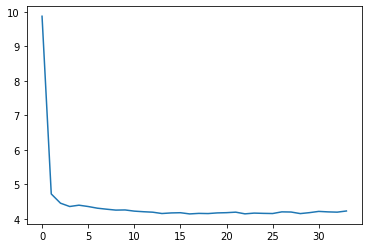

In [110]:
plt.plot(ls)

In [111]:
torch.save(model.state_dict(), 'ParticleTo8x8')

In [157]:
for epoch in range(Epochs):
    print(epoch)
    totalLoss = 0.0
    for i, data in enumerate(train_loader, 1):
        out = model(data)
        #print(x_hat[-1])
        print((out[0]-dataSet8[(i-1)*batch_size:i*batch_size])/dataSet8[(i-1)*batch_size:i*batch_size])
        loss = torch.sqrt( nn.MSELoss()(out,dataSet8[(i-1)*batch_size:i*batch_size]) )
        totalLoss += loss.item()
        print(i,loss)
    #break
    print(totalLoss)
    break

0
tensor([[ 0.0332,  0.0323,  0.0347,  ..., -0.0170, -0.0206, -0.0241],
        [ 0.0332,  0.0323,  0.0347,  ..., -0.0170, -0.0206, -0.0241],
        [ 0.0332,  0.0323,  0.0347,  ..., -0.0170, -0.0206, -0.0241],
        ...,
        [ 0.0336,  0.0341,  0.0364,  ..., -0.0053, -0.0163, -0.0265],
        [ 0.0336,  0.0341,  0.0364,  ..., -0.0053, -0.0163, -0.0265],
        [ 0.0336,  0.0341,  0.0364,  ..., -0.0053, -0.0163, -0.0265]],
       device='cuda:0', grad_fn=<DivBackward0>)
1 tensor(0.0135, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0330,  0.0335,  0.0358,  ..., -0.0047, -0.0158, -0.0262],
        [ 0.0330,  0.0335,  0.0358,  ..., -0.0047, -0.0158, -0.0262],
        [ 0.0330,  0.0335,  0.0358,  ..., -0.0047, -0.0158, -0.0262],
        ...,
        [ 0.0353,  0.0318,  0.0325,  ..., -0.0203, -0.0281, -0.0316],
        [ 0.0353,  0.0318,  0.0325,  ..., -0.0203, -0.0281, -0.0316],
        [ 0.0353,  0.0318,  0.0325,  ..., -0.0203, -0.0281, -0.0316]],
       device='cuda:0', 

tensor([[ 0.0144,  0.0007, -0.0141,  ...,  0.0015, -0.0104, -0.0234],
        [ 0.0150,  0.0009, -0.0135,  ..., -0.0003, -0.0129, -0.0254],
        [ 0.0150,  0.0009, -0.0135,  ..., -0.0003, -0.0129, -0.0254],
        ...,
        [ 0.0356,  0.0155, -0.0073,  ..., -0.0108, -0.0184, -0.0297],
        [ 0.0356,  0.0155, -0.0073,  ..., -0.0108, -0.0184, -0.0297],
        [ 0.0353,  0.0184, -0.0019,  ..., -0.0069, -0.0152, -0.0276]],
       device='cuda:0', grad_fn=<DivBackward0>)
36 tensor(0.0116, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0369,  0.0202,  0.0001,  ..., -0.0084, -0.0164, -0.0283],
        [ 0.0369,  0.0202,  0.0001,  ..., -0.0084, -0.0164, -0.0283],
        [ 0.0369,  0.0202,  0.0001,  ..., -0.0084, -0.0164, -0.0283],
        ...,
        [ 0.0510,  0.0401,  0.0224,  ..., -0.0139, -0.0125, -0.0111],
        [ 0.0510,  0.0401,  0.0224,  ..., -0.0139, -0.0125, -0.0111],
        [ 0.0510,  0.0401,  0.0224,  ..., -0.0139, -0.0125, -0.0111]],
       device='cuda:0', g

tensor([[ 0.0176,  0.0050, -0.0065,  ...,  0.0180,  0.0083, -0.0064],
        [ 0.0176,  0.0050, -0.0065,  ...,  0.0180,  0.0083, -0.0064],
        [ 0.0176,  0.0050, -0.0065,  ...,  0.0180,  0.0083, -0.0064],
        ...,
        [-0.0104, -0.0217, -0.0322,  ...,  0.0117, -0.0031, -0.0191],
        [-0.0086, -0.0184, -0.0288,  ...,  0.0104, -0.0029, -0.0168],
        [-0.0086, -0.0184, -0.0288,  ...,  0.0104, -0.0029, -0.0168]],
       device='cuda:0', grad_fn=<DivBackward0>)
74 tensor(0.0134, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0107, -0.0212, -0.0322,  ...,  0.0140, -0.0023, -0.0199],
        [-0.0107, -0.0212, -0.0322,  ...,  0.0140, -0.0023, -0.0199],
        [-0.0107, -0.0212, -0.0322,  ...,  0.0140, -0.0023, -0.0199],
        ...,
        [ 0.0074,  0.0009, -0.0101,  ...,  0.0191, -0.0054, -0.0306],
        [ 0.0074,  0.0009, -0.0101,  ...,  0.0191, -0.0054, -0.0306],
        [ 0.0074,  0.0009, -0.0101,  ...,  0.0191, -0.0054, -0.0306]],
       device='cuda:0', g

tensor([[ 0.0138,  0.0020, -0.0071,  ...,  0.0089, -0.0085, -0.0340],
        [ 0.0138,  0.0020, -0.0071,  ...,  0.0089, -0.0085, -0.0340],
        [ 0.0138,  0.0020, -0.0071,  ...,  0.0089, -0.0085, -0.0340],
        ...,
        [ 0.0228,  0.0145,  0.0083,  ..., -0.0001, -0.0164, -0.0388],
        [ 0.0228,  0.0145,  0.0083,  ..., -0.0001, -0.0164, -0.0388],
        [ 0.0228,  0.0145,  0.0083,  ..., -0.0001, -0.0164, -0.0388]],
       device='cuda:0', grad_fn=<DivBackward0>)
113 tensor(0.0102, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 2.7049e-02,  1.9125e-02,  1.2568e-02,  ..., -3.9512e-05,
         -1.6664e-02, -3.9565e-02],
        [ 2.7049e-02,  1.9125e-02,  1.2568e-02,  ..., -3.9512e-05,
         -1.6664e-02, -3.9565e-02],
        [ 2.7049e-02,  1.9125e-02,  1.2568e-02,  ..., -3.9512e-05,
         -1.6664e-02, -3.9565e-02],
        ...,
        [ 1.6881e-02,  1.1087e-02,  4.8431e-03,  ..., -4.5359e-03,
         -1.8355e-02, -3.4942e-02],
        [ 1.6881e-02,  1.1087e-02

tensor([[ 0.1333,  0.1105,  0.0770,  ..., -0.0219, -0.0396, -0.0564],
        [ 0.1333,  0.1105,  0.0770,  ..., -0.0219, -0.0396, -0.0564],
        [ 0.1333,  0.1105,  0.0770,  ..., -0.0219, -0.0396, -0.0564],
        ...,
        [ 0.0924,  0.0809,  0.0557,  ..., -0.0316, -0.0518, -0.0705],
        [ 0.0924,  0.0809,  0.0557,  ..., -0.0316, -0.0518, -0.0705],
        [ 0.0864,  0.0758,  0.0522,  ..., -0.0290, -0.0497, -0.0685]],
       device='cuda:0', grad_fn=<DivBackward0>)
152 tensor(0.0257, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0862,  0.0757,  0.0520,  ..., -0.0287, -0.0496, -0.0685],
        [ 0.0862,  0.0757,  0.0520,  ..., -0.0287, -0.0496, -0.0685],
        [ 0.0862,  0.0757,  0.0520,  ..., -0.0287, -0.0496, -0.0685],
        ...,
        [ 0.0799,  0.0709,  0.0480,  ..., -0.0221, -0.0444, -0.0637],
        [ 0.0799,  0.0709,  0.0480,  ..., -0.0221, -0.0444, -0.0637],
        [ 0.0822,  0.0684,  0.0422,  ..., -0.0204, -0.0451, -0.0676]],
       device='cuda:0', 

tensor([[-8.6270e-03, -5.7949e-03, -1.8718e-04,  ..., -5.2293e-02,
         -8.0256e-02, -1.0684e-01],
        [-1.1590e-02, -9.4717e-03, -3.2257e-03,  ..., -5.4591e-02,
         -8.1211e-02, -1.0603e-01],
        [-1.1590e-02, -9.4717e-03, -3.2257e-03,  ..., -5.4591e-02,
         -8.1211e-02, -1.0603e-01],
        ...,
        [-7.4945e-03, -7.6178e-03, -3.3035e-03,  ..., -4.1796e-02,
         -8.1288e-02, -1.2008e-01],
        [-7.4945e-03, -7.6178e-03, -3.3035e-03,  ..., -4.1796e-02,
         -8.1288e-02, -1.2008e-01],
        [-3.4430e-03, -4.1803e-03,  8.3344e-06,  ..., -4.5084e-02,
         -8.3979e-02, -1.2102e-01]], device='cuda:0', grad_fn=<DivBackward0>)
191 tensor(0.0162, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0051, -0.0063, -0.0025,  ..., -0.0434, -0.0826, -0.1200],
        [-0.0051, -0.0063, -0.0025,  ..., -0.0434, -0.0826, -0.1200],
        [-0.0082, -0.0106, -0.0077,  ..., -0.0419, -0.0791, -0.1142],
        ...,
        [-0.0174, -0.0165, -0.0092,  ..., -0

tensor([[ 0.0102,  0.0029, -0.0015,  ...,  0.0087, -0.0089, -0.0351],
        [ 0.0102,  0.0029, -0.0015,  ...,  0.0087, -0.0089, -0.0351],
        [ 0.0150,  0.0075,  0.0022,  ...,  0.0073, -0.0092, -0.0347],
        ...,
        [ 0.0138,  0.0084,  0.0049,  ..., -0.0152, -0.0317, -0.0520],
        [ 0.0138,  0.0084,  0.0049,  ..., -0.0152, -0.0317, -0.0520],
        [ 0.0138,  0.0084,  0.0049,  ..., -0.0152, -0.0317, -0.0520]],
       device='cuda:0', grad_fn=<DivBackward0>)
230 tensor(0.0101, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0133,  0.0080,  0.0045,  ..., -0.0150, -0.0315, -0.0521],
        [ 0.0133,  0.0080,  0.0045,  ..., -0.0150, -0.0315, -0.0521],
        [ 0.0133,  0.0080,  0.0045,  ..., -0.0150, -0.0315, -0.0521],
        ...,
        [ 0.0136,  0.0099,  0.0088,  ..., -0.0030, -0.0129, -0.0313],
        [ 0.0136,  0.0099,  0.0088,  ..., -0.0030, -0.0129, -0.0313],
        [ 0.0091,  0.0059,  0.0055,  ..., -0.0024, -0.0106, -0.0280]],
       device='cuda:0', 

tensor([[ 0.0925,  0.0761,  0.0607,  ..., -0.0092, -0.0218, -0.0365],
        [ 0.0925,  0.0783,  0.0636,  ..., -0.0079, -0.0191, -0.0317],
        [ 0.0925,  0.0783,  0.0636,  ..., -0.0079, -0.0191, -0.0317],
        ...,
        [ 0.0910,  0.0736,  0.0532,  ..., -0.0167, -0.0170, -0.0192],
        [ 0.0910,  0.0736,  0.0532,  ..., -0.0167, -0.0170, -0.0192],
        [ 0.0910,  0.0736,  0.0532,  ..., -0.0167, -0.0170, -0.0192]],
       device='cuda:0', grad_fn=<DivBackward0>)
269 tensor(0.0133, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0900,  0.0745,  0.0557,  ..., -0.0165, -0.0194, -0.0235],
        [ 0.0861,  0.0736,  0.0570,  ..., -0.0172, -0.0216, -0.0268],
        [ 0.0861,  0.0736,  0.0570,  ..., -0.0172, -0.0216, -0.0268],
        ...,
        [ 0.0775,  0.0656,  0.0520,  ..., -0.0322, -0.0377, -0.0455],
        [ 0.0775,  0.0656,  0.0520,  ..., -0.0322, -0.0377, -0.0455],
        [ 0.0777,  0.0686,  0.0570,  ..., -0.0299, -0.0358, -0.0449]],
       device='cuda:0', 

tensor([[ 0.0123, -0.0013, -0.0076,  ..., -0.0181, -0.0311, -0.0504],
        [ 0.0123, -0.0013, -0.0076,  ..., -0.0181, -0.0311, -0.0504],
        [ 0.0099, -0.0040, -0.0098,  ..., -0.0179, -0.0332, -0.0544],
        ...,
        [-0.0034, -0.0091, -0.0076,  ..., -0.0393, -0.0479, -0.0584],
        [-0.0024, -0.0072, -0.0051,  ..., -0.0386, -0.0478, -0.0589],
        [ 0.0088,  0.0036,  0.0036,  ..., -0.0389, -0.0470, -0.0577]],
       device='cuda:0', grad_fn=<DivBackward0>)
308 tensor(0.0110, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0062,  0.0012,  0.0022,  ..., -0.0423, -0.0491, -0.0579],
        [ 0.0062,  0.0012,  0.0022,  ..., -0.0423, -0.0491, -0.0579],
        [ 0.0062,  0.0012,  0.0022,  ..., -0.0423, -0.0491, -0.0579],
        ...,
        [ 0.0120,  0.0061,  0.0024,  ..., -0.0331, -0.0359, -0.0401],
        [ 0.0127,  0.0023, -0.0040,  ..., -0.0299, -0.0324, -0.0366],
        [ 0.0163,  0.0058, -0.0019,  ..., -0.0292, -0.0293, -0.0321]],
       device='cuda:0', 

tensor([[ 0.0460,  0.0400,  0.0348,  ..., -0.0073, -0.0273, -0.0522],
        [ 0.0460,  0.0400,  0.0348,  ..., -0.0073, -0.0273, -0.0522],
        [ 0.0491,  0.0431,  0.0375,  ..., -0.0085, -0.0265, -0.0497],
        ...,
        [ 0.0205,  0.0233,  0.0288,  ..., -0.0171, -0.0306, -0.0490],
        [ 0.0205,  0.0233,  0.0288,  ..., -0.0171, -0.0306, -0.0490],
        [ 0.0195,  0.0208,  0.0262,  ..., -0.0132, -0.0272, -0.0479]],
       device='cuda:0', grad_fn=<DivBackward0>)
347 tensor(0.0144, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0192,  0.0204,  0.0258,  ..., -0.0130, -0.0271, -0.0477],
        [ 0.0161,  0.0171,  0.0222,  ..., -0.0122, -0.0261, -0.0462],
        [ 0.0161,  0.0171,  0.0222,  ..., -0.0122, -0.0261, -0.0462],
        ...,
        [ 0.0147,  0.0194,  0.0265,  ..., -0.0331, -0.0503, -0.0713],
        [ 0.0147,  0.0194,  0.0265,  ..., -0.0331, -0.0503, -0.0713],
        [ 0.0169,  0.0200,  0.0262,  ..., -0.0347, -0.0537, -0.0762]],
       device='cuda:0', 

tensor([[ 0.0652,  0.0424,  0.0213,  ..., -0.0136, -0.0184, -0.0293],
        [ 0.0652,  0.0424,  0.0213,  ..., -0.0136, -0.0184, -0.0293],
        [ 0.0652,  0.0424,  0.0213,  ..., -0.0136, -0.0184, -0.0293],
        ...,
        [ 0.0572,  0.0460,  0.0360,  ..., -0.0168, -0.0282, -0.0465],
        [ 0.0572,  0.0460,  0.0360,  ..., -0.0168, -0.0282, -0.0465],
        [ 0.0539,  0.0417,  0.0315,  ..., -0.0190, -0.0293, -0.0453]],
       device='cuda:0', grad_fn=<DivBackward0>)
385 tensor(0.0122, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0562,  0.0425,  0.0318,  ..., -0.0185, -0.0284, -0.0448],
        [ 0.0562,  0.0425,  0.0318,  ..., -0.0185, -0.0284, -0.0448],
        [ 0.0562,  0.0425,  0.0318,  ..., -0.0185, -0.0284, -0.0448],
        ...,
        [ 0.0861,  0.0569,  0.0344,  ..., -0.0361, -0.0394, -0.0455],
        [ 0.0861,  0.0569,  0.0344,  ..., -0.0361, -0.0394, -0.0455],
        [ 0.0861,  0.0569,  0.0344,  ..., -0.0361, -0.0394, -0.0455]],
       device='cuda:0', 

423 tensor(0.0159, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0241,  0.0097, -0.0046,  ..., -0.0036, -0.0020, -0.0017],
        [ 0.0254,  0.0140,  0.0011,  ..., -0.0029, -0.0008, -0.0002],
        [ 0.0254,  0.0140,  0.0011,  ..., -0.0029, -0.0008, -0.0002],
        ...,
        [ 0.0336,  0.0189,  0.0014,  ..., -0.0166, -0.0035,  0.0152],
        [ 0.0336,  0.0189,  0.0014,  ..., -0.0166, -0.0035,  0.0152],
        [ 0.0336,  0.0189,  0.0014,  ..., -0.0166, -0.0035,  0.0152]],
       device='cuda:0', grad_fn=<DivBackward0>)
424 tensor(0.0146, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0340,  0.0189,  0.0014,  ..., -0.0171, -0.0039,  0.0153],
        [ 0.0340,  0.0189,  0.0014,  ..., -0.0171, -0.0039,  0.0153],
        [ 0.0364,  0.0209,  0.0027,  ..., -0.0151, -0.0004,  0.0202],
        ...,
        [ 0.0653,  0.0473,  0.0213,  ..., -0.0125, -0.0068,  0.0031],
        [ 0.0653,  0.0473,  0.0213,  ..., -0.0125, -0.0068,  0.0031],
        [ 0.0653,  0.0473,  0.0213,

tensor([[-0.0053,  0.0037,  0.0097,  ...,  0.0060, -0.0196, -0.0473],
        [-0.0053,  0.0037,  0.0097,  ...,  0.0060, -0.0196, -0.0473],
        [-0.0027,  0.0055,  0.0120,  ...,  0.0019, -0.0232, -0.0505],
        ...,
        [-0.0015,  0.0031,  0.0038,  ...,  0.0056, -0.0111, -0.0307],
        [-0.0015,  0.0031,  0.0038,  ...,  0.0056, -0.0111, -0.0307],
        [-0.0007,  0.0022,  0.0014,  ...,  0.0050, -0.0119, -0.0305]],
       device='cuda:0', grad_fn=<DivBackward0>)
462 tensor(0.0090, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0010,  0.0018,  0.0010,  ...,  0.0053, -0.0117, -0.0302],
        [-0.0010,  0.0018,  0.0010,  ...,  0.0053, -0.0117, -0.0302],
        [-0.0010,  0.0018,  0.0010,  ...,  0.0053, -0.0117, -0.0302],
        ...,
        [-0.0233, -0.0187, -0.0123,  ...,  0.0078, -0.0158, -0.0402],
        [-0.0254, -0.0183, -0.0101,  ...,  0.0070, -0.0179, -0.0428],
        [-0.0254, -0.0183, -0.0101,  ...,  0.0070, -0.0179, -0.0428]],
       device='cuda:0', 

tensor([[ 0.0089, -0.0013, -0.0088,  ..., -0.0087, -0.0394, -0.0706],
        [ 0.0089, -0.0013, -0.0088,  ..., -0.0087, -0.0394, -0.0706],
        [ 0.0089, -0.0013, -0.0088,  ..., -0.0087, -0.0394, -0.0706],
        ...,
        [ 0.0055, -0.0084, -0.0161,  ..., -0.0034, -0.0351, -0.0662],
        [ 0.0055, -0.0084, -0.0161,  ..., -0.0034, -0.0351, -0.0662],
        [ 0.0055, -0.0084, -0.0161,  ..., -0.0034, -0.0351, -0.0662]],
       device='cuda:0', grad_fn=<DivBackward0>)
501 tensor(0.0195, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0036, -0.0103, -0.0183,  ..., -0.0010, -0.0331, -0.0647],
        [ 0.0036, -0.0103, -0.0183,  ..., -0.0010, -0.0331, -0.0647],
        [-0.0012, -0.0121, -0.0181,  ..., -0.0020, -0.0347, -0.0666],
        ...,
        [-0.0087, -0.0150, -0.0201,  ..., -0.0133, -0.0460, -0.0724],
        [-0.0074, -0.0158, -0.0217,  ..., -0.0115, -0.0426, -0.0688],
        [-0.0074, -0.0158, -0.0217,  ..., -0.0115, -0.0426, -0.0688]],
       device='cuda:0', 

tensor([[0.0424, 0.0255, 0.0126,  ..., 0.0196, 0.0242, 0.0312],
        [0.0424, 0.0255, 0.0126,  ..., 0.0196, 0.0242, 0.0312],
        [0.0424, 0.0245, 0.0125,  ..., 0.0204, 0.0224, 0.0275],
        ...,
        [0.0264, 0.0168, 0.0119,  ..., 0.0258, 0.0250, 0.0283],
        [0.0207, 0.0139, 0.0110,  ..., 0.0291, 0.0291, 0.0326],
        [0.0207, 0.0139, 0.0110,  ..., 0.0291, 0.0291, 0.0326]],
       device='cuda:0', grad_fn=<DivBackward0>)
540 tensor(0.0164, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0174,  0.0104,  0.0069,  ...,  0.0331,  0.0324,  0.0346],
        [ 0.0174,  0.0104,  0.0069,  ...,  0.0331,  0.0324,  0.0346],
        [ 0.0172,  0.0115,  0.0091,  ...,  0.0325,  0.0312,  0.0318],
        ...,
        [ 0.0061,  0.0004, -0.0028,  ...,  0.0296,  0.0190,  0.0103],
        [ 0.0054,  0.0004, -0.0014,  ...,  0.0263,  0.0146,  0.0044],
        [ 0.0054,  0.0004, -0.0014,  ...,  0.0263,  0.0146,  0.0044]],
       device='cuda:0', grad_fn=<DivBackward0>)
541 tensor(0

tensor([[-0.0216, -0.0390, -0.0456,  ...,  0.0133, -0.0160, -0.0444],
        [-0.0216, -0.0389, -0.0464,  ...,  0.0144, -0.0163, -0.0449],
        [-0.0216, -0.0389, -0.0464,  ...,  0.0144, -0.0163, -0.0449],
        ...,
        [-0.0235, -0.0395, -0.0461,  ...,  0.0136, -0.0137, -0.0382],
        [-0.0235, -0.0395, -0.0461,  ...,  0.0136, -0.0137, -0.0382],
        [-0.0230, -0.0373, -0.0430,  ...,  0.0136, -0.0139, -0.0392]],
       device='cuda:0', grad_fn=<DivBackward0>)
579 tensor(0.0143, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-0.0235, -0.0378, -0.0434,  ...,  0.0140, -0.0135, -0.0390],
        [-0.0235, -0.0378, -0.0434,  ...,  0.0140, -0.0135, -0.0390],
        [-0.0235, -0.0378, -0.0434,  ...,  0.0140, -0.0135, -0.0390],
        ...,
        [ 0.0078, -0.0098, -0.0274,  ...,  0.0121, -0.0083, -0.0271],
        [ 0.0099, -0.0072, -0.0248,  ...,  0.0077, -0.0108, -0.0271],
        [ 0.0099, -0.0072, -0.0248,  ...,  0.0077, -0.0108, -0.0271]],
       device='cuda:0', 

tensor([[ 1.3343e-02,  1.7234e-02,  2.1364e-02,  ..., -7.4684e-03,
         -9.8312e-04,  2.8289e-04],
        [ 1.3343e-02,  1.7234e-02,  2.1364e-02,  ..., -7.4684e-03,
         -9.8312e-04,  2.8289e-04],
        [ 1.3343e-02,  1.7234e-02,  2.1364e-02,  ..., -7.4684e-03,
         -9.8312e-04,  2.8289e-04],
        ...,
        [-4.7836e-03, -2.0114e-03,  8.5929e-03,  ..., -1.1165e-02,
         -3.7194e-03,  1.5760e-03],
        [-3.3587e-03, -1.2103e-03,  8.1116e-03,  ..., -1.1735e-02,
         -5.0873e-03,  8.9685e-05],
        [-3.3587e-03, -1.2103e-03,  8.1116e-03,  ..., -1.1735e-02,
         -5.0873e-03,  8.9685e-05]], device='cuda:0', grad_fn=<DivBackward0>)
618 tensor(0.0213, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[-3.1434e-03, -9.8721e-04,  8.3065e-03,  ..., -1.1838e-02,
         -5.1846e-03, -5.8837e-07],
        [-3.1434e-03, -9.8721e-04,  8.3065e-03,  ..., -1.1838e-02,
         -5.1846e-03, -5.8837e-07],
        [-3.1434e-03, -9.8721e-04,  8.3065e-03,  ..., -1.1838

tensor([[ 0.0057, -0.0002, -0.0052,  ..., -0.0016, -0.0089, -0.0083],
        [ 0.0069,  0.0003, -0.0056,  ..., -0.0047, -0.0121, -0.0102],
        [ 0.0069,  0.0003, -0.0056,  ..., -0.0047, -0.0121, -0.0102],
        ...,
        [ 0.0147,  0.0053, -0.0030,  ..., -0.0127, -0.0173, -0.0134],
        [ 0.0147,  0.0053, -0.0030,  ..., -0.0127, -0.0173, -0.0134],
        [ 0.0135,  0.0066, -0.0002,  ..., -0.0117, -0.0157, -0.0107]],
       device='cuda:0', grad_fn=<DivBackward0>)
657 tensor(0.0103, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0133,  0.0063, -0.0004,  ..., -0.0116, -0.0156, -0.0106],
        [ 0.0133,  0.0063, -0.0004,  ..., -0.0116, -0.0156, -0.0106],
        [ 0.0133,  0.0063, -0.0004,  ..., -0.0116, -0.0156, -0.0106],
        ...,
        [ 0.0194,  0.0235,  0.0207,  ..., -0.0196, -0.0281, -0.0278],
        [ 0.0194,  0.0235,  0.0207,  ..., -0.0196, -0.0281, -0.0278],
        [ 0.0194,  0.0235,  0.0207,  ..., -0.0196, -0.0281, -0.0278]],
       device='cuda:0', 

tensor([[ 0.0924,  0.0728,  0.0491,  ..., -0.0272, -0.0578, -0.0831],
        [ 0.0924,  0.0728,  0.0491,  ..., -0.0272, -0.0578, -0.0831],
        [ 0.0924,  0.0728,  0.0491,  ..., -0.0272, -0.0578, -0.0831],
        ...,
        [ 0.1012,  0.0833,  0.0572,  ..., -0.0388, -0.0754, -0.1046],
        [ 0.0953,  0.0784,  0.0539,  ..., -0.0370, -0.0750, -0.1045],
        [ 0.0953,  0.0784,  0.0539,  ..., -0.0370, -0.0750, -0.1045]],
       device='cuda:0', grad_fn=<DivBackward0>)
696 tensor(0.0329, device='cuda:0', grad_fn=<SqrtBackward>)
tensor([[ 0.0913,  0.0764,  0.0536,  ..., -0.0377, -0.0742, -0.1016],
        [ 0.0913,  0.0764,  0.0536,  ..., -0.0377, -0.0742, -0.1016],
        [ 0.0956,  0.0789,  0.0545,  ..., -0.0422, -0.0793, -0.1074],
        ...,
        [ 0.0882,  0.0663,  0.0410,  ..., -0.0553, -0.0940, -0.1221],
        [ 0.0882,  0.0663,  0.0410,  ..., -0.0553, -0.0940, -0.1221],
        [ 0.0882,  0.0663,  0.0410,  ..., -0.0553, -0.0940, -0.1221]],
       device='cuda:0', 

In [8]:
import math

In [4]:
class Residual_Block(nn.Module):
    def __init__(self):
        super(Residual_Block, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False)
        self.in1 = nn.InstanceNorm2d(64, affine=True)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False)
        self.in2 = nn.InstanceNorm2d(64, affine=True)

    def forward(self, x):
        identity_data = x
        output = self.relu(self.in1(self.conv1(x)) )
        output = self.in2(self.conv2(output))
        output = torch.add(output,identity_data)
        return output


In [5]:
class NetG(nn.Module):
    def __init__(self):
        super(NetG, self).__init__()
        self.conv_input = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=5, stride=1, padding=2, bias=False)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.residual = self.make_layer(Residual_Block, 18)
        self.conv_mid = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn_mid = nn.InstanceNorm2d(64, affine=True)

        self.upscale2x = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=256, kernel_size=3, stride=1, padding=1, bias=False),
            nn.PixelShuffle(2),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.conv_output = nn.Conv2d(in_channels=64, out_channels=1, kernel_size=5, stride=1, padding=2, bias= False)
        
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
                if m.bias is not None:
                    m.bias.data.zero_()

    def make_layer(self, block, num_of_layer):
        layers = []
        for _ in range(num_of_layer):
            layers.append(block())
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.relu(self.conv_input(x))
        residual = out
        out = self.residual(out)
        #out= self.bn_mid(self.conv_mid(out))
        #print(out.shape)
        out = torch.add(out,residual)
        #print(out.shape)
        out = self.upscale2x(out)
        #print(out.shape)
        out = self.conv_output(out)
        return out
        return torch.relu(out)
        t = torch.softmax( torch.reshape(out,(out.shape[0],1,out.shape[2]*out.shape[2])), 2 )
        print(torch.reshape(out,(out.shape[0],out.shape[1],out.shape[2],out.shape[3])).shape )
        #print(torch.softmax( torch.flatten(out[:,:,]))
        return torch.reshape(out,(out.shape[0],out.shape[1],out.shape[2],out.shape[3]))
        return out

In [12]:
class NetD(nn.Module):
    def __init__(self):
        super(NetD, self).__init__()

        self.features = nn.Sequential(
        
            # input is (3) x 96 x 96
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (64) x 96 x 96
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),            
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (64) x 96 x 96
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False),            
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (64) x 48 x 48
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (128) x 48 x 48
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (256) x 24 x 24
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (256) x 12 x 12
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1, bias=False),            
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # state size. (512) x 12 x 12
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),            
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.LeakyReLU = nn.LeakyReLU(0.2, inplace=True)
        self.fc1 = nn.Linear(512 * 6 * 6, 1024)
        self.fc2 = nn.Linear(1024, 1)
        self.sigmoid = nn.Sigmoid()

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                m.weight.data.normal_(0.0, 0.02)
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.normal_(1.0, 0.02)
                m.bias.data.fill_(0)

    def forward(self, input):

        out = self.features(input)

        # state size. (512) x 6 x 6
        out = out.view(out.size(0), -1)

        # state size. (512 x 6 x 6)
        out = self.fc1(out)

        # state size. (1024)
        out = self.LeakyReLU(out)

        out = self.fc2(out)
        out = self.sigmoid(out)
        return out.view(-1, 1).squeeze(1)

In [13]:
def toDoubleTensor(model,data1, data2,batch_size):
    model = model.type('torch.DoubleTensor').to('cuda')
    data_loader = torch.utils.data.DataLoader(data1.unsqueeze(1).type('torch.DoubleTensor').to('cuda'), batch_size = batch_size)
    data2 = data2.type('torch.DoubleTensor').to('cuda')
    return [model,data_loader,data2]

In [14]:
model = NetG().type('torch.FloatTensor').to('cuda')

In [43]:
model = model.type('torch.DoubleTensor').to('cuda')

In [15]:
dataSet16 = dataSet16.type('torch.FloatTensor').to('cuda')

In [16]:
dataSet32 = torch.from_numpy(dataSet32).type('torch.FloatTensor').to('cuda').unsqueeze(1)

TypeError: expected np.ndarray (got Tensor)

In [17]:
batch_size = 100
epochs = 100

In [20]:
train_loader = torch.utils.data.DataLoader(dataSet16.unsqueeze(1).type('torch.FloatTensor').to('cuda'), batch_size=batch_size )

In [21]:
print(dataSet16.unsqueeze(1).type('torch.DoubleTensor').to('cuda').shape)

torch.Size([70000, 1, 16, 16])


In [73]:
dataSet32 = torch.from_numpy(dataSet32).type('torch.FloatTensor')

TypeError: expected np.ndarray (got Tensor)

In [41]:
dataSet32 = dataSet32.type('torch.DoubleTensor').to('cuda')

In [21]:
print(dataSet32.shape)

torch.Size([70000, 1, 32, 32])


In [19]:
dataSet32 = dataSet32.unsqueeze(1)

In [39]:
adOptimizer = optim.Adam(model.parameters(),lr =0.00001)

In [40]:
adOptimizer.to('cuda')

AttributeError: 'Adam' object has no attribute 'to'

In [27]:
tl = []

In [23]:
model.load_state_dict(torch.load("DenseEstimFullResNet16-32"))
model.eval()

NetG(
  (conv_input): Conv2d(1, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
  (relu): LeakyReLU(negative_slope=0.2, inplace=True)
  (residual): Sequential(
    (0): Residual_Block(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (in1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (relu): LeakyReLU(negative_slope=0.2, inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (in2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
    )
    (1): Residual_Block(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (in1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (relu): LeakyReLU(negative_slope=0.2, inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)

In [45]:
for epoch in range(epochs):
    print("Epoch is " + str(epoch))
    if((epoch+1)%2 == 0):
        torch.save(model.state_dict(), 'DenseEstimFullResNet16-32')
    ELoss = 0.0
    for en, data in enumerate(train_loader,1):
        print(en)
        adOptimizer.zero_grad()
        out = model(data)
        #print(out)
        #print(dataSet32[(en-1)*batch_size:en*batch_size])
        loss = torch.sqrt( nn.MSELoss()(out,dataSet32[(en-1)*batch_size:en*batch_size]) )
        loss.backward()
        #print(out)
        print(math.isnan(loss.item()), math.isinf(loss.item()))
        print(loss.item())
        ELoss += loss.item()
        if(math.isnan(loss.item()) or math.isinf(loss.item())):
            break
        
        adOptimizer.step()
        #print(out[0]-dataSet32[0])
    if(math.isnan(ELoss) or math.isinf(ELoss)):
            break
        
    print(ELoss)
    tl.append(ELoss)

Epoch is 0
1
False False
0.010130373761057854
2
False False
0.008227415382862091
3
False False
0.008479657582938671
4
False False
0.00869062077254057
5
False False
0.009016037918627262
6
False False
0.008533311076462269
7
False False
0.00851504597812891
8
False False
0.007973100990056992
9
False False
0.00788938719779253
10
False False
0.008178896270692348
11
False False
0.00770961120724678
12
False False
0.008120490238070488
13
False False
0.007108865771442652
14
False False
0.007803524844348431
15
False False
0.007722440175712109
16
False False
0.007627086713910103
17
False False
0.007336821872740984
18
False False
0.007006011437624693
19
False False
0.00665988028049469
20
False False
0.006866101641207933
21
False False
0.007391204591840506
22
False False
0.006881455425173044
23
False False
0.007265045773237944
24
False False
0.0068403687328100204
25
False False
0.006787254940718412
26
False False
0.0068304212763905525
27
False False
0.0069595868699252605
28
False False
0.00708091584

227
False False
0.0074934219010174274
228
False False
0.0071665323339402676
229
False False
0.006891518831253052
230
False False
0.007007591426372528
231
False False
0.0063618882559239864
232
False False
0.006186051294207573
233
False False
0.006485085468739271
234
False False
0.006822704803198576
235
False False
0.007132857572287321
236
False False
0.007200005929917097
237
False False
0.006584504619240761
238
False False
0.006897527724504471
239
False False
0.006829952355474234
240
False False
0.006855820305645466
241
False False
0.007170683238655329
242
False False
0.00701550068333745
243
False False
0.007339701987802982
244
False False
0.008893013000488281
245
False False
0.007501260843127966
246
False False
0.007471101824194193
247
False False
0.007565474137663841
248
False False
0.0072669219225645065
249
False False
0.007786381524056196
250
False False
0.007503109518438578
251
False False
0.006849119905382395
252
False False
0.008045274764299393
253
False False
0.00875543802976608

False False
0.008323456160724163
450
False False
0.008570040576159954
451
False False
0.008417856879532337
452
False False
0.008291838690638542
453
False False
0.007543569430708885
454
False False
0.007259409409016371
455
False False
0.00728492671623826
456
False False
0.007362883538007736
457
False False
0.0072336262091994286
458
False False
0.0072539555840194225
459
False False
0.007186496164649725
460
False False
0.007226891350001097
461
False False
0.007432691752910614
462
False False
0.007181327324360609
463
False False
0.007548618130385876
464
False False
0.0072278291918337345
465
False False
0.007346760015934706
466
False False
0.007959205657243729
467
False False
0.008582563139498234
468
False False
0.00831083208322525
469
False False
0.0077452207915484905
470
False False
0.007580847013741732
471
False False
0.00718663539737463
472
False False
0.007742979098111391
473
False False
0.008580447174608707
474
False False
0.008930345065891743
475
False False
0.008078706450760365
476


False False
0.007145248353481293
672
False False
0.006761645898222923
673
False False
0.007508843205869198
674
False False
0.007456816267222166
675
False False
0.006939483806490898
676
False False
0.0070531340315938
677
False False
0.006823090836405754
678
False False
0.006742181722074747
679
False False
0.007158742286264896
680
False False
0.007034990005195141
681
False False
0.007128086406737566
682
False False
0.006637635175138712
683
False False
0.0066421255469322205
684
False False
0.007364987395703793
685
False False
0.00669015571475029
686
False False
0.007056743372231722
687
False False
0.006552376784384251
688
False False
0.006021162029355764
689
False False
0.006797415670007467
690
False False
0.006856987252831459
691
False False
0.0069882431998848915
692
False False
0.007397638168185949
693
False False
0.007475057616829872
694
False False
0.007584462407976389
695
False False
0.007379004266113043
696
False False
0.007024502381682396
697
False False
0.008568761870265007
698
Fa

False False
0.008241284638643265
196
False False
0.007918480783700943
197
False False
0.008003141731023788
198
False False
0.007164065260440111
199
False False
0.007298924960196018
200
False False
0.007288194727152586
201
False False
0.00651628477498889
202
False False
0.006741056684404612
203
False False
0.007739364635199308
204
False False
0.0076729715801775455
205
False False
0.007747170981019735
206
False False
0.00806957297027111
207
False False
0.006972350180149078
208
False False
0.008133347146213055
209
False False
0.00885754730552435
210
False False
0.008722148835659027
211
False False
0.00846447329968214
212
False False
0.008327223360538483
213
False False
0.008295711129903793
214
False False
0.007856379263103008
215
False False
0.008648831397294998
216
False False
0.009221953339874744
217
False False
0.009420959278941154
218
False False
0.008714289404451847
219
False False
0.008594990707933903
220
False False
0.008201811462640762
221
False False
0.008451418951153755
222
Fals

False False
0.008477588184177876
420
False False
0.0077868178486824036
421
False False
0.008391167037189007
422
False False
0.008039750158786774
423
False False
0.0076238010078668594
424
False False
0.008085567504167557
425
False False
0.00832561869174242
426
False False
0.007738363463431597
427
False False
0.007162217982113361
428
False False
0.007095765322446823
429
False False
0.007335621863603592
430
False False
0.007526738569140434
431
False False
0.008343739435076714
432
False False
0.00797639973461628
433
False False
0.007668607402592897
434
False False
0.007966308854520321
435
False False
0.007737615145742893
436
False False
0.007295140065252781
437
False False
0.007090794388204813
438
False False
0.007073818240314722
439
False False
0.006744958460330963
440
False False
0.0070611340925097466
441
False False
0.006979025434702635
442
False False
0.007286089472472668
443
False False
0.007373569067567587
444
False False
0.00804347824305296
445
False False
0.007774036377668381
446
F

False False
0.008294055238366127
643
False False
0.0086207902058959
644
False False
0.00828925147652626
645
False False
0.008013303391635418
646
False False
0.008077037520706654
647
False False
0.007848083972930908
648
False False
0.00841344054788351
649
False False
0.008371883071959019
650
False False
0.008223878219723701
651
False False
0.007872032932937145
652
False False
0.007705550640821457
653
False False
0.008442392572760582
654
False False
0.00833981391042471
655
False False
0.008240646682679653
656
False False
0.007629530504345894
657
False False
0.007576521020382643
658
False False
0.007791364565491676
659
False False
0.00793992169201374
660
False False
0.007768860552459955
661
False False
0.007316542789340019
662
False False
0.00736837787553668
663
False False
0.007860499434173107
664
False False
0.008038832806050777
665
False False
0.007274345960468054
666
False False
0.0077688670717179775
667
False False
0.006970374844968319
668
False False
0.007445367053151131
669
False F

False False
0.008036567829549313
168
False False
0.008522761054337025
169
False False
0.009299059398472309
170
False False
0.008877398446202278
171
False False
0.008228220045566559
172
False False
0.008270541206002235
173
False False
0.008849622681736946
174
False False
0.009194418787956238
175
False False
0.008516165427863598
176
False False
0.008398119360208511
177
False False
0.008409063331782818
178
False False
0.008442807011306286
179
False False
0.008806421421468258
180
False False
0.008693025447428226
181
False False
0.008494351990520954
182
False False
0.007365746423602104
183
False False
0.0074571301229298115
184
False False
0.007506413850933313
185
False False
0.007244352716952562
186
False False
0.007031707558780909
187
False False
0.0069085583090782166
188
False False
0.007253649644553661
189
False False
0.007480979431420565
190
False False
0.00768421683460474
191
False False
0.007808359805494547
192
False False
0.007502393797039986
193
False False
0.007586132735013962
194


KeyboardInterrupt: 

In [43]:
test_loader =  torch.utils.data.DataLoader(dataSet8.unsqueeze(1).type('torch.FloatTensor').to('cuda')[70000:], batch_size=batch_size )

NameError: name 'dataSet8' is not defined

In [46]:
print(tl)

[11.471554830670357, 10.872279188595712, 10.444101568311453, 10.115021716803312, 9.756550691090524, 9.629613969475031, 9.44274131488055, 9.268849444575608, 9.116700011305511, 8.972818036563694, 8.839977895841002, 8.62057286221534, 8.578547253273427, 8.462702451273799, 8.360727451741695, 8.271073604002595, 8.164939997717738, 8.086449164897203, 7.995968974195421, 7.9217315493151546, 7.842998287640512, 7.775537244044244, 7.703508952632546, 7.636219541542232, 7.5656763492152095, 7.501458069309592, 7.441949797794223, 7.380652948282659, 7.325888183899224, 7.263978432863951, 7.2084418991580606, 7.157546806149185, 7.112995330709964, 7.057833256199956, 7.009858699515462, 6.962063287850469, 6.92064055101946, 6.872051017358899, 6.826999354176223, 6.794545688200742, 6.745394240599126, 6.703035869635642, 6.657647045329213, 6.610534843057394, 6.571137374266982, 6.609700149856508, 6.489080111961812, 6.455003056675196, 6.413057064637542, 6.375545321498066, 6.351983278524131, 6.314850255846977, 6.28171

In [32]:
for epoch in range(epochs):
    print("Epoch is " + str(epoch))
    ELoss = 0.0
    for en, data in enumerate(test_loader,1):
        print(en)
        #print(data.shape)
        #adOptimizer.zero_grad()
        out = model(data)
        print(out.size())
        #print(dataSet32[(en-1)*batch_size:en*batch_size])
        #print(out)
        loss = torch.sqrt( nn.MSELoss()(out,dataSet16[70000+(en-1)*batch_size:70000+en*batch_size]) )
        print((out[0]- dataSet16[70000+(en-1)*batch_size:70000+en*batch_size][0])/dataSet16[70000+(en-1)*batch_size:70000+en*batch_size][0]) 
        #loss.backward()
        #print(out)
        print(math.isnan(loss.item()), math.isinf(loss.item()))
        print(loss.item())
        
        ELoss += loss.item()
        if(math.isnan(loss.item()) or math.isinf(loss.item())):
            break
        #adOptimizer.step()
        #print(out[0]-dataSet32[0])
    if(math.isnan(ELoss) or math.isinf(ELoss)):
            break
    print(ELoss)
   

Epoch is 0


NameError: name 'test_loader' is not defined

In [27]:
class combineModel(nn.Module):
    def __init__(self,model1,model2,model3):
        super(combineModel,self).__init__()
        self.model1 = model1
        self.model2 = model2
        self.model3 = model3
    
    def forward(self,inp):
        out = self.model1(inp)
        out = torch.reshape(out,(out.shape[0],1,8,8))
        out = self.model2(out)
        out = self.model3(out)
        return out
        

In [28]:
def train(model, Optimizer, epochs, batch_size, train_loader, dataLabel):
    Eloss = []
    for Epoch in epochs:
        print(Epoch)
        total_loss = 0.0
        for i,data in enumerate(train_loader,1):
            print(i)
            Optimizer.zero_grad()
            out = model(data)
            loss = myLoss(out, dataLabel[(i-1)*batch_size:i*batch_size])
            print(loss.item())
            loss.backward()
            Optimizer.step()
            total_loss +=loss.item()
        print(total_loss)
        Eloss.append(total_loss)
    return Eloss

In [29]:
def validate(model,batch_size,inputData,dataLabel):
    test_loader = torch.utils.data.DataLoader(inputData, batch_size=batch_size)
    totalLoss = 0.0
    for i, data in enumerate(test_loader, 1):
        print(i,data.shape)
        out = model(data)
        print(out.shape)
        Loss = nn.MSELoss()(out,dataLabel)
        totalLoss += Loss
        
    return totalLoss

In [30]:
model1 = DensityEstimator(4,64).type('torch.FloatTensor').to('cuda')
model2 = NetG().type('torch.FloatTensor').to('cuda')


In [31]:
model3 = NetG().type('torch.FloatTensor').to('cuda')

In [32]:
inputData = torch.from_numpy(train_set[:70000,:4]).type('torch.FloatTensor').to('cuda')
dataSet32 = torch.from_numpy( np.load('DataSet32.npy')[:70000] ).type('torch.FloatTensor').to('cuda')

NameError: name 'train_set' is not defined

In [ ]:
model1.load_state_dict(torch.load("ParticleTo8x8"))
model1.eval()

In [ ]:
model2.load_state_dict(torch.load("DenseEstimResNet8-16"))
model2.eval()

In [ ]:
model3.load_state_dict(torch.load("DenseEstimResNet"))
model3.eval()

In [ ]:
CombineModel = combineModel(model1,model2,model3)

In [114]:
validate(CombineModel,100, inputData, dataSet32)

1 torch.Size([100, 4])
torch.Size([100, 1, 38, 38])


RuntimeError: The size of tensor a (38) must match the size of tensor b (32) at non-singleton dimension 3

In [58]:
test_loader = torch.utils.data.DataLoader(inputData, batch_size=batch_size)
totalLoss = 0.0
for i, data in enumerate(test_loader, 1):
    out = model1(data)
    out = torch.reshape(out,(out.shape[0],1,8,8))
    out = model2(out)
    out = model3(out)

tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8673e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8671e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8673e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8673e+11, device='cuda:0', grad_fn=<SumBackward0>)
tensor(2.8672e+11, device='cuda:0', grad

KeyboardInterrupt: 